# Fix the overfitting problem for parametric umap autoencoder
1. check the adv inverse labels the same with the original ones?
2. use data augmentation to retrain the model and see if it do increase the accu for adv samples
3. change the way to draw boundary, entropy->top1-top2 logits
4. find DBP, the last property, border distance metric

## load Gap layer data

In [1]:
import torch
import math

import numpy as np
import torchvision
import torchvision.transforms as transforms
# from torch.utils.tensorboard import SummaryWriter
from tensorboardX import SummaryWriter
from cifar10_models import *

In [2]:
INPUT_SIZE = 2048
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [5]:
# load model
model = resnet50(pretrained=True)
model.eval()
model.to(device)
print("Load Model successfully...")

Load Model successfully...


In [3]:
# hyperparameters
data_shape = (2048,)

ADD_NOISE = False
n_hidden = 500
dim_img = INPUT_SIZE  # number of pixels for a MNIST image
dim_z = 2

# train
n_epochs = 500
batch_size = 200
learn_rate = 0.001

In [5]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])

trainset = torchvision.datasets.CIFAR10(root='data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=200,
                                          shuffle=True, num_workers=2)
training_data = np.zeros((50000, 3, 32, 32))

for i, (data, target) in enumerate(trainloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    training_data[r1:r2] = data

train_pred_labels = np.zeros(50000)
raw_input_X = torch.from_numpy(training_data).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = model(inputs).cpu().numpy().argmax(axis=1)
        output_Y[r1:r2] = pred
train_data = input_X    # (50000,2048)
train_pred_labels = output_Y

training_data.shape, train_data.shape, train_pred_labels.shape

Files already downloaded and verified


((50000, 3, 32, 32), (50000, 2048), (50000,))

In [4]:
train_data = np.load("train_data.npy")
train_pred_labels = np.load("train_pred_labels.npy")

In [6]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])
testset = torchvision.datasets.CIFAR10(root='data', train=False,
                                        download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=200,
                                          shuffle=True, num_workers=2)
testing_data = np.zeros((10000, 3, 32, 32))
for i, (data, target) in enumerate(testloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    testing_data[r1:r2] = data

raw_input_X = torch.from_numpy(testing_data).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = model(inputs).cpu().numpy().argmax(axis=1)
        output_Y[r1:r2] = pred
test_data = input_X    # (10000,2048)
test_pred_labels = output_Y

testing_data.shape, test_data.shape, test_pred_labels.shape

Files already downloaded and verified


((10000, 3, 32, 32), (10000, 2048), (10000,))

In [5]:
np.save("test_data.npy", test_data)
np.save("test_pred_labels.npy", test_pred_labels)

NameError: name 'test_data' is not defined

In [6]:
test_data = np.load("test_data.npy")
test_pred_labels = np.load("test_pred_labels.npy")

## Adv training samples

In [5]:
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
softmax = torch.nn.Softmax(dim=-1)
epsilons = [.01,.03,.05,.1]
epsilon = .01

In [6]:
def adv_attack(image, epsilon, data_grad):
    
    # Collect the element-wise sign of the data gradient
    sign_data_grad = torch.sign(data_grad)
    
    perturbed_image = image + epsilon*sign_data_grad
 
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)

    return perturbed_image

### fgsm

In [9]:
print("attack with epsilon {}...".format(epsilon))

adv_data = np.zeros((50000, 3, 32, 32))
for i, (data, target) in enumerate(trainloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    data, target = data.to(device), target.to(device)

    # Set requires_grad attribute of tensor. Important for Attack
    data.requires_grad = True

    # Forward pass the data through the model
    output = model(data)
    init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

    loss = criterion(output, target) # loss for ground-truth class

    # Back propogation
    model.zero_grad()
    loss.backward()

    # Collect data_grad
    data_grad = data.grad.data

    # Call Attack
    perturbed_data = adv_attack(data, epsilon, data_grad)

    adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
    adv_data[r1:r2] = adv_ex

adv_data.shape

attack with epsilon 0.01...


(50000, 3, 32, 32)

### ifgsm

In [7]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])

trainset = torchvision.datasets.CIFAR10(root='data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1,
                                          shuffle=True, num_workers=2)

Files already downloaded and verified


In [8]:
print("attack with epsilon {}...".format(epsilon))

adv_data = np.zeros((50000, 3, 32, 32))
adv_pred_labels = np.zeros(50000)
r=0
for i, (data, target) in enumerate(trainloader, 0):
#     r1 = i * 2
#     adv_data[r1] = data.detach().numpy()
#     adv_pred_labels[r1] = target.detach().numpy()
    
    data, target = data.to(device), target.to(device)

    # Set requires_grad attribute of tensor. Important for Attack
    data.requires_grad = True
    j=1
    while True:
        output = model(data)
        if j ==1:
            print(output.detach().cpu().numpy())
        loss = criterion(output, target)  # loss for ground-truth class
        model.zero_grad()
        loss.backward()
        data_grad = data.grad.data

        perturbed_data = adv_attack(data, epsilon, data_grad)

        output = model(perturbed_data)
        sort, _ = torch.sort(output, dim=-1, descending=True)
        abs_dis = sort[0,0]-sort[0,1]
        print(abs_dis)
#         probabilities = softmax(output).detach().cpu().numpy()
#         entropy = -(probabilities*np.log(probabilities)).sum()/np.log(10)
        final_pred = output.max(1, keepdim=True)[1]

        adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
        data = torch.from_numpy(np.expand_dims(adv_ex, axis=0)).to(device)
        data.requires_grad = True
        j = j+1
        if final_pred.item() != target:
            if abs_dis< 0.5:
                adv_data[r] = adv_ex
                adv_pred_labels[r] = final_pred.item()
                r = r+1
    #             print(i,j,target.detach().cpu().numpy(),"->",final_pred.item(),entropy)
    #             print(output.detach().cpu().numpy())
    #             print(probabilities)
            break
        if abs_dis < 1.5:
            adv_data[r] = adv_ex
            adv_pred_labels[r] = final_pred.item()
            r = r+1
            break
            
adv_data.shape, adv_pred_labels.shape, r

attack with epsilon 0.01...
[[-0.45768622 -1.207025    5.969488   -0.2821046  -0.45870957 -0.07014304
  -0.38087296 -0.84799623 -1.1110017  -1.1538645 ]]
tensor(0.2260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9368259  -1.2013924  -0.3873324  -0.4224888   5.553246   -0.42536294
  -0.8005157   0.87617165 -1.1319215  -1.1236469 ]]
tensor(2.0759, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92102695 -0.9574123  -0.18286772 -0.16207665 -0.4914467  -0.65296376
   6.186546   -1.0012423  -0.89635134 -0.9212045 ]]
tensor(3.8923, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93119854 -1.0145772   0.33155942 -0.21154293 -0.5767312  -0.68896025
   6.0889134  -1.0491143  -0.96473616 -0.9836497 ]]
tensor(1.1233, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9567958  -1.1616572  -0.56725     6.092574   -0.64951164  0.5714501
  -0.57523245 -0.7142312  -0.9862726  -1.0530937 ]]
tensor(0.1700, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6133661   5.705823   -0.8374586  -0.69452226 -0.91446364 -

tensor(3.0523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4875, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9363385  -1.0893259  -0.5972286   6.3334265  -0.70394856  0.61065006
  -0.5570729  -0.8183144  -1.1488636  -1.0930045 ]]
tensor(2.0639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3042, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5985482   5.578062   -0.7771136  -0.69728446 -0.8781239  -0.74090904
  -0.7418777  -0.79686415 -0.4454105   0.09806178]]
tensor(0.9046, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9377437  -0.8036432  -0.26716268 -0.7294885  -0.8084191  -1.0361192
  -0.8865452  -0.9330172  -0.21842243 -0.2549105 ]]
tensor(5.8842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5563, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8643619  -1.1424406  -0.62200505  1.0178422  -0.6832477   5.2447343
  -0.89676934  0.00653648 -1.1622123  -0.89804

tensor(1.4560, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52105695 -0.0125864  -0.87104464 -0.5850753  -0.9166924  -0.85278213
  -0.87328357 -0.7892392  -0.52597606  5.9476776 ]]
tensor(2.1826, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94186753 -0.98576313 -0.1130961  -0.12617815 -0.57338643  0.19988188
   5.3209615  -0.9560545  -0.9484228  -0.87610877]]
tensor(0.0772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82303727 -1.0604701  -0.34366664 -0.33875895  5.9568057  -0.42556196
  -0.6364501  -0.35587654 -0.9766979  -0.99636066]]
tensor(1.2213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61231893  5.880031   -0.83390915 -0.76245886 -0.914201   -0.7848016
  -0.7711476  -0.8891192  -0.44185877  0.12977624]]
tensor(2.5954, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8560655e-01 -5.2942238e-03 -8.8667500e-01 -7.1009862e-01
  -9.4336367e-01 -7.9315484e-01 -8.9031088e-01 -7.8985327e-01
  -5.1902205e-01  6.0233207e+00]]
tensor(5.6340, device='cuda:0', grad_fn=<SubBackward0>)
[[-

tensor(1.2386, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.771217   -0.7665496  -0.23250894 -0.6585255  -0.76027167 -0.91141516
  -0.88279337 -0.80667126 -0.19579415 -0.55666953]]
tensor(6.0683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7137, device='cuda:0', gr

tensor(5.1024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1673, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58692515  5.456562   -0.8018593  -0.72309494 -0.9109903  -0.75280225
  -0.7645386  -0.87563854 -0.4412218   0.40049997]]
tensor(1.5824, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7974168  -1.0013435  -0.6056307  -0.54099274 -0.26477823 -0.06150964
  -0.9407893   5.961699   -0.9767511  -0.77250105]]
tensor(3.0561, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1467339  -0.571759   -0.72008467 -0.6316993  -0.87157303 -0.8620576
  -0.33958477 -0.9233111   5.5414815  -0.4747239 ]]
tensor(1.1077, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5888808   5.6246343  -0.81721985 -0.7493247  -0.9019478  -0.7882354
  -0.74223006 -0.8744808  -0.33467257  0.17234904]]
tensor(0.6203, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8938178  -1.1296576  -0.40840286 -0.24109878  6.2176657  -0.43254647
  -0.6452096  -0.3854736  -1.062

[[-0.672333    5.483946   -0.8166802  -0.70189095 -0.93912    -0.23524198
  -0.78410923 -0.89287597 -0.48294526  0.04124736]]
tensor(0.7609, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95843065 -1.2265625  -0.58294135  5.8516216  -0.60182023  0.4213624
  -0.34515983 -0.867549   -1.1878129  -0.5027345 ]]
tensor(1.3234, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94759953 -1.2116449  -0.17154281 -0.35836706  5.530208   -0.14814505
  -0.76396936  0.37516317 -1.1436423  -1.1605238 ]]
tensor(0.6535, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38079718 -1.1795652   6.26798    -0.31131554 -0.41682696 -0.53777623
  -0.45324886 -0.8361323  -1.05998    -1.0922523 ]]
tensor(3.8487, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0596845e-01 -2.0365487e-03 -8.6009109e-01 -7.0133102e-01
  -9.0396512e-01 -7.6646030e-01 -8.5181892e-01 -7.6038146e-01
  -4.9621612e-01  5.8482113e+00]]
tensor(1.4949, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16820958 -0.6369994  -0.7835864  -0.25293922 -0.876754

[[-1.0635663  -1.035659   -0.49141255  0.5287894  -0.62358904  5.9645667
  -0.7746226  -0.3955149  -1.1065737  -1.0023845 ]]
tensor(2.0409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8490, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6012405   5.8713026  -0.81464386 -0.7665479  -0.9214377  -0.7971415
  -0.7693617  -0.8917142  -0.4416476   0.13242549]]
tensor(0.2703, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07570373 -0.5558425  -0.7699048  -0.6833137  -0.9004501  -0.9341867
  -0.83644456 -0.927376    6.1289206  -0.4457453 ]]
tensor(6.0296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1737, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8732112  -0.8554746  -0.5616461   6.217189   -0.69765526  0.5576961
  -0.6335177  -0.8050977  -1.2055848  -1.1427156 ]]
tensor(5.7749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6908, device='cuda:0', grad_fn=<SubBackward

tensor(1.9375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3888, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09654909 -0.5505364  -0.7415963  -0.6674427  -0.8640768  -0.8024565
  -0.77464896 -0.89697427  5.8389034  -0.44466755]]
tensor(3.6443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1470, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9013258  -0.9317628  -0.20523593 -0.16603194 -0.5332434  -0.5380465
   6.00416    -0.9637416  -0.8670016  -0.8978142 ]]
tensor(4.2120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4905659  -0.03290122 -0.84593225 -0.6964047  -0.8791862  -0.840696
  -0.85711884 -0.7565809  -0.22453628  5.623864  ]]
tensor(4.5739, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5071077  -0.00800464 -0.87288857 -0.7031101  -0.9112532  -0.9230484
  -0.9057587  -0.8115234  -0.3834538   6.0260878 ]]
tensor(2.3981, device='cuda:0', grad_fn=<SubBackward0

tensor(1.1135, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8155057  -1.0044506  -0.61879486 -0.43402424 -0.17097998 -0.09660172
  -0.9699803   5.931385   -0.99959254 -0.8214704 ]]
tensor(5.8346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4716404  -1.2064961   5.7246323   0.30289102 -0.35377252 -0.42591625
  -0.50911134 -0.8211983  -1.1151589  -1.1241528 ]]
tensor(6.4781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50793767 -0.00711992 -0.81958747 -0.70531076 -0.8938863  -0.8294338
  -0.82229894 -0.76098174 -0.5108001   5.857299  ]]
tensor(5.8531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.8469557  -1.0949506  -0.10680385 -0.33260614  5.826962   -0.4265347
  -0.57498795 -0.38590983 -1.0276401  -1.0306431 ]]
tensor(5.8299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3177611  -1.1398699   6.148259   -0.37967908 -0.45321006 -0.54591036
  -0.4030442  -0.8247587  -1.0190552  -1.0648863 ]]
tensor(4.7452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1805, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0793008  -1.1985685   0.48114264  0.425914   -0.6081842   5.7303596
  -0.84311235 -0.4964059  -1.2094827  -1.2023139 ]]
tensor(2.7993, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90219235 -0.9230173  -0.13003886 -0.18204883 -0.5428791  -0.63604504
   6.1142235  -0.99399126 -0.8939524  -0.910103  ]]
tensor(2.9366, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5139965  -0.02687172 -0.80317235 -0.6979086  -0.85561514 -0.8762097
  -0.7568819  -0.7734069  -0.4261337   5.7301383 ]]
tensor(4.5896, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8916431  -0.9300802  -0.20409112

tensor(0.3820, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8188543  -0.87986475  0.0595865  -0.7096399  -0.7186934  -0.953907
  -0.93582356 -0.7753218  -0.2571462  -0.64802223]]
tensor(3.1829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3111, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51917577 -0.00715916 -0.8946686  -0.72008485 -0.92346764 -0.89238095
  -0.85780996 -0.69519407 -0.4160647   5.9259458 ]]
tensor(4.4617, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8302684  -0.8045007  -0.25868654 -0.676777   -0.7315008  -0.7253553
  -0.9206589  -0.8296872  -0.25102088 -0.6320616 ]]
tensor(5.9124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5761, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.515619    0.09025224 -0.77260745 -0.6661665  -0.89167845 -0.8375822
  -0.84706986 -0.75757253 -0.47896504  5.6769533 ]]
tensor(0.2162, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0551248e-01 -9.1811974e-04 -8.8031048e-01 -7.20

[[-0.77572274 -0.903345   -0.5636163  -0.5306035  -0.2526559  -0.09222969
  -0.893187    5.728788   -0.94736564 -0.77007586]]
tensor(5.2739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9555, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1590, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49758223  0.00867894 -0.87562716 -0.73394865 -0.92459    -0.8856088
  -0.8764046  -0.7896735  -0.5076857   6.082382  ]]
tensor(4.2297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09704337 -0.55225646 -0.7148673  -0.63765913 -0.844664   -0.7934498
  -0.7269446  -0.84538877  5.655272   -0.44304258]]
tensor(2.3963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9834, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8105027  -1.0007578  -0.62849945 -0.51536536 -0.23135565  0.13886872
  -0.95067656  5.7991004  -0.98623514 -0.8145887 ]]
tensor(5.0203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7158, device='cuda:0', grad_fn=<SubBackwa

tensor(2.7687, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9773419  -1.1609156  -0.56447804  6.1169834  -0.6649482   0.8337375
  -0.5177174  -0.8184484  -1.1656351  -1.0812536 ]]
tensor(3.4047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51808536 -0.01261054 -0.8152057  -0.7160529  -0.8595204  -0.88740355
  -0.8378855  -0.78327984 -0.52333295  5.9533176 ]]
tensor(5.8310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6233, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44640866  5.433427   -0.7163038  -0.73385704 -0.8876701  -0.7935214
  -0.7680556  -0.8948688  -0.2996841   0.106936  ]]
tensor(0.5108, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4162881   0.01503477 -0.8721113  -0.65564865 -0.94277704 -0.8560946
  -0.8767178  -0.80259734 -0.52295756  5.9300995 ]]
tensor(1.6983, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9689313  -1.3127669   0.16444026  5.692569   -0.3737113   0.32849136
  -0.35183376 -0.8949335  -1.0612

[[-0.5890417   5.7422533  -0.83412933 -0.69721234 -0.9035276  -0.7766272
  -0.7574991  -0.8715262  -0.4352314   0.12253337]]
tensor(1.1457, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.031297   -1.0819732  -0.5475309   0.68943185 -0.59781957  5.9109406
  -0.81963724 -0.3194609  -1.115376   -1.0872444 ]]
tensor(0.5938, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.855018   -0.76616156 -0.26914427 -0.70771796 -0.8045076  -0.87263334
  -0.95910877 -0.8753496  -0.13411675 -0.4662608 ]]
tensor(5.6496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8140, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87177455 -1.1170318  -0.28056565 -0.333115    6.1623693  -0.42838168
  -0.63723284 -0.3762706  -1.043098   -1.0749744 ]]
tensor(2.6911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9190211  -0.9530172  -0.23044692 -0.17913054 -0.36018983 -0.62314993
   6.061622   -0.9763563  -0.90117574 -0.9191821 ]]
tensor(0.8197, device='cuda:0', grad

[[-0.7806168  -0.95382434 -0.597131   -0.51710916 -0.24549127 -0.06376606
  -0.91907656  5.785323   -0.9538595  -0.75446254]]
tensor(2.5043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32019335 -1.1321439   6.053909   -0.37132564 -0.4752744  -0.5625086
  -0.30855602 -0.7623595  -1.054061   -1.0674034 ]]
tensor(6.4268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3457, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1934826  -1.2761896  -0.6184354   0.63363206  1.3639973   5.026543
  -0.909731   -0.4550194  -1.2866347  -1.2846726 ]]
tensor(0.6362, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86358404 -1.0260841  -0.4989826   0.43121317 -0.54145396  5.

tensor(5.4540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2257, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0333, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56899023 -1.3606981   5.3761177   1.5429484  -0.6141118  -0.40039432
  -0.4919518  -0.93242866 -1.259227   -1.2911928 ]]
tensor(0.4240, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.910768   -0.83204305 -0.26804715 -0.6942937  -0.78139496 -0.8526926
  -0.9801549  -0.63582057 -0.24804117 -0.6182609 ]]
tensor(5.8636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1974, device

tensor(1.3089, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8886244  -0.92852753 -0.1905021  -0.11363056 -0.52115786 -0.6155209
   6.001463   -0.97221607 -0.87725884 -0.89406985]]
tensor(4.8164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9720077  -1.0467873  -0.49077046  0.4667499  -0.61939365  5.8036704
  -0.7889901  -0.2792594  -1.0428056  -1.030373  ]]
tensor(5.4830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2402, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1617, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2363, device=

tensor(5.6285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9221, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41149512 -1.0141636   5.789149   -0.45792496 -0.49063128 -0.5354048
  -0.5751709  -0.7922066  -1.0626543  -0.44942132]]
tensor(3.0624, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0265427  -1.0536923  -0.54392564  0.5869225  -0.6017812   5.885633
  -0.7809015  -0.35222515 -1.044369   -1.0690854 ]]
tensor(2.2475, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57862496  5.832006   -0.84083354 -0.72057825 -0.9336593  -0.7840252
  -0.74887824 -0.90109044 -0.45129773  0.1269745 ]]
tensor(3.2995, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.036709   -1.0555459  -0.3935163   0.5025451  -0.6070278   5.77588
  -0.68822485 -0.4058442  -1.1025076  -0.9890159 ]]
tensor(0.9599, device='cuda:0', grad_fn=<SubBackward0>)

tensor(3.0438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3181, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8178978  -1.0290619  -0.55075556 -0.5740642  -0.2671904  -0.09529454
  -0.993488    6.1182365  -1.0104592  -0.78003806]]
tensor(3.6295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2009, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8243003  -1.0041921  -0.38977957 -0.3351369   5.8031163  -0.4040914
  -0.63733256 -0.31609684 -0.9323381  -0.95992184]]
tensor(6.3939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10753959 -0.48093158 -0.66148376 -0.6399633  -0.735702   -0.7718791
  -0.76401967 -0.8505593   5.4377832  -0.42574683]]
tensor(5.7958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4

[[-0.62536603  5.9394574  -0.8694899  -0.72255826 -0.9413948  -0.761552
  -0.7823642  -0.9050202  -0.45509768  0.12337802]]
tensor(4.7032, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6005662   5.67605    -0.8266076  -0.74716383 -0.8938005  -0.7471335
  -0.70635825 -0.8565046  -0.42829674  0.13037336]]
tensor(6.2085, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80004275 -1.0120928  -0.593934   -0.54828334 -0.1939482  -0.08719534
  -0.97027606  5.9804525  -0.98770654 -0.78698766]]
tensor(1.4304, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6914487  -0.79897296 -0.16618598 -0.7027578  -0.78414965 -0.9293307
  -0.83267653 -0.8201055  -0.14344911 -0.51380247]]
tensor(0.9234, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.117622   -0.80418724 -0.26920843 -0.5491073  -0.8266599  -0.9773328
  -0.9747495  -0.89661807 -0.18645859 -0.6332814 ]]
tensor(5.2184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9142, device='cuda:0', grad_fn

tensor(5.5851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6106953   5.777889   -0.83041024 -0.7293626  -0.9076607  -0.7442252
  -0.7550302  -0.8787591  -0.4435323   0.12177947]]
tensor(0.5694, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86618173 -1.2306926  -0.6785275   5.493116   -0.69109094  1.7846407
  -0.6554317  -0.7768437  -1.2220222  -1.1569754 ]]
tensor(1.9132, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09578942 -0.14502847 -0.73238456 -0.6550563  -0.8458768  -0.8113622
  -0.82147545 -0.9039295   5.4010515  -0.39019066]]
tensor(4.6154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90263367 -0.93339884 -0.21749555 -0.17251387 -0.5054654  -0.5758699
   6.050848   -0.9619816  -0.88291156 -0.8986233 ]]
tensor(4.9259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7701, device='cuda:0', grad_fn=<SubBackward

tensor(5.7113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3232, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3654624  -1.008796    6.0344276  -0.35011238 -0.4677911  -0.54011023
  -0.4853262  -0.693919   -1.0635941  -1.0592326 ]]
tensor(5.9804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7387, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8417367  -1.0412159  -0.28121698 -0.31531158  5.8014965  -0.24950069
  -0.6662846  -0.34747058 -1.0030364  -1.0557925 ]]
tensor(4.7230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3327, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90197086 -0.9381777  -0.22662963 -0.10937873 -0.40625495 -0.6329497
   

tensor(2.7890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3105, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36283    -1.1540862   6.18373    -0.367427   -0.38720268 -0.55122185
  -0.46726492 -0.7833989  -1.0503602  -1.0598541 ]]
tensor(3.1223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3714, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0742281  -0.5585579  -0.7092829  -0.6179563  -0.83508277 -0.88458204
  -0.8071948  -0.9003334   5.8340282  -0.44685447]]
tensor(5.8481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2620, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10705817 -0.5725884  -0.70034003 -0.66323066 -0.87031823 -0.7636051
  -0.78123444 -0.893356    5.80906    -0.4573722 ]]
tensor(5.8412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.5173648  -0.0120697  -0.7999842  -0.6457167  -0.86404854 -0.79788184
  -0.81077653 -0.7685502  -0.51926136  5.735597  ]]
tensor(0.1263, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86277866 -0.9286601  -0.119089   -0.12471471 -0.53849864 -0.61017144
   5.861456   -0.965435   -0.8752074  -0.8369439 ]]
tensor(3.1681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97541547 -1.3113744  -0.28492856  6.3542213  -0.6148276   0.48863232
  -0.62785566 -0.761592   -1.0975347  -1.1693429 ]]
tensor(2.2743, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45547828 -1.1840256   5.726278    0.16544414 -0.19853635 -0.52145284
  -0.488841   -0.8020141  -1.1159716  -1.1253277 ]]
tensor(4.6510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1204, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4909376  -1.2665883   5.9089365   0.30541617 -0.32013267 -0.5346808
  -0.3273107  -0.9025534  -1.1663936  -1.2056781 ]]
tensor(3.7918, device='cuda:0', gra

tensor(5.3674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2451, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1153, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39390913 -1.1505365   5.9079795  -0.4022564  -0.47712657 -0.42783737
  -0.3893025  -0.6973176  -0.8771361  -1.0924766 ]]
tensor(2.6332, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61324644  5.843496   -0.84646815 -0.7378891  -0.92314595 -0.75154054
  -0.7642045  -0.8854463  -0.4454503   0.12388784]]
tensor(4.2895, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56523645 -1.2249215  -0.67037076  5.9892387  -0.680057    0.70078003
  -0.57446873 -0.83474827 -1.1258498  -1.0143847 ]]
tensor(1.8599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2724, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6013025   5.7280498  -0.80707973 -0.76280975 -0.89958596 -0.789412
  -0.76012176 -0.8747469  -0.3715349   0.13853638]]
tensor(3.5069, device='cuda:0', grad_fn=<SubBackwa

[[-0.70082426  4.917392   -0.5703286   0.33823973 -0.94324005 -0.5466849
  -0.81536883 -0.93444884 -0.6221591  -0.12258158]]
tensor(4.2641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50247383 -0.01618243 -0.8084556  -0.68780315 -0.9238757  -0.8503675
  -0.8335765  -0.782556   -0.37652707  5.78176   ]]
tensor(5.3202, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0033563  -1.0572441  -0.51228285  0.4829067  -0.6107092   5.8762536
  -0.8013307  -0.32983696 -0.9803321  -1.0640349 ]]
tensor(5.2644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51902175  0.03030466 -0.87176406 -0.6965234  -0.94091904 -0.79649
  -0.87929744 -0.7946561  -0.5238693   5.9921784 ]]
tensor(2.9695, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0402147  -1.0584178  -0.37355998  0.51910466 -0.61124694  5.5838714
  -0.5400253  -0.42483306 -1.0188957  -1.0357512 ]]
tensor(3.5248, device='cuda:0', grad_fn=<

tensor(0.8575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62304294  5.909842   -0.860748   -0.7577483  -0.93668485 -0.7577456
  -0.76771694 -0.8999521  -0.44960853  0.1433982 ]]
tensor(3.6739, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81217456 -1.0273116  -0.5664148  -0.5619725  -0.17329033 -0.09355652
  -0.94224954  6.0029745  -1.0007913  -0.8252276 ]]
tensor(0.6428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88107544 -1.1833627  -0.09076504  2.4971628  -0.73931074  3.5273504
  -0.8503028  -0.71306545 -0.48927552 -1.0773379 ]]
tensor(4.8419, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.27412513 -1.1057409   5.927927   -0.38503724 -0.42861745 -0.57044417
  -0.45300907 -0.76736057 -1.0286784  -0.91483366]]
tensor(6.3642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0481, device='cuda:0', grad_fn=<SubBackwa

tensor(3.8637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1465, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59348655  5.505186   -0.7771349  -0.7001307  -0.86902654 -0.7514264
  -0.6342613  -0.83720696 -0.4390911   0.09657048]]
tensor(4.7073, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.4085524e-01 -1.1120021e+00 -3.5794168e-03 -3.4655738e-01
   5.7679629e+00 -4.1091430e-01 -6.7004585e-01 -2.8597561e-01
  -1.0332311e+00 -1.0648679e+00]]
tensor(3.5831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1252, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4795103  -0.00803282 -0.8684214  -0.6771058  -0.93729794 -0.8523983
  -0.8500014  -0.79221886 -0.5164423   5.9813704 ]]
tensor(1.6146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6876, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8798547  -0.84827185 -0.24631175 -0.69667447 -0.7094557  -0.9387533
  -0.96105325 -0.70651394 -0.17797904 -0.5948239 ]]
tensor(2.8243, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.975931   -0.87

tensor(5.6085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7131, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9321265  -1.092949   -0.14274766  5.547673   -0.5282536   0.33635384
  -0.3644299  -0.8096143  -0.94114393 -1.0727801 ]]
tensor(2.0508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.816677   -1.1105919  -0.3308157  -0.33885458  6.115816   -0.41265255
  -0.6537881  -0.35540098 -1.0275011  -1.069609  ]]
tensor(6.2181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3490, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12429459 -0.5616925  -0.7010813  -0.553307   -0.8105184  -0.7023293
  -0.74298316 -0.852839    5.505411   -0.45640862]]
tensor(6.0011, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(0.9371, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8026492  -0.95980823 -0.6122619  -0.54916    -0.17810999 -0.09306791
  -0.9582152   5.937863   -0.9826791  -0.8019261 ]]
tensor(5.9928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6136, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4878173  -0.6606674   0.08177616 -0.66832066 -0.76374257 -0.86590594
  -0.949434   -0.8180693  -0.25894386 -0.5844875 ]]
tensor(1.0117, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09659696 -0.5286281  -0.72819054 -0.6403196  -0.89059436 -0.8754167
  -0.81656146 -0.9261469   5.960519   -0.45810902]]
tensor(2.3893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0117, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.31757772 -1.0004508   5.482158   -0.4116041  -0.42739344 -0.5426979
  -0.32085997 -0.74100155 -0.9946786  -0.7258213 ]]
tensor(5.9337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7509, device='cuda:0', grad_fn=<SubBackwa

tensor(5.0888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5356, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60351366  5.6909657  -0.8153897  -0.74704736 -0.8914726  -0.70570695
  -0.7517612  -0.8528001  -0.43990427  0.11662281]]
tensor(1.4312, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6070416  -1.2073374  -0.61634046  5.806159   -0.6943986   0.3914439
  -0.63368934 -0.

[[-0.81873816 -0.98232496 -0.60679686 -0.47457442 -0.26814982  0.37988353
  -0.95439214  5.5300746  -0.98862606 -0.81636614]]
tensor(4.0543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9780, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.014125   -1.0578285  -0.5168427   0.48265564 -0.6193816   5.852037
  -0.7862516  -0.29150873 -1.0045266  -1.0441952 ]]
tensor(2.0977, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5172055  -0.00885167 -0.847888   -0.65144104 -0.90022063 -0.8049408
  -0.81379265 -0.75622624 -0.5143107   5.81482   ]]
tensor(4.6178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90426457 -1.1535891  -0.3401064  -0.21943815  6.0981674  -0.44686952
  -0.52017397 -0.31786448 -1.0806383  -1.1152989 ]]
tensor(1.9017, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7983223  -0.9889308  -0.61596614 -0.5582118  -0.25537378 -0.08865976
  -0.9395368   5.975848   -0.95585334 -0.77500767]]
tensor(4.3196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7151, device='cuda:0', grad_

tensor(5.5937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4282, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8702475  -0.90985036 -0.22144723 -0.10438029 -0.49387655 -0.5563269
   5.8373404  -0.9268361  -0.86911625 -0.88530326]]
tensor(4.0638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3788, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9412502  -1.1197665  -0.60372305  5.89456    -0.5695601   0.4449737
  -0.40725723 -0.7837876  -1.1022311  -0.81198233]]
tensor(1.5557, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87628543 -1.1493698  -0.2989838  -0.28614426  6.202861   -0.35327625
  -0.6762259  -0.3967107  -1.0609212  -1.1050187 ]]
tensor(3.8116, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6807766  -0.8591711  -0.16231555 -0.41843265 -0.7913785  -0.7333199
  -0.98113847 -0.80083275 -0.266218   -0.667949

[[-1.0283294  -1.3547341  -0.18743603  5.209897   -0.65290886  2.1711063
  -0.7669614  -0.8181585  -1.2757668  -1.296706  ]]
tensor(2.3468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38640836 -1.1048338   5.983424   -0.3875513  -0.45050535 -0.47785342
  -0.38584942 -0.8213336  -0.9297577  -1.0392494 ]]
tensor(5.1787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0265, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61700237 -1.323351   -0.50504684  5.929421   -0.2020542   0.52619743
  -0.76396435 -0.88697094 -0.9189668  -1.2382829 ]]
tensor(2.7437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0514, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44922546 -1.1736661   5.69266    -0.38040423  0.1274286  -0.5772952
  -0.516717   -0.6792497  -1.089967   -0.95349246]]
tensor(4.5516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0598, device='cuda:0', grad_fn=<SubBackwa

[[-0.06122553 -0.55046165 -0.7325702  -0.6665592  -0.8677368  -0.88594645
  -0.7888287  -0.88427556  5.873435   -0.43587664]]
tensor(4.9043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1085466  -0.5637265  -0.65863377 -0.629017   -0.84885687 -0.7389877
  -0.7490843  -0.87442523  5.6226926  -0.4514573 ]]
tensor(5.6722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4181, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4525781   0.07598606 -0.8360019  -0.71700406 -0.9127002  -0.89167225
  -0.848734   -0.78931826 -0.50155103  5.873516  ]]
tensor(1.0248, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9874212  -0.99336135 -0.6594221   5.606873   -0.7016432   0.8112054
  -0.61987036 -0.8178112  -1.131394   -0.50717

tensor(4.0766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5459, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.069891   -1.3322502  -0.6710963   4.9775553   0.40912017  0.41317385
  -0.50543535  0.22098757 -1.2852874  -1.1569082 ]]
tensor(3.5294, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91479826 -0.9282849  -0.12804312 -0.17918842 -0.52296853 -0.6522699
   6.1400805  -0.99846965 -0.89971685 -0.9163862 ]]
tensor(0.3623, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8036319  -1.0191964  -0.6091076  -0.53756624 -0.26515186 -0.08998628
  -0.96328336  6.098459   -0.99091667 -0.8196327 ]]
tensor(1.0018, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0260684  -1.1760318  -0.6674447   6.010305   -0.39644402  0.62446123
  -0.23283087 -0.8241275  -1.2230009  -1.088843  ]]
tensor(0.3756, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9193536  -0.92080605 -0.23028536 -0.04301017 -0.5277189  -0.6429598
   6.106108   -1.0001882  -0.903

tensor(5.4517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7310, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90503365 -0.71278673 -0.23316886 -0.11417068 -0.55706394 -0.56946963
   5.8224564  -0.976528   -0.88504696 -0.8692324 ]]
tensor(0.3760, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95405275 -1.1519578  -0.57125574  5.9529414  -0.63983333  0.45160007
  -0.42303395 -0.75839084 -1.0424619  -0.86357886]]
tensor(5.0866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.823346   -1.0025359  -0.6135268  -0.31305218 -0.27145693 -0.07419781
  

tensor(1.4326, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7767718  -0.94940734 -0.5908229  -0.53914535 -0.25845218 -0.08107978
  -0.89873606  5.8117275  -0.9552796  -0.76204693]]
tensor(6.0187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8304, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.852901   -0.85723734 -0.19848183 -0.59961116 -0.636098   -0.9009727
  -0.96836823 -0.8885284  -0.24232341 -0.5612623 ]]
tensor(4.3265, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.976731   -0.82076347 -0.26257744 -0.69528604 -0.7847582  -0.8510823
  -0.9667223  -0.84572977 -0.18501292 -0.5647791 ]]
tensor(5.9000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1

tensor(4.8119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6481, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.023442   -1.0655849  -0.49033645  0.48929292 -0.6359191   5.99015
  -0.8115615  -0.35010132 -1.0318553  -1.0706074 ]]
tensor(5.4075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8327, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7080984  -0.887131   -0.27261585 -0.670225   -0.587485   -0.59961367
  -0.9459446  -0.831019   -0.25720158 -0.65684503]]
tensor(5.1529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3278, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4415, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0642937  -0.37380436 -0.39995515  4.5365963  -0.7911356   1.8580267
  -0.59210765 -0.8176609  -1.2242463  -1.1314206 ]]
tensor(1.2

tensor(5.2041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3876, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38915423 -1.0814763   5.9900737  -0.36393028 -0.34533507 -0.5018672
  -0.43365178 -0.8314994  -0.9704186  -1.0726595 ]]
tensor(6.3994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2018, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4367347  -1.1457717   5.8277335  -0.06235754 -0.4887309  -0.31500807
  -0.4351629  -0.8390166  -1.0297511  -1.0751196 ]]
tensor(2.2750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3030, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0349041  -1.3377022  -0.11703475  5.8016567  -0.7085768   0.3432551
   0.5225535  -0.9369553  -1.2667954  -1.2655158 ]]
tensor(1.9425, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.898787   -0.92838544 -0.21486346 -0.17736562 -0.51378965 -0.6388447
   6.091371   -0.97497517 -0.87822604 -0.866180

[[-0.09284531 -0.55854386 -0.7521733  -0.62458825 -0.8256084  -0.8728281
  -0.80381656 -0.87985057  5.8502817  -0.44007307]]
tensor(2.6779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58914423  5.561554   -0.7960605  -0.6830331  -0.85984623 -0.73567
  -0.7439118  -0.82331383 -0.43814605  0.10756434]]
tensor(3.0601, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0065243  -1.0096648  -0.49007362  0.46978796 -0.6188905   5.825128
  -0.7744118  -0.33374327 -1.0602715  -1.0013032 ]]
tensor(1.0773, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.653651   -0.8337133  -0.2326199  -0.5671896  -0.7620465  -0.8575639
  -0.8970329  -0.7346788  -0.24010001 -0.5286893 ]]
tensor(5.4994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6273, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7343786e-01 -9.6486342e-01 -6.0288960e-01 -5.21033

tensor(0.5217, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8668142  -1.091856   -0.40323007 -0.28138041  6.096342   -0.42282593
  -0.6069369  -0.33242097 -1.0332152  -1.0577384 ]]
tensor(2.6396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7500, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59930456  5.64096    -0.828465   -0.7394217  -0.8853551  -0.7398004
  -0.7300035  -0.84494513 -0.43446964  0.16079678]]
tensor(5.8565, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4457828  -1.2359059  -0.01349342 -0.01901098  5.7543144  -0.45996347
  -0.75975484 -0.5080088  -1.1290073  -1.1834519 ]]
tensor(1.6311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6188836   5.894779   -0.85163856 -0.7668374  -0.9314803  -0.77537465
  -0.77991265 -0.8985366  -0.44371274  0.17159018]]
tensor(1.1969, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51506156  0.01549533 -0.8896191  -0.7255832  -0.9462401  -0.8892939
  -0.8993451  -0.70617193 -0.51289076  6.0686502 ]]
tensor(0.8364, device='cuda:0', grad

[[-0.92257977 -0.95531416 -0.20147966 -0.10804372 -0.5375787  -0.6368499
   6.1904297  -1.0020139  -0.9048803  -0.9217359 ]]
tensor(1.7049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8650937  -1.1134921  -0.32542753 -0.25319478  6.0059967  -0.29382038
  -0.6537913  -0.3775878  -1.0430717  -1.08059   ]]
tensor(1.5960, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13931155 -0.60459185 -0.71691895 -0.51829505 -0.8963676  -0.6650676
  -0.76750803 -0.91992605  5.7215214  -0.493578  ]]
tensor(3.8661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94666064 -0.9966016  -0.2539443  -0.20042591  0.14781944 -0.6127769
   5.7408075  -0.9740762  -0.941976   -0.96221673]]
tensor(5.7769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9252, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0595659  -1.0343057  -0.49385044  0.79702014 -

tensor(4.9505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1685, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.580922    5.706976   -0.8231791  -0.69985276 -0.899181   -0.765561
  -0.7559476  -0.8724048  -0.42509317  0.11515766]]
tensor(2.2658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2815, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86773086 -1.0198963  -0.5027133   5.622113   -0.6486484   0.40085047
  -0.4562702  -0.6781431  -1.0282068  -0.82137585]]
tensor(5.3947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9203, device=

tensor(4.7088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8048, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8623192  -1.0876582  -0.38974467 -0.33169812  5.8691516  -0.40051365
  -0.6665873  -0.11736086 -1.0183505  -0.99499273]]
tensor(6.4253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0191, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8459     -0.8780366  -0.1880034  -0.6281009  -0.72125465 -0.89095694
  -0.90036553 -0.76902527 -0.25195238 -0.61818594]]
tensor(6.0805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7532542  -0.9965388  -0.37550956 -0.33907485  6.0344505  -0.40447912
  -0.6793813  -0.38668483 -1.0274668  -1.0721353 ]]
tensor(6.0656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4370, device='cuda:0', grad_fn=<SubBackward0>)
tensor

[[-0.8534579  -1.0760322  -0.27671742 -0.33053744  5.8482065  -0.38107353
  -0.5111523  -0.35965332 -1.0170316  -1.0426235 ]]
tensor(4.8286, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0260572  -1.2627571   1.5217369   0.33495763 -0.67987454  5.0681276
  -0.8391108  -0.6002692  -1.2563784  -1.2603151 ]]
tensor(1.4914, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36062065 -1.0978657   6.0439157  -0.38151386 -0.4551695  -0.5246512
  -0.39834931 -0.81974775 -0.98681134 -1.0191036 ]]
tensor(5.1102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0009708  -1.2024405  -0.394025   -0.18697439  4.7798615  -0.5634316
   1.5038563  -0.6435605  -1.1281579  -1.1642337 ]]
tensor(2.1602, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8981767  -0.92831576 -0.2085761  -0.17513876 -0.52782893 -0.6364628
   6.0999093  -0.9702831  -0.8608239  -0.89434934]]
tensor(5.6984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3318, device='cuda:0', grad_f

[[-0.59578145  5.732585   -0.81434464 -0.7574378  -0.88873565 -0.78646064
  -0.75740236 -0.8615172  -0.40950534  0.13859239]]
tensor(1.4646, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5268123  -0.01096708 -0.9004016  -0.59002316 -0.9515232  -0.879143
  -0.8925943  -0.796379   -0.52303237  6.070816  ]]
tensor(5.9443, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41030213 -1.2022406   5.9797688   0.0353706  -0.51765084 -0.55887103
  -0.47907436 -0.88149875 -0.84258735 -1.1228341 ]]
tensor(0.5109, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08905476 -0.5184393  -0.71955854 -0.63798404 -0.8408073  -0.84418297
  -0.77294445 -0.8714154   5.719617   -0.42527446]]
tensor(5.7604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9386, device='cuda:0', grad_fn=<SubBackwa

[[-0.63201606  5.7058277  -0.8607021  -0.4966736  -0.92076135 -0.7525161
  -0.77382815 -0.89440733 -0.4659799   0.09104832]]
tensor(0.3427, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0703336  -1.0873482  -0.52282906  0.5462255  -0.6284175   6.060974
  -0.8047764  -0.29971153 -1.1049187  -1.0888301 ]]
tensor(5.0517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2262, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1990, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39938486 -1.1401758   5.9061184  -0.07178251 -0.4590559  -0.49855244
  -0.3864907  -0.7985757  -1.0712368  -1.0807832 ]]
tensor(5.6260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5161, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5466784  -1.3336996   5.7506022  -0.29285237  0.6631056  -0.6568479
  -0.16235264 -0.9177404  -1.229398   -1.2740738

tensor(0.6397, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7862191  -0.9781809  -0.583076   -0.5298028  -0.2516308  -0.08694523
  -0.9265776   5.892723   -0.9597926  -0.79051095]]
tensor(5.1674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78683484 -0.9388944  -0.5901762  -0.51548713 -0.25356027 -0.07542096
  -0.9111893   5.8157616  -0.9624852  -0.78172654]]
tensor(2.9816, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89536726 -0.92429113 -0.16419303 -0.16647135 -0.52724266 -0.6378358
   6.0500793  -0.97385126 -0.86568844 -0.8951842 ]]
tensor(2.0000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8600, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.698493   -0.865114   -0.25954163 -0.49820387 -0.7356782  -0.83007586
  -0.85443777 -0.7948152  -0.24974303 -0.6108666 ]]
tensor(6.0492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9869, device='cuda:0', grad_fn=<SubBackw

tensor(1.3511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36590648 -1.0287604   5.8190427  -0.40850922 -0.35360536 -0.5424188
  -0.47115314 -0.7360174  -1.0233629  -0.8892308 ]]
tensor(1.8768, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12156813 -0.5780006  -0.6827021  -0.6353237  -0.8477434  -0.78039825
  -0.642871   -0.87900066  5.629981   -0.46241707]]
tensor(5.9057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9813, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08935552 -0.5471

tensor(1.5483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4446, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9114742  -0.89413476 -0.23014788 -0.13797975 -0.4702833  -0.6432351
   6.0744514  -0.9884837  -0.8922423  -0.90651715]]
tensor(1.0212, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8834373  -1.2066708  -0.45905852 -0.2229573   5.8487973   0.3861491
  -0.72099143 -0.42565563 -1.1376538  -1.1785897 ]]
tensor(0.0372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9201187  -0.959906   -0.14807533 -0.12669392 -0.5337708  -0.6502776
   6.170165   -1.0035361  -0.9038626  -0.9239693 ]]
tensor(0.1661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89765596 -0.9292626  -0.21864422 -0.15320909 -0.47911668 -0.6342055
   6.035597   -0.9597139  -0.8774124  -0.8864226 ]]
tensor(6.0063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8367, device='cuda:0', grad_fn=<SubBackward

tensor(5.6149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7293, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0312018  -1.0479951  -0.53781414  0.53104234 -0.61703104  5.9525857
  -0.7972127  -0.33663362 -1.0955529  -1.0201534 ]]
tensor(4.5573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4743, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1633244  -1.3566287  -0.6869531   4.7107368  -0.31056988  1.2335496
   1.1487634  -0.9516361  -1.3180525  -1.3059098 ]]
tensor(2.3514, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90878177 -1.0791813  -0.42923892 -0.11765163  5.758815   -0.04327605
  -0.6055538  -0.41054934 -1.0635941  -1.1010586 ]]
tensor(2.1402, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6815, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5177809  -0.00833972 -0.8207185  -0.6691712  -0.8699761  -0.7866321
  -0.7736473  -0.7746411  -0.48728323  5.708133  ]]
tensor(1.0435, device='cuda:0', grad_fn=<SubBackwar

[[-0.39889383 -1.165001    6.0798416  -0.379927   -0.44803116 -0.37362564
  -0.4642519  -0.8351004  -0.9366641  -1.0782623 ]]
tensor(5.0391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1702, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94126415 -0.9528512  -0.51223993  6.0145526  -0.7002645   0.5287528
  -0.54639006 -0.7607231  -1.1278086  -1.0017824 ]]
tensor(2.2611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3541, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9413012  -0.98621833 -0.24366502  0.19779702 -0.5599962  -0.61999565
   6.0295334  -1.0150064  -0.9136475  -0.9475468 ]]
tensor(2.4770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09528151 -0.5614288  -0.73870546 -0.66818035 -0.8783457  -0.85632193
  -0.764264   -0.9079697   5.9190073  -0.44855535]]
tensor(6.1163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8941, device='cuda:0', grad_fn=<SubBackw

tensor(4.3426, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9285836  -0.78602016 -0.25776768 -0.6128825  -0.8154746  -0.9974545
  -0.9801946  -0.8946008  -0.22822607 -0.3559459 ]]
tensor(2.3818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3145, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0842892  -1.1026149  -0.31047797  0.6602623  -0.6797452   5.8734994
  -0.8451621  -0.46193147 -1.1536558  -0.89584965]]
tensor(0.4023, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.4288603e-01 -3.6998368e-03 -8.6458802e-01 -6.9672936e-01
  -9.4665736e-01 -9.0541303e-01 -8.9438832e-01 -8.0033928e-01
  -5.1328182e-01  5.9679251e+00]]
tensor(1.8758, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.803347   -0.85104924 -0.30962598 -0.62899923 -0.8479767  -0.90259
  -0.99651176 -0.9096618  -0.19373676 -0.16318136]]
tensor(4.9453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7801, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9429578e-01 -5.9

tensor(1.1769, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.885932   -0.5273312  -0.27074414 -0.7773566  -0.85960484 -1.0543516
  -1.0176275  -0.9468293  -0.18481953 -0.24725083]]
tensor(1.9132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8534, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5051365  -0.8587739  -0.20742235 -0.7019887  -0.49697575 -0.8902754
  -0.84879154 -0.65005547 -0.26182103 -0.5890177 ]]
tensor(4.3892, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60090274  5.5791025  -0.80232006 -0.6568612  -0.8770508  -0.734849
  -0.72754335 -0.8340574  -0.44502172  0.09949598]]
tensor(5.5230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9550, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12136908 -0.5678537  -0.70003974 -0.5947287  -0.8541927  -0.678699
  -0.7445052  -0.8680044   5.589077   -0.45972687]]
tensor(5.8348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7775, device='cuda:0', grad_fn=<SubBackward0>

tensor(5.3095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8157, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6088506   5.8352895  -0.83804196 -0.7643843  -0.9012085  -0.7953528
  -0.7696681  -0.8706134  -0.43509197  0.14791486]]
tensor(4.6493, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5231469  -0.03322918 -0.82371587 -0.5541949  -0.87896085 -0.8152224
  -0.8285682  -0.75496626 -0.45948654  5.671434  ]]
tensor(1.5291, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10384899 -0.560654   -0.7072536  -0.64375854 -0.85959816 -0.7837962
  -0.734801   -0.8712658   5.7156553  -0.4507227 ]]
tensor(5.9093, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

tensor(0.6303, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42751256 -1.1750962   5.9137936  -0.3655917  -0.51604533 -0.59028876
  -0.49051616 -0.45281392 -1.0213443  -0.87450606]]
tensor(1.3184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.99451685 -1.0963271  -0.33347082  6.086222   -0.6372868   0.4506666
  -0.5135703  -0.85888165 -1.0603037  -1.0425502 ]]
tensor(5.0587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4410, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7885926  -0.9974067  -0.6242012  -0.5405826  -0.2176183  -0.07789974
  -0.93792903  5.9177513  -0.93548197 -0.7980538 ]]
tensor(0.8252, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0246361  -1.0758774  -0.5212805   0.4837547  -0.6115373   5.9225135
  -0.80559677 -0.2585883  -1.0806307  -1.0280879 ]]
tensor(2.0374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7847, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9084705  -0.95856106  0.05143209 -0.18580908 

tensor(5.1398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9996, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.30731973 -1.1132109   5.9813995  -0.3911215  -0.44548216 -0.5212897
  -0.45154396 -0.79652697 -1.0309093  -0.9239139 ]]
tensor(6.2461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6019, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6026, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7198167  -0.7992878  -0.21993963 -0.6742889  -0.7434325  -0.79974914
  -0.89520425 -0.7885074  -0.20678183 -0.59260684]]
tensor(5.8969, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3235, device

tensor(5.5050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6563, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0277408  -1.2201196  -0.69003093  5.6157556   0.56162363  0.61156416
  -0.6628053  -0.70685244 -1.2652407  -1.2161853 ]]
tensor(0.9698, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.877317   -0.843938   -0.27185348 -0.67519796 -0.7645854  -0.7337289
  -0.9152052  -0.7920432  -0.24874516 -0.6320001 ]]
tensor(6.1735, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7256, device

[[-0.96620387 -1.2069743  -0.45263454  0.25195327  5.707102   -0.3730659
  -0.1667921  -0.48675242 -1.1368185  -1.1698906 ]]
tensor(0.2819, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5195084  -0.05924012 -0.87767005 -0.41198656 -0.9109144  -0.7394683
  -0.879198   -0.77812165 -0.5460137   5.722064  ]]
tensor(5.5652, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.064361   -1.0785117  -0.4925893   0.48685586 -0.5846007   5.8170304
  -0.75994134 -0.21217085 -1.0662366  -1.0454425 ]]
tensor(1.6864, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.099989   -1.1142731  -0.5649429   0.69942844 -0.49531773  6.0338826
  -0.8276096  -0.40073946 -1.1088604  -1.1215461 ]]
tensor(0.6948, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81861645 -1.0398858  -0.3902661  -0.3002888   5.8779078  -0.41276062
  -0.58874476 -0.36173913 -0.9828667  -0.98281306]]
tensor(4.8174, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36517826 -1.1122103   6.1283283  -0.40040278 -0.4407281  -0.5155268
  -0.46804622 -0.7815

tensor(2.8639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4330, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9721968  -0.9201384  -0.54826796  0.48847592 -0.591511    5.7434163
  -0.8115855  -0.3363214  -1.0867426  -0.9650964 ]]
tensor(2.7859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1335, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10309386 -0.5604968  -0.6707584  -0.64117974 -0.82097983 -0.7975192
  -0.74726504 -0.88085836  5.6718874  -0.44977987]]
tensor(5.8221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9066, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57234925  5.546488   -0.8159793  -0.617859   -0.8671012  -0.7251549
  -0.74797195 -0.84145397 -0.44829     0.08966377]]
tensor(5.1687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.

tensor(6.0711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4052, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77286375 -0.9939754  -0.6195955  -0.5039054  -0.23292376 -0.07457096
  -0.95105904  5.8839874  -0.95256734 -0.7825408 ]]
tensor(2.7663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1003, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.72113657  2.8310852  -0.79927754 -0.5259665  -0.7147625  -0.39035857
  -0.88937527  1.6948193  -0.69618917  0.2111485 ]]
tensor(0.4851, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.483622   -0.81377864 -0.25990322 -0.5648408  -0.74044585 -0.6336562
  -0.89386755 -0.7489725  -0.25685486 -0.57128465]]
tensor(6.0300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8765, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-1.0311307  -1.1797899  -0.6729744   5.370035   -0.6616369   1.6485168
  -0.62025553 -0.64440507 -1.0814378  -1.1269331 ]]
tensor(0.2317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40171847 -1.146477    5.984392   -0.39760515 -0.41534287 -0.58668995
  -0.16846378 -0.841339   -1.0549767  -0.9717    ]]
tensor(1.3117, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.934344   -0.7763987  -0.2390472  -0.6946819  -0.78292245 -0.9530514
  -0.94163793 -0.6934136  -0.2343604  -0.6188112 ]]
tensor(1.4170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9191647  -0.95466167 -0.22634035 -0.14342211 -0.43774432 -0.64956963
   6.1465487  -0.9955677  -0.9022302  -0.9178955 ]]
tensor(0.9395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32626805 -1.1862025   6.264159   -0.29614994 -0.40450332 -0.5642826
  -0.47557905 -0.84602004 -1.0360022  -1.1290659 ]]
tensor(5.5507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7910, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8404976  -1.13006    -0.37170738

tensor(6.0887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3632, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.32309613 -0.199288   -0.7444049  -0.6964436  -0.8889766  -0.9359043
  -0.84012014 -0.92010695  5.24891    -0.34680176]]
tensor(2.3604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5386, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81215733 -1.0071592  -0.61372846 -0.5019216  -0.26388043 -0.08736803
  -0.95708865  6.057417   -0.9965185  -0.81760865]]
tensor(5.9232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3677, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5966334  -0.8238134  -0.14828593 -0.693872   -0.7142354  -0.91313934
  -0.7846826  -0.6810538  -0.23597918 -0.6015542 ]]
tensor(5.7581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(5.4836, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4142, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9245043  -0.85854614 -0.2581152  -0.7049057  -0.70519143 -0.94973946
  -0.93621147 -0.6699943  -0.23842953 -0.6033532 ]]
tensor(6.3018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8863, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6985, device='cuda:0', gr

tensor(0.1935, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91821164 -0.95612395 -0.2267928  -0.15236436 -0.54721755 -0.64309317
   6.224864   -0.95559156 -0.90469646 -0.92081887]]
tensor(6.0897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0754, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.63165164  6.079148   -0.87988216 -0.78450066 -0.95315975 -0.82285464
  -0.76864475 -0.9202967  -0.4535311   0.13536532]]
tensor(5.3200, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.897895   -0.92857945 -0.21713342 -0.16381668 -0.5300637  -0.6270005
   6.1011853  -0.96179503 -0.87924063 -0.89570624]]
tensor(3.0013, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0039186  -1.3248274  -0.1394207   6.1839676  -0.6310884   0.4788792
  -0.6097783  -0.68830365 -1.0171826  -1.2483429 ]]
tensor(0.4479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9214161  -0.9856627   0.12195529 -0.18979113 -0.5610609  -0.65739554
   6.101138   -1.0234067  -0.933

[[-0.984687   -1.2650636  -0.5697469   5.487048   -0.31085202  1.3235972
  -0.6176209  -0.7778762  -1.1184473  -1.1663669 ]]
tensor(5.5864, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5930733   5.702833   -0.81855005 -0.727942   -0.89953953 -0.751704
  -0.7265611  -0.86900514 -0.43203884  0.11557308]]
tensor(3.0106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9086, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9047755  -0.8825135  -0.22425777 -0.1818388  -0.546797   -0.64224553
   6.096877   -0.99223936 -0.88669574 -0.83556014]]
tensor(5.4881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0665, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43671015 -0.05381718 -0.82087004 -0.661199   -0.90440464 -0.6454581
  -0.8471904  -0.7800143  -0.49514687  5.6447554 ]]
tensor(1.6966, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.77849    -0.85117495 -0.26034895 -0.6967418  -0.6833633  -0.8088186
  -0.91585046 -0.74163514 -0.229243

tensor(2.4622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0161, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60580873  5.8018107  -0.842808   -0.7502493  -0.9005343  -0.7838343
  -0.73753256 -0.8722772  -0.43456244  0.12578781]]
tensor(5.4609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0251484  -0.85263896 -0.24497491 -0.69979215 -0.74305165 -0.9013141
  -0.9491912  -0.85227853 -0.21474017 -0.56714803]]
tensor(6.0072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1293, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.952706   -0.705487   -0.27937883 -0.69854856 -0.60178435 -0.97151434
  -0.9977947  -0.88268894 -0.19099814 -0.6244944 ]]
tensor(5.4730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0

[[-0.92058253 -1.1850064  -0.44606006 -0.2901945   5.9265904   0.11719319
  -0.74525523 -0.19317272 -1.1130328  -1.1505498 ]]
tensor(3.7362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3151, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8000605  -0.96739054 -0.5856998  -0.5194763  -0.24311139 -0.08759178
  -0.9634192   5.945629   -0.98586786 -0.7930257 ]]
tensor(3.3127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0130, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0736524  -1.2104841   0.6032901   0.5220438  -0.6037558   5.5098577
  -0.7661596  -0.53866494 -1.223348   -1.2190791 ]]
tensor(0.8965, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6072401   5.7658033  -0.8368731  -0.75281316 -0.90384966 -0.7205751
  -0.76219016 -0.8719399  -0.4387244   0.12839496]]
tensor(5.0073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89426285 -0.9242493  -0.21898802 -0.17646855 -0.49696967 -0.60416347
   6.0040364  -0.9406809  -0.8741419  -0.8741573 ]]
tensor(6.1176, device='cuda:0', grad

tensor(0.9704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8026792  -1.0331662  -0.60706306 -0.56314313 -0.25943387 -0.0894743
  -0.99261075  6.155006   -0.98079586 -0.82665384]]
tensor(0.2350, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1119293  -0.50299084 -0.6685722  -0.61427075 -0.814234   -0.7448971
  -0.7496615  -0.8516798   5.4797864  -0.42159313]]
tensor(5.7742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3654, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.785372   -0.88956946 -0.26424968 -0.7013302  -0.48085782 -0.8696379
  -0.96556747 -0.67993903 -0.2834651  -0.6507395 ]]
tensor(4.6558, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58102363  5.2410054  -0.77895117 -0.70608807 -0.8843235  -0.

[[ 5.183269   -1.0604465   1.6659576  -0.7067193  -0.7574052  -1.020656
  -0.97184694 -1.0077399  -0.4922022  -0.83216685]]
tensor(1.2588, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.744578   -0.66906106 -0.23755457 -0.7017218  -0.7111608  -0.8375436
  -0.9449102  -0.81428975 -0.2266381  -0.6016799 ]]
tensor(1.3568, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.11683562 -0.5673221  -0.69148135 -0.69691193 -0.8779846  -0.92477876
  -0.830053   -0.9160839   5.803108   -0.4153716 ]]
tensor(2.9333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8925, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9519818  -0.968106   -0.5642452   0.87489676 -0.630388    5.5274124
  -0.8160778  -0.36941102 -1.0806768  -1.0213926 ]]
tensor(5.0866, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.046198   -1.0776536  -0.3580696   0.4696288  -0.62056756  5.826796
  -0.78936213 -0.33379877 -1.009617   -1.0611234 ]]
tensor(3.1213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2198, device='cuda:0', grad_fn=

tensor(2.4955, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3297999  -1.151283    6.214432   -0.37285167 -0.45458803 -0.54293746
  -0.4049338  -0.83161116 -1.0352697  -1.0910717 ]]
tensor(6.2583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6791, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95599544 -1.0540472  -0.553107    0.5460595  -0.6251008   5.9370975
  -0.8197874  -0.32580107 -1.0808957  -1.0683886 ]]
tensor(0.5696, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5156007   0.02871392 -0.80568063 -0.7119291  -0.9078219  -0.85687023
  -0.8576523  -0.7745142  -0.50977623  5.9110737 ]]
tensor(5.5763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3722, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7843915  -1.1081779  -0.24606444 -0.34017345  5.995046   -0.44208574
  -0.679543   -0.3737594  -0.9544018  -1.0665216 ]]
tensor(3.9160, device='cuda:0', grad_fn=<SubBackw

tensor(1.1116, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9581174  -0.9979398  -0.49478787  0.45076433 -0.6012838   5.7209663
  -0.76516557 -0.3335298  -1.0093926  -1.0114816 ]]
tensor(5.3503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77863926 -1.0162581  -0.6130017  -0.5536431  -0.2505971  -0.0807857
  -0.9731299   6.052816   -0.98959196 -0.7971832 ]]
tensor(0.3481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8625215  -1.0989254  -0.39887506 -0.3181961   6.0129595  -0.2619324
  -0.607747   -0.37550235 -1.0344236  -1.0549104 ]]
tensor(6.3428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5228, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0284

tensor(5.6844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5527, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7139571  -0.65936273 -0.7198516  -0.6575036  -0.6616503  -0.64518213
  -0.87281317 -0.91165596  4.941132   -0.5271063 ]]
tensor(0.7430, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10567607 -0.5923354  -0.43625835 -0.65117    -0.86486727 -0.82327145
  -0.817035   -0.9139534   5.683336   -0.47880855]]
tensor(4.4458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4658, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0841576e-01 -3.9494275e-03 -8.4994596e-01 -7.0886660e-01
  -8.9422423e-01 -8.8001472e-01 -8.7613225e-01 -7.7682704e-01
  -4.304

[[-0.83528346 -0.94783187 -0.55503464  6.0540524  -0.6972979   0.53799736
  -0.6197222  -0.7950386  -1.1366236  -1.0052358 ]]
tensor(0.7615, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.2601123  -0.7651928  -0.26684806 -0.6313926  -0.8423322  -1.0023863
  -0.9957665  -0.9423401  -0.22266757 -0.5911663 ]]
tensor(4.3239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8809, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13168766 -0.16029772 -0.73063695 -0.60174733 -0.85908556 -0.8645205
  -0.7579163  -0.90188164  5.3949637  -0.38723308]]
tensor(2.5080, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9733974  -1.1523296  -0.64805824 -0.3262917   0.9417545   1.4338794
  -0.9431488   3.8192475  -1.1286814  -1.0229892 ]]
tensor(4.4953, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.497552    0.01901827 -0.8814322  -0.71903414 -0.9097217  -0.87217647
  -0.8825026  -0.78671867 -0.4493351   5.979395  ]]
tensor(2.4704, device='cuda:0', grad_

tensor(2.7553, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0631346  -1.0548416  -0.5408008   0.6028594  -0.63405204  6.0146775
  -0.8151364  -0.3563632  -1.0961033  -1.057071  ]]
tensor(5.3452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9976, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77852845 -0.9485172  -0.605237   -0.524639   -0.22984445 -0.07541226
  -0.9083503   5.7860737  -0.9442745  -0.7712846 ]]
tensor(2.1812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.966694   -1.1267191  -0.63177156  5.6280236  -0.8105889   0.32626128
  -0.71279323 -0.85294163 -1.116571    0.2637652 ]]
tensor(0.7576, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.048733   -0.83666855 -0.25460702 -0.72526747 -0.747511   -0.9551724
  -0.965306   -0.79464394 -0.17852448 -0.5910141 ]]
tensor(2.5459, device='cuda:0', grad_fn=<SubBackwa

[[-0.610353    5.74916    -0.81723523 -0.7181787  -0.9149287  -0.730608
  -0.7575047  -0.876444   -0.44305736  0.11914233]]
tensor(0.2288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98138595 -1.0542729  -0.49166662  0.46283    -0.6187046   5.7660584
  -0.7878493  -0.27684677 -0.9917309  -1.0263991 ]]
tensor(1.8237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2310, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78825206 -0.89491504 -0.5227884  -0.52956915 -0.26837015 -0.04064271
  -0.86742306  5.6690063  -0.9644004  -0.7926577 ]]
tensor(0.4108, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79893565 -0.99273896 -0.59298754 -0.44343483 -0.3017276   0.5152281
  -0.90885717  5.3311577  -0.98097754 -0.8267353 ]]
tensor(5.3405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2231, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.11169252 -0.2694922  -0.7325081  -0.61680645 -0.87750506 -0.7975268
  -0.79712236 -0.8983489   5.321587

[[-0.7140691  -0.97813654 -0.5776466  -0.51586145 -0.26064798 -0.03705868
  -0.9259351   5.7162275  -0.942446   -0.76443917]]
tensor(2.8182, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6502693  -1.2417625  -0.5315691   6.2992244  -0.66721106  0.538588
  -0.5800429  -0.8595627  -1.1435055  -1.1639074 ]]
tensor(1.1725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93249875 -0.97703314 -0.24263577  0.19406296 -0.55352855 -0.6114234
   5.9864206  -1.003629   -0.9200317  -0.93974954]]
tensor(6.1086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86699307 -1.053665   -0.40047598 -0.2935682   5.948901   -0.4042464
  -0.5026639  -0.38725185 -1.0243156  -1.0157967 ]]
tensor(6.2688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0989, device='cuda:0', grad_fn=<SubBackward

tensor(5.6733, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8550081  -1.1217988  -0.36029977 -0.3247819   6.1938863  -0.4014709
  -0.6860127  -0.32817718 -1.0363812  -1.0800313 ]]
tensor(5.8125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5050, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09646637 -0.5613035  -0.71700615 -0.5638524  -0.86709297 -0.8019098
  -0.80848235 -0.8944103   5.7634764  -0.45299566]]
tensor(5.8057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7322, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6044018   5.6247473  -0.7917713  -0.75711024 -0.90748644 -0.80441517
  -0.7650347  -0.8865745  -0.4089844   0.3010229 ]]
tensor(0

tensor(5.9559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1388, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6410437  -0.82283294 -0.28106776 -0.2803108  -0.84593296 -0.9577157
  -1.0098499  -0.9479738  -0.24

tensor(5.8951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0402, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.72060037 -1.0185008  -0.5475073  -0.55325097 -0.22472073 -0.09653256
  -0.96742475  5.9011307  -0.9527217  -0.8198847 ]]
tensor(0.9168, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53220487  0.91369706 -0.7809606  -0.72592664 -0.8683741  -0.82326365
  -0.83472323 -0

[[-4.9537352e-01 -3.8087419e-03 -8.4609884e-01 -7.1479112e-01
  -9.1976464e-01 -8.5354698e-01 -8.6589533e-01 -7.3267692e-01
  -5.0583112e-01  5.9377289e+00]]
tensor(3.8478, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81343985 -1.0220491  -0.64539313 -0.53385866 -0.26761267 -0.07813082
  -0.9800837   6.129115   -0.99789315 -0.79066896]]
tensor(0.0061, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0267112e-01 -7.3989813e-04 -8.4085304e-01 -7.1745455e-01
  -8.8572299e-01 -8.5391986e-01 -8.2055265e-01 -7.7830392e-01
  -5.0357735e-01  5.9037366e+00]]
tensor(1.9781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6061045   5.6406565  -0.81712556 -0.70072556 -0.8815793  -0.70726734
  -0.73922706 -0.8585474  -0.44032004  0.11023296]]
tensor(5.7859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52906024 -0.02576605 -0.8735092  -0.5598017  -0.89202416 -0.86176956
  -0.88201666 -0.77602136 -0.53103834  5.930948  ]]
tensor(0.4456, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9629928  -1.2591918  

[[-0.57369906  5.6604414  -0.8274932  -0.69110173 -0.8953612  -0.7426248
  -0.75153774 -0.87061954 -0.42125824  0.11324645]]
tensor(2.7989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6845, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8686306  -1.026838   -0.18169409 -0.1678286   5.779452   -0.42140746
  -0.66354805 -0.36740947 -1.0099595  -1.072206  ]]
tensor(1.7758, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0010297  -1.0724181  -0.32576564  1.0424613  -0.6020824  -0.426265
   5.459694   -1.0401655  -1.0048432  -1.0296305 ]]
tensor(2.3078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8995, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0162448  -1.1735115  -0.66728014  6.081806   -0.22144131  0.50749075
  -0.48488232 -0.8091817  -1.0901849  -1.1265974 ]]
tensor(1.3704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12693354 -0.5781944  -0.6782038  -0.64192414 -0.83268225 -0.67624986
  -0.74721104 -0.88675946  5.634467   -0.46635067]]
tensor(1.3232, device='cuda:0', grad_

tensor(4.7805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8291302  -0.7795265   1.3587284   4.7981653  -0.7631716   0.13904554
  -0.5250211  -0.93016106 -1.2377915  -1.2311274 ]]
tensor(0.4064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8175111  -1.0302403  -0.6315912  -0.5702785  -0.2633629  -0.0817728
  -0.9897072   6.179283   -0.99076724 -0.80406576]]
tensor(1.6971, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0590664e-01 -1.1729576e-03 -8.5699964e-01 -7.2168529e-01
  -8.7563324e-01 -8.6304903e-01 -8.6206573e-01 -7.6225752e-01
  -4.5041570e-01  5.8991265e+00]]
tensor(5.6819, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.704761   -1.0660661  -0.39870843 -0.34010154  5.8272195  -0.42575383
  -0.63671875 -0.25877225 -0.9843281  -1.0120825 ]]
tensor(3.5903, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89565617 -0.92104894 -0.21857004 -0.18232663 -0.5249537  -0.6372992


tensor(3.4068, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8761726  -1.0354306  -0.6418685  -0.39603144 -0.33246055  1.000177
  -0.97993857  5.184372   -1.0397174  -0.88293445]]
tensor(0.9740, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48838195  0.05253368 -0.82092035 -0.7075734  -0.866336   -0.8199874
  -0.8216221  -0.7737689  -0.48548838  5.7314878 ]]
tensor(4.3222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6119, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8934808  -0.9543716  -0.2202197  -0.16794519 -0.47574052 -0.6535751
   6.1824293  -0.9959224  -0.90180224 -0.91941875]]
tensor(0.5348, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.043713   -1.0305768  -0.5492258   0.6908692  -0.5901882   5.729132
  -0.77970755 -0.35862058 -1.0546641  -1.0132738 ]]
tensor(1.9998, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79198736 -0.9481667  -0.62515575 -0.41568467 -0.213655   -0.02981222
  -0.9257644   5.6882243  -0.96558964 -0.772423  ]]
tensor(5.1098, device='cuda:0', grad_fn=

tensor(0.7788, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11575119 -0.5653032  -0.6605266  -0.60705495 -0.83282036 -0.6864691
  -0.75113654 -0.85373765  5.5291657  -0.45640826]]
tensor(5.5947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2835, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5121288  -0.02210497 -0.79616773 -0.6264535  -0.91173625 -0.8334459
  -0.81362444 -0.7553476  -0.521751    5.792703  ]]
tensor(3.7448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1146, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.38684    -0.94524026  0.42417353 -0.28382826 -0.79040205 -0.86815464
  -0.9523541  -0.9040639  -0.36913943 -0.6978043 ]]
tensor(2.6314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6560, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9321660e-01 -2.6394497e-03 -8.1352830e-01 -6.5522510e-01
  -8.9924169e-01 -8.1055188e-01 -8.2854325e-01 -7.6422077e

tensor(0.9709, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0897435  -1.0226765  -0.5500349   0.6260214  -0.6206516   6.066531
  -0.7754063  -0.41610643 -1.1086106  -1.1092886 ]]
tensor(2.4334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4967, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8009814  -0.9956366  -0.5707396  -0.50552    -0.2664243   0.23540834
  -0.93343073  5.6109285  -0.967766   -0.805849  ]]
tensor(4.2879, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09266993 -0.56680083 -0.70597076 -0.6673987  -0.8620875  -0.87295914
  -0.8135037  -0.81835616  5.8388643  -0.4391623 ]]
tensor(5.9844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

[[-0.5748501   5.716583   -0.82878965 -0.6940727  -0.90218633 -0.7594211
  -0.76587087 -0.86069375 -0.44558138  0.11487558]]
tensor(5.7737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7106, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.3901148e-01 -1.8231400e-03 -8.2323563e-01 -5.2023703e-01
  -7.5939488e-01 -8.4982127e-01 -8.6588907e-01 -7.6567143e-01
  -5.0552738e-01  5.6305528e+00]]
tensor(1.0267, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8102793  -1.0190727  -0.6412977  -0.5545547  -0.26546565 -0.05873346
  -0.96914965  6.117385   -0.9854965  -0.8133498 ]]
tensor(5.3977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4883, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0614523  -1.0729996  -0.4852373   0.5156422  -0.6063845   5.9101243
  -0.67736965 

tensor(5.6714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1106, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.992486   -1.0012032  -0.52488625  0.49890727 -0.5792757   5.5889244
  -0.7801923  -0.30583262 -0.99001396 -0.91391224]]
tensor(5.0090, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9068908  -0.918833   -0.19348212 -0.17936169 -0.5370213  -0.62428737
   6.1159363  -0.986848   -0.8862449  -0.8830127 ]]
tensor(2.6468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9794584  -1.2648

tensor(2.3478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5068, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39223275 -1.1967031   6.2680855  -0.21747105 -0.34604234 -0.5748399
  -0.44909555 -0.8504676  -1.0988842  -1.1422642 ]]
tensor(6.6637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79072666 -0.9773963  -0.61867017 -0.5430058  -0.24678841 -0.08314073
  -0.93129146  5.9549026  -0.96919763 -0.7946994 ]]
tensor(4.3545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4524, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09765357 -0.54114056 -0.7222752  -0.6546738  -0.8145945  -0.8204143
  -0.7625942  -0.8444193   5.6722927  -0.4145714 ]]
tensor(5.8167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(0.6317, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0582002  -1.0668781  -0.501108    0.51529396 -0.59323424  5.8562675
  -0.7564599  -0.2951538  -1.0509554  -1.0495394 ]]
tensor(0.5841, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1820346  -0.6248662  -0.75412387 -0.52968895 -0.8806812  -0.2292805
  -0.83002293 -0.8779862   5.4043446  -0.49569914]]
tensor(5.3695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9003943  -0.9001188  -0.21745773 -0.17639841 -0.53762686 -0.6323804
   6.0843267  -0.98331684 -0.8821487  -0.85453093]]
tensor(0.6396, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40668264 -1.1666682   5.8622293  -0.22291912 -0.4347553  -0.5425168
  -0.45009443 -0.8624695  -0.788574   -0.9874721 ]]
tensor(5.8266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8567, device='cuda:0', grad_fn=<SubBackward

tensor(5.7515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1233, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7731295  -0.84807444 -0.2703457  -0.70468515 -0.63226193 -0.7541908
  -0.9750258  -0.7986991  -0.15307586 -0.63675326]]
tensor(5.3184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49293995  0.00994624 -0.869683

[[-0.8677931  -0.89913106 -0.20808953 -0.16981019 -0.46597224 -0.63180125
   5.791039   -0.9544175  -0.8472539  -0.74681604]]
tensor(5.7373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5102422   0.03391751 -0.77038574 -0.6645271  -0.8882848  -0.8641169
  -0.8391974  -0.7790212  -0.49956858  5.78137   ]]
tensor(5.8514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7736, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9766635  -1.004732   -0.5309327   0.46987125 -0.5570599   5.7594585
  -0.7778569  -0.34723604 -1.0573953  -0.9774222 ]]
tensor(3.1623, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11665896 -0.5530728  -0.69743633 -0.66817236 -0.5314894  -0.8580355
  -0.7964775  -0.86546     5.548915   -0.46215865]]
tensor(5.8398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8371612  -1.0763466  -0.37130502 -0.3216422   

tensor(3.7222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0816, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91831523 -1.1769238  -0.2772776  -0.10639665  6.18574    -0.36107782
  -0.6913261  -0.41328183 -1.1050202  -1.1361958 ]]
tensor(0.2349, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8403387  -1.0739384  -0.38819328 -0.323892    5.8751273  -0.31998616
  -0.5272045  -0.37137872 -0.9929236  -1.0373455 ]]
tensor(2.3049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7598, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58999205  5.472017   -0.7361695  -0.6591039  -0.83619225 -0.7277566
  -0.74753374 -0.7992421  -0.45414633  0.07811255]]
tensor(5.6714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91

tensor(6.0614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8381923  -0.9765381  -0.39027435 -0.31854135  5.7561603  -0.34854567
  -0.6069284  -0.32167208 -0.987181   -0.9683593 ]]
tensor(5.9272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0455, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80733186 -0.9591931  -0.01654219 -0.19240855 -0.55540097 -0.6616349
   5.971465   -0.993383   -0.89970744 -0.88590497]]
tensor(4.1882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4858, device

tensor(6.0322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3943, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0851527  -1.0929273  -0.56208646  0.6065213  -0.55691445  6.1480575
  -0.8258674  -0.36753565 -1.1389238  -1.1251364 ]]
tensor(5.4674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1604, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48782972  0.01083458 -0.88171375 -0.7270615  -0.92760766 -0.85838753
  -0.86439383 -0.7737772  -0.5103864   6.0202637 ]]
tensor(5.0253, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9041722  -0.9389701  -0.21547954 -0.17867495 -0.35548273 -0.63324094
   

tensor(5.9062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2560, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84285635 -1.2905108  -0.4153108   6.292058   -0.60994357  0.5580968
  -0.5867132  -0.85749507 -1.0608625  -1.1864811 ]]
tensor(1.2297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56238914  5.6444774  -0.7854967  -0.73798335 -0.91106653 -0.77963954
  -0.7534824  -0.8805909  -0.43490672  0.20107089]]
tensor(0.4145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.800377   -1.0089926  -0.5960223  -0.55816185 -0.25777993 -0.08273802
  -

tensor(1.4661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9828091  -1.209028   -0.17845951  5.9599323  -0.6903529   0.56378245
  -0.2279467  -0.86575323 -1.1602719  -1.2091081 ]]
tensor(2.9305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9910, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.610901    5.9255323  -0.85888845 -0.769872   -0.93868876 -0.8090958
  -0.77438015 -0.9022495  -0.43756762  0.17610307]]
tensor(0.7424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9512975  -1.0669942  -0.5549011   5.8533525  -0.6615821   0.53894275
  -0.53400445 -0.8253593  -0.78163993 -1.0165378 ]]
tensor(0.5744, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73338485 -1.1258209  -0.06890559 -0.25617898  5.565255   -0.3632507
  -0.71667844 -0.4468317  -0.75806427 -1.0962052 ]]
tensor(5.1583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8612, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7727405  -0.9412676  -0.49860263 -0.51929873 -0.21247815 -0.09919679
  -0.95543736  5.77231    -0.976

tensor(2.3685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5669, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34921226 -1.1284862   6.16527    -0.4004772  -0.41077778 -0.5292728
  -0.38010156 -0.83934844 -1.0268362  -1.1006734 ]]
tensor(5.7080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1537, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82619536 -1.0411413  -0.6372622  -0.51973826 -0.22897096 -0.09272435
  -0.9985761   6.148372   -1.0175049  -0.78627354]]
tensor(1.4351, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7770677  -0.16264789 -0.85960233 -0.7790855  -1.0096036  -0.99816513
  -0.9967752  -0.8960759  -0.47226974  5.3971086 ]]
tensor(5.4785, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89028907 -0.9365123  -0.21467502 -0.17572178 -0.5273661  -0.64302266
   6.140527   -0.9669538  -0.884531   -0.90150136]]
tensor(0.4909, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5908896  -0.17077698 -0.6364628  -0.20329383

tensor(3.4043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5505, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34173605 -1.1096978   5.9266777  -0.39820147 -0.44826618 -0.5120996
  -0.43193054 -0.7525032  -1.0221493  -0.9100129 ]]
tensor(6.3715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2490, device='cuda:0', gra

tensor(5.4318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3364, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6830, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.1462964  -0.197974   -0.81101006 -0.75822353 -0.98986703 -0.88574153
  -0.9938375  -0.8950271  -0.46395013  4.849292  ]]
tensor(0.7340, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88772255 -1.3980551   0.9999416   5.4509425  -0.6689436   0.36411083
  -0.31150654 -0.94861984 -1.3300216  -1.2701224 ]]
tensor(2.1355, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90797776 -0.94080734 -0.21289225 -0.12307286 -0.50439763 -0.62661046
   6.06879    -0.985959   -0.89069164 -0.87642723]]
tensor

tensor(3.7136, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5340927  -0.02565826 -0.87507415 -0.5426756  -0.93370295 -0.862983
  -0.8765666  -0.7657778  -0.5197276   5.936199  ]]
tensor(0.4912, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97836447 -1.0259768  -0.5298785   0.7927638  -0.5672422   5.670484
  -0.7712224  -0.39495367 -1.0952446  -1.1003337 ]]
tensor(0.6993, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09539253 -0.5604059  -0.6144789  -0.6507808  -0.84448314 -0.79670906
  -0.7557848  -0.87926686  5.648217   -0.45095724]]
tensor(2.8553, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86774385 -1.1584061  -0.52773917  2.0974038  -0.6734266   4.9060254
  -0.8393827  -0.56559086 -1.1870462  -1.1840683 ]]
tensor(4.4706, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7920829  -0.98383206 -0.59163374 -0.532427   -0.2621778  -0.08758695
  -0.96042687  5.996918   -0.9859364  -0.80082804]]
tensor(0.9416, device='cuda:0', grad_fn

tensor(2.6839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0160, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8350743  -1.0110316  -0.24332677 -0.34835792  5.789158   -0.43222302
  -0.65506107 -0.27601177 -1.0037459  -0.9843961 ]]
tensor(1.7154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8201, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6347976  -0.8402595  -0.2708204  -0.52027863 -0.73840296 -0.7528484
  -0.84879124 -0.79568416 -0.24466029 -0.6230341 ]]
tensor(6.0401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7249, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5118, device

tensor(1.2991, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8671381  -1.1007317  -0.3558234  -0.27507684  6.018917   -0.35906133
  -0.63222736 -0.3773417  -0.99733496 -1.0542563 ]]
tensor(0.3258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12848875 -0.56069946 -0.74062186 -0.65209115 -0.8362728  -0.70567256
  -0.7586625  -0.8058967   5.510582   -0.32222   ]]
tensor(5.8672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1956, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.5004001e-01  5.3484258e-03 -8.9797175e-01 -4.7730866e-01
  -9.6434104e-01 -9.0060538e-01 -9.2238444e-01 -7.8529364e-01
  -5.5174756e-01  6.0442839e+00]]
tensor(2.3603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8930154  -1.083299   -0.5476896   5.4973946  -0.6298216   0.4298062
  -0.26418203

[[-0.9119387  -0.9368472  -0.1884784  -0.17015973 -0.53936815 -0.6457882
   6.185986   -0.9926173  -0.89256763 -0.9082661 ]]
tensor(3.3853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44443583 -1.2040958   5.8882136   0.28121123 -0.5087042  -0.5133861
  -0.46735108 -0.8705966  -1.0688541  -1.0919218 ]]
tensor(6.5322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4109, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2164, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.25966755 -1.0670176   5.731084   -0.38537702 -0.45342276 -0.5438239
  -0.36990476 -0.730733   -0.99414074 -0.926919  ]]
tensor(6.2647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0382, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

  -0.9381419   5.9350863  -0.9656879  -0.77427524]]
tensor(5.8852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0204, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6045705   5.645047   -0.82253706 -0.6937821  -0.8995081  -0.69778687
  -0.745585   -0.85610884 -0.44319877  0.1180233 ]]
tensor(1.6275, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86474746 -1.0820644  -0.38058513 -0.23550807  6.006658   -0.40029582
  -0.60752684 -0.3743746  -1.0274802  -1.0341505 ]]
tensor(2.6150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9087, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.08206616 -1.2801876  -0.6741065   5.5332985  -0.6969631   0.51431996
  -0.47618335 -0.89808124 -1.122053   -0.98212653]]
tensor(6.1019, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.8751204  -0.42260265 -0.47144234 -0.7516649  -0.94556606 -1.0055149
  -0.9090945  -0.99253136  5.146325   -0.5230612 

tensor(5.7419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4109, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3956, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1317281e-01  4.0325471e-03 -8.7359655e-01 -7.3158145e-01
  -8.8541621e-01 -8.9836061e-01 -8.6105579e-01 -7.6165724e-01
  -4.8972863e-01  6.0104766e+00]]
te

tensor(1.8389, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11852102 -0.59939975 -0.74640405 -0.6835017  -0.3801241  -0.90202975
  -0.8251762  -0.8509181   5.5881176  -0.4820915 ]]
tensor(3.4420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6194, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.800346   -1.0065024  -0.6283588  -0.5569814  -0.24637789 -0.08036448
  -0.95222527  6.045586   -0.98175585 -0.7926884 ]]
tensor(1.0424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55808187 -0.05901395 -0.85356367 -0.312731   -0.94687057 -0.8429942
  -0.8014235  -0.82189196 -0.49732554  5.693838  ]]
tensor(0.2929, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0735284  -1.117614   -0.09460899  0.5066207  -0.5488189   5.8356013
  -0.82360154 -0.39183053 -1.1472095  -1.144971  ]]
tensor(2.5538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9263, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.848122   -0.869285   -0.26302636 -0.711936   -0.7269598  -0.95303214
  -0.85385793 -0.6137375  -0.221

tensor(0.0682, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0778326  -1.0384521  -0.40866733  0.47455198 -0.5921849   5.696289
  -0.81960475 -0.32178324 -1.1267185  -0.7855657 ]]
tensor(3.0984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1085, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5159755   0.08483052 -0.8283106  -0.6667111  -0.8424777  -0.8175075
  -0.8207898  -0.76259166 -0.4815026   5.650979  ]]
tensor(6.1802, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40282774 -1.1721022   6.0340223  -0.19876641 -0.3790459  -0.566179
  -0.3700426  -0.82637113 -1.0786914  -1.0399152 ]]
tensor(5.4614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5813, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2627, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.826572   -0.84520984 -0.27664942 -0.6961773  -0.77355623 -0.77569705
  -0.9830584  -0.76504135 -0.09116884 -0.6199955 ]]
tensor(0.7575, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0143372  -0.9114602  -0.50657105  0.46742904 -0.

tensor(0.7839, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6401443  -0.55632323 -0.3173303  -0.6574419  -0.7829771  -0.7516297
  -0.99587864 -0.7663068  -0.22820953 -0.58402884]]
tensor(4.0147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6052, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.9118221e-01 -1.1926942e+00 -7.0603204e-01  5.4412990e+00
  -7.2666943e-01  4.8521870e-01 -6.8342966e-01  2.2426015e-04
  -1.0503871e+00 -5.7637215e-01]]
tensor(3.3558, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0764076  -1.0848848  -0.5536476   0.50658095 -0.5797967   5.8755155
  -0.69655114 -0.21466045 -1.1046847  -1.0714315 ]]
tensor(0.7156, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9226046  -0.9552976  -0.21787776 -0.16637562 -0.46333724 -0.653571
   6.20185    -0.99940294 -0.9024552  -0.9209756 ]]
tensor(5.9245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1120, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0734905  -1.075

[[-1.1092511  -1.1277399  -0.46464297  0.55352855 -0.55969507  6.1503553
  -0.84946626 -0.28516287 -1.1621804  -1.1457093 ]]
tensor(5.9442, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54886186 -1.2731026   5.7661366  -0.26284957 -0.5390396   0.68740916
  -0.58373976 -0.856459   -1.1790844  -1.2103199 ]]
tensor(4.6230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8019, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4463, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89740694 -1.138125   -0.32751405 -0.21623954  6.0994043  -0.3307895
  -0.666735   -0.38398507 -1.0669398  -1.0717435 ]]
tensor(6.1960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0126, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0660288e-01  2.1032062e-03 -8.6672199e-01 -7.0783341e-01
  -9.0369695e-01 -8.0885708e-01 -8.4852558e-01 -7.6688600e-01
  -5.0729465e-01  5.9142566e+00]]
tensor(0.6054, dev

tensor(5.2017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0917, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.870322   -0.8419813  -0.23829336 -0.6988068  -0.7749575  -0.8608961
  -0.8965523  -0.7601822  -0.22488257 -0.5737512 ]]
tensor(6.2124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0709, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0753, device='cuda:0', gra

tensor(5.9302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8262, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7837315  -0.96399    -0.54886514 -0.55609065 -0.2384295  -0.09782901
  -0.96652645  5.940659   -0.98132014 -0.8038898 ]]
tensor(5.9103, device='cuda:0', gr

[[-1.043099   -1.2572792  -0.54605204  4.660385   -0.7138125   1.6515102
   0.40814632 -0.8207542  -1.1458805  -1.1931769 ]]
tensor(0.3046, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5210213  -0.02278408 -0.80107033 -0.5910896  -0.90185463 -0.812763
  -0.86357784 -0.767083   -0.52707344  5.80826   ]]
tensor(2.4843, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.65791255 -1.2947748   4.958769    0.0363965  -0.59082794  1.466835
  -0.6022871  -0.8365943  -1.2225447  -1.2569759 ]]
tensor(0.0987, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.67503583 -1.2960054  -0.71637815  6.187504   -0.73776674  0.58672744
  -0.73132974 -0.30480033 -1.1650321  -1.147903  ]]
tensor(2.8135, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57474446  5.7026596  -0.8289156  -0.75442207 -0.9063547  -0.7867365
  -0.7578882  -0.87357885 -0.34218162  0.12215458]]
tensor(4.9272, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55017823  5.155807   -0.8025231  -0.67356485 -0.9179051  -0.28039432
  -0.7950235  -0.87432

tensor(0.7654, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09956773 -0.5687352  -0.64315903 -0.633951   -0.8695604  -0.80878806
  -0.7994605  -0.89315784  5.771042   -0.45470512]]
tensor(6.0118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6057, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59968907  5.599831   -0.7986871  -0.7172222  -0.85395193 -0.74713576
  -0.7470371  -0.8042731  -0.43977574  0.10793287]]
tensor(5.2934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8981, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.047543   -1.079685   -0.45170957  0.47678828 -0.60303545  5.870573
  -0.81217796 -0.20821455 -1.1011302  -1.0438315 ]]
tensor(4

tensor(5.9887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6224, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4985, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5092201  -0.01542139 -0.8383719  -0.67031205 -0.83694184 -0.8194709
  -0.83265406 -0.77174205 -0.5169172   5.8109927 ]]
tensor(0.3201, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10434826 -0.46618593 -0.7094565  -0.6501702  -0.79688525 -0.7808334
  -0.7685029  -0.83996886  5.5056124  -0.3893046 ]]
tensor(5.0034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07541181 -0.5499802  -0.7471415  -0.67393214 -0.86465776 -0.88958395
  -0.8054582  -0.9002283   5.9421024  -0.43575418]]
tensor(5.3643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3

[[-1.0249705  -1.076169   -0.32189828  0.4746796  -0.6073385   5.8491635
  -0.8112091  -0.347679   -1.0670332  -1.06751   ]]
tensor(2.7237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6016, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1350033e-01  2.2682180e-03 -8.6777061e-01 -7.2164685e-01
  -9.1341627e-01 -8.5598332e-01 -8.6796778e-01 -7.6925427e-01
  -5.1278979e-01  6.0200014e+00]]
tensor(1.1495, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46064806 -1.1716843   5.579621   -0.42782885 -0.4713626  -0.45251644
  -0.50389093  0.0592727  -1.0950859  -1.0557997 ]]
tensor(4.7746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7314, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36892438 -1.1363072   6.0315566  -0.3883559  -0.46316496 -0.4805193
  -0.37667626 -0.8192324  -0.96054703 -1.037747  ]]
tensor(3.4684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39443067 -1.1

tensor(4.5817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5284, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8481607  -0.86532676 -0.2663147  -0.58009195 -0.7761495  -0.8293923
  -0.9445563  -0.71897894 -0.23990922 -0.6274225 ]]
tensor(6.0258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81140053 -1.1984565   0.10602181 -0.29056242  5.8886786  -0.4012352
  -0.7317805  -0.46966207 -0.93429005 -1.1573793 ]]
tensor(3.5559, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83859634 -0.9679874  -0.3946767  -0.31489456  5.8326607  -0.39101866
  -0.6181781  -0.35348848 -0.98823965 -0.96565443]]
tensor(5.5198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1

[[-0.58739156 -1.0982308  -0.6458768   5.952237   -0.7412218   0.80449116
  -0.5993486  -0.8532687  -1.0601656  -1.1712395 ]]
tensor(0.1672, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11298501 -0.5569724  -0.70193213 -0.6217643  -0.84564555 -0.65405846
  -0.771182   -0.865235    5.5828915  -0.45315856]]
tensor(5.7941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38288477 -1.109982    5.9418597  -0.3438104  -0.30962756 -0.52131134
  -0.4187423  -0.76153296 -1.0385495  -1.0553387 ]]
tensor(2.8148, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6095973   5.833552   -0.8486737  -0.7598269  -0.9085965  -0.7701198
  -0.75560254 -0.8740664  -0.43659455  0.1295182 ]]
tensor(1.7023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4581, device='cuda:0', grad_fn=<SubBackw

tensor(5.4305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3513, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5387583   5.362683   -0.7896372  -0.6305491  -0.78496253 -0.7329165
  -0.73602444 -0.8099355  -0.4326966   0.0927892 ]]
tensor(0.9852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37586442 -1.1797793   6.4790497  -0.26480657 -0.4301351  -0.60255915
  -0.4713424  -0.8848346  -1.1234596  -1.1461809 ]]
tensor(0.9666, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62213695 -1.0752068  -0.44113883 -0.52118134 -0.12289865 -0.14388712
  -1.0168494   5.8400145  -1.0282601  -0.868467  ]]
tensor(1.9816, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.7992593e-01 -1.0523906e-04 -8.8569140e-01 -5.9745300e-01
  -9.4224352e-01 -8.5374618e-01 -8.6727214e-01 -7.8427315e-01
  -4.2018446e-01  5.8308363e+00]]
tensor(3.1329, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8726682  -1.

[[-0.78479195 -0.99825776 -0.35142487 -0.5642109  -0.19796082 -0.11491518
  -0.9676245   5.8135467  -1.0024841  -0.83188653]]
tensor(2.2944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4301, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2209663e-01 -3.8116402e-03 -8.0892599e-01 -6.4584780e-01
  -9.0862226e-01 -8.7295854e-01 -8.7147611e-01 -7.9634410e-01
  -5.1611400e-01  5.9461389e+00]]
tensor(3.3210, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07112925 -0.56655025 -0.6977553  -0.6613716  -0.86684215 -0.8379975
  -0.8104591  -0.9024095   5.863637   -0.44916666]]
tensor(5.9075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2153, device='cuda:0',

[[-1.0027633  -1.0736856  -0.32005206  0.9824749  -0.6076848  -0.526173
   5.643491   -1.0457493  -1.0201863  -1.029718  ]]
tensor(2.8868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2743, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83812433 -1.073283   -0.392699   -0.3209173   6.0326843  -0.36570725
  -0.6104035  -0.37318337 -1.0245907  -1.0338515 ]]
tensor(6.1538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4587, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1067538  -0.5708242  -0.69624513 -0.64014375 -0.8679472  -0.7640728
  -0.7527651  -0.8910249   5.7456436  -0.45591038]]
tensor(5.3538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2125, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61486626  5.0919046  -0.826639   -0.7443923  -0.8309685  -0.70794
  -0.7907901  -0.18581168 -0.47778848  0.08728358]]
tensor(0.8657, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51710796 -0.0132431  -0.8183302  -0.65468764 -0.9

tensor(5.2533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6042627   5.742366   -0.82014215 -0.727129   -0.89764756 -0.74002826
  -0.7638496  -0.8607176  -0.44273984  0.1141438 ]]
tensor(3.8513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8283, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8802123  -0.8637203  -0.25114

tensor(1.6625, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0234721  -1.0771887  -0.53256917  0.5009635  -0.6291278   5.9152007
  -0.80762875 -0.22816293 -1.0750806  -1.0429009 ]]
tensor(3.5435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7032, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84838665 -0.90707177 -0.23159777 -0.18775196 -0.5377375  -0.60213405
   5.866867   -0.94064564 -0.8681974  -0.74338967]]
tensor(3.4473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80457205 -1.0374255  -0.32152674 -0.47844234 -0.29768154 -0.05537789
  -0.9256931   5.6696634  -0.9054307  -0.84352356]]
tensor(1.0404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36501676 -1.110376    5.9077044  -0.38836798 -0.3554767  -0.521438
  -0.3856096  -0.80662215 -1.0022619  -0.9724557 ]]
tensor(6.3726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0878, device='cuda:0', grad_fn=<SubBackwar

tensor(3.7111, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9570506  -0.9852589  -0.5449701   0.9566159  -0.71728     5.204383
  -0.8418121  -0.53778434 -1.1225137  -0.4543045 ]]
tensor(0.7432, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.29167786 -1.0936909   6.1624846  -0.38226047 -0.48177466 -0.59741735
  -0.34000486 -0.8518908  -1.0722264  -1.0514572 ]]
tensor(5.7301, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0364294  -0.87048316 -0.17062415 -0.65580684 -0.71535784 -0.9984622
  -0.8888655  -0.88369924 -0.22618014 -0.62693185]]
tensor(5.0185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89587086 -0.92514616 -0.21266048 -0.17649852 -0.51697576 -0.62593466
   6.0542645  -0.94491166 -0.86441445 -0.8918975 ]]
tensor(1.5948, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.822344   -1.1008115   0.08105605  0.40889007 -0.5639963   5.26016
  -0.7919039  -0.47299898 -0.8938485

[[-1.0422963  -1.4496357   0.80959934  6.026527   -0.49735793  0.36600512
  -0.4870599  -0.96671045 -1.3862565  -1.3728173 ]]
tensor(0.2587, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51262444  0.03805231 -0.89288664 -0.6417609  -0.9529226  -0.8998064
  -0.89316136 -0.81209916 -0.5012467   6.0683956 ]]
tensor(0.5233, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75449944 -0.86029935 -0.26770043  0.4295912  -0.5848142  -0.51686484
   5.449015   -1.0070652  -0.94005    -0.9473552 ]]
tensor(4.6027, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04010589 -0.5470116  -0.72236645 -0.67294455 -0.8692733  -0.8747244
  -0.8032475  -0.89222044  5.851546   -0.42969605]]
tensor(5.2574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8016, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0534034  -1.0877787  -0.5115975   0.54902196 -0.62910205  6.133436
  -0.82335407 -0.35851166 -1.11389

tensor(1.1329, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7705656  -1.0029489  -0.5886133  -0.5312286  -0.23296036 -0.0751197
  -0.9500687   5.8154964  -0.85749537 -0.8065102 ]]
tensor(5.6077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4125, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7331696  -0.6133286  -0.28791267 -0.72375196 -0.7796447  -0.8807965
  -0.97768277 -0.88160694 -0.02315827 -0.56526977]]
tensor(0.5404, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.006664   -0.8375098  -0.2252525  -0.71889246 -0.74168086 -0.95803046
  -0.9380895  -0.8360684  -0.16774115 -0.5833803 ]]
tensor(6.2371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.107

tensor(5.6422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8128, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3888122  -1.0744077   5.9450827  -0.3896117  -0.470401   -0.5001574
  -0.35764426 -0.81831706 -1.0351985  -0.9104523 ]]
tensor(5.8326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5235852  -0.01216797 -0.80828243 -0.6540507  -0.92723626 -0.874493
  -0.81943667 -0.79075223 -0.52626526  5.9362116 ]]
tensor(2.3320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09881551 -0.5682644  -0.7266067  -0.63397354 -0.87261534 -0.7945354
  -0.7607423  -0.8978641   5.8052993  -0.45192683]]
tensor(1.2

tensor(0.6737, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62085164  5.8118057  -0.83458465 -0.64712334 -0.9205212  -0.7779451
  -0.7671304  -0.89270353 -0.45562005  0.10466631]]
tensor(0.0592, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96719027 -0.97158843 -0.48405138  0.44748062 -0.5856333   5.6373153
  -0.7668386  -0.29528674 -1.0105469  -1.0036287 ]]
tensor(4.1860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5775, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81061655 -1.1614255  -0.4022866  -0.36213437  6.364059   -0.45496538
  -0.7139207  -0.25647265 -1.0816364  -1.120679  ]]
tensor(1.6753, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97909874 -1.039517   -0.5374712   0.5262829  -0.61915153  5.949793
  -0.8035638  -0.35708624 -1.0785793  -1.0615741 ]]
tensor(4.9639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09584108 -0.55756867 -0.7066101  -0.6622585  -0.84577644 -0.7583431
  -0.7609541  -0.7761785   5.599139

tensor(5.6708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0101, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83947253 -1.0648474  -0.38657573 -0.33901596  6.0613346  -0.43101737
  -0.5643961  -0.37045008 -1.0238576  -1.041778  ]]
tensor(6.3057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9794, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37788275 -1.1693      6.240561   -0.33566463 -0.44227505 -0.56764185
  -0.431417   -0.8412191  -1.0053847  -1.0696908 ]]
tensor(3.5512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52248716  0.04848468 -0.864106   -0.62114197 -0.9443741  -0.830212
  -0.8762647  -0.7958374  -0.531067    5.9369473 ]]
tensor(1

  -0.4016854  -0.79313815 -0.9185698  -0.8933454 ]]
tensor(6.2174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6350, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.708423   -0.67133784 -0.2764917  -0.6255413  -0.7832169  -0.9161416
  -0.9236836  -0.8822704  -0.11389083 -0.5158321 ]]
tensor(3.0045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0090, device='cuda:0', grad_fn

tensor(5.2067, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0370994  -1.0385346  -0.468519    0.45369253 -0.58696973  5.689992
  -0.72305864 -0.3010683  -1.0015492  -0.9868544 ]]
tensor(2.1476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79636896 -1.0004348  -0.6208563  -0.55297536 -0.23683958 -0.04976505
  -0.9579538   5.963677   -0.9487054  -0.79979163]]
tensor(2.8532, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.458512   -0.9360166   0.7416968  -0.6719485  -0.7817625  -0.95807296
  -0.9485807  -0.9279597  -0.35654825 -0.61928827]]
tensor(2.3156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1816, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.603991   -0.62766993 -0.27476558 -0.6296688  -0.78024864 -0.81596684
  -0.8869311  -0.8358775  -0.16958638 -0.583259  ]]
tensor(5.3391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34069785 -1.1543283   6.2175007  -0.36683172 

tensor(2.8328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0098, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79813766 -0.984486   -0.5781342  -0.55793977 -0.25392416 -0.08656985
  -0.9553113   5.999043   -0.98127806 -0.8032754 ]]
tensor(2.8006, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9296043  -0.9609368  -0.21654455 -0.18179809 -0.50730443 -0.65784395
   6.2996187  -1.0096045  -0.9094467  -0.926583  ]]
tensor(5.3074, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6122054   5.853817   -0.8430519  -0.7598248  -0.91091084 -0.76595426
  -0.7602468  -0.88305205 -0.4430914   0.12451275]]
tensor(5.1159, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09924237 -0.5657696  -0.6925202  -0.65710175 -0.8568705  -0.8206009
  -0.7547519  -0.89221996  5.7883177  -0.44928488]]
tensor(5.9581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7715, device='cuda:0', grad_fn=<SubBackw

tensor(1.2012, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09503667 -0.563694   -0.71348286 -0.66709673 -0.87194026 -0.82386476
  -0.78218126 -0.8902404   5.8543963  -0.44690388]]
tensor(5.9758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2291, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91555107 -0.9440802  -0.22126935 -0.15214738 -0.51184976 -0.6405941
   6.187012   -0.9939804  -0.8952167  -0.9123697 ]]
tensor(2.8593, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5859902   5.6782436  -0.79710555 -0.74512935 -0.8800756  -0.77702534
  -0.7386996  -0.85304165 -0.42238766  0.12120333]]
tensor(0.1807, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.067108  -1.0835783 -0.5377192  0.5014516 -0.5973362  6.0235496
  -0.8171408 -0.2206099 -1.1063719 -1.095103 ]]
ten

tensor(0.0944, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.037439   -0.822402   -0.5244201   0.46362382 -0.65813416  5.449874
  -0.7285859  -0.40874296 -1.0231416  -0.7106039 ]]
tensor(0.1016, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5073446  -0.00706272 -0.8297223  -0.69192374 -0.87858367 -0.8391086
  -0.8346835  -0.76252705 -0.50642776  5.8573256 ]]
tensor(2.6369, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89749885 -1.0459003  -0.45000213  5.5618606  -0.58428705  0.3854205
  -0.45075512 -0.7670409  -1.0378754  -0.7139432 ]]
tensor(5.4769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6684, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59970325  5.685133   -0.81452644 -0.7215514  -0.88384134 -0.7630922
  -0.7167488  -0.8603608  -0.43646234  0.11114547]]
tensor(5.5105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0981, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5707, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5890107  -0.78497916 -0.27088875 -0.65670705 -0.

tensor(5.5476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9970045  -1.2234442  -0.2497835   5.691537   -0.56410825  0.92669785
  -0.5883431  -0.76913023 -1.1319457  -1.0944875 ]]
tensor(4.6910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9035, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5193734  -0.8310529  -0.247171   -0.6272247  -0.69948244 -0.65580845
  -0.9237663  -0.72783357 -0.21355768 -0.5934585 ]]
tensor(6.0717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7037, devic

tensor(0.0094, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.18097228 -0.5799162  -0.7497708  -0.69613427 -0.90722543 -0.9407432
  -0.849485   -0.93641233  5.938015   -0.45934454]]
tensor(1.9469, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0192487  -1.2524753  -0.4067734   5.9802904  -0.5156882   0.4632276
  -0.06854291 -0.85217214 -1.1995765  -1.1290637 ]]
tensor(1.1015, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5313235  -0.01028063 -0.8429907  -0.64024085 -0.91009873 -0.8029619
  -0.841945   -0.66252893 -0.5329173   5.7752304 ]]
tensor(0.9842, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37896737 -1.2072117   6.289745   -0.20717771 -0.49084157 -0.5525197
  -0.45671666 -0.8678306  -1.0461648  -1.0822287 ]]
tensor(1.1699, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8875494  -0.7316538  -0.20622118 -0.496906   -0.8050264  -0.95426375
  -0.97230345 -0.9032451  -0.20755015 -0.6103605 ]]
tensor(6.0296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5765, device='cuda:0', grad_f

tensor(2.7879, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.826279   -0.81307095 -0.2712608  -0.66366    -0.7878479  -0.8702031
  -0.95559466 -0.71060115 -0.16163331 -0.5923889 ]]
tensor(5.2591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3249, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.766091   -0.82193637 -0.12832373 -0.7032585  -0.74819255 -0.90414286
  -0.9214912  -0.7542539  -0.19234885 -0.59212345]]
tensor(6.1206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4455, device

tensor(5.9237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5339, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8067862  -0.9216142  -0.28174794 -0.34626198  5.578472   -0.4299159
  -0.62279534 -0.3348207  -0.90366155 -0.93093854]]
tensor(6.0281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2818, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8030763  -0.9060682  -0.24003407 -0.19924939 -0.5476748  -0.62198675
   5.780693   -0.9513176  -0.8446906  -0.6666408 ]]
tensor(1.9930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3386, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9851366  -0.9710

[[-0.36767444 -1.1388514   6.148115   -0.36773476 -0.44750264 -0.5273269
  -0.41801614 -0.81907886 -0.9883694  -1.0734768 ]]
tensor(6.6929, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7959, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6129417  -0.83222866 -0.20216155 -0.6870268  -0.6277361  -0.8331971
  -0.86718374 -0.77673393 -0.20091988 -0.58573735]]
tensor(5.6557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9023, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0695739  -1.0863032  -0.51798934  0.57478553 -0.59605443  5.9918113
  -0.8195533  -0.32194692 -1.1054044  -1.0497376 ]]
tensor(2.4084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3329, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.47221664  0.36205965 -0.8821497  -0.7533325  -0.9450358  -0.

tensor(6.0105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7975, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83764505 -1.0315464  -0.37981197 -0.33499718  6.009613   -0.41030648
  -0.62047654 -0.3676336  -0.98277    -1.0445006 ]]
tensor(3.9265, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80366874 -1.0198612  -0.5985508  -0.55546147 -0.26405695 -0.07930313
  -0.9757394   6.0824137  -0.99439865 -0.7913876 ]]
tensor(0.3250, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0105844  -1.2978693   0.05949141 -0.1800382   5.005238    1.2624424
  -0.8297056  -0.49300596 -1.2405441  -1.2754682 ]]
tensor(6.1188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38

tensor(6.1391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7295, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6000761   5.75193    -0.84439135 -0.71191305 -0.90368617 -0.79032844
  -0.7632614  -0.873473   -0.43600845  0.17119962]]
tensor(0.5778, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.364718   -0.89154905 -0.27901712 -0.7232848  -0.75324404 -1.0245047
  -0.42349643 -0.9459514   0.26981974 -0.5934812 ]]
tensor(2.3399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8483, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56913614 -1.271487    5.3564987  -0.0178525  -0.057594   -0.5803808
   0.4705453  -0.939791   -1.1764036  -1.2143368 ]]
tensor(0.9703, device='cuda:0', grad_fn=<SubBackward0>)
[[ 3.9850087e-03 -5.7593429e-01 -6.6065788e-01 -6.9736201e-01
  -7.8475511e-01 -9.1993308e-01 -8.1243521e-01 -9.0149856e

tensor(5.7506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4224, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7624, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83025235 -1.1174014  -0.33865643 -0.33614525  6.0901103  -0.43956625
  -0.6611422  -0.2600453  -1.0269939  -1.0799824 ]]
tensor(2.3962, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11516847 -0.44286755 -0.76383364 -0.65861094 -0.7938429  -0.8840638
  -0.8009769  -0.882863    5.6800995  -0.33791763]]
tensor(4.2384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9770, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.2493796  -0.96782005  1.0195574  -0.694789   -0.5805295  -0.9849938
  -0.94961536 -0.94067293 -0.398768   -0.75171566]]
tensor(2.4116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4

tensor(6.1238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5340, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8739, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7950555  -1.0558953  -0.36577308 -0.3331990

[[-0.61465377  5.841546   -0.8521133  -0.7453137  -0.921949   -0.7416079
  -0.76020116 -0.8784953  -0.44618693  0.11896762]]
tensor(1.9147, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93565357 -1.1900468  -0.57378083  1.1115406  -0.34719756  0.0851014
  -1.0096822   5.0182486  -1.1587617  -0.9997826 ]]
tensor(0.6359, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3786913  -1.0402746   6.046653   -0.38408968 -0.46841964 -0.551785
  -0.39571333 -0.8099389  -1.0295713  -0.9880858 ]]
tensor(5.6834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9049, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.20915522 -1.1735461   6.0819664  -0.34237027 -0.35564488 -0.5142084
  -0.47620997 -0.84039897 -1.0548459  -1.115503  ]]
tensor(5.6028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7017, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6033851   5.894246   -0.8421778  -0.7646409  -0.

tensor(4.2937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4693, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0875692  -1.0968208  -0.5326791   0.5376247  -0.63553107  6.1975493
  -0.8044512  -0.348518   -1.1210036  -1.1085654 ]]
tensor(1.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4343, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98833823 -1.0083483  -0.42771125  0.47522986 -0.5871632   5.7114296
  -0.74078673 -0.3900333  -1.0375535  -1.006692  ]]
tensor(4.0058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7380, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93528986 -1.1971806   0.10280274  5.633529   -0.69452596  0.40703923
  -0.4728063  -0.8370914  -1.1648614  -0.84162766]]
tensor(2.1447, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85135204 -0.9045225  -0.26698756 -0.15719336 -0.4603754  -0.47219643
   5.1609     -0.48036695 -0.86765164 -0.7002963 ]]
tensor(1.4331, device='cuda:0', grad_fn=<SubBackwa

tensor(0.1999, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79855716 -1.0094298  -0.55754006 -0.55439645 -0.24942067 -0.08681612
  -0.9592075   6.004778   -0.9847669  -0.8046569 ]]
tensor(5.9150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7335, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10546255 -0.5737288  -0.72971946 -0.63162255 -0.8731084  -0.76515216
  -0.7996586  -0.90913975  5.8504744  -0.4629262 ]]
tensor(3.2284, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0705796e-01  4.0897974e-03 -8.7573266e-01 -6.9464940e-01
  -8.9527059e-01 -8.4426332e-01 -8.5120147e-01 -7.6709944e-01
  -4.7979569e-01  5.9109221e+00]]
tensor(2.2802, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5981995   5.7442594  -0.82200336 -0.7590546  -0.8929338  -0.78278905
  -0.752491   -0.8586865  -0.4179414   0.13983202]]
tensor(3.5688, d

[[-1.0937133 -1.1127286 -0.4844415  0.9344524 -0.6600275  5.9637957
  -0.8353422 -0.4515182 -1.1563207 -1.1041217]]
tensor(2.1888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3397, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.776251   -0.9528509  -0.59148073 -0.5284916  -0.2592852  -0.06681217
  -0.8781792   5.7803564  -0.94895464 -0.778065  ]]
tensor(4.5767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3021, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9267895  -1.1063972  -0.6571207   6.084136   -0.62968826  0.6027982
  -0.5279574  -0.6656964  -1.0852863  -1.0880196 ]]
tensor(3.1557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6607, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12585363 -0.5996241  -0.74475586 -0.63420606 -0.8743965  -0.49521446
  -0.8270238  -0.88282067  5.669672   -0.4858188 ]]
tensor(4.6697, device='cuda:0', grad_fn=<SubBackward0>)
[[-

[[-0.60281503  5.83599    -0.8346262  -0.7605476  -0.9105191  -0.79279387
  -0.76044685 -0.8766945  -0.43269563  0.13514128]]
tensor(0.4194, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0540217  -1.0418893  -0.48485583  0.50979394 -0.48927757  5.727224
  -0.7585891  -0.27809328 -1.0747695  -1.0554903 ]]
tensor(1.4348, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0760745  -1.3064394  -0.58514583  6.2450514   0.08529115  0.4754761
  -0.46994257 -0.8539764  -1.2623171  -1.2519522 ]]
tensor(4.8611, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6027421   5.6848173  -0.844912   -0.76063347 -0.9230826  -0.7910768
  -0.7757713  -0.86631995 -0.44340765  0.32311988]]
tensor(5.4824, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0742162  -1.0779262  -0.52053773  0.52334213 -0.6389315   5.9966793
  -0.7952916  -0.33420628 -1.0825515  -0.9963272 ]]
tensor(1.7609, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5113189   0.00808172 -0.8618468  -0.6627575  -0.8567391  -0.8767419
  -0.8528257  -0.77310

[[-0.5374971  -0.0492744  -0.8202914  -0.56305355 -0.9076978  -0.84895706
  -0.84187436 -0.6276271  -0.53949934  5.735715  ]]
tensor(4.6351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7651, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9566044  -1.1234832  -0.5433228   5.6550307  -0.36154246  0.38723692
  -0.21003957 -0.8044569  -1.069862   -0.97298247]]
tensor(2.4427, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6142077  -0.8315268  -0.27397904 -0.6784417  -0.6988572  -0.75479007
  -0.91629744 -0.6159045  -0.22134545 -0.62304765]]
tensor(6.1634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8077, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(0.4674, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7833613  -0.96947885 -0.57655656 -0.5306237  -0.2530513  -0.06352682
  -0.8997032   5.8175516  -0.95015895 -0.79110414]]
tensor(5.2291, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11192902 -0.55158556 -0.69187605 -0.6219884  -0.8625132  -0.77258635
  -0.74115056 -0.8817107   5.6847334  -0.4494364 ]]
tensor(5.8881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6923, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0496, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.644413   -0.8294405  -0.26477933 -0.62935424 -0.7381967  -0.7165847
  -0.91999143 -0.70834094 -0.24013428 -0.5975719 ]]
tensor(6.0576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.7436908  -0.88780737 -0.37305707 -0.34706762  5.745123   -0.43873677
  -0.61355215 -0.37601328 -0.98235995 -0.98290986]]
tensor(5.1208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7416, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5315944  -0.04054022 -0.85727733 -0.52202904 -0.87529826 -0.7633312
  -0.8525186  -0.775884   -0.5361977   5.7546134 ]]
tensor(1.9818, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.0376966  -1.1708351  -0.5842656   0.8247087  -0.6650204  -0.38119888
  -0.52286947  2.3041286  -0.88197434 -0.9603742 ]]
tensor(3.4221, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11852329 -0.3284878  -0.78900063 -0.70316166 -0.8308115  -0.9460954
  -0.8455934  -0.9290717   5.7064767  -0.21577886]]
tensor(1.3242, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0186411  -1.2811683  -0.6262584   6.382067   -0.58653605  0.5828829
  -0.3337507  -0.82828146 -1.1026363  -1.1877009 ]]
tensor(0.1717, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9702935  -0.8032707  -0.22987291

tensor(1.5882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10001611 -0.5164046  -0.7399465  -0.63316053 -0.85575145 -0.81621456
  -0.7891114  -0.8767472   5.5646644  -0.23735622]]
tensor(5.8860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4098, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0308731  -1.067725   -0.4616867   0.47393996 -0.6261822   5.892821
  -0.7747286  -0.33263928 -1.0060717  -1.0668207 ]]
tensor(4.4871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7751, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.599494   -0.8501601   0.05013468 -0.691763   -0.63050085 -0.9254928
  -0.876473   -0.7990453  -0.25598302 -0.6201908 ]]
tensor(3.5096, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6619015  -0.92232984 -0.30941027 -0.3798465  -0.7071496  -0.46623388
  -0.9904609  -0.87736255 -0.3235585  -0.685529

tensor(5.5117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2170, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.4239981  -1.2663895   5.53889    -0.5514906  -0.6350944  -0.7933816
  -0.56504947 -0.9933186  -1.0074648  -1.1506147 ]]
tensor(3.0356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79378814 -1.0218393  -0.3737377  -0.3426916   5.835554   -0.42726302
  -0.5946687  -0.2830271  -0.9955795  -1.0030327 ]]
tensor(6.4934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2215, device

tensor(3.7805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8398877  -0.92961204 -0.19753343 -0.10558232 -0.54504853 -0.6238853
   6.007758   -0.98703754 -0.88766265 -0.89155346]]
tensor(1.7937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4266443  -1.1737956   5.945976   -0.39885843 -0.44948536 -0.4160186
  -0.48134392 -0.49821568 -1.0851429  -1.0163893 ]]
tensor(0.5390, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80615294 -1.0130122  -0.59135336 -0.5337592  -0.26077023 -0.08232714
  -0.9673781   6.060895   -0.99285734 -0.81329876]]
tensor(0.3013, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4071413  -1.0736359   5.702281   -0.3582328  -0.35999873 -0.4733705
  -0.32225594 -0.7323443  -1.0352812  -0.939944  ]]
tensor(0.2302, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8412973  -1.0992043  -0.39809036 -0.33849445  

[[-5.1036149e-01 -3.8431543e-03 -8.4272420e-01 -6.8260658e-01
  -8.7647927e-01 -8.6555618e-01 -8.5929412e-01 -7.5382549e-01
  -5.0947315e-01  5.9041047e+00]]
tensor(0.3508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5187819  -0.02171429 -0.77223086 -0.6373988  -0.8693265  -0.76591825
  -0.73771024 -0.7469918  -0.5305784   5.6005955 ]]
tensor(2.3491, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.575236   -0.9255597  -0.2853452  -0.73780835 -0.63560534 -0.9471761
  -0.8059069  -0.24077022 -0.31833893 -0.6787105 ]]
tensor(4.6383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3568, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95239145 -1.2159548  -0.43566817  5.909791   -0.57050705  0.44993383
  -0.4912169  -0.64238983 -1.1409892  -0.9106281 ]]
tensor(4.3446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6873, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08812023 -0.54704416 -0.7413145  -0.60570234 -0.85973525 -0.88295436
  -0.79675895 -0.9014071   5.869326   -0.44633478]]
ten

[[-0.11022062 -0.5566562  -0.673261   -0.6090401  -0.8138794  -0.7510415
  -0.7562942  -0.8647711   5.584035   -0.44891363]]
tensor(6.0175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6158303   5.805604   -0.85177493 -0.7120966  -0.92595315 -0.7699703
  -0.7510856  -0.8879723  -0.44796616  0.15703762]]
tensor(1.7074, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1756867  -1.2605006  -0.50908685  0.34659398  1.5779116   4.9226866
  -0.8762774  -0.48800576 -1.2678721  -1.2697572 ]]
tensor(1.9030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.

tensor(3.6286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6057896   5.783805   -0.8313457  -0.7345944  -0.9145937  -0.7575842
  -0.73401624 -0.88174963 -0.44372666  0.11958774]]
tensor(0.3818, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4110895  -0.02664571 -0.9047171  -0.67263615 -0.95467496 -0.8885477
  -0.9232939  -0.6447924  -0.5339097   5.960248  ]]
tensor(0.9094, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1002364  -0.55024105 -0.67267835 -0.6296975  -0.82950693 -0.77846634
  -0.7515463  -0.8554171   5.6107235  -0.44297633]]
tensor(5.9224, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5997, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9766, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9181565  -0.9483112  -0.22605002 -0.18163161 -0.5111854  -0.649056
   6.1980553  -0.9526463  -0.8969559  -0.9141084

tensor(0.1492, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61748296  5.94749    -0.8644601  -0.76263255 -0.9242852  -0.80130976
  -0.7661373  -0.8987146  -0.44366732  0.13119149]]
tensor(5.3815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0618, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07348501 -1.1868339   6.096915   -0.43827087 -0.42148396 -0.6136055
  -0.5197378  -0.8713053  -1.0737302  -0.89837915]]
tensor(2.9685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1032, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1453443  -1.189547   -0.57503587  0.4591432   0.5295887   5.6211343
  -0.85422593 -0.44446063 -1.1957564  -1.2054762 ]]
tensor(4.0725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3595257  -1.1215537   6.006207   -0.3651113  -0.37804964 -0.5398512
  -0.34531265 -0.7887146  -1.0289104  -1.0790966 ]]
tensor(5.9139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5081, device='cuda:0', grad_fn=<SubBackwar

tensor(1.9263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0992, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.920016   -0.9090774  -0.27327162 -0.4537006  -0.74084824 -0.87492
  -0.9410259  -0.83593506 -0.27509457 -0.6161249 ]]
tensor(5.3631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2073, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7462063  -0.7087255  -0.27941036 -0.6160079  -0.7957959  -0.87861204
  -0.948769   -0.8344672  -0.12823562 -0.5561653 ]]
tensor(3.8755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9021, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0450253  -0.3624385  -0.7757617   5.1942534  -0.7620833   0.9119531
  -0.7616653  -0.11298662 -1.2086965  -1.0775651 ]]
tensor(5.0011, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8788337  -0.9211436  -0.2166802  -0.15225959 -0.51693857 -0.6098525
   6.0050898  -0.9527559  -0.8715414  -0.88512933]]
tensor(0.5831, device='cuda:0', grad_fn=<SubBackward0

tensor(1.6122, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11656434 -0.06174093 -0.7776196  -0.6934102  -0.89706975 -0.9290706
  -0.83459306 -0.927785    5.637335   -0.39952534]]
tensor(5.4108, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09224524 -0.54818034 -0.6998931  -0.6346546  -0.84916687 -0.80706036
  -0.77501225 -0.87087435  5.717968   -0.44092378]]
tensor(5.2436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2337, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.23661712 -0.5837823  -0.70182425 -0.6095487  -0.856196   -0.79057306
  -0.80552626 -0.8907383   5.4598293  -0.45829833]]
tensor(3.2065, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.17949949 -1.0538801   5.850381   -0.43195724 -0.50569415 -0.6176636
  -0.49538538 -0.8442373  -1.01618    -0.7058043 ]]
tensor(1.6045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8650513  -0.92957854 -0.17427233 -0.10951498 -0.5003331  -0.6142593
   5.9284606  -0.97385323 -0.8701

[[ 5.9809127  -0.8827218  -0.27783075 -0.7397276  -0.56561005 -0.9869004
  -0.9910553  -0.8721459  -0.26075858 -0.40414745]]
tensor(5.1469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9092, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36981952 -1.0934958   5.7814884  -0.3525505  -0.46175846 -0.48443982
  -0.3619717  -0.805011   -0.9248314  -0.92753255]]
tensor(6.4878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1565, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5488, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0617766  -1.0792

[[-0.7825534  -0.9957178  -0.62186486 -0.53794813 -0.25225022 -0.04434458
  -0.92195135  5.9242105  -0.9702927  -0.79730135]]
tensor(1.2026, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9469373  -1.0342805  -0.42106566  5.6324162  -0.595176    0.37338352
  -0.16694556 -0.8373435  -1.068317   -0.9357562 ]]
tensor(1.0228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4272255   5.8299785  -0.863601   -0.7690238  -0.9465636  -0.7966386
  -0.7986179  -0.91493994 -0.42483726  0.11146244]]
tensor(1.7725, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0470635  -1.0310868  -0.48579267  0.4807874  -0.6180309   5.820326
  -0.69875014 -0.37800357 -1.0292068  -1.013147  ]]
tensor(3.4556, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0101, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36048728 -1.0719254   5.971004   -0.32269523 -0.4234878  -0.5234843
  -0.4209249  -0.80249584 -1.0090332  -1.0363882 ]]
tensor(3.2993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9785, device='cuda:0', grad_f

[[-1.0724705  -1.1297624  -0.6010936   1.1335926  -0.6143741   5.8736873
  -0.8580843  -0.38480532 -1.1839647  -1.162693  ]]
tensor(2.0982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0053, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1161157  -1.3123435  -0.41699985  4.73997    -0.7415844   2.8239331
  -0.67543447 -0.76418823 -1.2718697  -1.2653633 ]]
tensor(1.1003, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8547603  -1.0613947  -0.39267844 -0.33187827  5.9621563  -0.4345906
  -0.5435341  -0.37249395 -1.0121752  -0.9587269 ]]
tensor(0.1362, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5995064   5.559377   -0.82130116 -0.7461883  -0.8834897  -0.76932466
  -0.74131066 -0.8485475  -0.40234172  0.25262395]]
tensor(0.4542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38696274 -1.2113209   6.5060983  -0.39297372 -0.38572493 -0.58881605
  -0.41513634 -0.8667575  -1.1037599  -1.1545573 ]]
tensor(2.2951, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6001013   5.815034   -0.8409021 

tensor(2.8670, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.477404   -0.9806711  -0.35037643 -0.1220985  -0.78978205 -0.5565549
  -1.0371494  -0.60006315 -0.36537057 -0.67532104]]
tensor(5.9944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2138, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4017, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0907376  -1.0953348  -0.56435984  0.58538675 -0.5986695   6.0687356
  -0.80385053 -0.26974723 -1.1400534  -1.0913354 ]]
tensor(1.0158, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9050018  -0.8559507  -0.23105694 -0.15032361 -0.5312583  -0.63140154
   6.035322   -0.95480895 -0.8856689  -0.88989717]]
tensor(6.2146, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3599731  -1.0758777   5.875787   -0.37935123 -0.40380004 -0.5036574
  -0.39367115 -0.7019011  -1.0168152  -1.04066   ]]
tensor(6.4343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9210, device='cuda:0', grad_fn=<SubBackwar

tensor(5.3170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3908, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46232015 -1.2099824   5.9524155  -0.27780527 -0.24423577 -0.18371022
  -0.5231693  -0.84272414 -1.1182296  -1.0901562 ]]
tensor(0.8388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6114567   5.7810555  -0.81532586 -0.6799209  -0.9202826  -0.7856153
  -0.74834913 -0.88760257 -0.4475193   0.11500884]]
tensor(3.2525, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8239581  -0.98474824 -0.3472773  -0.3292296   5.766117   -0.33668962
  -0.598422   -0.369576   -0.96240544 -1.0138819 ]]
tensor(6.0806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.02658116 -1.1381316  -0.3869963  -0.42100042  5.6466837  -0.5453463
  -0.7904682  -0.18928115 -1.0333648  -1.1155809 ]]
tensor(5.7517, device='cuda:0', grad_fn=<SubBackwa

tensor(2.6739, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45594254  0.08558794 -0.8758222  -0.7334     -0.92293423 -0.8964885
  -0.84792817 -0.79744107 -0.32522786  5.769538  ]]
tensor(4.5414, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0998598  -0.5565454  -0.70405287 -0.6540966  -0.76740944 -0.8181557
  -0.74375075 -0.8294967   5.616858   -0.4435351 ]]
tensor(5.6673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6475, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5542216  -0.07347192 -0.8043092  -0.5021549  -0.92442024 -0.5590174
  -0.8660568  -0.7823161  -0.56257117  5.628485  ]]
tensor(2.3485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92534435 -0.7813338  -0.5237658   5.6034546  -0.6234656   0.41817406
  -0.48742807 -0.816407   -0.8935907  -0.9703138 ]]
tensor(2.0814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1771, device='cuda:0', grad_fn=<SubBackwar

tensor(3.4517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5131, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0268358  -1.0598774  -0.49232674  0.463545   -0.49995035  5.81198
  -0.76380926 -0.3556044  -1.0196836  -1.0574058 ]]
tensor(4.8181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3035, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37374827 -1.1050026   6.025181   -0.3917902  -0.38603157 -0.47777236
  -0.45290193 -0.76737803 -1.005184   -1.0652896 ]]
tensor(6.3760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6082, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53730327  0.754933   -0.88054675 -0.7675569  -0.98693764 -0.92793363
  -0.9225286  -0.84327424 -0.53496337  5.6460567 ]]
tensor(5.6791, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7873032  -1.1758263  -0.2687713  -0.24131244  6.033478   -0.

tensor(1.9655, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91649264 -0.7826468  -0.6451316   5.4323063  -0.6798703   1.0678525
  -0.54646134 -0.7680008  -1.112041   -1.0495287 ]]
tensor(4.6319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2762, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.792969   -0.86088973 -0.03394629 -0.71561193 -0.80117553 -0.9938084
  -0.7821819  -0.8977738  -0.24719761 -0.4603651 ]]
tensor(3.5066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5134915  -0.01920865 -0.8705305  -0.65611035 -0.9330818  -0.7531471
  -0.87008804 -0.77327925 -0.5226356   5.9115148 ]]
tensor(5.9332, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49463746 -0.02158169 -0.8505822  -0.6188742  -0.9361021  -0.8504063
  -0.81278276 -0.791641   -0.5235493   5.9000983 ]]
tensor(1.1574, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.7101986e-01 -3.0716541e-03 -8.1818134e-01 -7.1415436e-01
  -9.1558802e-01 -8.0878687e-01 -8.4629983e-01

tensor(0.1086, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9169222  -1.0056688  -0.43726942  5.909671   -0.6718837   0.43483147
  -0.51038164 -0.8218778  -0.9157151  -1.0648031 ]]
tensor(5.6088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1923, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8404782  -1.0981692  -0.39724025 -0.3088253   6.074093   -0.38157463
  -0.651686   -0.36400163 -1.0284703  -1.0037233 ]]
tensor(5.9196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6051, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1412, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.076731   -1.0782495   1.7544163  -0.7388483  -0.6803112  -1.0198281
  -0.9719474  -0.9857572  -0.49708736 -0.85907495]]
tensor(1.1408, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08455015 -0.5186365  -0.69627863 -0.6511729  -0.8320968  -

[[-0.91435283 -0.9535095  -0.25617242 -0.12590675 -0.21029681 -0.5012385
   5.6664743  -0.8789785  -0.90497863 -0.92108625]]
tensor(0.6023, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0175725  -1.0584962  -0.52447546  0.48462293 -0.6228154   5.9148173
  -0.80971473 -0.2475325  -1.0779884  -1.040812  ]]
tensor(0.6474, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.18957555 -1.2759243  -0.11076738  5.159684   -0.44322452  0.2909271
  -0.67713904 -0.886552   -1.1449763  -1.1016129 ]]
tensor(1.7486, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6077492   5.8625875  -0.8522284  -0.74549943 -0.921559   -0.7673686
  -0.7686389  -0.8857307  -0.4400664   0.12624523]]
tensor(2.1094, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5934, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.078504   -1.0867864  -0.5115827   0.5320068  -0.6340414   6.035341
  -0.8214091  -0.28562212 -1.0870278  -1.0623397 ]]
tensor(5.5930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5341, device='cuda:0', grad_fn=

tensor(4.4232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0606, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5962939   5.808221   -0.86643946 -0.5794868  -0.9468194  -0.7952176
  -0.7927918  -0.9132134  -0.4276827   0.10971557]]
tensor(5.7831, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60464174  5.832202   -0.8316262  -0.7577881  -0.90860355 -0.77731353
  -0.7633993  -0.8738858  -0.43999785  0.12504639]]
tensor(6.0623, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7929058  -0.99747705 -0.6230107  -0.5296726  -0.25142676 -0.06212458
  -0.9351755   5.938871   -0.9720267  -0.77506566]]
tensor(5.2639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0610, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75061196 -0.96750265 -0.5994444  -0.5264434  -0.26473284 -0.08022241
  -0.85983163  5.7343483  -0.9024358  -0.7831

[[-0.7994307  -0.94993675 -0.4632996   0.42454028 -0.6011239   5.4390893
  -0.7964896  -0.2898595  -0.97195745 -0.9915007 ]]
tensor(4.7611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2104, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.211903   -0.8725797  -0.2377135  -0.70490813 -0.7889006  -1.0124378
  -0.9999339  -0.92429906 -0.19987535 -0.4712367 ]]
tensor(0.0331, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61985654  5.8629255  -0.84266603 -0.76771796 -0.93788266 -0.7861168
  -0.7771264  -0.8942105  -0.43900162  0.20164542]]
tensor(2.0655, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0010945  -1.029843   -0.503636    0.4787706  -0.6304768   5.848465
  -0.80290174 -0.24725242 -1.0800935  -1.0319045 ]]
tensor(0.1470, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84027433 -1.1657073  -0.39584908  5.8823285  -0.6656164   0.43424112
  -0.47468117 -0.83258545 -0.9143057  -1.0275693 ]]
tensor(2.3702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8929, device='cuda:0', grad_fn

tensor(3.7593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2130, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.900435   -1.1474543  -0.28635144 -0.29497123  6.1788607  -0.45383757
  -0.4969516  -0.4101159  -1.0751139  -1.1137058 ]]
tensor(6.3818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9614, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.018805   -0.85359174 -0.24491896 -0.6321268  -0.77572954 -0.9589996
  -0.9373155  -0.8505394  -0.22716065 -0.538405  ]]
tensor(6.1575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7338, device

[[ 5.4255843  -0.8018027  -0.33445197 -0.5752069  -0.6592588  -0.86604714
  -0.9971255  -0.9338829   0.31986383 -0.57766074]]
tensor(2.7169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1875, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6013838   5.802444   -0.8247975  -0.7591207  -0.9096056  -0.7883527
  -0.75251174 -0.8761042  -0.43221635  0.14164107]]
tensor(2.3803, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1361969  -1.2262299  -0.6495377   1.0520202   0.45928818  4.517794
  -0.89133304  0.3234945  -1.2384667  -1.2108215 ]]
tensor(2.9847, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7658145  -1.0080793  -0.5426554  -0.54462796 -0.25576434 -0.03036505
  -0.94431454  5.8790274  -0.9772445  -0.8101745 ]]
tensor(2.2543, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9577056  -1.0364473  -0.42216387  0.4522646  -0.59844875  5.7236958
  -0.7812041  -0.29179576 -1.0687035  -1.0194582 ]]
tensor(2.5980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4909, device='cuda:0', grad_f

[[-0.8309896  -1.0082122  -0.3984535   5.610684   -0.656386    0.3898322
  -0.5301012  -0.7836142  -0.94628435 -0.84649414]]
tensor(5.5808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4315, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4574776   0.01163135 -0.86488813 -0.7111577  -0.93093    -0.83330345
  -0.8657851  -0.7822483  -0.50617087  5.9402714 ]]
tensor(1.5865, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0250871  -1.0186952  -0.38433498  0.43860704 -0.6529938   5.6060414
  -0

  -0.95582336 -0.8241243  -0.19203879 -0.5889744 ]]
tensor(6.0631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5587, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8075921  -1.0295331  -0.5734645  -0.54127294 -0.24669205 -0.08552621
  -0.9791868   6.0892053  -1.0003395  -0.82561165]]
tensor(3.2760, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6160364   5.9770145  -0.8592572  -0.77532125 -0.9360448  -0.81028545
  -0.7779859  -0.899089   -0.4407285   0.13772649]]
tensor(2.2373, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36399552 -1.1618146   6.255144   -0.39976382 -0.46148238 -0.49243525
  -0.46522322 -0.8184234  -1.0479891  -1.0439306 ]]
tensor(6.7241, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.6884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6

tensor(2.3535, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83534825 -1.080104   -0.2765414  -0.3314582   5.985141   -0.41177166
  -0.65483564 -0.3376469  -1.0102059  -1.0473014 ]]
tensor(0.2081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61840105  5.143517   -0.87127227 -0.19999821 -0.787126   -0.75448537
  -0.80075157 -0.9218266  -0.22762221  0.0379544 ]]
tensor(3.8580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3643, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5312092   5.553486   -0.75042915 -0.62873274 -0.89232934 -0.7401518
  -0.77047056 -0.8624124  -0.4638825   0.0861256 ]]
tensor(2.2045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4473, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11694415 -0.58046746 -0.51400816 -0.6504668  -0.8426169  -0.7580353
  -0.79564553 -0.88489634  5.59866    -0.4556194 ]]
tensor(3.5894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7328, device='cuda:0', grad_fn=<SubBackwa

tensor(6.1662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7864, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9210, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8429361  -1.0086145  -0.37023896 -0.33690298  5.890399   -0.4279188
  -0.61609185 -0.35410964 -1.001459   -0.9322011 ]]
tensor(3.4704, device='cuda:0', gra

tensor(1.0215, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41151217 -1.1966039   6.148127   -0.2867211  -0.35985586 -0.3723762
  -0.49101272 -0.8455564  -1.0828938  -1.1015105 ]]
tensor(1.8280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.595227    5.802047   -0.8197053  -0.73384976 -0.9054329  -0.7816519
  -0.76643586 -0.874567   -0.44218796  0.11700364]]
tensor(5.2698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4249, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0714561  -1.059433   -0.51058626  0.48976266 -0.58368874  5.901501
  -0.80178005 -0.2813853  -1.075155   -1.0077469 ]]
tensor(0.8698, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.029692   -1.0701169  -0.51932013  0.49854618 -0.61547595  5.898735
  -0.79772836 -0.2944997  -1.0278683  -1.0425463 ]]
tensor(4.9556, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4743, device='cuda:0', grad_fn=<SubBackward0>

tensor(0.3976, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36424565 -1.1197593   5.883982   -0.39865527 -0.37242123 -0.50961286
  -0.4610129  -0.6164476  -0.99931335 -1.0424341 ]]
tensor(2.6283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8763922  -1.1141052  -0.37750494 -0.3164107   6.2054715  -0.43249017
  -0.627653   -0.34822762 -1.0427322  -1.0700324 ]]
tensor(5.3862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0767, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4781623  -0.8283343  -0.21053942 -0.6762797  -0.6642871  -0.7760675
  -0.85462767 -0.6644146  -0.24040239 -0.5631932 ]]
tensor(5.8740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.08902364 -0.56339    -0.74863863 -0.6798036  -0.88547033 -0.8335733
  -0.8145495  -0.9084748   5.9032564  -0.38037795]]
tensor(5.8731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7351, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8633017  -1.0507083  -0.36143106 -0.30043364  5.93978    -0.33091247
  -0.601252   -0.37414238 -1.0238203  -1.0338517 ]]
tensor(5.7143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4086, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61881566  6.0144567  -0.87748986 -0.77719104 -0.9435386  -0.80433416
  -0.7907119  -0.91159374 -0.43101418  0.14022486]]
tensor(4.4045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5700369   5.7062826  -0.78376836 -0.73984957 -0.9182452  -0.8009509
  -0.77666837 -0.8953992  -0.33481452  0.11344284]]
tensor(4.0029, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1302733   0.3037762  -0.8686754  -0.7499765  

[[-0.52258    -0.02140648 -0.8294281  -0.6167519  -0.90473616 -0.87187314
  -0.83901036 -0.7694674  -0.5124578   5.8876524 ]]
tensor(4.9811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39437297 -0.0707873  -0.85947526 -0.31216815 -0.9419958  -0.8456309
  -0.901455   -0.74717265 -0.56711996  5.6401215 ]]
tensor(0.6924, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0494634  -1.1943434  -0.6655497   5.289715   -0.64744425  1.7126739
  -0.35975468 -0.6824388  -1.1995711  -1.2038358 ]]
tensor(1.9930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7777, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8678011  -1.1231761  -0.39401177 -0.17845397  6.0821757  -0.35352015
  -0.6661026  -0.36258876 -1.059366   -1.0772314 ]]
tensor(2.5054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1791, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52628094  0.01610369 -0.91365474 -0.7388228  -0.9662418  -0.9366603
  -0.9206011  -0.79074556 -0.51839614  6.295238  ]]
tensor(1.4055, device='cuda:0', grad_

tensor(3.2463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1680, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5950881   5.8305416  -0.84573257 -0.75587255 -0.9161654  -0.77484185
  -0.7630038  -0.88072824 -0.43233994  0.13322295]]
tensor(5.6733, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0774038e-01 -2.6624124e-03 -8.5433143e-01 -7.0094943e-01
  -9.0992528e-01 -8.8027644e-01 -8.5832500e-01 -7.7997321e-01
  -5.1026064e-01  6.0043845e+00]]
tensor(3.8187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4936, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8811646  -0.9234079  -0.22019646 -0.12825708 -0.52016616 -0.6354891
   6.056873   -0.9701534  -0.88114256 -0.8969412 ]]
tensor(4.8294, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96908915 -1.1996249  -0.4709951   2.8283348  -0.7023399   4.2862067
  -0.822864   -0.60913175 -1.2055274  -1.1349497 ]]
tensor(1.3684, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57367384  5.2

[[-0.98131496 -1.212829   -0.56005895  6.4649343  -0.70774084  0.54996514
  -0.6324911  -0.7939108  -1.1373603  -0.98921514]]
tensor(5.3975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8920, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2675, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0088586  -1.2265327  -0.62681115  5.751429   -0.4421911   1.2134805
  -0.57925934 -0.77311444 -1.2112279  -1.0969316 ]]
tensor(1.7384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44341138 -1.1338267   5.6649     -0.41966817 -0.48711076 -0.5672043
  -0.04038338 -0.52806634 -1.0774567  -0.96769756]]
tensor(0.5668, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8450861  -0.930015   -0.36011413 -0.32326162  5.667084   -0.17795551
  -0.63587284 -0.35828385 -1.0078589  -1.028706  ]]
tensor(1.6487, device='cuda:0', grad_fn=<SubBackwa

tensor(1.9670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7045, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0256538  -1.157322   -0.65588003  5.9651966  -0.11596157  0.5265294
  -0.49377838 -0.8379604  -1.2322335  -0.9729634 ]]
tensor(1.7370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3070, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7918058  -0.9946328  -0.624022   -0.54023737 -0.2231655  -0.07298203
  -0.9465453   5.958123   -0.97043043 -0.79431653]]
tensor(5.4370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2072, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.532103   -0.02926699 -0.8826409  -0.39057484 -0.9423982  -0.8023059
  -0.870978   -0.8038839  -0.5535575   5.8076515 ]]
tensor(5.4037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2727, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7839782  -0.9255779  -0.56776696 -0.54303724 -0.19840455 -0

tensor(0.3939, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46110252  0.01340917 -0.8449089  -0.70893985 -0.9340328  -0.87416446
  -0.8807845  -0.7912931  -0.5168222   5.9985805 ]]
tensor(6.2531, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3702673  -1.0573559   5.8056183  -0.39519718 -0.4263219  -0.4959296
  -0.38113362 -0.77536917 -0.98706764 -0.9168977 ]]
tensor(0.0870, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07980089 -0.5477421  -0.7392487  -0.6816906  -0.8734711  -0.90012944
  -0.755311   -0.8921587   5.8827734  -0.41326648]]
tensor(5.8499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0071, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38702604 -1.1331495   5.8076887  -0.40185392 -0.40837452 -0.4630315
  -0.4003636  -0.8298259  -0.73346823 -1.05051

tensor(1.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.01907871 -0.5259179  -0.6931323  -0.6905348  -0.8714217  -0.89505434
  -0.8105379  -0.8971518   5.8043346  -0.43970576]]
tensor(4.3729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79032993 -0.9414107  -0.5908139  -0.47712925 -0.22884215 -0.09473659
  -0.92848676  5.8174767  -0.9623138  -0.8034282 ]]
tensor(3.6537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4927, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.023671   -1.0714455  -0.38334382  0.4806758  -0.62995124  5.81043
  -0.81289774 -0.34872818 -0.9241264  -1.0969069 ]]
tensor(4.2181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38353446 -1.1144533   5.962325   -0.38355905 -0.3554378  -0.49981105
  -0.3835602  -0.8132491  -1.0240917  -1.0045484 ]]
tensor(1.9777, device='cuda:0', grad_fn=<SubBackwar

tensor(1.2364, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8483191  -1.0048358  -0.6359591  -0.36585665 -0.31965652  0.9277206
  -0.9547006   4.9815006  -0.9307748  -0.84912485]]
tensor(1.8598, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3374111  -1.1596086   6.2274394  -0.30990526 -0.46960795 -0.5461282
  -0.43391997 -0.8197292  -1.0588455  -1.0921973 ]]
tensor(6.6840, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2426, device=

[[-0.5190747  -0.01916184 -0.8379991  -0.64818853 -0.8786644  -0.8875875
  -0.80570716 -0.78704625 -0.49898797  5.882358  ]]
tensor(3.1505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1389, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1415509  -1.2921221  -0.6904708   3.763838   -0.73273957  3.9576254
  -0.79389375 -0.5197112  -1.2910216  -1.2599424 ]]
tensor(4.9422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9175937  -0.9535581  -0.1716793  -0.14488836 -0.5205186  -0.6524537
   6.152055   -0.99974674 -0.90165496 -0.8900073 ]]
tensor(3.7675, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.2305348e-01 -1.0361159e+00 -5.5504048e-01 -2.9011971e-01
  -2.8453815e-01  3.4393766e-03 -9.6596414e-01  5.7883739e+00
  -1.0105026e+00 -8.2649136e-01]]
tensor(1.7640, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0946794  -1.3651373  -0.7644506   4.7623854  -0.07391934  0.5730433
  -0.80073786  1.3315306  -1.3228946  -1.245165  ]]
tensor(4.6071, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(5.1259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8347, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07358319 -0.53777325 -0.67876583 -0.65625507 -0.8248903  -0.86274827
  -0.76064265 -0.86277634  5.6956763  -0.4382857 ]]
tensor(5.3504, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7901, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0511336  -1.0709516  -0.5128381   0.5129945  -0.6334505   5.9861937
  -0.7821806  -0.34852085 -1.062201   -1.0378782 ]]
tensor(3.3471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4250, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83196574 -1.1585002   0.4995548  -0.50365895 -0.32991457 -0.16979398
  -1.0180646   5.5776377  -1.1204009  -0.94489074]]
tensor(2.6734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5056574   0.00748798 -0.85753596 -0.7293167  -0.9084226  -0.8789372
  -0.8559451  -0.7695965  -0.5097606   6.00762

[[-0.96889186 -0.8403346  -0.5028789   0.4251101  -0.6079219   5.42916
  -0.75769687 -0.3145335  -0.9620081  -0.89997524]]
tensor(2.0710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6527, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9409997  -1.0486856  -0.5349839   0.43920332 -0.63273096  5.706619
  -0.80345815 -0.27788505 -1.0828593  -0.8241886 ]]
tensor(0.6613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90129036 -0.8675566  -0.2217261  -0.18153535 -0.5380432  -0.6362984
   6.0720153  -0.982024   -0.87869656 -0.8648906 ]]
tensor(0.5892, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0817038  -1.2710946  -0.6645379   5.1996408   0.4001574   1.2411785
  -0.65431815 -0.6991951  -1.2143847  -1.2557664 ]]
tensor(0.9408, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6619601e-01 -1.1576912e+00 -1.6235571e-01 -3.8372794e-01
   5.8183584e+00 -4.3620569e-01 -7.2866505e-01 -1.5967437e-03
  -1.0692270e+00 -1.1127614e+00]]
tensor(5.6158, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1136

tensor(4.4608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3897, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.74758756 -0.89870995 -0.58103055 -0.52074546 -0.2667436  -0.09376482
  -0.85402936  5.6210814  -0.89679027 -0.76169354]]
tensor(4.9170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7660, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0411415e-01 -3.2181772e-03 -8.5767204e-01 -7.1744096e-01
  -8.9465439e-01 -8.7523448e-01 -8.3732539e-01 -7.8365850e-01
  -5.1082891e-01  5.9840870e+00]]
tensor(1.8915, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35961393 -1.0830493   6.012273   -0.40034246 -0.4198858  -0.56885535
  -0.45166183 -0.8341841  -0.9197128  -0.9748861 ]]
tensor(1.4038, device='cuda:0'

[[ 5.6825275  -0.8989443   0.44366372 -0.7255477  -0.7486397  -0.9989078
  -0.9334443  -0.9151902  -0.24043912 -0.6650508 ]]
tensor(0.4861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46692547  0.0107259  -0.88793015 -0.73261887 -0.91772723 -0.9119808
  -0.9022367  -0.79674983 -0.49800074  6.1033835 ]]
tensor(3.1306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7868228  -0.986292   -0.6134987  -0.5340807  -0.24064857 -0.07314188
  -0.9525153   5.935839   -0.967262   -0.78159136]]
tensor(5.9132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0673, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7775366  -0.8853018  -0.5905855  -0.509927   -0.26434442 -0.02286434
  -0.89775395  5.6409154  -0.9230295  -0.7695855 ]]
tensor(1.8267, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37882826 -1.074549    5.7326007  -0.38352758 -0.42343065 -0.4943986
  -0.2771412  -0.7868341  -0.9748438  -0.93897086]]
tensor(6.0403, device='cuda:0', grad_

[[-0.8634399  -1.0830755  -0.38631254 -0.3147335   6.099946   -0.40389782
  -0.65556496 -0.37003538 -0.95922005 -1.0637422 ]]
tensor(2.4033, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.666567   -0.90519255 -0.29771802 -0.53297323 -0.7652118  -0.6456587
  -0.9762092  -0.6260406  -0.2823856  -0.6351586 ]]
tensor(5.8562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3496, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89916974 -0.9335828  -0.21808729 -0.13067997 -0.5190686  -0.63469505
   6.0730367  -0.9562442  -0.8826994  -0.8988558 ]]
tensor(1.8268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7845863  -0.98434997 -0.5825372  -0.5230919  -0.21914323 -0.07514854
  -0.92159134  5.8314724  -0.9648569  -0.7761809 ]]
tensor(0.4557, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8860934  -0.92347586 -0.2246315  -0.03750736 -0.5314312  -0.62828815
   5.9672775  -0.9604171  -0.88

[[-0.03346423 -1.2129307   6.279784   -0.34784392 -0.46984535 -0.6155642
  -0.5093699  -0.87846893 -1.0852131  -1.1269957 ]]
tensor(4.6256, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91312116 -1.154144   -0.35716534 -0.34059328  6.116371   -0.35568818
  -0.6968391  -0.09186194 -1.0886797  -1.1183535 ]]
tensor(1.9141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7277983  -1.1248523  -0.5119343   5.7707014  -0.5947218   0.43534368
  -0.44727924 -0.7711634  -1.0576308  -0.9706859 ]]
tensor(1.1637, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08212417 -0.55547446 -0.74471545 -0.67616487 -0.8688123  -0.882436
  -0.7853487  -0.8871159   5.9207287  -0.43858278]]
tensor(6.0007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7435, device='cuda:0', grad_fn=<SubBackwar

[[-0.8850602  -1.1013356  -0.5501888   5.7581887  -0.62229395  0.43123958
  -0.41853186 -0.7426575  -1.0122905  -0.85709244]]
tensor(3.3490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9181701  -1.2216411  -0.42847598  5.915341   -0.6385207   0.4167356
  -0.5348727  -0.53358924 -0.9610876  -1.0957398 ]]
tensor(2.8880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1751, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61797047  5.7254143  -0.8465228  -0.7045236  -0.9144223  -0.6944667
  -0.73600227 -0.8614494  -0.4534093   0.10334474]]
tensor(2.5445, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.1977677e-01 -1.0330808e+00 -6.1771822e-01 -5.4286689e-01
  -5.2048704e-03 -1.0119951e-01 -9.7207564e-01  5.9169602e+00
  -9.8981833e-01 -8.3523566e-01]]
tensor(4.4280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.388047   -1.1827922   6.182354   -0.29307422 -0.323135   -0.5711349
  -0.39843217 -0.8357413  -1.0823689  -1.107545  ]]
tenso

[[-0.37494096 -1.1991217   6.204786   -0.08818293 -0.48943046 -0.56619084
  -0.4596961  -0.85563606 -1.0345359  -1.1369663 ]]
tensor(1.2624, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8266143  -1.1059399  -0.38904756  5.662332   -0.57141876  0.3805285
  -0.36902896 -0.8214789  -0.98634464 -0.9730078 ]]
tensor(4.3052, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81676775 -1.0398856  -0.61870027 -0.44970044 -0.24394204 -0.06226837
  -0.99253017  6.0697985  -1.0109239  -0.835094  ]]
tensor(0.4970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5101615  -0.00955597 -0.83681977 -0.6925792  -0.83169055 -0.7644024
  -0.83850545 -0.76049334 -0.515015    5.759166  ]]
tensor(3.1139, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0714072  -1.1507492   0.155567    0.46980864 -0.66306585  5.6536365
  -0.70436245 -0.4165726  -1.1708956  -1.1019174 ]]
tensor(2.6931, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0528697  -0.9843667  -0.57597286  0.41930974 -0.5092249   5.3225665
  -0.8294152   0.324

tensor(5.6295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3262, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2387, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.00498857 -1.1821358   0.20441248  0.13376588  4.067917   -0.13099678
  -0.8012319  -0.6094726  -0.57333386 -1.1139556 ]]
tensor(2.8292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2151, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.973531   -0.87843096 -0.25550672 -0.7342094  -0.47696093 -1.0044056
  -0.9902716  -0.90607256 -0.12176333 -0.60589474]]
tensor(0.5616, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0619266  -1.0517741  -0.5272648   0.493009   -0.6255065   5.988314
  -0.76374394 -0.29977572 -1.0676091  -1.0836889 ]]
tensor(5.1523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2383, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7788367  -0.82779384 -0.25500375 -0.60364366 -0.7210112  -0.

[[-0.7807156  -0.9849726  -0.5731641  -0.4984765  -0.26321772 -0.04162975
  -0.93380684  5.781065   -0.9559467  -0.74914885]]
tensor(0.8482, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50464433  0.03491877 -0.8560064  -0.72212523 -0.90934443 -0.85162306
  -0.858944   -0.7621711  -0.4374231   5.867305  ]]
tensor(2.2235, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2892577  -0.08165962 -0.89682925 -0.4933867  -0.9456408  -0.7784101
  -0.9131716  -0.82569706 -0.5484686   5.772464  ]]
tensor(1.0441, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.877311   -0.89247316 -0.20863451 -0.16287963 -0.51853245 -0.6245307
   5.960484   -0.9541165  -0.84717876 -0.8748725 ]]
tensor(4.9118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3448, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9341731  -0.9670338  -0.19489644 -0.18262987 -0.55286545 -0.66289544
   6.3439064  -1.002061   -0.9149987  -0.9323992 ]]
tensor(6.0335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6466, device='cuda:0', grad

tensor(5.9020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60977906  5.7616243  -0.84271264 -0.7211291  -0.90670085 -0.7297939
  -0.755572   -0.8694951  -0.44425946  0.11780974]]
tensor(5.6641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0864, device='cuda:0', gra

[[-0.11635575 -0.53772444 -0.65134263 -0.6003566  -0.7934148  -0.7136512
  -0.7134749  -0.8402893   5.413336   -0.44676724]]
tensor(5.6995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8747, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37921438 -1.0701189   5.8470674  -0.39175934 -0.4453543  -0.4192828
  -0.41450557 -0.7743191  -1.0154618  -0.93697095]]
tensor(5.5980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6868, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88541675 -0.8852727  -0.21369171 -0.17704222 -0.51704687 -0.62762034
   5.9683094  -0.9276773  -0.8564576  -0.878129  ]]
tensor(5.7092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3749, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.676752   -0.80060554 -0.15848836 -0.6807363  -0.7350638  -0

tensor(3.1349, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51072764  0.03231836 -0.83575845 -0.6299574  -0.8943627  -0.8434334
  -0.8499555  -0.7615252  -0.49458066  5.787925  ]]
tensor(5.4051, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2715, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5996836   5.66234    -0.8176766  -0.7391962  -0.8604479  -0.75762266
  -0.72784024 -0.8403621  -0.4354406   0.11592141]]
tensor(0.8699, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5028202   0.20081377 -0.7533252  -0.6653655  -0.86056495 -0.7805848
  -0.79719657 -0.74785364 -0.5020823   5.408926  ]]
tensor(5.5082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58853334  5.72631    -0.8324013  -0.754343   -0.8971419  -0.78050095
  -0.7595388  -0.8665121  -0.37163973  0.12429

tensor(4.7138, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6025157   5.9305677  -0.85800767 -0.7656305  -0.9340651  -0.8076764
  -0.7782262  -0.89862764 -0.4232543   0.13742796]]
tensor(3.6325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0924, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.68909    -1.228303   -0.71464413  4.9658113  -0.7374015   1.7421798
  -0.68991387 -0.36810905 -1.2263374  -1.0541999 ]]
tensor(3.8751, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7631383  -0.87116987 -0.25664672 -0.7119908  -0.53461117 -0.89141124
  -0.9419102  -0.73431164 -0.18136905 -0.6397021 ]]
tensor(3.2331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11280978 -0.55838025 -0.6380997  -0.6038103  -0.8334078  -0.67183894
  -0.78208953 -0.87140465  5.5311456  -0.45934546]]
tensor(5.4722, device='cuda:0', grad_fn=<SubBackwa

tensor(5.7083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4451, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2658, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.6759887  -1.2129006  -0.49451816  1.8810369  -0.9442622  -0.16485247
  -1.023876   -1.0687428  -0.68166703 -0.9661921 ]]
tensor(1.1688, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7291959  -1.1227314   0.96637243 -0.5832008  -0.11149305 -0.12163569
  -0.9625718   3.7591047  -0.14141443 -0.9532295 ]]
tensor(4.3292, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0861859  -1.1053876  -0.57033944  0.6464776  -0.6340933   6.122919
  -0

tensor(6.3682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5039, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7956247  -1.0034534  -0.6307821  -0.48963994 -0.26139396 -0.07034518
  -0.9465074   5.9426074  -0.9812585  -0.76361674]]
tensor(3.2990, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0906664  -1.1101899  -0.55913

tensor(0.0744, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9182054  -0.9486856  -0.21944208 -0.17790444 -0.5103926  -0.62766105
   6.2086606  -0.9949146  -0.8969601  -0.91454154]]
tensor(0.9932, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.601175    5.8021536  -0.82490265 -0.76061946 -0.9191094  -0.78731835
  -0.76730347 -0.88344914 -0.43759435  0.17931059]]
tensor(1.2890, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13130343 -0.5777999  -0.70608765 -0.6163123  -0.8386729  -0.70592856
  -0.64657074 -0.8861695   5.576574   -0.46777225]]
tensor(5.5180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08252949 -0.5299363  -0.7102896  -0.65680027 -0.8388715  -0.8062201
  -0.78058416 -0.86353606  5.702578   -0.4338547 ]]
tensor(5.0219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9853356  -1.0649005  -0.3238439   0.14946306

tensor(5.2199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9413, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9107, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7853492  -0.99713564 -0.59110343 -0.54446155 -0.25420788 -0.0846591
  -0.9563853   5.992964   -0.97856474 -0.80111027]]
tensor(0.9424, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0634156  -1.0958917  -0.41673654  0.53471005 -0.6250046   5.954758
  -0.83316135 -0.34540686 -1.082982   -1.0268353 ]]
tensor(1.5213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5025253   0.0181101  -0.8667754  -0.6742846  -0.8970799  -0.874156
  -0.8591638  -0.776529   -0.29369366  5.726039  ]]
tensor(1.2425, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0429717  -1.0355129  -0.446294    0.47527784 -0.6122405   5.8099365
  -0.7397801  -0.34065422 -1.0018193  -1.0659091 ]]
tensor(0.0549, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53022337  5.659887   -0.7954973  -0.7397964  -0.8

tensor(2.1521, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2654338e-01 -5.6322976e-03 -8.6940014e-01 -6.5081775e-01
  -9.3987465e-01 -8.1293273e-01 -8.7515241e-01 -7.9506284e-01
  -5.2576154e-01  6.0011187e+00]]
tensor(0.5051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6123953   5.871172   -0.85224956 -0.7422366  -0.91917    -0.78809726
  -0.75463974 -0.8882     -0.44067472  0.12648337]]
tensor(5.2309, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7152096  -0.96941924 -0.542228   -0.5073706  -0.27246273  0.07262439
  -0.908649    5.5399737  -0.9075421  -0.7897283 ]]
tensor(1.0406, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6114726   5.2307005  -0.8686468  -0.7736008  -0.9415802  -0.7972957
  -0.7991877  -0.89283305 -0.45841748  0.91232014]]
tensor(4.0668, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92224544 -0.957713   -0.23476712 -0.16914852 -0.24990292 -0.64875734
   5.9981985  -0.9851332  -0.90608615 -0.92449325]]
tensor(0.2982, device='cuda:0', grad_fn=<SubBackward0>)
[[-

tensor(5.6117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2863, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48047295 -1.2535064   6.092522   -0.35696322 -0.4162964   0.15282783
  -0.55817235 -0.81966466 -1.1580753  -1.2021099 ]]
tensor(2.0880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0107, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9415207  -0.84865594 -0.12312585 -0.6697863  -0.80561817 -0.98174345
  -0.813562   -0.9153413  -0.23083545 -0.55283266]]
tensor(2.0696, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.929781   -0.906289    0.2614972  -0.6682085  -0.8114353  -0.9887342
  -0.96700346 -0.92623216 -0.27482134 -0.64852834]]
tensor(4.1251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0879, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09722475 -0.53145653 -0.7126785  -0.6383523  -0.8307482  -0.76452434
  -0.7751528  -0.8510142   5.6202807  -0.4191

[[-0.8499194  -1.153971   -0.55969983  5.825958   -0.660198    0.4588797
  -0.5092201  -0.6625387  -1.0019503  -0.88736206]]
tensor(1.8752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7254, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5071335   0.02998404 -0.85338426 -0.68168247 -0.9158332  -0.8059844
  -0.8416293  -0.75983924 -0.5145948   5.8500395 ]]
tensor(0.3266, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89918536 -1.1499912  -0.38515425 -0.3984456   5.7595673  -0.44692844
  -0.75007576  0.2955222  -1.0873377  -0.9380441 ]]
tensor(1.6469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8367, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.697519   -0.87220734 -0.25986734 -0.57926536 -0.7288369  -0.7580408
  -0.8688748  -0.7340881  -0.27194116 -0.62437886]]
tensor(6.0947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9308, device='cuda:0', grad_fn=<SubBackwar

[[-0.8989934  -0.9301291  -0.21210492 -0.17193888 -0.52040404 -0.63076353
   6.1077685  -0.9748449  -0.8731221  -0.89551365]]
tensor(5.0680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3149, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58238286  5.6987286  -0.8194615  -0.679759   -0.90811455 -0.76029515
  -0.7448234  -0.873599   -0.44262588  0.11232518]]
tensor(5.4424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2514, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8034205  -0.8869624   0.24980743 -0.7360547  -0.7353881  -1.0099759
  -0.957856   -0.8879855  -0.20495318 -0.63402843]]
tensor(3.7564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8600, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4557395  -0.7193135  -0.11800854 -0.66281915 -0.75817823 -0.797431
  -0.741807   -0.86192924 -0.16857047 -0.62766427]]
tensor(0.5525, device='cuda:0', grad_fn=<SubBackwar

tensor(5.7994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1521, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3500, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.776631   -0.7831861  -0.26925793 -0.6576329  -0.72454315 -0.7844125
  -0.9343595  -0.79734004 -0.21190834 -0.6139718 ]]
tensor(4.4412, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0457863  -1.1243783  -0.57301974  0.7108231  -0.27992576  5.1330123
  -0.85488933  0.21707061 -1.0653431  -1.1175398 ]]
tensor(2.0505, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.20089917 -0.57860

tensor(5.2387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2917, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9441581  -1.1867023  -0.69555235 -0.00998828  0.8361182  -0.0749267
  -1.0437373   5.2690983  -1.1513453  -0.9988329 ]]
tensor(6.0361, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5346969   0.18540692 -0.8618804  -0.6927555  -0.84830236 -0.9020004
  -0.6748149  -0.80898356 -0.5184752   5.6564436 ]]
tensor(0.7237, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92788184 -1.000196    0.21204178 -0.20144035 -0.5720924  -0.67240703
   6.111883   -1.0361689  -0.947541   -0.96623605]]
tensor(6.0921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8654292  -1.105123   -0.37628984 -0.2893247   6.1206594  -0

[[-0.06647724 -0.56855947 -0.76996976 -0.6433564  -0.89441943 -0.8778672
  -0.82608205 -0.91777486  6.006863   -0.44240257]]
tensor(4.7507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6039, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.581877   -0.89392215 -0.24567384 -0.16479799 -0.7900373  -0.85623246
  -0.82818985 -0.87651545 -0.30233222 -0.6241594 ]]
tensor(2.4511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7657, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.843576   -0.79074216 -0.2599091  -0.70101327 -0.7203536  -0.822967
  -0.9300652  -0.81063074 -0.21710145 -0.59077436]]
tensor(5.6104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34430707 -1.1662661   6.261979   -0.4022752  -0.4623743  -0.5773063
  -0.39704353 -0.8411431  -1.0566294  -1.0145494 ]]
tensor(6.4989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2045, device='cuda:0', grad_fn=<SubBackward

tensor(5.3080, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8361876  -1.05018    -0.5735204  -0.3318317  -0.3028809   0.05618068
  -0.97308946  5.8109508  -1.024811   -0.7746432 ]]
tensor(3.0753, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6063879   5.668886   -0.81539714 -0.69587964 -0.8965137  -0.71329516
  -0.74861324 -0.8620208  -0.44581503  0.11502926]]
tensor(4.2962, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.00996335 -1.0753388   5.2513947  -0.4411652  -0.11510827 -0.54706883
  -0.49454325 -0.75651056 -0.9857814  -0.8457737 ]]
tensor(2.4428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.370593   -1.1358606   6.0128655  -0.34322533 -0.33903375 -0.48227286
  -0.43165293 -0.7964063  -1.0267532  -1.0869857 ]]
tensor(2.1238, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7804689  -1.0084729  -0.60547006 -0.5536153  -0.21955483 -0.06829552
  -0.9633874   5.9723845  -0.96358085 -0.80955255]]
tensor(4.8751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6896, device='cuda:0', gr

tensor(2.0954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11099666 -0.562023   -0.6574366  -0.6338055  -0.8466953  -0.733946
  -0.7420125  -0.8683825   5.6077366  -0.45248058]]
tensor(5.9959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3411, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09048293 -0.55719155 -0.7538569  -0.66533667 -0.8658122  -0.8274467
  -0.8189068  -0.8973755   5.921536   -0.44517148]]
tensor(0.6332, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8066112  -1.0116156  -0.6221155  -0.49483833 -0.27022636 -0.06917072
  -0.937836    5.9967833  -0.9876987  -0.7966856 ]]
tensor(1.5344, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6210576   5.9799843  -0.86943394 -0.77151024 -0.9222683  -0.79868865
  -0.7831108  -0.90287226 -0.44068632  0.129636

[[-0.98251516 -1.0587049  -0.49925882  0.46935275 -0.621076    5.859076
  -0.7921049  -0.30156434 -1.0342528  -1.0389185 ]]
tensor(2.2775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6158, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.02374    -0.91857827 -0.08382909 -0.5899985  -0.84684783 -1.0349973
  -0.99844295 -0.9724448   0.06867915 -0.64725965]]
tensor(0.8999, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.1976495  -0.97551334  1.0382899  -0.7382864  -0.807665   -0.9818773
  -0.9678299  -0.98072135 -0.02386559 -0.76014704]]
tensor(1.3638, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4774675  -1.2149876   5.7161818  -0.17837676 -0.08837147 -0.16150004
  -0.5302086  -0.83291656 -1.1214204  -1.110856  ]]
tensor(5.6084, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84315354 -0.95952237 -0.22319801 -0.13266574 -0.54404163 -0.6506607
   6.171464   -1.0067936  -0.90212595 -0.9093488 ]]
tensor(0.6861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.22933877 -1.0147108   5.9500837  -

[[-0.9534731  -0.99371123 -0.23463133  0.04490017 -0.53682244 -0.656932
   6.258345   -1.0311757  -0.9400629  -0.9564846 ]]
tensor(6.3592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9943, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96095276 -1.2837001  -0.55922496  6.345289   -0.74626637  0.47302997
  -0.5543259  -0.6409382  -0.85116553 -1.2217673 ]]
tensor(2.1353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56564367  5.4714108  -0.8168587  -0.75537074 -0.8975905  -0.81091624
  -0.7743118  -0.88620144 -0.16619293  0.20166534]]
tensor(5.7655, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09171446 -0.46751785 -0.6124685  -0.66044486 -0.8661021  -0.9031017
  -0.80088645 -0.9037014   5.7404118  -0.43451667]]
tensor(5.7194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7651, device='cuda:0', grad_fn=<SubBackwar

tensor(3.1895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0529, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06945968 -0.5297636  -0.70980185 -0.64360845 -0.8114754  -0.83696556
  -0.76321834 -0.8530229   5.545223   -0.32795155]]
tensor(5.9039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2451, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7163973  -1.1846089  -0.26684102  6.1725445  -0.7191645   0.47410607
  -0.6541987  -0.87726897 -1.0898511  -1.138334  ]]
tensor(1.9162, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6250918   6.007391   -0.8709665  -0.7646378  -0.9388349  -0.79900694
  -0.7877585  -0.9089442  -0.44651517  0.13435724]]
tensor(1.4699, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6115185   5.844139   -0.8483788  -0.7482873  -0.91709507 -0.7542548
  -0.7694738  -0.88452244 -0.43968627  0.12907009]]
tensor(2.8604, device='cuda:0', grad_fn=<SubBackw

tensor(4.8070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0668, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59258723  5.6422853  -0.80714595 -0.6550474  -0.89256084 -0.73129314
  -0.7509784  -0.85989654 -0.45017043  0.09738717]]
tensor(5.7208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0226, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50187963  0.23483956 -0.7190879  -0.66907907 -0.8979318  -0.81568015
  -0.81227344 -0.7719215  -0.48933494  5.4422956 ]]
tensor(0.3581, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0338728  -1.264

[[-0.07860414 -0.57030356 -0.67837507 -0.5363116  -0.8656509  -0.82782006
  -0.7784676  -0.8965058   5.692273   -0.46027744]]
tensor(5.7479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8106, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79810584 -1.0146093  -0.47250775 -0.55337137 -0.17614356 -0.05891986
  -0.95377195  5.8352895  -0.98923945 -0.81863207]]
tensor(1.6302, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6172992   5.966219   -0.8552559  -0.76906663 -0.93414724 -0.81492615
  -0.7801062  -0.9014904  -0.43547773  0.14154275]]
tensor(1.5715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2645, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76512825 -1.0126774   0.6477151  -0.22525406 -0.5797344  

tensor(3.2913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5996, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7808113  -0.9456595  -0.3253225  -0.2535693  -0.8322572  -0.6696468
  -1.0046691  -0.81618196 -0.22995472 -0.7035318 ]]
tensor(2.5362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8938, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8345809  -1.0464619  -0.66176355 -0.55351615 -0.27507654 -0.06919323
  -1.0074451   6.292818   -1.0222471  -0.82254857]]
tensor(5.2529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4256, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8603084  -0.9253646  -0.2252775  -0.18102923 -0.53766334 -0.59513223
   6.062784   -0.94326    -0.8892065  -0.90558815]]
tensor(2.1895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0832, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11243966 -0.55626845 -0.68609214 -0.6269119  -0.775069   -0.7082235
  -0.7135846  -0.82450736  5.451743   -0.44868

  -0.7469825  -0.85627264  5.671893   -0.4309302 ]]
tensor(5.6719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2349, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.82673    -0.8584496  -0.14603186 -0.54617274 -0.742984   -0.9644542
  -0.85252076 -0.88056594 -0.24323645 -0.59229594]]
tensor(3.3314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9980, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07617733 -0.4630962  -0.7395527  -0.6681746  -0.8781955  -0.8701525
  -0.81429476 -0.8911611   5.7635226  -0.3627628 ]]
tensor(5.8982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1510, device='cud

tensor(6.0910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4044, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3976451  -1.1588588   5.983055   -0.07382817 -0.43802804 -0.5368889
  -0.4714716  -0.8142337  -1.0144511  -1.077568  ]]
tensor(6.0595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9189, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0805149  -1.083038   -0.5433321   0.5961106  -0.49708542  6.0077252
  -0.8129099  -0.3823674  -1.1084569  -1.0960983 ]]
tensor(1.8395, device=

tensor(4.2191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1157, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5215317   5.0933514  -0.8405801  -0.7901639  -0.95814586 -0.8573004
  -0.8135596  -0.93197334  0.55295575  0.06693468]]
tensor(1.9451, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0580753  -1.086483   -0.54099774  0.503732   -0.63235784  6.0662537
  -0.8276227  -0.24016464 -1.1015389  -1.0827107 ]]
tensor(5.2880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2226, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9146259  -0.94777423 -0.22413549 -0.13220458 -0.5382602  -0.64588845
   6.178589   -0.9707742  -0.8928413  -0.9121315 ]]
tensor(1.3990, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37245634 -1.074456    5.887559   -0.36826894 -0.35653973 -0.51632506
  -0.4448309  -0.78696984 -0.94601357 -1.0216187 ]]
tensor(4.9914, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8424031  -1.1205875  -0.5866094   6.020321   

[[-0.59812135  5.742779   -0.83483934 -0.749239   -0.89578557 -0.7644181
  -0.7541896  -0.8483121  -0.4302794   0.13239813]]
tensor(2.0950, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9056514  -1.1140323  -0.2875756   5.8627768  -0.66084766  0.45066452
  -0.44051853 -0.8105289  -1.0837677  -1.0105363 ]]
tensor(2.2552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8447477  -0.95276624 -0.22019565 -0.18413772 -0.5466931  -0.6544783
   6.198976   -0.9848758  -0.89693594 -0.914192  ]]
tensor(6.1261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1980, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90644383 -1.063881   -0.53625834  5.9509935  -0.6400881   0.52525353
  -0.405707   -0.8064082  -1.0783845  -1.0390961 ]]
tensor(3.5006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1919, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0674415  -1.0845406  -0.5464648   0.5222155  

tensor(3.1530, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84380543 -1.0813063  -0.3479247  -0.33104932  6.021388   -0.3841863
  -0.64346427 -0.3355442  -1.0121804  -1.0420014 ]]
tensor(6.3016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0903, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4059, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6445, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3802625  -1.0537127   5.776478   -0.3499262  -0.40072438 -0.43420655
  -0.43640265 -0.7937332  -0.922123   -1.0053079 ]]
tensor(6.4135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6541, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1443, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36418375 -1.0664755   5.9470663  -0.39332965 -0.39125317 -0.5496454
  -0

tensor(5.1731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2136, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87463355 -1.2290214  -0.40090585  6.112765   -0.62857634  0.53153783
  -0.43595627 -0.8300523  -1.1709219  -1.074253  ]]
tensor(2.0665, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6269896   5.760541   -0.8605915  -0.56652397 -0.92426956 -0.75732124
  -0.77619916 -0.8947615  -0.4624329   0.10854049]]
tensor(0.7083, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.880359   -0.8403799  -0.20044127 -0.70286393 -0.65717065 -0.92978907
  -0.92788345 -0.832732   -0.20380062 -0.58528036]]
tensor(2.0123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6454, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6032264   5.620077   -0.82143664 -0.7247939  -0.8579452  -0.7375767
  -0.724047   -0.8276651  -0.43763527  0.1142416 ]]
tensor(4.5797, device='cuda:0', grad_fn=<SubBackw

[[-0.09653527 -0.56588286 -0.56680644 -0.63828814 -0.8444951  -0.7984164
  -0.78132516 -0.867204    5.6125426  -0.45363027]]
tensor(5.8146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6688, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3453727  -1.164005    6.2036443  -0.40434095 -0.37397516 -0.5496783
  -0.4553963  -0.83777577 -1.002934   -1.0700818 ]]
tensor(3.1850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8895, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8729015  -1.130686   -0.6049419   6.251177   -0.6679646   0.58835983
  -0.6167459  -0.70136845 -1.1565801  -1.0883679 ]]
tensor(4.3179, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.388

tensor(4.8142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7849, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09601348 -0.5581945  -0.6570487  -0.63370824 -0.8264493  -0.7658025
  -0.6985796  -0.8597439   5.544573   -0.4490751 ]]
tensor(5.6099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9410, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.14401472 -0.30532235 -0.7419884  -0.5385058  -0.8934059  -0.89907485
  -0.8333183  -0.9202728   5.441272   -0.45343992]]
tensor(3.1308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9928, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87740827 -0.8727366  -0.5742617   5.8617167  -0.66602576  0.4576425
  -0.5580298  -0.8010143  -1.0539767  -0.9159269 ]]
tensor(5.3040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.106

tensor(5.0829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7756369  -0.9532452  -0.6006316  -0.5098018  -0.21843967 -0.03842188
  -0.90350693  5.698922   -0.9342594  -0.76499283]]
tensor(5.8851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2471, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77751744 -0.99749357 -0.5965182  -0.5348543  -0.2612151   0.0080216
  -0.9432603   5.

tensor(0.6593, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10753673 -0.55821055 -0.6813918  -0.63598865 -0.8073174  -0.78123796
  -0.7262297  -0.8672466   5.610914   -0.44579816]]
tensor(5.7035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03960367 -0.53034866 -0.71670884 -0.64855945 -0.8502526  -0.81807375
  -0.77832603 -0.8616849   5.673692   -0.43017787]]
tensor(0.4911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9156814  -0.96507925 -0.23223534 -0.1833819  -0.37282228 -0.6543035
   6.165085   -1.0005213  -0.9117364  -0.9293712 ]]
tensor(5.5430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1172, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7804     -0.8562955  -0.2557888  -0.70139635 -0.7084851  -

[[ 6.021175   -0.8816769  -0.27199706 -0.6878283  -0.798163   -0.8172094
  -0.8414828  -0.82153046 -0.2555165  -0.64575094]]
tensor(6.3674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2382, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1549, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62016314  5.87062    -0.85326934 -0.7585769  -0.9330082  -0.7436675
  -0.7768634  -0.8946288  -0.45116532  0.16071522]]
tensor(0.6478, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0439909  -1.0635813  -0.49890363  0.5204512  -0.6177393   6.0073457
  -0.81592137 -0.30201292 -1.096606   -1.0890073 ]]
tensor(3.3999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7198, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9269

tensor(1.9940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09833562 -0.5549257  -0.70964384 -0.6100109  -0.8533277  -0.7670808
  -0.79199815 -0.8782615   5.7111692  -0.44762823]]
tensor(0.0848, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05841816 -0.513412   -0.72271335 -0.62631685 -0.8750137  -0.89681554
  -0.8171173  -0.8052077   5.74601    -0.43103924]]
tensor(2.4500, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51925576 -0.01508687 -0.83707607 -0.7146152  -0.8997252  -0.7883496
  -0.86073923 -0.7829738  -0.5212078   5.9389715 ]]
tensor(0.7687, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60641295  5.988194   -0.8719927  -0.7787951  -0.9444975  -0.81767863
  -0.7897687  -0.91097736 -0.40669513  0.13861665]]
tensor(0.3288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83147454 -1.0081265  -0.23955753 -0.33673376  5.7011166  -0.40563613
  -0.6212749  -0.358743   -0.996956   -0.9026846 ]]
tensor(6.3278, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1266, device='cuda:0', grad

tensor(1.2078, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5733657  -0.86055577 -0.22679363 -0.6259055  -0.8239907  -0.16824046
  -1.0114481  -0.84116423 -0.34000355 -0.6752394 ]]
tensor(4.4563, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09803233 -0.54268634 -0.6992333  -0.63809913 -0.82316273 -0.7838779
  -0.76212597 -0.8460706   5.634906   -0.44166094]]
tensor(5.7353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5957, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10860447 -0.4379056  -0.69541466 -0.5878581  -0.8438809  -0.805349
  -0.7380919  -0.863366    5.517357   -0.4369291 ]]
tensor(5.6418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7460, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96418214 -1.1430104  -0.46846396  5.9133286  -0.6787511   0.

tensor(6.0483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1278, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73030555 -1.1018918  -0.38882124 -0.35002825  6.0999107  -0.44762743
  -0.6728205  -0.3629815  -0.99008113 -1.0554289 ]]
tensor(0.4750, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0627565  -0.90191483 -0.2574154  -0.6882317  -0.7846993  -0.9851527
  -0.6591562  -0.89641136 -0.22586028 -0.6638975 ]]
tensor(5.2259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3167, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7340317  -0.85647637 -0.26593888 -0.67379075 -0.7667659  -0.81284434
  -0.9221006  -0.586247   -0.2493674  -0.60048217]]
tensor(4.0791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2127, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0760602  -1.1143079  -0.56656814  0.45738113 -0.5808896   

[[-0.6017412   5.6579905  -0.78575426 -0.7382424  -0.9058573  -0.7504012
  -0.767569   -0.81888616 -0.43890035  0.14935493]]
tensor(1.6735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09046771 -0.54661494 -0.7044208  -0.66601443 -0.78309345 -0.8372084
  -0.7782429  -0.8364499   5.6632833  -0.42081514]]
tensor(5.6538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2448, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9336774  -0.9610033  -0.24189211 -0.13991886 -0.5261441  -0.2909691
   5.918833   -0.9794926  -0.91489065 -0.93088764]]
tensor(0.3753, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5218936  -0.01429084 -0.88786495 -0.6763489  -0.9219888  -0.82694376
  -0.87121093 -0.71621853 -0.5243595   5.9610605 ]]
tensor(0.0273, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5989239   5.6898026  -0.8257247  -0.73271745 -0.8945186  -0.77567095
  -0.6789469  -0.8688372  -0.43098646  0.116515  ]]
tensor(5.4437, device='cuda:0', grad_

tensor(5.8908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1489, device='cuda:0', grad_fn=<SubBack

[[-0.79654545 -0.9826094  -0.5576407  -0.5418063  -0.24564533 -0.09285921
  -0.8620648   5.864377   -0.9785924  -0.8066275 ]]
tensor(5.4446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0461, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14106616 -0.57989    -0.6543785  -0.5910693  -0.8157756  -0.5384801
  -0.776465   -0.861218    5.434524   -0.47622186]]
tensor(5.7572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7973, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8594, device

tensor(5.7848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2899, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6731, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.867208   -0.8860753  -0.27667847 -0.63403046 -0.70141333 -0.74470437
  -0.9346205  -0.83545333 -0.20427965 -0.6499341 ]]
tensor(4.4486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9835, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6017016   5.716455   -0.8210243  -0.71454954 -0.8866751  -0.7664274
  -0.7538397  -0.8478513  -0.43891025  0.11451614]]
tensor(2.1645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9731, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60554355  5.603093   -0.7876607  -0.7196886  -0.8902503  -0.7279992
  -0.66868776 -0.8574172  -0.44486588  0.09901272]]
tensor(5.0449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48726544  0.01142094 -0.8815017  -0.71041536 -0.9268907  -0

tensor(4.6247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78230464 -0.9446752  -0.5713526  -0.53201944 -0.22778119 -0.06263684
  -0.8871847   5.7401476  -0.94896895 -0.7832379 ]]
tensor(3.3950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2419, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6002679   5.4555655  -0.7371203  -0.6649439  -0.8684237  -0.6817516
  -0.68978065 -0.8320071  -0.45697403  0.07569701]]
tensor(1.8790, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.802195   -1.0172473   1.2318531  -0.7508924  -0.843621   -1.03685
  -0.8573947  -1.019423    0.28894606 -0.7975335 ]]
tensor(2.4927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8762, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6018004   5.781752   -0.81911546 -0.7362191  -0.91298485 -0.79395413
  -0.7608203  -0.8781509  -0.4294743   0.1507595

tensor(3.7044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4107, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0254012  -1.0557663  -0.61712337  6.2870235  -0.7131898   0.6115019
  -0.30143327 -0.8502031  -1.1519732  -1.1834564 ]]
tensor(5.1811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7627, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.124628   -0.11358993 -0.35940745 -0.7292355  -0.8257561  -0.92198616
  -0.96690667 -0.9286934   0.18537764 -0.4644174 ]]
tensor(5.3853, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5021815  -0.86086816  0.10188143 -0.69544005 -0.7322805  -0.9149443
  -0.7475657  -0.77321464 -0.27851352 -0.60121566]]
tensor(2.4542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3083, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0622815  -1.0622587  -0.52808535  0.5826432  -0.6145399   6.007842
  -0.7896276  -0.35265222 -1.0933408  -1.0876648 ]]
tensor(4.8539, device='cuda:0', grad_fn=<SubBackward

tensor(2.7292, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6843023  -1.1601872  -0.6475233   5.776062   -0.6837721   1.0998441
  -0.6569725  -0.72475946 -1.1741381  -1.1442648 ]]
tensor(3.0999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2669, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8025553  -0.944924   -0.09086086 -0.02930197 -0.5447843  -0.45534766
   5.62059    -0.95495814 -0.89014596 -0.90775216]]
tensor(5.2490, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6291957  -0.65006447 -0.27651906 -0.69629073 -0.78632945 -0.75332534
  -0.92398775 -0.7348675  -0.21786441 -0.58992815]]
tensor(4.1518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35417166 -1.1458504   6.086422   -0.3558538  -0.43098348 -0.53485405
  -0.37678316 -0.7996104  -1.0233109  -1.0649216 ]]
tensor(6.5280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0492, device='cuda:0', grad_fn=<SubBackw

tensor(4.1348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7880285  -0.9717861  -0.6036142  -0.45969933 -0.21990676 -0.04239755
  -0.9481639   5.80098    -0.97136676 -0.7960313 ]]
tensor(2.6945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09252267 -0.53934276 -0.7304926  -0.67411685 -0.860628   -0.8967446
  -0.69983995 -0.8885847   5.796      -0.41377392]]
tensor(3.1609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1646, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9794707  -1.0248704  -0.47878516  6.2143545  -0.6457374   0.5166145
  -0.5804685  -0.80333614 -1.1574805  -1.0608399 ]]
tensor(1.7749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6294, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.914238   -1.1565888  -0.40017274 -0.26162523  6.2823277  -0.2695886
  -0.69203347 -0.38763714 -1.0812764  -1.1192446 ]]
tensor(2.8726, device='cuda:0', grad_fn=<SubBackwar

tensor(5.7071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53168386 -0.03814914 -0.7971582  -0.5071121  -0.90953803 -0.7762594
  -0.82118386 -0.7586263  -0.5390899   5.678745  ]]
tensor(2.0704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84593844 -1.0521313  -0.3513392  -0.30918384  5.9243965  -0.41275966
  -0.596567   -0.35153806 -1.0045071  -1.0005058 ]]
tensor(6.2726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4298, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59644544 -1.0907816   1.7418563  -0.28137535 -0.41694203 -0.6944172
   4.392958   -1.0239891  -0.99077094 -1.0401014 ]]
tensor(2.6138, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.906

tensor(4.0577, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60732114  5.8969393  -0.8414444  -0.77143335 -0.9263565  -0.7840235
  -0.7714887  -0.8903538  -0.4387199   0.1341945 ]]
tensor(5.4234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5012561  -0.0217145  -0.8730798  -0.5358287  -0.9322364  -0.76964617
  -0.8869852  -0.7812369  -0.5177745   5.819701  ]]
tensor(0.6613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7974212  -0.9613974  -0.59146416 -0.5416873  -0.22918537 -0.09766938
  -0.92404586  5.912302   -0.96798706 -0.8014582 ]]
tensor(4.9949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9447, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2697164e-01  2.5602640e-03 -8.9605910e-01 -7.1294916e-01
  -9.5333022e-01 -8.3413249e-01 -9.0538329e-01 -8.0260146e-01
  -4.7483960e-01  6.1036472e+00]]
tensor(4.8134, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8502409  -1.

[[-0.920051   -0.9497304  -0.22649625 -0.15484248 -0.50223273 -0.63134
   6.1783633  -0.9752769  -0.900772   -0.9176681 ]]
tensor(2.7357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96716523 -1.1487442  -0.5731334   5.944173   -0.6164251   0.48361278
  -0.53371197 -0.6780823  -1.0043683  -0.9061782 ]]
tensor(2.4326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1755, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46481362 -1.2488062   5.9884167   0.32251313 -0.5271834  -0.51640105
  -0.49430877 -0.89732105 -0.97717077 -1.1848449 ]]
tensor(1.7419, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.9226055  -1.0314915   1.5571117  -0.6523502  -0.80352604 -0.99979544
  -0.66468006 -1.0001394  -0.4938668  -0.83382756]]
tensor(3.0516, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86303794 -1.1732267   0.43950018 -0.3623089   5.7029867  -0.39123386
  -0.6853123  -0.43272388 -1.0968992  -1.1378028 ]]
tensor(5.7544, device='cuda:0', grad_

tensor(1.3278, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11817119 -0.5587163  -0.719289   -0.6239039  -0.8476556  -0.7035842
  -0.71568793 -0.86655647  5.5868683  -0.43334648]]
tensor(5.4431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6189, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9334842e-01 -1.2337639e+00  5.6270123e+00 -8.8565471e-04
   1.6621070e-01 -5.5163765e-01 -4.9821520e-01 -7.1893096e-01
  -1.1388485e+00 -1.1575230e+00]]
tensor(2.3606, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6084762   5.754075   -0.84698987 -0.7408855  -0.90806985 -0.74430656
  -0.7531668  -0.87514454 -0.4389548   0.16191153]]
tensor(2.0320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.852519   -1.0723157  -0.6635839  -0.24081573 -0.03602574 -0.08671053
  -1.0032763   5.8183804  -1.044982   -0.8181692 ]]
tensor(1.1626, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61376584  5.7661443  -0.82789284 -0.75009173 -0.9142889  -0.78043973

[[-0.0888935  -0.5742625  -0.7375117  -0.68404245 -0.8723949  -0.8655428
  -0.754698   -0.78831583  5.820288   -0.45467174]]
tensor(2.1509, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7526813  -0.87597525 -0.27044672 -0.7185698  -0.59585    -0.86380243
  -0.9423643  -0.58448154 -0.25790268 -0.64327216]]
tensor(0.3574, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0071106  -1.015745   -0.5098057   0.5277793  -0.62248135  5.8845105
  -0.8054836  -0.3294623  -1.0827286  -1.0394388 ]]
tensor(1.7984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1426, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92837596 -1.0837753  -0.6378341   5.872559   -0.7097569   0.6858753
  -0.32659346 -0.83870864 -0.89840543 -1.1350042 ]]
tensor(3.4239, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.880859   -0.9336407  -0.21985807 -0.1571155  -0.517391   -0.62823236
   6.073788   -0.96468705 -0.8745917  -0.89745855]]
tensor(2.9552, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0388993  -1.0628055  -0.4966278 

tensor(2.8045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0120, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10181779 -0.58028406 -0.72504795 -0.64785975 -0.88474524 -0.7949924
  -0.7876168  -0.9078495   5.889488   -0.45931998]]
tensor(5.9065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3049, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5062156   0.0092251  -0.8687144  -0.69775975 -0.909579   -0.8792
  -0.87641895 -0.75712407 -0.5026796   5.9884067 ]]
tensor(4.3546, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.4634976  -0.5201311   1.371418   -0.687466   -0.7597699  -0.9257561
  -0.9089785  -0.88466376 -0.42284775 -0.72526556]]
tensor(4.7394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2090, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0186706

tensor(5.8430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2589, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92017317 -1.0476384   0.6629429  -0.17409723 -0.5975269   0.0636027
   4.950061   -0.9262053  -0.99746716 -1.0135185 ]]
tensor(3.1021, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9415606  -0.96785295 -0.2511043  -0.08669613 -0.5587151   0.07604634
   5.5370884  -0.9416712  -0.92526805 -0.9403043 ]]
tensor(2.1399, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38584864 -1.0720153   5.986624   -0.34790066 -0.37818664 -0.5598986
  -0.3673818  -0.81640685 -1.0019658  -1.0569388 ]]
tensor(0.3181, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.691

[[-1.0506809  -1.0826323  -0.19051923  0.49973124 -0.58000374  5.601333
  -0.81993896 -0.45466658 -1.1301789  -0.79240996]]
tensor(2.8858, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0362002  -1.0864292  -0.48726526  0.95834374 -0.6290921   5.602453
  -0.79879326 -0.3530988  -1.0769496  -1.0929371 ]]
tensor(1.5408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1063, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9051765  -0.93211067 -0.21605796 -0.17912091 -0.5320406  -0.62769234
   6.125023   -0.95322955 -0.87843394 -0.90120584]]
tensor(0.9701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85400254 -0.81145453 -0.23744255 -0.04989165 -0.47697595 -0.615782
   5.790289   -0.975922   -0.8848672  -0.8839957 ]]
tensor(5.3574, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48851684  0.0535191  -0.8230543  -0.68610317 -0.93725204 -0.898802
  -0.8824648  -0.7795768  -0.507928    5.9501204 ]]
tensor(0.9790, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51994485 -0.0377725  -0.872138   -0.6

tensor(1.3988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51830727 -0.01916777 -0.89754546 -0.75797224 -0.9285491  -0.9464793
  -0.92428666 -0.82978004 -0.20772885  6.029755  ]]
tensor(0.9258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10550449 -0.56409013 -0.7149349  -0.6239187  -0.85726327 -0.76531845
  -0.73438865 -0.8544757   5.6708755  -0.45102477]]
tensor(5.0498, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3048, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7993222  -1.0082977  -0.54729205 -0.54843664 -0.26071447 -0.08062451
  -0.9359018   5.9600534  -0.9838841  -0.7955931 ]]
tensor(3.5826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8568, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8093224  -1.034604   -0.44706702 -0.56109244 -0.27648723 -0.04270758
  -0.97291034  5.9861937  -1.008317   -0.83369726]]
tensor(2.0920, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14762135 -0.60665363 -0.7562176  -0.63957155

tensor(5.5381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3402, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2215, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9035982  -1.0935386  -0.4181279   0.05319533  5.7787137  -0.24821562
  -0.69382554 -0.4181989  -1.0417979  -1.0146796 ]]
tensor(1.5707, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9013333  -1.1545607  -0.28321114 -0.0821671   6.065516   -0.39129832
  -0.65997046 -0.3907728  -1.0826344  -1.1196424 ]]
tensor(4.5558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2399, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88243574 -1.0037596   1.0135828  -0.22388929 -0.5960224  -0.686226
   5

tensor(5.0944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6341, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8763, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1408145  -1.2740233  -0.60790384  3.544196   -0.7465025   4.034819
  -0.8441543  -0.6668114  -1.2103443  -1.0884479 ]]
tensor(0.0750, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89297307 -0.9453887  -0.15434915  0.03899791 -0.408417   -0.6155424
   5.7008514  -0.96500385 -0.86548436 -0.8927352 ]]
tensor(2.8857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4596, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5084155   0.06577892 -0.81093615 -0.65896106 -0.8937122  -0.69518787
  -0.831929   -0.7651476  -0.51600134  5.614457  ]]
tensor(3.5384, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5183488   0.03424675 -0.796401   -0.70634174 -0.8712592  -0.8336785
  -0.83978033 -0.78102046 -0.5012644   5.813791  ]]
tensor(3.1394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7815, device='cuda:0', grad_fn=<SubBackward

tensor(5.5654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0825, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6859593  -0.5477076  -0.27167356 -0.6787867  -0.7895448  -0.8882988
  -0.9166632  -0.88682586 -0.14267136 -0.5637694 ]]
tensor(5.8890, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4228506  -0.01651876 -0.7771307  -0.7181674  -0.90029496 -0.86857086
  -0.85267586 -0.7805281  -0.39181945  5.7285004 ]]
tensor(5.7650, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.834225   -0.85511196 -0.13195828 -0.7154188  -0.71253544 -0.9599656
  -0.8769518  -0.7522642  -0.22323255 -0.60676736]]
tensor(5.3131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3419, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10611545 -0.55870366 -0.66963005 -0.6484666  -0.7772685  -0.8202734
  -0.73608136 -0.8601813   5.623679   -0.447002

tensor(0.4270, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89920944 -0.93786514 -0.1426424  -0.14174639 -0.53359914 -0.58651894
   5.979297   -0.98075384 -0.85405916 -0.9029468 ]]
tensor(5.2165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4881, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7869277  -0.9559786  -0.59693015 -0.53497815 -0.26279914 -0.09145017
  -0.9000201   5.844513   -0.9640123  -0.75143063]]
tensor(4.2611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9567, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50759095  0.01001495 -0.8259378  -0.6950743  -0.90527797 -0.8705237
  -0.84143955 -0.77305865 -0.5052118   5.9140415 ]]
tensor(2.7946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6761, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.847554   -0.9485726  -0.4180146  -0.34791756  5.451164   -0.42498302
  -0.39877355 -0.07995106 -0.9991381  -0.9863

tensor(5.3800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2990, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93020856 -0.9628732  -0.25940686  0.21060969 -0.5279385  -0.53562176
   5.840816   -0.9782774  -0.9216362  -0.9355081 ]]
tensor(5.5445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0029, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9171058  -0.8913053  -0.23534429 -0.1648356  -0.3728154  -0.6472578
   6.0194154  -0.97753274 -0.8996202  -0.9136457 ]]
tensor(0.2836, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0886366e-01 -9.2438257e-01 -2.3154925e-01  2.9619201e-03
  -5.4329199e-01 -4.8515588e-01  5.8477840e+00 -9.7597462e-01
  -8.7606132e-01 -9.0551025e-01]]
tensor(0.4269, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.13343403 -0.6169104  -0.48020315 -0.6873224  -0.8930714  -0.8980072
  -0.6875864  -0.9200816   5.5453167  -0.49560755]]
tensor(0.1360, dev

tensor(2.9808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2230, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.2654014  -0.95824176  0.04607034 -0.63808835 -0.21740925 -0.5425531
  -1.0027827  -0.8930694  -0.34252924 -0.71677905]]
tensor(5.6148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9089, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5158, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59173286  5.7381964  -0.8259798  -0.692129   -0.89976394 -0.75879204
  -0.76454467 -0.87158644 -0.44620097  0.11252516]]
tensor(4.5343, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95482284 -0.98135495 -0.6213628   5.9282913  -0.64831984  0.5008729
  -0.485353   -0.65052253 -1.0812807  -1.0061696 ]]
tensor(3.9107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6699, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8442862  -1.0891017  -0.32783917 -0.29877907  6.020844   -0

tensor(1.4661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60288334  5.8603454  -0.8433038  -0.76435393 -0.92061573 -0.78641844
  -0.768198   -0.88507473 -0.43032098  0.1408154 ]]
tensor(0.5207, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.702379   -0.85813314 -0.261384   -0.6272106  -0.7478706  -0.67082745
  -0.9035284  -0.75575197 -0.25480738 -0.6228463 ]]
tensor(5.9466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1039, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79780024 -0.98254585 -0.6316972  -0.51660985 -0.22844787 -0.0760725
  -0.9590917   5.9485283  -0.977545   -0.778733  ]]
tensor(1.9131, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60489786  5.653355   -0.824718   -0.72801125 -0.8804382  -0.76903903
  -0.65289867 -0.86273515 -0.43665537  0.1060

tensor(0.2130, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88477516 -1.1684808   0.08879989 -0.33143255  6.0137653  -0.4264418
  -0.6719733  -0.39449486 -1.093266   -1.1317688 ]]
tensor(2.8924, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8927052  -0.90563244 -0.21952204 -0.16827068 -0.519319   -0.62322605
   5.9702015  -0.8787001  -0.8750181  -0.8878529 ]]
tensor(4.9187, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08930697 -0.55218065 -0.6987639  -0.6638263  -0.82964087 -0.8219085
  -0.7910201  -0.8791922   5.7662606  -0.4404652 ]]
tensor(5.8847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.340

[[-0.6033051   5.68949    -0.7446247  -0.7488947  -0.89184964 -0.7633926
  -0.75637484 -0.84868604 -0.44264907  0.1102802 ]]
tensor(0.9844, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5717998  -0.9492177  -0.25507945 -0.3774477  -0.20478351 -0.9534439
  -0.873385   -0.906501   -0.34546724 -0.7064637 ]]
tensor(0.7254, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8540105  -1.0443946  -0.23974855 -0.27042013  5.7979865  -0.36982036
  -0.5926554  -0.38454792 -1.0072222  -1.035237  ]]
tensor(6.1984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6973, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36536565 -1.0791652   5.792428   -0.39332265 -0.46168396 -0.5329126
  -0.4032365  -0.80204016 -0.9621817  -0.79244155]]
tensor(6.2867, device='cuda:0', grad_fn=<SubBackwar

[[-0.09678662 -0.5573228  -0.7439517  -0.60784745 -0.8697823  -0.7763666
  -0.79375666 -0.88808066  5.779269   -0.44541833]]
tensor(5.9379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8051, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0081848  -1.0312128  -0.4407146   0.47475272 -0.5871167   5.784943
  -0.75767803 -0.37099838 -1.0241439  -1.0396141 ]]
tensor(0.0636, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9773517  -0.81480455 -0.2195146  -0.70455223 -0.779881   -0.9287299
  -0.9556664  -0.88084084 -0.09839343 -0.59494984]]
tensor(4.9680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4135, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8112457  -1.0281327  -0.6086774  -0.56404674 -0.23503642 -0.07118973
  -0.9907934   6.068098   -0.99896514 -0.7600253 ]]
tensor(5.7885, device='cuda:0', grad_fn=<SubBackward

tensor(3.7873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2424, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0828896  -0.84956837 -0.23094644 -0.7014423  -0.75769675 -0.8949589
  -0.9756603  -0.90480953 -0.21592173 -0.5518661 ]]
tensor(2.2875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2000, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0377355  -0.7473177  -0.2621792  -0.71103823 -0.7885271  -0.9377837
  -0.93481904 -0.85717887 -0.22022785 -0.5786448 ]]
tensor(6.1034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6118, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84590554 -1.038426   -0.6434524  -0.48917508 -0.29890516  0.46455902
  -0.9769886   5.69863    -1.0189488  -0.85139686]]
tensor(0.5658, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9098945  -0.94183284 -0.21926896 -0.1388733  -0.50575554 -0

tensor(2.9181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3806669  -1.0700909   5.8781796  -0.38240665 -0.36517859 -0.5011149
  -0.40531218 -0.74450713 -1.0249872  -1.0038356 ]]
tensor(6.3707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6278, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5453, device='cuda:0', gra

tensor(1.1992, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0665619  -1.0755582  -0.49298498  0.47917646 -0.61534923  5.623653
  -0.7059226   0.03435861 -1.097708   -1.0830723 ]]
tensor(3.2366, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8051937  -1.0120144  -0.60661167 -0.55795574 -0.26333755 -0.0574275
  -0.95132387  6.0398154  -0.9868801  -0.7990846 ]]
tensor(2.1258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10648749 -0.56354433 -0.6734303  -0.6246189  -0.82880986 -0.79667324
  -0.74441034 -0.87916464  5.6706467  -0.45355076]]
tensor(5.6679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4402, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8397, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.769185   -0.8214251  -0.20552254 -0.6772224  -0.7239902  -0.8756157
  -0.8812272  -0.80115896 -0.18793632 -0.5950683

tensor(6.1546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0150, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0503504  -1.0855415  -0.5641079   0.7088734  -0.595242    6.0292525
  -0.8350151  -0.37317714 -1.1347972  -1.099861  ]]
tensor(3.2953, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61408037  5.901053   -0.850252

tensor(6.1128, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7900305  -0.88019764 -0.60590476 -0.55051816 -0.22503118 -0.10129939
  -0.9310307   5.847967   -0.9728743  -0.79109496]]
tensor(4.4821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6254942   5.9133005  -0.86665154 -0.73253804 -0.9352815  -0.740029
  -0.77293783 -0.89870137 -0.45535466  0.11367983]]
tensor(2.7251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7063, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39357954 -1.1255322   5.9689198  -0.37308347 -0.3376833  -0.53015864
  -0.39855778 -0.8191832  -1.043752   -0.9473098 ]]
tensor(6.3867, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9832, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.825358   -0.8428913  -0.2541078  -0.6921761  -0.7235672  -0.82703555
  -0.898987   -0.75046724 -0.21618553 -0.6199217 ]]
tensor(2.2047, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1468557e-01 -5.7043838e-03 -8.4245145e-01 -6.

tensor(3.3378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8502, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6091616   5.856406   -0.8474974  -0.7507272  -0.9138403  -0.78210217
  -0.7639049  -0.8819059  -0.43830872  0.13103442]]
tensor(5.7367, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9960127  -1.0006126  -0.5242957   0.49242723 -0.6260411   5.695131
  -0.78465766 -0.37301084 -0.9288156  -0.9540809 ]]
tensor(0.7260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8766577  -0.9237523  -0.2219974  -0.08345005 -0.5328002  -0.6299177
   6.001228   -0.9678529  -0.87999845 -0.88484645]]
tensor(5.8092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0898, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8678875  -1.0352917  -0.389436   -0.34672874  6.1822624  -0.4287009
  -0.66985315 -0.33698255 -1.0437262  -1.0637325 ]]
tensor(4.5265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0439, device='cuda:0', grad_fn=<SubBackward

tensor(0.5921, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49499342 -0.05353101 -0.9130394  -0.7629112  -0.9036639  -0.9479497
  -0.92206836 -0.8348416   0.0818812   5.7510552 ]]
tensor(5.2328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3908, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41877374  0.0201566  -0.83588177 -0.69785523 -0.9252578  -0.90013313
  -0.86548626 -0.79951566 -0.39143974  5.814129  ]]
tensor(4.2195, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38177952 -1.1849926   6.3427153  -0.29849392 -0.45133248 -0.5485657
  -0.4518252  -0.84147024 -1.0564287  -1.1277401 ]]
tensor(0.5104, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89626896 -0.9366971  -0.21207805 -0.1784878  -0.46681952 -0.63949454
   6.073923   -0.95742327 -0.8845813  -0.90211886]]
tensor(1.5573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5255, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0945     -0.5596703  -0.69654715 -0.6297288  

[[-0.9316313  -1.0065427  -0.31514308  0.07777517  0.48231328 -0.5444644
   4.862929   -0.9375059  -0.76798236 -0.9197994 ]]
tensor(4.9111, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0530251  -1.0957463  -0.5398781   0.4752607  -0.65097404  5.956165
  -0.8383754  -0.15353231 -1.1092336  -0.9906272 ]]
tensor(3.9687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2070, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9614552  -1.007925   -0.2747985   0.31652185 -0.39543036 -0.6132469
   5.799387   -0.9273942  -0.9629147  -0.9727914 ]]
tensor(5.1113, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11309761 -0.5619161  -0.6900537  -0.6196186  -0.83539927 -0.7422043
  -0.7420631  -0.8698853   5.6254663  -0.4512708 ]]
tensor(6.0177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3237, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5164707   0.32204098 -0.88066185 -0.69655347 -0.

tensor(2.2820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3183, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1093124  -1.07638    -0.5829489   0.75146484 -0.2684781   5.85662
  -0.84148246 -0.42068177 -1.1623509  -1.1464214 ]]
tensor(1.5147, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08516365 -0.56120515 -0.6769246  -0.64034414 -0.7945579  -0.77619994
  -0.6874251  -0.8283331   5.498238   -0.44812757]]
tensor(4.9087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0522, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87541    -1.1266488  -0.15554622 -0.26641956  5.9318743  -0.30817887
  -0.65133685 -0.39827037 -1.0564388  -1.0936943 ]]
tensor(2.0135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9696, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7865968  -0.96777916 -0.19969757  0.09657749 -0.5862593   0.05149492
   5.034782   -0.9518395  -0.92846143 -0.7622562 ]]
tensor(3.4609, device='cuda:0', grad_fn=<SubBackwar

tensor(5.0272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8966, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85184205 -1.0267597  -0.3636498  -0.33195353  5.868825   -0.4091438
  -0.61291236 -0.37638938 -1.0093569  -0.88689196]]
tensor(5.2753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2636, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12551531 -0.08892256 -0.74607396 -0.647052   -0.8659422  -0.82190335
  -0.8002868  -0.87542593  5.3218374  -0.3507571 ]]
tensor(1.8929, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8996868  -0.93013036 -0.21599461 -0.17727561 -0.5236321  -0.6335431
   6.0881     -0.93771714 -0.87802774 -0.89213854]]
tensor(1.3315, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5122726  -0.02183338 -0.8693012  -0.6502298  -0.9195337  -0.7196033
  -0.8478594  -0.7726176  -0.4846747   5.797868

tensor(3.0826, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3764725  -1.1387146   5.952482   -0.3937363  -0.45816776 -0.5449059
  -0.4534331  -0.78461945 -0.7784582  -1.0238943 ]]
tensor(3.5746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6895, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.04659132 -0.55378926 -0.73379004 -0.67120624 -0.80051255 -0.8337382
  -0.80064064 -0.86717856  5.6550617  -0.44084087]]
tensor(5.9126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9436302  -0.99524546 -0.24390455  0.42631525 -0.5738432  -0.5305021
   5.7633924  -1.0004829  -0.94491774 -0.9572256 ]]
tensor(1.7344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6371, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62113327  5.828631   -0.84690565 -0.73764735 -0.93380386 -0.74780905
  -0.7764786  -0.89680284 -0.45136207  0.1833048 ]]
tensor(2.8784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7644, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6812148  -1.4165277   5.0668373   2.0537608  -

tensor(5.1213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7932408  -0.8601073  -0.6018281  -0.54147005 -0.24269836 -0.10029053
  -0.918407    5.810899   -0.96701205 -0.7858589 ]]
tensor(2.9199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9155057  -0.95406246 -0.36805654  5.4260798  -0.6119979   0.38783297
  -0.53935546 -0.78385    -0.7091571  -0.93194735]]
tensor(0.0499, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46598512  0.01194953 -0.84769386 -0.7173252  -0.91660374 -0.9196221
  -0.87767035 -0.80784065 -0.5155969   6.056329  ]]
tensor(0.0469, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.905784   -0.93313366 -0.21665032 -0.13016173 -0.52593696 -0.6399479
   6.1329865  -0.98699546 -0.8892397  -0.90518296]]
tensor(0.0447, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.3440492  -1.1270812   4.8882146  -0.51092994 -0.5829386  -0.73156035
  -0.6347018  -0.6479077  -0.9396863  -1.0573839 ]]
tensor(5.1511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7285, device='cuda:0', grad

tensor(1.9528, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73602325 -0.8355644  -0.62911534  5.8594565  -0.5543313   0.47936985
  -0.5849752  -0.84709203 -1.1346873  -1.0170583 ]]
tensor(1.5737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6971, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5079472   0.02287614 -0.88857245 -0.6766584  -0.9428309  -0.8741564
  -0.89317834 -0.7952246  -0.4946615   6.050294  ]]
tensor(2.4043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3800713  -1.0896538   5.801981   -0.40122807 -0.45321694 -0.5509862
  -0.3206808  -0.77120465 -0.9545471  -0.8803143 ]]
tensor(0.0995, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9484927  -1.2515991  -0.6120757   6.1269784  -0.6980288   0.44757387
  -0.6998925  -0.83461016 -0.36758947 -1.162289  ]]
tensor(1.7574, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8851545  -1.0817258  -0.66524994 -0.0506587  -0.30791375  0.6794988
  -0.99306124  5.254851   -1.0636387  -0.88695633]]
tensor(1.2059, device='cuda:0', grad_

tensor(4.0772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1886, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.805371   -0.87227184 -0.26529408 -0.61259145 -0.7767541  -0.8164489
  -0.8540812  -0.7263618  -0.2572093  -0.62433964]]
tensor(6.1479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6192, device='cuda:0', gra

tensor(5.1194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6347, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3840628  -1.0660084   5.7575607  -0.39356303 -0.41385397 -0.5267967
  -0.32216093 -0.7875549  -0.97912705 -0.8843562 ]]
tensor(0.1300, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.810272   -0.9860096  -0.3863492  -0.33908468  5.7675176  -0.41807097
  -0.62984866 -0.3009941  -0.9652794  -0.93168193]]
tensor(2.2004, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.199633   -1.4805117  -0.6671397   2.1864219   4.929516    0.63904613
  -0.89704925 -0.65728873 -1.4171447  -1.4362812 ]]
tensor(5.1893, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90

  -0.23543276 -0.7643012  -0.98030174 -0.843975  ]]
tensor(6.1101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6521, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5608, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6228716   5.9907503  -0.8712336  -0.76292366 -0

[[-0.62336457 -0.91726667 -0.19516678 -0.20410185 -0.5464606  -0.6018898
   5.649244   -0.9125844  -0.8445093  -0.80394244]]
tensor(2.6926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0621, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5133219   0.01501124 -0.7963829  -0.7030764  -0.8383594  -0.86076486
  -0.84025663 -0.7813782  -0.51551807  5.833989  ]]
tensor(5.2091, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8346485  -1.0331578  -0.3899117  -0.32292357  5.8753557  -0.42275095
  -0.56234926 -0.36731958 -0.9992391  -0.9431296 ]]
tensor(6.1448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2160, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0471, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86398035 -1.012388   -0.6311351  -0.40025842 -0.32358152  0.89937985
  -0.9736951   5.2155805  -1.0326082  -0.87731963]]
tensor(3.7320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5097, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3275, device='cuda:0', grad_fn=<SubBackw

tensor(3.9850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52108264  5.6028643  -0.84739864 -0.7420071  -0.9433994  -0.7502841
  -0.79628897 -0.9104449  -0.2145396   0.12257344]]
tensor(1.9755, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54407316 -1.2059141   5.2704563   0.62613153 -0.4027656  -0.5211872
   0.1000226  -0.9340134  -1.179544   -1.2090476 ]]
tensor(1.9750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4607, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59121704  5.694706   -0.81600165 -0.71417594 -0.8986159  -0.75447017
  -0.74734205 -0.8556644  -0.43275493  0.11552878]]
tensor(5.3344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6140, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46853516  5.7743177  -0.78104174 -0.7995246  -0.9462315  -0.84401333
  -0.8066345  -0.92622155 -0.32242948  0.12030809]]
tensor(4.6943, device='cuda:0', grad_fn=<SubBackwa

tensor(3.8420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1374, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53892094 -0.1089188  -0.90138775 -0.41714638 -0.98915833 -0.9254565
  -0.94410175 -0.86719805  0.10106712  5.591161  ]]
tensor(5.2569, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9989468  -1.1725326  -0.62640566  5.7800074  -0.6899382   0.4849162
   0.34105778 -0.8499369  -1.1671152  -1.1011308 ]]
tensor(3.8095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6677, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52327144  0.13811761 -0.7515379  -0.65118635 -0.8305464  -0.6053808
  -0.78036803 -0.7334941  -0.52234364  5.2599597 ]]
tensor(3.5198, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3955615  -1.0860989   5.7517705  -0.3805351  -0.44369143 -0.4626253
  -0.21676014 -0.802257   -1.0075309  -0.95663315]]
tensor(4.1383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6119, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0079066  -1.0563183  -0.52365804  0.4992687  -0

tensor(5.4752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3454, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5240, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8470457  -0.94183147 -0.22214665 -0.15003787 -0.5405058  -0.6438614
   6.069749   -0.9405719  -0.88807017 -0.8957234 ]]
tensor(0.7244, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8401221  -1.0296158  -0.38524878 -0.33837527  5.87426    -0.4246121
  -0.59256846 -0.35521266 -0.9980812  -0.9104988 ]]
tensor(6.2619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9668, device=

tensor(5.4343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4470, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.744422   -0.7673059  -0.2833905  -0.6935539  -0.58891857 -0.82606226
  -0.965439   -0.8062615  -0.21256107 -0.6009122 ]]
tensor(2.0958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6064756   5.7999535  -0.8409228  -0.7573564  -0.891756   -0.7665298
  -0.75715816 -0.8740688  -0.43451706  0.1288238 ]]
tensor(4.5334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3143, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40232453 -1.2007716   6.1450915  -0.37876862 -0.4969059  -0.60730517
   0.05308084 -0.88568044 -1.1013107  -1.1250237 ]]
tensor(3.5360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2615, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89996636 -1.1304897  -0.47607833  5.807518   -0.60551274  0.4406067
  -0.49314427 -0.7696366  -0.91787887 -0.95543

tensor(1.4325, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60115355  5.7884173  -0.82182574 -0.75529563 -0.91264945 -0.78081584
  -0.74950904 -0.8795875  -0.41459715  0.12700923]]
tensor(2.3504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.792855   -0.97076    -0.61823595 -0.53912425 -0.23513667 -0.03330078
  -0.9560077   5.899301   -0.9702953  -0.7835993 ]]
tensor(5.7038, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82427907 -1.0171491  -0.37241358 -0.2896378   5.640453   -0.2602087
  -0.6411366  -0.31169036 -0.9821594  -0.9418483 ]]
tensor(5.9835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6779, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97

[[-0.9333413  -0.98031944 -0.07339456 -0.10991228 -0.56263405 -0.56913656
   6.1184444  -1.0157611  -0.9287503  -0.9452378 ]]
tensor(4.4769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3763, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7720973  -0.9756227  -0.6004803  -0.53262246 -0.24577422 -0.06557228
  -0.90346795  5.813401   -0.9358312  -0.7819467 ]]
tensor(5.7531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2409, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0285873e+00 -1.2565252e+00 -4.4584000e-01 -2.4437946e-03
   5.6054568e+00  7.9196739e-01 -7.9612142e-01 -4.6469641e-01
  -1.1718919e+00 -1.2313802e+00]]
tensor(1.4701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6065295   5.7354007  -0.82228863 -0.74421513 -0.8774122  -0.76356244
  -0.7572822  -0.83656996 -0.4417885   0.11424012]]
tensor(3.0325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7959, d

tensor(2.5119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85586953 -1.0534623  -0.3811605  -0.33971724  6.098984   -0.43494582
  -0.6249045  -0.36473018 -1.0224603  -1.0218095 ]]
tensor(0.7157, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58178663  5.597828   -0.80319345 -0.72331643 -0.8807211  -0.72378397
  -0.7253648  -0.84325045 -0.4322912   0.11587294]]
tensor(4.9137, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5159114  -0.02173669 -0.8539385  -0.6319164  -0.9042141  -0.76807237
  -0.8099161  -0.76106745 -0.52010256  5.786818  ]]
tensor(2.1798, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08612548 -0.551764   -0.7259371  -0.63715327 -0.87476784 -0.8733088
  -0.80479354 -0.9005688   5.8895893  -0.43521562]]
tensor(5.8848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6871, device='cuda:0', grad_fn=<SubBackw

tensor(3.5871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8842, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95769763 -1.1313694  -0.44460142  5.9791594  -0.63482     0.5655371
  -0.57243425 -0.68858033 -1.1657948  -0.9494175 ]]
tensor(0.7004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11503929 -0.57240206 -0.626153   -0.6258674  -0.8538234  -0.7767813
  -0.7093987  -0.87714237  5.6176577  -0.4610923 ]]
tensor(5.8519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3030, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10653003 -0.55761534 -0.7232133  -0.63735074 -0.7482696  -0.78519726
  -0.7604465  -0.86947256  5.6370716  -0.44902116]]
tensor(5.6301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.869

[[-0.06539823 -1.156827    5.863885   -0.42237282 -0.47765657 -0.5898187
  -0.23690309 -0.829846   -0.9899286  -1.0950543 ]]
tensor(5.2458, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.06903    -1.0899006  -0.46191135  0.52535576 -0.6348661   6.0699477
  -0.7991031  -0.35161248 -1.0778095  -1.1110353 ]]
tensor(1.8701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9907455  -1.0162883  -0.4834677   0.47888643 -0.6159639   5.741645
  -0.74545413 -0.31104076 -1.0335432  -1.0239952 ]]
tensor(0.7122, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0819079  -1.157305   -0.59279764  2.2598119  -0.5210775   4.4707184
  -0.629556   -0.5668129  -1.0150046  -1.1660525 ]]
tensor(4.4917, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.918963   -0.8604605  -0.20863293 -0.17958428 -0.529602   -0.6526957
   6.140846   -0.9775762  -0.9009733  -0.9124044 ]]
tensor(5.2003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0853, device='cuda:0', grad_fn=

tensor(6.0895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7808, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7927299  -0.9944203  -0.6146482  -0.5341101  -0.25603086 -0.07850061
  -0.93801993  5.966219   -0.9664227  -0.7913504 ]]
tensor(5.8467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3688, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84694195 -1.059533   -0.38407716 -0.3312917   5.9744864  -0.420433
  -0.5707332  -0.3743471  -1.0119642  -0.9752405 ]]
tensor(6.3779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9072305  -0.9370936  -0.22634651 -0.11344587 -0.5262815  -0.6137032
   6.066492   -0.9481507  -0.88946474 -0.9048215 ]]
tensor(4.2099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.

tensor(0.1184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.64237785  5.5531693  -0.87384224 -0.7360917  -0.94843954 -0.5614896
  -0.8048704  -0.9031935  -0.44125897  0.35838646]]
tensor(0.6265, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8189335  -1.085501   -0.35692054 -0.31040084  6.014699   -0.39551505
  -0.6566507  -0.33977652 -1.0189587  -1.0321162 ]]
tensor(6.3554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52309877  0.02982741 -0.82012975 -0.6484333  -0.9081329  -0.7514491
  -0.8517516  -0.75899094 -0.51847386  5.750577  ]]
tensor(5.7423, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97595036 -0.944374   -0.48675963  0.35105813 -0.59000385  5.1799073
  -0.82737476  0.34473664 -1.0204184  -1.0307919 ]]
tensor(1.6658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0473, device='cuda:0', grad_fn=<SubBackwar

[[-0.10261958 -0.5618019  -0.7237049  -0.6492281  -0.85158175 -0.7757757
  -0.7715087  -0.88600487  5.771449   -0.44926783]]
tensor(0.2485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8855528  -0.9148269  -0.21382312 -0.18370385 -0.5311322  -0.63166225
   5.917057   -0.9651748  -0.8149297  -0.7762975 ]]
tensor(0.3836, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7126894  -0.8324737  -0.20477487 -0.6902689  -0.71346724 -0.81961995
  -0.9011356  -0.70308906 -0.22762562 -0.6202157 ]]
tensor(5.5310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1865, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8679019  -0.90727603 -0.21783485 -0.15035419 -0.5148371  -0.6021003
   5.86646    -0.9227215  -0.8604786  -0.8230001 ]]
tensor(5.6690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0771, device='cuda:0', grad_fn=<SubBackwa

tensor(0.7964, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6056251   5.7850237  -0.83262295 -0.7135854  -0.91557205 -0.75426084
  -0.7538339  -0.880602   -0.4434089   0.11447988]]
tensor(1.8560, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6335392   6.042046   -0.88002634 -0.7848108  -0.9578743  -0.7914514
  -0.7985082  -0.9200302  -0.45731053  0.18149728]]
tensor(1.9845, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7864555  -0.9438585  -0.5761245  -0.53800714 -0.26075822  0.00772771
  -0.92702836  5.771469   -0.963155   -0.7838217 ]]
tensor(0.4462, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3839014  -1.0865977   5.766301   -0.399207   -0.18548048 -0.548668
  -0.4703905  -0.6628319  -1.0364873  -0.9926604 ]]
tensor(3.7079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6747439  -1.0371804  -0.36818674 -0.34850296  5.8203754  -0.4345018
  -0.6379791  -0.33538786 -0.97562623 -1.008339  ]]
tensor(6.1325, device='cuda:0', grad_f

tensor(5.9205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8066, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0113643  -1.2762955  -0.6314777  -0.54799294  3.69176    -0.32912958
  -0.9955328   3.4582715  -1.2193468  -1.1389452 ]]
tensor(1.4400, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.745799   -0.9889361  -0.6009261  -0.51747    -0.25746864 -0.08981644
  -0.9117872   5.840148   -0.9329579  -0.79500043]]
tensor(0.6904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10378163 -0.56982976 -0.7121294  -0.6473522  -0.8758056  -0.8350537
  -0.7534464  -0.90646666  5.8575907  -0.4537701 ]]
tensor(3.8815, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9264802  -0.956291   -0.21337305 -0.17439704 -0.5484885  -0.56927466
   6.2194214  -1.0027347  -0.9063817  -0.92204565]]
tensor(4.1871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0256, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8105954  -1.0187097  -0.6355335  -0.5158175 

tensor(4.8857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7400, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84778154 -1.0547335  -0.3847407  -0.32918057  6.0758715  -0.416566
  -0.63867486 -0.3327169  -1.0258348  -1.0457181 ]]
tensor(6.3066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3015, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.853514   -0.74592125 -0.27777487 -0.62693334 -0.7991236  -0.7721716
  -0.96774405 -0.844503   -0.24052115 -0.57880193]]
tensor(6.0607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9503, device='

[[-0.6301296   5.657503   -0.8486581  -0.63205326 -0.91493493 -0.62842596
  -0.74767476 -0.8760008  -0.4675026   0.08786955]]
tensor(3.5881, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8798106  -1.1203456  -0.3135666  -0.12414137  5.9371276  -0.33646524
  -0.6593878  -0.37999073 -1.052038   -1.0714543 ]]
tensor(5.6953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1119, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85673904 -1.0808868  -0.59704417  5.9851284  -0.69826686  0.5385706
  -0.614541   -0.80546254 -1.1242862  -0.746493  ]]
tensor(1.9117, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7799281  -0.9672878  -0.5726114  -0.51320183 -0.2063799  -0.07532841
  -0.8918125   5.747533   -0.9564485  -0.78454834]]
tensor(5.2623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0715, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10773955 -0.5404301  -0.7364675  -0.6016943  -0.8942011  -0.8607323
  -0.807069   -0.9204403   5.873

[[-0.90422046 -0.9350656  -0.21562065 -0.15481411 -0.51716316 -0.63929343
   6.131338   -0.97947186 -0.88471603 -0.90101945]]
tensor(5.6020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4947, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.00947218 -1.0887036  -0.72791356  5.644085   -0.83079493  1.1857138
  -0.77508765 -0.9363967  -1.233123   -1.2472599 ]]
tensor(1.9468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98566365 -1.0279706  -0.49976265  0.44312796 -0.6177013   5.6662636
  -0.8135708  -0.06689309 -1.0485945  -1.0492026 ]]
tensor(1.1866, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8159947  -0.82553303 -0.25967664 -0.6665142  -0.7496401  -0.81578493
  -0.97269183 -0.7372822  -0.16691323 -0.6219395 ]]
tensor(6.2974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3880, device='cuda:0', grad_fn=<SubBackwa

[[-1.0857306  -1.0884441  -0.542152    0.70722723 -0.545732    5.9467783
  -0.8185225  -0.34174365 -1.1129131  -1.1187351 ]]
tensor(4.2460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6042022   5.7616644  -0.8436575  -0.72757035 -0.8966528  -0.78017306
  -0.7535864  -0.8631499  -0.42381105  0.13113073]]
tensor(4.0419, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95482564 -1.0068139  -0.26775178  0.40790686 -0.51182824 -0.5935119
   5.8519125  -1.0181397  -0.9393485  -0.9676463 ]]
tensor(2.2188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3953637  -1.157498    6.0874186  -0.38701504 -0.37625995 -0.51032424
  -0.2820245  -0.8255974  -1.0616217  -1.0916321 ]]
tensor(0.2422, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0624331  -1.0838838  -0.45847568  0.54610735 -0.579998    5.7741485
  -0.6805695  -0.32677096 -1.0557079  -1.0723846 ]]
tensor(4.4865, device='cuda:0', grad_

tensor(5.7005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3783888  -1.0572468   5.7507353  -0.38428548 -0.31442314 -0.54072523
  -0.41407126 -0.7388163  -0.99632037 -0.92638093]]
tensor(6.1390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7306, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3246, device='cuda:0', gr

tensor(5.6802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7485, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.866743   -0.88121307 -0.2839485  -0.67771065 -0.7779557  -0.7072824
  -0.99890345 -0.89900404 -0.08264459 -0.5580618 ]]
tensor(6.2127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6241, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76327693 -0.8997013  -0.59748465 -0.5348743  -0.25527564 -0.08510747
  -0.90929717  5.751165   -0.9418189  -0.76434255]]
tensor(5.0761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1303, device

[[-0.09791914 -0.54592663 -0.7357633  -0.6574802  -0.85351026 -0.80469155
  -0.76958567 -0.8713265   5.751716   -0.41555724]]
tensor(5.7486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0738, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0146466  -1.2699864  -0.5403195   6.204257   -0.2601008   0.5421491
  -0.56919366 -0.7712979  -1.2075757  -1.1133095 ]]
tensor(2.1777, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6193094   5.9565277  -0.82461166 -0.7644452  -0.9412239  -0.8187796
  -0.7808626  -0.9066304  -0.44107217  0.14040068]]
tensor(3.8796, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.850602   -0.8652227  -0.2506749  -0.60088605 -0.637552   -0.928462
  -0.84515625 -0.8834211  -0.22023702 -0.61897385]]
tensor(4.7130, device='cuda:0', grad_fn=<SubBackward

tensor(5.5248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7923, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5660, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41779304 -1.1411921   6.023618   -0.3063062  -0.25967452 -0.557666
  -0.44803002 -0.8095355  -1.0630593  -1.0202818 ]]
tensor(4.9018, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6069171   5.868587   -0.8507111  -0.7719972  -0.9079263  -0.7971157
  -0.7655619  -0.87603706 -0.42651814  0.13418928]]
tensor(2.8947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0604, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.035235   -1.2490766  -0.43297085  4.1683035  -0.7251831   0.07762335
   2.2447107  -0.9753708  -0.8943893  -1.1784444 ]]
tensor(2.4289, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08080356 -0.52707976 -0.77010965 -0.57179    -0.89442384 -0.91779935
  -0.8264278  -0.9164793   5.9493604  -0.44449306]]
tensor(5.3330, device='cuda:0', grad_fn=<SubBackwar

tensor(1.9582, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3289099  -1.1601068   6.1592884  -0.3957057  -0.44388214 -0.5123094
  -0.3991302  -0.8295341  -0.9889293  -1.1006964 ]]
tensor(6.5793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2699, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9509, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8863, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5111, device='cuda:0', gra

tensor(0.0787, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8067036  -1.0642669  -0.39664334 -0.33603817  5.7657385  -0.26138508
  -0.6733954  -0.19026889 -1.0134465  -1.0236621 ]]
tensor(5.8100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1400, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1660717e-01 -2.3932564e-03 -8.7459195e-01 -7.2167099e-01
  -8.9389789e-01 -8.6024576e-01 -8.4912688e-01 -7.7248633e-01
  -5.1143730e-01  6.0023975e+00]]
tensor(5.6719, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82130873 -0.9785582  -0.33562464 -0.3218998   5.663249   -0.39008397
  -0.55432904 -0.36684373 -0.9735457  -0.92112654]]
tensor(6.1647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8443, device='cuda:0'

tensor(3.7872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2137, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8425714  -0.9389693  -0.11109924 -0.06923788 -0.5216326  -0.60039103
   5.8207264  -0.9761686  -0.8591958  -0.9015036 ]]
tensor(3.7776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6697, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0022335  -1.0976064  -0.5481101   0.5632483  -0.5948115   6.0642524
  -0.821106   -0.37061346 -1.1226175  -1.0703673 ]]
tensor(4.2780, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7025137  -0.804631   -0.26843458 -0.63735986 -0.7625867  -0.69589746
  -0.92860466 -0.7793889  -0.20839544 -0.617196  ]]
tensor(6.1344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(3.5273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6167, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6181465  -1.3779522   5.689399    0.79234135 -0.50565076  0.17805715
  -0.6032333  -0.9521558  -1.2828293  -1.3197473 ]]
tensor(0.5505, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.0656233  -0.55361056 -0.70033914 -0.657032   -0.8430264  -0.8433695
  -0.7753807  -0.84483856  5.593319   -0.44138733]]
tensor(4.5301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9185, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83468354 -1.0348322  -0.30742747 -0.34319732  6.022808   -0.41650593
  -0.6518685  -0.37499785 -0.99651146 -1.0628573 ]]
tensor(3.8774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4077, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09516105 -0.54543734 -0.7047584  -0.65394163 -0.831179   -0.7762804
  -0.7538206  -0.8444765   5.634595   -0.4295829 ]]
tensor(5.4913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1093, device='cuda:0', grad_fn=<SubBackwa

tensor(1.3081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6027316   5.758522   -0.82408845 -0.74792665 -0.89297444 -0.7723415
  -0.75506425 -0.84807616 -0.437587    0.12226005]]
tensor(5.7356, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7791, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8156695  -0.7784972  -0.25995266 -0.70381784 -0.7228031  -0.87005836
  -0.95032984 -0.7169984  -0.20992811 -0.60326624]]
tensor(2.4998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7362, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9597193  -1.2671195  -0.5588207   6.244804   -0.66728854  0.4825933
  -0.70382327 -0.61177737 -1.2155039  -0.7433675 ]]
tensor(1.6636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9981, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8937316  -0.8908751  -0.22100745 -0.17521898 -0.52805215 -0

tensor(0.4862, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0123676  -1.3244848   0.23722431  5.676998   -0.69509107  0.9602183
  -0.6397519  -0.86802846 -1.2718983  -1.0628217 ]]
tensor(0.3985, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75603247 -0.9931345  -0.62480676 -0.53426254 -0.25682485 -0.0770155
  -0.92826873  5.9260798  -0.9625257  -0.7932228 ]]
tensor(5.9892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6008582   5.6531215  -0.80463505 -0.73128444 -0.88610244 -0.75232923
  -0.73079    -0.8463638  -0.4339282   0.13316266]]
tensor(1.4774, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0741351  -1.0939592  -0.494828    0.585265   -0.42317382  5.6839805
  -0.8369188  -0.15412903 -1.1185516  -1.0735197 ]]
tensor(0.1247, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4050217  -0.7508193  -0.32149485 -0.68080413 -

tensor(2.7355, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9454854  -1.1697702  -0.23433025  5.5162063  -0.47393787  0.39471185
  -0.42902523 -0.8149143  -1.1245401  -0.7189351 ]]
tensor(1.0281, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82187176 -1.0192249  -0.39399606 -0.34652787  6.1598396  -0.4462825
  -0.6441512  -0.3646301  -1.0471916  -1.0760401 ]]
tensor(0.7211, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39395005 -1.1252283   6.0157943  -0.395388   -0.4588135  -0.5481893
  -0.14557908 -0.82122046 -1.057977   -1.0693675 ]]
tensor(5.8388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5558, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1014882  -1.1155668  -0.5134411   0.53428406 -0.4314397   5.4952946
  -0.09572078 -0.4949869  -1.1444786  -1.1324317 ]]
tensor(1.8516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0041, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8783533  -0.904123   -0.22042127 -0.09453885 -

[[ 0.5100697  -0.47428077 -0.74511355 -0.704221   -0.9019112  -0.96037877
  -0.8520712  -0.89795125  5.456479   -0.43066147]]
tensor(0.6511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59718084  5.7043715  -0.81889015 -0.73025    -0.8849484  -0.7868444
  -0.70812    -0.87557375 -0.42529744  0.12272548]]
tensor(4.3799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8290, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9178105  -1.1687202  -0.577232    6.1624813  -0.5792546   0.47283673
  -0.4935396  -0.8368632  -1.0745606  -0.98736006]]
tensor(2.7234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2076, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51522726 -0.02164891 -0.8523018  -0.57286674 -0.9319737  -0.8226389
  -0.85606796 -0.7846558  -0.533852    5.891175  ]]
tensor(4.2654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0426, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4623641  -0.07836325 -0.9164336  -0.77597845 -0.9591811  -0.9668355
  -0.934013   -0.86518294  0.7507

tensor(0.0184, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0626667  -1.0982634  -0.56494534  0.68581533 -0.580647    5.9382405
  -0.8442677  -0.23426794 -1.1156492  -1.1233153 ]]
tensor(1.7425, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49675146 -0.01750481 -0.8405347  -0.66435325 -0.9077759  -0.80455077
  -0.8167233  -0.77978224 -0.5147694   5.8426876 ]]
tensor(5.8975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2933, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07066332 -0.5452202  -0.7039528  -0.65258735 -0.82708734 -0.7774614
  -0.78018457 -0.83385897  5.6286445  -0.43767172]]
tensor(4.4199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80736345 -0.98720264 -0.519567   -0.50503933 -0.01960666 -0.11213229
  -0.9590573   5.6766787  -0.9956478  -0.7710771 ]]
tensor(1.8799, device='cuda:0', grad_fn=<SubBackwa

tensor(1.5619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5644, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39975092 -1.177735    6.1552105  -0.40019274 -0.38634947 -0.58825696
  -0.15501381 -0.84972554 -1.0789075  -1.1191965 ]]
tensor(0.8973, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7974821  -1.0271487  -0.26539665 -0.3374997   5.6917243  -0.38979432
  -0.62278324 -0.33970395 -0.96646184 -0.94552404]]
tensor(5.6189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4604, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8568389  -1.1044353   0.02506264 -0.34825876  5.8876095  -0.43645495
  -0.66447866 -0.38874835 -1.0535998  -1.0599252 ]]
tensor(0.1637, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94037354 -1.145851   -0.47975144  5.962875   -0.6982559   0.4770101
  -0.5724241  -0.7926926  -1.0212915  -0.7892658 ]]
tensor(4.0103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3779, device='cuda:0', grad_fn=<SubBackw

tensor(0.4182, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8614634  -0.93578917 -0.23548394 -0.0901031  -0.4930642  -0.6351734
   5.905113   -0.93100035 -0.86735964 -0.8557221 ]]
tensor(4.6193, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52796906  0.01445153 -0.8876282  -0.72266126 -0.9233545  -0.91940165
  -0.8961857  -0.8085375  -0.5177523   6.1889772 ]]
tensor(2.1813, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6830554  -0.83044964 -0.27655503 -0.69378084 -0.72887003 -0.7844223
  -0.95261836 -0.73444986 -0.07907323 -0.602819  ]]
tensor(5.7574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3487, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8776477  -1.1229837  -0.35394576 -0.21700166  6.1217613  -0.40891057
  -0.61308944 -0.38830462 -1.0547787  -1.0851752 ]]
tensor(4.1815, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.5319298  -1.2456404   5.232916   -0.48579746 

tensor(1.4076, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52873206  0.306565   -0.83617115 -0.6529295  -0.9311978  -0.7803924
  -0.8520159  -0.789533   -0.52095294  5.585305  ]]
tensor(0.3214, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8647865  -1.1816379  -0.5584417   6.052323   -0.6076121   0.5116009
  -0.2183936  -0.84699625 -1.1326718  -1.1534055 ]]
tensor(0.8643, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0057878  -0.8553124  -0.5148264   0.5520227  -0.63293487  5.493151
  -0.7824969  -0.35579965 -1.0452068  -0.8527795 ]]
tensor(0.3139, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4828573  -1.3615949  -0.7186424   5.455866   -0.80116624  2.175766
  -0.8321611  -0.8299293  -1.3050424  -1.30024   ]]
tensor(2.8809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5071, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51744217 -0.01282912 -0.83995056 -0.59933573 -0.9342513  -0.8824984
  -0.88289815 -0.78411686 -0.5233615   5.976625  ]]
tensor(1.7729, device='cuda:0', grad_fn=<

tensor(0.5289, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.164738   -0.8654133  -0.2948233  -0.5926671  -0.7190285  -0.8641245
  -0.819404   -0.19689229 -0.30470753 -0.50766486]]
tensor(4.2525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43255    -1.2693437  -0.56699765  6.298539   -0.73743314  0.5106213
  -0.59690887 -0.87226456 -1.1602272  -1.1734527 ]]
tensor(5.4186, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7818487  -0.89558005 -0.58810306 -0.5476912  -0.26951888 -0.09687151
  -0.8856306   5.8012595  -0.96152323 -0.7745059 ]]
tensor(1.2332, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6097852   5.7991242  -0.8428048  -0.75119555 -0.91085637 -0.75437796
  -0.7481507  -0.8675572  -0.44041735  0.12601323]]
tensor(5.6047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6682, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8478042  -1.1046706  -0.3483956  -0.33255026 

[[-0.9328935  -0.9655523  -0.17323856 -0.18351041 -0.5560607  -0.5869031
   6.257718   -1.0116986  -0.9151994  -0.9327068 ]]
tensor(5.4551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1249, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0447807  -1.04891    -0.50911885  0.51228666 -0.60285175  5.8459573
  -0.7723847  -0.31707948 -0.99741507 -1.0656704 ]]
tensor(1.1793, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1157712  -0.5634407  -0.6923008  -0.6134088  -0.8531289  -0.65213746
  -0.77229613 -0.86712795  5.5867186  -0.45714837]]
tensor(5.8367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2523, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0116476  -0.9847433  -0.6776284   5.0613546  -0.66935676  1

tensor(5.4146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1467, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9537288  -1.0046299  -0.23931141 -0.14763163 -0.11474058 -0.6708984
   6.064218   -1.0150089  -0.94941217 -0.9689073 ]]
tensor(3.3081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7299652  -0.95159996 -0.5979588  -0.53253716 -0.2560397  -0.07374963
  -0.90640646  5.7325497  -0.9267807  -0.75752574]]
tensor(5.9237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2867, device

tensor(5.8108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2823, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0114548  -1.0820084  -0.50470114  0.5027325  -0.63839734  5.984731
  -0.82582575 -0.2614632  -1.1137226  -1.0498561 ]]
tensor(0.5418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3584583  -1.0933359   5.8699727  -0.40003747 -0.41883174 -0.5431506
  -0.43587416 -0.76355124 -0.9702885  -0.8863659 ]]
tensor(6.4471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2837, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9427, device='

tensor(3.0848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7855966  -0.97614014 -0.611755   -0.5539848  -0.24393065 -0.08990368
  -0.92167985  5.943223   -0.9632201  -0.79702675]]
tensor(1.4661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.938398   -1.0279145  -0.4322355   0.44921422 -0.61724836  5.573714
  -0.7908386  -0.3132181  -0.90400565 -0.99903697]]
tensor(2.4461, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09636994 -0.5325767  -0.7057726  -0.63317275 -0.8022609  -0.79951155
  -0.7611111  -0.8595061   5.5734806  -0.3832426 ]]
tensor(5.8441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(2.2206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9535, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.511431   -0.8332573  -0.13374801 -0.5994838  -0.5618489  -0.8899529
  -0.84574807 -0.88087726 -0.12737335 -0.63912636]]
tensor(0.1559, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8365501  -1.0604091  -0.35558885 -0.33277336  5.9262724  -0.40252173
  -0.59008473 -0.32595202 -1.008571   -1.0138954 ]]
tensor(6.2624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5470, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6528130e+00 -8.6615813e-01 -5.6235818e-04 -6.1682487e-01
  -6.7027009e-01 -9.4556278e-01 -9.3145949e-01 -8.3257037e-01
  -1.8428668e-01 -6.0509866e-01]]
tensor(5.6514, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7903801  -0.9969044  -0.59732795 -0.44340926 -0.26197094 -0.05228059
  -0.9356586   5.8403645  -0.9732262  -0.7892199 ]]
tensor(3.2508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50678074 -0.

[[ 5.960601   -0.8482452  -0.19354859 -0.6515775  -0.7602248  -0.92373633
  -0.96080303 -0.83605546 -0.21485159 -0.5715388 ]]
tensor(6.2202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8019, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5537, device='cuda:0', gr

[[-0.96236014 -1.2844641  -0.6863441   5.0802593  -0.43084013  2.1569426
  -0.73605156 -0.77052826 -1.1572752  -1.2093464 ]]
tensor(0.4110, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37774742 -1.0386844   5.877677   -0.39624918 -0.38811013 -0.52237594
  -0.39083436 -0.74312717 -1.021083   -0.9993858 ]]
tensor(0.3061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41822946 -1.2298009   6.1637535  -0.38718837 -0.45897478 -0.20961687
  -0.54286283 -0.8864855  -0.86015856 -1.1703502 ]]
tensor(0.4669, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.01352795 -0.55159175 -0.690063   -0.6436889  -0.87034696 -0.7678708
  -0.8087968  -0.89091533  5.5918984  -0.35513926]]
tensor(5.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87287307 -1.0791748  -0.6487436   5.487612   -0.6021594   0.85980374
  -0.45927864 -0.4758931  -1.1168408  -1.09247   ]]
tensor(0.9890, device='cuda:0', grad

[[-0.78347194 -0.95769966 -0.5822338  -0.5288904  -0.2583891  -0.082986
  -0.86435336  5.808099   -0.961198   -0.78889036]]
tensor(4.2149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4221, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7892214  -0.9690563  -0.5975282  -0.5203637  -0.2633113  -0.07420461
  -0.8856229   5.860628   -0.96707284 -0.7942608 ]]
tensor(5.2865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7134, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9548566  -1.1877744  -0.47676983  5.8076735  -0.5401367   0.44627404
  -0.12647338 -0.8154023  -1.0841658  -1.0683911 ]]
tensor(0.2459, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8176565  -1.0295497  -0.6010122  -0.5679708  -0.2679759  -0.08397792
  -0.964058    6.1608496  -1.004441   -0.82422143]]
tensor(3.3907, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88620424 -1.1471627  -0.3916238  -0.2677223   6.306302   -0.38644204
  -0.6860009  -0.3791947  -1.068

tensor(3.3016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6039592   5.778839   -0.8027066  -0.763746   -0.8988848  -0.79014516
  -0.7475888  -0.8802591  -0.4102652   0.11870802]]
tensor(5.7604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11499824 -0.58163834 -0.6894218  -0.6582972  -0.8752807  -0.7660185
  -0.7249374  -0.90300494  5.7768583  -0.46330482]]
tensor(5.9089, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8364, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7264, device

tensor(5.5344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0987, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36864927 -1.0709184   5.882118   -0.3991652  -0.17576233 -0.55210364
  -0.46988714 -0.7382893  -1.0377445  -1.0695204 ]]
tensor(6.2523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7845, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.004948   -0.8504717  -0.23370598 -0.68899286 -0.71722615 -0.8505049
  -0.99258703 -0.8175047  -0.25535342 -0.5985821 ]]
tensor(3.4033, device

tensor(3.7584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2946, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86153954 -1.0678693  -0.6315091  -0.33050865  0.66696095  0.3662911
  -0.7114174   4.441646   -0.98896676 -0.8831083 ]]
tensor(0.0348, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10757798 -0.55482346 -0.70143086 -0.6080129  -0.84718496 -0.69350505
  -0.7625058  -0.8632993   5.5855756  -0.4472776 ]]
tensor(5.7246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9069613  -0.93775856 -0.21511412 -0.16832231 -0.4804387  -0.642314
   6.1266017  -0.9845417  -0.88672787 -0.90447   ]]
tensor(3.6885, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90702784 -0.9209783  -0.21741568 -0.12961367 -0.53645635 -0.64120996
   6.129672   -0.98717403 -0.88566476 -0.90417784]]
tensor(5.6439, device='cuda:0', grad_fn=<SubBackwar

[[ 5.927972   -0.8375664  -0.26619503 -0.63219416 -0.78843    -0.8541497
  -0.95460457 -0.8056714  -0.23647667 -0.55266505]]
tensor(2.6501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3130, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9152038  -1.257678   -0.4346665   6.2008467  -0.6736094   0.45862612
  -0.48940378 -0.84041494 -1.0414348  -1.0070832 ]]
tensor(3.9984, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61580664  5.9131517  -0.85731274 -0.76540637 -0.9311985  -0.78250146
  -0.77803004 -0.8971701  -0.41645598  0.13072173]]
tensor(2.4931, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39587978 -1.1925626   6.0669527  -0.15368809 -0.42885694 -0.3846899
  -0.44726697 -0.83289915 -1.0939906  -1.1370345 ]]
tensor(1.2629, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9355323  -0.988621   -0.62588066  5.783564   -0.63403875  0.46460497
  -0.58421385 -0.44229454 -1.0725827  -0.9650272 ]]
tensor(4.4669, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8551, device='cuda:0', grad

tensor(0.6492, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91986877 -0.954567   -0.17740653 -0.11663569 -0.54389876 -0.6501861
   6.184136   -1.0019025  -0.90387285 -0.9158438 ]]
tensor(6.1880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3030, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.951547   -0.9932085  -0.6353561   5.3668575  -0.6942941   1.439778
  -0.6266242  -0.75001764 -1.1668901  -0.9887089 ]]
tensor(2.7594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91784495 -0.9869605  -0.24693304  0.20421648 -0.5617506  -0.62825745
   6.025768   -1.0148234  -0.9261774  -0.9472835 ]]
tensor(0.3355, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.4455109  -0.28255767 -0.38476577 -0.76496565 -1.0008539  -1.01192
  -0.9585094  -0.8979499   0.18349543  4.672472  ]]
tensor(5.4931, device='cuda:0', grad_fn=<SubBackward0>

tensor(0.3433, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0156083  -1.0390681  -0.48193404  0.52057076 -0.5837392   5.7730727
  -0.76454425 -0.34652305 -1.0207868  -1.041408  ]]
tensor(0.0138, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12301695 -0.5626005  -0.71305686 -0.61378646 -0.8419002  -0.61230993
  -0.7511742  -0.8381237   5.511577   -0.45564997]]
tensor(5.8276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7219, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38600692 -1.163537    6.294664   -0.38148057 -0.42760107 -0.5802182
  -0.43684104 -0.8425583  -1.0598637  -1.0164722 ]]
tensor(1

tensor(0.7013, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.586892    5.569422   -0.86902493 -0.7844179  -0.93024015 -0.82962924
  -0.7982453  -0.9178986   0.06344968  0.08346561]]
tensor(1.4619, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91304386 -0.96310186 -0.26363048  0.125248   -0.55593055 -0.5530082
   5.622659   -0.7546157  -0.9151324  -0.829489  ]]
tensor(0.2869, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0729415  -1.0857183  -0.4882211   0.5204375  -0.58586466  5.967338
  -0.695231   -0.40616056 -1.0761502  -1.0774556 ]]
tensor(1.9846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8932368  -1.1452918  -0.41518372 -0.27134645  6.409395   -0.44552132
  -0.6664067  -0.3597983  -1.0868788  -1.1258112 ]]
tensor(3.7094, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9115248  -0.9192432  -0.2166759  -0.17731722 -0.53254867 -0.6460405
   6.1912994  -0.99219805 -0.8895327  -0.9062652 ]]
tensor(1.2481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7780211  -0.9398377  -0.57562613 

tensor(5.4344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8210, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5521, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0025, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90933067 -0.90226215 -0.00990256 -0.18601899 -0.556129   -0.526378
   5.7181168  -0.79406774 -0.913522   -0.9205454 ]]
tensor(4.2668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1403, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5688443  -0.86822176 -0.3081606  -0.78816754 -0.86198545 -1.0662578
  -1.0265915  -0.9517837   0.8359952  -0.53366065]]
tensor(1.2150, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8005104  -1.1457632  -0.39365375 -0.31692123  6.320874   -0.4421431
  -0.6511008  -0.3924572  -1.067226   -1.1111768 ]]
tensor(1.3841, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86210954 -1.0992241  -0.40222925 -0.11689902  5.7831564  -0.3

tensor(2.6483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2720, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5972433   5.391532   -0.7582331  -0.73953086 -0.868237   -0.7796136
  -0.7603434  -0.84182584 -0.43820485  0.39169097]]
tensor(4.1034, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9280008  -1.171696   -0.4033233   0.22567953  5.971305   -0.3596996
  -0.6818206  -0.4021635  -1.1083595  -1.1419969 ]]
tensor(0.7484, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96217215 -1.0787141  -0.56127846  6.0521774  -0.70220476  0.47727433
  -0.5164179  -0.7366825  -1.0225389  -0.9494649 ]]
tensor(1.0772, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0887421  -1.0915103  -0.49556336  0.44659263 -0.6552136   5.2082376
   0.34052682 -0.5222161  -1.1214248  -1.0206643 ]]
tensor(0.9534, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.597907   -0.2085737  -0.6608411  -0.65718293  0.2343473  -0.8727216
  -0.8735524  -0.7721537  -0.6290615   5.0375843 ]]
tensor(2.0965, device='cuda:0', grad_f

tensor(3.8237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7255, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0395536  -1.3522742  -0.08595161  4.2530093  -0.5646405   0.69394755
  -0.88714856  1.4829162  -1.2674197  -1.2328917 ]]
tensor(1.8576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95996976 -1.207394   -0.52364767  5.901699   -0.68579197  0.47663432
  -0.54678124 -0.7597128  -0.9563477  -0.7387112 ]]
tensor(2.0474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83462584 -1.0565717  -0.37169716 -0.36018527  5.840003   -0.41907853
  -0.6693727  -0.05747401 -1.014134   -1.0569364 ]]
tensor(6.1465, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0782784  -1.0853271  -0.41681594  0.55509984 -0.6153996   6.043965
  -0.7756109  -0.41386387 -1.1124222  -1.1013112 ]]
tensor(3.5508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89616424 -0.89879453 -0.19809915 -0.17849119 -0.53652775 -0.59115577
   6.0202436  -0.9611348  -0.8700702  -0.88985056]]
tensor(0.4688, device='cuda:0', grad

tensor(5.7858, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7068, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1022716  -1.2690821  -0.68742293  4.5218544  -0.55634904  2.8876805
  -0.533863   -0.73700744 -1.2705109  -1.2530289 ]]
tensor(3.1987, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6110898e-01 -1.9641607e-03 -8.3209246e-01 -6.8846452e-01
  -9.2610908e-01 -8.1781745e-01 -8.7162501e-01 -7.6405126e-01
  -5.1016307e-01  5.8733387e+00]]
tensor(0.9630, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1135293  -1.132117   -0.55241203  1.1244957  -0.6514431   5.887305
  -0.7974083  -0.45447832 -1.1749071  -1.135473  ]]
tensor(2.1295, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96528184 -1.160896   -0.5062

[[ 5.9054804  -0.6835892  -0.26453102 -0.7251897  -0.71918947 -0.9247255
  -0.9694261  -0.89468944 -0.13733853 -0.58678395]]
tensor(2.6707, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.840368   -0.89543855 -0.3837273  -0.34460446  5.862483   -0.42355967
  -0.6025885  -0.37379748 -0.9788271  -1.0196459 ]]
tensor(0.7099, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05892123 -0.5482454  -0.7136489  -0.6737497  -0.8639219  -0.85263574
  -0.7794858  -0.8795473   5.804039   -0.43392757]]
tensor(4.7853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1621, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6057395   5.8021946  -0.8228138  -0.7552924  -0.90101254 -0.8001496
  -0.76818174 -0.87771416 -0.3988483   0.12754972]]
tensor(2.4271, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61354923  5.628056   -0.8210447  -0.6201345  -0.8792211  -0.73148674
  -0.73949236 -0.85547596 -0.45503318  0.08737332]]
tensor(3.5766, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5928698   5.741355   -0.8240951

tensor(0.5191, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0061373  -1.3388629   0.08351757  6.0595703  -0.4908606   0.4390687
  -0.44515258 -0.81060094 -1.2427714  -1.2477845 ]]
tensor(1.9727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1312, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8983902  -0.92982763 -0.21486568 -0.17605104 -0.45066595 -0.634035
   6.037119   -0.97234637 -0.8785725  -0.8824106 ]]
tensor(6.0524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9922, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0294533  -0.9688767  -0.5558785   0.38764182 -0.59045756  5.347658
  -0.7983077   0.31098026 -1.0579014  -1.0453764 ]]
tensor(2.9352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90979093 -0.9403825  -0.22576891 -0.12066465 -0.41868073 -0.63739675
   6.03085    -0.98012453 -0.88856053 -0.9095273 ]]
tensor(5.1829, device='cuda:0', grad_fn=<SubBackward0

tensor(4.7726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2991, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3032, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7714536  -0.8293771  -0.5788994  -0.5343686  -0.2686146  -0.06229259
  -0.9147891   5.649824   -0.93283486 -0.75720775]]
tensor(3.4694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1438, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4878867   0.01105096 -0.86505246 -0.7230269  -0.9242019  -0.88602453
  -0.8638586  -0.7899396  -0.5115327   6.040413  ]]
tensor(4.6694, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0282911  -1.2526294  -0.60125446  5.6470575  -0.24164946  0.88447315
  -0.5255805  -0.6063221  -1.1029605  -1.1728642 ]]
tensor(0.5191, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9124819  -0.9436321  -0.22524615 -0.18098474 -0.51857424 -0.6236944
   6.137699   -0.93910646 -0.8857159  -0.9083

[[-0.11321332 -0.57011676 -0.6992575  -0.6580787  -0.8626839  -0.8587096
  -0.5716234  -0.8922423   5.675772   -0.44989163]]
tensor(4.2231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9039, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12071682 -0.56425965 -0.6791517  -0.6259218  -0.8129967  -0.70230615
  -0.7076587  -0.85374343  5.523512   -0.4567998 ]]
tensor(3.2140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2825, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3920156  -1.1000994   5.7137175  -0.39073992 -0.40711465 -0.57959056
  -0.10363239 -0.8308977  -1.0397813  -0.86977184]]
tensor(5.9174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2109, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8966494  -0.90237933 -0.21850012 -0.17684619 -0.5243866  -0.5981467
   6.0269957  -0.95073897 -0.8687863  -0.8906078 ]]
tensor(1.2820, device='cuda:0', grad_fn=<SubBackwa

tensor(1.0778, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10284188 -0.5570103  -0.70065874 -0.6493546  -0.82473356 -0.7827027
  -0.7696888  -0.879016    5.7126074  -0.44664496]]
tensor(5.8985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8433, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7709888  -0.9505786  -0.5748213  -0.5269996  -0.2510739  -0.01434154
  -0.9236022   5.745674   -0.9543388  -0.77894187]]
tensor(3.4640, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4994, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1158904  -0.5793

[[-0.5065778  -0.02157451 -0.72533906 -0.72915643 -0.92319375 -0.891131
  -0.82241946 -0.7986674  -0.431638    5.8496404 ]]
tensor(0.0925, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48533955 -1.2832012   6.07941     0.28773415 -0.4715506  -0.3039708
  -0.53738403 -0.9111951  -1.1512319  -1.2231869 ]]
tensor(1.0092, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87767947 -0.93734473 -0.22452523 -0.1382928  -0.5351813  -0.6108924
   6.0332775  -0.919144   -0.8875313  -0.90273213]]
tensor(0.2622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4223182  -1.1744666   6.052101   -0.16729532 -0.48872468 -0.55499446
  -0.28211766 -0.800063   -1.0794827  -1.0825571 ]]
tensor(0.6014, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51783276 -0.00624019 -0.8323355  -0.668268   -0.93414354 -0.85875857
  -0.87097603 -0.7957865  -0.52501035  6.009293  ]]
tensor(2.9709, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2932, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0928354  -1.1105413  -0.5166113  

[[-0.82366073 -1.0316911  -0.63886714 -0.4847225  -0.13572402  0.00852256
  -0.9829922   5.9231157  -1.0079349  -0.82606053]]
tensor(0.2586, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58297443  5.886579   -0.8357216  -0.7738351  -0.9291605  -0.8096249
  -0.7744011  -0.8898806  -0.43723515  0.14624682]]
tensor(2.0553, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08166812 -0.49716046 -0.7071445  -0.64071155 -0.85312855 -0.83981216
  -0.7587604  -0.8748967   5.6813955  -0.4281566 ]]
tensor(5.7565, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3979, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7625445  -0.9876462  -0.5709843  -0.5117184  -0.2618797  -0.01201935
  -0.92326146  5.7843     -0.95979905 -0.7944599 ]]
tensor(1.8536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0291, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0680654  -1.0858806  -0.51469976  0.53095186 -0.64438     6.089979
  -0.8020576  -0.33081353 -1.1222

tensor(0.5558, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35426727 -1.1888025   6.3377576  -0.3546864  -0.4237441  -0.5024605
  -0.45148498 -0.8554897  -1.0779257  -1.1288091 ]]
tensor(0.2215, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0664464  -1.0846946  -0.53784084  0.5520872  -0.6309798   6.12013
  -0.8088437  -0.3404287  -1.1128944  -1.090054  ]]
tensor(5.5200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7555, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8003, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91734296 -0.9511893  -0.21038164 -0.01820442 -0.5337746  -0.6030056
   6.048971   -0.9929121  -0.9036368  -0.9185691 ]]
tensor(0.4299, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2204305e-01 -4.1453051e-03 -8.9052689e-01 -6.4572036e-01
  -9.1514593e-01 -8.9160460e-01 -8.9063811e-01 -7.7805251e-01
  -5.2026993e-01  6.0580864e+00]]
tensor(4.5000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8214883  -1.0299015  -0.6164348  -0.50593895 -0.26824877 -0.09005581
  -

tensor(3.6570, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9369457  -0.9493226  -0.551204    5.7376814  -0.6951705   0.60503685
  -0.47654152 -0.71867394 -1.03683    -0.97804886]]
tensor(1.2398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8571552  -1.0570024  -0.3533594  -0.28644395  5.937172   -0.43075228
  -0.6330285  -0.37860698 -1.0141616  -0.92673606]]
tensor(4.8412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6960, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84434986 -1.0547547  -0.36646774 -0.322962    5.895525   -0.4272668
  -0.5449498  -0.35913765 -1.0035288  -0.97218144]]
tensor(0.3946, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98707783 -1.1332307   0.39367625  0.48698866 -0.6387011   5.309853
  -0.8116146  -0.3769936  -1.0991287  -1.1437284 ]]
tensor(2.6533, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7751225  -0.9819327  -0.5863683  -0.52335024 -0.26199135 -0.08605164
  -0.96546036  5.9651012  -0.98204815 -0.8027901 ]]
tensor(5.5853, device='cuda:0', grad_

[[-0.37113774 -1.1093162   5.835163   -0.36560506 -0.37512967 -0.53739756
  -0.23177786 -0.7994275  -1.0172665  -1.028027  ]]
tensor(6.6089, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7403, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6244712   6.026282   -0.87144995 -0.77240384 -0.9465588  -0.81557465
  -0.7660622  -0.91101867 -0.44984424  0.13109352]]
tensor(3.1936, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5013843   5.16269    -0.88394976 -0.60043544 -0.89323795 -0.7941412
  -0.82540864 -0.9211452  -0.49563375  0.7526329 ]]
tensor(0.3083, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13

[[-0.6458125  -0.9540598  -0.6228888  -0.31949756 -0.28585362 -0.09694009
  -0.97700423  5.711358   -0.9852821  -0.82403344]]
tensor(4.1887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.19002816 -1.2022833   6.3058414  -0.35375974 -0.41758868 -0.60601914
  -0.46608055 -0.8664252  -1.06446    -1.1391097 ]]
tensor(1.4695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6140177   5.2256513  -0.8632339  -0.79721236 -0.9605201  -0.8485037
  -0.81117445 -0.8901793  -0.45616603  1.0153415 ]]
tensor(6.3287, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4339843  -1.0422745   5.6942067  -0.39329502 -0.5397114  -0.6658887
  -0.56352264 -0.88813865 -1.0290928  -0.13822713]]
tensor(1.3395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7532182  -0.9562488  -0.6130636  -0.52689856 -0.23546503 -0.10857841
  -0.9468166   5.784953   -0.8450185  -0.79966027]]
tensor(4.0047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4122, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0401391  -1.0602185  -0.3016479

tensor(1.7354, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.2863786e-01 -9.6843684e-01 -2.3658992e-01 -6.0322718e-03
  -4.3456089e-01 -6.3963151e-01  6.0599442e+00 -9.9965757e-01
  -9.1500497e-01 -9.3143934e-01]]
tensor(3.0459, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45594996 -0.02746744 -0.86559117 -0.64335203 -0.92552197 -0.8044994
  -0.8595666  -0.69191676 -0.50922704  5.7830353 ]]
tensor(5.5910, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85262096 -1.0302625  -0.40012822 -0.33290005  5.921506   -0.33118683
  -0.6205801  -0.35641158 -1.010839   -0.9866509 ]]
tensor(5.0544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36355612 -0.9882267   5.8186703  -0.40485752 -0.4244178  -0.5209492
  -0.45826074 -0.70125914 -0.94428277 -1.0127808 ]]
tensor(2.7080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1032, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6239089   6.0575733  -0.87667376 -0.7920991  -0.947021   -0.82411844


tensor(1.4594, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0876355e-01 -2.9087286e-03 -8.4691584e-01 -6.9201493e-01
  -9.0218902e-01 -8.6356163e-01 -8.4785855e-01 -7.4965292e-01
  -5.1230139e-01  5.9261079e+00]]
tensor(4.0953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8618, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7574673  -0.8788425  -0.2873385  -0.40354848 -0.74570197 -0.8469899
  -0.9687033  -0.67623466 -0.29157984 -0.6585106 ]]
tensor(5.4710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4660, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.829391   -1.0554279  -0.5635501  -0.33133858 -0.2914835  -0.08269882
  -0.9958294   5.978274   -0.98239756 -0.84617096]]
tensor(4.4109, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.802415   -0.81951684 -0.6487546  -0.47415638 -0.3379465   0.31306034
  -0.9463885   5.1156797  -0.95516133 -0.4444141 ]]
tensor(0.1091, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79582745 -0.

[[-0.51752096 -0.01603672 -0.8345007  -0.64788914 -0.8849925  -0.8107287
  -0.8461446  -0.7610008  -0.5156584   5.8344145 ]]
tensor(4.2947, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9083885  -0.936226   -0.21758302 -0.16674997 -0.53609073 -0.6271342
   6.1593504  -0.9868111  -0.8762431  -0.90416974]]
tensor(3.1705, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79127884 -1.0019504  -0.5458981  -0.54055977 -0.25051227  0.02772263
  -0.93635386  5.8221254  -0.97668    -0.8066264 ]]
tensor(5.4723, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4837386  -1.1998726   5.697917   -0.30745643 -0.45887277  0.34545463
  -0.53363377 -0.80486864 -1.1021271  -1.1527174 ]]
tensor(5.5095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3409, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.888374   -1.1810576  -0.41739765 -0.28069225  6.0496817   0.08956194
  -0.733782   -0.3737689  -1.1126548  -1.1515878 ]]
tensor(0.9595, device='cuda:0', grad

tensor(2.9626, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5684, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0348263  -1.1286526  -0.3257527  -0.14279982  1.3242772  -0.6833009
   5.1182117  -0.9737311  -1.0641698  -1.0893167 ]]
tensor(2.3774, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60600704  5.82056    -0.8354701  -0.74325216 -0.9169306  -0.776952
  -0.76316696 -0.8753796  -0.4319508   0.12854207]]
tensor(1.8105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1147, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9647893  -0.9805051  -0.5079519   0.47169238 -0.6102221   5.785744
  -0.7718461  -0.33301884 -1.0732696  -1.015801  ]]
tensor(1.0541, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9112061  -0.94473994 -0.22849084 -0.16537383 -0.5497307  -0.52611154
   6.0169773  -0.9912288  -0.7895879  -0.91055256]]
tensor(0.7103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6009582   5.6999493  -0.825309   -0.7363599  -0.89103144 -0.7815609
  -0.71974915 -0.8778005  -0.4073532

tensor(2.2704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4709293  -0.00711263 -0.83142745 -0.6771604  -0.9105985  -0.86012274
  -0.8531044  -0.7748124  -0.4972188   5.8824286 ]]
tensor(5.2832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1333, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1012791  -1.1188741  -0.59410644  0.6803533  -0.5912523   5.7165694
  -0.85856825  0.14738607 -1.1573163  -1.1228813 ]]
tensor(1.0900, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89343804 -1.1686406  -0.58316183  6.0803924  -0.40898076  0.5912737
  -0.5535832  -0.79165334 -1.1556997  -1.1165301 ]]
tensor(2.0965, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0769926  -1.1016003  -0.5329473   1.1976014  -0.62052995  5.4881854
  -0.7652645  -0.38027084 -1.1396229  -1.06853   ]]
tensor(4.4411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5096, device='cuda:0', grad_fn=<SubBackwar

tensor(4.3444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2240, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10758095 -0.56612515 -0.71530545 -0.65409327 -0.85743964 -0.79563725
  -0.718217   -0.8924455   5.758886   -0.4520859 ]]
tensor(0.0871, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93618095 -1.1703426  -0.6378101   5.4998145  -0.6657088   0.97715664
  -0.581917   -0.75830585 -0.59100246 -1.1357218 ]]
tensor(2.0554, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51307434 -0.01566745 -0.8454653  -0.7082173  -0.8550149  -0.85947824
  -0.8423711  -0.7283806  -0.48723352  5.854844  ]]
tensor(0.2016, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0385288  -1.4009656   0.23098229  5.2057295   0.6121417   0.2249105
  -0.6213942  -0.8991241  -0.990891   -1.3228829 ]]
tensor(1.7467, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94279087 -1.1735597  -0.5265056   6.2954473  -0.70890707  0.5211468
  -0.6299185  -0.7596794  -1.148

tensor(5.5842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4828, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8739543  -0.66095287 -0.27164167 -0.65822333 -0.7984533  -0.8725412
  -0.9662172  -0.85370225 -0.20911852 -0.58308536]]
tensor(5.9522, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7799585  -0.97585964 -0.604470

tensor(0.3325, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.625286   -0.7407634  -0.27846482 -0.65309894 -0.7555131  -0.752274
  -0.8938057  -0.6927688  -0.24609014 -0.61248904]]
tensor(4.9105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7259, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0873557  -1.1205451  -0.5604098   0.45845002 -0.6301457   5.905315
  -0.8589676   0.16469324 -1.1442955  -1.1267053 ]]
tensor(0.0598, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.21392947 -1.1370854   5.7170453  -0.4350534  -0.47404924 -0.5914684
  -0.4518518  -0.869571   -0.46389738 -1.0800635 ]]
tensor(6.2994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09613942 -0.5605849  -0.6713735  -0.6541554  -0.8581661  -0.83180165
  -0.7310622  -0.8867237   5.736454   -0.44649133]]
tensor(5.8467, device='cuda:0', grad_fn=<SubBackward0

tensor(0.5908, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76346684 -1.1282899  -0.39493567 -0.32094976  6.1665106  -0.4302804
  -0.6855525  -0.31628132 -1.0470178  -1.0798125 ]]
tensor(3.1146, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8922429  -1.1605952  -0.08033404 -0.19352223  6.013754   -0.37407744
  -0.69027275 -0.41023558 -1.087795   -1.1247488 ]]
tensor(4.2394, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6756160e-01 -1.7073002e-03 -8.8194972e-01 -6.6921282e-01
  -9.5560515e-01 -8.7479413e-01 -8.8689500e-01 -8.0830723e-01
  -5.2007061e-01  6.0660439e+00]]
tensor(0.2607, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.395765   -0.8523173  -0.2503819  -0.7791846  -0.87317926 -1.038758
  -1.0149827  -0.9367833   0.5757486  -0.22591631]]
tensor(1.4044, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.032122   -0.8421141  -0.23127544 -0.7176566  -0.7426306  -0.97111034
  -0.9028929  -0.84825987 -0.19780545 -0.57835853]]
tensor(5.9541, device='cuda:0', grad_fn=<SubBackward0>)
tenso

tensor(0.5765, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8649344  -0.8109265  -0.27144462 -0.6926234  -0.7866096  -0.6964077
  -0.9666627  -0.80597895 -0.20943879 -0.62482136]]
tensor(1.8628, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10912084 -0.55778736 -0.663996   -0.6444782  -0.75714314 -0.8246209
  -0.7210936  -0.8772009   5.609165   -0.45376784]]
tensor(1.4395, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8532596  -0.8669637  -0.27848828 -0.6748919  -0.79338074 -0.7881749
  -0.94807345 -0.6274101  -0.25042254 -0.6254348 ]]
tensor(5.0603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0510, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8826149  -1.154752   -0.37529147 -0.2884846   6.3291216  -0.44109064
  -0.66653377 -0.32074708 -1.0806899  -1.1189953 ]]
tensor(6.2263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5193, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5993045   5.566166   -0.8018691  -0.6882551  -

[[-0.4263495  -0.95023155  4.742904   -0.3889593  -0.6422085  -0.69956213
  -0.64171785 -0.5227155  -0.4002685  -0.07083684]]
tensor(0.1311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8568866  -1.0560528  -0.3740152  -0.33824378  6.05327    -0.41753906
  -0.62869936 -0.36321682 -1.0001982  -1.0184938 ]]
tensor(2.1261, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94644326 -1.0058286  -0.21944557 -0.05469072  0.06235781 -0.6492078
   5.6914663  -0.98947704 -0.92814195 -0.9606402 ]]
tensor(0.0222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77252775 -0.9935647  -0.6114985  -0.472609   -0.25794035 -0.08590848
  -0.94350094  5.8817496  -0.96121097 -0.7830035 ]]
tensor(5.3414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1494, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8277997  -1.1809883  -0.44281557 -0.30554223  6.01795     0.1258557
  -0.73701394 -0.39291957 -1.1071794  -1.149618  ]]
tensor(0.8553, device='cuda:0', grad

tensor(0.5418, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.23356783 -0.11558241 -0.8694062  -0.5882287  -0.9753193  -0.8781818
  -0.9463243  -0.8509629  -0.52760446  5.517989  ]]
tensor(0.8321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3925194  -1.0860327   5.7819033  -0.34762278 -0.34034008 -0.5373369
  -0.2799125  -0.7889404  -1.0238571  -0.98526406]]
tensor(5.3930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7768, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6318188   4.7152867  -0.9038382  -0.82386386 -0.9888425  -0.897179
  -0.86433345 -0.933755   -0.48320627  1.8115287 ]]
tensor(0.2685, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.24872148 -1.2151433   6.158168   -0.38984117 -0.50218284 -0.6279665
  -0.05708905 -0.8692824  -1.0955963  -1.1522617 ]]
tensor(0.9612, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.7633717  -1.2867024   4.6905303  -0.6450392  -0.

tensor(5.9648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1905, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95625234 -1.1677463   0.17601033  4.2439237  -0.6631204   0.18701279
  -0.7315662   0.9707836  -0.91746473 -1.14159   ]]
tensor(0.8422, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0411992  -0.98396814 -0.5226241   0.5088064  -0.57562995  5.7408624
  -0.6731178  -0.36921895 -1.0881681  -0.99571115]]
tensor(0.5230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9140111  -0.95428246 -0.16333295 -0.09756184 -0.53263134 -0.633086
   6.

  -0.9765996   5.8449945  -1.0047796  -0.8350336 ]]
tensor(1.5914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6862, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5222432   0.00752716 -0.87058574 -0.70224994 -0.8455178  -0.8848274
  -0.82521516 -0.7850325  -0.5188812   5.946966  ]]
tensor(0.9406, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8756044  -1.1216562  -0.2490537  -0.331406    6.1490407  -0.4347124
  -0.637008   -0.38385278 -1.0501783  -1.0656439 ]]
tensor(3.2988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7261977  -1.044642   -0.42290828 -0.35146117  5.815154   -0.42965662
  -0.7011263  -0.05539038 -1.0322828  -1.0515609 ]]
tensor(5.6465, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7989, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.498193   -0.03188151 -0.8222621  -0.6328753  -0.8734635  -0.78911483
  -0.8132033  -0.721226   -0.5215438   5.7037063 ]]
tensor(3.1554, device='cuda:0', grad_fn=<SubBackward0>

tensor(4.6639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5748687   5.685224   -0.8305814  -0.7663121  -0.8851304  -0.79632145
  -0.76752687 -0.8845372  -0.29591107  0.11595675]]
tensor(0.2350, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.999541   -0.7898748  -0.24535915 -0.72070175 -0.74112654 -0.9521552
  -0.93708605 -0.8762672  -0.17572527 -0.5612262 ]]
tensor(4.7525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5368, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0037601  -1.2634109  -0.6807102   6.246162   -0.27621603  0.6293795
  -0.530775   -0.7011128  -1.2196175  -1.1999635 ]]
tensor(0.3009, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.863754   -0.8193239  -0.24591987 -0.69591457 -0.7150205  -0.8898766
  -0.9307317  -0.7704397  -0.22827752 -0.56823117]]
tensor(5.1032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5590, device='cuda:0', grad_fn=<SubBackwar

tensor(5.8076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2457, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7564762  -0.60895646 -0.70880437 -0.6890086  -0.8994529  -0.95038587
  -0.8634025  -0.9331517   5.3559213  -0.45927304]]
tensor(5.9288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6213, device='cuda:0', gr

tensor(6.2571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2160, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4832264  -1.2544003   6.114216   -0.34410587 -0.4793771   0.12104809
  -0.504861   -0.8784357  -1.0

tensor(5.9582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1630, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39599338 -1.1388259   6.0329237  -0.24329595 -0.46906015 -0.5153058
  -0.33825544 -0.8183942  -1.0600579  -1.0536526 ]]
tensor(6.3198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6126143   5.81637    -0.8236724  -0.75956273 -0.923284   -0.769434
  -0.73930985 -0.8893608  -0.42685956  0.12772071]]
tensor(1.6824, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0628842  -0.54638785 -0.6598959  -0.6651865  -0.8399205  -0.81457937
  -0.7551066  -0.8775505   5.6647096  -0.4432411 ]]
tensor(2.6562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5568, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1082

[[-0.6042242   5.8307624  -0.8446352  -0.77572024 -0.92795825 -0.80748326
  -0.7228877  -0.89799    -0.43131423  0.18144286]]
tensor(0.4294, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8347335  -0.82953924 -0.23823646 -0.6863396  -0.71575034 -0.8950939
  -0.8826085  -0.8139982  -0.19169219 -0.58145756]]
tensor(5.9714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.848915   -1.0329099  -0.656705    4.615512   -0.4816652   0.40400144
  -0.81457424  0.90646446 -1.1340656  -0.9571632 ]]
tensor(1.9369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6645, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98549354 -1.0120813  -0.4758025   0.4542101  -0.6174069   5.700319
  -0.7640581  -0.32392812 -0.9777976  -0.99792874]]
tensor(5.3006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2455, device='cuda:0', grad_fn=<SubBackwar

[[-0.5152762   0.00941448 -0.8808301  -0.6671198  -0.9331031  -0.881966
  -0.87656313 -0.7819889  -0.51835644  6.045729  ]]
tensor(1.4338, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0292418  -1.2783715  -0.6364669   5.4678473  -0.6548557   0.5531072
  -0.15456793  0.03946396 -1.1254565  -1.1814806 ]]
tensor(1.1424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9262887  -1.2907472   0.07523794  5.163266   -0.48056114  0.57806
  -0.34500486 -0.8902711  -0.6893804  -1.1943233 ]]
tensor(5.0910, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.592281    5.772516   -0.82260823 -0.7443664  -0.9067137  -0.7939133
  -0.7613539  -0.8745257  -0.43355933  0.15679845]]
tensor(2.6913, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0352423  -1.3491409   0.22533688  5.782442   -0.7300005   0.9723833
  -0.71553737 -0.54417586 -1.3176645  -1.2884027 ]]
tensor(2.5272, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9264925  -1.1571057  -0.5324973   5.963311   -0.6627863   0.51326716
  -0.35559726 -0.8178549

tensor(4.1434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0034, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77879953 -0.9603868  -0.412926   -0.5438949  -0.25485668 -0.09252339
  -0.8842152   5.691894   -0.96971387 -0.79458874]]
tensor(2.3064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6395, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9916598e-01  4.4237529e-03 -8.0098212e-01 -6.9639647e-01
  -9.0501601e-01 -8.5540551e-01 -8.5485363e-01 -7.7935588e-01
  -5.1409614e-01  5.9007907e+00]]
tensor(5.7917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.18512581 -0.6628242   0.14570658 -0.5739757  -0.80438656 -0.66723096
  -0.8036516  -0.82550055  4.8337517  -0.45678997]]
tensor(4.5832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0111, device='cuda:0'

[[-0.5378481  -1.2975388   5.657378    0.66644627 -0.49366835 -0.44222796
  -0.5884025  -0.5433566  -1.1943011  -1.226405  ]]
tensor(3.9908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6015996   5.8009453  -0.83459777 -0.7603512  -0.89816046 -0.78311354
  -0.75634986 -0.8756244  -0.42908895  0.13793275]]
tensor(0.5145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4575422  -1.1547188  -0.6641447   5.827142   -0.7144809   0.40254965
  -0.6694556  -0.8600288  -1.0205508  -0.68879217]]
tensor(0.0967, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0501419  -1.0149603  -0.5100268   0.5534302  -0.5988728   5.940946
  -0.8050046  -0.36942118 -1.0763769  -1.069538  ]]
tensor(1.9415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0678, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32975143 -1.1754506   6.263419   -0.3686584  -0.3576335  -0.5669128
  -0.4751084  -0.82661855 -1.0450622  -1.118138  ]]
tensor(4.7788, device='cuda:0', grad_

tensor(4.8568, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5441399   0.01290466 -0.87969893 -0.48981932 -0.9427617  -0.9072367
  -0.9202829  -0.82955927 -0.5083728   6.008907  ]]
tensor(0.2666, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9275986  -0.9632248  -0.23690753  0.18574058 -0.55510193 -0.4340921
   5.7621098  -0.98404336 -0.9208727  -0.92605287]]
tensor(5.5263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09583612 -0.55714303 -0.72274184 -0.6658651  -0.85662377 -0.813915
  -0.7814014  -0.8685843   5.7683153  -0.40624928]]
tensor(4.0370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4779, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11529814 -0.5484382  -0.6164603  -0.6182893  -0.78595954 -0.7410493
  -0.72350967 -0.83375895  5.431127   -0.44840536]]
tensor(5.5859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5179, device='cuda:0', grad_fn=<SubBackward0

tensor(1.0057, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11005349 -0.55412173 -0.66870373 -0.6100331  -0.83207875 -0.71658397
  -0.7477742  -0.85644126  5.5450816  -0.44933376]]
tensor(5.8010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7094, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75917536 -1.17039     0.62321115 -0.36866218  5.521555   -0.47200873
  -0.68999916 -0

tensor(4.7051, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0021, device='cuda:0', grad_fn=<SubBack

tensor(2.8057, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6123495   5.5841026  -0.7918509  -0.6381295  -0.88548017 -0.71466327
  -0.7479257  -0.81929547 -0.45985034  0.08543482]]
tensor(5.5724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7536, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1278327 -1.3164405 -0.4316566  4.0749254 -0.5265016  0.0942997
   2.7875133 -1.0532476 -1.2488877 -1.2522075]]
tensor(5.6779, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0658182  -1.0217444  -0.5164714   0.5336148  -0.5896564   5.853508
  -0.75549275 -0.38879126 -1.0848073  -0.9643089 ]]
tensor(2.3702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8905, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11391908 -0.5753081  -0.7070663  -0.64678967 -0.87188005 -0.64204335
  -0.81704265 -0.8673068   5.6829824  -0.44166866]]
tensor(3.0161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8862, device='cuda:0', grad_fn=<SubBackward0>)
[[-0

tensor(0.9760, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.855916   -1.073256   -0.3809673  -0.33283797  6.0223317  -0.37538832
  -0.620694   -0.37067443 -1.0187781  -0.99389464]]
tensor(5.0805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1289, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0331107  -1.0469053  -0.54712695  0.51452667 -0.6165627   5.9953713
  -0.7848359  -0.3341013  -1.0917114  -1.0555104 ]]
tensor(3.5949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0452, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.028105   -1.0345125  -0.5476884   0.5239092  -0.52184206  5.8429375
  -0.7572792  -0.41931528 -1.1109394  -0.94713396]]
tensor(3.0666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92153335 -1.062464   -0.35934746  0.51392174 -0.62082785  5.789529
  -0.8240326  -0.43050545 -1.0030328  -1.0816721 ]]
tensor(2.1835, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37120554 -1.1202581   6.0903873  -0.38480878 -0

tensor(2.3695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5812, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5128497  -0.02228422 -0.84046954 -0.6300692  -0.89756715 -0.8180956
  -0.8367733  -0.7482402  -0.5169583   5.823249  ]]
tensor(0.7728, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8989544  -0.92334026 -0.19240585 -0.16644517 -0.5390105  -0.6405962
   6.098582   -0.97214013 -0.8645252  -0.9012097 ]]
tensor(6.2221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1903, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6717, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49519882  5.675493   -0.80348957 -0.7526388  -0.8634105  -0.7946919
  -0.77190775 -0.872894   -0.42622268  0.10495383]]
tensor(1.1281, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91243064 -0.94499826 -0.21810557 -0.15166375 -0.47024578 -0.644591
   6.125544   -0.9903342  -0.8820729  -0.9111485 

tensor(5.8456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5651, device='cuda:0', grad_fn=<SubBack

tensor(4.6699, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98248696 -1.0236368  -0.5219767   0.49508595 -0.6235      5.8756266
  -0.8081596  -0.3024573  -1.0726408  -1.0358213 ]]
tensor(0.9398, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1472402e-01 -4.9323658e-03 -8.6319113e-01 -6.4071077e-01
  -9.1111952e-01 -8.7191725e-01 -8.6076021e-01 -7.6999366e-01
  -5.1464254e-01  5.9519320e+00]]
tensor(2.4740, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.560764   -0.9774182  -0.33363718  0.20112976 -0.8248831  -0.7275058
  -0.86418134 -0.900589   -0.38684896 -0.7468143 ]]
tensor(5.7617, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7556, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1490, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6160569   5.7597227  -0.60665584 -0.77612317 -0.9309772  -0.8171377
  -0.780528   -

tensor(5.7201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7173, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50406337  0.01379705 -0.8754499  -0.6748595  -0.9361797  -0.8621661
  -0.85374707 -0.7873652  -0.5142264   5.9942007 ]]
tensor(4.5910, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94251406 -0.9904412  -0.49899423  5.8987966  -0.6564479   0.43992928
  -0.37277907 -0.8151954  -1.0790612  -0.9833139 ]]
tensor(5.8507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2621, device

tensor(4.6064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5593, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37986025 -1.1484017   6.243308   -0.3884592  -0.47233966 -0.5875411
  -0.44299385 -0.7915959  -1.0533572  -0.9786746 ]]
tensor(1.2679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52457166 -0.0093273  -0.865829   -0.6079012  -0.95285463 -0.8586203
  -0.90394986 -0.7700475  -0.5145064   6.0075483 ]]
tensor(0.6202, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88750863 -1.0878189  -0.4249686  -0.1747897   5.821759   -0.14149147
  -0.6364333  -0.36779833 -1.045531   -1.0554914 ]]
tensor(2.1022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2427, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9005849  -0.9526613  -0.23228906 -0.18582097 -0.52231544 -0.6533853
   6.1413836  -0.91126436 -0.8666258  -0.91648275]]
tensor(6.1101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4972, device='cuda:0', grad_fn=<SubBackwar

[[-0.80314744 -1.0113324  -0.5814634  -0.5488135  -0.26348817 -0.08494214
  -0.9380713   6.0193396  -0.9876646  -0.8004306 ]]
tensor(4.6598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.21585125 -1.1382563   5.9176965  -0.3461636  -0.39907908 -0.5352342
  -0.34836766 -0.8187031  -1.0423901  -1.0735707 ]]
tensor(4.5320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90937316 -0.9485542  -0.22817747 -0.18185346 -0.37905982 -0.5983578
   6.022588   -0.9683369  -0.8958921  -0.9130297 ]]
tensor(5.8132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4985, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.518992   -0.8107892  -0.23966096 -0.24021913 -0.7511991  -0.8781442
  -0.8789498  -0.7891289  -0.27460933 -0.6562748 ]]
tensor(4.9185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4124, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56434137 -1.2232296   4.998311   -0.20910169 -

[[-0.85577047 -0.90123975 -0.22597456 -0.06052291 -0.536121   -0.6282147
   5.8457713  -0.94755393 -0.8151829  -0.87523633]]
tensor(0.1793, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.071428   -1.2162201   0.691541    0.40184325 -0.6004816   5.5049334
  -0.85399556 -0.4027074  -1.230447   -1.2229886 ]]
tensor(1.8982, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08282612 -0.54846615 -0.74540824 -0.66777843 -0.8595055  -0.86491525
  -0.7675862  -0.8830055   5.8311243  -0.4116781 ]]
tensor(5.9013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5962, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4743401  -1.2536215   6.108371   -0.02035684 -0.27867663 -0.58804154
  -0.2825302  -0.8987721  -1.154329   -1.1576229 ]]
tensor(0.1183, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51525927 -1.2168186   5.585836   -0.26204705 

[[ 5.872814   -0.8220318  -0.24643229 -0.5348098  -0.7640552  -0.89901996
  -0.9241793  -0.8566789  -0.23282935 -0.5927591 ]]
tensor(6.2562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59227705  5.746333   -0.7989768  -0.7596717  -0.90753675 -0.7770903
  -0.72380215 -0.87367666 -0.43485638  0.12154733]]
tensor(5.7723, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60337925  5.627718   -0.82043236 -0.70275813 -0.8779314  -0.7360836
  -0.72932464 -0.8330777  -0.44008815  0.11534972]]
tensor(3.7179, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7621489e+00 -8.4529144e-01 -2.6887137e-01 -6.5242541e-01
  -6.2644804e-01 -8.9185351e-01 -9.7750187e-01 -8.6537594e-01
  -9.1355038e-04 -6.3345200e-01]]
tensor(6.3733, dev

tensor(5.9615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1436, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.657906   -0.8539474  -0.2433193  -0.69169414 -0.43272784 -0.9112111
  -0.9372498  -0.7441316  -0.2016917  -0.64191943]]
tensor(1.7825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5165317  -0.01809424 -0.84060764 -0.66678655 -0.8974005  -0.7832815
  -0.82688254 -0.7599732  -0.5134777   5.822978  ]]
tensor(3.2093, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1289, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0589277  -1.0591037  -0.4713915   0.60074234 -0.55365074  5.8190365
  -0.76450056 -0.3797937  -1.0431502  -1.0892283 ]]
tensor(0.

tensor(4.1148, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.47261864  0.00907396 -0.86865115 -0.7299447  -0.90195316 -0.8744519
  -0.87886745 -0.77152735 -0.50370866  5.99259   ]]
tensor(1.3139, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.0483727  -0.91955495 -0.13635358 -0.51940346  0.10057662 -0.8052134
  -0.9363553  -0.70065695 -0.39980918 -0.73159355]]
tensor(5.9823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4998, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8891635  -0.79445106 -0.18984064 -0.1804717  -0.52672243 -0.57222027
   5.8519564  -0.9522425  -0.8686123  -0.8782757 ]]
tensor(5.4598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6950, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60170865  5.6517754  -0.81520855 -0.7190232  -0.8535009  -0.7649118
  -0.7201167  -0.85142183 -0.43647462  0.11058225]]
tensor(1.7843, device='cuda:0', grad_fn=<SubBackwar

[[-0.9064337  -0.94665396 -0.09578967 -0.17741261 -0.53662163 -0.6488421
   6.111285   -0.992427   -0.89469254 -0.9124561 ]]
tensor(6.0173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6592, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87477005 -1.2716714  -0.63049763  5.732186   -0.47507104  0.8246202
  -0.14704905 -0.79008293 -1.2071537  -1.160531  ]]
tensor(1.1795, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6254263   5.9220695  -0.8451323  -0.7823354  -0.94410026 -0.7714403
  -0.7822563  -0.9072439  -0.42990938  0.16576734]]
tensor(3.7777, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39391556 -1.1645112   6.187809   -0.3882709  -0.4658923  -0.368188
  -0.4455445  -0.81823486 -1.064549   -1.0786161 ]]
tensor(2.8189, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.92792    -0.80719817 -0.26207918 -0.70525116 -0.79926485 -0.85854226
  -0.95427376 -0.84286225 -0.203674

[[-7.9682922e-01 -1.0382609e+00 -6.1886513e-01 -3.8827491e-01
   2.5258303e-01  4.9960264e-03 -9.6307409e-01  5.3706522e+00
  -9.7504711e-01 -8.4789836e-01]]
tensor(3.2101, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0698462  -1.0892762  -0.49100363  0.52199453 -0.61802006  6.102884
  -0.79823035 -0.36815852 -1.0947623  -1.0955461 ]]
tensor(1.5052, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90997803 -0.93975675 -0.2204535  -0.14906454 -0.48404932 -0.6433469
   6.131813   -0.9863651  -0.89096934 -0.9078761 ]]
tensor(5.5878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8204, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3546, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60941976  5.6562223  -0.82385236 -0.6679179  -0.8978507  -0.7196498
  -0.7478972  -0.8414631  -0.4482118   0.10003261]]
tensor(5.6306, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4853, devic

tensor(3.0035, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.561771   -0.85368216  0.09133318 -0.5801636  -0.7026471  -0.8054422
  -0.9115588  -0.8842999  -0.27599028 -0.6392979 ]]
tensor(0.2347, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9259105  -0.89005286  0.27336442 -0.72145915 -0.77894    -1.012253
  -0.95823276 -0.9232671  -0.27928007 -0.6357639 ]]
tensor(3.5432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4965, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09303567 -0.5579168  -0.6487031  -0.6657262  -0.79133606 -0.83200514
  -0.77818084 -0.8609752   5.6762133  -0.44837838]]
tensor(2.1095, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86488146 -0.83848035 -0.7155235   5.810244   -0.64470303  0.8588862
  -0.39724368 -0.8495021  -1.2176714  -1.1411434 ]]
tensor(1.6403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.777845   -0.97713614 -0.5773258  -0.5325822  -0.21235119 -0.079618
  -0.88155156  5.800782   -0.9629957

[[-0.54634166 -1.3099114  -0.7179838   4.769179   -0.79043317  1.862142
  -0.06979895 -0.8786457  -1.2620727  -1.0561409 ]]
tensor(3.7798, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9872461  -1.2203963  -0.18279202  6.1163535  -0.6516871   0.5086397
  -0.51074314 -0.8319755  -1.049374   -1.1907946 ]]
tensor(3.6550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4231, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92973375 -1.0540851  -0.5030842   0.525536   -0.5295284   5.672629
  -0.7164126  -0.34167135 -1.062424   -1.0611943 ]]
tensor(5.0124, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.773853   -0.86042845 -0.27715808 -0.5201802  -0.78566444 -0.65405333
  -0.9351352  -0.8597473  -0.2701469  -0.6113193 ]]
tensor(6.0503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8689, device='cuda:0', grad_fn=<SubBackward0

tensor(2.1581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4495, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0877157  -1.0779058  -0.5265005   0.6800082  -0.62164897  6.0960627
  -0.82437414 -0.3804618  -1.1365967  -1.1208321 ]]
tensor(3.5155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8547, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77924377 -0.7866882  -0.60564494 -0.54833734 -0.2731299  -0.06820772
  -0.91531783  5.686534   -0.9481783  -0.76179934]]
tensor(3.0913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4763, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10081241 -0.5596011  -0.74462116 -0.6085918  -0.862983   -0.7821642
  -0.7911337  -0.88666505  5.759355   -0.42282712]]
tensor(5.8657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0

tensor(0.7970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7962431  -0.9724915  -0.5977699  -0.5238125  -0.1812764  -0.09128097
  -0.96149236  5.9136634  -0.98293424 -0.8063769 ]]
tensor(6.0144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2973, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.785763   -0.887342   -0.60081136 -0.49313432 -0.27104497 -0.09461623
  -0.8930147   5.7504354  -0.9557085  -0.7690141 ]]
tensor(3.2198, devic

[[-0.8022244  -1.0088594  -0.5911967  -0.5581219  -0.25793532 -0.07391197
  -0.94830716  6.01202    -0.98517543 -0.7863019 ]]
tensor(3.6423, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8854402  -0.93542343 -0.20962298 -0.17334421 -0.4721386  -0.63974726
   6.052417   -0.969411   -0.87333596 -0.89399993]]
tensor(0.4696, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6096855   5.8197317  -0.8487387  -0.72541434 -0.89893985 -0.7801274
  -0.7612367  -0.8773805  -0.44031858  0.12210178]]
tensor(2.8409, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7765775  -0.90337026 -0.5792166  -0.5314709  -0.24330857 -0.09114236
  -0.880025    5.7256184  -0.94864964 -0.7718712 ]]
tensor(4.3582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4538, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78408504 -0.96649724 -0.5624391  -0.51578695 -0.23328505 -0.03382182
  -0.9319975   5.7778244  -0.9651405  -0.7847845 ]]
tensor(5.4169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2601, device='cuda:0', gra

[[ 5.907618   -0.76918304 -0.22903009 -0.677879   -0.7114319  -0.96382105
  -0.9250733  -0.8667248  -0.20426722 -0.5601897 ]]
tensor(1.5628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0201, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5125107  -0.0149858  -0.8141239  -0.63494265 -0.86965567 -0.7967405
  -0.8713989  -0.76411974 -0.52140254  5.7998233 ]]
tensor(3.9730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0345435  -0.88108957 -0.27313995 -0.71885836 -0.7638136  -0.8716535
  -0.9933797  -0.8318356  -0.12683721 -0.57391757]]
tensor(2.3836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90670985 -0.9414389  -0.21093947 -0.07494961 -0.4926199  -0.6286891
   6.03057    -0.9770003  -0.89103353 -0.9072352 ]]
tensor(0.1361, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7957644  -0.97901666 -0.3254924  -0.54358125 -0.28875178 -0.12068073
  -0.9518003   5.713188   -0.9799334  -0.7281774 ]]
tensor(1.6766, device='cuda:0', grad_

tensor(4.0456, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57114244 -1.207454   -0.5135795   6.295494   -0.7177735   0.5362117
  -0.6198581  -0.8233379  -1.1966903  -1.1818864 ]]
tensor(2.8081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09862198 -0.5550194  -0.7032094  -0.6520031  -0.84797776 -0.80980885
  -0.7313714  -0.87563163  5.7168884  -0.44328913]]
tensor(0.8021, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86525166 -1.0919331  -0.41780588 -0.28610995  6.1255994  -0.25984865
  -0.6892967  -0.3538942  -1.0626163  -1.0989177 ]]
tensor(1.2899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90414804 -0.8986774  -0.22235897 -0.17815396 -0.5000068  -0.64367235
   6.131607   -0.9878902  -0.88983214 -0.90691376]]
tensor(1.7460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8572, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.958584   -0.8731796  -0.2742929  -0.67338336 -0.782742   -0.8064402
  -0.9831845  -0.87900513 -0.048172   -0.6381655 ]]
tensor(4.7698, device='cuda:0', grad

[[-0.5678301   5.617504   -0.80186176 -0.73837996 -0.8812335  -0.7487777
  -0.7332385  -0.8424653  -0.42211664  0.11839205]]
tensor(5.0386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9003, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9219824  -0.9464699  -0.14246193 -0.18755038 -0.55056393 -0.65299404
   6.164945   -0.9281409  -0.9101126  -0.92471415]]
tensor(5.6922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7590, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90237576 -0.9344708  -0.21882714 -0.16551791 -0.52503014 -0.6040729
   6.07021    -0.94572675 -0.8736337  -0.90060085]]
tensor(5.9975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7331, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.440

[[-1.0958384  -1.1126547  -0.54730344  0.5039103  -0.5687324   5.9025035
  -0.8362967   0.0142094  -1.134774   -1.1249915 ]]
tensor(0.5970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8453927  -1.0733838  -0.37795883 -0.32159135  6.0269556  -0.4304242
  -0.62327796 -0.3441038  -1.0200658  -0.99083245]]
tensor(3.1061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49908808 -0.02483914 -0.80103254 -0.6950823  -0.82145727 -0.87419
  -0.8036533  -0.7716001  -0.48013282  5.771017  ]]
tensor(5.9260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39636135 -1.0823734   5.816352   -0.24526982 -0.39765018 -0.44988754
  -0.4155946  -0.76931924 -1.0347857  -1.0250306 ]]
tensor(3.7912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3009, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.89514    -0.85751146 -0.11378926 -0.6722242  -0.

tensor(1.7321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77363676 -0.8804709  -0.53322095 -0.53327686 -0.27384317 -0.08564312
  -0.91771036  5.660655   -0.93900174 -0.72386414]]
tensor(3.3154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5006, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6223335   5.768357   -0.8557507  -0.7064619  -0.9157004  -0.68630856
  -0.7689938  -0.8718018  -0.4538628   0.11284903]]
tensor(0.3594, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10598625 -0.547208   -0.72668207 -0.6534008  -0.8218324  -0.8702104
  -0.7857694  -0.8988685   5.7026296  -0.2927177 ]]
tensor(5.8674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7160, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6384, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5241771  -0.03889781 -0.8528284  -0.58721095 -0.9236349  -

tensor(2.9067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8702, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1681054e-01  3.7895949e-03 -8.0245686e-01 -6.8389750e-01
  -8.9273530e-01 -8.6974788e-01 -8.3599025e-01 -7.9023451e-01
  -5.2514929e-01  5.9131746e+00]]
tensor(1.1936, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44774482  0.00607815 -0.8781984  -0.70717263 -0.92825764 -0.8652562
  -0.8748999  -0.7891625  -0.40716517  5.89172   ]]
tensor(0.9713, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.808884   -0.8180782  -0.24563953 -0.6143651  -0.75566447 -0.9108098
  -0.86699086 -0.80176955 -0.21925327 -0.57629555]]
tensor(5.3107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7407, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.25021312 -0.9982314  -0.4954732  -0.47304192 -0.31632304 -0.16051938
  -0.62505966  5.002178   -0.8780993  -0.8052284 ]]
tensor(1.7429, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41202417 -1.2

tensor(0.3500, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8515424  -1.0774904  -0.38835114 -0.3270176   5.9647427  -0.28948307
  -0.6600532  -0.3376524  -1.0142547  -1.0189719 ]]
tensor(6.3854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7804, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89156586 -0.88293374 -0.17987011 -0.1811289  -0.49011874 -0.62486017
   5.96745    -0.95520246 -0.8732661  -0.88854873]]
tensor(3.2481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5723, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6041198   5.8257174  -0.84430206 -0.72535336 -0.91675913 -0.7858399
  -0.75930303 -0.8751104  -0.44059733  0.12565999]]
tensor(0.4844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.871001   -1.1635952  -0.48095566  6.055863   -0.69119483  0.44591305
  -0.545933   -0.814408   -1.1025165  -0.83219254]]
tensor(5.7002, device='cuda:0', grad_fn=<SubBackw

[[-0.7856762  -0.97200793 -0.38956684 -0.33666807  5.8633623  -0.4328628
  -0.6491596  -0.35106564 -0.9715349  -0.974894  ]]
tensor(3.3567, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85995364 -1.0668161  -0.37800008 -0.32345942  5.9777026  -0.35144305
  -0.5952987  -0.37516403 -1.0228543  -1.0047885 ]]
tensor(4.5993, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6663427  -0.81632346 -0.26077753 -0.69648564 -0.75360405 -0.83949995
  -0.8401095  -0.7840803  -0.08319816 -0.59224766]]
tensor(0.7844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81231534 -0.977958   -0.62265587 -0.54796445 -0.26578552 -0.09034152
  -0.9673634   6.103326   -0.9996948  -0.8192606 ]]
tensor(5.5967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9655, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7864803  -0.9714769  -0.5840448  -0.49831915 -0.26217827 -0.07411996
  -0.94733256  5.8464284  -0.96696854 -0.7555217 ]]
tensor(0.1905, device='cuda:0', gra

tensor(4.6718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8693424  -0.9033535  -0.16653691 -0.16371079 -0.4054271  -0.39446062
   5.5795803  -0.9371261  -0.8551208  -0.88454413]]
tensor(2.0333, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1268165  -0.5708258  -0.7235577  -0.6082445  -0.76045096 -0.6734945
  -0.78527683 -0.87962395  5.589589   -0.46134222]]
tensor(4.1981, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3610, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08552484 -0.553111   -0.72735    -0.6620003  -0.8647402  -0.8352072
  -0.80044687 -0.887119    5.852871   -0.43741614]]
tensor(4.8550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4763, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78719425 -1.0112917  -0.5759607  -0.54042614 -0.21179079 -0.08585934
  -0.95623195  5.9530435  -0.98169553 -0.8026073 ]]
tensor(2.4069, device='cuda:0', grad_fn=<SubBackwa

tensor(5.4868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3089, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59351647  5.3722644  -0.8472965  -0.724989   -0.918442   -0.81272405
  -0.78435147 -0.88298506 -0.4043318   0.59636045]]
tensor(4.9122, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.603258    5.6567535  -0.8258841  -0.70702034 -0.89037085 -0.7500344
  -0.6936428  -0.85718524 -0.43756652  0.108201  ]]
tensor(2.4678, device

tensor(5.2734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12675881 -0.57634276 -0.6883998  -0.6319923  -0.8489281  -0.66074705
  -0.7802909  -0.8829155   5.631594   -0.43526173]]
tensor(6.0332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8385e-05, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.18378907 -0.57881314 -0.73652303 -0.6531764  -0.86197484 -0.8530087
  -0.82860476 -0.8984744   5.659945   -0.43320167]]
tensor(6.0276, de

  -0.8957071  -0.785219   -0.4603815   5.9500856 ]]
tensor(3.9573, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8883293  -0.91926175 -0.21736977 -0.15936609 -0.45091903 -0.6345577
   5.938141   -0.9664436  -0.85968894 -0.8422512 ]]
tensor(2.2928, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9725122  -0.84225595 -0.26306498 -0.7015923  -0.7938944  -0.86495924
  -0.9609557  -0.75765467 -0.20242845 -0.5856874 ]]
tensor(6.1507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0111, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92399347 -0.9587308 

tensor(4.7958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7111, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7927185  -0.98790526 -0.60712886 -0.5486497  -0.19750135 -0.08203449
  -0.93137217  5.9116716  -0.97147447 -0.7929011 ]]
tensor(6.0325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3082, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0899436  -1.0987818  -0.5547358   0.5388081  -0.59765977  6.1200085
  -0.8311331  -0.25725338 -1.1206536  -1.1086214 ]]
tensor(3.9832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7902754  -0.9853044  -0.591193   -0.5436128  -0.24481864 -0.08347242
  -0.9379449   5.949284   -0.974882   -0.797794  ]]
tensor(1.9695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40

tensor(3.9232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5107305  -1.035109   -0.561212   -0.40601772 -0.305379    0.3432834
  -0.963512    5.26733    -0.9855513  -0.8431104 ]]
tensor(1.5579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39397562 -1.0371597   5.8667917  -0.3801917  -0.40162954 -0.4214084
  -0.39520767 -0.7914044  -0.9975195  -1.0482141 ]]
tensor(5.3738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3635, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11384655 -0.55909115 -0.6702908  -0.63072515 -0.82276875 -0.7268312
  -0.7441703  -0.849478    5.568777   -0.45161715]]
tensor(5.5781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3923, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.

tensor(0.4929, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05693372 -0.55217475 -0.714166   -0.6400716  -0.86006796 -0.78088397
  -0.78337675 -0.87543875  5.7058764  -0.44280586]]
tensor(4.7730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1160, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7923476  -1.0061015  -0.58899677 -0.52606785 -0.23976168 -0.10094947
  -0.87196803  5.8479223  -0.97628105 -0.7454632 ]]
tensor(4.9165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2586, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36993572 -1.1258959   5.996336   -0.3936361  -0.33309925 -0.5271644
  -0.44818717 -0.7297994  -1.0193553  -1.0491813 ]]
tensor(4.7473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8145, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.06303093 -0.5575777  -0.7280002  -0.6532827  -0.86448014 -0.77656484
  -0.7996669  -0.88146514  5.627851   -0.4298

[[-0.74077034 -1.0919625  -0.36124635 -0.34833637  6.081501   -0.44580638
  -0.68155307 -0.37608427 -0.96117604 -1.0746406 ]]
tensor(1.0373, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7862306  -1.0523916  -0.638358   -0.5087824  -0.2635824  -0.08606651
  -1.0101334   6.2000403  -1.0239031  -0.83060676]]
tensor(6.0367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2591, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1602726  -0.88124955 -0.00871062 -0.68106914 -0.80310965 -1.0215467
  -0.9909205  -0.91369754 -0.24927254 -0.6106737 ]]
tensor(5.7017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80

tensor(6.4944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8199, device='cuda:0', grad_fn=<SubBack

tensor(1.3643, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57314974  5.0895805  -0.6408671  -0.6303904  -0.891472   -0.5720049
  -0.7424751  -0.8613264  -0.453632    0.27573183]]
tensor(3.9307, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35821018 -1.1548338   6.1953936  -0.35872373 -0.42551556 -0.52335274
  -0.40269253 -0.82457703 -1.056566   -1.0908366 ]]
tensor(1.4331, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0680408  -1.0229926  -0.50288594  0.60276717 -0.6026216   5.873096
  -0.78881156 -0.36151978 -1.0698273  -1.0591304 ]]
tensor(0.4837, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.99774325 -0.94652164 -0.2807152   0.42808914 -0.56450015  5.5162487
  -0.77230525 -0.35576624 -0.9847744  -1.0419778 ]]
tensor(1.0308, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8903198  -0.9256829  -0.20855413 -0.17489628 -0.5262578  -0.6386046
   6.0918703  -0.96410316 -0.87549525 -0.88800156]]
tensor(5.4636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0733, device='cuda:0', grad_fn

[[-0.85928214 -1.2345271  -0.5905752   6.0690804  -0.7060951   0.72303134
  -0.38054845 -0.7689412  -1.1909084  -1.0612526 ]]
tensor(1.4626, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5196576  -0.8607967   0.1035998  -0.66022205 -0.78643966 -0.80464244
  -0.90191406 -0.8794413  -0.265993   -0.46378618]]
tensor(6.0069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4177, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8064479  -1.1832114  -0.65617204  1.2260703  -0.6196059   3.9166932
  -0.91851765  1.2972947  -1.1360185  -1.120068  ]]
tensor(1.5775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2771, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88

tensor(5.5574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1474, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1381338e-01 -3.1555458e-03 -8.7865627e-01 -6.3178319e-01
  -8.8720512e-01 -8.8316417e-01 -8.5688818e-01 -7.5560582e-01
  -4.5876801e-01  5.8689795e+00]]
tensor(1.5979, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0210208  -1.3126345   0.12539445  5.4763155  -0.72455823  1.333677
  -0.6918296  -0.6886324  -1.2519722  -1.2447397 ]]
tensor(0.3691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8341006  -1.0376054  -0.3535344  -0.32982284  5.762164   -0.43346056
  -0.547836   -0.3683461  -0.97458994 -0.88294196]]
tensor(4.3464, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8253777  -1.0261211  -0.40549824 -0.32318604  5.874793   -0.2292915
  -0.605517   -0.37533647 -1.0256966  -1.0588406 ]]
tensor(3.8607, devi

tensor(6.0057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4641, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1035750e-01 -4.7021578e-03 -8.3731663e-01 -5.5209285e-01
  -8.8445055e-01 -7.9138374e-01 -8.5538894e-01 -7.6644474e-01
  -5.2302969e-01  5.7251096e+00]]
tensor(2.2332, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8456025  -0.7644888  -0.25354603 -0.702579   -0.7984601  -0.9009951
  -0.85189086 -0.85837    -0.13762383 -0.57763046]]
tensor(0.5778, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83532214 -1.1899288  -0.49228635  6.20107    -0.60181     0.49308592
  -0.5473549  -0.82161456 -1.1180542  -1.0878052 ]]
tensor(5.6190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2185, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6180298   5.9102287  -0.81

tensor(0.5475, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1378131e-01 -4.3017766e-03 -8.2808822e-01 -7.3813653e-01
  -8.7155187e-01 -8.9992452e-01 -8.9339983e-01 -7.7418941e-01
  -5.1647264e-01  6.0397863e+00]]
tensor(5.1531, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50993264 -1.2727033   5.7009296   0.4292298  -0.06379533 -0.50741124
  -0.52776057 -0.8616625  -1.1743569  -1.2124647 ]]
tensor(2.5412, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2002001e-01 -5.9550232e-03 -8.9325130e-01 -6.6997921e-01
  -9.4480956e-01 -7.9408741e-01 -8.9605057e-01 -7.7727890e-01
  -5.2366346e-01  6.0250368e+00]]
tensor(5.2921, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8451357  -1.0314637  -0.62644804 -0.43558842 -0.2571744   0.6573477
  -0.9660935   5.3678064  -1.0082403  -0.85501844]]
tensor(4.3278, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.20366475 -1.1888219   6.3166747  -0.40338564 -0.44071653 -0.5564563
  -0.50429016 -0.8136672  -1.0754015  -1.1301826 ]]
tensor(4.8738, device='cuda:

tensor(2.3657, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2019614e-01  1.0052662e-03 -8.5385591e-01 -6.9243377e-01
  -9.0203559e-01 -8.9075148e-01 -8.3896923e-01 -7.8858787e-01
  -5.0119376e-01  5.9869585e+00]]
tensor(5.0241, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.6557283e-01 -1.1834731e+00 -6.2687373e-01  5.7267041e+00
  -6.2541491e-01  3.9769214e-01 -3.3220984e-03 -5.7636631e-01
  -1.0627744e+00 -1.0806242e+00]]
tensor(5.2663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3071, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37439013 -1.1581669   6.1121426  -0.37209848 -0.37811947 -0.54955935
  -0.31975916 -0.8007924  -1.0591962  -1.0999781 ]]
tensor(4.4940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3791, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0500236  -0.8636865  -0.10559891 -0.7017639  -0.7918587  -0.98515975
  -0.8986856  -0.9152289  -0.1787787

tensor(4.4057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8229, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07075162 -0.54957193 -0.7048871  -0.64385533 -0.84714496 -0.7644922
  -0.77305114 -0.8655289   5.660984   -0.44174334]]
tensor(5.6461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57647705  5.59881    -0.7919207  -0.7302189  -0.8480097  -0.76022553
  -0.7496577  -0.8227244  -0.43618414  0.11660074]]
tensor(0.9348, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52300596  0.00582881 -0.8057322  -0.65504384 -0.86023813 -0.857038
  -0.82435316 -0.78408307 -0.52362204  5.8272295 ]]
tensor(0.4548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83375114 -0.8726362  -0.17945835 -0.14269921 -0.5289406  -0.6282976
   5.801855   -0.93987703 -0.8347906  -0.84144825]]
tensor(2.3842, device='cuda:0', grad_fn=<SubBackward

tensor(1.4411, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8190646  -1.0942614  -0.07039139 -0.34868646  5.8513966  -0.42420843
  -0.6656701  -0.3305488  -1.0327646  -1.0658695 ]]
tensor(6.2384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9854, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0091162  -1.0575852  -0.46771777  0.47674626 -0.6308152   5.890307
  -0.7957182  -0.3150632  -1.0402236  -1.0507795 ]]
tensor(1.5311, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7363726  -0.58439535 -0.68843716 -0.6983808  -0.89318633 -0.92839396
  -0.8520376  -0.9283284   5.3097944  -0.47304553]]
tensor(4.8269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7578, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61351806  5.887877   -0.8391814  -0.7575466  -0.92827046 -0.77050006
  -0.7697591  -0.8909202  -0.44524363  0.12705523]]
tensor(1.3553, device='cuda:0', grad_fn=<SubBackwa

tensor(0.3494, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7756357  -0.8890446  -0.5960208  -0.53440905 -0.2532915  -0.09263897
  -0.8015556   5.6534424  -0.9386425  -0.7722179 ]]
tensor(6.0667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2657, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5069972   0.00928845 -0.8816626  -0.7431153  -0.9312707  -0.91303444
  -0.8969267  -0.78609747 -0.48464897  6.134404  ]]
tensor(5.9155, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7698621  -0.98399806 -0.4185938  -0.48623323 -0.2138546  -0.05497916
  -0.9100594   5.6184745  -0.9703634  -0.8105417 ]]
tensor(1.6321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8117025  -1.0114886  -0.62606335 -0.5223709  -0.26777378 -0.08350114
  -0.98273087  6.085289   -0.98283446 -0.796

[[-0.06525993 -0.53837264 -0.7071967  -0.6570276  -0.84245586 -0.8286703
  -0.7609324  -0.8577526   5.68802    -0.43039614]]
tensor(5.3748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2053, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7867746  -0.6402186  -0.7445554  -0.7716806  -0.9606978  -1.0206363
  -0.9236848  -0.99079734  5.3696375  -0.10418261]]
tensor(5.1683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3936, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.0956530e-01 -5.6483201e-03 -8.7848663e-01 -7.4972761e-01
  -9.5048964e-01 -9.2121100e-01 -9.0252888e-01 -8.0896157e-01
  -4.1846982e-01  6.0450287e+00]]
tensor(2.3553, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2937, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.23844533 -1.1915789   6.278662   -0.4134773  -0.47480372 -0.5930185
  -0.4197578  -0.8391517  -0.9798154  -1.1285275 ]]
tensor(2.6035, devi

tensor(5.0721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7410, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1045076  -0.5524571  -0.74626166 -0.6113281  -0.877017   -0.7206609
  -0.8196507  -0.8803448   5.749001   -0.43681657]]
tensor(2.6529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3959, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9093437  -0.7223705  -0.24026383 -0.15095884 -0.54642785 -0.6242116
   5.953171   -0.9941662  -0.8863828  -0.87909114]]
tensor(4.2193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3002, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78591686 -0.93615746 -0.5497015  -0.5330483  -0.23591138 -0.09749304
  -0.8929103   5.7856426  -0.96409404 -0.7904231 ]]
tensor(4.5620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2173, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0068219  -1.0281246  -0.5580698   0.7469484  -0.64191484  5

[[-0.4006277  -1.181164    6.194936   -0.21462601 -0.47179714 -0.57229567
  -0.41765323 -0.8092722  -1.0802038  -1.0472125 ]]
tensor(0.7007, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8454307  -1.0652009  -0.38377166 -0.32919544  5.952156   -0.40726656
  -0.6408647  -0.3579894  -0.9938146  -0.92869693]]
tensor(6.2884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9382, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5307, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39019996 -1.032481    5.612748   -0.39190203 -0.4426351  -0.5018819
  -0.2971589  -0.7484796  -1.0037234  -0.804211  ]]
tensor(5.1149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8580, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12549898 -0.5733803  -0.65782547 -0.61673033 -0.8474669  -0.6347855
  -0.76178557 -0.8617572   5.5435343  -0.4643448 ]]
tensor(5.7271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5159, device='cuda:0', grad_fn=<SubBackwa

[[-0.60575175  5.704091   -0.82576096 -0.68802476 -0.9063113  -0.7411416
  -0.74153584 -0.85647255 -0.4443057   0.10520562]]
tensor(5.6256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0981, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.858304   -0.7802453  -0.2799247  -0.5937982  -0.80068064 -0.8717503
  -0.9693151  -0.69505423 -0.26089346 -0.6066237 ]]
tensor(6.0587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9247, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59295595  5.6216946  -0.79815674 -0.72518736 -0.8670813  -0.76164293
  -0.73333246 -0.8252522  -0.4325487   0.11445513]]
tensor(5.5198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(5.8517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4996, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5191, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09157668 -0.5301659  -0.67734337 -0.64813995 -0.8171079  -0.7902633
  -0.75892276 -0.84115386  5.58506    -0.43042886]]
tensor(5.8585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4740, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.803457   -0.995309   -0.585408

tensor(1.3452, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11442487 -0.56933    -0.6905215  -0.65984416 -0.8508282  -0.85979056
  -0.58613753 -0.8945703   5.6829557  -0.45755315]]
tensor(5.6814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3830, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3834669  -1.1677141   6.218726   -0.36600184 -0.48355243 -0.5931643
  -0.44964814 -0.8635196  -0.7898244  -1.1217505 ]]
tensor(1.8401, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5744372  -1.2627159  -0.5899533   6.200569   -0.6177506   0.45784724
  -0.44870102 -0.8716869  -1.1504227  -1.14277   ]]
tensor(4.9807, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.971766   -0.61178166 -0.585619    0.53454447 -0.6124096   5.6615615
  -0.8364588  -0.4346737  -1.0960321  -1.04733

tensor(4.6631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88886046 -0.9283813  -0.22564514 -0.17351298 -0.389053   -0.6156666
   5.8952007  -0.9592057  -0.82708764 -0.8878346 ]]
tensor(0.4150, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6448362  -1.4981183   2.9690454   3.0178804  -0.7723569   1.5835323
  -0.80969405 -0.9877692  -1.4221246  -1.4355056 ]]
tensor(0.0672, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7925072  -1.2920313  -0.72383523  5.077185   -0.369939    2.1190507
  -0.7567816  -0.7914387  -1.2780732  -1.1916374 ]]
tensor(2.5046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1001, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5248606  -0.01034172 -0.9038502  -0.59927356 -0.95438975 -0.8861013
  -0.89594114 -0.79755974 -0.530178    6.102435  ]]
tensor(2.0599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8121, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.15898691 -0.5194258  -0.76694584 -0.6339042  -0

tensor(2.2429, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9937877 -1.0653324 -0.2636053  0.9351243 -0.6078298 -0.5212322
   5.5719066 -1.0195934 -1.0127486 -1.022947 ]]
tensor(3.4546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4147, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.929103   -0.8903498  -0.27417013 -0.7004149  -0.7976098  -0.71778965
  -0.9706416  -0.7323423  -0.23068579 -0.6150792 ]]
tensor(5.4661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6671226  -1.0067306  -0.3563314  -0.5149553  -0.28576088 -0.04481488
  -0.93455225  5.6162214  -0.9800583  -0.8259039 ]]
tensor(1.3298, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0477284  -1.1030581  -0.5435518   0.5648849   0.10819101  5.371061
  -0.80736166 -0.27591297 -1.1372733  -1.1292278 ]]
tensor(3.1825, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95365155 -1.0459368  -0.4246722   6.165843   -0.7205711

tensor(5.4063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5373, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10593108 -0.49935788 -0.74583566 -0.6130633  -0.87027436 -0.8518567
  -0.76930636 -0.89322436  5.7788057  -0.43000096]]
tensor(1.7015, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51546514  0.10983443 -0.8361068  -0.7146683  -0.92351747 -0.8085853
  -0.8681404  -0.7894551  -0.5146339   5.860681  ]]
tensor(0.8482, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60980844  5.78594    -0.84052294 -0.74396026 -0.91275114 -0.7375014
  -0.7440467  -0.8790131  -0.4376409   0.11929705]]
tensor(4.2564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4713, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.919914   -0.94901264 -0.21436991 -0.17887498 -0.54161    -0.6386973
   6.2524233  -0.99734145 -0.8969469  -0.9157027

tensor(3.1277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.28624627 -1.1480622   6.152695   -0.40267557 -0.43488288 -0.54213154
  -0.4783274  -0.7685992  -1.042056   -1.0496297 ]]
tensor(4.7578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2733, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5967566   5.6370616  -0.8244848  -0.73753166 -0.88374734 -0.71178246
  -0.7381793  -0.8468133  -0.43326142  0.13548791]]
tensor(2.4194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3067, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60999286  5.794483   -0.8464973  -0.739559   -0.89641666 -0.7755672
  -0.7625229  -0.8515883  -0.43803033  0.12568381]]
tensor(5.4108, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08886447 -0.54570943 -0.7044821  -0.6450868  -0.8526319  -0.8331611
  -0.75852317 -0.871321    5.738251   -0.4385156 ]]
tensor(5.7691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5096, device='cuda:0', grad_fn=<SubBackwa

[[ 5.8517637  -0.826104   -0.25485247 -0.6871917  -0.7802852  -0.7895353
  -0.9378187  -0.803763   -0.21421954 -0.5579744 ]]
tensor(6.0503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4465, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4162, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9730462  -1.2132053  -0.44920912  5.8761835  -0.5769032   0.41516382
  -0.37118223 -0.84768796 -0.866945   -0.9931913 ]]
tensor(4.3854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7176, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40803483 -1.1182032   5.705217   -0.37043756 -0.5026823  -0.36613554
  -0.5044712  -0.8188856  -0.84651226 -0.769777  ]]
tensor(

[[-0.8940129  -0.88735914 -0.22489478 -0.15667944 -0.54044104 -0.6462183
   5.943803   -0.973778   -0.87793005 -0.7425359 ]]
tensor(4.2533, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4850631  -0.01368975 -0.8466072  -0.69999504 -0.8711732  -0.79172397
  -0.862807   -0.7715282  -0.50302994  5.845559  ]]
tensor(5.3549, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5874475   5.689002   -0.82303363 -0.69421506 -0.8938554  -0.75915164
  -0.74987316 -0.86248463 -0.43285692  0.11390763]]
tensor(0.7988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6098185   5.782856   -0.8414861  -0.73985296 -0.89266145 -0.76704425
  -0.7501941  -0.8618285  -0.44112936  0.12115141]]
tensor(2.5130, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9641971  -1.4125531   1.3978626   5.5186863  -0.67592067  0.32613856
  -0.6984729  -0.8592367  -1.3033556  -1.3289421 ]]
tensor(5.7704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0704, device='cuda:0', gra

tensor(1.6232, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39129728 -1.1026251   5.870484   -0.3643446  -0.4475865  -0.35704294
  -0.32392144 -0.7997895  -1.0358763  -1.0479192 ]]
tensor(6.0251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8197, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96507096 -1.2197244  -0.5121083   6.279389   -0.68398106  0.5212706
  -0.22363235 -0.83917135 -1.1881647  -1.1688269 ]]
tensor(1.1855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6149213   5.452587   -0.7901999  -0.58941585 -0.9113067  -0.771109
  -0.77087367 -0.8534322  -0.45578003  0.30444252]]
tensor(5.1245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9119, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56852245  5.8656807  -0.86932963 -0.7239452  -0.94373524 -0.79315186
  -0.7905402  -0.9085949  -0.4438548   0.175986

tensor(1.0379, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11632828 -0.56612474 -0.6559144  -0.6494896  -0.7975743  -0.79605544
  -0.6694606  -0.86819905  5.5723724  -0.45326972]]
tensor(5.7440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8190, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96779037 -1.1170955  -0.56884706  0.82038283 -0.4573286   5.7362576
  -0.8430469  -0.41809222 -1.0616001  -1.1228098 ]]
tensor(1.4619, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5842623   5.1309023  -0.67693645 -0.6303056  -0.79045254 -0.67575425
  -0.5983097  -0.800375   -0.43160403  0.05709073]]
tensor(1.5857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6737, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11

tensor(5.3330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9291398  -1.1519818  -0.48162946  5.7852554  -0.58188987  0.42253178
  -0.3717795  -0.627672   -1.0055263  -1.0581902 ]]
tensor(5.0688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1724, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5870976  -0.8597152  -0.2582776  -0.49373558 -0.767424   -0.71091574
  -0.8715988  -0.7548019  -0.26057777 -0.6100336 ]]
tensor(5.8962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0677, devic

tensor(1.3824, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0156416  -1.047395   -0.5211919   0.5130512  -0.5682697   5.8200126
  -0.7640844  -0.33909208 -1.043127   -1.0342308 ]]
tensor(2.3588, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9063817  -0.9360665  -0.20133997 -0.17377166 -0.53272504 -0.6196567
   6.144821   -0.98543817 -0.8867785  -0.9027086 ]]
tensor(5.1426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3415, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.025621   -1.0463591  -0.49952185  0.5312897  -0.61869323  5.695381
  -0.5351376  -0.42401427 -1.091248   -0.9860451 ]]
tensor(3.3894, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6726984   5.5315785  -0.837242   -0.7308229  -0.9368632  -0.8294245
  -0.10714015 -0.94690484 -0.5082932   0.03779909]]
tensor(5.2573, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.900047   -0.88419896 -0.24623674 -0.7257082  -0.5805184  -0.9791868
  -0.8581481  -0.7714522  -0.2296734  -0.6249085 ]]
tensor(4.0784, device='cuda:0', grad_fn=

tensor(2.9321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8063481  -1.0168186  -0.59802544 -0.5508947  -0.26742342 -0.07984283
  -0.97744024  6.058536   -0.9930198  -0.7687369 ]]
tensor(0.9017, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43995434 -0.05361911 -0.83634496 -0.6413773  -0.8930611  -0.65251476
  -0.8509625  -0.76481915 -0.3403342   5.4729323 ]]
tensor(2.2533, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8610152  -1.0907438  -0.3904215  -0.33064756  6.037196   -0.4272006
  -0.4983749  -0.37688082 -1.0293775  -1.0326107 ]]
tensor(4.6367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5072, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38881847 -1.0913666   5.9172897  -0.40054643 -0.33803052 -0.5324584
  -0.41398975 -0.6510315  -1.046983   -1.053985  ]]
tensor(6.6581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7287, device='cuda:0', grad_fn=<SubBackwa

  -0.3380656 -0.7901155 -1.0096669 -1.0037882]]
tensor(4.9554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3277, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0684494 -1.0583429 -0.5438252  0.5548426 -0.5973662  6.0348954
  -0.7790829 -0.3238409 -1.1224709 -1.096326 ]]
tensor(1.9297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5408406   0.90147364 -0.9032249  -0.7582494  -0.9560344  -0.9202992
  -0.91020006 -0.84000057 -0.5259155   5.4532375 ]]
tensor(1.5913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5337, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.921739   -0.9653722  -0.24309959  0.27435783 -0.56229496 -0.57685685
   5.7550488  -0.9885327  -0.91799664 -0.8535603 ]]
tensor(6.0196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8219, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88364595 -1.1595582 

[[-0.8588649  -1.0773015  -0.38915095 -0.35230985  5.887578   -0.42341703
  -0.6644787  -0.13044193 -1.0238898  -0.9677974 ]]
tensor(2.9024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37877545 -1.1685706   6.20156    -0.36385357 -0.4234902  -0.50038695
  -0.42511442 -0.8207869  -1.0076835  -1.1128137 ]]
tensor(2.0887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3784, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7705511  -1.1454213  -0.49274826  5.8306475  -0.59616655  0.4157284
  -0.5455073  -0.7837895  -1.0544962  -0.85771716]]
tensor(4.4585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0805, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60491776  5.6419077  -0.80240923 -0.7109323  -0.8734435  -0.7319143
  -0.7493281  -0.82471204 -0.44506782  0.10080962]]
tensor(1.7427, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7367996  -1.0499682  -0.37317652 -0.33815488 

tensor(1.6061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3516717  -1.0902966   6.1661353  -0.4062087  -0.49917087 -0.5972676
  -0.4226568  -0.7948227  -0.98248    -1.0214766 ]]
tensor(0.8511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6000614   5.441288   -0.7726288  -0.6183096  -0.86013466 -0.681761
  -0.7273646  -0.7974952  -0.45645604  0.07291633]]
tensor(5.1876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7496, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9572434  -1.0699981  -0.5816761   1.0983659  -0.6400993   5.667783
  -0.83394814 -0.44472986 -1.1203203  -1.1181027 ]]
tensor(1.3852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6519942  -0.999409   -0.52057093  0.4820992  -0.6168788   5.477831
  -0.8093982  -0.35534438 -1.0056319  -1.0006708 ]]
tensor(1.2010, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9200997  -0.8407074  -0.2480265  -0.7135886  -0.7565778  -0.85556954
  -0.96206397 -0.7983101  -0.22166118 -0.52357584]]
tensor(2.2962, device='cuda:0', grad_fn=<

[[-0.8916431  -1.1346302  -0.36540884 -0.30203784  6.3127737  -0.42601806
  -0.6605951  -0.37717265 -1.0633814  -1.0919646 ]]
tensor(5.8354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2390, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41436687 -1.1070737   5.9973936  -0.40407807 -0.31124488 -0.57556045
  -0.16729102 -0.8358851  -1.0734524  -1.1083623 ]]
tensor(4.9529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4769, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60286796  5.642038   -0.84979427 -0.77995676 -0.9414927  -0.8080231
  -0.7538026  -0.90275604 -0.42773384  0.42438018]]
tensor(0.0723, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86969346 -0.9217008   0.12067661 -0.18733115 -0.47262746 -0.6074821
   5.6528544  -0.93898755 -0.8796042  -0.8961426 ]]
tensor(0.0762, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82782733 -0.9429638  -0.6374505  -0.546557   

[[-0.08783536 -0.57247835 -0.74552196 -0.68073875 -0.89000165 -0.8471223
  -0.8180735  -0.9141452   6.0072002  -0.45132893]]
tensor(5.9867, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.772431   -0.92331207 -0.61191964 -0.48237064 -0.21006726 -0.09176484
  -0.8491563   5.665942   -0.94743073 -0.7775046 ]]
tensor(5.9219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2291, device

[[-0.59156656  5.733708   -0.82208717 -0.7532681  -0.9018578  -0.76923025
  -0.746646   -0.8643424  -0.42829794  0.14358085]]
tensor(6.0661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9198481  -0.9646055  -0.05892939 -0.17629461 -0.5289264  -0.66031826
   6.1573486  -1.0076493  -0.91146326 -0.9293576 ]]
tensor(1.2398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5270698  -0.01356614 -0.8433362  -0.6633183  -0.9212725  -0.83402836
  -0.870547   -0.7410467  -0.5297389   5.9438653 ]]
tensor(0.7196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6591818  -1.4183776   5.3453503   1.8579408  -0.6314002  -0.29191616
  -0.5581991  -0.9785853  -1.321733   -1.3438268 ]]
tensor(2.3834, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.505743   -0.70605004 -0.28107658 -0.59545875 -0.7151299  -0.68812007
  -0.9253159  -0.7230186  -0.25603163 -0.61552405]]
tensor(5.1045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2454, device='cuda:0', gr

tensor(5.6911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7495, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96093446 -0.33473217 -0.704497    5.821762   -0.7725885   0.400706
  -0.7165939  -0.90587187 -0.95894784 -0.8683234 ]]
tensor(1.6608, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0671046  -1.0805241  -0.52134866  0.5996995  -0.6529198   6.153314
  -0.840161   -0.36488944 -1.1465693  -1.079461  ]]
tensor(1.6224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3564528  -1.1224506   6.045119   -0.38724038 -0.47091398 -0.5267108
  -0.39427343 -0.79637706 -0.9985043  -0.99211305]]
tensor(5.3384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.16

[[-0.7645429  -0.91607845 -0.5815048  -0.4986109  -0.24973775 -0.03765326
  -0.86556953  5.5941095  -0.9183239  -0.7621015 ]]
tensor(5.8605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3944, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11868468 -0.576555   -0.6978109  -0.635339   -0.8313653  -0.7771356
  -0.6775153  -0.88731366  5.662776   -0.4611007 ]]
tensor(5.8770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6257, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0496, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.785462   -0.8473957  -0.24676722 -0.69337213 -0.73283607 -0.7931167
  -0.91183054 -0.7591853  -0.18803065 -0.61290926]]
tensor(6.1494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3863, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(5.0374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5144173  -0.01366402 -0.8067616  -0.65928394 -0.875267   -0.83216655
  -0.79525465 -0.7739903  -0.5183475   5.7890954 ]]
tensor(0.0985, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08372699 -0.5718451  -0.7541937  -0.63867253 -0.90216243 -0.9341793
  -0.8357329  -0.9308784   6.104954   -0.45360923]]
tensor(2.9828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1422, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.789514   -0.8505143  -0.2808363  -0.6309532  -0.8061137  -0.6047752
  -0.8629152  -0.8662233  -0.23409708 -0.65306526]]
tensor(6.1521, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4455, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.144

tensor(5.7342, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.3319812e-01 -3.4811121e-04 -8.9180839e-01 -6.5931714e-01
  -9.2521328e-01 -9.1549206e-01 -9.0391040e-01 -8.0024678e-01
  -5.3261197e-01  6.1620855e+00]]
tensor(3.8050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1707, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10242372 -0.5610635  -0.70123446 -0.642417   -0.85958827 -0.7968646
  -0.7333551  -0.8805482   5.7250633  -0.44761235]]
tensor(2.4120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8425777  -1.0991113  -0.36760333 -0.33643627  6.1588545  -0.42042375
  -0.63301563 -0.3498191  -1.0368034  -1.0731406 ]]
tensor(4.2525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3963053  -1.1281734   6.074333   -0.40069228 -0.40012217 -0.525845
  -0.34561053 -0.7567697  -1.0592585  -1.0614741 ]]
tensor(3.4562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1947, devi

tensor(5.8710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94819325 -0.81135124 -0.6603214   5.875639   -0.7020662   0.6225815
  -0.58268964 -0.5480306  -1.1418159  -1.1037712 ]]
tensor(0.3681, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.912059   -0.85349596 -0.2684132  -0.52607507 -0.7809266  -0.9136716
  -0.9311702  -0.7974912  -0.23427857 -0.606518  ]]
tensor(5.3072, device=

tensor(5.2506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6570, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0316159  -1.0754741  -0.41427276  0.4374513  -0.61731213  5.6770387
  -0.7958459  -0.12341564 -0.9822345  -1.0742856 ]]
tensor(3.9074, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3205953  -0.9193022  -0.26853654 -0.6834757  -0.8030323  -0.989005
   0.3101293  -0.9050942  -0.35378033 -0.70848817]]
tensor(5.8218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5274, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8072497  -1.0135053  -0.6042512  -0.555142   -0.2587765  -0.08248799
  -0.92212045  6.0446644  -0.9898556  -0.81128985]]
tensor(2.4213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7749, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8668154  -1.1677707   0.3293356  -0.28962404  5.728928   -0.

tensor(4.3062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81081647 -1.0169034  -0.64306164 -0.5434238  -0.26507777 -0.07940163
  -0.97641486  6.1120663  -0.9932067  -0.7837747 ]]
tensor(0.7802, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.88346    -0.8515917  -0.18466546 -0.7114277  -0.77995133 -0.9180896
  -0.8284855  -0.8727779  -0.1766329  -0.55981976]]
tensor(4.0874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7216, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.0998735  -1.3252082  -0.5338289   4.0097346  -0.8915768   0.78288835
  -0.95406604 -1.00213    -1.0161438  -1.1695371 ]]
tensor(2.0973, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39411715 -1.1499935   5.878456   -0.32026517 -0.45294377 -0.2967385
  -0.48273972 -0.7015968  -1.0108453  -1.0691339 ]]
tensor(6.4058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6768, device='cuda:0', grad_fn=<SubBackwa

[[-0.6050606   5.8101873  -0.84277356 -0.7426327  -0.9128543  -0.78874743
  -0.747771   -0.8669957  -0.43487838  0.13151847]]
tensor(4.6392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6039151   5.807062   -0.8364828  -0.76030934 -0.912554   -0.76814884
  -0.7506358  -0.87614244 -0.43455008  0.13566837]]
tensor(5.5982, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9255701  -0.9654588  -0.22342588 -0.18302158 -0.44902775 -0.6596887
   6.255951   -1.008113   -0.9119728  -0.92972046]]
tensor(5.4572, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7673502  -0.971245   -0.3431881  -0.3398677   5.6441817  -0.43092543
  -0.6502927  -0.30119812 -0.878647   -0.9615385 ]]
tensor(5.6001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8052729  -1.0092907  -0.615457   -0.5424985  -0.2676652  -0.07466008
  -0.9697556   6.0459137  -0.9880642  -0.7732641 ]]
tensor(0.2416, device='cuda:0', gra

tensor(1.2668, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55159354  5.7772403  -0.838876   -0.7611285  -0.88305825 -0.78913754
  -0.7682231  -0.8832664  -0.42163107  0.11966619]]
tensor(6.0928, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.704904   -0.80840814 -0.28888083 -0.70344085 -0.8093411  -0.7552269
  -0.97001773 -0.8530583   0.10540581 -0.62191874]]
tensor(5.7386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5515, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.080617   -0.85523    -0.15835805 -0.6197808  -0.7920145  -0.94524586
  -0.96384984 -0.9071891  -0.22717772 -0.61175096]]
tensor(1.3122, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.672277   -0.81202406 -0.26848692 -0.6227088  -0.7625654  -0.75492436
  -0.92272645 -0.6760655  -0.22848886 -0.6242

tensor(4.2095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1423, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4898658  -0.02124355 -0.89341944 -0.59459573 -0.95741576 -0.87623435
  -0.8958253  -0.81438446 -0.38888517  5.9318104 ]]
tensor(2.7961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89077425 -0.93517214 -0.22077593 -0.09700289 -0.50509614 -0.62947387
   6.033075   -0.9716772  -0.8832791  -0.8998696 ]]
tensor(5.5246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5121504   0.00642324 -0.8551662  -0.37181818 -0.9168639  -0.86459994
  -0.8864376  -0.8144367  -0.519344    5.7343354 ]]
tensor(2.7488, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8921324  -1.1317427  -0.40844238 -0.31192625  6.243896   -0.3809753
  -0.68803227 -0.31465763 -1.062665   -1.0533997 ]]
tensor(1.1688, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9709564 -1.169908  -0.6450528  5.8510437 -0.

[[-5.1427794e-01  1.1535775e-03 -8.4680337e-01 -6.8335682e-01
  -9.1721189e-01 -8.5706413e-01 -8.6628324e-01 -7.8443581e-01
  -5.1417208e-01  5.9823928e+00]]
tensor(1.9438, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80225927 -1.0056293  -0.6132717  -0.53536683 -0.26484844 -0.04343836
  -0.96032894  5.971466   -0.9833492  -0.76298857]]
tensor(0.8983, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07259935 -0.5548251  -0.7506474  -0.652061   -0.8747348  -0.87659913
  -0.80477184 -0.905004    5.9274273  -0.43622988]]
tensor(4.2866, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77529395 -1.4781407   4.565702    2.310881    0.04614381 -0.16906375
  -0.7139483  -1.0052257  -1.3857193  -1.3952802 ]]
tensor(2.1009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3547, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79483247 -0.9743619  -0.5939056  -0.5532937  -0.19846022 -0.08481452
  -0.94348407  5.920146   -0.9754458  -0.80156165]]
tensor(5.9991, device='cuda:0', grad_fn=<SubBackward0>)
te

tensor(5.5632, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8115717  -1.1103544  -0.40756    -0.22974505  5.5682826   0.06945928
  -0.707174   -0.36871082 -1.0192423  -0.9834507 ]]
tensor(0.2822, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51221323  0.01057303 -0.87188494 -0.68686855 -0.8593298  -0.8929988
  -0.89607716 -0.80059344 -0.51688695  6.0262194 ]]
tensor(0.1032, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9419856  -0.8525478  -0.25989467 -0.65102184 -0.75646156 -0.8577361
  -0.98276496 -0.8640153  -0.25195488 -0.46557018]]
tensor(6.3355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6

tensor(1.9962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9945, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6136863   5.5543346  -0.7659788  -0.62755376 -0.87999296 -0.6723948
  -0.7641866  -0.8768657  -0.4406073   0.08692566]]
tensor(5.4492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4122, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6435, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.467359    0.00673664 -0.8934876  -0.7101532  -0.94899404 -0.8772305
  -0.8967276  -0.79796886 -0.5029553   6.08808   ]]
tensor(3.2740, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16137236 -0.64383435 -0.6659923  -0.12134401 -0.92311853 -0.8586968
  -0.8582257  -0.96130604  5.7279434  -0.53409714]]
tensor(1.1107, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97368586 -1.1008059  -0.57483     0.961583   -0.5618008   5.660419
  -0.81565505 -0.36120087 -1.1299398  -1.1040531 ]]
tensor(3.9827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7461, device='cuda:0', grad_fn=<SubBackward0

tensor(5.5130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9480, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9400, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.775328   -0.9985896  -0.34634674 -0.3331071   5.703416   -0.40627304
  -0.6083501  -0.34496802 -0.9427415  -0.947784  ]]
tensor(0.1995, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0474973  -0.84739    -0.20685002 -0.7188626  -0.7478545  -0.9583421
  -0.9216738  -0.86055493 -0.19249694 -0.5934531 ]]
tensor(6.2292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8304, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89032507 -0.923612   -0.21858643 -0.1780877  -0.4987221  -0.62897044
   6.013106   -0.96537656 -0.8719567  -0.83751464]]
tensor(6.0021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(6.4785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2498, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4173, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8518144  -1.0143425  -0.63606143 -0.44182342 -0.28815436  0.7501121
  -0.96505326  5.319656   -1.0163109  -0.856215  ]]
tensor(0.0648, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7914823  -0.98730266 -0.5767156  -0.5166686  -0.24525897  0.13235682
  -0.8535682   5.582262   -0.9463185  -0.79731566]]
tensor(1.7773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7979213  -1.0039626  -0.6160583  -0.5529028  -0.24296835 -0.06299147
  -0.94507927  6.0014615  -0.9791111  -0.80048054]]
tensor(1.3362, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.068897   -1.2467155  -0.64581496  5.165084   -0.47568107  

[[-0.9145091  -0.9451226  -0.21743608 -0.17076096 -0.54098296 -0.6114038
   6.184004   -0.97543293 -0.89604    -0.91236156]]
tensor(0.8320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9122696  -0.94826597 -0.21057579 -0.12049396 -0.47302392 -0.6427709
   6.091749   -0.9892712  -0.8848051  -0.9103195 ]]
tensor(5.9477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3113, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1021284  -1.2855192  -0.6903921   4.83614    -0.42292947  2.4461656
  -0.606707   -0.74577487 -1.2285819  -1.2002795 ]]
tensor(1.0125, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8799648  -1.1220913  -0.02652743 -0.32687634  5.7899637  -0.1909008
  -0.67071503 -0.41422892 -1.062531   -1.0961938 ]]
tensor(4.1277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.595766    5.587549   -0.7500291  -0.71187013 -0.8625586  -0.7393248
  -0.75417966 -0.81941134 -0.4479214   0.0935054 ]]
tensor(1.5994, device='cuda:0', grad_fn

tensor(1.2678, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3742113  -0.82718223 -0.25872022 -0.44183907 -0.730489   -0.68107724
  -0.85028225 -0.7038726  -0.2643194  -0.61641234]]
tensor(5.7214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4926, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6012233   5.743846   -0.79033375 -0.76055765 -0.90748584 -0.77411765
  -0.75156087 -0.8780671  -0.42550555  0.14499936]]
tensor(5.8472, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81107116 -1.140453   -0.50921696  6.010191   -0.7538042   0.6250738
  -0.7093526  -0.8381279  -1.201946   -0.6713104 ]]
tensor(1.0465, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16245623 -0.5859114  -0.6269553  -0.54365635 -0.5561898  -0.5527582
  -0.77834505 -0.8170195   5.1155114  -0.49226055]]
tensor(5.6899, device='cuda:0', grad_fn=<SubBackwa

tensor(2.4157, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80253637 -0.9944051  -0.6175165  -0.32304326 -0.2755546  -0.00817093
  -0.9480676   5.727846   -0.980654   -0.7779117 ]]
tensor(0.0536, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0599095  -1.0298154  -0.46941704  0.47531962 -0.6314217   5.8649983
  -0.68733627 -0.39170486 -1.0282253  -1.0424553 ]]
tensor(1.4203, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6031322   5.6418943  -0.8226405  -0.7075287  -0.84394765 -0.7453723
  -0.73306525 -0.8592996  -0.44315553  0.11623913]]
tensor(4.9256, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37987933 -1.1494855   6.155997   -0.3827788  -0.41851    -0.56383073
  -0.38222343 -0.8251782  -1.0581155  -0.99591225]]
tensor(5.4836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79729307 -0.9190639  -0.6044103  -0.52441156 -0.26442343 -0.09585865
  -0.92695785  5.9086266  -0.97638005 -0.79984236]]
tensor(6.0081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1967, device='cuda:0', grad

tensor(5.3503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2261, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.68654513 -1.0207474  -0.39805692 -0.34167242  5.950868   -0.41177246
  -0.6791764  -0.34594607 -1.0129426  -1.0540822 ]]
tensor(4.2748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2440, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.08948    -0.8183723  -0.2123363  -0.6551404  -0.8031903  -0.9632505
  -0.96427375 -0.9111734  -0.16435364 -0.5973698 ]]
tensor(6.0628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4677, device

tensor(4.9098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9608101  -1.1153889  -0.58936715  0.63438636 -0.52551615  5.783379
  -0.82357496 -0.2803151  -1.1494868  -0.97327507]]
tensor(2.3439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2840, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3463805  -1.1900126   6.1566615  -0.12604988 -0.4861954  -0.55378896
  -0.38211715 -0.8520979  -1.0878386  -1.1320966 ]]
tensor(5.6203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3066, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10147181 -0.5599227  -0.72367704 -0.6682238  -0.78369963 -0.8401896
  -0.78480846 -0.8838594   5.7520113  -0.40620402]]
tensor(5.8569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

tensor(2.1676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1657, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8580394  -1.1031969  -0.35936096 -0.3239721   6.1094904  -0.35459366
  -0.63844913 -0.37021118 -1.029025   -1.0727178 ]]
tensor(5.2505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8018, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8969784  -0.86083543 -0.25741595 -0.4453699  -0.8103883  -0.8109686
  -1.012094   -0.86993945 -0.18515457 -0.64479285]]
tensor(0.0986, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8098     -0.96625674 -0.3203938  -0.33163399  5.696348   -0.3968922
  -0.6055283  -0.36135158 -0.9546052  -0.94995743]]
tensor(6.0525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

[[-0.67504925 -1.0446004  -0.14923544 -0.54437757 -0.29985037 -0.0914758
  -0.89790946  5.5595207  -1.007746   -0.8492837 ]]
tensor(0.0523, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9802694  -0.9113535  -0.28357852 -0.34081343 -0.8329647  -0.929173
  -0.8996683  -0.89346284 -0.27578712 -0.61345065]]
tensor(4.0289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6106, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9223019  -1.1602743  -0.54942757  5.573005   -0.5638787   0.39550054
   0.09702016 -0.81393284 -1.036902   -1.0188336 ]]
tensor(0.0961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91940486 -1.0737507  -0.20145203  5.6259794  -0.67502356  0.43554115
  -0.49424428 -0.7801824  -1.1035742  -0.8139046 ]]
tensor(2.5999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3774, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9472478e-01  4.5313337e-03 -8.3251733e-01 -7.0276672e-01
  -9.2145193e-01 -8.7958634e-01 -8.7218630e-0

tensor(4.9670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2989, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9545794  -0.70996153 -0.32469428 -0.70875704 -0.87530667 -1.0524613
  -0.9972011  -0.96578485 -0.24504712 -0.07535072]]
tensor(5.6416, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0401095  -1.1924489  -0.60740685  6.2456837  -0.14819705  0.60418564
  -0.6302865  -0.83015686 -1.2105279  -1.190761  ]]
tensor(2.6641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8197, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8501406  -1.0593485  -0.38380772 -0.31872225  5.993787   -0.4218831
  -0.6257924  -0.36087817 -1.0119958  -0.9612938 ]]
tensor(6.4788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6

tensor(5.5509, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0918, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.796901   -0.9859699  -0.6246046  -0.5369127  -0.2563109  -0.09401118
  -0.9402429   6.0027924  -0.96353894 -0.8043149 ]]
tensor(3.0434, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44286707 -0.03739862 -0.9247856  -0.66657495 -0.9403477  -0.9250706
  -0.940988   -0.61152834 -0.55289304  6.0423937 ]]
tensor(3.2952, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7352176  -0.8064724  -0.25026342 -0.6901617  -0.65789884 -0.84966093
  -0.9133317  -0.7951013  -0.23165755 -0.54065305]]
tensor(5.2750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2901, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89047897 -0.8430517  -0.21695879 -0.13559562 -0.5361951  -

tensor(4.2910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3554, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0896364  -1.1040682  -0.56136596  0.57363445 -0.3833263   5.9895973
  -0.8278422  -0.33957672 -1.1321592  -1.125225  ]]
tensor(0.6204, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.995339   -0.7914566  -0.24675064 -0.6866754  -0.7902632  -0.9396099
  -0.9169434  -0.8728449  -0.2255652  -0.5252113 ]]
tensor(3.7373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84573865 -0.9997513  -0.35479856 -0.34280893  5.896203   -0.4230767
  -0.6342254  -0.3506969  -1.0042595  -0.94092095]]
tensor(2.6685, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.928049   -1.2199014   0.14483912  0.1479467   5.525243   -0.1475902
  -0.7415732  -0.44392887 -1.1498514  -1.1871943 ]]
tensor(5.9973, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7900036  -0.9775575  -0.60484415 -0.53190506 -0

tensor(2.8134, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09108026 -0.5457577  -0.69025844 -0.636166   -0.82901907 -0.78799975
  -0.74437606 -0.8568326   5.61986    -0.43841323]]
tensor(1.7273, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.84239    -0.77909195 -0.20355    -0.6734789  -0.71253616 -0.89393294
  -0.9238562  -0.85148686 -0.20849283 -0.59594554]]
tensor(5.9840, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7804, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91351295 -0.9472456  -0.1517119  -0.11767484 -0.5380577  -0.6430865
   6.1106367  -0.98505205 -0.8988824  -0.9154581 ]]
tensor(4.1752, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0316896  -1.0918639  -0.31627545  0.4812331  -0.59711194  5.914072
  -0.7880081  -0.414954   -1.0995433  -1.0558228 ]]
tensor(3.1253, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88381565 -1.1758354   0.12560913 -0.3547017   

tensor(5.8766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9038, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.23401299  4.95434    -0.8388517  -0.78759223 -0.9661848  -0.8053225
  -0.8379663  -0.9265329  -0.3653267   0.807439  ]]
tensor(5.0248, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5117497  -0.81852055 -0.23775229 -0.4956514  -0.76975167 -0.80482376
  -0.9125423  -0.7955614  -0.22749262 -0.4496371 ]]
tensor(5.9639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9098, device

tensor(3.0560, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7988296  -0.81990653 -0.25767863 -0.68397874 -0.7401038  -0.8210807
  -0.90953475 -0.7513201  -0.21975495 -0.59545296]]
tensor(5.5850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5995825   5.6468544  -0.82094574 -0.71355766 -0.8801719  -0.71725905
  -0.74352014 -0.84747416 -0.4384759   0.11412448]]
tensor(0.1870, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9263785  -1.0166303  -0.62694097  6.0472383  -0.67343426  0.53293955
  -0.49683243 -0.69169873 -1.1372242  -1.0110593 ]]
tensor(3.6745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10605416 -0.42098582 -0.7396397  -0.6739571  -0.84547573 -0.88793504
  -0.79093874 -0.8946946   5.582617   -0.22298083]]
tensor(5.2635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8015013  -1.0105305  -0.6093686  -0.5451851  -0.23470774 -0.08592841
  -0.9571661   6.0154037  -0.98

tensor(0.4366, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.542011   -0.9214502  -0.3092938   0.0317594  -0.77943367 -0.65991217
  -0.98764247 -0.914445   -0.32641557 -0.67515975]]
tensor(5.7786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9239, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8554514  -1.1005261  -0.40084064 -0.32154664  5.9937263  -0.29301333
  -0.5704673  -0.37789905 -1.0215809  -1.0524752 ]]
tensor(5.0317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3159, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08409342 -0.57137233 -0.7255084  -0.67718387 -0.89119387 -0.8723481
  -0.8189451  -0.9166696   6.0089583  -0.45168924]]
tensor(5.7069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3413, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1903, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39806563 -1.0728538   5.954815   -0.2628449  -0.4498336  -0.5590402
  -0.41037667 -0.7704515  -1.0478494  -0.98341

tensor(5.9987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7828, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73496825 -1.141474   -0.5123676   5.994293 

tensor(5.6071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4364, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85373926 -1.1348506  -0.3591047  -0.33957815  6.2043858  -0.40947223
  -0.6929293  -0.25546688 -1.0607866  -1.0985332 ]]
tensor(4.6083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4096, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42996544 -1.2021569   6.02454    -0.31410217 -0.33897218 -0.6148566
  -0.15558647 -0.8820928  -1.1098715  -0.9768578 ]]
tensor(0.0419, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.115359   -1.1407816  -0.5837692   0.6295415  -0.4049561   6.170502
  -0.8565831  -0.39155993 -1.1762623  -1.1307393 ]]
tensor(0.7564, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3355364  -1.1321518   6.020179   -0.364942   -0.43512246 -0.5154806
  -0.41025072 -0.8093011  -0.9723358  -1.0449759 ]]
tensor(3.2356, device='cuda:0', grad_fn=<SubBackward

tensor(5.3977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9925, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8921444  -0.95974755 -0.41487482  5.625581   -0.63968     0.44673184
  -0.46736443 -0.75915104 -0.9594363  -0.97993237]]
tensor(5.3426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7593, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38483372 -1.1313446   5.984722   -0.3857131  -0.33661407 -0.43916008
  -0.429948   -0

[[-0.89148015 -1.064055   -0.6481235   5.877343   -0.6244393   0.7983568
  -0.5511393  -0.78860813 -1.0164217  -1.091452  ]]
tensor(2.7480, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1456212  -1.093492    5.7233925  -0.36580643 -0.44204643 -0.5130616
  -0.46359074 -0.8129545  -0.8389947  -1.0477462 ]]
tensor(5.5678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7567, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7033     -0.8572479  -0.24336942 -0.70147485 -0.6962138  -0.89436924
  -0.75630873 -0.71511024 -0.23759824 -0.60159177]]
tensor(5.9268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.15334871 -0.44382674 -0.6599434  -0.61457133 -0.8540044  -0

tensor(2.5779, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5119062e-01  5.0514103e-03 -8.2763302e-01 -7.1145529e-01
  -9.0315551e-01 -8.8349801e-01 -8.6767268e-01 -7.7782941e-01
  -5.0645006e-01  5.9237747e+00]]
tensor(1.6692, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.4244161e-01  1.4321025e-03 -8.6548400e-01 -7.1982026e-01
  -9.0616202e-01 -8.3026063e-01 -8.6455095e-01 -7.2910184e-01
  -5.1179999e-01  5.8681307e+00]]
tensor(5.9677, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9188751  -0.91369534 -0.22673933 -0.18286502 -0.54325235 -0.65251184
   6.2183466  -0.97079176 -0.8964862  -0.913176  ]]
tensor(6.1979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1243, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37034371 -1.0563974   5.8778057  -0.39580187 -0.46015665 -0.5408312
  -0.33134604 -0.7688423  -1.0183754  -0.935632  ]]
tensor(6.2806, device='cuda:0', grad_fn=<

[[-0.505903    0.03931424 -0.85936093 -0.72733456 -0.9079102  -0.87209165
  -0.85812753 -0.7839052  -0.47918376  5.954444  ]]
tensor(0.8763, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7669138  -0.98895544 -0.5967939  -0.54756224 -0.23434241 -0.07694139
  -0.94112915  5.907849   -0.9632485  -0.7919759 ]]
tensor(3.2481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61404157  5.8540034  -0.85279083 -0.7447001  -0.92431813 -0.7633152
  -0.75098044 -0.8880969  -0.4428844   0.12711667]]
tensor(4.9015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7574, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09528407 -0.5621426  -0.6522167  -0.6661241  -0.8737292  -0.85190725
  -0.7696632  -0.89917165  5.819847   -0.4496523 ]]
tensor(5.5534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2248, device='cuda:0', grad_fn=<SubBackw

tensor(4.8371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2116, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11152727 -0.56948274 -0.69305784 -0.638896   -0.857505   -0.7140676
  -0.76789975 -0.8837236   5.692166   -0.45604926]]
tensor(4.5266, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8991686  -0.88855195 -0.22874896  0.04391768 -0.54257005 -0.61758685
   5.8555136  -0.97559327 -0.86747646 -0.87978005]]
tensor(1.3270, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.514005   -0.01100111 -0.8422056  -0.708325   -0.7799529  -0.8785568
  -0.85248494 -0.7689416  -0.5084635   5.863877  ]]
tensor(0.5967, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9194032  -0.9536791  -0.22725695 -0.13884875 -0.4607365  -0.64909637
   6.1677814  -0.99625605 -0.90290976 -0.9196424 ]]
tensor(5.5619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4992, device='cuda:0', grad_fn=<SubBackwa

tensor(1.7071, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60818833  5.8278313  -0.8477652  -0.7589568  -0.92460865 -0.79545707
  -0.7713719  -0.87943906 -0.44045907  0.19840704]]
tensor(2.0832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1309, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0042713  -1.0471785  -0.47249517  0.48843536 -0.6133844   5.8606315
  -0.76925    -0.3552735  -1.064997   -1.022184  ]]
tensor(0.7736, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7990161  -1.0918734  -0.19525677 -0.33691534  5.991567   -0.41729423
  -0.65182537 -0.39490667 -1.0215762  -1.0829744 ]]
tensor(1.7672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3282, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8962129  -1.0553718  -0.42166078 -0.26455867  6.129934   -0.29860222
  -0.6368677  -0.3968995  -1.0657616  -1.0940745 ]]
tensor(2.9126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14040583 -0.57944137 -0.65471095 -0.5795742  -0.83011234 -0.554112
  -0.76679534 -0.8589389   5.4372

[[ 0.03311725 -1.1000429   6.123502   -0.43045437 -0.48130924 -0.64009356
  -0.51471233 -0.88249433 -1.0550816  -1.0523448 ]]
tensor(4.4268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0959, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52613395 -0.9889622  -0.5253329   0.50027645 -0.6292312   5.4001102
  -0.8277678  -0.39890712 -1.020344   -0.9836756 ]]
tensor(3.0023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8987, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61594766  5.7597876  -0.83378327 -0.7254475  -0.9223378  -0.6604687
  -0.7638537  -0.8841513  -0.45627064  0.10246635]]
tensor(1.1000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83258104 -1.0367386  -0.36939296 -0.32157475  5.837754   -0.3450704
  -0.6208134  -0.36097467 -0.9310534  -1.0196271 ]]
tensor(5.6380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6655, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9901942  -1.1087215  -0.5697812   5.3471212  -

tensor(5.7969, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9455962  -1.1497221  -0.68466204  5.584159   -0.3676288   0.51958025
  -0.63052416 -0.45509708 -1.1756245  -0.69490975]]
tensor(2.0767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7074, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59133774  5.5555224  -0.78439784 -0.6703777  -0.8675305  -0.7310786
  -0.7466654  -0.8209705  -0.44170356  0.09853205]]
tensor(5.3763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5090, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96872056 -1.1908586  -0.58936936  6.071248   -0.6209992   0.58101755
  -0.4690512  -0.48133123 -1.1826717  -1.1492842 ]]
tensor(1.7299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2991, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58

tensor(6.2241, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61113     5.7690654  -0.8158828  -0.7191266  -0.9118854  -0.73532856
  -0.76254445 -0.8783988  -0.44645444  0.11167853]]
tensor(0.7246, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9141028  -0.9468391  -0.22948933  0.01827265 -0.5411892  -0.5365905
   5.9461975  -0.98190343 -0.89963    -0.91477084]]
tensor(0.4459, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9903325  -1.0635847  -0.5373317   0.4719088  -0.6338209   5.9046836
  -0.8218478  -0.24075782 -1.070823   -1.0180613 ]]
tensor(5.3982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7047, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.770636   -0.8235306  -0.25673598 -0.68204004 -0.7307041  -0.81217587
  -0.90093285 -0.76550305 -0.18968338 -0.60931

[[-0.9007553  -0.9279181  -0.22011656 -0.17272621 -0.4705088  -0.49866372
   5.921373   -0.9640723  -0.88223743 -0.88441896]]
tensor(0.6678, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49977496  0.02154242 -0.802819   -0.6787007  -0.883803   -0.79992914
  -0.8176969  -0.7504616  -0.50221705  5.7138033 ]]
tensor(0.0089, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.799669   -0.86670613 -0.25326413 -0.4497356  -0.7930808  -0.91160274
  -0.8587584  -0.84242916 -0.25269687 -0.5713779 ]]
tensor(2.6344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1705, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5191326  -0.02933493 -0.8164119  -0.5240754  -0.9018439  -0.764701
  -0.8710571  -0.74526393 -0.5405593   5.712324  ]]
tensor(2.9525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6308, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9012499  -0.93357855 -0.18185166 -0.16434453 -0.46790195 -0.63295335
   6.0431614  -0.97783464 -0.8828744  -0.9006186 ]]
tensor(5.9546, device='cuda:0', grad

tensor(0.6550, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0986230e-01  4.1780346e-03 -8.1553447e-01 -7.3639113e-01
  -9.3486530e-01 -8.9953327e-01 -8.6824477e-01 -7.9427069e-01
  -5.0275296e-01  6.0572176e+00]]
tensor(5.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89714175 -0.9283217  -0.20518321 -0.09977043 -0.5234996  -0.48750547
   5.859151   -0.9480723  -0.8810532  -0.8886468 ]]
tensor(0.1247, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0701603  -1.3442621  -0.37934402  6.028779   -0.29049927  0.4860679
  -0.10027887 -0.8924846  -1.2196339  -1.218208  ]]
tensor(1.3009, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8752919  -1.1653872  -0.32375196 -0.23082013  6.1928873  -0.34057033
  -0.7096627  -0.34859973 -1.0686231  -1.1302551 ]]
tensor(4.4004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4663, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.914592   -0.94366217 -0.20900147 -0.17673133 -0.5378916  -0.6452509
   6.2246146  -0.9936232  -0.893042   -0.91086656]]
tens

[[-0.31032723 -1.1435416   6.011429   -0.4091713  -0.42304465 -0.5299608
  -0.44986796 -0.8263879  -0.8326638  -1.086382  ]]
tensor(6.3821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7275, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53943264 -0.03573006 -0.82637745 -0.5357611  -0.914498   -0.5508609
  -0.7982257  -0.7776759  -0.54994196  5.5284495 ]]
tensor(3.6636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2360, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55256176  5.8045044  -0.8355726  -0.7164082  -0.9240205  -0.79584426
  -0.77015144 -0.8910219  -0.4420226   0.12309114]]
tensor(1.8753, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0144913  -1.2581395  -0.5406294   5.58706    -0.662478    0.41123694
  -0.5857813   0.01930355 -1.1818069  -0.77429754]]
tensor(0.6649, device='cuda:0', grad_fn=<SubBackwa

tensor(4.2568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2621, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5654097  -0.5501133  -0.34483588 -0.7110347  -0.86195606 -0.9868302
  -1.007304   -0.9416521  -0.05925778 -0.10241269]]
tensor(4.3805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4746, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3638034  -0.900061   -0.2509178  -0.81269264 -0.9189329  -1.1104859
  -1.0530558  -1.0067441   1.3184973  -0.62940186]]
tensor(0.8083, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5717141   5.7587147  -0.8114997  -0.75667214 -0.9001938  -0.78610533
  -0.7510906  -0.8718359  -0.4312141   0.12160365]]
tensor(5.5265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2771, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6098063   5.7655497  -0.8442617  -0.6664859  -0.9163815  -0.7726151
  -0.7544619  -0.8829713  -0.44092435  0.12234995]]
tensor(4.5130, device='cuda:0', grad_fn=<SubBackwar

[[-0.62137175  5.7821884  -0.85472244 -0.6456985  -0.9199337  -0.7369864
  -0.77216655 -0.8780193  -0.45559326  0.10229555]]
tensor(1.2859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16168387 -1.0385774   6.062791   -0.41944516 -0.4025053  -0.58698475
  -0.48818326 -0.83733785 -1.0354831  -1.0925062 ]]
tensor(4.9120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4645, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6886177   0.11431494 -0.34639746 -0.7961482  -0.84881645 -1.0573764
  -1.0354022  -0.9886427  -0.26917022 -0.46096152]]
tensor(2.8264, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5073345  -1.2111536   5.6158876  -0.33993044 -0.5152264  -0.6214961
   0.7021219  -0.8565387  -1.112961   -1.1532987 ]]
tensor(2.1633, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8089277  -1.0068179  -0.34201664 -0.34241354  5.8271     -0.4272489
  -0.625725   -0.35417998 -0.97802263 -0.94182056]]
tensor(5.9835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8309, device='cuda:0', grad_f

tensor(3.7087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1960, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1135363  -0.56191725 -0.67576414 -0.6028373  -0.8446725  -0.6836202
  -0.7449101  -0.86528915  5.547573   -0.45506784]]
tensor(5.7074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1876, device='cuda:0', gra

[[ 5.8684144  -0.7510187  -0.11329183 -0.7240058  -0.63604003 -0.9461037
  -0.929539   -0.89520603 -0.25971428 -0.6134756 ]]
tensor(6.1380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5177659  -0.0204776  -0.8680433  -0.6318383  -0.92718005 -0.7806225
  -0.8520289  -0.7598218  -0.5237913   5.8815117 ]]
tensor(3.4224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11071346 -0.5657499  -0.6950061  -0.6520465  -0.7391924  -0.7927748
  -0.7400374  -0.85841346  5.6071725  -0.4532826 ]]
tensor(5.9180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

tensor(1.2468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8749137  -0.9202196  -0.21238929 -0.14347737 -0.5284295  -0.63322735
   6.030051   -0.9709424  -0.85729307 -0.88920474]]
tensor(5.9439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6116411   5.8060637  -0.83486384 -0.7501045  -0.9180109  -0.7616419
  -0.7188274  -0.8876477  -0.44128603  0.11795194]]
tensor(5.4791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7732, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8834447  -0.8909925  -0.22423814 -0.18873082 -0.5333376  -0.6324786
   5.913535   -0.96526515 -0.7131034  -0.8819896 ]]
tensor(6.0424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0

tensor(3.0489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7390, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56465286 -1.3151268   5.376684   -0.25202248 -0.6217165   1.113592
  -0.6593645  -0.89627    -0.9176773  -1.2633594 ]]
tensor(0.4677, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6639934  -0.82761323 -0.24976681 -0.6722907  -0.7247288  -0.79751104
  -0.8940672  -0.70138234 -0.21242897 -0.5841866 ]]
tensor(5.9532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5633, device=

[[-0.83426976 -1.1196307  -0.36553702 -0.38534844  5.6518273  -0.4463604
  -0.73951215  0.21425633 -0.8868026  -1.0886937 ]]
tensor(0.1000, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.453074   -0.8624686  -0.21356557 -0.563408   -0.71456575 -0.56087637
  -0.8408099  -0.80366975 -0.28292716 -0.6107643 ]]
tensor(2.1082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5417, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8178053  -0.8483778  -0.21657729 -0.7089032  -0.55426276 -0.9311445
  -0.90503985 -0.8109183  -0.234646   -0.60791934]]
tensor(6.2018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9923, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

  -0.8401431  -0.7549984  -0.50649023  5.8365617 ]]
tensor(1.1170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9774953  -1.1007471  -0.47954226  0.46186262 -0.5580613   5.7589164
  -0.8373745  -0.0251317  -1.1259489  -1.1164442 ]]
tensor(5.0921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3148, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8622961  -1.0656345  -0.35394126 -0.31259573  6.0620084  -0.40830785
  -0.64641327 -0.3400628  -1.0312996  -1.0415326 ]]
tensor(3.7338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5079, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59344745  5.682551   -0.8236969  -0.7337116  -0.8942198  -0.7485324
  -0.7249988  -0.8596341  -0.4301335   0.12581591]]
tensor(4.2952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60023355  5.6687603  -0.82870114 -0.71933895 -0.87527233 -0.7568115
  -0.718013   -0.83985823 -0.43964493  0.10910515]]

tensor(0.9299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8421025  -1.0455205  -0.31000358 -0.33070332  5.8736353  -0.40551472
  -0.6230925  -0.33065704 -1.0035641  -0.98254937]]
tensor(3.0422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1090999  -0.583677   -0.73650396 -0.6723318  -0.8945643  -0.72698355
  -0.8335456  -0.9156578   5.9384727  -0.4661531 ]]
tensor(5.9464, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2326, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8031822  -1.0936438  -0.35286248  5.5051274  -0.6367717   0.37238044
  -0.41117626 -0.8029379  -0.91987926 -0.85707366]]
tensor(5.4638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9046, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08488648 -0.5551351  -0.71786    -0.6541155  -0.85455287 

tensor(1.7384, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10494734 -0.56337005 -0.71180475 -0.6322966  -0.86303973 -0.7994244
  -0.7447191  -0.8821921   5.7520127  -0.45026243]]
tensor(4.5760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6301, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78924155 -0.96830523 -0.6099098  -0.5450413  -0.2570006  -0.08618709
  -0.9124332   5.914976   -0.96730924 -0.7795622 ]]
tensor(0.3546, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79634535 -1.2369869  -0.66915953  5.496664   -0.6938087   1.3980525
  -0.44522116 -0.7899893  -1.1091981  -1.1540204 ]]
tensor(0.6588, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9292745  -1.1634396  -0.353009   -0.11319695  5.835328    0.01802368
  -0.6503846  -0.41172004 -1.0984727  -1.1339241 ]]
tensor(4.5993, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9444351  -1.0277091  -0.47035834  0.44762528 -0.60744625  5.646821
  -0.78302187 -0.21012452 -1.02203

tensor(5.4723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8143, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79821444 -0.9800198  -0.6210757  -0.5058781  -0.21475081 -0.07611439
  -0.96433705  5.8630314  -0.97535527 -0.7273007 ]]
tensor(5.7106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8667, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.902234   -0.92872804 -0.17739432 -0.1786923  -0.5327138  -0.6339651
   6.108208   -0.97148293 -0.88311046 -0.89993274]]
tensor(2.3042, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52232534 -0.00705629 -0.8538954  -0.63570064 -0.89146495 -0.8799674
  -0.8682938  -0.78864163 -0.5218445   5.969131  ]]
tensor(4.0215, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.406

tensor(1.0376, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5161825  -0.01863938 -0.835979   -0.5676278  -0.917359   -0.8212985
  -0.8738435  -0.781746   -0.50436807  5.8369856 ]]
tensor(2.0475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53811556  0.09478664 -0.82228833 -0.66528434 -0.87926704 -0.49825507
  -0.7979869  -0.76882416 -0.4288777   5.3040605 ]]
tensor(0.5795, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0922142  -1.1027257  -0.5569174   0.56272924 -0.5916263   6.206806
  -0.8286784  -0.35931993 -1.11676    -1.1212586 ]]
tensor(0.6324, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9176249  -0.9329295  -0.23187451 -0.05298462 -0.54688334 -0.5820225
   6.0613565  -0.9920104  -0.90035737 -0.90471476]]
tensor(2.7180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6886537  -1.3638537   2.607034    3.8652604  -0.54519254  0.12810944
  -0.63094974 -0.93167627 -1.28710

tensor(5.7376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9702, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8442663  -1.0251983  -0.37666193 -0.30841395  5.752258   -0.36518908
  -0.59989053 -0.3778783  -0.9661007  -0.8887318 ]]
tensor(4.3080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87098026 -1.1022607  -0.40608114 -0.29630196  6.0811543  -0.3317247
  -0.6284128  -0.36599517 -1.04021    -1.0392634 ]]
tensor(2.9839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8567, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9813156  -1.0953538  -0.681313    5.545998   -0.40227246  0.71981335
  -0.5152287  -0.39861748 -1.030073   -1.1616596 ]]
tensor(5.3930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(4.0225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0281, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89196134 -0.9146322  -0.20937261 -0.15491998 -0.5031522  -0.6163434
   6.0113554  -0.96390074 -0.8707175  -0.88640046]]
tensor(3.0501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3207, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8508226  -1.0388846  -0.30598697 -0.33765793  5.8950405  -0.41578567
  -0.59038544 -0.37718734 -1.0002764  -0.9781264 ]]
tensor(6.2961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8191, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.64837706  5.804035   -0.8735047  -0.74018526 -0.9442178  -0.5273684
  -0.7972648  -0.90121424 -0.46433014  0.09242187]]
tensor(3.5772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.985109   -1.0074997  -0.626476    5.9361753  -0.6967503   0.6534537
  -0.32195497 -0.78382146 -1.1452413  -1.0227969 ]]
tensor(2.3314, device='cuda:0', grad_fn=<SubBackwar

tensor(0.2223, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3604273  -1.0623662   5.904077   -0.39258432 -0.39324248 -0.54558337
  -0.42085475 -0.7798747  -0.932639   -1.0164253 ]]
tensor(6.2958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1503, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88161063 -0.93669075 -0.06756476 -0.19548245 -0.5493251  -0.6253992
   5.822976   -0.9846185  -0.6837146  -0.89861244]]
tensor(4.6818, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59308726  5.7789273  -0.8073553  -0.7568231  -0.90579826 -0.76795614
  -0.7608549  -0.8779636  -0.43140858  0.12231205]]
tensor(4.1759, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7451844  -0.60829884 -0.28221124 -0.74222934 -0.8663036  -1.0531924
  -1.003519   -0.9673268   0.3706302  -0.5927184 ]]
tensor(0.6711, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.501121   -0.0083978  -0.81699485 -0.71171534 -0.8958978  -0.8346671
  -0.84372985 -0.7668063  -0.5128

tensor(2.9829, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12827638 -0.59843576 -0.63591343 -0.6053351  -0.71586925 -0.87007785
  -0.7847267  -0.76045126  5.572406   -0.4733647 ]]
tensor(1.4035, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59903     5.675835   -0.8253546  -0.7151511  -0.8874346  -0.75912905
  -0.76441115 -0.8247526  -0.42508623  0.12450674]]
tensor(0.4812, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5933893   5.5628858  -0.8033129  -0.71354663 -0.8625957  -0.7225704
  -0.72363937 -0.8226157  -0.428171    0.10694774]]
tensor(4.7126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81308377 -1.1118503  -0.3428556  -0.34848523  6.055258   -0.39227444
  -0.6828752  -0.24758647 -1.0394071  -1.0769135 ]]
tensor(5.3492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5876, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91945505 -0.9399569  -0.22117953 -0.1794619  -0.5404962  -0.64373714
   6.243642   -0.995032   -0.88

tensor(4.1994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6082098   5.7980547  -0.8496057  -0.73184335 -0.9181906  -0.74061435
  -0.7664007  -0.877445   -0.44258496  0.13683213]]
tensor(4.2834, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43098724 -1.1971273   5.9799986  -0.03614775 -0.49043074 -0.26716822
  -0.48701042 -0.83694667 -1.110765   -1.123331  ]]
tensor(0.4341, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0329872  -1.2863239  -0.704759    5.9041686   0.19192536  0.85913694
  -0.6835893  -0.698881   -1.290606   -1.258111  ]]
tensor(2.1610, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6239247   4.7612944  -0.8924248  -0.8115635  -0.98791814 -0.87811553
  -0.7831978  -0.93093234 -0.37394017  1.5207027 ]]
tensor(2.8669, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8300723  -1.0710553  -0.38882625 -0.30679524  6.0349226  -0.377231
  -0.6264788  -0.34981182 -1.024

tensor(0.6136, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9313758  -1.16917    -0.42404222 -0.31976864  6.167537   -0.08312497
  -0.71700484 -0.28519523 -1.1008142  -1.1371152 ]]
tensor(2.1251, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.0464225  -0.9265339   0.22853257 -0.5842962  -0.584073   -0.29848146
  -0.90544105 -0.87435573 -0.373571   -0.72817796]]
tensor(0.9457, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8067249  -1.0186853  -0.62384236 -0.49680585 -0.2549574  -0.08343651
  -0.967613    6.0556097  -0.98855853 -0.8150007 ]]
tensor(5.1524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7881, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78054917 -0.97192514 -0.6073025  -0.53142947 -0.15901338 -0.06530876
  -0.9178715   5.7510552  -0.93160325 -0.7860672 ]]
tensor(3.4397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4752, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.901389   -0.93219906 -0.21378432 -0.1575546

tensor(2.5767, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5373049  -0.04111156 -0.8299394  -0.44413656 -0.93170524 -0.69070184
  -0.85798854 -0.79483706 -0.5506413   5.678311  ]]
tensor(0.7810, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9744097  -1.2580916  -0.47662002  5.9338937  -0.25630805  0.4467004
  -0.2868565  -0.8093789  -1.1961265  -1.1228278 ]]
tensor(0.3251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83980083 -1.0500451  -0.40288728 -0.3414141   6.1311445  -0.36631382
  -0.66608363 -0.372364   -1.0375061  -1.0548059 ]]
tensor(1.0604, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89424604 -0.94237566 -0.22234146 -0.10804015 -0.51506186 -0.64529705
   6.0934243  -0.9908449  -0.89381224 -0.88145167]]
tensor(1.2509, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8625525  -1.1513529  -0.3623435  -0.32859337  6.348375   -0.37554044
  -0.70089287 -0.38057238 -1.0664687  -1.1201353 ]]
tensor(0.1473, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8225346  -0.89097935 -0.294598

tensor(5.7687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1314, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84321845 -1.0580103  -0.50950336  5.589272   -0.5983027   0.3962065
  -0.33947128 -0.7386919  -0.9324051  -0.9658973 ]]
tensor(5.4057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4126, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9319166  -0.9751611  -0.2492217  -0.1227053  -0.13863213 -0.63554406
   5.8914785  -0.97606736 -0.9219593  -0.9403201 ]]
tensor(1.4696, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53820807  5.3964353  -0.84500897 -0.7691288  -0.9140459  -0.78759086
  -0.78150326 -0.88247776 -0.42030346  0.54182106]]
tensor(1.5489, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.5101985  -1.3082063  -0.57462335  5.52207    -0.7753986   0.24368952
  -0.35403377 -0.94807225 -1.1319091  -1.1837

tensor(3.7718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3710, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5127817   5.01119    -0.82875913 -0.7666034  -0.91736966 -0.81918514
  -0.77884775 -0.89577293  0.4516017   0.05651558]]
tensor(1.6780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97797334 -1.229403   -0.5931996   5.708335   -0.12047397  0.42587772
  -0.5578627  -0.38910538 -1.206825   -1.0593961 ]]
tensor(5.3844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6834, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49469373 -0.01191822 -0.80341613 -0.63755786 -0.8728568  -0.85505116
  -0.8458634  -0.74798274 -0.51340055  5.782683  ]]
tensor(5.2601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7689, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89587843 -1.1614885   1.7298619   0.23772128 -0.63549274 -0.6372932
   4.6337223  -1.0813469  -1.0914713  -1.0983434 ]]
tensor(1.0328, device='cuda:0', grad_fn=<SubBackw

tensor(4.3388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2947, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77542186 -0.96057546 -0.60820395 -0.46608597 -0.2537069  -0.07674078
  -0.9022453   5.7580795  -0.9488241  -0.7662896 ]]
tensor(5.5358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5565, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.753881   -0.8267967  -0.26033974 -0.6967343  -0.7041223  -0.8956672
  -0.8039102  -0.742181   -0.2080826  -0.6160299 ]]
tensor(5.9130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7899, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4785, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38381997 -1.1593517   5.9836187  -0.25445953 -0.42894855 -0.53179
  -0.2

tensor(5.2241, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8951, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50478286 -0.00713835 -0.81843394 -0.62846285 -0.9275861  -0.80518496
  -0.86793286 -0.77202034 -0.5182209   5.849706  ]]
tensor(5.0428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8090645  -1.0231998  -0.51984894 -0.53072476 -0.27178997 -0.08458778
  -0.9715515   5.9779377  -1.0008532  -0.76633054]]
tensor(0.6738, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40460658 -1.1334796   6.086794   -0.3943026  -0.4752675  -0.3930009
  -0.40886053 -0.8322339  -1.0455599  -0.9993985 ]]
tensor(0.8306, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1026231  -1.3605111  -0.54342395  5.085148    0.5264974   1.1952832
  -0.5737999  -0.83169127 -1.0938845  -1.30101

tensor(6.1864, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3026, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0769967  -1.1005005  -0.5141522   0.49468207 -0.6111489   6.0647674
  -0.8262294  -0.21195853 -1.1067183  -1.1117102 ]]
tensor(5.5342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5973, device='cuda:0', gra

tensor(0.9811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78991586 -0.9917454  -0.6181451  -0.53174543 -0.25557306 -0.05313326
  -0.9326962   5.9314337  -0.9657411  -0.7927523 ]]
tensor(5.3934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2617, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8993466  -0.84401274 -0.20686688 -0.17095692 -0.48418054 -0.64424294
   5.9770756  -0.9798588  -0.85988843 -0.887767  ]]
tensor(2.4323, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8606334  -1.045563   -0.39731926 -0.33328646  6.0462604  -0.4035571
  -0.6310012  -0.36631098 -1.0203832  -0.9882814 ]]
tensor(1.7529, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6229105   5.9645624  -0.86902225 -0.7487351  -0.9388491  -0.79137754
  -0.76609063 -0.9034373  -0.44957933  0.12543067]]
tensor(4.9040, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98551476 -1.2806349  -0.347354    5.820114   -0.46861607  0.63464636
  -0.48459983 -0.87974817 -1.26

tensor(3.3452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5603, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6985984  -0.86739457 -0.22729121 -0.6199131  -0.7463573  -0.83611846
  -0.78175    -0.7517932  -0.2294627  -0.6385002 ]]
tensor(4.6750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.904848   -1.2403103  -0.49636233  5.908191   -0.6655294   0.4125066
  -0.3665566  -0.83842593 -0.7397584  -1.06893   ]]
tensor(3.8678, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8929844  -0.83990866 -0.22058335 -0.18283498 -0.5298003  -0.6333806
   5.9944324  -0.94278824 -0.87008107 -0.88211614]]
tensor(2.8104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88914627 -1.1444697  -0.5768248   5.9908185  -0.628929    0.45512605
  -0.38522536 -0.76858157 -0.9885314  -1.0642593 ]]
tensor(4.2129, device='cuda:0', grad_fn=<SubBackwa

tensor(4.9171, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60232526  5.797488   -0.8609861  -0.79186267 -0.94627213 -0.8212191
  -0.7930046  -0.91387814 -0.17927039  0.11132127]]
tensor(5.8686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10582343 -0.52765405 -0.68652165 -0.59649783 -0.82026064 -0.75145984
  -0.7729668  -0.8600742   5.566448   -0.44523215]]
tensor(5.5662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7375, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60230994  5.7083592  -0.8287786  -0.7463754  -0.8954245  -0.76057696
  -0.6976051  -0.85918623 -0.4360819   0.11797152]]
tensor(5.7079, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.878624   -0.850295   -0.28259036 -0.72466767 -0.80695224 -0.9209366
  -0.9676855  -0.7877161  -0.17492923 -0.36283478]]
tensor(5.9159, device='cuda:0', grad_fn=<SubBackwa

tensor(6.1378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8341, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0495, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5313, device='cuda:0', grad_fn=<SubBack

tensor(2.5636, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10819045 -0.5206561  -0.6860143  -0.6188424  -0.84030163 -0.6956448
  -0.7585787  -0.86008257  5.5357313  -0.4474622 ]]
tensor(5.8375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4257, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1514, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0530002  -1.0922272  -0.5308742   0.48808274 -0.63616085  6.0322204
  -0.8174686  -0.21796867 -1.0844436  -1.0881255 ]]
tensor(1.1056, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3625159  -1.1147836   5.9724326  -0.38228083 -0.3849494  -0.5291561
  -0.3761007  -0.79433453 -1.016437   -1.0117939 ]]
tensor(6.4752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9589, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3748, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8308

tensor(3.1007, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0396267  -1.0763229  -0.47418845  0.52485234 -0.6243193   6.010303
  -0.80927044 -0.37513232 -1.0575379  -1.0787224 ]]
tensor(4.6499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9614, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5233      0.06620713 -0.34905988 -0.7413894  -0.8613085  -0.89761806
  -1.0080227  -0.94640356 -0.2512659  -0.5344215 ]]
tensor(2.1150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3022, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0792345  -1.0581503  -0.5206667   0.76247704 -0.5119534   5.8937674
  -0.80281484 -0.43839985 -1.1394817  -1.1055106 ]]
tensor(0.8910, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4804265   0.03984834 -0.83947515 -0.69817996 -0.90058184 -0.84985715
  -0.827298   -0.76976484 -0.5045857   5.8302627 ]]
tensor(4.6573, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0346614  -1.0622369  -0.48557556  0.9015026  -0.6261251   5.713695
  -0.80010474 -0.39671874 -1.105677

tensor(5.9363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1795, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08735759 -0.5437802  -0.69554436 -0.64402366 -0.84666204 -0.7761518
  -0.7587219  -0.8713915   5.6631346  -0.43954474]]
tensor(5.8282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0328, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5042533  -0.02085064 -0.8615608  -0.6996155  -0.8995962  -0.7083984
  -0.8581933  -0.746635   -0.4638144   5.7628603 ]]
tensor(0.2007, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59935814  5.7103024  -0.8215915  -0.7323803  -0.90410256 -0.74700034
  -0.7413523  -0.86495787 -0.42606205  0.12649536]]
tensor(0.4554, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10773246 -0.5514011  -0.6725632  -0.6081351  -0.8265612  -0.72772944
  -0.7470672  -0.8422812   5.5285206  -0.44509

tensor(6.4707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0555, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5025, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60122603  5.6740165  -0.81156975 -0.69970286 -0.885627   -0.7557409
  -0.7510261  -0.84402996 -0.4423487   0.11724712]]
tensor(4.5812, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0493178  -1.0857179  -0.55527925  0.8237847  -0.61246824  5.765718
  -0.7539097  -0.35723072 -1.1047285  -1.070819  ]]
tensor(3.9924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2260, device='

tensor(5.7285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0766, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1583005  -1.2551061  -0.64183784  2.9603138  -0.05680812  4.1535115
  -0.8063951  -0.64482605 -1.2845352  -1.2660073 ]]
tensor(4.7114, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8749343  -0.8827047  -0.22342692 -0.10507347 -0.5262874  -0.61586404
   5.9569416  -0.97010475 -0.8720265  -0.88656485]]
tensor(3.6366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9551, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89172924 -0.9255936  -0.19868691 -0.05873043 -0.5188269  -0.57357806
   5.862585   -0.9274853  -0.8771244  -0.8908749 ]]
tensor(1.6502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8329, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60

[[-1.0611585  -1.0813928  -0.5555306   0.55859315 -0.55219436  5.9301476
  -0.79916745 -0.26503345 -1.1155739  -1.0586572 ]]
tensor(0.0316, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6039909   5.810894   -0.8225424  -0.7624684  -0.90473485 -0.7810222
  -0.7455123  -0.87955815 -0.43459558  0.12352322]]
tensor(6.0957, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85444057 -1.0479261  -0.38006407 -0.31222802  5.936904   -0.41240796
  -0.59208053 -0.37769613 -1.0049433  -0.9551919 ]]
tensor(4.9252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9942, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49140784 -0.9383629  -0.21365534 -0.15598954 -0.5305486  -0.6690412
   5.7230034  -0.9704533  -0.8543019  -0.899285  ]]
tensor(0.8841, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.629994   -0.8475042  -0.3239213  -0.51292294 -0.85200876 -0.9236537
  -1.0184839  -0.94913465 -0.03791044 -0.16444123]]
tensor(6.0776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9239, device='cuda:0', grad_f

[[-1.1451876  -1.212903   -0.59673375  1.31875     0.20724961  5.197349
  -0.84626186 -0.5216442  -1.1796663  -1.2209343 ]]
tensor(2.2399, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9093905e-01 -4.7228481e-03 -8.5422105e-01 -7.0166838e-01
  -9.2311478e-01 -8.5988140e-01 -8.4369147e-01 -7.8738976e-01
  -4.6361274e-01  5.9291821e+00]]
tensor(4.4139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2703, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4175252   0.01413898 -0.85024714 -0.7422019  -0.95443225 -0.92519295
  -0.8969006  -0.8138604  -0.5154623   6.1016245 ]]
tensor(4.6107, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6067327   5.582489   -0.8241925  -0.76830447 -0.90172696 -0.7968539
  -0.7570114  -0.8712409  -0.4407475   0.38431185]]
tensor(4.5762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1067, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77061796 -1.0042838  -0.6133343  -0.55639154 -0.25247008 -0.08231858
  -0.94270694  5.9868407  -0.9606802  -0.8040511 ]]
tenso

tensor(5.8436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7743, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4786, device='cuda:0', grad_fn=<SubBack

tensor(5.0796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4959, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1058647  -0.5746502  -0.65043104 -0.65863895 -0.8561708  -0.82502866
  -0.7531077  -0.89204353  5.771573   -0.4556812 ]]
tensor(5.7712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2507, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.610109    5.924312   -0.8539356  -0.7697475  -0.9318819  -0.79847413
  -0.775092   -0

tensor(1.2452, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59769297  5.72069    -0.8196724  -0.7191391  -0.8821343  -0.76498866
  -0.75531316 -0.849931   -0.44147113  0.1096452 ]]
tensor(2.2884, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.971344   -0.66688275 -0.2965886  -0.7095227  -0.8407564  -0.8898207
  -0.9786293  -0.9316885  -0.21914512 -0.4382912 ]]
tensor(0.6320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9063696  -0.9362751  -0.22615796 -0.1783115  -0.40524402 -0.5903921
   5.9975524  -0.9649765  -0.8854538  -0.9044177 ]]
tensor(5.8247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2591, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7948888  -1.0110794  -0.6075475  -0.3994179  -0.2587758  -0.09144251
  -0.9554355   5.808921   -0.97747636 -0.7128727 ]]
tensor(0.8529, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89258754 -0.8916055  -0.21774541 -0.17882721 -0.5668497  -0.72842914
   5.3257456  -1.0315434  -0.911

tensor(3.4395, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0098774  -1.1547571  -0.6370102   6.3611226  -0.72500557  0.6791365
  -0.6180854  -0.8208112  -1.1995465  -0.8751866 ]]
tensor(2.5524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0301, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77204573 -0.96461153 -0.6042562  -0.517941   -0.22734311 -0.022066
  -0.9039188   5.725733   -0.9402204  -0.7733439 ]]
tensor(5.8043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60016114  5.720146   -0.8238181  -0.7178695  -0.90122783 -0.74767524
  -0.742987   -0.8640727  -0.4369794   0.11463656]]
tensor(5.5516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0827, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7809

tensor(6.0654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4097, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6590, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89485914 -0.8276849  -0.15561381 -0.19362009 -0.5471841  -0.6617122
   6.047717   -1.0019873  -0.8975899  -0.86751026]]
tensor(5.7746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8375, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8137197  -1.0117781  -0.38996986 -0.33930877  5.840355   -0.40477502
  -0.63620365 -0.27931932 -0.98240274 -0.98295134]]
tensor(5.7933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0719, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5778641e-01  1.8

tensor(4.9857, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51572543 -0.00813894 -0.86137307 -0.68747175 -0.896458   -0.8135524
  -0.86099076 -0.7773672  -0.5167074   5.937727  ]]
tensor(3.3670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39563385 -1.1753709   5.89724    -0.4337868  -0.5548358  -0.5535431
  -0.5460984  -0.90024155 -0.34632093 -0.99133164]]
tensor(1.0142, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35987818 -1.1073947   5.9430084  -0.3565651  -0.3922561  -0.58535117
  -0.47526136 -0.8095795  -1.0136232  -0.8430199 ]]
tensor(5.7088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4212, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0854814  -0.529683   -0.7305434  -0.64662963 -0.86599624 -0.84049475
  -0.7909805  -0.8845344   5.809321   -0.4350222 ]]
tensor(5.2854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3255, device='cuda:0', grad_fn=<SubBackwa

tensor(6.4029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9577, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5159891  -0.01255582 -0.8526559  -0.6706734  -0.88464135 -0.8427985
  -0.86687934 -0.7436335  -0.43041494  5.820183  ]]
tensor(2.8899, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.047521   -1.0680718  -0.5214641   0.5074997  -0.6360894   5.9932146
  -0.7742385  -0.38024712 -1.0062267  -1.0668219 ]]
tensor(0.0396, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8583573  -1.1418457  -0.5867921   5.763721   -0.41922882  0.42505363
  -0.40707672 -0.77538216 -0.989686   -1.0104309 ]]
tensor(5.6910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(5.6652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0379, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8489203  -1.0609564  -0.38223377 -0.3029753   5.8921037  -0.40934587
  -0.59886533 -0.36577874 -1.008179   -0.91492397]]
tensor(4.3700, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07911742 -0.53187346 -0.8073832  -0.67814064 -0.93653417 -0.96684396
  -0.87196344 -0.94400007  5.500944    0.31486222]]
tensor(0.9049, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0645586  -1.0891142  -0.23873554  0.4782092  -0.62238693  5.917423
  -0.79903877 -0.38715184 -1.0865976  -1.1080109 ]]
tensor(1.2206, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3555794  -1.177842    6.316678   -0.28233585 -0.45447633 -0.5900512
  -0.397616   -0.84496176 -1.0934795  -1.12025   ]]
tensor(5.8242, device='cuda:0', grad_fn=<SubBackwar

tensor(5.4994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8332, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3740978  -1.1772301   6.2696466  -0.35157055 -0.43303177 -0.5863195
  -0.37715423 -0.8446879  -1.0774422  -1.0480279 ]]
tensor(5.8972, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.059826   -1.0367641  -0.5367637   0.5206666  -0.5840217   5.92065
  -0.78336877 -0.30671299 -1.0879233  -1.0459036 ]]
tensor(5.0018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5041, device='c

tensor(6.0638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9341, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14877315 -0.5903993  -0.6735067  -0.59202844 -0.781659   -0.5247786
  -0.80339366 -0.8739505   5.474698   -0.48624963]]
tensor(5.8073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1640, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3452, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.960734   -1.0236716  -0.29252833  0.75322044 -0.5826322  -0.53114134
   5.581848   -1.0081376  -0.95521647 -0.9810521 ]]
tensor(5.1659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5750, device

[[-0.7936747  -0.9815042  -0.59710425 -0.5483537  -0.16704987 -0.09766531
  -0.89088064  5.8458977  -0.9738634  -0.79581636]]
tensor(3.9365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0830, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51369274 -0.02090595 -0.85500455 -0.63489556 -0.9002869  -0.84216297
  -0.8318564  -0.7723212  -0.5161698   5.887237  ]]
tensor(4.8770, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79394174 -1.0098686  -0.60694623 -0.53009194 -0.02417399 -0.0869249
  -0.94714534  5.791958   -0.9828955  -0.8099856 ]]
tensor(6.5528, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0829489  -0.5450459  -0.7044401  -0.65617675 -0.844037   -0.82839704
  -0.75702554 -0.8675119   5.7224813  -0.43694213]]
tensor(5.6487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0226, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42102966 -1.2068691   6.1538515  -0.3829797  -0.03928439 -0.5868059
  -0.43212846 -0.84292936 -1.092

tensor(5.7161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0333, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7491517  -0.8146694  -0.15135793 -0.69768316 -0.7880162  -0.9480384
  -0.9310214  -0.81124413 -0.226685   -0.3804186 ]]
tensor(5.7042, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8574772  -1.023587   -0.48060298  5.53326    -0.6386987   0.38022375
  -0.4675122  -0.78706586 -1.0101246  -0.64843726]]
tensor(5.5990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5465, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8030174  -1.0183815  -0.57180864 -0.56158054 -0.26104334 -0.08149347
  -0.95388275  6.061484   -0.99300814 -0.81728154]]
tensor(0.3582, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.82

tensor(1.8772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8335462  -1.0700426  -0.37024695 -0.31364158  5.9185143  -0.38071868
  -0.60576934 -0.36838812 -1.0089788  -0.9672571 ]]
tensor(6.3463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.602398    5.6581326  -0.81637526 -0.7341804  -0.89884526 -0.7347201
  -0.7310714  -0.8650278  -0.43142766  0.1559056 ]]
tensor(0.0940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09489927 -0.56435263 -0.7406262  -0.6610652  -0.81630886 -0.8172624
  -0.7868226  -0.8846651   5.813778   -0.44782108]]
tensor(5.1460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3943, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10831735 -0.5751407  -0.7078186  -0.64532375 -0.86061716 -0.7894248
  -0.73148507 -0.8887265   5.7639084  -0.457099

tensor(1.3306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89366204 -1.0795003  -0.661179   -0.41839698 -0.31268275  1.0255253
  -1.0023507   5.291251   -1.0457745  -0.90323555]]
tensor(4.4076, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38613096 -1.0843678   5.8733478  -0.38645434 -0.36928415 -0.54849136
  -0.35230047 -0.8232694  -0.8620416  -1.0609287 ]]
tensor(6.4967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4823, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75668454 -0.9990308  -0.57873595 -0.49993604 -0.24056162 -0.0639931
  -0.9466143   5.818723   -0.95901585 -0.77416444]]
tensor(2.1766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3168, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6255814   6.0476065  -0.87525964 -0.77955747 -0.9499575  -0.79731584
  -0.7914378  -0.9128791  -0.44987375  0.13424864]]
tensor(4.9270, device='cuda:0', grad_fn=<SubBackwa

tensor(3.4896, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0083668  -1.1031836  -0.46744603  0.5293058  -0.5938904   6.0016823
  -0.84292305 -0.2691691  -1.1233389  -1.122635  ]]
tensor(5.0648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39791074 -1.0269972   5.690874   -0.40613198 -0.26393512 -0.54164153
  -0.45764208 -0.7855275  -0.9674451  -0.84356797]]
tensor(4.9278, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2620, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0761234  -1.1159186  -0.2102743   0.5483136  -0.5751513   5.8645196
  -0.81194633 -0.44573295 -1.1148978  -1.0627517 ]]
tensor(1.4624, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37381202 -1.1133673   5.9272156  -0.39167354 -0.29760098 -0.5539257
  -0.46972913 -0.76759577 -1.0465539  -0.9128785 ]]
tensor(3.4088, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8009712  -0.9762303  -0.54596174 -0.536203   -

tensor(6.2180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4085, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.43663    -0.7448333  -0.41258827 -0.36474213 -0.67552495 -0.82091045
  -0.9966652  -0.9125485  -0.10570934  0.5968924 ]]
tensor(0.3020, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89321005 -0.92435646 -0.21801725 -0.16280484 -0.49489704 -0.56990737
   5.9636374  -0

tensor(5.7493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6204, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6005, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84288967 -1.0079718  -0.37118253 -0.34107965  5.9370227  -0.42494485
  -0.62333614 -0.3660818  -0.99937534 -0.960236  ]]
tensor(6.3479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3154, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60951924  5.69857    -0.8443459  -0.6966914  -0.8993909  -0.7303884
  -0.76158136 -0.8658623  -0.44372022  0.15292221]]
tensor(3.3304, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76404774 -1.0389918  -0.61115575 -0.49799538 -0.24717952 -0.10243167
  -

[[-0.77406174 -0.8867172  -0.58888704 -0.52569026 -0.23765358 -0.08853903
  -0.8783632   5.691627   -0.9427363  -0.76899296]]
tensor(5.9339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3740, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0807225  -1.0927241  -0.53421694  0.739662   -0.5753379   5.9274297
  -0.81408876 -0.41286016 -1.0499644  -1.1071444 ]]
tensor(3.2526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8033, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6479607  -0.8122357  -0.27051058 -0.58258605 -0.78518    -0.8117064
  -0.94444907 -0.8666094   0.02450183 -0.5991685 ]]
tensor(5.9049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3

[[-0.7731104  -0.92158043 -0.5934981  -0.53064615 -0.25427756 -0.08457572
  -0.90511155  5.7864394  -0.947634   -0.77601945]]
tensor(5.0364, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1112, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7689711  -0.99643314 -0.50968486 -0.5503174  -0.2408316  -0.09879506
  -0.9382903   5.8771715  -0.9689774  -0.8048832 ]]
tensor(5.4234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2839, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49980107  0.06498367 -0.788146   -0.7185036  -0.9024426  -0.85982156
  -0.8554622  -0.74594486 -0.4974223   5.802504  ]]
tensor(3.6088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0934, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46307912 -0.96736825 -0.06533102 -0.23042971 -0.5701831  -0.6798267
   5.635132   -0.86892754 -0.881685   -0.9083

[[ 5.6875696  -0.77584505 -0.24943314 -0.5448599  -0.7709673  -0.8938271
  -0.8674349  -0.8684938  -0.19294426 -0.5237471 ]]
tensor(5.9920, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2561, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9656373  -1.2521209  -0.23114328  6.027248   -0.63121     0.45918056
  -0.58416516 -0.5055517  -1.1222506  -1.1943663 ]]
tensor(5.5047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2009, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8970531  -0.923671   -0.2134676  -0.13133647 -0.5326804  -0.5785037
   6.0026526  -0.95430124 -0.87813723 -0.89354646]]
tensor(3.3111, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9693, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.721393   -0.8227475  -0.09207396 -0.6483263  -0.67086303 -0

tensor(2.7783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1086, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.179975   -1.3471462  -0.6577728   3.6690216  -0.01530897  1.6390555
   1.4161912  -0.90749335 -1.3129146  -1.303681  ]]
tensor(2.5754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2958, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77346116 -0.90518683 -0.54389006 -0.48565534 -0.27179083  0.05418171
  -0.88414437  5.5191746  -0.950551   -0.75868917]]
tensor(2.7082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3578, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7881477  -0.9741804  -0.6095838  -0.5332373  -0.24903627 -0.08129404
  -0.9273316   5.920793   -0.96604896 -0.7919478 ]]
tensor(0.6812, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6013059   5.716279   -0.8150403  -0.7404321  -0.8994482  -0.7675194
  -0.7536078  -0.83953726 -0.43563688  0.13624193]]
tensor(0.4758, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.929643   -0.85132444 -0.28564772 -0.52136356 

tensor(1.1212, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8783763  -1.1436052  -0.5553411   5.843671   -0.4398673   0.42431265
  -0.3165224  -0.8290816  -1.0127747  -1.0924389 ]]
tensor(4.1987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9789, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0027049  -1.078078   -0.40337995  0.4611241  -0.62081814  5.8022103
  -0.80826896 -0.20637906 -1.0599583  -1.0837123 ]]
tensor(3.5226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1119, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0262423e-01 -1.0140705e+00 -6.3134706e-01 -5.2111858e-01
  -2.1474246e-02  1.2941146e-04 -9.6172273e-01  5.7274151e+00
  -9.8201549e-01 -7.9318720e-01]]
tensor(2.8668, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.0480563  -1.3210425  -0.70212936  6.128422   -0.7790055   0.70377415
  -0.6991022  -0.908506   -1.2182465  -1.2522342 ]]
tensor(6.1280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87286353 -0.9315926  -0.21668021 -0.13657029 -0.5394141  -0.64157
  

tensor(0.3446, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80511004 -0.9269371  -0.22381562 -0.19013093 -0.5070998  -0.64521843
   5.918289   -0.9461861  -0.8220743  -0.85176295]]
tensor(1.2325, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7905712  -1.010921   -0.60112137 -0.52741706 -0.23669226 -0.09673551
  -0.9600077   5.983574   -0.9927807  -0.76734126]]
tensor(0.4735, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7949843  -0.8631164  -0.17508931 -0.67681813 -0.7469418  -0.9594803
  -0.65102196 -0.8562221  -0.25031742 -0.61595994]]
tensor(3.3387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4326, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5113582  -0.02042488 -0.8555798  -0.6069042  -0.9308087  -0.7576151
  -0.8638945  -0.7839457  -0.52772415  5.858198  ]]
tensor(5.3152, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7860311  -0.9797529  -0.56211317 -0.5162271  -0.25977772 -0.08412734
  -0.917006    5.820958   -0.946

tensor(4.5184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1296, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0306127  -0.6859658  -0.6529325   5.988298   -0.7812637   0.70811164
  -0.72573906 -0.8744641  -1.1827713  -0.76267916]]
tensor(0.4064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7572427  -0.9551363  -0.561417   -0.5130379  -0.25665686 -0.07814321
  -0.90139663  5.7274165  -0.948184   -0.75621545]]
tensor(2.5773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10284024 -0.57748973 -0.7362756  -0.60856134 -0.7702807  -0.8869648
  -0.8058913  -0.9081995   5.8580823  -0.46162555]]
tensor(5.7815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9644, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1277733  -0.56638026 -0.70093465 -0.57884216 -0.7712156  -0.62282205
  -0.75285655 -0.846312    5.418714   -0.4516192 ]]
tensor(5.5542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3639, device='cuda:0', grad_fn=<SubBackw

[[-0.8385931  -0.95930016 -0.4050055  -0.34892035  5.773039   -0.43450192
  -0.59682596 -0.27318677 -0.99027276 -0.9265055 ]]
tensor(2.0172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6088, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08265582 -0.5247487  -0.72844857 -0.4900568  -0.87773603 -0.809652
  -0.80690193 -0.9037922   5.6525507  -0.4286021 ]]
tensor(0.0163, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0806901e-01 -9.2677957e-01 -2.3677669e-01  2.0139711e-04
  -5.4511547e-01 -4.7304070e-01  5.7864485e+00 -9.5967358e-01
  -8.7183344e-01 -8.6540532e-01]]
tensor(4.4539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86168593 -1.0717585  -0.39913177 -0.33894992  6.050937   -0.43971837
  -0.6010533  -0.37335414 -1.0231415  -0.94221985]]
tensor(0.5162, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.0694911  -0.3318618  -0.794402   -0.8567023  -1.0290887  -1.1013067
  -1.070718   -0.9776843  -0.24385358  4.336089  ]]
tensor(6.0871, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.

tensor(5.7395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9941, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.155959   -1.3312805  -0.2773504   3.641742   -0.5672958   3.7854357
  -0.78655523 -0.7373207  -1.2835579  -1.2878428 ]]
tensor(3.9100, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6023531   5.622428   -0.8274287  -0.74134964 -0.9007282  -0.7200559
  -0.7597528  -0.86777645 -0.42104173  0.2180511 ]]
tensor(3.2943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9572, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7257955  -1.24230

[[-1.0402259  -1.0667571  -0.57819355  0.7589493  -0.64589036  6.0804105
  -0.8459529  -0.4300751  -1.1561186  -1.0761122 ]]
tensor(0.0496, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9203816  -0.95729303 -0.22770207 -0.15916188 -0.5044764  -0.6534668
   6.23556    -0.9861062  -0.905005   -0.9220135 ]]
tensor(4.4385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37861866 -1.184807    6.3589225  -0.37197083 -0.42053112 -0.5821548
  -0.41038436 -0.8540196  -1.0256206  -1.1307288 ]]
tensor(6.5566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

tensor(5.4546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3330, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5201809   0.08258428 -0.5905534  -0.63973194 -0.8510872  -0.8787917
  -0.852611   -0.78888875 -0.5390035   5.5782113 ]]
tensor(0.4094, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89520144 -1.1164832  -0.4155086  -0.30835748  5.976272   -0.08129662
  -0.672399   -0.3854084  -1.0545717  -1.0471188 ]]
tensor(6.3630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3895, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8385294  -1.0217808  -0.40198392 -0.33085036  5.9409437  -0.4210189
  -0.64295447 -0.3027836  -0.9795232  -1.0015935 ]]
tensor(0.5762, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.731

tensor(0.8839, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39809895 -1.162986    5.819938   -0.4248348   0.03293053 -0.6117081
  -0.5456155  -0.772067   -0.8401719  -1.097313  ]]
tensor(2.9244, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.669226   -0.73200846 -0.29481256 -0.43073413 -0.76631176 -0.74988484
  -0.9558668  -0.8263957  -0.269828   -0.6433655 ]]
tensor(6.0301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9403, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12808312 -0.5712224  -0.6688892  -0.59735334 -0.67051995 -0.7294083
  -0.7705001  -0.8427734   5.4438915  -0.4651854 ]]
tensor(5.6234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3440, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8687346  -1.0607855  -0.37714037 -0.3394131   6.095454   -0.4382247
  -0.6054284  -0.37866634 -1.0333748  -0.993762

tensor(3.3624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1601, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9196478  -1.0525255  -0.48121026  6.3404894  -0.7042247   0.51913506
  -0.5772316  -0.80979896 -1.1373569  -1.1776474 ]]
tensor(2.1931, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.587151   -0.7242001  -0.30524337 -0.69779485 -0.81319207 -0.82415557
  -0.9776329  -0.7842173   0.12989631 -0.5905948 ]]
tensor(5.2586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3928, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0675894  -1.0759141  -0.48928106  0.5090159  -0.65488505  5.965089
  -0.80642706 -0.38536784 -1.1147851  -0.8798217 ]]
tensor(3.1817, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5534314  -1.3222773   5.5696974   0.86846364 -0.3759096  -0.38457343
  -0.38048705 -0.9360529  -1.2259722  -1.2593851 ]]
tensor(3.6269, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9216077  -0.9527491  -0.21696658 -0.1782189  

tensor(0.8671, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.00738146 -0.9558231   0.70309293  0.16922538 -0.256236    3.779827
  -0.8126235  -0.54834443 -1.0107174  -1.0609822 ]]
tensor(2.0239, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3784711  -1.0785222   5.8421373  -0.38850135 -0.40744528 -0.5464281
  -0.31515408 -0.7921764  -1.0080936  -0.9272668 ]]
tensor(6.3456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4981, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5372222  -0.02941193 -0.881166   -0.5285495  -0.93146497 -0.756903
  -0.8819056  -0.6947006  -0.54301065  5.784277  ]]
tensor(0.8029, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.727973   -0.9536686  -0.12821032 -0.3391602   5.5602417  -0.3175785
  -0.6843559  -0.3966046  -0.96571225 -1.0470437 ]]
tensor(3.4495, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2787, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61692977  5.805593   -0.8469252  -0.6723839  -0.9

[[-0.5185954   0.01713134 -0.9018729  -0.74223673 -0.94733286 -0.8981508
  -0.89853173 -0.7902908  -0.51529366  6.195112  ]]
tensor(0.5831, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07536184 -0.5501442  -0.7655872  -0.6921903  -0.8998355  -0.9304474
  -0.8311227  -0.9242992   6.0780005  -0.40905887]]
tensor(4.9721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9005, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5163184  -0.02360896 -0.85530466 -0.6579665  -0.88835275 -0.7566103
  -0.83869964 -0.70791286 -0.49716493  5.741882  ]]
tensor(3.8095, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5846953  -0.8220272  -0.21497834 -0.44207507 -0.80394304 -0.75432146
  -0.9771847  -0.89720935 -0.03319548 -0.6397425 ]]
tensor(2.5524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2581, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3800964  -0.912308   -0.17720509 -0.66190404 -0.3202342  -0.79504806
  -0.8794894  -0.6247358  -0.3304

[[-0.79214257 -1.0091555  -0.60348725 -0.5587917  -0.24356775 -0.07846673
  -0.9697759   6.0293584  -0.98382854 -0.7901565 ]]
tensor(2.7322, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09057166 -0.52722764 -0.7208095  -0.6488292  -0.7858935  -0.8100898
  -0.7760461  -0.8624595   5.6519117  -0.43002892]]
tensor(5.0810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1332, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.891932   -0.9284148  -0.22217579 -0.19106092 -0.5168699  -0.5389658
   5.712407   -0.67934996 -0.8729847  -0.8706972 ]]
tensor(5.5035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6741, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.888005   -0.91628516 -0.20703302 -0.12943268 -0.5313295  -0.63359386
   6.018732   -0.9720297  -0.8518746  -0.8891936 ]]
tensor(0.9645, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7945861  -0.9481837  -0.5984694  -0.55285394 

[[ 5.737386   -0.8359077  -0.17405386 -0.6864288  -0.7731405  -0.81129825
  -0.9330613  -0.76675195 -0.23849761 -0.5182268 ]]
tensor(5.7022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6380, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9332389e-01  4.9637294e+00 -1.9156235e-01 -5.7660317e-01
  -8.6552835e-01 -7.2287750e-01 -6.9586360e-01 -8.0379319e-01
  -5.1639760e-01  2.2210749e-03]]
tensor(1.3670, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9979794  -0.9470266  -0.70508546  5.882194   -0.7391145   1.3770683
  -0.66664994 -0.8347928  -1.1708     -1.1978263 ]]
tensor(5.1457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0233, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93746823 -1.0627965  -0.44

tensor(0.8836, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.10201541 -0.10774015 -0.87443    -0.5796281  -0.91617584 -0.9343144
  -0.9381228  -0.8444637  -0.46670136  5.559506  ]]
tensor(3.0072, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60797274  5.8056793  -0.84292173 -0.7414704  -0.9170987  -0.77295935
  -0.725324   -0.8830597  -0.43781212  0.12293165]]
tensor(3.5645, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62115204  6.0225472  -0.87124866 -0.7867213  -0.9385661  -0.8140392
  -0.78429586 -0.9058838  -0.4439314   0.1432835 ]]
tensor(2.9449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5674, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79204047 -0.99223125 -0.57772624 -0.5458522  -0.24159408 -0.08296366
  -0.9197146   5.9210215  -0.97187424 -0.79703873]]
tensor(2.8013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0338, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0570165  -0.97401845 -0.62741524  0.352885   -0.694666    5.2934456
  -0.84715635 -0.5022264  -1.0981

tensor(6.4207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3204, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0807, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6416397  -0.8832214  -0.29974148 -0.5936609

[[-0.90624595 -0.9315447  -0.21399666 -0.15865585 -0.53269833 -0.6435132
   6.1503077  -0.9863501  -0.8843561  -0.8929931 ]]
tensor(5.6635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48751813 -0.02926462 -0.869242   -0.47283038 -0.93650365 -0.85445225
  -0.87603056 -0.79531556 -0.52608514  5.847184  ]]
tensor(0.4678, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6218362   5.9214563  -0.86542803 -0.75317615 -0.9426334  -0.8161583
  -0.78807646 -0.909135   -0.3893962   0.16437598]]
tensor(0.2992, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.681497   -0.84387887 -0.27055675 -0.57767075 -0.6684553  -0.8052443
  -0.922952   -0.77142364 -0.23950328 -0.5817951 ]]
tensor(6.1148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9152, device='cuda:0', grad_fn=<SubBackwar

[[-0.09625662 -0.5528845  -0.7748062  -0.60559905 -0.89017653 -0.91787297
  -0.8312216  -0.9281892   6.0458846  -0.44892466]]
tensor(1.8067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5332222  -0.00880798 -0.8715534  -0.5892178  -0.93329054 -0.7891966
  -0.8500721  -0.75945336 -0.53603894  5.870795  ]]
tensor(1.5224, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1218, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9472232  -1.0642401  -0.50440645  5.986243   -0.68899995  0.48604977
  -0.57371587 -0.82075185 -0.94908416 -0.92389137]]
tensor(5.4992, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.845678   -0.89313793 -0.26918703 -0.62573665 -0.60548973 -0.8372195
  -0.95377177 -0.78606087 -0.2224891  -0.6525679 ]]
tensor(6.5016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1998, device='cuda:0', grad_fn=<SubBackwa

[[-0.61399174  5.8439403  -0.8504806  -0.74174535 -0.91082466 -0.7736764
  -0.7485096  -0.88206565 -0.44458738  0.12193306]]
tensor(5.2959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9687, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36716118 -1.1036978   6.0815744  -0.3919634  -0.3858634  -0.5508263
  -0.42687672 -0.7639958  -1.0176977  -1.0734094 ]]
tensor(5.8265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3749, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.20200089 -1.3102881  -0.60608     5.886407   -0.33517215  0.3866698
  -0.69389147 -0.8829147  -1.1489534  -1.0937977 ]]
tensor(1.7591, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96813667 -1.1540792  -0.5377617   6.204458   -0.68921757  0.5158174
  -0.5682497  -0.8307368  -1.1263804  -0.8457356 ]]
tensor(5.1825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8891, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91789526 -0.95366174 -0.22402884 -0.14331736 -0

tensor(4.2150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6722, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0770503  -1.0727578  -0.5369631   0.59570295 -0.43925217  5.8187995
  -0.74754065 -0.35383067 -1.0930691  -1.0940081 ]]
tensor(0.3532, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8310138  -0.9133965  -0.17129003 -0.18810833 -0.53934914 -0.6408009
   5.9596777  -0.9145439  -0.8798822  -0.88133734]]
tensor(5.2474, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7993052  -1.0040882  -0.62821996 -0.5313402  -0.20406157 -0.07551481
  -0.9589439   5.9693165  -0.98029023 -0.7875672 ]]
tensor(5.5418, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0281658  -1.1602036  -0.3158108   0.6814852   0.575971   -0.60776395
   5.1034594  -1.0371622  -1.0976169  -1.1142484 ]]
tensor(0.9781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38978305 -1.1673781   5.994913   -0.26548952 

[[-0.8452472  -1.0127056  -0.39909562 -0.34091252  5.9118443  -0.39624208
  -0.63820374 -0.3629623  -1.0037348  -0.912815  ]]
tensor(6.2568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09431498 -0.5629885  -0.72914314 -0.6370027  -0.8741815  -0.8353276
  -0.7764333  -0.89702     5.854541   -0.44817382]]
tensor(5.9917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98342067 -1.2196589  -0.6327375   6.0843697  -0.37149432  0.49810815
  -0.441924   -0.6097006  -1.175771   -1.147796  ]]
tensor(

tensor(3.2926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3302, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11917899 -0.4898212  -0.69707674 -0.6026992  -0.773356   -0.7490419
  -0.7796599  -0.78920263  5.4077663  -0.4077725 ]]
tensor(5.4295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8051, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3764, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.15620959 -1.1314268   5.4797754  -0.3450382  -0.31274444 -0.60168666
  -0.31409812 -0.8506726  -0.9786931  -0.78913516]]
tensor(5.5614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7347145  -1.0384187  -0.5411202   5.9337244  -0.6400838   0.43149233
  -0.548483   -0.77109516 -1.0617732  -1.0295485 ]]
tensor(5.1467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(5.6317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85379684 -0.9043077  -0.3642928  -0.34132782  5.822487   -0.42119044
  -0.6678572  -0.24321406 -1.0130844  -1.0134879 ]]
tensor(2.2656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.618188    5.953334   -0.8649294  -0.7639283  -0.9329167  -0.78309906
  -0.77526927 -0.8975672  -0.44472048  0.12727664]]
tensor(1.5374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0475, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7920884  -1.0004201  -0.6030303  -0.5489286  -0.24319129 -0.07892959
  -0.94849443  5.9897637  -0.97469294 -0.80000174]]
tensor(5.1860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7411, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.71366    -0.7783701  -0.25975165 -0.69210947 -0.7724525  

[[-0.5956249   5.636166   -0.81230724 -0.7590873  -0.91562617 -0.7510716
  -0.76207906 -0.87400824 -0.37471744  0.20834842]]
tensor(4.8319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2807, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0697328  -1.1399076  -0.47940782  1.3572263  -0.6193639   5.569217
  -0.8359591  -0.47568664 -1.1486236  -1.1577315 ]]
tensor(0.8858, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5981013   5.487998   -0.6928572  -0.763679   -0.88796145 -0.8011904
  -0.76990896 -0.721816   -0.36006075  0.10757031]]
tensor(2.5343, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5226951   0.3762547  -0.78493    -0.7125807  -0.8135642  -0.85217667
  -0.8418879  -0.7749767  -0.51932645  5.4458284 ]]
tensor(3.5934, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7902309  -0.96474147 -0.5905951  -0.53452224 -0.22574879 -0.07277714
  -0.94866997  5.8935027  -0.9706941  -0.7955363 ]]
tensor(5.8318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6889, device='cuda:0', grad_f

tensor(2.9086, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35586554 -0.03446348 -0.8597884  -0.70644546 -0.8908638  -0.7929821
  -0.8666445  -0.76908743 -0.29080236  5.566887  ]]
tensor(0.5441, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0161144  -1.1074939  -0.15219481  0.47153115 -0.5961904   5.6545014
  -0.79001456 -0.36146688 -0.9923538  -1.1101671 ]]
tensor(2.0756, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81660104 -1.275405   -0.21877034  6.1031303  -0.6580099   0.52672637
  -0.608603   -0.85332656 -1.1259772  -1.0731784 ]]
tensor(4.9143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1922, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16258731 -1.0100496   5.726533   -0.34809998 -0.407748   -0.54378825
  -0.45032567 -0.8011294  -0.9654217  -1.0373045 ]]
tensor(6.1687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6415, device='cuda:0', grad_fn=<SubBackwa

tensor(4.7250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.773924   -0.869562   -0.59592193 -0.51293534 -0.25893125 -0.04784906
  -0.8893868   5.634711   -0.940045   -0.74616903]]
tensor(5.7354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2082, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06925686 -0.5358382  -0.72188574 -0.6697985  -0.86224705 -0.8676177
  -0.7819462  -0.8888667   5.8077583  -0.41034612]]
tensor(1.7251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09280518 -0.4854522  -0.71308935 -0.64486647 -0.85320663 -0.8392262
  -0.74990255 -0.8728627   5.6856956  -0.43432808]]
tensor(5.8878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

[[-0.8555009  -1.0686555  -0.39790657 -0.34102464  6.0016165  -0.4408309
  -0.5673878  -0.37457222 -0.991342   -0.96447265]]
tensor(4.9277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9295054  -0.9556997  -0.24559893 -0.0451704  -0.55886185 -0.05424864
   5.5125704  -0.9486302  -0.9171821  -0.85771257]]
tensor(1.0156, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77273035 -0.9950222  -0.6255266  -0.53880346 -0.23430502 -0.08267315
  -0.9431833   5.9663777  -0.9716598  -0.80248797]]
tensor(4.9665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1611, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9133767  -0.9553583  -0.13968976 -0.08029399 -0.5561957  -0.3730834
   5.6980124  -0.9027528  -0.9073389  -0.86996406]]
tensor(0.7340, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0452363  -1.0803919  -0.5492394   0.6749145  -0.37495127  5.1815214
  -0.25852725 -0.4000498  -1.0837538  -1.0642631 ]]
tensor(0.6331, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08173494 -1.0009247  -0.63692796

[[-1.0411043  -1.0804882  -0.53181684  0.53371775 -0.6314047   6.005675
  -0.73277813 -0.3969378  -1.0537196  -1.0711097 ]]
tensor(3.5755, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73064786 -0.96325994 -0.55968016 -0.5161669  -0.25012037 -0.08758488
  -0.95160365  5.7790875  -0.92440546 -0.79563147]]
tensor(5.8889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1973, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3534, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.69093275 -0.9476253  -0.5886905  -0.52706707 -0.2529802  -0.09962457
  -0.8580672   5.6751747  -0.9277234  -0.7824774 ]]
tensor(3.4323, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3206475  -1.1322827   6.0171304  -0.36946216 -0.42728648 -0.49339285
  -0.39003032 -0.7926431  -1.0273198  -1.0639828 ]]
tensor(6.4381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7045, device='cuda:0', grad_fn=<SubBackwa

tensor(5.0155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5699, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5880, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7814698  -0.99640644 -0.5871562  -0.54955053 -0.24743722 -0.08439365
  -0.94789     5.949068   -0.96542346 -0.78935415]]
tensor(0.1429, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11020708 -0.56568897 -0.69829595 -0.6542662  -0.8457987  -0.7852253
  -0.70544    -0.88589776  5.703374   -0.45259815]]
tensor(4.9351, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5121796  -0.01318611 -0.8286691  -0.6660105  -0.88540584 -0.8256287
  -0.845461   -0.75660366 -0.5151534   5.84824   ]]
tensor(5.6682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2454, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4001, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40538767 -1.0712504   5.7188005  -0.39495605 -0.38462797 -0.4956562
  -0.22566779 -0.78486425 -1.0292995  -0.927014  ]]
tensor(6.0688, device='cuda:0', grad_fn=<SubBackwar

[[-0.59684265  5.6755686  -0.80031145 -0.7487328  -0.8960244  -0.7691959
  -0.70993876 -0.8737834  -0.42628467  0.14553812]]
tensor(3.9753, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9442677  -0.8249078  -0.12419832 -0.7104196  -0.80289525 -0.85411894
  -0.91711956 -0.86316293 -0.24082442 -0.6065997 ]]
tensor(5.9021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8785, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0693378  -1.082989   -0.5662658   0.47525752 -0.5299476   5.566778
  -0.8143704   0.20020966 -1.096731   -1.0825744 ]]
tensor(2.1240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4979, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89729625 -0.9322922  -0.21254005 -0.16179241 -0.5323006  -0.63680565
   6.1010876  -0.9483759  -0.88178873 -0.89794177]]
tensor(5.9890, device='cuda:0', grad_fn=<SubBackwar

tensor(5.8463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6454, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2899, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2483, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91558623 -0.9464618  -0.22426936 -0.15651695 -0.53708386 -0.60225487
   6.1354265  -0.94441503 -0.89652634 -0.9123582 ]]
tensor(5.0680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2129, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61107004  5.8582187  -0.84802526 -0.753484   -0.91955715 -0.78913593
  -0.7481988  -0.88812447 -0.43649518  0.13586433]]
tensor(0.9516, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46622768  0.00859524 -0.86487424 -0.7438808  -0.9303417  -0.92046505
  -0.9014304  -0.7924375  -0.42518157  6.0361834 ]]
tensor(5.8507, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1176097  -1.1390502  -0.56029004  0.7371563  -0.5220797  

[[-1.0112678  -0.97138405 -0.47190878  1.0157332  -0.60806787  5.2788696
  -0.78359354 -0.35823286 -1.0209266  -1.0691925 ]]
tensor(1.4976, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09604416 -0.574745   -0.7201353  -0.676189   -0.8842397  -0.83866763
  -0.79488695 -0.914294    5.9549484  -0.45579228]]
tensor(5.2288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8505, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77710783 -0.9792739  -0.6462605  -0.34891218 -0.28864828 -0.0868675
  -0.96010906  5.532693   -0.6810152  -0.7645151 ]]
tensor(3.1551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8255, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80198646 -1.0111892  -0.6329521  -0.5423609  -0.2580576  -0.06819515
  -0.94357705  6.0551987  -0.9869162  -0.809978  ]]
tensor(0.6844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79830384 -1.0104936  -0.0768714  -0.35009196  5.6753955  -0.4347684
  -0.65422875 -0.3697559  -0.9566

tensor(6.3741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5127961   0.02385893 -0.85099876 -0.6962886  -0.8873179  -0.85574245
  -0.86975956 -0.78003764 -0.5116089   5.940632  ]]
tensor(0.6015, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5948381   5.7889867  -0.8436737  -0.7435083  -0.89247835 -0.78313005
  -0.7579488  -0.8736896  -0.43276817  0.13304058]]
tensor(4.7814, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7419353  -0.8644572  -0.19828032 -0.27284804 -0.7300899  -0.91965055
  -0.9463392  -0.88367575 -0.29029292 -0.63628453]]
tensor(6.1153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5637, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(3.2120, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6066389   5.627816   -0.8325991  -0.6732304  -0.8769764  -0.73844993
  -0.73921984 -0.82386976 -0.444512    0.10767204]]
tensor(3.9518, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5251439  -0.02468609 -0.85467184 -0.6156242  -0.90666807 -0.8247335
  -0.85638577 -0.77359456 -0.52789265  5.9093423 ]]
tensor(0.9936, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50368315 -0.01159679 -0.8289122  -0.65099585 -0.89400756 -0.8364069
  -0.8086606  -0.7716697  -0.5106776   5.8165526 ]]
tensor(5.8469, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0804063  -1.0990264  -0.5468866   0.69795454 -0.5903039   6.049485
  -0.8204928  -0.3792762  -1.1374593  -1.0935543 ]]
tensor(0.2371, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77419037 -0.9632729  -0.5937352  -0.5452965  -0.21755141 -0.08473705
  -0.9263703   5.825417   -0.93253857 -0.7877387 ]]
tensor(5.0454, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9992, device='cuda:0', grad_f

tensor(5.4679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1084, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10377228 -0.5628858  -0.58696496 -0.6608018  -0.8109859  -0.7892666
  -0.7930062  -0.8860678   5.6508517  -0.45714253]]
tensor(5.8987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6826, device='cuda:0', gra

tensor(0.0869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9854957  -0.9098948  -0.5296795   0.77277064 -0.6243622   5.551842
  -0.802123   -0.3505382  -1.0779214  -1.0445671 ]]
tensor(4.0300, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9230042  -1.0954992  -0.59413654  5.8663855  -0.61494637  0.5505727
  -0.51210755 -0.72900116 -0.8611545  -1.0871302 ]]
tensor(0.6723, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5188945  -0.01213734 -0.8304677  -0.68536544 -0.8921481  -0.80153906
  -0.8545388  -0.7755424  -0.5201374   5.890713  ]]
tensor(4.6620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7899664  -0.9634033  -0.5882058  -0.5121517  -0.25485367 -0.0173742
  -0.9318718   5.80895    -0.95952594 -0.7916107 ]]
tensor(5.9316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5694, device='cuda:0', grad_fn=<SubBackward

tensor(6.0367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1497, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0265709  -1.0456269  -0.56731856  0.49563015 -0.6674327   5.7419004
  -0.71519774 -0.41729924 -1.107039   -0.6910161 ]]
tensor(3.8084, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7870182  -0.759036   -0.6193167   5.7116942  -0.6458398   0.38677514
  -0.52567446 -0.8310413  -0.9055835  -1.0249808 ]]
tensor(3.4618, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5917814   5.67641    -0.82687783 -0.72558755 -0.8817977  -0.77081305
  -0.7512918  -0.8330037  -0.42390597  0.12864064]]
tensor(4.0021, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0429469  -1.0660975  -0.34269452  0.47092915 -0.5613686   5.6350946
  -0.63444024 -0.4280124  -1.0926197  -0.93781227]]
tensor(2.0453, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83052635 -1.0359231  -0.32152158 -0.3407241   5.920189   -0.43062654
  -0.64629775 -0.29948074 -1.003

tensor(3.4441, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38749573 -1.1498781   5.970409   -0.35756242 -0.43774053 -0.29421794
  -0.46592456 -0.82359475 -0.9853656  -1.0685455 ]]
tensor(3.5155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3902, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78875256 -1.0095222  -0.62117565 -0.3931266  -0.26366663 -0.02633394
  -0.9520009   5.849125   -0.97951233 -0.81504816]]
tensor(5.2255, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0874773  -1.0987711  -0.5124769   0.53636473 -0.6213217   6.0839815
  -0.8034755  -0.33401173 -1.1250465  -1.0377313 ]]
tensor(0.2087, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.043846   -1.3602395  -0.44281253  5.7343435   0.48579666  0.37463304
  -0.3421113  -0.85183495 -1.2970036  -1.2569561 ]]
tensor(0.2443, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91069984 -0.91493833 -0.16249351 -0.18324418 -0.5447579  -0.60164315
   6.0911756  -0.9907717  -0.89396286 -0.8887084 ]]
tensor(4.2118, device='cuda:0', gra

[[-1.0814294  -1.1055546  -0.5316773   0.47848964 -0.6209766   6.0103235
  -0.8366368  -0.08635326 -1.1165414  -1.1096097 ]]
tensor(5.5338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8585, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80221134 -1.0738852  -0.3917902  -0.33713648  5.9655776  -0.4071828
  -0.5479428  -0.3785131  -1.0153244  -1.0116662 ]]
tensor(6.3284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3775, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9090693  -1.1471546  -0.34049213 -0.2395731   6.0513735  -0.12981531
  -0.691515   -0.3985214  -1.0783911  -1.1169138 ]]
tensor(6.3533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2597, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6

[[-1.03525    -1.0180484  -0.5141543   0.53358483 -0.6310655   5.938517
  -0.7983779  -0.3750825  -1.0506094  -1.0494804 ]]
tensor(0.7599, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.890164   -0.91794485 -0.3193022  -0.32937506 -0.80357194 -0.9158885
  -0.9418673  -0.9660266  -0.30520904 -0.3909635 ]]
tensor(1.7539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5965866   5.6774287  -0.8276157  -0.7660263  -0.9144971  -0.8076236
  -0.7717989  -0.8810367  -0.22926196  0.1170095 ]]
tensor(5.2767, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9240237  -1.0354142  -0.38338992  5.799061   -0.5769222   0.39783055
  -0.32699615 -0.8407321  -1.1039871  -1.0054463 ]]
tensor(0.9437, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5365783  -0.03917785 -0.86866933 -0.5400426  -0.9107363  -0.77481216
  -0.8552543  -0.7768037  -0.5391083   5.8411245 ]]
tensor(2.3404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3072, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0082844  -1.1112233  -0.1044457  

tensor(0.4414, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3861117  -1.1288215   6.0690536  -0.39323425 -0.42621842 -0.44519123
  -0.44158116 -0.80430895 -1.042153   -1.00135   ]]
tensor(4.2415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0172, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90676856 -0.9376554  -0.1724752  -0.17062436 -0.5356748  -0.63528675
   6.1401067  -0.9877938  -0.88817096 -0.9057022 ]]
tensor(5.8900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2946, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7889457  -0.96936786 -0.6079885  -0.5390005  -0.25117    -0.02047764
  -0.8714831   5.7986393  -0.95741415 -0.7928054 ]]
tensor(3.0449, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9461851e-01  3.0321837e-03 -8.5951835e-01 -7.1339911e-01
  -9.2890328e-01 -8.5084224e-01 -8.6634570e-01 -7.8255123e-01
  -5.0749218e-01  6.0005798e+00]]
tensor(4.0492, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3952224  -1.0420461   5.7845707  -0.38969162 -0.4675384  -0.513233


tensor(2.9283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4661, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0395968  -1.0504832  -0.5432489   0.48579323 -0.5867393   5.8947215
  -0.74208504 -0.3117295  -1.0644243  -1.0421759 ]]
tensor(0.0379, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6787715  -0.6269483  -0.04338384 -0.67932725 -0.75223476 -0.9473389
  -0.9605607  -0.87770927 -0.18358108 -0.60766673]]
tensor(3.1012, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91230327 -1.1514878  -0.45761368 -0.36546624  5.5553474  -0.43757892
  -0.60793245  0.44440806 -1.0498772  -1.017569  ]]
tensor(2.0445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5027, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09500383 -0.55736196 -0.6821028  -0.65172786 -0.85980624 -0.80242157
  -0.78256303 -0.88271314  5.7580647  -0.4444083 ]]
tensor(5.9809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7970, device='cuda:0', grad_fn=<SubBackwa

tensor(1.0064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49848834  0.0093447  -0.8368032  -0.7229264  -0.9253656  -0.8732096
  -0.8702012  -0.77824587 -0.5097442   6.005581  ]]
tensor(3.2924, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.20893623 -0.73555017 -0.5221628   0.411945   -0.71123797  4.524515
  -0.8065049  -0.48287997 -0.9629985  -0.5061644 ]]
tensor(4.8514, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5159617  -0.03804393 -0.8790761  -0.6724876  -0.91222376 -0.7515312
  -0.8661649  -0.7906545  -0.31036764  5.7364526 ]]
tensor(4.9544, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14642201 -0.5442095  -0.8308831  -0.7287481  -0.9401673  -0.9855558
  -0.8718325  -0.950306    5.601427    0.3966452 ]]
tensor(1.4306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6052111   5.7873416  -0.8407523  -0.7507995  -0.9012053  -0.7860133
  -0.73723423 -0.87729007 -0.4359151   0.14707148]]
tensor(4.0311, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.7764341e-01 -1.0822568e+00 -4.12479

tensor(3.0980, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3623638  -1.0822308   6.029966   -0.42678267 -0.39677718 -0.5920557
  -0.4989919  -0.83903867 -0.79598284 -1.0356616 ]]
tensor(0.3006, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37432    -1.1074928   5.97542    -0.3869527  -0.4371389  -0.5343466
  -0.2804406  -0.81133133 -1.0213444  -1.0219713 ]]
tensor(0.9982, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7991496  -1.0340798  -0.6593694   6.004092   -0.67553735  0.6172027
  -0.5437167  -0.8265577  -1.0990434  -0.9838614 ]]
tensor(0.1487, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9939074  -1.008069   -0.56310755  0.61110103 -0.60671616  5.554166
  -0.81459767 -0.02691171 -1.0919621  -1.0599641 ]]
tensor(3.8065, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8407985  -1.0232074  -0.64588356 -0.5466057   0.19384466 -0.11780973
  -0.9935193   5.8601837  -1.0282686  -0.85795397]]
tensor(1.1136, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1147442  -1.4360394   0.16460057  

tensor(2.6155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9296, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.725215   -0.75559723 -0.22750783 -0.701872   -0.7286459  -0.81384504
  -0.95938414 -0.8180547  -0.11372038 -0.606569  ]]
tensor(1.0453, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8373268  -1.0485905  -0.39349094 -0.3178662   5.813348   -0.3760354
  -0.5711836  -0.35544896 -0.99421084 -0.91926897]]
tensor(5.8159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1289, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8971449  -0.91271734 -0.21902272 -0.17540047 -0.5176044  -0.6088773
   6.0517206  -0.95361257 -0.8749237  -0.8924622 ]]
tensor(5.8234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6314, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0933246  -0.56794655 -0.75788105 -0.6420712  -0.84328425 -0.9170394
  -0.8112192  -0.9124721   5.995762   -0.450570

tensor(1.4460, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.22188608 -0.54899746 -0.7232301  -0.52714664 -0.8269516  -0.00574132
  -0.7559348  -0.82858795  4.9623237  -0.52388304]]
tensor(5.6353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5382, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1774, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.636459   -0.9363182  -0.29909274 -0.21001291 -0.79431856 -0.8303183
  -0.9481084  -0.63405734 -0.32377604 -0.66044027]]
tensor(5.4238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9697761  -1.1905057  -0.70133436  0.87582535 -0.32560202  0.7741684
  -1.0276588   4.719876   -1.1358058  -1.0191981 ]]
tensor(1.3679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86236894 -1.0958921  -0.15094195 -0.27882826  5.975697   -0

[[-0.33731192 -1.1784472  -0.60917157  5.8637595  -0.64461523  0.7292969
  -0.7384252  -0.8223369  -1.0950686  -1.1676952 ]]
tensor(2.8820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4375, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4473324  -0.7567657  -0.2973029  -0.46280912 -0.75909996 -0.55152303
  -0.96487373 -0.7349351  -0.2823356  -0.63766867]]
tensor(6.1561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5663, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9437937  -0.9885848  -0.28491092  5.9880157  -0.68101597  0.53109354
  -0.52886313 -0.82600456 -1.1598798  -1.1060711 ]]
tensor(1.5312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0004, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6216927  -0.85177636 -0.28571156 -0.5171589  -0.7806835  -0.642926
  -0.9549455  -0.6812976  -0.2740245  -0.6331499 ]]
tensor(5.1396, device='cuda:0', grad_fn=<SubBackwar

[[-0.78646547 -0.9621202  -0.59991974 -0.54532605 -0.2123795  -0.08612216
  -0.8784006   5.81933    -0.9643407  -0.7842702 ]]
tensor(0.4143, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86719507 -1.1053356  -0.33347744 -0.33679837  6.128029   -0.4233212
  -0.60879475 -0.37392884 -1.0377553  -1.0414982 ]]
tensor(2.1926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59763134  5.6673374  -0.7982154  -0.7042143  -0.8949734  -0.7296536
  -0.7355695  -0.86090285 -0.44676685  0.10058231]]
tensor(5.2876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0104, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7835259  -0.96038926 -0.5573008  -0.5337525  -0.2442086  -0.07417006
  -0.89015037  5.7860374  -0.95282865 -0.78972393]]
tensor(6.0312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1276, device='cuda:0', grad_fn=<SubBackwa

tensor(0.9532, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6011549   5.727008   -0.8339608  -0.7438023  -0.88691545 -0.76699376
  -0.7351481  -0.85607046 -0.43243662  0.12946591]]
tensor(0.8644, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8938015  -1.1313323  -0.35686994 -0.16226979  6.0257998  -0.42109558
  -0.52782756 -0.40974686 -1.063002   -1.0599304 ]]
tensor(3.9766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8146043  -1.0394883  -0.3917239  -0.3405127   5.8447595  -0.4147374
  -0.625288   -0.32205987 -0.9238062  -0.9726127 ]]
tensor(1.5930, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10471923 -0.5472578  -0.7224577  -0.5588681  -0.84595156 -0.766703
  -0.75381607 -0.8568341   5.602247   -0.44568276]]
tensor(5.7669, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0407, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09288777 -0.5404075  -0.71547216 -0.64871806 -

tensor(1.1654, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0138068e-01  1.3385380e-04 -8.6302316e-01 -7.3063314e-01
  -9.5730972e-01 -9.0893477e-01 -9.0474772e-01 -8.0710304e-01
  -4.9047950e-01  6.1634173e+00]]
tensor(0.7869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39963993 -1.0527668   5.8705173  -0.40854713 -0.3506775  -0.5658566
  -0.34564418 -0.8233245  -1.039377   -0.8846061 ]]
tensor(6.2502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8364, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8610, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.28031388 -1.2044101   5.644765   -0.35268933 -0.3071974  -0.646222
  -0.5937044  -0.67080903 -1.0513418  -1.0986267 ]]
tensor(6.1537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2367, device='cuda:0', g

tensor(5.4327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6989, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38786227 -1.1702987   5.9697304  -0.37698153 -0.4499214  -0.21766403
  -0.46972364 -0.81068563 -1.0125467  -1.0739623 ]]
tensor(2.9397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2074, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5177635  -0.01453792 -0.8614494  -0.6162606  -0.91864645 -0.8307889
  -0.8717487  -0.7763776  -0.5210062   5.9285207 ]]
tensor(2.2010, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.63174516  4.640026   -0.82680774 -0.62733495 -0.9063202  -0.16295552
  -0.7755583  -0.7918459   0.00899444  0.07354017]]
tensor(1.7904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60841644  5.8299246  -0.8510487  -0.7494497  -0.9114504  -0.7697611
  -0.7672643  -0.8650771  -0.43786725  0.1304029 ]]
tensor(5.7386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5380, device='cuda:0', grad_fn=<SubBackwa

[[-0.2987853  -1.2241943   6.35805    -0.30416587 -0.367577   -0.61082
  -0.54681444 -0.8665008  -1.1239947  -1.0151111 ]]
tensor(1.5707, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11070346 -0.5841826  -0.77714044 -0.6497022  -0.9008775  -0.9582876
  -0.8598086  -0.9489236   6.079854   -0.29027689]]
tensor(0.8772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98725224 -0.9463969  -0.6532726   6.139027   -0.48795128  0.6605487
  -0.626418   -0.80561626 -1.1418121  -1.1508781 ]]
tensor(1.1106, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09507395 -0.499914   -0.7088738  -0.65594184 -0.84318054 -0.81647617
  -0.74952525 -0.86228323  5.6643095  -0.43308425]]
tensor(5.6433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0770, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0302206  -1.2091851  -0.48928356  1.8188092  -0.6758001   3.1651711
  -0.90865517  1.0140795  -0.5420569  -1.1428491 ]]
tensor(3.0412, device='cuda:0', grad_fn=

tensor(1.5436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3516, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.620433    5.969416   -0.8593092  -0.7693081  -0.93941593 -0.7884537
  -0.782178   -0.90280885 -0.4466852   0.1391679 ]]
tensor(4.6279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5926953   5.588924   -0.82350945 -0.61504376 -0.8896281  -0.69616
  -0.7422796  -0.871084   -0.450242    0.09171053]]
tensor(5.5929, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90038383 -0.93081176 -0.50471723  5.7608166  -0.6099423   0.42058504
  -0.4196254  -0.76236975 -1.051155   -1.0024178 ]]
tensor(5.0025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2912, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62077

tensor(1.4672, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10824331 -0.5528121  -0.61287796 -0.6209827  -0.89503896 -0.92625076
  -0.70207995 -0.933315    5.8258276  -0.4742705 ]]
tensor(5.7116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9368, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1278, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.968595   -0.8755694  -0.27423277 -0.70800555 -0.7740724  -0.79317987
  -0.98512655 -0.69038624 -0.23371032 -0.6342923 ]]
tensor(6.3151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6160, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9016361  -0.92969465 -0.19968276 -0.14356177 -0.52864605 -0.63063794
   6.0895815  -0.9808213  -0.8756284  -0.8993185 ]]
tensor(6.0537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0033, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(6.0713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7781271  -1.0022069  -0.5722406  -0.5481119  -0.25560227 -0.0845123
  -0.9497877   5.9576726  -0.9751973  -0.7919002 ]]
tensor(1.2302, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7790469  -0.941233   -0.5844052  -0.53878796 -0.25559083 -0.08927311
  -0.8926669   5.8231974  -0.95761657 -0.78459036]]
tensor(6.1626, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0965, device

tensor(0.9455, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6292139   5.998666   -0.8768887  -0.7506118  -0.94726866 -0.77122915
  -0.7895306  -0.9100861  -0.4554619   0.13161717]]
tensor(0.9827, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08953446 -0.5637175  -0.77417743 -0.6714879  -0.8951911  -0.9256438
  -0.8164466  -0.9246562   6.0511503  -0.39034235]]
tensor(5.5259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3502, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6004652   5.7321568  -0.83743745 -0.7244274  -0.908345   -0.7199241
  -0.75254446 -0.86688834 -0.43999726  0.1178648 ]]
tensor(4.8683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.775279   -0.9064159  -0.598744   -0.51957226 -0.24024905 -0.09232597
  -0.8502732   5.707876   -0.9487512  -0.77627987]]
tensor(5.9385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0119, device='cuda:0', grad_fn=<SubBackwa

tensor(2.9772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45311952 -0.88913244  5.335614   -0.35763988 -0.4541342  -0.55108315
  -0.40949658 -0.12617874 -1.0607662  -1.0339917 ]]
tensor(6.4175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3735, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9107862  -0.93777025 -0.21702613 -0.17837374 -0.50261486 -0.6298331
   6.156639   -0.98265636 -0.89021194 -0.90741295]]
tensor(5.7207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6969, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61406386  5.940686   -0.8619084  -0.77106434 -0.92342544 -0.7963232
  -0.7752468  -0.8912358  -0.44083032  0.1334039 ]]
tensor(1.7130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.786

tensor(6.1634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8605, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87354493 -0.89983463 -0.10019065 -0.1807079  -0.51824594 -0.5495437
   5.704991   -0.8599325  -0.8483749  -0.8746575 ]]
tensor(1.6180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7023, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5057059  -0.0479493  -0.8800738  -0.5999737  -0.9403906  -0.62591755
  -0.8744699  -0.7914123  -0.5428388   5.808676  ]]
tensor(0.5845, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6435578 -1.2122464 -0.7170681  6.046238  -0.5353254  0.5509329
  -0.560558  -0.8906773 -1.2272794 -0.8104817]]
tensor(0.6161, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5886072   5.734887   -0.8331113  -0.73969376 -0.904264   -0.7495598
  -0.73105115 -0.8727929  -0.43769234  0.12187799]]
tens

[[-0.10601251 -0.51552445 -0.62538457 -0.6302571  -0.8323959  -0.7765223
  -0.7447598  -0.8311492   5.4381523  -0.37618768]]
tensor(5.7098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3943, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97035164 -1.1104295  -0.67177045  5.3738785  -0.6623275   0.5399567
  -0.342479    0.07432433 -1.1664453  -1.0643775 ]]
tensor(2.0608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96668106 -1.2527928   0.8626587   0.5817076   0.799254   -0.64779437
   4.0581026  -1.0541054  -1.1792281  -1.201156  ]]
tensor(5.3068, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98467106 -1.2928517  -0.37767875  6.523815   -0.71457016  0

[[-0.50613296  0.00804998 -0.88971794 -0.7382574  -0.9141891  -0.89384806
  -0.87659425 -0.7917919  -0.50092757  6.1033487 ]]
tensor(5.5884, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39141446 -1.1306411   6.0233994  -0.26521245 -0.35818103 -0.5421942
  -0.42822447 -0.7969156  -1.0428834  -1.067651  ]]
tensor(3.8856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0205, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76446164 -1.1648388  -0.64044714  5.7623405  -0.6892084   0.5271615
  -0.5613592  -0.42343506 -1.1420808  -0.9036916 ]]
tensor(0.3539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.839053   -1.0595727  -0.3762981  -0.31504214  5.995017   -0.40498555
  -0.62537473 -0.34752315 -1.0048331  -1.0224097 ]]
tensor(2.8866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1496, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60745585  5.845967   -0.83470166 -0.7491225  -0.9176624  -0.7935986
  -0.75263965 -0.883327   -0.4382157   0.1307491 ]]
tensor(1.8331, device='cuda:0', grad_

[[-0.96920884 -1.2143673  -0.5151066   6.0929894  -0.65098524  0.4696834
  -0.5402178  -0.6557181  -1.1478014  -0.86929005]]
tensor(1.7891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8354, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4572988  -0.7017743  -0.28339595 -0.6462578  -0.7476243  -0.76176596
  -0.90068847 -0.6919872  -0.11995835 -0.6038298 ]]
tensor(5.9045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6592, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77968687 -0.9907721  -0.3918438  -0.49525237 -0.24391074 -0.09596705
  -0.88814837  5.674615   -0.9746224  -0.8144224 ]]
tensor(3.9472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5081736   0.02807924 -0.8466096  -0.67130876 -0.88290036 -0.83237356
  -0.8302315  -0.7779118  -0.51433     5.8357

[[-0.90890014 -0.94408727 -0.21873651 -0.12151476 -0.5342128  -0.6448168
   6.16199    -0.9920712  -0.8881395  -0.90955764]]
tensor(1.1407, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.034871   -1.0380198  -0.52951545  0.5200706  -0.5793673   5.880301
  -0.8341768  -0.4002959  -1.133187   -0.85090613]]
tensor(0.0221, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36246958 -1.0923421   5.917392   -0.39409804 -0.32339087 -0.38662472
  -0.5025479  -0.72513115 -1.0600584  -1.0706474 ]]
tensor(5.7130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5438, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0421056  -1.057265   -0.55013025  0.5146675  -0.6348099   5.9255924
  -0.7680723  -0.36245814 -1.0969791  -0.92840713]]
tensor(2.2811, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.2766477  -1.3079166  -0.66442984  5.053304   -0.79306054  0.18736926
  -0.8211801  -0.82348377 -1.07254

tensor(0.7447, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.23573181 -0.6950913  -0.6803875  -0.05884178 -0.30847865 -0.77724916
  -0.8427511  -0.91496813  5.0976667  -0.58421516]]
tensor(1.6458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7155, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8050984  -1.0600615  -0.21805008 -0.5465387  -0.2413704   0.05371622
  -0.9824352   5.6628323  -1.0195844  -0.8434165 ]]
tensor(3.0191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9265587  -0.8652339  -0.37421662  0.08319267 -0.5001334  -0.5007321
   4.255622    0.70997983 -0.9610995  -0.9208588 ]]
tensor(3.0456, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46648163 -1.1661932   5.632936   -0.3349982  -0.40691736  0.09430159
  -0.39834243 -0.8118465  -1.0553746  -1.0870028 ]]
tensor(0.1683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5202506  -0.02210631 -0.8462436  -0.64208734 -0.8757334  -0.84006363
  -0.81796825 -0.7695992  -0.52

tensor(1.8694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9956, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1886195e-01 -4.9056201e-03 -8.5577619e-01 -7.0767289e-01
  -9.0115273e-01 -8.9988643e-01 -8.9110190e-01 -7.9807478e-01
  -5.2048391e-01  6.0978560e+00]]
tensor(5.9446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9555397  -1.029055   -0.6254422   5.8694324  -0.52827936  0.5710501
  -0.4337899  -0.7899872  -1.1145048  -0.9639064 ]]
tensor(0.2908, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.126368   -0.81830984 -0.23738535 -0.67775786 -0.8183955  -0.9965633
  -0.9617483  -0.9138125  -0.21270181 -0.48967475]]
tensor(1.9115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.793219   -1.0569385  -0.61332923 -0.3872841  -0.21602353 -0.09348217
  -1.0028903  

tensor(4.9907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9592, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03084614  1.7842326   2.167476    0.02425832 -0.7731415  -0.18276864
  -0.70893806 -0.84158283 -0.8197117  -0.61894137]]
tensor(0.9887, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.052395   -1.019103   -0.51526284  0.47226325 -0.6040851   5.8459
  -0.77404636 -0.22814022 -1.0502568  -1.074841  ]]
tensor(5.4832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3321, device='c

tensor(4.6463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9673333  -1.1706902  -0.62956583  6.182869   -0.5676767   0.46329015
  -0.4393592  -0.7688099  -0.94212437 -1.1606244 ]]
tensor(2.0808, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77282727 -0.99098843 -0.3974051  -0.5558163  -0.23327151 -0.08644277
  -0.95710653  5.8072867  -0.99176353 -0.8216756 ]]
tensor(4.8372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7740, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2862197  -1.1843609   6.0323496  -0.32168204 -0.4905094  -0.5908972
  -0.11732043 -0.86821795 -1.0496242  -1.1234366 ]]
tensor(4.9390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2079, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.7948027e-03 -1.2967570e+00 -3.3761626e-01  5.3298941e+00
  -5.6400830e-01  4.0190098e-01 -4.6715507e-01 -9.1934043

tensor(1.2404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6114322   5.792162   -0.8321345  -0.7304805  -0.91480577 -0.7457913
  -0.7612228  -0.8726631  -0.4392423   0.11560372]]
tensor(4.8379, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9538337  -0.984097   -0.237112   -0.12250213 -0.5639773   0.059714
   5.6560082  -0.9627794  -0.9390856  -0.9523736 ]]
tensor(1.5372, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5209928  -0.7339015  -0.05015012 -0.6016873  -0.802853   -0.98249674
  -0.83399713 -0.9179372  -0.10192712 -0.49602482]]
tensor(0.0405, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.974067   -1.026493   -0.7040676   5.815405   -0.7053007   0.58064747
  -0.54380894 -0.7042343  -1.09266    -0.64544445]]
tensor(5.6628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3898, device='cuda:0', grad_fn=<SubBackwar

tensor(0.9654, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38375038 -1.1575902   6.1741686  -0.39178166 -0.47158903 -0.47569042
  -0.34402406 -0.81764853 -1.0600686  -1.0719408 ]]
tensor(6.6035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1570, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0425, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6114137   5.7703505  -0.8581746  -0.76476616 -0.92083585 -0.7961556
  -0.77200097 -0.8892659  -0.44275498  0.28500852]]
tensor(3.9634, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3833713  -1.1779

[[-0.9404688  -1.0339439  -0.50408596  6.039002   -0.61767155  0.46321052
  -0.517458   -0.6874158  -1.096364   -1.1048245 ]]
tensor(4.6110, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8565865  -0.8564386  -0.2665894  -0.5865314  -0.7897051  -0.7109208
  -0.98031086 -0.8671109  -0.20476519 -0.5941944 ]]
tensor(6.0603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1633, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6053, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8391366  -1.0546281  -0.3755585  -0.3280578   5.9937763  -0.412384
  -0.6236119  -0.35609525 -0.98546076 -1.0189177 ]]
tensor(4.2738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5141, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1876, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51332986 -0.02084409 -0.8606277  -0.6355403  -0.84160715 -0.8668807
  -0.849071   -0.77517235 -0.5169152   5.879929  ]]
tensor(2.8712, device='cuda:0', grad_fn=<SubBackward

tensor(1.0772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85828835 -1.0538038  -0.341288   -0.3308      5.932413   -0.36476824
  -0.5553964  -0.37758416 -1.018225   -1.0323333 ]]
tensor(3.8465, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0408, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09349629 -0.55136114 -0.6930778  -0.67538214 -0.8769644  -0.870311
  -0.7640299  -0.90731984  5.865129   -0.43323106]]
tensor(3.6129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6272, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7750587  -0.77245986 -0.26458293 -0.6690089  -0.77998114 -0.811048
  -0.9296333  -0.7554702  -0.22089893 -0.5719567 ]]
tensor(6.1083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0310, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62483

[[-0.50239074 -0.02844882 -0.82104456 -0.58161145 -0.88296366 -0.77003145
  -0.8260014  -0.7345764  -0.5026566   5.649668  ]]
tensor(5.8305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0024, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8609998  -1.0442249  -0.33219507 -0.3449133   6.0525064  -0.4382693
  -0.619553   -0.35903704 -1.0282633  -1.0251254 ]]
tensor(1.5700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1869, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7397523  -0.8720635  -0.27614763 -0.6452286  -0.749928   -0.8951798
  -0.9580309  -0.55219984 -0.21466188 -0.57629544]]
tensor(5.9761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(3.4084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2068, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.596517   -0.89175445 -0.27293223 -0.53027683 -0.77656776 -0.59233975
  -0.90080273 -0.7831585  -0.28882337 -0.5598431 ]]
tensor(1.1064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.779358   -0.95624405 -0.5993508  -0.5410957  -0.25044096 -0.06967348
  -0.9145658   5.8476143  -0.9588071  -0.77809185]]
tensor(4.0425, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6895, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9895942  -1.0750289  -0.5741322   6.258955   -0.7158911   0.559771
  -0.37558472 -0.7943043  -1.1247668  -1.1694446 ]]
tensor(4.1463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1092, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5902517   5.721447   -0.82195604 -0.7500707  -0.9017731  -0.7558643
  -0.7387265  -0.86477005 -0.42795283  0.129910

tensor(5.9349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7849, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0867214  -0.5557758  -0.7366542  -0.64161056 -0.87053055 -0.8409343
  -0.8077108  -0.89619076  5.873659   -0.43757617]]
tensor(4.5893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8881, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5114776  -0.02491972 -0.7993688  -0.6343781  -0.87713075 -0.76919717
  -0.8111231  -0.75439274 -0.5163406   5.6982718 ]]
tensor(0.1981, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9736551  -0.9712744  -0.6096208   5.8788033  -0.7220906   0.594986
  -0.54333633 -0.8027237  -1.1778257  -0.6732838 ]]
tensor(2.7000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11921655 -0.55092204 -0.6785079  -0.615183   -0.8141794  -0.6716429
  -0.7512255  -0.84325266  5.4965377  -0.4524491

tensor(0.3655, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5959652   5.912513   -0.85815823 -0.7787306  -0.9199058  -0.81217265
  -0.7771338  -0.8932232  -0.41061744  0.13338642]]
tensor(0.2442, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35561487 -1.0793861   5.729684   -0.37349364 -0.44270235 -0.490008
  -0.39054    -0.78799975 -0.9044881  -0.90537435]]
tensor(6.4636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8813, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.33678067 -1.0205791   5.6346593  -0.39626735 -0.41570038 -0.5312495
  -0.41742378 -0.72841376 -0.9749794  -0.8131897 ]]
tensor(6.3671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

[[-0.93903387 -0.9764727  -0.23429565 -0.17560543 -0.34104273 -0.66273
   6.2012353  -1.0087951  -0.9224286  -0.94088036]]
tensor(1.2138, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56218165 -0.07979112 -0.7806964  -0.40079927 -0.9607886  -0.66452926
  -0.9117095  -0.8170988  -0.57659805  5.754138  ]]
tensor(0.4674, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0228851  -1.0725961  -0.54063463  0.49975455 -0.60557306  5.9659386
  -0.8053288  -0.27732745 -1.0579429  -1.083372  ]]
tensor(4.6134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8206, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39896873 -1.156319    6.100473   -0.38750452 -0.27802283 -0.537753
  -0.36260408 -0.8263747  -1.0679057  -1.0849388 ]]
tensor(3.3000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86051464 -1.3184078   2.1227045  -0.3054463   4.158908   -0.46010172
  -0.14474034 -0.6878428  -1.2308731

tensor(6.1299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9785, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5405381  -0.06128429 -0.8480925  -0.3723631  -0.91731185 -0.7581714
  -0.86272717 -0.78425694 -0.5467131   5.6914015 ]]
tensor(2.5520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7337, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88405526 -0.9523962  -0.21080472 -0.08150219 -0.53968924 -0.60486966
   6.084779   -0.99456877 -0.8999444  -0.9169933 ]]
tensor(0.8521, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08170661 -0.5371

tensor(2.5499, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10233508 -0.5538398  -0.6799948  -0.6513335  -0.83538985 -0.8029214
  -0.7662127  -0.87232125  5.691797   -0.4274923 ]]
tensor(5.8629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1851, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8762837  -1.1059352  -0.37709206 -0.3333814   6.0729504  -0.44868696
  -0.4848466  -0.38471538 -1.038332   -1.0237541 ]]
tensor(5.8277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35982051 -1.0901374   5.938216   -0.3898488  -0.4372415  -0.4959423
  -0.4122023  -0.7959947  -0.94464475 -1.0123035 ]]
tensor(1.3686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90717655 -0.93885183 -0.22226077 -0.05549732 -0.52286094 -0.6168428
   6.0408854  -0.9823111  -0.88998353 -0.905146

tensor(5.1962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5425, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9638872  -1.0568765  -0.5477531   0.42111868 -0.5933771   5.5886707
  -0.8104443  -0.05818998 -1.0646869  -0.9145445 ]]
tensor(2.8745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6024849   5.8435464  -0.83468133 -0.7606241  -0.9206605  -0.76789296
  -0.7657184  -0.8854709  -0.43029886  0.12427808]]
tensor(2.9470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2229, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0407449  -1.0195994  -0.5307323   0.4944315  -0.6272045   5.9717956
  -0.78310686 -0.32868677 -1.0829957  -1.0531226 ]]
tensor(4.8293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8252671  -0.9920119  -0.34464574 -0.3350822   5.7841935  -0.4095841
  -0.59579176 -0.34599167 -0.9542529  -0.981638

tensor(0.3992, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0432818  -1.2948695  -0.56097984  5.654689    0.17401618  0.80256385
  -0.5316446  -0.81605655 -1.2618551  -1.1226059 ]]
tensor(3.7529, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0780683  -0.8784122  -0.5623965   0.51646376 -0.6315441   5.9655585
  -0.78102857 -0.37688157 -1.097882   -1.0757753 ]]
tensor(1.6142, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35308853 -1.1658132   6.2017016  -0.38772285 -0.43121183 -0.55045044
  -0.4230333  -0.8391318  -0.94616985 -1.1049957 ]]
tensor(6.5918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4554, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85

[[-0.35917768 -1.0603154   6.1474934  -0.38868165 -0.4715439  -0.58238995
  -0.48249957 -0.83753747 -0.9628482  -1.0024161 ]]
tensor(6.3611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7030, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7944664  -0.99839044 -0.60465    -0.53177774 -0.18350576 -0.07414851
  -0.94578075  5.8959975  -0.96443117 -0.7988611 ]]
tensor(2.9080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0189, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8001451  -1.2746203  -0.45675075  5.352847   -0.60328275  0.4983995
  -0.76189584  0.48220673 -1.2459772  -1.1907963 ]]
tensor(0.3213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9219322  -1.0820713  -0.36089242  5.4789305  -0.3105017   0.36127466
  -0.41378435 -0.799118   -1.0782934  -0.8736342 ]]
tensor(5.6870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5706, device='cuda:0', grad_fn=<SubBackw

tensor(1.3682, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.599711   -0.8533758  -0.21723653 -0.6826438  -0.758827   -0.968649
  -0.64607865 -0.8275632  -0.04661179 -0.59871083]]
tensor(1.7976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7652, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.96638    -0.8645444  -0.29080814 -0.4642623  -0.83679897 -0.65917486
  -1.0002849  -0.8800481  -0.30229196 -0.66814554]]
tensor(1.7972, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1199301  -1.2030735   0.01959985  0.9435037  -0.6949779   5.8656077
  -0.8533978  -0.50951016 -1.2307756  -1.2170033 ]]
tensor(2.0177, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86613804 -1.095608   -0.36965513 -0.33624554  6.0889587  -0.42821565
  -0.55664074 -0.37507033 -1.0288231  -1.0326387 ]]
tensor(0.9209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59941196  5.757578   -0.82747215 -0.72673845 -0.9103142  -0.77550036
  -0.7413334  -0.86543447 -0.4323785   0.12099764]]
tensor(0.6145, device='cuda:0', grad_

tensor(3.0475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8424247  -1.04434    -0.39915353 -0.33163628  5.9991465  -0.43096882
  -0.5325248  -0.3819937  -1.0214328  -1.014748  ]]
tensor(6.4351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6202, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35203323 -1.3301791   0.16326366  5.514923   -0.76180476  0.27477795
  -0.7715866  -0.94601536 -0.6003596  -1.190994  ]]
tensor(0.1220, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46289727 -0.03977546 -0.85714483 -0.60411465 -0.9076955  -0.7579383
  -0.85873926 -0.7375973  -0.5311117   5.756957  ]]
tensor(

tensor(5.8540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32542297 -1.2219125  -0.53716785  5.942209   -0.63587856  0.6913443
  -0.7216833  -0.8644516  -1.1226574  -1.2043934 ]]
tensor(4.4743, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7880322  -1.141829   -0.4051359  -0.31947988  6.244205   -0.43594053
  -0.5806439  -0.40486017 -1.0656586  -1.1027027 ]]
tensor(0.2484, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8641886  -1.0907176  -0.38977188 -0.25726     6.0328383  -0.38229334
  -0.6177823  -0.36195764 -1.025795   -1.043147  ]]
tensor(6.3722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8044, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78345776 -0.94128233 -0.59155333 -0.5493717  -0.25419524 -

[[-0.8100461  -1.0108354  -0.3942629  -0.3448243   6.0585294  -0.43565807
  -0.6687256  -0.35707867 -0.98587114 -1.051302  ]]
tensor(1.7398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9670, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10020392 -0.5480772  -0.6960317  -0.6413958  -0.80204076 -0.79306835
  -0.73840415 -0.8617803   5.6220274  -0.44106895]]
tensor(5.7319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1837, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2249, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.850535   -0.9202436   1.3950982  -0.70939165 -0.79175496 -0.98317003
  

tensor(1.5941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9037188  -1.2289963  -0.18253389  5.9396043  -0.6757507   0.45808414
  -0.09270982 -0.8826464  -1.2272131  -1.2041348 ]]
tensor(1.2592, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9443692  -1.0787919  -0.54652345  6.017042   -0.59971243  0.5372206
  -0.53158736 -0.7349401  -1.1089245  -1.009434  ]]
tensor(1.6017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0322, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81485564 -1.0773839  -0.36138248 -0.32658008  6.0435624  -0.4005621
  -0.6521365  -0.3594861  -1.0198984  -1.0313522 ]]
tensor(5.5621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10324481 -0.55184674 -0.67323387 -0.65176696 -0.8058994  -0.78880763
  -0.7720329  -0.8740576   5.665771   -0.44492424]]
tensor(5.8137, device='cuda:0', grad_fn=<SubBackwa

tensor(6.4645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3348, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8899435  -0.9151801  -0.26759613 -0.21325712 -0.43352428 -0.66704327
   5.6640277  -0.9827584  -0.7773743  -0.51739943]]
tensor(1.5416, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4870710e+00 -9.3313825e-01 -2.7004308e-01 -4.7339709e-03
  -8.0190194e-01 -8.1013888e-01 -9.9466038e-01 -6.8285459e-01
  -3.6182493e-01 -6.2775874e-01]]
tensor(0.8236, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78914183 -0.9678877  -0.6066102  -0.54116845 -0.22211923 -0.08331586
  -0.9408983   5.9074793  -0.96471655 -0.79163533]]
tensor(5.7059, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5355, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60421395  5.690661   -0.8

tensor(6.0325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8541, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1774, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1100894  -1.144367   -0.5754913   0.49446917  0.24158962  5.5869966
  -0.8494301  -0.3190575  -1.1681973  -1.1563998 ]]
tensor(0.5169, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09854849 -0.5443675  -0.693646   -0.6162649  -0.8529003  -0.7819329
  -0.7693768  -0.8642268   5.662639   -0.44141787]]
tensor(5.6075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60875714  5.62667    -0.8148563  -0.7558403  -0.8940241  -0.78555065
  -0.6693389  -0.88889414 -0.33750552  0.12808825]]
tensor(0.3060, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7542332  -1.103411   -0.3961947  -0.35133225  5.8407955  -0.26293
  -0.69797915 -0.36039492 -0.88648325 -1.0279099 

[[ 5.4861474  -0.9312546   0.5633971  -0.719324   -0.6902212  -0.97564256
  -0.85782987 -0.8751256  -0.30169335 -0.69842607]]
tensor(0.0479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03291162 -0.5212572  -0.7659465  -0.6583158  -0.88889885 -0.8437823
  -0.8282196  -0.911993    5.876639   -0.4253583 ]]
tensor(1.2869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7589757  -0.944773   -0.5236964  -0.50355285 -0.25845638 -0.09972583
  -0.8477873   5.6670017  -0.94476354 -0.785284  ]]
tensor(3.9676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91662544 -0.9369273  -0.22228171 -0.12745704 -0.5395482  -0.6417863
   6.1910515  -0.9964537  -0.89683473 -0.9131837 ]]
tensor(0.2741, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78419805 -0.84780884 -0.61973834 -0.49768174 -0.21279188 -0.09216907
  -0.9526928   5.684059   -0.9631332  -0.7138601 ]]
tensor(5.3666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2402, device='cuda:0', grad

[[-0.10774671 -0.5707451  -0.71159065 -0.65462315 -0.8459368  -0.83872473
  -0.6942579  -0.8957822   5.774065   -0.45470342]]
tensor(5.6738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3152, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44299117 -1.1594858   5.706863   -0.31389356 -0.47165444 -0.00852616
  -0.38667992 -0.7846006  -1.0412301  -1.09772   ]]
tensor(2.0606, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12599762 -0.6269269  -0.13348678 -0.59400594 -0.8824005  -0.9362006
  -0.84727985 -0.9614026   5.6431103  -0.53544456]]
tensor(0.6963, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.861278   -0.7010464  -0.2684984  -0.69510144 -0.78134286 -0.7989553
  -0.968147   -0.8469021  -0.22655888 -0.5747059 ]]
tensor(6.0961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5641, device='cuda:0', grad_fn=<SubBackwa

[[-0.8126542  -0.8349538  -0.39231887 -0.14440475 -0.31727687 -0.0448402
  -0.9528306   5.3275137  -1.0100192  -0.8182256 ]]
tensor(0.1161, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5114989  -0.0231074  -0.85210776 -0.57760054 -0.91353136 -0.7947954
  -0.85535496 -0.775554   -0.48163158  5.7851243 ]]
tensor(0.5225, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8163253  -1.0310571  -0.4859004  -0.4177072  -0.17945552  0.42033583
  -0.9348169   5.308681   -1.0091479  -0.8546151 ]]
tensor(3.0611, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5208484   0.01130429 -0.8090008  -0.6918206  -0.7732265  -0.8758319
  -0.8200126  -0.76764905 -0.522198    5.7692246 ]]
tensor(0.7076, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5867353   5.7229176  -0.82109594 -0.7468337  -0.9021981  -0.77855545
  -0.7546831  -0.8657074  -0.40401375  0.13689753]]
tensor(5.2050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9651, device='cuda:0', grad_

tensor(6.2409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0451, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14774853 -1.1025445   6.0341616  -0.4228627

tensor(3.5355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6715, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.6570965  -0.66815305 -0.71414995 -0.6049538  -0.88441443 -0.38561893
  -0.8511717  -0.877742    4.870375   -0.5413006 ]]
tensor(2.4604, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12611327 -0.49399328 -0.7323449  -0.6258599  -0.85424346 -0.61428213
  -0.7742681  -0.8447382   5.5206614  -0.45486015]]
tensor(1.8035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1093, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5610744  -0.09228256 -0.86969155 -0.5468477  -0.9205128  -0.33369946
  -0.85073566 -0.7670495  -0.49295592  5.4347963 ]]
tensor(0.4268, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5181273  -0.01712795 -0.8862901  -0.74130607 -0.9663723  -0.8940176
  -0.91591114 -0.82091564 -0.2635258   6.0235333 ]]
tensor(1.1801, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6937191e-01  9.3413744e-04 -8.9599532e-01 -5.1206857e-01
  -9.5764965e-01 -8.8587034e-01 -9.0745908e

tensor(5.7928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8974334  -0.926987   -0.21884505 -0.1223323  -0.51982975 -0.6408476
   6.0700083  -0.9818979  -0.86266184 -0.8992187 ]]
tensor(0.2582, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.28907922 -1.2315004   5.5322146  -0.01367399 -0.4606864  -0.5583315
  -0.5186457  -0.1740064  -1.1313024  -1.1549131 ]]
tensor(4.4924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6553, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49972698  0.04515221 -0.84085095 -0.5609062  -0.90481824 -0.77545154
  -0.81579655 -0.76735336 -0.5257324   5.6454277 ]]
tensor(2.4822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5317, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9450607  -0.84063935 -0.21911724 -0.71300745 -0.70199144 -0.9043397
  -0.9399236  -0.8387378  -0.19463585 -0.592650

tensor(2.6461, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35097945 -1.3125267  -0.68958175  5.90937    -0.5237299   0.39467072
  -0.6808225  -0.44211116 -1.1461933  -1.1581182 ]]
tensor(5.1346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78317946 -0.8851657  -0.603517   -0.50884795 -0.27170026 -0.08222248
  -0.9349738   5.81498    -0.9636416  -0.7817454 ]]
tensor(0.8566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7654041  -1.0220804  -0.6155562  -0.55586183 -0.2692519  -0.09280626
  -0.97101027  6.031906   -0.92281276 -0.8171364 ]]
tensor(4.4996, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77112156 -0.89802134 -0.5903573  -0.5171393  -0.24847433 -0.08646704
  -0.8829109   5.698574   -0.92917585 -0.77492034]]
tensor(5.7325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3813, device='cuda:0', grad_fn=<SubBack

tensor(5.0765, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3868439  -1.1478331   6.0701246  -0.34677583 -0.4071251  -0.5022694
  -0.4437499  -0.79659563 -1.0352685  -1.003581  ]]
tensor(4.9136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2273, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9800135  -1.045629   -0.81694806  5.0038004  -0.76058185  0.2902344
  -0.77238    -0.59585005 -1.1562712   0.83360416]]
tensor(4.0399, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6762657  -0.88479984 -0.23949356 -0.37665042 -0.7403755  -0.9023503
  -0.82158387 -0.8458799  -0.28033188 -0.58478457]]
tensor(6.1430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.

[[-0.9286956  -1.1781566  -0.41286317 -0.02586665  6.257159   -0.3852403
  -0.6599827  -0.41712582 -1.1054943  -1.1438123 ]]
tensor(3.3505, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91433907 -0.90040374 -0.22073554 -0.09042292 -0.5447232  -0.62281346
   6.0927134  -0.9937771  -0.8946254  -0.9109195 ]]
tensor(2.7806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8512, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09678484 -0.55393904 -0.7450543  -0.6675703  -0.81561863 -0.8925237
  -0.7952037  -0.8520102   5.767271   -0.3486127 ]]
tensor(5.7753, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9450332  -1.2119435   0.05171107  4.970875   -0.67755234  0.23694378
   0.5142848  -0.5410713  -1.213501   -1.1847295 ]]
tensor(0.1670, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.781018   -0.83429486 -0.24290831 -0.69353265 -0.6836582  -0.82379127
  -0.9167983  -0.780218   -0.20158713 -0.6042114 ]]
tensor(6.1985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5331, device='cuda:0', grad

tensor(0.7045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37916455 -1.1196232   5.9169745  -0.2589135  -0.3978338  -0.55051833
  -0.46464604 -0.7504793  -1.0277303  -0.96798563]]
tensor(6.4976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8808, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7731431  -0.84899557 -0.5367901  -0.5309901  -0.2740268  -0.09842344
  -0.9291669   5.7323537  -0.9580975  -0.7827329 ]]
tensor(5.8512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9498, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95851403 -1.0187234  -0.27493533 -0.1536537   0.38879946 -0.6522236
   5.5361166  -0.92119956 -0.9628805  -0.9828384 ]]
tensor(2.1506, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54

tensor(0.0629, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.782304  -0.8974341 -0.3042512 -0.5737475 -0.8103328 -0.7281589
  -1.0009267 -0.5170445 -0.3043011 -0.6460883]]
tensor(1.7288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2402, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8740544  -1.2328146  -0.29085323  5.554044   -0.4469552   0.51143515
  -0.17511633 -0.74094087 -1.1796213  -1.1251415 ]]
tensor(2.4552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7822437  -0.99715126 -0.58129513 -0.5187832  -0.27934352 -0.10551469
  -0.9682779   5.9167585  -0.8654885  -0.8186741 ]]
tensor(5.3502, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.764441   -0.8617562  -0.2531318  -0.6331465  -0.77399117 -0.75523496
  -0.85257024 -0.79697376 -0.25469452 -0.5829235 ]]
tensor(5.1778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7967, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0069817  -1.0609378  -0.5504545   0.7101873  -0.61476

tensor(2.1717, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3252356  -0.0441867  -0.87083113 -0.61603194 -0.94660974 -0.89663136
  -0.90778726 -0.73674566 -0.4690855   5.8130875 ]]
tensor(4.6185, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76393723 -0.99561286 -0.5590269  -0.5298279  -0.12606111 -0.09444427
  -0.8983923   5.7359266  -0.9568925  -0.8117456 ]]
tensor(3.5935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8111, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09225187 -0.551736   -0.7075032  -0.6281907  -0.84959364 -0.8150722
  -0.7601545  -0.87064433  5.7152033  -0.44010094]]
tensor(0.1592, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59359133  5.825857   -0.83075124 -0.76535636 -0.91369975 -0.7935281
  -0.7606527  -0.878393   -0.42599782  0.13610506]]
tensor(1.2448, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5051084   0.02496515 -0.8515867  -0.72759473 -0.92737544 -0.87973577
  -0.8302248  -0.78582346 -0.4981616   5.9805865 ]]
tensor(1.7115, device='cuda:0', grad

[[-0.91557384 -0.97386736 -0.6156014   5.626112   -0.6717204   0.6188123
  -0.5093971  -0.5642854  -1.0729321  -0.9215664 ]]
tensor(5.0655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7196, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0476853  -1.0648816  -0.4752077   0.48142454 -0.6150447   5.898944
  -0.79301554 -0.26038843 -1.0451784  -1.0789331 ]]
tensor(2.1693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8816, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8121912e-01 -9.7902668e-01 -6.0794938e-01 -5.0536495e-01
  -2.1721299e-01 -4.5640222e-03 -9.2681319e-01  5.7765441e+00
  -9.6077174e-01 -7.9363590e-01]]
tensor(5.9680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8374, device='cuda:0', g

[[-5.0883549e-01 -2.3474670e-03 -8.8693959e-01 -6.6462171e-01
  -9.3794274e-01 -8.6193168e-01 -8.8910973e-01 -7.4599761e-01
  -5.1558512e-01  6.0132513e+00]]
tensor(1.6728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3922, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82438266 -1.079494   -0.3929596  -0.32882786  5.8891306  -0.27169958
  -0.66108114 -0.31799313 -1.0042658  -1.0084997 ]]
tensor(6.1668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1779, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10352686 -0.56572413 -0.69087034 -0.6129586  -0.8653436  -0.8290988
  -0.735661   -0.8929918   5.747614   -0.4514829 ]]
tensor(5.3660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.6249086  -1.2068087   4.954235   -0.45402724 -0.5939229  -0.746664
  -0.6890597  -0.95464545 -0.8515227  -1.082417  ]]
tensor(2.1902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1696, devi

tensor(3.5628, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0932525  -1.1276667  -0.58301294  0.9096885  -0.5979356   5.994818
  -0.8433791  -0.43308917 -1.0821384  -1.1439996 ]]
tensor(5.4614, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09349591 -0.5576252  -0.7281424  -0.6538265  -0.8537764  -0.82376564
  -0.77380216 -0.8832007   5.8115683  -0.4439776 ]]
tensor(6.1618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2180, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40204817 -1.1159211   5.842577   -0.38525596 -0.47007832 -0.5057262
  -0.08593477 -0.82277197 -1.0359567  -1.0188055 ]]
tensor(6.0762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7060, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0640

tensor(0.1362, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.083592   -0.9554253  -0.588818    1.2276781  -0.63616633  5.5174785
  -0.8078781  -0.4198943  -1.1370382  -1.1163157 ]]
tensor(4.2069, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51649034 -0.01836402 -0.827423   -0.66460764 -0.87496567 -0.8424742
  -0.8384635  -0.77570885 -0.5191251   5.877564  ]]
tensor(2.6487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6807, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6043776   5.4901595  -0.78542095 -0.6066158  -0.8586006  -0.71904385
  -0.7419947  -0.805651   -0.4532182   0.08475555]]
tensor(5.5403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3570, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2036, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.955

[[-0.9020163  -1.2245919  -0.69431573  5.6983824  -0.725386    1.7297422
  -0.68180126 -0.8155604  -1.2654886  -1.1189743 ]]
tensor(0.3852, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1002951  -1.1345549  -0.540617    1.6771092  -0.58255285  5.282405
  -0.819796   -0.44955522 -1.1703014  -1.1618153 ]]
tensor(0.4184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83050853 -0.95741546 -0.24777122  0.17901208 -0.55546224 -0.5929141
   5.7521195  -0.9863311  -0.9045728  -0.856201  ]]
tensor(3.8670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2851, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0070106  -1.096652   -0.53998756  0.506196   -0.38170937  5.2708044
  -0.78248256  0.24977371 -1.1188564  -1.1000491 ]]
tensor(0.1769, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89679044 -0.9378803  -0.22089347 -0.12667635 -0.42119983 -0.62809753
   5.9920974  -0.97494394 -0.88356626 -0.9020954 ]]
tensor(2.1842, device='cuda:0', grad_fn

[[-1.0195531  -1.0866513  -0.5042133   0.5816607  -0.6217226   5.959573
  -0.8223233  -0.38545603 -1.029909   -1.0713712 ]]
tensor(1.4579, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0760254  -1.0793419  -0.529168    0.58357054 -0.64307594  6.0072703
  -0.832624   -0.32079324 -1.1294659  -0.9803126 ]]
tensor(2.3241, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08911127 -0.55906427 -0.7296597  -0.68023896 -0.8503459  -0.8531185
  -0.7983723  -0.9027027   5.9071455  -0.44457757]]
tensor(5.8824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0325, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.625131    5.9722347  -0.8691906  -0.74918187 -0.9430405  -0.80713373
  -0.7412825  -0.90917784 -0.4514286   0.12332407]]
tensor(3.7406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6486, device='cuda:0', grad_fn=<SubBackward

tensor(3.6844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3883691  -1.1564565   6.0737314  -0.3863003  -0.371499   -0.449643
  -0.35491252 -0.80628234 -1.0601823  -1.1000041 ]]
tensor(6.2431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3160, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84344816 -1.068531   -0.41324788 -0.2601984   6.1761765  -0.43799275
  -0.6593748  -0.38452014 -1.0457008  -1.0632402 ]]
tensor(1.9339, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81928235 -1.0173725  -0.6091716  -0.46230748 -0.29453337  0.22791317
  -0.8981983   5.657666   -0.985043   -0.79968345]]
tensor(5.1874, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42141894 -1.2192761   6.3529425  -0.19306304 -0.39009017 -0.5844706
  -0.40317598 -0.8663891  -1.1176854  -1.1572869 ]]
tensor(5.8793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9217, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86462164 -1.1472564  -0.3882376  -0.30146995  6.365958   -0.42659596
  -0.6826357  -0.3761958  -1.0734

tensor(5.7428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2312, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.800385   -0.83890617 -0.23811823 -0.6931812  -0.74183786 -0.8867078
  -0.8393632  -0.74692035 -0.22235517 -0.5929771 ]]
tensor(6.1181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3431, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90563846 -0.95025456 -0.18390918 -0.14308333 -0.17918909 -0.614689
   5.677971   -0.96715456 -0.8157779  -0.9183214 ]]
tensor(1.0961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9608772  -1.1079428  -0.5906952   6.1204586  -0.5927136   0.6275966
  -0.5

[[-0.4327418  -1.2079308   6.000692   -0.34745806 -0.08899799 -0.5705148
  -0.24071051 -0.85847837 -1.101708   -1.1520748 ]]
tensor(3.6844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85304725 -1.069641   -0.36589634 -0.31761372  5.991402   -0.42648414
  -0.57431644 -0.36632764 -1.0155157  -1.0026351 ]]
tensor(5.8022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92131704 -0.9396639  -0.1770161  -0.18342255 -0.540095   -0.6550988
   6.2308226  -0.99003047 -0.9039478  -0.92027694]]
tensor(3.0895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2636, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93440205 -1.1467382  -0.44265112 -0.10770875  5.5526195   0.32755357
  -0.7178333  -0.3059396  -1.0970345  -1.1279311 ]]
tensor(0.4393, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7954499  -1.000834   -0.60015965 -0.5459678  -0.26703236 -0.07850792
  -0.95500314  5.9612036  -0.97852886 -0.73973376]]
tensor(3.6248, device='cuda:0', grad

tensor(4.1323, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88382566 -0.9259294  -0.2231326  -0.17445804 -0.5192246  -0.5851191
   5.960467   -0.8949629  -0.8639265  -0.8899327 ]]
tensor(4.7487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9668, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61483866  5.935323   -0.8568702  -0.7732482  -0.90862316 -0.8074462
  -0.7657882  -0.8978078  -0.44064292  0.12993419]]
tensor(2.7820, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9047053  -0.93952435 -0.2224309  -0.1611998  -0.41535133 -0.64074653
   6.0343723  -0.9785909  -0.8859568  -0.8859129 ]]
tensor(6.0351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3336, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0602639  -1.33106    -0.70979095  4.391447   -0.62217057  0.40007812
  -0.91783214  2.233264   -1.2956517  -1.08804

tensor(0.0293, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76526976 -0.9927028  -0.5754091  -0.55037457 -0.25312057 -0.08314297
  -0.9287659   5.890277   -0.9477535  -0.7937507 ]]
tensor(5.9144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4860305  -0.00997511 -0.8016657  -0.6973929  -0.93042576 -0.89609694
  -0.8791943  -0.7813282  -0.51204634  5.994097  ]]
tensor(4.9416, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78432935 -0.97763526 -0.6079922  -0.5115103  -0.259487    0.0389775
  -0.9152092   5.744018   -0.9455962  -0.78124905]]
tensor(1.7435, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82303476 -1.0346669  -0.41346586 -0.3492801   6.0797133  -0.43881968
  -0.63099617 -0.36280414 -1.0310671  -0.9956547 ]]
tensor(5.5858, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1730, device='cuda:0', grad_fn=<SubBackw

tensor(3.9531, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.14307968 -0.6019371  -0.40849948 -0.6703937  -0.88727164 -0.8898338
  -0.8398565  -0.9344877   5.584519   -0.49535617]]
tensor(2.9455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7813088  -0.88291407 -0.60537314 -0.5390176  -0.21328965 -0.0957512
  -0.8945928   5.738838   -0.95034146 -0.77626354]]
tensor(5.3755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3249, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8764, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5186333  -0.02348688 -0.8539629  -0.7056374  -0.88716495 -0.83383286
  -0.88488585 -0.6167149  -0.4924814   5.8167424 ]]
tensor(0.3542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9566724  -1.0435989  -0.50960064  0.46283513 -0.6148194   5.714601
  -0.77395654 -0.2276675  -1.0393589  -1.0117307 ]]
tensor(4.3624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2968, device='cuda:0', grad_fn=<SubBackward

tensor(3.5364, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.120552  -1.3582487 -0.7553922  1.2505004  1.3180304  1.1865356
  -1.0600587  3.0965495 -1.3257995 -1.2315893]]
tensor(3.4786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0031, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.812808   -1.0127805  -0.58384717 -0.53113335 -0.28304002  0.15135701
  -0.96717465  5.7816105  -0.98575443 -0.7564421 ]]
tensor(1.7351, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8212543  -0.7810166  -0.17473894 -0.6747507  -0.79329646 -0.95253813
  -0.897865   -0.81783646 -0.18333875 -0.545855  ]]
tensor(0.1548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09780694 -0.5529374  -0.7038768  -0.6443851  -0.8453339  -0.8038747
  -0.7359917  -0.8641587   5.6923676  -0.44404617]]
tensor(5.8337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4974, device='cuda:0', grad_fn=<SubBackward0>)
ten

tensor(2.7334, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09616771 -0.5493732  -0.6917075  -0.64547145 -0.84525996 -0.7985607
  -0.7494872  -0.8618531   5.67803    -0.44019276]]
tensor(4.7389, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7845, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.623528   -0.8426653  -0.2819915  -0.68808675 -0.73715806 -0.7388369
  -0.8998869  -0.5497865  -0.2520407  -0.6330571 ]]
tensor(3.6752, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61862206  5.8310513  -0.8010514  -0.7824737  -0.889246   -0.8164333
  -0.7854318  -0.86030847 -0.39034143  0.112849  ]]
tensor(5.2130, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09747705 -0.56335986 -0.7034906  -0.64179575 -0.8513423  -0.809058
  -0.7662849  -0.87013346  5.750436   -0.44753826]]
tensor(5.1196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6137, device='cuda:0', grad_fn=<SubBackward0

tensor(5.4770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2865, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4029134  -1.1776829   6.233115   -0.31543148 -0.33531123 -0.5679112
  -0.44542438 -0.83889437 -1.0871723  -1.0622901 ]]
tensor(0.8697, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37983367 -1.0943683   5.9565372  -0.3897592  -0.4614629  -0.51017046
  -0.21241574 -0.81982625 -1.0376562  -1.050964  ]]
tensor(6.4118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8747, device

tensor(5.6828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5925, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94343936 -1.2806349   0.5006541   0.08620358  5.6402826  -0.26398933
  -0.7594825  -0.53476906 -1.202994   -1.2418877 ]]
tensor(5.1927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38398173 -1.1588559   6.221202   -0.37067384 -0.3996214  -0.55187833
  -0.4445278  -0.8306067  -1.02184    -1.0591317 ]]
tensor(2.8415, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5942415   5.963258   -0.8585787  -0.78263366 -0.9392742  -0.81340414
  -0.7790454  -0.90361804 -0.43511587  0.1426461 ]]
tensor(2.3846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8256005  -1.0343741  -0.6499611  -0.57653534 -0.277604   

tensor(1.3436, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97992826 -0.9404361  -0.5508852   0.48929495 -0.63011473  5.813667
  -0.8031525  -0.3465445  -1.0797622  -0.9721059 ]]
tensor(0.3776, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0498486e-01  5.6530987e-03 -8.8867819e-01 -7.4117362e-01
  -9.2862594e-01 -8.8403141e-01 -8.9501786e-01 -7.9944223e-01
  -5.1696157e-01  6.1532021e+00]]
tensor(0.2606, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37220076 -0.97022814  5.6980963  -0.4157649  -0.19389248 -0.58449984
  -0.33221564 -0.772077   -1.0476694  -1.0094737 ]]
tensor(4.7426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6803, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77633125 -0.971848   -0.5828422  -0.5248473  -0.26244617 -0.09064818
  -0.92564577  5.8815374  -0.96731997 -0.7796225 ]]
tensor(0.6953, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61084133  5.827431   -0.8353131  -0.7666358  -0.9162421  -0.74375045
  -0.77041024 -0.8680324  -0.43938094  0.1231679 ]]
tens

[[-0.7760639  -0.92459404 -0.5887646  -0.52788746 -0.25299403 -0.06965028
  -0.92119116  5.7837534  -0.9501823  -0.77243894]]
tensor(5.8757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5160, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7755554  -0.8586391  -0.56561875 -0.5174701  -0.26922134 -0.08102968
  -0.9276855   5.7182045  -0.9534337  -0.7695645 ]]
tensor(3.8060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1863, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78522027 -0.9645716  -0.6022257  -0.5294493  -0.23469487 -0.08073565
  -0.9268779   5.873754   -0.9683881  -0.7816047 ]]
tensor(4.5229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52043784 -0.02955496 -0.7773141  -0.6574557  -0.79926467 -0.82597905
  -0.82181615 -0.73703885 -0.52766395  5.6964684 ]]
tensor(1.3185, device='cuda:0', grad_fn=<SubBack

tensor(4.5053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0053, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52772814 -0.02880341 -0.80560374 -0.5861241  -0.9296758  -0.8334845
  -0.85781044 -0.7768182  -0.5350165   5.881007  ]]
tensor(5.9361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03514684 -0.53851897 -0.72808766 -0.6361628  -0.84226    -0.8010017
  -0.78247756 -0.8595313   5.658905   -0.43576154]]
tensor(5.7636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5357, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9182862  -1.0672129  -0.5825982   5.6665745  -0.58226305  0.44912612
  -0.43531927 -0.82669294 -1.1098465  -0.5935055 ]]
tensor(1.8419, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.993

tensor(6.5759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5562, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1607338  -1.3077378  -0.61676913  3.5128045  -0.5131742   4.154518
  -0.8621032  -0.6061439  -1.3120501  -1.2885972 ]]
tensor(0.8711, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9529848  -1.2323437  -0.30703807  6.1372113  -0.6946306   0.622403
  -0.52901393 -0.80199283 -1.1046009  -1.1370254 ]]
tensor(0.2252, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6067017   5.8010077  -0.8413683  -0.74309975 -0.9137497  -0.76372176
  -0.75681597 -0.8696713  -0.43434125  0.12845416]]
tensor(5.4110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1875, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8040575  -1.0135355  -0.6095706  -0.4899299  -0.2349654  -0.07301948
  -0.9494171   5.966011   -0.9887875  -0.80274266]]
tensor(3.9322, device='cuda:0', grad_fn=<SubBackward

tensor(4.3174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5197, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7904962  -0.9843225  -0.59117603 -0.53304297 -0.2606097   0.01272652
  -0.93178624  5.8304977  -0.96644413 -0.78535914]]
tensor(1.4575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8116436  -1.0139705  -0.6365081  -0.53352493 -0.18733276 -0.06537428
  -0.97763157  6.0050244  -0.9946762  -0.78437704]]
tensor(2.1515, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10879062 -0.56356347 -0.74952686 -0.676625   -0.8112005  -0.8581084
  -0.7673331  -0.84232616  5.7486916  -0.37126338]]
tensor(5.9095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5382, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9267558  -1.1764007  -0.47416267 -0.28092882  5.738694   -0.38338318
  -0.7707972   0.3805227  -1.1121416  -0.9947

tensor(5.6597, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6134, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.197817   -1.3191736  -0.51331383  3.1971414  -0.75873756  4.771182
  -0.87886614 -0.6621029  -1.3301115  -1.3081788 ]]
tensor(2.5732, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91923815 -0.92949194 -0.22806856 -0.17767604 -0.5403887  -0.56579536
   6.1528     -0.9809485  -0.89738244 -0.91385585]]
tensor(6.0015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2680, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51311684 -0.01006069 -0.79470545 -0.6391201  -0.841909   -0.8126154
  -0.8108813  -0.7356471  -0.5156375   5.6736374 ]]
tensor(5.1789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.

[[-0.9102258  -0.94542336 -0.15806104 -0.1654215  -0.5385442  -0.64679235
   6.153883   -0.9830877  -0.8948488  -0.9115236 ]]
tensor(0.6351, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95255333 -1.138574   -0.6457425   5.9072685  -0.63601226  0.4984795
  -0.5762936  -0.42348012 -1.0970206  -0.9360947 ]]
tensor(0.1151, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9096905  -0.9059616  -0.23373039 -0.05159142 -0.53717756 -0.6313504
   6.0124397  -0.95671344 -0.8790606  -0.90720946]]
tensor(1.6449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5054361   0.00946849 -0.8653498  -0.7083612  -0.90994245 -0.89242333
  -0.8630807  -0.7807143  -0.41449437  5.930274  ]]
tensor(5.2710, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8939898  -0.93332106 -0.21379586 -0.18827318 -0.5468557  -0.6328626
   5.9993834  -0.9888516  -0.7035551  -0.8979239 ]]
tensor(0.9576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78830576 -0.9975674  -0.61742777 -0.5452188  -0.2344293  -0.03783241
  -0.94388515  5.93

tensor(1.9736, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9915239  -1.0341499  -0.51976985  0.44998357 -0.61506665  5.7212877
  -0.8137788  -0.2106884  -1.025834   -0.9604289 ]]
tensor(4.9353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6480, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9615, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86102796 -1.0729569  -0.34178984 -0.33566433  6.014064   -0.3870068
  -0.6393181  -0.31051904 -1.0268102  -1.0390447 ]]
tensor(6.0548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4583, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0785184  -1.0737892  -0.5403049   0.5273718  -0.6166986   5.865488
  -0.59342927 -0.3609441  -1.1213242  -1.00782   ]]
tensor(0.8033, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0485946  -1.0801508  -0.31436366  0.50066674 -0.58008903  5.713677
  -0.7100312  -0.3736574  -1.057368   -1.0500549 ]]
tensor(4.9177, device='cuda:0', grad_fn=<SubBackward0>

tensor(0.7854, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.408365   -0.79023767 -0.2567397  -0.6581468  -0.7632764  -0.87453777
  -0.9394641  -0.7586671   0.22822107 -0.5955017 ]]
tensor(3.8385, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9437747  -1.01746    -0.6664441   5.772676   -0.62311244  0.57127625
  -0.5764415  -0.28463116 -1.1250421  -1.107067  ]]
tensor(0.9387, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79706633 -1.0211973  -0.45254004 -0.5392784  -0.14353967 -0.0576898
  -0.92249584  5.733225   -0.97069424 -0.82873636]]
tensor(2.2514, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93379605 -1.213681   -0.5281368   6.6219883  -0.72457194  0.5663441
  -0.6091216  -0.8192572  -1.1451615  -1.2146251 ]]
tensor(0.6214, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5987476   5.589768   -0.76129645 -0.6848252  -0.8891063  -0.71590185
  -0.7428821  -0.8489732  -0.44960293  0.1015611 ]]
tensor(1.0220, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5875261   5.6502643  -0.8117583

tensor(6.0176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5300, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0213941  -1.0696278  -0.5079103   0.46912026 -0.5918649   5.899424
  -0.7795417  -0.26346424 -1.0538282  -1.0808803 ]]
tensor(2.2949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7010, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6133682   5.833866   -0.8513591  -0.7254224  -0.9212536  -0.7437558
  -0.77049214 -0.88626647 -0.44402134  0.12206558]]
tensor(5.5856, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10330407 -0.50519097 -0.7199751  -0.6245429  -0.8092446  -0.7935673
  -0.7722854  -0.8597471   5.618429   -0.4306152 ]]
tensor(5.9268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8

tensor(1.9412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4211, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5131335   0.41305953 -0.8601739  -0.7387366  -0.8923392  -0.9046529
  -0.8422529  -0.8052916  -0.50977874  5.653243  ]]
tensor(3.3898, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6068717   5.936138   -0.85923344 -0.77288043 -0.92833376 -0.80427027
  -0.7749133  -0.89338547 -0.43389052  0.13763303]]
tensor(5.7211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1793, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7968079  -0.98431003 -0.6153867  -0.46363056 -0.20765343  0.38568777
  -0.94209087  5.428102   -0.98397815 -0.81994265]]
tensor(5.8773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2921, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08

tensor(4.2079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8281, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1291728  -1.1807253  -0.5982471   1.809097   -0.52236265  5.326693
  -0.83188915 -0.5118659  -1.2148393  -1.1466631 ]]
tensor(0.2238, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57664573  5.6742625  -0.81488264 -0.70159554 -0.89477015 -0.75461125
  -0.7516219  -0.8638298  -0.42986673  0.11355384]]
tensor(0.3011, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89263266 -0.9260982  -0.22180896 -0.05384474 -0.5300306  -0.6275595
   5.986269   -0.95400614 -0.88207877 -0.8982554 ]]
tensor(5.9086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0889, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62185377  5.9407835  -0.85589224 -0.7340841  -0.94194305 -0.8015692
  -0.7651612  -0.9072101  -0.45023066  0.13715293]]
tensor(4.2358, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.21709542 -1.1832885  -0.6802393   5.8162813  -0

tensor(3.4905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0878, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9104519  -0.94447494 -0.20728226 -0.18082942 -0.53692985 -0.64020926
   6.145853   -0.9426157  -0.8743831  -0.9087227 ]]
tensor(1.8238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3100, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8505653  -1.0801718  -0.36109313 -0.33873773  6.0348034  -0.4212582
  -0.6170262  -0.36086726 -1.0186882  -0.986471  ]]
tensor(6.0287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4968, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7515637 -1.375273   3.8329387 -0.4499301  3.3517408 -0.5534053
  -0.7020466 -0.7537305 -1.2745123 -1.3242046]]
tensor(2.3201, de

tensor(0.4620, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0519906  -1.1032305  -0.26438984  0.55799496 -0.6119407   5.8354526
  -0.7628196  -0.42838758 -1.0501127  -1.12054   ]]
tensor(1.8913, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49672318  0.01302737 -0.878858   -0.65927577 -0.9437041  -0.90107954
  -0.89561933 -0.8029038  -0.5207273   6.0858035 ]]
tensor(5.3821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8546503  -0.9964137  -0.27311376  0.19566597 -0.4248457  -0.634224
   5.8222804  -1.0200206  -0.9454304  -0.869295  ]]
tensor(0.8532, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6098504  -0.5786822  -0.26876834 -0.70734566 -0.7621567  -0.82612544
  -0.85552406 -0.77208215 -0.24428439 -0.5948635 ]]
tensor(2.8839, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.755141   -0.8230587  -0.2022543  -0.6865163  -0.706572   -0.89704466
  -0.9327384  -0.84636045 -0.0817168  -0.57886165]]
tensor(1.7999, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0563295  -1.2089663  -0.5031786 

tensor(2.7547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3435, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88800406 -0.8996439  -0.2251179  -0.1637289  -0.43962714 -0.5738297
   5.836813   -0.90561384 -0.8565623  -0.88473004]]
tensor(2.0919, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6807704e+00 -6.9134033e-01 -2.8022736e-01 -5.4154927e-01
  -7.9741180e-01 -9.4497603e-01 -9.7737080e-01 -8.8323635e-01
   5.5839932e-03 -5.7022679e-01]]
tensor(1.2889, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8426171  -1.1201253  -0.40815747 -0.31309938  5.767789   -0.4234844
  -0.50060636 -0.03793311 -1.0463746  -1.0754642 ]]
tensor(3.0761, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0710999  -1.2935797  -0.707644    4.304249   -0.76012737  3.491246
  -0.8393871  -0.6291495  -1.285443   -1.2090572 ]]
tensor(4.2928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7804, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85265964 -1.018

tensor(0.4138, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12578098 -0.5762092  -0.68268836 -0.6324897  -0.79814184 -0.7032629
  -0.7530014  -0.83654076  5.571683   -0.46361065]]
tensor(5.6455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60805726  5.837141   -0.8404081  -0.75228024 -0.9151393  -0.78153116
  -0.74979144 -0.88262916 -0.4375723   0.13025992]]
tensor(5.8005, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8186713  -1.1416647  -0.72485524  5.7644057  -0.6953254   0.6329951
  -0.72765774 -0.09655335 -1.0142437  -1.1784487 ]]
tensor(3.0669, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59919846  5.7489033  -0.8258238  -0.74954426 -0.88495934 -0.7590902
  -0.7520825  -0.85883087 -0.43406925  0.11468729]]
tensor(5.9730, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6033632   5.797463   -0.818341   -0.7624773  -

tensor(1.9851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3125, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39548102 -1.1083283   5.8613625  -0.40031677 -0.44425818 -0.5461254
  -0.30412394 -0.82396585 -1.0240781  -0.8146067 ]]
tensor(4.2194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9261508  -0.9177588  -0.22501749 -0.08124807 -0.5505324  -0.6504946
   6.188394   -1.0066632  -0.90850115 -0.92207426]]
tensor(3.7762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1533, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09991127 -0.56669116 -0.70724976 -0.665396   -0.86106074 -0.8060565
  -0.70725906 -0.89631075  5.7621946  -0.4523037 ]]
tensor(4.5437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7617, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.23852707 -0.8250346  -0.77285635  1.1813385  -0.95149565 -0.6843708
  -0.8854149  -0.9994156   4.868946   -0.69321316]]
tensor(2.3355, device='cuda:0', grad_fn=<SubBackward

[[-0.37958446 -1.0838224   5.4635963  -0.35431787 -0.41763577 -0.27635545
  -0.4894378  -0.7158894  -1.0252985  -0.7211802 ]]
tensor(4.8178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9017888  -0.93169487 -0.22382984 -0.18492235 -0.5256813  -0.60312945
   5.997205   -0.84588015 -0.8833699  -0.8969533 ]]
tensor(5.8957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0190, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79252833 -0.9979441  -0.59399337 -0.547153   -0.2566014  -0.08211329
  -0.93174934  5.9701724  -0.9741607  -0.79394305]]
tensor(5.8242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0363, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0

[[-1.1202886 -1.3280873 -0.6049415  5.3557043 -0.6891755  2.4329226
  -0.7662393 -0.8006058 -1.198797  -1.280495 ]]
tensor(1.3927, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93136656 -1.2064614  -0.68105364  5.4792542  -0.5089773   1.2215836
  -0.67124504 -0.77142304 -1.2010345  -0.7292947 ]]
tensor(0.1093, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5211604   0.52103406 -0.86279714 -0.73444057 -0.92499024 -0.86272043
  -0.84028    -0.7837756  -0.51018244  5.5192575 ]]
tensor(4.0242, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.814135   -0.62416697 -0.28384894 -0.71825516 -0.81248134 -0.850101
  -0.9651926  -0.8590871  -0.13040955 -0.5705736 ]]
tensor(2.4608, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9650144  -1.0738348  -0.5581729   0.6385853  -0.6196703   5.9767494
  -0.83941466 -0.3963981  -1.08905    -1.0737456 ]]
tensor(5.7289, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.9752159e+00  2.1928237e-03 -6.8608850e-01 -8.7643087e-01
  -1.0396254e+00 -1.1516515e+00 -1.0667993

tensor(0.2708, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.551768   -0.9459205  -0.32439923 -0.21139507 -0.79010296 -0.57917094
  -0.8447808  -0.8042632  -0.34498262 -0.7067347 ]]
tensor(5.7410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3884, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.1659284e-01 -1.2237682e+00  6.0801463e+00 -2.6771972e-01
  -5.1271117e-01 -1.6027666e-03 -5.3556389e-01 -8.4511167e-01
  -1.1082716e+00 -1.1687158e+00]]
tensor(1.4829, device='cuda:0', grad_fn=<SubBackward0>)
[[ 3.9046094  -0.7839743  -0.56407046 -0.823781   -0.96735597 -1.1247888
  -1.0524586  -1.0481242   2.7264614  -0.26652926]]
tensor(1.4589, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43051064 -1.38257     1.7019036   4.300848   -0.6813866   0.3736555
  -0.5241938  -0.76910853 -1.2924376  -1.296181  ]]
tensor(5.3902, dev

tensor(5.6294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5368, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9473, device='cuda:0', grad_fn=<SubBack

tensor(5.1980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5099, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.695017   -0.9518062  -0.33351457 -0.3761521  -0.84422565 -0.2742018
  -1.0356169  -0.87591153 -0.35577878 -0.64778805]]
tensor(3.8054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5417, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61860436  5.8497887  -0.8647938  -0.668434   -0.93499035 -0.766109
  -0.7515246  -0.8942229  -0.46138367  0.11026633]]
tensor(5.7073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6124847   5.913800

tensor(5.9304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8669, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3364, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7935232  -0.9776146  -0.59059274 -0.5253272  -0.2598279  -0.04481226
  -0.9490031   5.886556   -0.97359324 -0.7722754 ]]
tensor(1.7501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7494, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03288535 -0.47797593 -0.73675776 -0.63525367 -0.8685247  -0.8612763
  -0.800516   -0.8712319   5.717514   -0.43313664]]
tensor(0.1614, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1079756  -1.0960956  -0.5980054   1.2182276  -0.59167135  5.7346597
  -0

tensor(5.5932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2449, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1058235  -1.1175051  -0.48667043  0.558358   -0.63235164  6.2601466
  -0.8030517  -0.3802092  -1.1531494  -1.1397074 ]]
tensor(3.1093, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06163209 -0.54921854 -0.73464286 -0.6374662  -0.8684599  -0.8942123
  -0.71877515 -0.89522445  5.7746468  -0.4150603 ]]
tensor(2.8468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8272439  -1.0407362  -0.6549466  -0.53234863 -0.2663431  -0.06503098
  -0.9995756   6.230186   -1.0146747  -0.82930094]]
tensor(2

tensor(5.5819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1079518  -0.56082    -0.6476047  -0.616439   -0.81452066 -0.7658439
  -0.76500905 -0.87434024  5.60

[[-1.0942636  -1.0222675  -0.6551925   2.2484882  -0.7222569   4.9435406
  -0.86655277 -0.57658416 -1.2278196  -1.0270697 ]]
tensor(3.5611, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7477376  -0.933269   -0.5858284  -0.5063003  -0.26189536 -0.05515991
  -0.9215984   5.7033415  -0.9279809  -0.7635847 ]]
tensor(1.9099, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0674243  -1.0539804  -0.5443316   0.5245849  -0.6305094   6.02207
  -0.8065414  -0.3467342  -1.1119617  -0.98513883]]
tensor(0.5873, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59747314  5.5540624  -0.7588162  -0.69732046 -0.8394974  -0.7664424
  -0.75513804 -0.7833528  -0.4507471   0.09471794]]
tensor(2.3531, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.963051   -0.8797451  -0.26167744 -0.71096504 -0.70438147 -0.85718155
  -0.98483926 -0.739552   -0.22371693 -0.6009735 ]]
tensor(6.0374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9279, device='cuda:0', grad_fn

tensor(1.5789, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5079799   0.00774164 -0.87312174 -0.71058345 -0.90936    -0.8727226
  -0.8724783  -0.77421117 -0.47795382  5.9906106 ]]
tensor(1.5355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5235, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9324372  -1.0106151   0.1709093   0.00649542 -0.5693531  -0.66208524
   5.957885   -1.0339752  -0.95411515 -0.97274786]]
tensor(2.2136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08747693 -0.5455562  -0.69245183 -0.6603517  -0.79443336 -0.8434649
  -0.76774734 -0.830636    5.6460133  -0.4239387 ]]
tensor(5.3604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9799, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.33882615 -1.0551931   5.758529   -0.38655716 -0.32547054 -0.52462286
  -0.4315397  -0.67462045 -0.98232925 -1.0392917 ]]
tensor(6.1780, device='cuda:0', grad_fn=<SubBackwa

tensor(6.1114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8425, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5425, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6165, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7842675  -0.9114326  -0.56366134 -0.54723245 -0.2656803  -0.06450719
  -0.930247    5.7919283  -0.9584509  -0.7664613 ]]
tensor(5.8178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4406, device='cuda:0', gr

tensor(4.7459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1665, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40666774 -1.1687112   6.0869684  -0.07596029 -0.45561108 -0.5352112
  -0.4412876  -0.81194293 -1.0867767  -1.1047168 ]]
tensor(2.6720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0370, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0594553  -1.0237787  -0.47638345  0.5121044  -0.6450166   6.024567
  -0.7897424  -0.3801012  -1.1002879  -1.0618706 ]]
tensor(2.6238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0205, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49067828  0.00680808 -0.86818796 -0.71604323 -0.9363152  -0.89136016
  -0.88209766 -0.7869101  -0.5068145   6.071539  ]]
tensor(0.3485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8106637  -1.0150924  -0.6443312  -0.56390476 -0.27007374 -0.07731368
  -0.9771312   6.090441   -0.99265194 -0.7392936 ]]
tensor(2.6701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82318914 -1.0383972  -0.59694785 -0.37953112 -

[[-0.86093676 -1.1101308  -0.35500312 -0.34261188  6.165345   -0.42812777
  -0.6427352  -0.378322   -1.0415367  -1.0060173 ]]
tensor(6.3888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.604689    5.7725477  -0.83685553 -0.7216798  -0.9118838  -0.7523563
  -0.7611299  -0.87087464 -0.4360798   0.12299363]]
tensor(0.2057, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39775756 -1.1765767   6.1537523  -0.3703338  -0.46493208 -0.3052112
  -0.49582464 -0.8014994  -1.0467669  -1.0947636 ]]
tensor(0.8716, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6873141  -0.86362326 -0.22422029 -0.2090479  -0.57456785 -0.6747604
   6.08068    -1.0243136  -0.9041711  -0.91870624]]
tensor(5.1774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7942, device='cuda:0', grad_fn=<SubBackwar

[[-0.84296024 -1.0806402  -0.30611378 -0.3400699   5.9770274  -0.42514643
  -0.6475643  -0.27983296 -1.0094267  -1.0453466 ]]
tensor(0.1330, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8711103  -1.1031616  -0.53140545  5.8188705  -0.67683077  0.45148
  -0.5602547  -0.74119276 -0.9230945  -0.86332196]]
tensor(3.5187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.20459773 -0.02847144 -0.7991533  -0.75233793 -0.9652719  -0.9496417
  -0.9270028  -0.83407015 -0.46990263  5.930393  ]]
tensor(2.4154, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10119451 -0.5664133  -0.70462376 -0.5478629  -0.8739161  -0.83106995
  -0.80943745 -0.8974182   5.7815304  -0.4496385 ]]
tensor(5.5022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0650, device='cuda:0', grad_fn=<SubBackward

[[-0.08890299 -0.5394298  -0.70665604 -0.65631056 -0.82531285 -0.83191794
  -0.77881557 -0.87332314  5.73835    -0.43772495]]
tensor(1.9250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1522, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6215529   5.9933925  -0.8586899  -0.7829819  -0.9372265  -0.795261
  -0.7841341  -0.9037035  -0.4461605   0.13631019]]
tensor(1.1504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8660482  -1.0175807  -0.5819603   6.122817   -0.70347416  0.55795586
  -0.61875683 -0.8240033  -1.0797646  -0.9892042 ]]
tensor(1.5753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0115556  -0.5595833  -0.73012286 -0.65849656 -0.8864111  -0.8543557
  -0.78139657 -0.9124245   5.84704    -0.45273858]]
tensor(4.7243, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10346721 -0.49675858 -0.68141913 -0.6294783  -0.80253565 -0.8135031
  -0.7450426  -0.8482563   5.5521407  -0.4317228 ]]
tensor(5.6870, device='cuda:0', grad_f

  -0.93447256 -0.9187165  -0.47597802  4.0581427 ]]
tensor(1.4467, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9000981  -0.92901385 -0.21919176 -0.17603278 -0.46034944 -0.627596
   6.0544353  -0.964099   -0.880429   -0.89767146]]
tensor(5.7095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0396, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58510137  5.1345725  -0.8596324  -0.813013   -0.98165965 -0.87285227
  -0.8356043  -0.94752353  0.36237872  0.3984208 ]]
tensor(0.1776, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8777495  -1.1058909  -0.3849854  -0.31953627  6.1789637  -0.41845882
  -0.65972275 -0.3876765  -1.0528109  -0.9722098 ]]
tensor(0.1702, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.094768  -1.3362502 -0.6670847  6.126538  -0.2592746  1.2330397
  -0.6955205 -0.8511786 -1.1787314 -1.2767893]]
tensor(0

[[-0.6084984   5.907195   -0.8570519  -0.76042837 -0.9238213  -0.7967648
  -0.77096623 -0.8919509  -0.43533984  0.13761893]]
tensor(0.1196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7939805  -0.99659264 -0.61339766 -0.5460361  -0.25707945 -0.07521319
  -0.91404     5.9516873  -0.9732686  -0.7820932 ]]
tensor(5.7916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0095, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83698165 -0.9480072  -0.5439857   6.0330844  -0.65904427  0.4816645
  -0.55857086 -0.73486996 -1.1206309  -1.1126778 ]]
tensor(4.6831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8243, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9869075  -0.9512544  -0.5210773   0.46941963 -0.61410475  5.7912993
  -0.7464362  -0.36702192 -1.0826876  -0.99119747]]
tensor(2.4324, device='cuda:0', grad_fn=<SubBackwar

tensor(3.6277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5497186  -1.2388825   5.1555276  -0.2121457  -0.40267092  0.93397963
  -0.60586065 -0.7934798  -1.0916367  -1.1950316 ]]
tensor(5.7546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4967, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3942833  -1.153314    6.0461693  -0.3585474  -0.3975661  -0.5249427
  -0.3368315  -0.83282155 -0.9916952  -1.0560862 ]]
tensor(5.7221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1860, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7734504  -1.1935484  -0.47183055  6.195237   -0.66266805  0.5109162
  -0.58994055 -0.83990216 -1.1499467  -1.0248848 ]]
tensor(4.3303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0458, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85783565 -1.0613627  -0.6565376  -0.50811934  0.0374698   0

tensor(3.4479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5754745   5.782278   -0.8453924  -0.7534359  -0.9297837  -0.8117346
  -0.69963044 -0.8992953  -0.40818712  0.14064741]]
tensor(5.7041, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3728256  -1.1881962   6.237398   -0.18186058 -0.43553993 -0.56733525
  -0.45243084 -0.8362779  -1.0846636  -1.1181833 ]]
tensor(3.9493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1697, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9943104  -1.0636821  -0.30435944  0.5576936  -0.07403102 -0.57102543
   5.5068035  -1.0237615  -1.0092638  -1.0241135 ]]
tensor(4.5420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4460, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0647887  -1.055634   -0.49291158  0.6374714  -0.5884237   5.9776964
  -0.80863047 -0.4007165  -1.1083227  -1.0957052 ]]
tensor(6.5455, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9455815  -1.0794549  -0.5810734   5.8059616  -0.27378687  0.49721098
  -0.4937005  -0.78844285 -1.063

tensor(6.1367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8991, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6168, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0895327  -1.0837796  -0.5147486   0.62448716 -0.64349467  6.135403
  -0.8013074  -0.42339492 -1.1382958  -1.0653018 ]]
tensor(0.9394, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11364615 -0.56478876 -0.6889483

tensor(5.6939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9108, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8575099  -0.91272926 -0.22435649 -0.1176753  -0.49866256 -0.54613686
   5.776616   -0.91064495 -0.8624855  -0.84645945]]
tensor(0.1641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09850888 -0.560642   -0.7329236  -0.67356026 -0.86958086 -0.8162245
  -0.78014094 -0.8925409   5.843016   -0.41893893]]
tensor(4.3041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3983, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3377821  -0.9884428   5.4174337  -0.39509127 -0.42882612 -0.5157856
  -0.41820702 -0.7189023  -0.95082223 -0.6635026 ]]
tensor(6.4874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4

[[ 5.78293    -0.9400276   0.514027   -0.6693679  -0.77059305 -1.0151951
  -0.95422035 -0.9503271  -0.304371   -0.69282657]]
tensor(1.6053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0860, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5136138  -0.03738805 -0.85480684 -0.51976657 -0.94079065 -0.7544581
  -0.8600684  -0.7992483  -0.54291576  5.823     ]]
tensor(4.9017, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77284455 -0.91921806 -0.5830219  -0.54147    -0.2416533  -0.08860703
  -0.87142694  5.729897   -0.9428382  -0.76883054]]
tensor(2.3641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85299635 -1.1119658  -0.366303   -0.3251898   6.118082   -0.4289266
  -0.5856862  -0.38311046 -1.0240445  -1.039936  ]]
tensor(1.3171, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.750151   -0.81371415 -0.222073   -0.6664306  -0.73146766 -0.89526
  -0.88959277 -0.7788976  -0.21512072 -0.5375774 ]]
tensor(6.0917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8607, device='cuda:0', grad_fn=

tensor(5.1084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9959, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8187543  -0.966951   -0.6136257  -0.49103737 -0.04202398 -0.11155207
  -0.97221863  5.8122926  -1.0026152  -0.79353076]]
tensor(2.2141, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4693, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8017501  -1.061671   -0.3386843  -0.34893727  5.9974494  -0.43275914
  -0.6664705  -0.3048608  -1.0165728  -1.0258174 ]]
tensor(6.3348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1460, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.851072   -1.0465984  -0.33535653 -0.21507634  5.81518    -0.29242522
  -0.6624246  -0.35393733 -1.0249908  -1.0333699 ]]
tensor(5.6532, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(2.9078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.771623   -0.8960892  -0.56765974 -0.5304838  -0.23753239 -0.09150158
  -0.8431123   5.6501274  -0.9431917  -0.7689473 ]]
tensor(5.8162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4406, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.9587917  -0.19563666 -0.41125667 -0.23088159 -0.8958968  -0.97897565
  -0.64937    -0.998426   -0.36258462 -0.23575379]]
tensor(5.5616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2352, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8381054  -1.1643233  -0.66658795  5.983046   -0.65035045  0.48892784
  -0.46713495 -0.43840095 -1.1268564  -1.1202365 ]]
tensor(4.3420, device='cuda:0', grad_fn=<SubBackward0>)
tensor

[[-0.9317812  -0.83552176 -0.65764976  5.8492866  -0.63423806  0.47053358
  -0.5918822  -0.44062108 -1.1089281  -1.1192188 ]]
tensor(5.3993, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38022044 -1.1451225   6.068281   -0.39137527 -0.45946744 -0.45293137
  -0.4170073  -0.76921386 -0.9868614  -1.0659975 ]]
tensor(5.6270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58295715  5.74573    -0.8296503  -0.75129855 -0.9001471  -0.78449
  -0.7535612  -0.87288386 -0.39585325  0.1251034 ]]
tensor(2.3714, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8072349  -1.0736008  -0.36805552 -0.33704132  5.97358    -0.3559927
  -0.65623766 -0.34491456 -1.0156093  -1.014967  ]]
tensor(5.7948, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9210, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9800, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52590555 -0.0326234  -0.84405124 -0.5761454  -0

tensor(6.1673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6389, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7115674  -0.7903988  -0.2077208  -0.5036001  -0.7491952  -0.90874374
  -0.9264261  -0.7800481  -0.24228555 -0.6031315 ]]
tensor(5.8150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0346, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0007632  -1.0729649  -0.52815247  0.48769948 -0.61452425  5.8826723
  -0.8189472  -0.1756253  -1.0749524  -1.0844086 ]]
tensor(4.5395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1559, device

tensor(6.2786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8572, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.107228   -0.56141436 -0.66634095 -0.60141075 -0.85666287 -0.78888714
  -0.767937   -0.8764419   5.672399   -0.44611916]]
tensor(5.7121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7006, device='cuda:0', gr

tensor(0.0472, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8959688  -0.9356737  -0.14068538 -0.17174132 -0.5060345  -0.6005248
   5.9628744  -0.926318   -0.88373166 -0.90224034]]
tensor(2.4275, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9260371  -0.94697905 -0.25750867  0.14581546 -0.55117524 -0.4169583
   5.726536   -0.9338682  -0.91769624 -0.92217153]]
tensor(4.8494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7314, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1384407e-01 -1.6338339e-04 -8.1786019e-01 -6.9008219e-01
  -9.0710771e-01 -8.1814861e-01 -8.4949040e-01 -7.7497864e-01
  -5.1571131e-01  5.8873291e+00]]
tensor(1.8468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6992, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0767497  -1.0895259  -0.49721012  0.5919204  -0.64981747  5.9224777
  -0.558098   -0.4333101  -1.1359572  -1.0736969 ]]
tensor(0.7544, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0477269  -1.0560346  -0.42846578  0.49779093 -0.6253729   5.935551
  -

tensor(5.4203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9032, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87547314 -0.9076965  -0.20549312 -0.17175318 -0.5201779  -0.6163804
   5.9585876  -0.94049287 -0.8470199  -0.87414545]]
tensor(5.8757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5752, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52656287 -1.1976475   5.2727847  -0.33685452 -0.514139    0.35659495
  -0.5042424  -0.34195653 -1.1027336  -1.1051648 ]]
tensor(3.0371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0381, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9035068  -0.8418264  -0.23223667 -0.67392004 -0.6411897  -0.9481591
  -0.97592527 -0.8514971  -0.1457185  -0.5930174 ]]
tensor(2.4824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3

tensor(5.7769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3628, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7788812  -0.9571964  -0.5983789  -0.53988916 -0.26281568 -0.08606091
  -0.91124034  5.854567   -0.956381   -0.7637377 ]]
tensor(1.3880, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6126528   5.8063297  -0.83797723 -0.7169909  -0.8949995  -0.7849942
  -0.7670667  -0.867515   -0.447184    0.12304258]]
tensor(0.5355, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85503197 -1.0965948  -0.34549654 -0.33837235  5.976618   -0.40863517
  -0.6722395  -0.20432134 -1.0305669  -1.0254327 ]]
tensor(1.4695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8733902  -0.7795414   0.3351227  -0.15509625 -0.55869734 -0.4985829
   5.2970843  -0.9828577  -0.90324235 -0.8808309 ]]
tensor(1.1047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6158066   5.8948617  -0.8494157  -0.7727662  -0.9282253  -0.7856841
  -0.73875767 -0.8877887  -0.4434

[[-0.5951289   5.7160063  -0.8329752  -0.68051624 -0.890336   -0.7676897
  -0.750175   -0.8649804  -0.44180954  0.1075969 ]]
tensor(1.7549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6385, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09196693 -0.5323198  -0.70272493 -0.6463308  -0.81551707 -0.8387269
  -0.7703671  -0.8557093   5.6869183  -0.43329948]]
tensor(5.8625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.21052237 -1.0585266   5.7265387  -0.40235028 -0.4254807  -0.5246787
  -0.43267334 -0.777832   -0.9654765  -0.92892027]]
tensor(6.2434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.

tensor(3.5944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5239, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32240883 -1.1774318   6.284298   -0.38436592 -0.4912961  -0.5726358
  -0.3358943  -0.8567719  -1.0782304  -1.0651766 ]]
tensor(2.9721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9848858  -0.76386446 -0.6134462   1.5397377  -0.6578238   4.9729447
  -0.8371035  -0.43801242 -1.1404465  -1.0770751 ]]
tensor(1.3304, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8316754  -1.0783949  -0.37087578 -0.31678522  5.9773116  -0.35016215
  -0.6501738  -0.35419506 -1.0002161  -1.0249074 ]]
tensor(6.3475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(1.5943, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5070855   0.0169059  -0.7641631  -0.67014617 -0.86725223 -0.83261275
  -0.8150361  -0.73919153 -0.50014234  5.678668  ]]
tensor(5.5139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5935, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.619718   -0.8231437  -0.22042991 -0.68471324 -0.7028863  -0.82585883
  -0.87415856 -0.72642565 -0.23223273 -0.5298519 ]]
tensor(6.0666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0695, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.7195426e-01  1.6178027e-03 -8.6691612e-01 -6.8301564e-01
  -9.2931390e-01 -8.5743171e-01 -8.7506801e-01 -7.9223049e-01
  -5.0861627e-01  5.9828691e+00]]
tensor(4.3920, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8760222  -1.125906   -0.36369026 -0.34216884  6.2922935  -0.42550245
  -0.6789009

[[-0.61690336  5.748594   -0.8410258  -0.65829045 -0.91251117 -0.758929
  -0.7716043  -0.88756895 -0.4519319   0.15016368]]
tensor(1.0651, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.41202936 -0.1080693  -0.8705218  -0.7420716  -0.98226345 -0.95594215
  -0.9643349  -0.8646069  -0.49106655  5.5667953 ]]
tensor(3.5533, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.536863    0.51279205 -0.477597   -0.8208038  -0.84899175 -1.0691324
  -1.0239958  -1.0052902   0.6129669  -0.41680413]]
tensor(6.2396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59157383  5.795372   -0.83607966 -0.7553081  -0.9093566  -0.7836334
  -0.7571922  -0.8740237  -0.42516246  0.13695022]]
tensor(3.6870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0625, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60894185  5.899438   -0.857548   -0.7746642  -0

tensor(0.9492, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1030473  -1.1376173  -0.45134798  1.0900497  -0.59957683  5.825652
  -0.83380866 -0.4689399  -1.1635928  -1.1577381 ]]
tensor(3.4030, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37730515  0.56996703 -0.9007479  -0.7101551  -0.9682511  -0.9158471
  -0.91454715 -0.83500487 -0.5248956   5.5767326 ]]
tensor(1.5145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58260727  5.528872   -0.80829704 -0.7393813  -0.85717666 -0.7719347
  -0.7202151  -0.8276272  -0.33287674  0.11123546]]
tensor(5.6242, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7817242  -0.96149874 -0.6126399  -0.54289    -0.25396097 -0.07318404
  -0.910368    5.8729434  -0.956206   -0.7804857 ]]
tensor(5.2546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8182, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7936474  -1.0181638  -0.38798884 -0.55336213 -0.2527642  -0.09984015
  -0.9062984   5.8228617  -0.99192

tensor(1.1997, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5976041   5.6351357  -0.832361   -0.7308766  -0.9043562  -0.7804398
  -0.7653933  -0.87685657 -0.43983212  0.29257497]]
tensor(1.8264, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6468678  -0.86060923 -0.28539246 -0.7169396  -0.77927136 -0.83604705
  -0.9428772  -0.6501518   0.05296475 -0.62852764]]
tensor(2.0541, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0672594  -1.299682   -0.583095    5.572702    0.85418683  0.3944993
  -0.5620424  -0.7864872  -1.2847753  -1.2380817 ]]
tensor(0.0911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7788985  -1.007365   -0.40738887 -0.3519375   5.813828   -0.44137433
  -0.6426255  -0.37004042 -0.99164057 -0.822632  ]]
tensor(2.9391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6405, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0006288  -1.2411015  -0.44117194  5.697649   -0.3427231   0.7870862
  -0.64484257 -0.82390624 -1.0520881  -0.9382927 ]]
tensor(5.1580, device='cuda:0', grad_

tensor(4.9354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1981, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3388, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0174791e-01  3.6711325e-03 -8.4974629e-01 -7.2156978e-01
  -9.2495394e-01 -8.5455400e-01 -8.7491071e-01 -7.8000516e-01
  -5.1079172e-01  6.0145493e+00]]
tensor(4.5338, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8974541  -1.0833151  -0.1865711   0.16051108  5.553192   -0.40732947
  -0.60868293 -0.33047834 -1.0867908  -1.1131495 ]]
tensor(3.1147, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8570506  -1.0858216  -0.36498338 -0.31101722  5.948041   -0.28371114
  -0.64067924 -0.3581577  -1.0210875  -1.0256058 ]]
tensor(6.2832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8330, device='cuda:0'

tensor(6.0078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8200, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.74595416 -0.98119414 -0.5431933  -0.5308499  -0.25389758 -0.08160307
  -0.93952596  5.696347   -0.95887744 -0.66126543]]
tensor(4.8698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8965, device='cuda:0', gr

tensor(0.8109, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41758454 -1.1779058   6.0070176  -0.42072526 -0.27149895 -0.549513
  -0.51350087 -0.56772995 -1.0912247  -0.99725413]]
tensor(1.3991, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.65650475  4.1656237  -0.7241436  -0.8540416  -1.0438299  -0.92868966
  -0.92190075 -0.97403836 -0.5606514   2.498153  ]]
tensor(0.5002, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7731209  -0.9901711  -0.60457593 -0.548266   -0.23222056 -0.0480417
  -0.9428884   5.899671   -0.96898973 -0.7914102 ]]
tensor(0.1468, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.26628873 -0.99553573  3.597564   -0.5814624  -0.7435975  -0.6564655
  -0.7184271  -0.9673676   2.248839   -0.91722333]]
tensor(3.8914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6074, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52225274 -0.02323325 -0.8480023  -0.62819624 -0.93278396 -0.76715237
  -0.8738834  -0.7839355  -0.45053446  5.829917  ]]
tensor(3.8004, device='cuda:0', grad_f

tensor(0.8811, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0562695  -1.0907862  -0.54300284  0.4837342  -0.6082907   5.8232265
  -0.8388992  -0.01275726 -1.0876753  -1.0692476 ]]
tensor(3.2629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5892, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.24000539 -1.2711174  -0.6511207   5.9868493  -0.7284162   0.697314
  -0.71049917 -0.86167103 -1.0333341  -1.188015  ]]
tensor(3.2295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0964, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09109049 -0.55993533 -0.73019135 -0.6511395  -0.8717004  -0.8205528
  -0.784919   -0.8876254   5.8419304  -0.4448207 ]]
tensor(3.7963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.2814136  -0.97503674  0.9459523  -0.5443481  -0.75253206 -0.8963772
  -0.9619233  -0.92524004 -0.41413602 -0.7577384 ]]
tensor(5.9047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8489, device='cuda:0', grad_fn=<SubBackward0

tensor(1.1618, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.0652976  -1.1185349  -0.29467988 -0.75117695  1.5135425  -1.0169231
  -1.0667765  -0.8918741  -0.5374993  -0.90138215]]
tensor(4.1104, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8469207  -1.0256226  -0.6380611   5.934006   -0.6136137   0.5031497
  -0.5597742  -0.8155778  -0.88665116 -1.0509565 ]]
tensor(4.7430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46955103 -1.1228529  -0.62562835  6.1513076  -0.69727826  0.4797233
  -0.57261044 -0.88108915 -1.0698467  -1.1921927 ]]
tensor(4.8724, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1043845  -1.137691   -0.5775083   0.65517485 -0.04664465  5.7532005
  -0.8063759  -0.42373344 -1.1632347  -1.1487765 ]]
tensor(0.8862, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60180557  5.6888633  -0.80126524 -0.75516903 -0.9031766  -0.7787276
  -0.6828312  -0.87224776 -0.417936

[[-0.8675734  -1.0823977  -0.37952685 -0.33110675  6.1243324  -0.39607656
  -0.6489279  -0.34367052 -1.0306147  -1.0445136 ]]
tensor(3.1430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5097, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82440734 -0.9818899  -0.50232124 -0.53371257  0.1309577  -0.12657362
  -0.936409    5.6376896  -1.0143036  -0.84904665]]
tensor(0.7634, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37191996 -1.1082242   6.1489058  -0.39979002 -0.46817914 -0.55252886
  -0.31221786 -0.8369789  -1.0121496  -1.0868338 ]]
tensor(6.5789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3633, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7311, device='cuda:0', grad_fn=<SubBackward0>)
tensor

[[-1.0058097  -1.214402   -0.64789134  5.6811824  -0.12755032  0.7373866
  -0.62095976 -0.7912896  -1.2025394  -0.80815274]]
tensor(5.6228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2564, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7634807  -0.98916507 -0.39938152 -0.33019596  5.852433   -0.4018835
  -0.5858107  -0.36923417 -0.99989414 -1.0134608 ]]
tensor(3.1711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91250163 -0.94931066 -0.2133701   0.09649948 -0.5445866  -0.5875759
   5.9151707  -0.98449415 -0.9029968  -0.91687983]]
tensor(2.3987, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1659530e-01  3.8923104e-03 -8.9020503e-01 -6.7635238e-01
  -9.1026473e-01 -8.7888396e-01 -8.8775682e-01 -7.8321558e-01
  -5.1832032e-01  6.0576415e+00]]
tensor(2.1910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6604, devi

[[-1.0714946  -1.1219649  -0.50733244  0.6159675  -0.50565207  6.0787473
  -0.8362032  -0.38837016 -1.1512431  -1.1124203 ]]
tensor(2.3422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13240932 -0.54376197 -0.678986   -0.5756156  -0.8124643  -0.58921397
  -0.741034   -0.8416144   5.3746614  -0.45960242]]
tensor(5.8035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3735, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3653, device

tensor(2.6904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8772898  -0.9061841  -0.21075985 -0.17876191 -0.49018332 -0.59724486
   5.8729725  -0.92581344 -0.84335506 -0.8434254 ]]
tensor(5.5961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8014, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.117852   -0.7858627  -0.4057786  -0.7969752  -0.8702965  -1.0303504
  -1.0498207  -0.4711145   0.24543847  0.04691381]]
tensor(3.2902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5982, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40033463 -1.1195343   5.9004526  -0.36927786 -0.38286063 -0.53445584
  -0.2297374  -0.8050185  -1.0411596  -1.0179949 ]]
tensor(6.5516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(2.6462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5554, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51178783 -0.02470659 -0.8470759  -0.6022306  -0.92757744 -0.75838155
  -0.86453027 -0.7719974  -0.5303732   5.838604  ]]
tensor(5.7446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6309, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7791517  -0.97651684 -0.60440403 -0.5028827  -0.2606765  -0.08194287
  -0.91615653  5.754854   -0.8404851  -0.7926526 ]]
tensor(2.2081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.925681   -1.1694564  -0.37661013  6.1316442  -0.66968775  0.48194665
  -0.5061371  -0.8522727  -0.95677    -1.156994  ]]
tensor(0.0828, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9267914  -0.9628381  -0.21641088 -0.12951249 -0.43088683 -0.6533951
   6.154407   -0.9979686  -0.90913653 -0.92751473]]
tensor(5.3303, device='cuda:0', grad_fn=<SubBackw

tensor(6.0520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0766, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0079395  -1.0204659  -0.4882785   0.49614823 -0.6201157   5.8633747
  -0.7569255  -0.36479443 -1.0505493  -1.0504209 ]]
tensor(5.1522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93777364 -1.0533445  -0.5405307   5.588956   -0.5773095   0.5221479
  -0.41263554 -0.74630517 -0.98496336 -0.8582633 ]]
tensor(4.7674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8517, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5103154  -0.59280133 -0.3191772  -0.7091224  -0.8299314  -0.9130357
  -0.97886574 -0.91232854  0.32224774 -0.57728595]]
tensor(5.9238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5113, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3541

tensor(3.3485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58859754  5.733776   -0.83215296 -0.7013865  -0.9014609  -0.78204656
  -0.7607836  -0.87426835 -0.43425894  0.14117154]]
tensor(5.9103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82967895 -1.0112649  -0.39680278 -0.31097966  5.937218   -0.42348713
  -0.60470253 -0.36679813 -0.9917927  -1.0017861 ]]
tensor(1.8364, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50382674 -0.00786135 -0.86318547 -0.59712535 -0.89583725 -0.8620033
  -0.859248   -0.78659153 -0.5140674   5.8896875 ]]
tensor(1.0853, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.01307    -1.0797297  -0.5186247   0.5158295  -0.6387162   5.9497466
  -0.80059105 -0.37097228 -1.0678976  -0.9759417 ]]
tensor(0.5071, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.560628   -0.80599153 -0.20857674 -0.6392382  -0.64993525 -0.7785255
  -0.9128762  -0.7378677  -0.25388965 -0.5737098 ]]
tensor(5.9237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8419, device='cuda:0', grad_

  -0.8009574  -0.72691375 -0.5273403   5.57133   ]]
tensor(4.1756, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.366576   -1.1624058   6.0585876  -0.40803882 -0.49375162 -0.50198746
  -0.49526948 -0.8653712  -0.9947133  -0.77039313]]
tensor(0.2848, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37895465 -1.1350378   6.1635733  -0.37680042 -0.41392848 -0.50451386
  -0.41405576 -0.80977696 -1.0335431  -1.0968773 ]]
tensor(1.9153, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37454525 -1.1017776   5.757592   -0.39623773 -0.17275459 -0.5518476
  -0.4624205  -0.6603106  -0.97838616 -1.0592362 ]]
tensor(5.5752, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98630697 -1.4088078   1.1592597   5.0982304  -0.7094534   0.32708573
  -0.69291556 -0.13660745 -1.3398769  -1.3106006 ]]
tensor(5.8176, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5362153  -0.8175468  -0.25529918 -0.6321309  -0.74149984 -0.701864
  -0.88100755 -0.66828746 -0.23348537 -0.6050755 ]]
tensor(5.9271, device='cuda:0', grad_fn=<

tensor(3.6879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7551, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5120177  -1.1907169   4.8307633  -0.32078788 -0.50134456 -0.5605941
   0.42031947  0.02127255 -1.1004035  -1.0864314 ]]
tensor(5.1440, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37601557 -1.0583955   5.7722826  -0.40815502 -0.46495268 -0.532068
  -0.4564818  -0.7139508  -0.98671544 -0.7754698 ]]
tensor(5.1209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07250634 -0.52652407 -0.6893221  -0.6341258  -0.8333423  -0.78919256
  -0.7689027  -0.8555754   5.602153   -0.43270466]]
tensor(5.2507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91206914 -0.9437835  -0.19254042 -0.17881875 -0.529227   -0.6404038
   6.190908   -0.9929664  -0.892056   -0.9090889

tensor(6.2549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6721, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0686376  -1.1261029  -0.56492954  0.6862111  -0.3510565   5.8587046
  -0.844811   -0.32324308 -1.1342328  -1.1318723 ]]
tensor(1.8477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9863856  -1.0424039  -0.55565274  0.54593813 -0.6095017   5.647844
  -0.8079271  -0.4239378  -1.076324   -0.6916208 ]]
tensor(4.1841, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5421605  -0.8682547   0.27978492 -0.68411547 -0.68216115 -0.940309
  -0.8709313  -0.8527993  -0.27731842 -0.6460324 ]]
tensor(6.1187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.02

tensor(0.5115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9753301  -1.1829748  -0.59709835  6.0282383  -0.45623863  0.63618094
  -0.40620857 -0.805531   -1.1292748  -1.1117854 ]]
tensor(3.5268, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6722677  -1.3549443   4.762151    0.46766135  0.6875759   0.06916364
  -0.6810943  -0.7149581  -1.2653973  -1.297833  ]]
tensor(3.7869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8615407  -0.86579823 -0.2162262  -0.14393319 -0.53175426 -0.6319582
   5.9637012  -0.9637435  -0.8674426  -0.88134944]]
tensor(6.0106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1583, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.21646357 -0.01709981 -0.8859944  -0.71011823 -0.96489096 -0.9153083
  -0.9041791  -0.82388026 -0.5180512   5.9559283 ]]
tensor(4.6285, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79100287 -0.9872075  -0.6174345  -0.5500375  

tensor(3.3871, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38024437 -1.1454475   6.1548095  -0.4104183  -0.45610878 -0.58909976
  -0.3475402  -0.84003085 -1.0578718  -0.92796487]]
tensor(6.1368, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7092, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08990332 -0.5541341  -0.71904296 -0.6461439  -0.784305   -0.8469357
  -0.7660608  -0.868131    5.7158155  -0.4412035 ]]
tensor(5.9253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0590, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.8491945  -0.8828475   0.01718071 -0.7808813  -0.88529336 -1.0659151
  -0.959278   -0.9934049   1.2181678  -0.51691306]]
tensor(3.0238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6978, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.402

  -0.7290215  -0.2915925  -1.0886331  -1.1361591 ]]
tensor(4.0005, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61097723  5.6285515  -0.84118325 -0.7587583  -0.9040261  -0.76356703
  -0.7716548  -0.86838526 -0.4503941   0.34038568]]
tensor(5.4550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8434584  -1.0156358  -0.3837249  -0.32223386  5.8499565  -0.43210137
  -0.5343452  -0.38001546 -1.0021242  -0.9363918 ]]
tensor(6.3886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2283, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62202173  5.848905   -0.8628868  -0.6507359  -0.9316326  -0.7831759
  -0.76643866 -0.89429116 -0.4542582   0.11652792]]
tensor(0.1924, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59849143 -1.369518    5.6523705   1.1864048  -0.51212656 -0.31899732
  -0.50738233 -0.9728675  -1.2720125  -1.2873036 

tensor(3.2429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9671, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0692797  -1.0438207  -0.54108405  0.7062774  -0.57723653  5.889301
  -0.7900222  -0.37762865 -1.1120908  -1.0843832 ]]
tensor(4.5619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10319361 -0.5691343  -0.52692944 -0.66222775 -0.845461   -0.7986442
  -0.79402006 -0.8900915   5.652507   -0.4628461 ]]
tensor(5.8734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1923, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6023333   5.657134   -0.7968559  -0.7481167  -0.8900087  -0.7347399
  -0.745357   -0.86346143 -0.43413916  0.15787108]]
tensor(5.2

[[-0.60293615  5.65979    -0.808862   -0.72278064 -0.89755267 -0.7552386
  -0.67900854 -0.87385947 -0.42716682  0.10760695]]
tensor(0.2250, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5952958   5.552176   -0.809455   -0.55543756 -0.88491195 -0.72486377
  -0.75948614 -0.84857255 -0.46132225  0.08716129]]
tensor(1.2357, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.97848    -0.8506677  -0.23886435 -0.7116906  -0.77949023 -0.9336899
  -0.8814953  -0.79527265 -0.21184815 -0.5754426 ]]
tensor(6.3150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6274, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8391684  -0.9668141  -0.33196148 -0.3368544   5.890377   -0

[[-0.94724965 -1.231379   -0.26913694  6.215663   -0.6945566   0.57481074
  -0.48843908 -0.78947395 -1.1713731  -1.198881  ]]
tensor(0.8769, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.66639    -0.803176   -0.17740278 -0.5271781  -0.7420491  -0.9106196
  -0.87529314 -0.8155733  -0.23867185 -0.57640785]]
tensor(4.1111, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8628, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5244871  -0.01642695 -0.8511705  -0.6524253  -0.85166466 -0.805367
  -0.80159837 -0.7823432  -0.52383745  5.8092623 ]]
tensor(0.0649, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3957934  -0.05522288 -0.8816347  -0.58396137 -0.95261407 -0.89594024
  -0.8929897  -0.8148119  -0.26596653  5.7388754 ]]
tensor(0.1844, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6065403   5.613846   -0.8071692  -0.661258   -0.8900249  -0.7616525
  -0.75866914 -0.8077094  -0.44986498  0.12903455]]
tensor(2.8140, device='cuda:0', grad_f

tensor(0.2123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5253624   0.6879325  -0.87725556 -0.747344   -0.9273702  -0.9023951
  -0.87290245 -0.8016499  -0.4801932   5.446486  ]]
tensor(0.8997, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07953151 -0.56299895 -0.6903568  -0.6671872  -0.8690358  -0.8231602
  -0.790666   -0.89053744  5.822376   -0.44894612]]
tensor(6.1018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8016, device=

tensor(5.6918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8556, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7539436 -1.1094294 -0.3502707  5.6231494 -0.5267792  0.4052608
  -0.4469333 -0.8051711 -1.0021918 -1.0337095]]
tensor(4.9774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1484, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37129268 -1.111655    5.9638276  -0.38110673 -0.4072269  -0.53752506
  -0.3785745  -0.77958024 -1.0265824  -0.97020304]]
tensor(6.7592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.6180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4046, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7772884  -0.8090425  -0.2411874  -0.55569553 -0.75456905 -0.84226733
  -0.9111233

tensor(1.5088, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61284995  5.9470434  -0.8566608  -0.77838624 -0.9294831  -0.8093014
  -0.7765993  -0.8986935  -0.43659073  0.15151392]]
tensor(1.1168, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11173451 -0.56448454 -0.71048284 -0.6450057  -0.8382492  -0.74833524
  -0.6650976  -0.85850835  5.595029   -0.45317438]]
tensor(4.0357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1371, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8639958  -1.0874277  -0.38074523 -0.33556697  5.9722705  -0.44262204
  -0.4444577  -0.38969612 -1.0037813  -1.0240543 ]]
tensor(1.5318, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6184559   5.884182   -0.85711014 -0.7223493  -0.92918396 -0.7624216
  -0.7752178  -0.8919549  -0.4497103   0.1222144 ]]
tensor(2.7953, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9033264  -1.0507482  -0.6014272   6.242398   -0.6879436   0.55085266
  -0.57401097 -0.79329735 -1.092559   -1.0899578 ]]
tensor(3.6924, device='cuda:0', grad

tensor(3.5843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2663, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39172015 -1.0744103   5.893646   -0.39085922 -0.3816094  -0.5304407
  -0.28051275 -0.7759507  -1.0336493  -1.0344138 ]]
tensor(6.6988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44099626 -1.1767793   6.0029573  -0.18381646 -0.41803637 -0.3204056
  -0.50213194 -0.8362821  -1.0873212  -1.0371057 ]]
tensor(1.0755, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.800503   -0.81507933 -0.27887255 -0.6461187  -0.8037476  -0.76853824
  -0.9669259  -0.8338883  -0.11706741 -0.5702461 ]]
tensor(3.6711, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.43883118 -0.5821943  -0.6844327  -0.64124936 -0.83795834 -0.7672228
  -0.75896305 -0.8241622   5.12228    -0.4649665 ]]
tensor(5.2448, device='cuda:0', grad_fn=<SubBackwar

tensor(4.9031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5140, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09491974 -0.5553181  -0.6805223  -0.65847385 -0.8539537  -0.8049928
  -0.7573856  -0.8810942   5.7287655  -0.44214895]]
tensor(5.9444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2327, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98375344 -1.0299184  -0.525597

[[ 6.0083756  -0.86525476 -0.07890467 -0.6978612  -0.8075522  -0.99422246
  -0.9280527  -0.9007111  -0.1458958  -0.5898998 ]]
tensor(5.9475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5995, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0423201  -0.92757237 -0.68804264  5.5003996  -0.63174415  0.9260625
   0.06397425 -0.8589732  -1.176379   -1.1654247 ]]
tensor(1.1940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5000629  -0.01813796 -0.888061   -0.5836162  -0.94075894 -0.8753929
  -0.8766468  -0.7914093  -0.5251676   5.9991937 ]]
tensor(1.5613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8878881  -0.9182419  -0.21039471 -0.15414412 -0.52390933 -0.6236509
   6.0071893  -0.9452205  -0.86672825 -0.87705654]]
tensor(1.4258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89821064 -1.0140195   0.7245525  -0.21069883 -0.56545234 -0.6783409
   5.6411095  -1.0356499  -0.97194

tensor(0.9649, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.017889   -0.90684724 -0.69839936  5.529667   -0.19851032  0.97589314
  -0.6731266  -0.7631196  -1.1511295  -1.0965592 ]]
tensor(3.0787, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90345114 -0.9367629  -0.15890174 -0.17174338 -0.51128554 -0.64728117
   6.003465   -0.98826635 -0.8891825  -0.7966364 ]]
tensor(4.3665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4283, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9467819  -1.1195405  -0.4289903   5.956154   -0.6829345   0.46691298
  -0.5023127  -0.78836256 -1.0556035  -0.8985608 ]]
tensor(5.4976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6787, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(0.7624, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7935495  -0.7478701  -0.23446088 -0.66460407 -0.74957556 -0.93427694
  -0.8481069  -0.85130626 -0.21013613 -0.5531953 ]]
tensor(5.9845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3257, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2926972 -1.0893928  5.8203597 -0.4088692 -0.2069257 -0.552186
  -0.4600989 -0.7393376 -1.0193176 -1.0514572]]
tensor(3.0853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9578601  -0.87298906 -0.60605127  5.8132367  -0.66193515  0.42393237
  -0.32101065 -0.72150826 -1.067575   -1.0282625 ]]
tensor(1.7334, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.0439766  -1.1954288   5.9768248  -0.39769906 -0.36375833 -0.60642004
  -0.5163944  -0.870384   -0.9769342  -1.0937008 ]]
tensor(2.2894, device='cuda:0', grad_fn=<SubBackward0>)
[[-

[[-0.11368767 -0.5793681  -0.7257165  -0.6884825  -0.8718457  -0.8977516
  -0.5840704  -0.9183312   5.838436   -0.45922816]]
tensor(5.4280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4156, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1205455  -1.146908   -0.5943417   0.44468844 -0.6331779   5.855058
  -0.8641035   0.36943215 -1.1646476  -1.1454217 ]]
tensor(5.3183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1283, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8263116  -0.8086312  -0.19461942 -0.69223195 -0.75783515 -0.88720167
  -0.9190015  -0.81181616 -0.20555869 -0.5493974 ]]
tensor(5.7769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4786, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8778

tensor(0.8656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9806444  -1.0453628  -0.50430006  0.47538343 -0.6123917   5.8192596
  -0.7787102  -0.33331388 -1.0258262  -1.0140611 ]]
tensor(0.8444, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89623046 -0.9306622  -0.17018321 -0.17746685 -0.5303802  -0.6347575
   6.054211   -0.95922405 -0.8614752  -0.8938764 ]]
tensor(4.3392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0492, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61245     5.715008   -0.8334124  -0.71610105 -0.8936273  -0.73906267
  -0.71186787 -0.86854374 -0.44712195  0.10717091]]
tensor(0.6791, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75791603 -1.1244147  -0.62339807  5.638071   -0.69081247  0.7333844
  -0.62168354 -0.69411576 -1.0115824  -0.84755135]]
tensor(5.8300, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3927319  -0.99656045  5.959657   -0.3998392  -0.4572502  -0.5474781
  -0.35707402 -0.75983304 -1.0100524  -1.0387566 ]]
tensor(1.3922, device='cuda:0', grad_f

tensor(5.4381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4109, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91473347 -0.954619   -0.22139819 -0.15798898 -0.5303884  -0.65575093
   6.2644672  -1.0053679  -0.90375733 -0.92050946]]
tensor(2.6008, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.851309   -0.6899878  -0.28518927 -0.65846205 -0.8124274  -0.8397207
  -0.9832328  -0.7520334  -0.24758126 -0.5826556 ]]
tensor(6.1083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8096, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7899906  -0.96298087 -0.52543914 -0.5320736  -0.26362154 -0.02221653
  -

tensor(3.1026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3128, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88893366 -1.0439141  -0.38031945 -0.30996975  5.837928   -0.09191954
  -0.61182195 -0.39841017 -1.0476432  -1.0650678 ]]
tensor(5.1694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6964, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11154686 -0.5634198  -0.691413   -0.6339     -0.84160304 -0.7691375
  -0.7161946  -0.87057865  5.64921    -0.45145994]]
tensor(5.8180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3855, device

[[-0.8272395  -1.1296792  -0.3957849  -0.33240065  6.2119627  -0.39778447
  -0.630271   -0.36602357 -1.051501   -1.0813549 ]]
tensor(2.7535, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6175493   5.8483343  -0.827358   -0.7687249  -0.9262157  -0.8007866
  -0.6968983  -0.88374937 -0.44732565  0.12026529]]
tensor(2.1657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0864, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51989084  0.3928919  -0.80087996 -0.7117801  -0.8393643  -0.8452261
  -0.8161146  -0.77500635 -0.5091938   5.42451   ]]
tensor(5.0720, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8979648  -0.9346351  -0.2537074  -0.14681835 -0.19693972 -0.4410833
   5.5161653  -0.8793942  -0.8723972  -0.8932701 ]]
tensor(1.8319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9206, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8433094  -1.0216699  -0.3687985  -0.28037557  5.8519707  -0.38667545
  -0.6175508  -0.3280203  -1.0057337  -0.99991053]]
tensor(6.4235, device='cuda:0', grad_

tensor(5.5140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4319, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36904082 -1.1448269   6.1877604  -0.39956018 -0.49120256 -0.5592407
  -0.48362544 -0.79057187 -0.9361094  -1.0134984 ]]
tensor(1.3903, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7550206  -0.74633527 -0.26336852 -0.5446878  -0.78194314 -0.79381406
  -0.9665863  -0.8359864  -0.25786036 -0.5644203 ]]
tensor(5.7655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9993865  -1.2486773  -0.71893674  5.8488445   0.04334106  1.1118917
  -0

[[-0.9526273  -0.99556446 -0.2516309   0.15382633 -0.53663796 -0.6386883
   6.147689   -1.0265024  -0.9414741  -0.95843714]]
tensor(4.0775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0231, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9330028  -1.2268169  -0.64270926  5.9898796  -0.20339383  0.49689627
  -0.4384218  -0.78187925 -1.1524715  -1.108107  ]]
tensor(0.3117, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50238335  0.0235457  -0.82047224 -0.6482942  -0.8835149  -0.8077386
  -0.8207099  -0.76666075 -0.51487947  5.7410507 ]]
tensor(3.1489, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52570677  0.00942424 -0.89855456 -0.73234046 -0.9416636  -0.9146526
  -0.90336066 -0.8087563  -0.52335864  6.238908  ]]
tensor(2.3443, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89184    -0.927566   -0.19427827 -0.04086124 -0.52567005 -0.5963118
   5.8831406  -0.9686498  -0.84384555 -0.89416206]]
tensor(5.3697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2946, device='cuda:0', grad_f

tensor(2.4110, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6120347   5.9402733  -0.8667968  -0.7004389  -0.954119   -0.758363
  -0.797821   -0.91887933 -0.4557517   0.12392408]]
tensor(3.6749, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92153233 -0.9607367  -0.23553577 -0.16231647 -0.21516055 -0.6428509
   5.950599   -0.97773075 -0.90838647 -0.9263978 ]]
tensor(3.5717, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9897869  -1.0116973  -0.63078785  5.698428   -0.63341385  0.98583937
  -0.56310165 -0.8008092  -1.0839461  -0.97074175]]
tensor(0.6520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8137244  -1.0226306  -0.63713187 -0.5667149  -0.26062006 -0.08237175
  -0.9686955   6.1643305  -0.9981146  -0.8143413 ]]
tensor(0.0314, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59489465  5.8330173  -0.8372032  -0.75251925 -0.9171996  -0.788319
  -0.76837116 -0.8825954  -0.4261229   0.13420017]]
tensor(4.9063, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6155214  -1.2503389  -0.3915601   

tensor(1.7636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3883, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60969836  5.8376637  -0.82764506 -0.7551845  -0.91486955 -0.77705705
  -0.7590969  -0.88258785 -0.43781212  0.12627995]]
tensor(2.2539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91479707 -0.9490027  -0.22875868 -0.04534864 -0.54273105 -0.62389845
   6.071456   -0.9547186  -0.898197   -0.9140499 ]]
tensor(4.4901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7565911  -0.9499837  -0.56258094 -0.5033602  -0.26787168 -0.08247378
  -0.94587106  5.8119593  -0.9435714  -0.7996684 ]]
tensor(1.9481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5789, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7613134  -0.8041173  -0.26772988 -0.5090784  -0.7911448  -0.8223592
  -0.93984824 -0.7774597  -0.2306693  -0.61888796]]
tensor(1.0196, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.005885   -0.80498624 -0.25964558 -0.71940136

[[-0.7930635  -0.9959637  -0.59057426 -0.5313866  -0.25444493 -0.07818792
  -0.9534613   5.9572296  -0.9757787  -0.78438216]]
tensor(0.1443, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79637873 -0.9952847  -0.6009774  -0.55559397 -0.25626788 -0.07823785
  -0.9502088   5.9900074  -0.9761852  -0.7808872 ]]
tensor(1.1540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.865818   -1.082423   -0.39765918 -0.2803961   6.016671   -0.43512985
  -0.62082154 -0.36984563 -1.028195   -0.93645936]]
tensor(2.0457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7067, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4896307  -0.4420019  -0.18560177 -0.7716634  -0.8439334  -1.0371543
  -0.9952608  -0.94661915 -0.10481974 -0.16256034]]
tensor(1.4548, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0900282  -1.0900216  -0.526886    0.58834475 -0.638168    6.18354
  -0.8204694  -0.37318307 -1.1211674  -1.1119255 ]]
tensor(2.4608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7566, device='cuda:0', grad_f

tensor(5.3871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3498, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5909, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7123804  -0.84853935 -0.2936865  -0.4876022  -0.72713566 -0.70784134
  -0.9852354  -0.8921019  -0.29842314 -0.47179747]]
tensor(5.2143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7440, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9047754  -0.9393987  -0.16400887 -0.18383233 -0.5349926  -0.6350399
   6.06892    -0.9114121  -0.89015806 -0.90534693]]
tensor(1.3411, device

tensor(6.4639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8709, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7864, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6953, device='cuda:0', grad_fn=<SubBack

tensor(0.0709, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7998075  -0.76162076 -0.26748142 -0.6890071  -0.7800141  -0.84472644
  -0.9543551  -0.7396399  -0.23483019 -0.52811426]]
tensor(5.3692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4218, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5207858   0.0574067  -0.55937386 -0.70032626 -0.8857265  -0.8936273
  -0.8847253  -0.71978945 -0.5328397   5.6397347 ]]
tensor(3.7323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95673317 -1.1127275  -0.45254037  5.7633815  -0.6636497   0.39397895
  -0.5709488  -0.8255407  -1.0325612  -0.54268205]]
tensor(2.0792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6723, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9178996  -0.89603996 -0.20231508 -0.13755219 -0.52143383 -0.62274754
   6.08502    -0.9981927  -0.9007029  -0.8881

tensor(3.3394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9872514  -1.0632313  -0.4203675   0.48012066 -0.6286787   5.665212
  -0.7976963  -0.26312813 -0.92974794 -1.0551986 ]]
tensor(3.0718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3889, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57263064 -0.93525845 -0.55969745  5.7784605  -0.69189477  0.4020796
  -0.6605037  -0.8328159  -0.8861938  -1.0415642 ]]
tensor(4.0304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9068658  -0.93419427 -0.21360789 -0.15933798 -0.5350095  -0.63905007
   6.16323    -0.9870269  -0.8848694  -0.90331465]]
tensor(3.9418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2787, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8787892  -0.9247552  -0.21867737 -0.11073162 -0.52801716 -0.

tensor(4.8514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7778, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7469153  -0.81170523 -0.20169494 -0.66004455 -0.65791595 -0.91216433
  -0.8893756  -0.8353347  -0.1783491  -0.60031366]]
tensor(6.0787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0829, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90546507 -0.946467   -0.22775292 -0.02566263 -0.5400952  -0.63261735
   6.0463023  -0.9838879  -0.87351835 -0.9108817 ]]
tensor(0.3891, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8188013  -1.0346603  -0.6188972  -0.4786394  -0.2692817  -0.06961677
  -0.9869208   6.1169395  -1.0113299  -0.8288061 ]]
tensor

tensor(5.8313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6555, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6490, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7749345  -0.9334724  -0.5987612  -0.53153867 -0.25986937 -0.08315636
  -0.93895525  5.827091   -0.9543055  -0.75211185]]
tensor(5.1559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0442, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.600006    5.560213   -0.8265514  -0.7589075  -0.85757345 -0.78643775
  -0.7608375  -0

[[ 6.075807   -0.8859945  -0.21350287 -0.61979854 -0.797234   -0.92336226
  -0.9618773  -0.8991196  -0.14771383 -0.6271847 ]]
tensor(0.5291, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36756262 -0.97892386  5.557242   -0.40441948 -0.42781332 -0.5468565
  -0.38544554 -0.6983215  -0.98270863 -0.76511705]]
tensor(6.3902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3565, device

tensor(3.6177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4611, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8457253  -1.0463848  -0.40412349 -0.35227212  6.059821   -0.43726665
  -0.66797733 -0.3395555  -0.9866421  -0.97995037]]
tensor(2.5694, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7360469  -1.386167   -0.57839584  5.5544043  -0.7952839   0.7905956
  -0.8772635  -0.9788149  -1.1954294  -1.2696968 ]]
tensor(1.1695, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0554913  -1.0457381  -0.5078669   0.52387905 -0.5873508   5.842297
  -0.75142974 -0.32901326 -1.0475241  -1.0417291 ]]
tensor(2.9452, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.151542   -0.88461626 -0.26789623 -0.70899916 -0.83905554 -0.9674406
  -1.0063267  -0.90778893 -0.03555978 -0.533841  ]]
tensor(6.3691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2342, device='cuda:0', grad_fn=<SubBackward

tensor(3.0652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7837, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.485477   -0.9057976   0.15777142 -0.4469775  -0.8044671  -0.8115535
  -0.9382122  -0.9160918  -0.13818051 -0.6819451 ]]
tensor(0.7159, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0397042  -1.0157604  -0.5459397   0.541487   -0.62364817  5.752242
  -0.7566547  -0.3354328  -1.0735354  -0.9030227 ]]
tensor(5.4353, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0734419  -1.0716944  -0.46403384  0.63335884 -0.60726994  5.9278364
  -0.7981653  -0.37084848 -1.0969982  -1.0787088 ]]
tensor(0.6416, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8004116 -0.8650768 -0.6202126 -0.4243417 -0.3113454  0.5733186
  -0.9243659  5.1076527 -0.9285662 -0.8066605]]
tensor(4.0077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9603, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8999727  -0.9359125  -0.149021   -0.14676686 -0.46006265 

[[-0.8517506  -1.0161874  -0.34224045 -0.33349302  5.9001284  -0.4348134
  -0.5999766  -0.35401288 -1.0121311  -0.95559686]]
tensor(5.2949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7901, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91067517 -0.9424963  -0.22319342 -0.1186594  -0.51588184 -0.6164808
   6.108683   -0.98701316 -0.88899493 -0.905334  ]]
tensor(0.9962, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3737876  -1.1317506   6.129574   -0.32738727 -0.47988126 -0.6048448
  -0.52385014 -0.8473033  -1.0412449  -0.79944116]]
tensor(1.8681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3615, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8371692e-01 -9.7517306e-01 -5.9134877e-01 -5.0331080e-01
  -2.2843052e-01  5.0993939e-03 -9.2093641e-01  5.7334676e+00
  -9.5155180e-01 -7.8411192e-01]]
tensor(2.0275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8608065  -1.0725456  -0.4449333   5.6226697  -0.61893743  0.38655818
 

tensor(5.6806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2048, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90089893 -1.2088789  -0.58232933  6.244909   -0.6615296   0.4658795
  -0.19770332 -0.8501821  -1.1509422  -1.1583472 ]]
tensor(3.8142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4764, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1816481e-01  2.6211928e-04 -8.8390422e-01 -7.0944023e-01
  -8.8788766e-01 -8.7834942e-01 -8.6723614e-01 -7.7326941e-01
  -5.1746744e-01  6.0353971e+00]]
tensor(4.1716, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83865666 -1.11236    -0.09785984 -0.35349792  5.9467945  -0.42870086
  -0.6358851  -0.35822028 -1.0263582  -1.0953255 ]]
tensor(3.5533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6904, device='cuda:0',

tensor(2.2316, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0490195  -1.018169   -0.31726286  0.46866316 -0.6171428   5.628242
  -0.74057466 -0.22756346 -1.0756568  -1.0514823 ]]
tensor(1.1290, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.752599   -0.8895701  -0.09602991 -0.4531707  -0.7955447  -0.876453
  -0.9843807  -0.8284921  -0.2796442  -0.5492933 ]]
tensor(5.8762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6623, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8052672  -1.0113395  -0.6125186  -0.5235857  -0.18250509 -0.02277696
  -0.9519641   5.8980956  -0.97482944 -0.81332314]]
tensor(0.0817, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89576113 -0.90781045 -0.25044695 -0.12429111 -0.5619529  -0.6391485
   5.8137283  -0.9849463  -0.8817417  -0.56767666]]
tensor(0.7495, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51947    -0.01528658 -0.8481061  -0.59007764 -0.9197736  -0.872808
  -0.859562   -0.75639695 -0.4857729   5.867195  ]]
tensor(3.8582, device='cuda:0', grad_fn=<

[[-0.7877406  -0.9712778  -0.5701715  -0.5418682  -0.22756839 -0.07808602
  -0.91973907  5.839922   -0.96733665 -0.7761475 ]]
tensor(5.6013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8266, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44911838 -0.09212963 -0.9080026  -0.7520889  -0.95741713 -0.9074397
  -0.91623634 -0.84136206  0.48227873  5.3414555 ]]
tensor(5.5372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8733977  -1.1322501  -0.22219628 -0.35405713  6.1140566  -0.44793105
  -0.6559941  -0.30505064 -1.0616927  -1.0615605 ]]
tensor(4.6412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46177217 -0.03506391 -0.8937446  -0.7030066  -0.9533087  -0.92682993
  -0.9077118  -0.80605054 -0.04425323  5.731681  ]]
tensor(3.4194, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49109146 -0.0092854  -0.8257414  -0.62881756 -0.8905158  -0.8323686
  -0.85843986 -0.76330066 -0.51654625  5.816049  ]]
tensor(0.0450, device='cuda:0', grad

tensor(1.7861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1545, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9851966  -0.89011306 -0.25469774 -0.576609   -0.7298906  -0.98127586
  -0.90950376 -0.7817952  -0.23939429 -0.62190014]]
tensor(6.3649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7375, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94536984 -1.0706964  -0.6742487   6.019533   -0.6270373   0.5547103
  -0.5903483  -0.39951512 -1.1559513  -1.1110985 ]]
tensor(3.9195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8286, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37566534 -1.1046647   5.9235287  -0.3877664  -0.39142254 -0.5406523
  -0.34138325 -0.7272189  -1.0252924  -1.0293831 ]]
tensor(6.5039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6

tensor(5.5102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6663, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9255343  -1.2610645  -0.48795664  0.69362795  5.8939548  -0.34199318
  -0.7483298  -0.44013292 -1.1862323  -1.1964155 ]]
tensor(0.0017, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8166464  -0.91841984 -0.19336067 -0.16395901 -0.5223855  -0.62626624
   5.923217   -0.95705605 -0.8526863  -0.8724818 ]]
tensor(1.8254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8462, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10521272 -0.5682026  -0.64381754 -0.5971089  -0.8578645  -0.78945816
  -0.7797858  -0.88786656  5.687236   -0.45796108]]
tensor(5.8027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6247, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(5.5821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6556, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51325583  0.01241212 -0.8928979  -0.7390642  -0.92493874 -0.857695
  -0.8941925  -0.7774295  -0.51586604  6.1028676 ]]
tensor(4.6640, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5957104   5.666015   -0.82254434 -0.71243536 -0.89821005 -0.77102923
  -0.71325976 -0.85457873 -0.4295703   0.13131556]]
tensor(1.5522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8556, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9037978  -0.9315913  -0.16890167 -0.19533268 -0.54424924 -0.64360213
   5.98416    -0.93426293 -0.754832   -0.9076355 ]]
tensor(2.6870, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2416521e-01  2.2141063e-03 -8.5590744e-01 -6.7617303e-01
  -8.8229942e-01 -7.0234525e-01 -8.3423668e-01 -7.8487104e-01
  -5.2971482e-01  5.7874417e+00]]
tensor(3.7888, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8559327  -0.7831452  -0.25306585 -0.68301845 -0.772336   -0.7473228
 

[[-0.9001043  -0.9251803  -0.17730261 -0.04655366 -0.5291281  -0.61382
   5.955979   -0.9770811  -0.88570464 -0.901149  ]]
tensor(1.4230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8566752  -1.0393584  -0.28261873 -0.33961028  6.019947   -0.41169393
  -0.6472929  -0.37257424 -1.0190855  -1.0511111 ]]
tensor(4.1546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3804, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9169726  -0.8226967  -0.18536623 -0.681516   -0.7505481  -0.9541249
  -0.89617056 -0.84180176 -0.21399908 -0.57073057]]
tensor(3.0084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6660, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82701385 -1.0807673  -0.39198524 -0.32335612  5.9967318  -0.42251104
  -0.5776488  -0.36142075 -1.0028791  -1.0092252 ]]
tensor(6.2091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6328, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6040874   5.764118   -0.83829594 -0.7235829  -0

tensor(4.8090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8034, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40267554 -1.119901    5.786724   -0.36221093 -0.2800393  -0.25316834
  -0.47547257 -0.7684906  -1.0406501  -1.0840362 ]]
tensor(0.0753, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12336093 -0.57933617 -0.68356603 -0.6328894  -0.8545541  -0.61936915
  -0.7947095  -0.8851002   5.6434503  -0.4706071 ]]
tensor(5.7863, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8066, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7732967  -0.9413156  -0.61416554 -0.53555036 -0.17474873 -0.0823848
  -0.9061946   5.7266083  -0.9268589  -0.77210814]]
tensor(2.5446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3958, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.66

tensor(0.9049, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8798145  -0.9098835  -0.21358512 -0.15126482 -0.52753776 -0.6297927
   5.7810593  -0.86987585 -0.8341018  -0.76524824]]
tensor(6.0159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6480, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1533, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0822644  -0.8625977  -0.26898766 -0.7007652  -0.81887424 -0.9575858
  -0.98619103 -0.9099316   0.04983653 -0.6271501 ]]
tensor(3.5089, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40357214 -1.0929484   5.765953   -0.38282692 -0.37826043 -0.4657999
  -0.455873   -0.81217104 -0.9587333  -0.81569105]]
tensor(1.6773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5466571   5.419553   -0.7581042  -0.7029979  -0.8106874  -0.7334652
  -0.72685105 -0.82912266 -0.40761325  0.09593869]]
tensor(0.1566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9676944  -1.2803586   0.16450255  6.022089   -0

tensor(0.7939, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41573608 -0.98941994 -0.61034197 -0.5384903  -0.28663242 -0.08038982
  -0.94094366  5.5652266  -0.9098436  -0.79344076]]
tensor(3.2225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4313, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7955837  -0.9912797  -0.6299249  -0.50512916 -0.25187987 -0.0165388
  -0.93872947  5.858137   -0.9726911  -0.75639486]]
tensor(0.1383, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6063603   5.73258    -0.83292204 -0.7085333  -0.9035637  -0.7668359
  -0.75087136 -0.8706883  -0.43952715  0.14671466]]
tensor(2.0065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5573, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.19605462 -0.64522535 -0.4866917  -0.6358758  -0.7762711  -0.5508312
  -0.55848134 -0.68130356  5.0663147  -0.5356179 ]]
tensor(1.7285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2087, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09228562 -0.56279945 -0.68496114 -0.66722286 -

[[-0.546072   -1.2767689   5.2822123   0.2535838   0.48630604 -0.4309641
  -0.5364178  -0.8577736  -1.1804701  -1.1935731 ]]
tensor(0.4063, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4958664  -1.1619594  -0.35295695 -0.38375282  6.062064   -0.48588955
  -0.73648447 -0.36925173 -0.96080166 -1.1151749 ]]
tensor(2.4172, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0725704  -1.1064205  -0.18001787  0.549929   -0.6359365   5.807257
  -0.74912375 -0.34535968 -1.1362623  -1.1314564 ]]
tensor(1.9504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37947902 -1.1539553   6.1176214  -0.2782457  -0.4401705  -0.48313546
  -0.45602155 -0.7786377  -1.0498344  -1.0980569 ]]
tensor(5.1023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90755975 -0.9428994  -0.23226207 -0.11337433 -0.5362351  -0.53982955
   5.8603806  -0.8141809  -0.89373183 -0.8803528 ]]
tensor(1.5568, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.624262   -0.86624134 -0.20932221

[[ 5.690618   -0.828871   -0.26696342 -0.6490424  -0.75911087 -0.6018323
  -0.8637938  -0.82983077 -0.2559818  -0.6351723 ]]
tensor(5.8166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1957, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11987064 -0.5678249  -0.6261709  -0.63148487 -0.7439514  -0.7561503
  -0.75103587 -0.85671103  5.5112166  -0.45805925]]
tensor(5.8467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6925, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4599, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8841132  -0.91751

tensor(1.2296, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6719284  -0.85221314 -0.2548062  -0.5790407  -0.7627442  -0.72215146
  -0.9324012  -0.74184936 -0.20971085 -0.61699253]]
tensor(5.9722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2031, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8740603  -1.0973495  -0.39910957 -0.32991382  6.20835    -0.4403353
  -0.65917015 -0.3617974  -1.0400382  -1.0066533 ]]
tensor(4.1607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1153, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60269034  5.6970

[[-0.8403963  -0.99414384 -0.37672973 -0.3401097   5.8311334  -0.3941709
  -0.621432   -0.36376345 -0.98216134 -0.9183001 ]]
tensor(2.1982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8848547  -0.8406686  -0.6245215   5.716495   -0.71263486  0.45332628
  -0.5733841  -0.80220824 -0.94648254 -0.78508824]]
tensor(0.8774, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9090401  -0.94147456 -0.20273425 -0.1780506  -0.51752055 -0.6386609
   6.174165   -0.9895045  -0.8899454  -0.9072802 ]]
tensor(4.7474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86741436 -0.92324847 -0.08323929 -0.18372113 -0.49611327 -0.6313263
   5.844533   -0.8802239  -0.88160956 -0.89767903]]
tensor(4.1911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2062, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3710226  -1.1283729   6.023526   -0.38429004 -0.43042076 -0.515398
  -0.3346464  -0.81850374 -0.96887386 -1.0719161 ]]
tensor(6.2767, device='cuda:0', grad_fn

tensor(0.8572, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0607024  -1.0957282  -0.47664493  0.5123631  -0.63234574  5.9888854
  -0.8256525  -0.22644043 -1.0976901  -1.0860097 ]]
tensor(4.8602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1902, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7411051  -1.0394799  -0.6161996  -0.45653775 -0.28336403 -0.08966256
  -1.0012412   6.000143   -1.0110033  -0.7615636 ]]
tensor(0.4736, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79929674 -1.0270131  -0.58213854 -0.5283227  -0.24887769 -0.02274928
  -0.9820659   6.004363   -0.9908257  -0.8230863 ]]
tensor(1.4204, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45900112 -0.01944638 -0.85773104 -0.6246227  -0.9503447  -0.90050197
  -0.90240526 -0.81286615 -0.52838415  6.055244  ]]
tensor(4.9123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1333, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0033488  -1.064743   -0.5330956   0.48599148

[[-0.91277206 -0.9468758  -0.16748555 -0.17478213 -0.5385531  -0.64187515
   6.1633472  -0.99580705 -0.89609057 -0.88915163]]
tensor(3.5763, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6125721   5.748607   -0.8586992  -0.7378736  -0.9143312  -0.79815423
  -0.7752841  -0.891779   -0.41841274  0.25849056]]
tensor(5.1492, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51539326 -0.02672814 -0.8341706  -0.6380055  -0.84421206 -0.7978454
  -0.81526095 -0.74606323 -0.51773703  5.735358  ]]
tensor(0.0706, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.6413214  -1.2398837   5.8543386  -0.504645   -0.5552572  -0.67779696
  -0.61834496 -0.94590837 -0.80846006 -1.1452798 ]]
tensor(4.8765, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0570434  -1.0836437  -0.5842929   1.0202535  -0.6069549   5.62769
  -0.8417806  -0.31899896 -1.1308509  -1.0243486 ]]
tensor(2.7673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5726, device='cuda:0', grad_f

[[-0.38963035 -1.1175032   5.950076   -0.38773644 -0.47408992 -0.53311795
  -0.24470802 -0.8244491  -0.9764328  -1.0023279 ]]
tensor(6.0873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2667, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9976993  -0.84451073 -0.26143235 -0.51691645 -0.8149156  -0.9449589
  -0.9235986  -0.8812142  -0.23757444 -0.5725598 ]]
tensor(4.0728, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38248995 -1.1587114   6.13144    -0.38378057 -0.45451704 -0.58146656
  -0.2981087  -0.850396   -0.98959935 -1.0322884 ]]
tensor(6.1629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0972, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38153288 -1.1015478   6.06909    -0.29196858 -0.2629918  -0.5553513
  -0.49645573 -0.8269956  -1.072063   -1.08010

[[-0.995523   -0.8432858  -0.52968884  0.4864342  -0.5468409   5.505318
  -0.77884835 -0.22409973 -1.0366981  -1.0367378 ]]
tensor(4.2529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9344411  -1.0793908  -0.36870366  5.580775   -0.63871276  0.4737249
  -0.19332132 -0.7365776  -1.1082993  -0.99507195]]
tensor(2.0434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1187, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6879746   5.19523    -0.8626915  -0.05330035 -0.93551993 -0.45132858
  -0.80096465 -0.9124658  -0.5472289   0.05623712]]
tensor(3.8734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5970145   5.594879   -0.817102   -0.6963945  -0.8608971  -0.7326042
  -0.74172235 -0.82397795 -0.4386945   0.11352063]]
tensor(5.0335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2374, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0611402  -1.0770305  -0.46543562  0.58717924 -0

tensor(2.9626, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7537, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5167469  -0.01246015 -0.8714041  -0.6070174  -0.90859556 -0.8287043
  -0.8486267  -0.76744425 -0.51983726  5.880778  ]]
tensor(5.1565, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49931687 -0.00850993 -0.8480782  -0.60948646 -0.9184486  -0.8009261
  -0.8297178  -0.7778917  -0.51727974  5.809598  ]]
tensor(5.7874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4365, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.048029   -0.8004588  -0.27175266 -0.7405363  -0.81688285 -1.0082979
  -0.9887465  -0.9072908   0.09234338 -0.6063891 ]]
tensor(6.0844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

tensor(5.8526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3193, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9173002  -0.9478638  -0.21650152 -0.17822057 -0.49979994 -0.64775044
   6.213952   -0.99646944 -0.8965681  -0.9135248 ]]
tensor(6.2177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9389, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5816, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90144694 -0.9293992  -0.19950968 -0.15126832 -0.4955949  -0.58717334
   6.001827   -0.97216505 -0.8649106  -0.9004039 ]]
tensor(0.4392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6007886   5.794176   -0.83750916 -0.7514452  -0.9113959  -0.7826539
  -0.74354035 -0.8753999  -0.43287885  0.14142783]]
tensor(2.2747, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51

[[-0.36615896 -1.1028829   5.9438396  -0.39145803 -0.4243755  -0.5441112
  -0.3882435  -0.78530294 -0.9774325  -0.9637936 ]]
tensor(6.3773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7668, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7834369  -0.9862606  -0.58203477 -0.5393287  -0.2046887  -0.09099624
  -0.9127871   5.

tensor(4.6813, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1777, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.24845973  5.335253   -0.8268791  -0.7709308  -0.93011045 -0.8114649
  -0.79433894 -0.9037129  -0.12570667  0.07634343]]
tensor(0.6339, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1139417  -1.155731   -0.46030203  0.43344998  0.2631054   5.4133463
  -0.57493484 -0.4617885  -1.1726372  -1.170546  ]]
tensor(2.1359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7925, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08716048 -0.5587014  -0.7432631  -0.60570824 -0.8808253  -0.8730147
  -0.8074807  -0.90506965  5.8841295  -0.4229513 ]]
tensor(5.9230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.

tensor(1.8579, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6429248e+00 -8.0449373e-01 -2.6406511e-03 -5.5261582e-01
  -7.8559756e-01 -8.8293928e-01 -9.1356248e-01 -8.6163229e-01
  -2.6632553e-01 -5.7309562e-01]]
tensor(5.9186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7554, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8126459  -1.1084361  -0.32740074 -0.3389724   6.091337   -0.43388468
  -0.67129546 -0.3703091  -1.0225136  -1.0059539 ]]
tensor(5.8844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8664, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.117684   -1.115985   -0.5969755   1.1971891  -0.65132874  5.8707128
  -0.8230465  -0.46919033 -1.1808423  -1.1128181 ]]
tensor(0.9477, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8543578e-01 -1.6812343e-03 -8.4438741e-01 -7.2645247e-01
  -8.7580925e-01 -8.9568150e-01 -8.6996830e-01 -7.6745731e-01
  -4.3780795e-01  5

tensor(2.0878, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8693589  -0.8946803   0.19240119 -0.19612806 -0.5442698  -0.60188746
   5.591055   -0.9622593  -0.86485624 -0.8500531 ]]
tensor(3.6629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1507, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52114964 -0.00996443 -0.90111566 -0.7262417  -0.93741286 -0.87577343
  -0.8880358  -0.6718901  -0.5272969   6.0588202 ]]
tensor(4.3314, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0053664  -1.0407022  -0.5261636   0.50697243 -0.6412093   6.01428
  -0.8096399  -0.37148875 -1.0956914  -1.0309566 ]]
tensor(0.5612, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06206071 -0.5358619  -0.73114526 -0.6123578  -0.8685312  -0.86847305
  -0.79375476 -0.89546436  5.7602434  -0.3926391 ]]
tensor(4.8824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6454, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5215, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60362613  5.696686   -0.80961484 -0.70699596 -

[[ 0.31350598  0.7641939  -0.91425985 -0.8259184  -1.0367272  -1.0082964
  -0.9948765  -0.9203569  -0.5305944   5.1532817 ]]
tensor(6.3021, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8453888  -1.0883471  -0.27707446 -0.336195    6.0000343  -0.4165442
  -0.6475571  -0.340329   -0.99903464 -1.0496374 ]]
tensor(5.0431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0327, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8076084  -1.0132165  -0.63781786 -0.5437128  -0.26085484 -0.04582481
  -0.9585667   6.0670047  -0.98891693 -0.8105004 ]]
tensor(1.5983, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5246889  -0.01157003 -0.8576065  -0.61649    -0.90983063 -0.8114389
  -0.8621766  -0.78363717 -0.47792947  5.85531   ]]
tensor(5.0338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8875841  -0.9288745  -0.22379407 -0.17847337 -

tensor(4.5453, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5103712  -0.00861822 -0.8622303  -0.6342963  -0.9120705  -0.8446253
  -0.844747   -0.7828303  -0.51075035  5.9104805 ]]
tensor(2.9295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4982272   0.01613222 -0.8557566  -0.6749495  -0.9331877  -0.8282666
  -0.86431825 -0.78485817 -0.5180699   5.9414434 ]]
tensor(2.6101, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8617296  -1.1703469   0.401053   -0.35332882  5.7188525  -0.43861353
  -0.68017226 -0.4465104  -1.0816275  -1.0876371 ]]
tensor(0.1887, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.06401    -1.0664712  -0.5217079   0.52910674 -0.5967621   5.892227
  -0.7513323  -0.3242315  -1.0551455  -1.0416409 ]]
tensor(3.7641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5977305   5.702667   -0.8076113  -0.7513537  -0.89403147 -0.75578123
  -0.7480057  -0.85876817 -0.42620638  0.13681404]]
tensor(5.2491, device='cuda:0', grad_f

[[ 5.838156   -0.8317679  -0.15473069 -0.5838526  -0.74547863 -0.9388727
  -0.91690594 -0.86446095 -0.20750958 -0.59455836]]
tensor(5.9934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3029, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9486709  -1.1981852  -0.3893321  -0.1227828   2.0073032   0.17054565
  -0.9649093   3.6611328  -1.1560034  -1.0591286 ]]
tensor(6.0019, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2503087   5.475696   -0.837185   -0.7018814  -0.9297259  -0.8067554
  -0.79062617 -0.9003351  -0.41519517  0.15631033]]
tensor(1.2704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.805

[[-0.5186312   0.0154438  -0.836993   -0.73128307 -0.8699369  -0.8764353
  -0.8692887  -0.7858845  -0.51438516  5.987335  ]]
tensor(4.0375, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8237763  -1.0896595  -0.36820388 -0.25473607  5.805455   -0.37096316
  -0.5833325  -0.40111792 -1.0280209  -0.8857189 ]]
tensor(5.6083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7381, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89956784 -1.1896135  -0.44761446 -0.19899459  6.145276   -0.07727028
  -0.6511193  -0.4145699  -1.1094669  -1.157134  ]]
tensor(4.3727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2594, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5459935  -0.0646311  -0.881503   -0.41564578 -0.93086267 -0.6884429
  -0.8642202  -0.76794344 -0.55242634  5.7116117 ]]
tensor(4.5537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0196, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9569902  -0.8241807  -0.13624845 -0.73789954 

tensor(2.8196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3380, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.642639   -0.8201272  -0.07046071 -0.67075026 -0.6907648  -0.89455855
  -0.89221865 -0.82332915 -0.23339637 -0.5470143 ]]
tensor(6.1775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1178, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0805386  -1.0973591  -0.49224535  0.5256776  -0.5868264   6.026064
  -0.8263443  -0.30385518 -1.1131136  -1.0514249 ]]
tensor(1.7579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5586559  -0.03562989 -0.8133538  -0.36450738 -0.93883884 -0.88481814
  -0.8492021  -0.833517   -0.5275854   5.8060503 ]]
tensor(3.5859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.22902441 -0.7645681  -0.526063   -0.4024775  -0.10676827 -0.2007121
  -0.9524979   4.9067745  -0.92820966 -0.796466

tensor(0.6860, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34222797 -1.0069468   6.081401   -0.4097588  -0.42062104 -0.51103395
  -0.44836712 -0.82876813 -1.0431025  -1.0704912 ]]
tensor(6.3009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8236464  -1.0366521  -0.6274651  -0.5383664  -0.26725852 -0.07792169
  -0.9964748   6.1908655  -1.0119944  -0.81110084]]
tensor(1.1141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8352907  -1.0750744  -0.37604487 -0.3413247   5.9973316  -0.4343586
  -0.6369495  -0.32487264 -1.0078628  -0.96562797]]
tensor(5.6883, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.725984   -0.9562897  -0.60167813 -0.5235033   0.36344033  0.03180529
  -0.9229107   5.154704   -0.98257565 -0.8370268 ]]
tensor(1.1669, device='cuda:0', grad_fn=<SubBackw

tensor(6.0881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8345, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0843, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0036076  -0.93649113 -0.5228068   0.5178174  -0.6175715   5.704259
  -0.7573443  -0.31792536 -1.0601244  -1.0061733 ]]
tensor(5.3068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1813, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0031, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0479648 -1.0838742 -0.5431314  1.2044364 -0.6108197  5.4712753
  -0.7672817 -0.4515149 -1.130284  -1.0408128]]
tensor(2.1080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0688, device='cuda:0', 

tensor(4.5605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6676, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80843043 -1.0149865  -0.63009363 -0.54865    -0.26808012 -0.07016284
  -0.9480408   6.048988   -0.9911993  -0.76935893]]
tensor(0.7411, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10203556 -0.5714153  -0.71542525 -0.6510149  -0.86590993 -0.8136046
  -0.7636499  -0.8984686   5.833653   -0.45217353]]
tensor(5.9539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7918, device

tensor(0.1670, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96993965 -1.1536429  -0.5371726   5.9274216  -0.62179375  0.4410554
  -0.38727486 -0.8172385  -1.1110494  -0.77038896]]
tensor(5.1405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7567, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.848059   -0.8317981  -0.29002768 -0.6480676  -0.8244004  -0.80218947
  -0.99792266 -0.89518106  0.07245833 -0.6309131 ]]
tensor(6.0026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48889425  0.01633408 -0.8089496  -0.69834566 -0.8892859  -0.8508257
  -0.8266867  -0.7742412  -0.45749417  5.7783318 ]]
tensor(5.2716, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90920436 -0.940989   -0.22203334 -0.1721641  -0.49623826 -0.6396321
   6.13841    -0.98718685 -0.8656375  -0.90537083]]
tensor(5.0599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8726, device='cuda:0', grad_fn=<SubBackwar

tensor(3.8000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7573, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89707446 -0.8462013  -0.21147864 -0.14295162 -0.5365075  -0.63922334
   6.0153317  -0.9790011  -0.8764163  -0.8865233 ]]
tensor(4.6772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6703, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10698911 -0.55274117 -0.7066981  -0.63255423 -0.8386475  -0.7290125
  -0.7833548  -0.8587632   5.6569667  -0.4482489 ]]
tensor(6.0108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4263, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08188514 -0.55813843 -0.69519305 -0.6742053  -0.8750113  -0.87801397
  -

tensor(5.9841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3349, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7803161  -0.9714515  -0.6095418  -0.53310966 -0.20147717 -0.07698122
  -0.91743594  5.8233886  -0.9433783  -0.7897116 ]]
tensor(1.1358, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9127419  -0.9708338   0.21085943 -0.04724471 -0.5706068  -0.5931906
   5.6944933  -0.9131473  -0.94238406 -0.9552408 ]]
tensor(1.6580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4098, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9014727  -0.91138375 -0.21269335 -0.15079704 -0.5259996  -0.62709504
   6.07615    -0.9680766  -0.8813511  -0.8973263 ]]
tensor(5.9745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0487, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7855653  -0.9896072  -0.5280391  -0.54230124 -0.2447152  -0.03641008
  -0.9297293   5.8035874  -0.96316016 -0.7840

[[-0.7487581  -1.000326   -0.52713263 -0.5322066  -0.23922296 -0.09229755
  -0.9412984   5.8689084  -0.9816516  -0.80602735]]
tensor(4.5434, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37927133 -1.1561214   6.1689606  -0.35605145 -0.4047394  -0.53417164
  -0.40044478 -0.80864745 -1.0599521  -1.0694764 ]]
tensor(4.9365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4095, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6097598   5.852946   -0.84879214 -0.7600969  -0.9133286  -0.7757769
  -0.7683588  -0.87901264 -0.4397576   0.14193037]]
tensor(5.7171, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9819, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7309152  -0.6177878  -0.7280841  -0.6952752  -0.9009247  -0.9169461
  -0.8670087  -0.9377608   5.411954   -0.47912052]]
tensor(2.8654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88403773 -1.2006352  -0.49897492  0.8036075  

[[-0.0948496  -0.55240935 -0.6845981  -0.6394881  -0.83294857 -0.78975654
  -0.7941177  -0.8787831   5.711638   -0.44473028]]
tensor(1.8356, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6296, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7907998  -0.96170646 -0.5859492  -0.5450923  -0.25877342 -0.09306256
  -0.8778059   5.87442    -0.9691433  -0.7921009 ]]
tensor(6.0684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10460036 -0.54895747 -0.698847   -0.61187613 -0.7567973  -0.83196074
  -0.7797864  -0.8284337   5.5364776  -0.37526244]]
tensor(5.7984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6822, device='cuda:0', grad_fn=<SubBackward0>)
tensor

[[-0.09542396 -0.55456257 -0.6994318  -0.63385725 -0.8597431  -0.7639344
  -0.7858697  -0.8821629   5.721884   -0.44694084]]
tensor(5.8392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6693, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0656344  -1.0518851  -0.5202391   0.6013778  -0.6067291   6.0525684
  -0.80919486 -0.3856637  -1.115905   -1.09866   ]]
tensor(2.8080, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38244233 -1.1928626   6.160955   -0.25190285 -0.46866235 -0.5374377
  -0.5079764  -0.6942643  -1.0065744  -1.1187476 ]]
tensor(1.4175, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0805

[[-0.03317428 -0.5498483  -0.6826695  -0.5341199  -0.8301086  -0.7996862
  -0.7450461  -0.8453551   5.4667435  -0.44677764]]
tensor(5.6960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3680, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98974967 -1.36469     2.6525059   0.5093556  -0.71668744  4.09874
  -0.7371579  -0.75410706 -1.3447336  -1.3534064 ]]
tensor(3.0016, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6380257   6.1054163  -0.87748176 -0.77715504 -0.95969296 -0.807776
  -0.7975144  -0.92624575 -0.46159905  0.14006668]]
tensor(3.0846, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.429874   -0.81241417 -0.1852194  -0.25673583 -0.7668555  -0.8923868
  -0.7635252  -0.866591   -0.2215898  -0.66454047]]
tensor(2.8650, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4910893  -0.00641372 -0.8562786  -0.67074883 -0.8958813  -0.8040911
  -0.837068   -0.76176524 -0.5070346  

tensor(5.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3237, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7873993  -1.0257185  -0.42995486 -0.5602522  -0.24080224 -0.09062124
  -0.9680672   5.925782   -0.99796736 -0.8250103 ]]
tensor(2.9932, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8992953  -0.79458356 -0.16220053 -0.670899   -0.76816136 -0.94213676
  -0.9149359  -0.8705632  -0.1852202  -0.5905753 ]]
tensor(6.1410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6498, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8027517  -1.0059103  -0.5228187  -0.54670715 -0.26977012  0.04074548
  -0.9558348   5.858139   -0.98723316 -0.80787   ]]
tensor

tensor(2.1292, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8999195  -1.1382827  -0.40328357 -0.22431308  6.233962   -0.33888558
  -0.6747032  -0.37696332 -1.0701156  -1.1075724 ]]
tensor(4.8140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9163, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5951402   5.734522   -0.81165385 -0.7419158  -0.9069942  -0.77133906
  -0.75817055 -0.8657966  -0.43916947  0.15565047]]
tensor(1.4635, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.882712   -0.913014   -0.2075816  -0.17090985 -0.47612286 -0.60004354
   5.8478193  -0.89002675 -0.82781327 -0.8796408 ]]
tensor(2.0147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1872, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36207664 -0.07820844 -0.85855395 -0.76923525 -0.9583376  -0.95985043
  -0.9290101  -0.8506516   0.30184552  5.46402   ]]
tensor(4.7904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6383, device='cuda:0', grad_fn=<SubBack

[[ 5.4585714  -0.70741606 -0.28155744 -0.65260094 -0.73812735 -0.6821642
  -0.9427839  -0.57909626 -0.27741742 -0.59738976]]
tensor(5.7585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2452, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5979211   5.8072395  -0.8227483  -0.76559865 -0.9183997  -0.7940159
  -0.7493003  -0.88487333 -0.39592534  0.12153551]]
tensor(4.5686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39155146 -1.1207972   5.953989   -0.38564706 -0.46500224 -0.49559966
  -0.20446114 -0.7943149  -1.0201728  -1.0763623 ]]
tensor(6.5653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1

tensor(1.1864, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8658905  -1.2481959  -0.17749098  4.76218    -0.3747438   0.30763882
  -0.5160182  -0.9148336   0.1748372  -1.1475047 ]]
tensor(2.9763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7830, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.679145   -0.8333207  -0.27827403 -0.41615334 -0.7724497  -0.73769486
  -0.94397986 -0.77838415 -0.27366212 -0.64520776]]
tensor(5.8612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1857, devic

tensor(5.1982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0008, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37580445 -1.0958958   5.8203497  -0.3858714  -0.43467987 -0.44354075
  -0.32603052 -0.79463214 -0.9742329  -0.98958296]]
tensor(6.5099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4217, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79997253 -1.0097959  -0.4883411  -0.5462433  -0.23067139 -0.07979068
  -0.9600045   5

tensor(0.4620, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.042585   -1.0957639  -0.36654347  0.47182006 -0.6350578   5.902307
  -0.81919533 -0.30070367 -1.0967289  -1.0175133 ]]
tensor(2.0715, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7403289  -1.279444    3.3937376  -0.31977442  1.8228663   0.50150526
  -0.34185475 -0.59846276 -1.2012686  -1.2369484 ]]
tensor(5.8967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5991, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0946, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.1951791   4.5397625  -0.7768365  -0.82200927 -0.9698957  -0.94348276
  -0.90611887 -0.9858007  -0.24677724 -0.08402164]]
tensor(2.3447, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49467117 -0.01964344 -0.88384485 -0.6312266  -0.90659523 -0.82948476
  -0.8772753  -0.7093589  -0.522873    5.874915  ]]
tensor(2.9038, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9441669  -1.1143491  -0.5692444   5.842099   

  -0.80391765 -0.8997151   5.427403   -0.41393986]]
tensor(0.8845, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8571674  -0.70191467 -0.20998068 -0.18447568 -0.55484426 -0.63510346
   5.465742   -0.934297   -0.5380066  -0.84999585]]
tensor(4.3222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8344201  -1.0813365  -0.39544642 -0.34327954  6.0124016  -0.41747725
  -0.64969206 -0.36955184 -0.912068   -1.0092057 ]]
tensor(2.1962, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0918736  -1.282135   -0.5131211   4.9549255  -0.72594875  1.510856
   0.51779765 -0.8624607  -1.2639078  -1.2441458 ]]
tensor(2.8630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0155, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40515205 -1.0640397   5.93179    -0.41277915 -0.39551115 -0.56081223
  -0.49209005 -0.5515786  -1.0613246  -0.98842204]]
tensor(0.6105, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16866742 -0.6195981  -0.6315709  -0.5920361  -0.8509146  -0.4392982
  -0.7637247  -0.8932165   5.4686255 

tensor(0.8263, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7308345  -1.1394575  -0.7182536   2.8023102  -0.8166953   2.6361222
  -0.8573862  -0.7175047   0.58975375 -1.0480579 ]]
tensor(1.7195, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.08044381 -1.1929393   5.523217   -0.30087912 -0.54178125 -0.5833212
   0.10919403 -0.9075059  -1.0630947  -1.1232582 ]]
tensor(2.0107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1976, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45440987 -1.3048289   5.378283   -0.24740985 -0.5797858  -0.70922625
   1.3923168  -1.0353348  -1.1984545  -1.2410876 ]]
tensor(4.4500, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8788096  -1.1551232  -0.68792486  5.689326   -0.625984    0.9922936
  -0.21933678 -0.72044545 -1.2020831  -1.1919303 ]]
tensor(3.0307, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8607755  -0.82829124 -0.22340244 -0.6899724  -0.7673764  -0.9075419
  -0.85780007 -0.82380235 -0.20614327 -0.5564274 ]]
tensor(5.5576, device='cuda:0', grad_f

[[-0.29048464 -1.1321229   6.0812125  -0.39038014 -0.41423395 -0.5320957
  -0.4463715  -0.8096641  -0.9975623  -1.068214  ]]
tensor(6.2148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7987, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.912551   -0.89401007 -0.07440639 -0.70891976 -0.8031583  -1.0210347
  -0.62969786 -0.93920785 -0.25276446 -0.58933306]]
tensor(0.9297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7988877  -0.95349264 -0.60054016 -0.54926884 -0.17785652 -0.08543652
  -0.9136686   5.8604345  -0.9762709  -0.8050267 ]]
tensor(3.3484, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0156806  -1.265877   -0.61910987  6.1953945  -0.46047452  0.75568146
  -0.48426688 -0.81298894 -1.1290493  -1.1636509 ]]
tensor(5.0133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<SubBackwa

[[-0.59387267  5.5752153  -0.7960906  -0.67054725 -0.8696339  -0.7312507
  -0.7441364  -0.8283569  -0.4410613   0.09972691]]
tensor(5.3990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0194, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90119195 -0.9168599  -0.22069603 -0.18088202 -0.5169449  -0.61055136
   6.0210085  -0.89347833 -0.8833407  -0.8971089 ]]
tensor(2.4320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1201, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0815320e-01 -3.3602468e-03 -8.9029145e-01 -6.2211859e-01
  -9.6228391e-01 -8.9720619e-01 -9.0663296e-01 -8.0842179e-01
  -5.2177238e-01  6.1201801e+00]]
tensor(1.9210, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0462466  -1.0481262  -0.5284586   0.50411975 -0.5047752   5.8751144
  -0.8052464  -0.3125041  -1.0619199  -1.0719248 ]]
tensor(3.6119, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60444266  5.413314   -0.7373427  -0.63595736 -0.85846156 -0.6773319
 

tensor(3.3297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7561, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.086768   -1.0650394  -0.5577595   0.52809525 -0.6317711   6.103004
  -0.8074576  -0.33357143 -1.1199541  -1.0287439 ]]
tensor(3.7035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2930, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77004087 -0.98370755 -0.57540846 -0.5250348  -0.23479377 -0.02500116
  -0.93318313  5.7796545  -0.9499269  -0.782571  ]]
tensor(5.6935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0757, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08029476 -0.530495   -0.6819519  -0.6692896  -0.85657257 -0.8205453
  -0.7701542  -0.88177234  5.726816   -0.43578395]]
tensor(5.8458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7949, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1391617  -1.2501497  -0.59931636  0.34006646  1.6203468   4.905693
  -0.8907197  -0.46931297 -1.2571195  -1.2603222 

  -0.6945696  -0.81442827 -0.46028692  0.06986936]]
tensor(3.0678, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97668225 -1.2151028  -0.23973905  5.645157   -0.722523    0.8106189
  -0.6469852  -0.8180904  -0.86273783 -0.9739284 ]]
tensor(1.2051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8843086  -1.1292984  -0.3637546   5.6398773  -0.60971385  0.36759412
  -0.5401549  -0.8201197  -0.8113141  -0.84882885]]
tensor(3.1134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9377, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0604187  -0.98917496 -0.55520463  0.6698846  -0.62670076  5.8860145
  -0.81427765 -0.3155917  -1.1135483  -1.080949  ]]
tensor(0.4299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8702191  -1.0647066  -0.39082792 -0.34527612  5.779888   -0.39945823
  -0.64502615  0.01604546 -1.0292844  -1.0512074 ]]
tensor(2.1353, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0380582  -0.9325619  -0.54012096  0.4703202  -0.6322648   5.5448236
  -0.7334339  -0.29450914 -0.9855481 

tensor(5.7847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9941, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8637961  -1.0985329  -0.36447176 -0.33659238  6.03208    -0.38413557
  -0.66925913 -0.29438585 -1.0299083  -0.9910731 ]]
tensor(6.6506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9385, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8770466  -1.0361654  -0.38808727 -0.3390835   6.1088705  -0.40898907
  -0.6153212  -0.38209546 -1.0394638  -1.0226947 ]]
tensor(6.2399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0236, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62426066 -1.1649032  -0.45402023 -0.3190027   5.632931   -0.25294983
  -0.7551721   0.12317663 -1.0752515  -1.1106163 ]]
tensor

tensor(6.2679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3232, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7849579  -0.96214235 -0.5952897  -0.526492   -0.21539266 -0.04677839
  -0.9259964   5.7951612  -0.95481145 -0.7833144 ]]
tensor(6.0747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7381, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8439903  -1.0744935  -0.29988313 -0.33858246  5.9795055  -0.41201806
  -0.6353318  -0.36724716 -0.9594917  -1.0485412 ]]
tensor(6.3050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5567, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1740186  -1.5061457  -0.73562205  3.3870802   2.2628064   2.415345
  -0

tensor(6.0040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5024, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.00839703 -1.0267327  -0.6080367  -0.5026181  -0.30611122 -0.18949151
  -0.9883823   5.3603544  -0.9284525  -0.8189369 ]]
tensor(1.8849, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10169564 -0.55326897 -0.70106167 -0.64711237 -0.7993511  -0.7853642
  -0.78156376 -0.869868    5.686971   -0.44772917]]
tensor(5.4071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9528, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6119138   5.9210963  -0.84937733 -0.77540505 -0.92440414 -0.80013835
  -

tensor(0.6943, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5457593  -1.2117579  -0.59467834  6.059478   -0.743546    0.59527355
  -0.62665087 -0.86906666 -0.9559743  -1.1073347 ]]
tensor(1.7161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7054, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36324462 -1.109503    5.997016   -0.40083772 -0.2725896  -0.49738163
  -0.47830778 -0.8068276  -1.0029951  -1.065248  ]]
tensor(1.3042, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41520455 -1.1666393   5.8661013  -0.3567852  -0.04017207 -0.5773939
  -0.44955868 -0.76340723 -1.0767782  -1.0200866 ]]
tensor(6.0013, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9010675  -0.9335978  -0.21061434 -0.17742588 -0.45912656 -0.6197752
   6.0433474  -0.96265006 -0.8813619  -0.8977745 ]]
tensor(0.9846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07461258 -0.537849   -0.73610556 -0.6756855  -0.86848605 -0.9002318
  -0.81317085 -0.90290344  5.9397907  -0.43079185]]
tensor(5.4962, device='cuda:0', grad_

[[-0.5122695  -0.01222015 -0.84109634 -0.61902094 -0.91569    -0.86058664
  -0.8585939  -0.78820485 -0.52379984  5.9314237 ]]
tensor(5.9096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5714, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0512241  -1.0253588  -0.50286704  0.47131914 -0.63504475  5.830517
  -0.7939331  -0.2411408  -1.0085584  -1.0436758 ]]
tensor(5.3611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6168, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6182275   5.9857264  -0.8193813  -0.7802061  -0.9058414  -0.8269339
  -0.7934461  -0.91429555 -0.45416072  0.12675887]]
tensor(5.0037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4126

[[ 5.985494   -0.87311345 -0.24915437 -0.69595474 -0.76129514 -0.8267138
  -0.94549894 -0.8388891  -0.16753341 -0.62732214]]
tensor(0.1011, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1982301e-01 -2.4380139e-03 -8.5397899e-01 -6.5772736e-01
  -9.2210543e-01 -8.0638599e-01 -8.5489488e-01 -7.8177714e-01
  -5.2081895e-01  5.9198918e+00]]
tensor(5.7509, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9696, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80931515 -1.0131059  -0.64310277 -0.5621375  -0.26979434 -0.06208668
  -0.9785105   6.0597878  -0.9910974  -0.7306519 ]]
tensor(1.2026, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42695948 -1.195722    6.1112795  -0.37815177 -0.23916078 -0.33255923
  -0.5123379  -0.77963173 -1.1046097  -1.142063  ]]
tensor(0.2607, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5103905  -0.

tensor(2.8199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1408, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9378586  -0.8190268  -0.26118526 -0.69810283 -0.7813508  -0.8491384
  -0.92151415 -0.84780765 -0.22313695 -0.53657657]]
tensor(3.7091, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.1283462e-01 -1.0270230e+00 -6.1993945e-01 -2.2880119e-01
  -2.8146178e-01  2.2074813e-04 -9.3591142e-01  5.7374716e+00
  -9.9889505e-01 -8.3284014e-01]]
tensor(0.3358, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7308726  -0.7696327  -0.1511987  -0.71780336 -0.76317716 -0.91286993
  -0.93736106 -0.8339599  -0.05350672 -0.5913444 ]]
tensor(5.3469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0894, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90148973 -0.93488616 -0.1978332  -0.17960982 -0.53332484 -0.63921964
   6.131432   -0.95572335 -0.8868151  -0.9025757 ]]
tensor(5.5200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1781, de

[[-0.59083784  5.6592617  -0.8290326  -0.6875724  -0.8718622  -0.7580224
  -0.75586    -0.83971494 -0.4403918   0.1140244 ]]
tensor(5.3280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1109, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4820, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7130203  -0.8640802  -0.26225495 -0.5264421  -0.7622837  -0.8583146
  -0.9008769  -0.669181   -0.24115328 -0.6284161 ]]
tensor(5.9704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89509344 -0.91347146 -0.21772832 -0.12225226 -0.53118634 -0.6108276
   6.014344   -0.95661396 -0.8758279  -0.8913879 ]]
tensor(4.7804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5212, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6148634  -0.88154674 -0.14841123 -0.7053899  -0.41100606 -0.8351678
  -0.95893687 -0.7910356  -0.2305126  -0.6528403

[[-0.9165085  -0.9479521  -0.22121821 -0.17812175 -0.52052355 -0.6154161
   6.187459   -0.9797365  -0.8952502  -0.9127788 ]]
tensor(2.1658, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93635976 -1.0354376  -0.48134625  0.4933353  -0.6214719   5.7221565
  -0.80450517 -0.35609448 -0.9525271  -1.0277175 ]]
tensor(2.4283, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58833045  5.7043552  -0.80801463 -0.7380186  -0.8949031  -0.77815443
  -0.7273833  -0.8615223  -0.4306426   0.12260637]]
tensor(1.6327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5587, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12635513 -0.5955351  -0.7098912  -0.5810268  -0.88819075 -0.60182095
  -0.83189875 -0.8991432   5.7189627  -0.48514277]]
tensor(5.9948, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0176, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09897049 -0.56449986 -0.73459184 -0.6545861  

tensor(5.1935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9697, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.7970357  -1.0266285   0.02193659 -0.21855545  0.4987631  -0.90407395
  -0.9826532  -0.8907109  -0.48843127 -0.80667627]]
tensor(5.2327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0646, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91597694 -0.94268066 -0.21647653 -0.17773859 -0.5188235  -0.6459509
   6.2198043  -0.99521476 -0.8949748  -0.9120144 ]]
tensor(5.9254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7813843  -0.97521627 -0.6019445  -0.525176   -0.22962373 -0.08202051
  -0.9273954   5.857183   -0.9591418  -0.77529496]]
tensor(6.0939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(2.7413, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.74087846 -0.9271954  -0.04589369 -0.20642419 -0.5574903  -0.6553885
   5.84554    -0.9971308  -0.8032644  -0.91191566]]
tensor(1.0376, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78211284 -0.9308325  -0.5611131  -0.54620254 -0.23087268 -0.06999955
  -0.93971545  5.7831006  -0.96307087 -0.7591939 ]]
tensor(0.7260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88944113 -0.9124987  -0.21565534 -0.17283556 -0.5218143  -0.57835054
   5.9856462  -0.9442128  -0.8662298  -0.884653  ]]
tensor(5.6366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84094524 -1.0024402  -0.399818   -0.33944553  5.8468637  -0.4261709
  -0.61531436 -0.3212275  -0.9962558  -0.90532094]]
tensor(6.5226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4354, device='cuda:0', grad_fn=<SubBackwa

tensor(2.2901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1719, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7590493  -0.95896953 -0.5765203  -0.5212751  -0.24218825 -0.07536519
  -0.9014388   5.751148   -0.9411573  -0.77519804]]
tensor(5.9528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9017, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.765097   -0.8277843  -0.12385781 -0.7011603  -0.7569928  -0.9094459
  -0.8460292  -0.77532005 -0.23448418 -0.5900034 ]]
tensor(2.0325, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94917774 -1.0023825  -0.52523583  0.517557   -0.62694967  5.7445197
  -0.80438334 -0.28949213 -1.0737451  -0.9906779 ]]
tensor(4.9280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3

[[-0.8083     -1.0240471  -0.45730525 -0.5586118  -0.2653152  -0.10007505
  -0.9885932   6.0487766  -1.0070025  -0.83953863]]
tensor(0.2466, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5213247  -0.01755015 -0.85650086 -0.65195763 -0.8750502  -0.8492249
  -0.841716   -0.7133516  -0.5210378   5.8476553 ]]
tensor(0.8172, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7998158  -1.0475411  -0.60411173 -0.50294375  0.3034044  -0.11668125
  -0.97369     5.60211    -1.0032837  -0.8574659 ]]
tensor(2.1793, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.889596   -1.142992   -0.22910829 -0.30499426  6.1683555  -0.39086652
  -0.6375013  -0.39723024 -1.0658146  -1.1103259 ]]
tensor(1.4463, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8753942  -1.1129763  -0.38855308 -0.32207978  6.1079993  -0.32450515
  -0.68722934 -0.312261   -1.049768   -1.0353079 ]]
tensor(1.1169, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0036069  -1.0543926  -0.4563185   0.46230096 -0.61184835  5.839832
  -0.77892447 -0.30

[[-1.1234168  -1.1618814  -0.6154728   0.40418768 -0.36129776  5.5730615
  -0.90290254  0.5310046  -1.1896706  -1.1535834 ]]
tensor(1.0575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36810508 -1.1050613   6.148279   -0.3986277  -0.45147738 -0.55462414
  -0.3557074  -0.7801577  -1.0436411  -1.0907933 ]]
tensor(0.3169, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51799273 -0.01401726 -0.83006847 -0.66289365 -0.9010228  -0.82019377
  -0.84932035 -0.76433975 -0.51269186  5.872483  ]]
tensor(0.6394, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.769459   -1.0122062  -0.6099161  -0.5158516  -0.14359882 -0.0903231
  -0.96378726  5.898823   -0.98192525 -0.81176984]]
tensor(2.0178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90319145 -0.93894255 -0.21481074 -0.176387   -0.5338731  -0.6449098
   6.1797943  -0.9869396  -0.8811477  -0.8996387 ]]
tensor(5.2780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6415, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.515436    0.03239783 -0.88000154

[[-0.53970325  5.697297   -0.81624365 -0.6804248  -0.91243106 -0.76913905
  -0.75865036 -0.8839378  -0.4427427   0.10596811]]
tensor(5.4038, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0323083  -0.9834853  -0.5324676   0.555032   -0.6181314   5.836511
  -0.80172414 -0.29783887 -1.079853   -1.0457014 ]]
tensor(5.4304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8939, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7648354  -1.026783   -0.5941034  -0.42655897 -0.295927    0.31089842
  -0.9615603   5.5953193  -0.99603856 -0.84042186]]
tensor(2.7084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1746, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8924215  -0.93944716 -0.21808927 -0.0969624  -0.53697306 -0.6386075
   6.0915823  -0.9762763  -0.88848114 -0.90437025]]
tensor(5.9885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4940, device='cuda:0', grad_fn=<SubBackwar

tensor(6.0037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3718, device='cuda:0', grad_fn=<SubBack

tensor(2.8764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7630, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5110566  -0.01682939 -0.6813952  -0.7163123  -0.92894995 -0.90897596
  -0.8795698  -0.8026196  -0.53502834  5.9806805 ]]
tensor(0.8177, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9021459  -0.9310703  -0.22021152 -0.1693944  -0.530697   -0.6067274
   6.0679975  -0.9283125  -0.88212687 -0.8973569 ]]
tensor(6.2318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7402, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0561622  -0.72067434 -0.7268858   4.7868085  -0.6944742   2.1191497
  -0.68261313 -0.70607203 -1.1692033  -1.1498789 ]]
tensor(0.4250, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.660986   -0.74577993 -0.25048864 -0.6171943  -0.739563   -0.7958628
  -0.9022154  -0.8213008  -0.24020235 -0.5483606 ]]
tensor(5.9687, device='cuda:0', grad_fn=<SubBackwar

[[-1.084211   -1.276291   -0.34984028  5.338786   -0.7020667   0.29472345
   1.24714    -0.96398574 -1.2557199  -1.2485615 ]]
tensor(3.1016, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0498346  -1.0779504  -0.5180429   0.51373976 -0.47726116  5.929075
  -0.78904057 -0.35918447 -1.1037621  -1.0677063 ]]
tensor(0.3912, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37032953 -1.1424024   6.19721    -0.4228796  -0.44593257 -0.551073
  -0.5043668  -0.82338196 -1.0376464  -0.89911336]]
tensor(4.0376, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93080705 -0.9643641  -0.22582915 -0.13859938 -0.50376785 -0.6563984
   6.2688704  -1.0097239  -0.9109722  -0.92845595]]
tensor(0.4560, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.780926   -0.627553   -0.7315991  -0.7247829  -0.91344416 -0.98435235
  -0.8838193  -0.9568931   5.5210586  -0.4795798 ]]
tensor(3.5928, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1035022  -0.5556873  -0.67960757 -0.6254463  -0.82935727 -0.7855808
  -0.76821065 -0.87397

[[-0.78856504 -0.90952134 -0.5621894  -0.54818153 -0.22748272 -0.05229484
  -0.9385311   5.785129   -0.96656454 -0.79181165]]
tensor(4.4081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4660, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10887648 -0.5672852  -0.60084885 -0.6554005  -0.9126828  -0.92382574
  -0.84721    -0.93507314  5.614876   -0.06371734]]
tensor(6.0416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5273, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9984814  -1.2729805  -0.4664182   6.1729403  -0.65789247  0.5988441
  -0.46955436 -0.5556218  -1.1806332  -1.170221  ]]
tensor(5.5188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12072223 -0.5366696  -0.775043   -0.7064969  -0.86931145 -0.9191854
  -0.8246259  -0.85907096  5.5727196   0.03835794]]
tensor(3.9054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2406, device='cuda:0', grad_fn=<SubBackwa

[[-1.016687   -1.0114734  -0.5320305   0.46968216 -0.58640707  5.778067
  -0.7976173  -0.3669281  -1.0865766  -0.8499984 ]]
tensor(3.3159, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52220756 -0.01736226 -0.83799773 -0.6265891  -0.8637074  -0.81383026
  -0.8399942  -0.76637787 -0.52230597  5.8103147 ]]
tensor(5.8512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6997, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8314, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.09532771 -0.53805363 -0.7461324  -0.6638781  -0.8905139  -0.8956243
  -0.8296017  -0.9166104   5.834917   -0.44987476]]
tensor(5.6822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1036, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1592102  -1.2252938  -0.69490546  2.7684467  -0.67525923  5.

tensor(5.2934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5382, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86110854 -1.0756085  -0.29171506 -0.30921462  6.0378766  -0.4134615
  -0.63794464 -0.36233386 -1.0316002  -1.0549635 ]]
tensor(6.1269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62041306  6.0177183  -0.8717889  -0.7853061  -0.9347153  -0.8175268
  -0.7779915  -0.90541613 -0.4430212   0.13845252]]
tensor(4.2565, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78029066 -1.0639284  -0.39682648 -0.3380897   6.019092   -0.4174063
  -0.6478922  -0.30528727 -1.0154     -1.054046  ]]
tensor(1.5554, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1115

[[ 5.8775725  -0.8524597  -0.21574827 -0.5014198  -0.715235   -0.89082456
  -0.9700856  -0.85806537 -0.26101366 -0.61270225]]
tensor(6.0306, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9615, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5786209   5.7102365  -0.83213246 -0.7059866  -0.90272987 -0.7536228
  -0.74478483 -0.8658224  -0.43917114  0.11262656]]
tensor(2.7269, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78868127 -0.9871521  -0.6119665  -0.53485495 -0.21503522 -0.06709776
  -0.9239622   5.8668866  -0.96069586 -0.7774548 ]]
tensor(5.4496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51731366 -0.0089996  -0.8710221  -0.6588645  -0.892897   -

tensor(4.2789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1205, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04797133 -0.31323436 -0.75148445 -0.64295876 -0.8730775  -0.89339864
  -0.80559105 -0.8921749   5.543589   -0.3237415 ]]
tensor(5.6558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1204, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62854797  5.7742786  -0.8581481  -0.6294825  -0.92949146 -0.7465842
  -0.7375967  -0.90039307 -0.44642168  0.10237906]]
tensor(3.2197, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89295673 -0.91792977 -0.13512473 -0.1483017  -0.5389988  -0.6430744
   5.944907   -0.9793768  -0.84291136 -0.84627694]]
tensor(5.7857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9766, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.40532014 -0.5762196  -0.7493229  -0.70743144 -0.9010925  -0.9525813
  -0.8521425  -0.931544    5.673342   -0.408370

[[ 5.829731   -0.7993641  -0.26146472 -0.69023365 -0.7431066  -0.818872
  -0.8963081  -0.8019815  -0.218563   -0.59981865]]
tensor(6.1466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6030, device='cuda:0', grad

tensor(5.8233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2453, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6325083   6.0697613  -0.88726306 -0.7963265  -0.96316576 -0.8131943
  -0.8031898  -0.9251802  -0.4195322   0.17059071]]
tensor(4.2076, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98907876 -1.0253025  -0.5125803   0.4782085  -0.6222923   5.77588
  -0.78590804 -0.31364405 -1.0017536  -1.003497  ]]
tensor(0.4510, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.087194   -1.1246309  -0.4794689   0.36972326  0.4341922   5.1455703
  -0.8349896  -0.13524601 -1.1515553  -1.1363825 ]]
tensor(0.3336, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49856657 -0.00700884 -0.8333801  -0.64428484 -0.9048523  -0.86305755
  -0.838878   -0.78623676 -0.51912445  5.895331  ]]
tensor(3.4868, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5197741   3.9197452  -0.91116184 -0.7735629  -0.9991976  -0.9185657
  -0.87137026 -0.9578978   1.0132797

tensor(5.6674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5128, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5321927  -0.03052428 -0.8474868  -0.5223677  -0.91310203 -0.85442626
  -0.84482545 -0.7553535  -0.5353057   5.835526  ]]
tensor(0.7424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8429197  -0.89560246 -0.3425042  -0.34348726  5.7930245  -0.3785672
  -0.65378463 -0.3600881  -0.9894967  -0.9866463 ]]
tensor(2.5491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39125    -1.1830567   6.1511116  -0.13866498 -0.4589067  -0.5369545
  -0.47557858 -0.81252474 -1.0866244  -1.067467  ]]
tensor(5.4953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8235, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.388

tensor(5.9441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6923, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0538929  -0.46972898 -0.68977    -0.65917325 -0.8562885  -0.86470187
  -0.7747621  -0.8773692   5.6749163  -0.42927304]]
tensor(5.9631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4837, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1902, device='cuda:0', gr

[[-0.77929187 -1.0254506  -0.5634358  -0.50664634 -0.24527995 -0.09262539
  -0.966589    5.9953866  -0.9934451  -0.82263607]]
tensor(0.8157, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50873536  0.02229399 -0.8536208  -0.7147779  -0.9361717  -0.9131901
  -0.8857935  -0.80070734 -0.5153632   6.106006  ]]
tensor(5.0001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8487, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.598621    5.6771545  -0.8315048  -0.74564064 -0.87498367 -0.7584263
  -0.7479816  -0.8428909  -0.39762297  0.1205097 ]]
tensor(4.3345, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1109, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0381612  -1.0562818  -0.62621176  1.359084   -0.6904457   4.94964
  -0.8408044  -0.34281224 -1.1312644  -0.5827214 ]]
tensor(1.8387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3173, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08680023 -0.54422486 -0.72837585 -0.5998364  -0.

[[-1.0190436  -1.270774   -0.18092331 -0.02348282  3.6931596   2.5691054
  -0.84779227 -0.42986444 -1.232548   -1.2578627 ]]
tensor(0.4516, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76683927 -0.97393775  0.01785372 -0.52960306 -0.29192117 -0.1428846
  -0.9643222   5.527068   -1.024986   -0.85043275]]
tensor(0.5316, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5978636   5.847215   -0.8425514  -0.76113397 -0.917086   -0.7879479
  -0.7619505  -0.88214964 -0.42908305  0.13254261]]
tensor(1.1453, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79030037 -0.91338295 -0.6092084  -0.5400259  -0.2654034  -0.09012228
  -0.94571334  5.8994937  -0.9700315  -0.7753194 ]]
tensor(5.4338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2121, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41054356 -1.1615332   5.97826    -0.36751413 -0.3015019  -0.43919602
  -0.3660385  -0.819217   -1.041112   -1.0715224 ]]
tensor(2.3813, device='cuda:0', grad_

[[-5.1619732e-01 -3.0055861e-03 -8.6315370e-01 -7.1248740e-01
  -9.2759740e-01 -8.9920944e-01 -8.8352680e-01 -7.8635782e-01
  -4.5461041e-01  6.0460858e+00]]
tensor(0.0902, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1614673  -1.4921949  -0.72216153  4.620139    2.4649827   0.82036525
  -0.86684614 -0.7962615  -1.4343423  -1.4322592 ]]
tensor(2.9428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0008, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9410041  -1.1249815  -0.38161498  5.9783373  -0.60890216  0.4518402
  -0.38905525 -0.8215544  -1.0562581  -1.1068264 ]]
tensor(2.8102, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43996504  0.00753998 -0.8843203  -0.70867324 -0.9308914  -0.90572065
  -0.8738491  -0.79613453 -0.49415094  6.026106  ]]
tensor(2.2008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6707, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8003988  -1.0636891  -0.34654027 -0.3388313   5.98218    -0.41976637
  -0.6466493  -0.35321313 -0.98452413 -1.0286418 ]]
ten

tensor(5.5922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2831, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90316045 -0.9746204   0.24317406 -0.11337063 -0.46964678 -0.6542934
   5.7495193  -1.0031388  -0.9272605  -0.9472404 ]]
tensor(2.6656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08779371 -1.3964343   1.1889931   4.998561   -0.7690425   0.3609926
  -0.75694865 -0.9789271  -1.2577001  -1.3016857 ]]
tensor(4.0721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5612707   5.4994807  -0.8272772  -0.5979381  -0.8629639  -0.7425923
  -0.75246304 -0.81778175 -0.44956213  0.11236025]]
tensor(1.8302, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41596976 -1.1837602   6.036991   -0.22593533 -0.2310616  -0.5463714
  -0.50327533 -0.8544281  -0.972612   -1.1034979 ]]
tensor(5.9487, device='cuda:0', grad_fn=<SubBackward

tensor(0.8304, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.888785   -0.7768559  -0.23372206 -0.17973377 -0.53444064 -0.57775545
   5.830463   -0.91571045 -0.85046107 -0.87304264]]
tensor(5.6652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8815, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0715475  -1.072924   -0.50222236  0.5230249  -0.58323604  5.9061923
  -0.65777427 -0.38336614 -1.0950873  -1.063027  ]]
tensor(0.8775, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8212398  -1.0327237  -0.58418506 -0.5514524  -0.2764885  -0.03220675
  -0.9799935   6.077736   -1.0038352  -0.7956247 ]]
tensor(4.1548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78415656 -1.2281436  -0.6241818   6.3574963  -0.6202258   0.652843
  -0.6111026  -0.8054797  -1.1916989  -1.1453699 ]]
tensor(0.1701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7805366  -0.97481585 -0.5912987  -0.5388041  -0.25283307 -0.07124482
  -0.9019073   5.836483   -0.9468

tensor(5.4753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9200, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39017066 -1.1152537   5.9566097  -0.29744256 -0.38746408 -0.53347564
  -0.3918914  -0.78580344 -1.0456116  -1.0094162 ]]
tensor(5.7272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1633, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9337, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7056017  -0.8817971  -0.2722381  -0.6291065  -0.7317779  -0.6951998
  -0.9571359  -0.6821887  -0.21372302 -0.6424158 ]]
tensor(0.1004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.600515    5.7250333  -0.8317886  -0.7500675  -0.887568   -0.749134
  -0.7449388  -0.8528001  -0.43250126  0.12427212]]
tensor(2.4263, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92754745 -0.95790863 -0.22428373 -0.17639145 -0.5378916  -0.6448823
   6.302104   -1.0034461  -0.90610933 -0.92369   ]]
tensor(6.1928, device='cuda:0', grad_fn=<SubBackward

[[ 5.7743363  -0.8427365  -0.27590707 -0.66164273 -0.79582715 -0.6837614
  -0.9776513  -0.7420182  -0.25453395 -0.54023856]]
tensor(1.3436, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7607536  -1.0107689  -0.60266477 -0.56071234 -0.24375956 -0.0891885
  -0.9623025   6.007427   -0.97857374 -0.79871684]]
tensor(6.0280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09037529 -0.55607015 -0.731858   -0.66687226 -0.8599212  -0.8387575
  -0.7862987  -0.88487846  5.8551655  -0.44017875]]
tensor(5.8917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9473759  -1.0115526  -0.24285977 -0.14767142  0.44468758 -0.60149646
   5.3434553  -0.9556132  -0.9559771  -0.92564887]]
tensor(0.4580, device='cuda:0', grad_fn=<SubBackwar

tensor(6.3721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1858, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8784164  -0.9362149  -0.22527684 -0.11528824 -0.53284234 -0.25124493
   5.5349555  -0.9201401  -0.89550734 -0.7800654 ]]
tensor(1.6465, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.908507   -0.78776264 -0.29004937 -0.5391316  -0.8110415  -0.68540287
  -1.0028228  -0.8786627  -0.27427915 -0.6393336 ]]
tensor(6.3220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8440, devic

tensor(2.9573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3746, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8967265  -0.92853975 -0.2239586  -0.17331746 -0.4660732  -0.5634807
   5.9756413  -0.9516978  -0.87700653 -0.8948859 ]]
tensor(1.4177, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53389317  0.08889288 -0.81844646 -0.64554256 -0.93044865 -0.8193908
  -0.82862943 -0.71636003 -0.537591    5.741353  ]]
tensor(0.0114, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50628686  0.14269662 -0.8774649  -0.76116365 -0.9071577  -0.9381464
  -0.9165618  -0.82403505 -0.2513406   5.839401  ]]
tensor(1.2030, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92781097 -0.95615363 -0.22608    -0.17151158 -0.54038286 -0.47798672
   6.114794   -0.98350483 -0.9074989  -0.9239094 ]]
tensor(0.2883, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8246389  -1.0994674  -0.3601356  -0.33461356  6.090209   -0.43528968
  -0.63584214 -0.37307537 -1.0041031  -1.023119  ]]
tensor(6.2675, device='cuda:0', grad_

[[-0.6032244   5.830867   -0.83980066 -0.7649704  -0.9143864  -0.78496486
  -0.7551733  -0.87201935 -0.4332963   0.13696076]]
tensor(2.7725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8938316  -0.9281794  -0.18922423 -0.17804559 -0.53311515 -0.63208795
   6.037461   -0.9623945  -0.83198684 -0.88864064]]
tensor(4.7821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8228024  -1.034247   -0.64158845 -0.30261326 -0.2516125  -0.07155022
  -0.96611744  5.9301214  -1.0088674  -0.83073777]]
tensor(1.2697, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09917584 -0.5659797  -0.66362727 -0.5919072  -0.8621971  -0.8160939
  -0.77466077 -0.8830959   5.708294   -0.45159924]]
tensor(5.7947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4573, device='cuda:0', grad_fn=<SubBackw

tensor(0.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59466904  5.660988   -0.81603515 -0.71082544 -0.8853464  -0.7623354
  -0.7264635  -0.8509959  -0.4278765   0.11355159]]
tensor(3.5272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5174, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94695497 -1.207411    0.11605618 -0.25196815  5.1004186   0.6048988
  -0.7671614  -0.31990936 -1.1456358  -1.1823822 ]]
tensor(1.3751, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.74486136 -0.9834997  -0.59634733 -0.5215992  -0.24532762 -0.05431557
  -0.9242764   5.8047595  -0.94402695 -0.7905192 ]]
tensor(3.2400, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8080084  -1.0208869  -0.59134555 -0.55178714 -0.1989683  -0.08676014
  -0.9701356   6.0409083  -0.9945179  -0.81851256]]
tensor(2.1986, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0365449  -0.9337773  -0.5176204   0.5121764  -0.57774955  5.6515403
  -0.7513718  -0.27168372 -1.0463707  -1.0285668 ]]
tensor(2.4621, device='cuda:0', grad_

tensor(5.3854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1790, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04600667 -0.5787912  -0.66949356 -0.695982   -0.88490707 -0.8844317
  -0.7979215  -0.9239344   5.9428844  -0.46146035]]
tensor(5.9578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4413, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09136758 -0.55185103 -0.6905459  -0.642305   -0.84550637 -0.77621675
  -0.7592225  -0.85379606  5.650695   -0.43992662]]
tensor(5.3778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4940597   0.00925777 -0.84958017 -0.7274333  -0.92948323 -0.8872079
  -0.870679   -0.79032636 -0.5072447   6.0466976 ]]
tensor(4.2003, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.880

tensor(4.1605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2870, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.29669568 -1.1258601   6.057765   -0.40138566 -0.47972015 -0.5802462
  -0.4514054  -0.8177567  -1.0136054  -0.89100784]]
tensor(4.6420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5900, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0675476  -0.8711136  -0.64132565  1.4795941  -0.71672535  5.4441657
  -0.8659394  -0.5268963  -1.1936476  -1.040536  ]]
tensor(2.7184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8934734  -0.95101136  0.01422333 -0.1495518  -0.18156654 -0.64533144
   5.496545   -0.96632105 -0.8527928  -0.8707632 ]]
tensor(4.8236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9732, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13365957 -0.59126735 -0.6635245  -0.62364507 -0.8716309  -0.57769775
  -0.80027723 -0.890752    5.633116   -0.48070237]]
tensor(2.1860, device='cuda:0', grad_fn=<SubBackwa

tensor(1.1012, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05803232 -0.5178825  -0.711707   -0.644387   -0.81349075 -0.84435403
  -0.7782057  -0.87253815  5.6759768  -0.43542296]]
tensor(5.8062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5842, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58553815  5.6650763  -0.81475264 -0.7492291  -0.88474184 -0.7662184
  -0.7519782  -0.8391586  -0.40902123  0.13555466]]
tensor(0.9035, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6034369   5.668878   -0.82364744 -0.7200085  -0.89205086 -0.7506589
  -0.6861227  -0.8688843  -0.4377404   0.11366413]]
tensor(2.9471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4238, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.100

tensor(5.7390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3777, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80106896 -1.0992672  -0.34057328 -0.34082526  6.057604   -0.40151292
  -0.66816133 -0.3417635  -1.0082762  -1.0562291 ]]
tensor(6.4299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1653, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.03680423 -0.63666856 -0.8021345  -0.2570778  -0.9388977  -0.8986858
  -0.8707232  -0.9699432   5.821664   -0.48438329]]
tensor(0.4735, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.955683   -0.8802

tensor(4.3368, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52334297 -0.01335777 -0.84971625 -0.5652616  -0.9220972  -0.89016736
  -0.8845565  -0.7964092  -0.44704235  5.8918924 ]]
tensor(4.0292, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5094677  -0.00826539 -0.8015523  -0.7211319  -0.8816378  -0.8842834
  -0.8345413  -0.78488714 -0.5139226   5.9396305 ]]
tensor(0.4410, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0160725  -1.0696552  -0.52428204  0.48170513 -0.6200576   5.9200635
  -0.7932884  -0.30949333 -1.073309   -0.9955778 ]]
tensor(0.3363, device='cuda:0', grad_fn=<SubBackward0>)
[[-2.2456343e-03 -5.6002349e-01 -7.5520372e-01 -6.8072397e-01
  -9.1592091e-01 -9.5514476e-01 -8.5182577e-01 -9.4270104e-01
   6.1173997e+00 -4.5365602e-01]]
tensor(5.2532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1851, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1606059e-01  1.5466943e-03 -8.6767131e-01 -7.1875620e-01
  -9.2104304

tensor(0.2454, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94641    -1.275304    0.04952374  5.7974358  -0.6998432   0.4406754
  -0.42271698 -0.8333635  -0.9417692  -1.1682404 ]]
tensor(0.1591, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5746839   5.5352044  -0.8069173  -0.66951835 -0.8685392  -0.73527837
  -0.7482358  -0.7955482  -0.43398166  0.09749101]]
tensor(1.0791, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11974733 -0.56157875 -0.7194093  -0.63577724 -0.80697644 -0.8489839
  -0.7234061  -0.7281704   5.5652347  -0.42122996]]
tensor(5.6509, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2646, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08223365 -0.54507816 -0.6968829  -0.6564795  -0.84855086 -0.8210855
  -0.76990813 -0.8765469   5.7343206  -0.43759832]]
tensor(0.8462, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0500188  -1.075844   -0.54540074  0.5296909  -0.63351023  6.0943303
  -0.79823726 -0.34437668 -1.10861

tensor(1.8981, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.025454   -1.2073872  -0.58930993  5.771819   -0.58061504  0.42991138
   0.38246635 -0.87317383 -1.2042859  -1.1039978 ]]
tensor(1.4673, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.190596   -1.0553145  -0.13858318 -0.6475886   1.5609462  -0.9107826
  -0.77018505 -0.81703967 -0.5461306  -0.8659281 ]]
tensor(6.0094, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8455, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0713307  -1.087501   -0.56409657  0.49389762 -0.50715154  5.8258557
  -0.8353662  -0.05164354 -1.112808   -1.0898246 ]]
tensor(2.4443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2923, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0215280e-01 -2.7575470e-03 -8.5008907e-01 -6.8897414e-01
  

tensor(3.2428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4175, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09696741 -0.5480888  -0.7045325  -0.6427574  -0.8512155  -0.76234955
  -0.77489287 -0.87604135  5.69815    -0.44134796]]
tensor(6.0370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4630593   0.0208872  -0.82796156 -0.7058686  -0.90915716 -0.8803613
  -0.8579994  -0.7858222  -0.41245818  5.8217425 ]]
tensor(0.6254, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78813297 -0.9172

  -0.72300184 -0.663914   -1.2773385  -1.2786158 ]]
tensor(1.0535, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.825884   -0.8597347  -0.2422072  -0.63475746 -0.6799433  -0.87761045
  -0.8866324  -0.8307064  -0.19930786 -0.6149667 ]]
tensor(6.1437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0224, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1055, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94915104 -1.301163   -0.62961656  6.0111046   0.0672584   0.5438285
  -0.5380956  -0.7692414  -1.2134614  -1.2214903 ]]
tensor(1.6066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5362, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90083474 -0.927873  

tensor(1.4039, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8912308  -0.93315774 -0.2235309  -0.11859785 -0.53701603 -0.53785646
   5.992677   -0.97240216 -0.88391304 -0.89501685]]
tensor(5.0662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1186, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0102252  -0.9913074  -0.47440994  0.47714618 -0.623358    5.802215
  -0.74325365 -0.36190337 -1.0475643  -1.027306  ]]
tensor(5.2459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1475, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87246567 -1.091549   -0.41416693 -0.3552555   6.1223707  -0.45606863
  -0.67000335 -0.37860397 -1.0350199  -0.8493158 ]]
tensor(0.1188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95544285 -0.94747776 -0.52041316  0.48939008 -0.6064104   5

tensor(5.8845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9203, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9146416  -1.0578833  -0.6830533   6.1152387  -0.5792506   0.5316025
  -0.45947954 -0.8023743  -1.0220467  -1.1281351 ]]
tensor(4.7730, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46420768  5.7137284  -0.8349743  -0.75915843 -0.9002093  -0.7980259
  -0.7645417  -0.8859211  -0.42113483  0.11443707]]
tensor(5.2884, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07066526  5.198556   -0.77655417 -0.72923636 -0.9033123  -0.78467923
  -0.7650433  -0.88633573 -0.40899044  0.12625504]]
tensor(5.0369, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91326416 -0.94674003 -0.20605382 -0.1757502  -0.5377194  -0.64204043
   6.2172117  -0.9912593  -0.8936442  -0.91078

tensor(0.3310, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.951567   -1.2232742  -0.5825933   5.5245714  -0.6729216   0.46956542
  -0.56101125  0.12075676 -1.002598   -1.1209481 ]]
tensor(0.5814, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11642979 -0.63105667 -0.7042793  -0.19943787 -0.8840704  -0.83584625
  -0.8446489  -0.9423394   5.673391   -0.51532644]]
tensor(2.5661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8844695  -0.9166609  -0.20338504 -0.1788999  -0.5285776  -0.625348
   5.9689517  -0.95987266 -0.80436087 -0.86742234]]
tensor(3.0737, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6034731   5.791031   -0.8420216  -0.7324904  -0.91040033 -0.76528174
  -0.74908715 -0.87434155 -0.43522766  0.12128478]]
tensor(5.1081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8654212  -1.1186111  -0.39474988 -0.34842393  6.217533   -0.43437743
  -0.6679012  -0.29170108 -1.0451458  -1.051279  ]]
tensor(6.5658, device='cuda:0', grad

tensor(0.1321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89617157 -0.94147825 -0.18558617  0.0344188  -0.5367199  -0.5441643
   5.8394322  -0.9721327  -0.89228284 -0.9053591 ]]
tensor(3.5525, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0135887  -1.0956068  -0.5647322   6.206266   -0.62147665  0.5595908
  -0.58091706 -0.6465253  -1.1350241  -1.1080068 ]]
tensor(2.7104, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8538729  -1.1015908  -0.28964287  5.4595776  -0.60164404  0.38344377
  -0.36189896 -0.8070101  -0.9534403  -0.8739402 ]]
tensor(5.3572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5790, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8617142  -1.2872629  -0.38424486  6.055237   -0.5241256   0.47239512
  -0.34845412 -0.8018497  -1.2048397  -1.1151611 ]]
tensor(0.2959, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0198503   0.21472657 -0.66226465  5.6654205  -0.81709385  0.38629416
  -0.6975535  -0.91450864 -1.163

[[-0.7760204  -0.93091035 -0.620779   -0.45817488 -0.24666691 -0.06096996
  -0.92552066  5.7476797  -0.93671745 -0.7919343 ]]
tensor(1.5586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6080, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03908496 -0.5553398  -0.72779894 -0.52946365 -0.86990064 -0.87958527
  -0.8087782  -0.89479285  5.753067   -0.44836688]]
tensor(1.8460, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8722006  -0.940019    0.08849093 -0.09352828 -0.5168432  -0.63448286
   5.597667   -0.9719571  -0.8217822  -0.83538467]]
tensor(5.0248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8555, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89271194 -0.9320876  -0.22104824 -0.1356935  -0.5322027  -0.6242434
   6.0175314  -0.96381634 -0.82152486 -0.89424855]]
tensor(4.8297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3073, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7896347  -1.0047194  -0.3346608   0.34554753 -0.8689879  -0.8320903
  -0.97799504 -0.9850485  -0.376

tensor(2.5020, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9185652  -0.94846416 -0.21957429 -0.1746757  -0.53147954 -0.6490226
   6.252146   -0.9984483  -0.8973657  -0.91459686]]
tensor(0.1743, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8090196  -0.6789533  -0.25945336 -0.6542733  -0.7621815  -0.8782937
  -0.9307058  -0.8615747  -0.22562946 -0.5579365 ]]
tensor(6.0425, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9455838  -0.9897797  -0.66142106  5.8082285  -0.61579907  0.6826342
  -0.4575816  -0.78175366 -1.1288357  -0.9101295 ]]
tensor(3.1127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4109, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3898063  -1.2050247   6.421653   -0.22789067 -0.41588125 -0.5787021
  -0.5004532  -0.82600033 -1.117206   -1.1606011 ]]
tensor(6.5719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7653, device='cuda:0', grad_fn=<SubBackward

tensor(6.1043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7942, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04879469 -0.5453304  -0.70673656 -0.62622756 -0.85561025 -0.7970806
  -0.77665335 -0.8764269   5.666989   -0.43417212]]
tensor(5.2359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.950912   -1.295993    0.06323931  5.9443297  -0.69282675  0.47588402
  -0.2329511  -0.8782769  -1.2396415  -1.1928635 ]]
tensor(1.1512, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6291865   5.486924   -0.83970547 -0.6825277  -0.7042687  -0.75543284
  -0.67921495 -0.84468883 -0.45563883  0.10372964]]
tensor(0.1159, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9565677  -0.9016745  -0.3822044   5.8803377  -0.5088432   0.40477943
  -0.5255462  -0.84221685 -1.0746353  -1.093449  ]]
tensor(0.2692, device='cuda:0', grad_fn=<SubBackw

[[-0.8645966  -1.0792031  -0.39778942 -0.33921933  6.0214195  -0.40156418
  -0.58272034 -0.3728758  -1.0246913  -0.9588358 ]]
tensor(3.9835, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5163606  -0.00835561 -0.8410224  -0.6477141  -0.88535625 -0.8431982
  -0.8459764  -0.7332971  -0.51541436  5.8366365 ]]
tensor(3.3875, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8555055  -0.83990264 -0.29108065 -0.71101224 -0.8183682  -0.92563605
  -0.9915544  -0.8889175  -0.15952317 -0.22949608]]
tensor(6.0190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4736, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09362216 -0.50045025 -0.7220397  -0.64355516 -0.8525623  -0.85929036
  -0.7894227  -0.88144964  5.6901236  -0.3477759 ]]
tensor(5.7585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5469, device='cuda:0', grad_fn=<SubBackw

[[-1.1019031  -1.1558348  -0.62860316  0.46696872 -0.57367235  5.163697
  -0.91331774  1.0563159  -1.1831298  -1.1304935 ]]
tensor(0.0097, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77923816 -0.7421319  -0.5045745   0.41561368 -0.6465128   5.230784
  -0.83108723 -0.2672728  -1.0343744  -0.84117645]]
tensor(0.0530, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0659357  -1.3452642  -0.0873403   5.445939   -0.07844818  1.2319341
  -0.6997824  -0.854377   -1.3136038  -1.2331319 ]]
tensor(1.7846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91660887 -1.0699582  -0.6329938   6.1228433  -0.3375875   0.5206683
  -0.664283   -0.81149447 -1.0683839  -1.1422259 ]]
tensor(1.4277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11233923 -0.56825644 -0.70301706 -0.60225105 -0.83365136 -0.75689226
  -0.78085023 -0.88861084  5.7049026  -0.45907766]]
tensor(1.8100, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95349663 -1.1631761  -0.4624936   5.9252377  -0.6747079   0.53741884
  -0.5615086  -0.83066

tensor(4.6010, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84305865 -1.1598307  -0.42145607 -0.29620323  5.9320145   0.10133111
  -0.72365075 -0.36767823 -1.0909839  -1.1305538 ]]
tensor(0.3909, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1485765e-01 -1.8594690e-03 -8.5646629e-01 -7.0974314e-01
  -9.0859950e-01 -8.1958985e-01 -8.3136219e-01 -7.4162048e-01
  -5.1067489e-01  5.8947153e+00]]
tensor(5.6695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6142, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39670292 -1.1473991   5.8917313  -0.1915396  -0.44598666 -0.3695592
  -0.43340757 -0.8110644  -1.0483651  -1.0476253 ]]
tensor(6.2993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0527, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8721829  -1.1197956  -0.36

[[-0.13148    -0.5899992  -0.6643827  -0.5981309  -0.8690748  -0.61813265
  -0.7713124  -0.88982123  5.6095314  -0.477239  ]]
tensor(5.7628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7257, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09358741 -0.54631627 -0.7197316  -0.6610437  -0.8105479  -0.8263637
  -0.75970453 -0.8552746   5.706018   -0.4334926 ]]
tensor(5.8076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38232535 -1.0739

tensor(0.7955, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05027371 -0.5564998  -0.72014517 -0.6438979  -0.8642647  -0.776898
  -0.78945535 -0.8816851   5.7212467  -0.4381703 ]]
tensor(3.3354, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1521472  -0.32508427 -0.70862764  3.4808247  -0.8218496   3.5623121
  -0.8841063  -0.7459519  -1.2652164  -1.1401427 ]]
tensor(6.1209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.622787   -0.8942172  -0.23021498 -0.14063333 -0.43709788 -0.63090724
   5.660872   -0.9701846  -0.860559   -0.8743141 ]]
tensor(0.1024, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.371212   -1.1318321   6.1234274  -0.38704666 -0.40543798 -0.51587546
  -0.42117676 -0.80983484 -1.0404224  -1.0405059 ]]
tensor(6.6052, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5552, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.7312325  -0.20289436 -0.74789876 -0.78751636 -

tensor(2.3652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91560405 -1.1597643  -0.46713775 -0.37775382  5.33746    -0.39765406
  -0.7591173   0.9258242  -1.0941334  -1.0921887 ]]
tensor(2.7372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9694633  -1.1801193  -0.72624314  1.2113917  -0.48148435  1.1251043
  -0.99202806  3.9831412  -0.9460814  -1.024227  ]]
tensor(4.0759, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39458114 -1.103035    5.8836756  -0.40602744 -0.41324955 -0.5858989
  -0.40171608 -0.8262293  -1.0377858  -0.71507496]]
tensor(6.3738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0235, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92559624 -1.166043   -0.48747146  6.1726093  -0.59768677  0.5296272
  -0.47817403 -0.8325296  -1.091836   -1.1229196 ]]
tensor(3.7559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37298772 -1.0367496   5.6517935  -0.39265984 -

[[-7.9343152e-01 -1.0289669e+00 -4.9313599e-01 -5.7231891e-01
   4.3229153e-03 -1.1786388e-01 -9.9096161e-01  5.8452873e+00
  -1.0004404e+00 -8.5250539e-01]]
tensor(2.8713, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7995     -0.8042296  -0.20449515 -0.7129335  -0.61546576 -0.8779285
  -0.9567566  -0.7717825  -0.24517883 -0.6107113 ]]
tensor(5.8998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1210, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8977478  -0.9346587  -0.23030937 -0.12490223 -0.53669    -0.4046739
   5.8483295  -0.9392521  -0.8811364  -0.89900184]]
tensor(1.2800, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77387697 -0.97496927 -0.5839909  -0.5311084  -0.25190076 -0.01542126
  -0.91123825  5.7659626  -0.9442998  -0.7791702 ]]
tensor(4.4369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7513, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9117312  -0.8970645   0.2375129  -0.7322616  -0.7525035  -1.0073538
 

tensor(2.3166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2667, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62627685 -1.0509739  -0.44969556  5.8192225  -0.71490496  0.78308856
  -0.712726   -0.8316603  -1.1088514  -1.1072348 ]]
tensor(1.3682, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7818123  -1.0027757  -0.5624239  -0.51894945 -0.2098527  -0.06756333
  -0.945148    5.868948   -0.9739863  -0.8064496 ]]
tensor(1.0271, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9720701  -1.1903573  -0.33125782  5.867067   -0.6186371   0.4826101
  -0.5720987  -0.45800817 -1.0709502  -1.1363152 ]]
tensor(2.1125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4104, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9191791  -0.9965817   0.13116838  0.11071026 -0.5461808  -0.631998
   5.733494   -1.0124085  -0.9416939  -0.9273702 ]]
tensor(3.8158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4680, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.513626   -0.02415461 -0.8088573  -0.6598952  -

tensor(0.8158, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9465513  -1.0025805  -0.26972914 -0.13026243  0.28902343 -0.61462414
   5.538476   -0.94747156 -0.94842607 -0.9679055 ]]
tensor(1.0051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10498335 -0.47878274 -0.6957197  -0.6581403  -0.7780476  -0.8480187
  -0.73514664 -0.85627335  5.582105   -0.42703635]]
tensor(5.5811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4327, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3700892  -1.0170276   5.78171    -0.4165276  -0.48007295 -0.53499866
  -0.454623   -0.7794015  -0.9808056  -0.74808615]]
tensor(5.8411, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6005145   5.7239113  -0.8211356  -0.7420137  -0.8903492  -0.7664701
  -0.7512936  -0.8617055  -0.43379423  0.14335747]]
tensor(2.7181, device='cuda:0', grad_fn=<SubBackwa

[[-0.5074763  -0.01827444 -0.8444104  -0.64964354 -0.88510627 -0.7937409
  -0.8207584  -0.75395155 -0.5134831   5.7867875 ]]
tensor(1.7535, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39798963 -1.1209534   5.8332977  -0.3780976  -0.35074797 -0.55161977
  -0.20676707 -0.8133664  -1.0278976  -0.9857814 ]]
tensor(2.7492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6093049   5.7621274  -0.83103573 -0.7534656  -0.9059367  -0.7705747
  -0.6988435  -0.8731597  -0.44026294  0.1204484 ]]
tensor(0.4135, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5690277   5.784122   -0.8267892  -0.7678951  -0.9115473  -0.7923354
  -0.76517475 -0.88327616 -0.4082163   0.14013223]]
tensor(5.4907, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8813269  -1.1815318  -0.2369642   0.16203855  5.6191497  -0.1640014
  -0.70395774 -0.3557842  -1.1121461  -1.145543  ]]
tensor(5.4914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8419, device='cuda:0', grad_f

[[-0.5989739   5.7982984  -0.8344197  -0.751245   -0.9053819  -0.78563106
  -0.75388294 -0.8562982  -0.4340477   0.12157408]]
tensor(2.8260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8552111  -1.0751321  -0.3756275  -0.30343544  6.073036   -0.42781746
  -0.6328721  -0.3592425  -1.0230365  -1.0207374 ]]
tensor(6.3881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7844784  -1.0152869  -0.55843794 -0.53707355 -0.20068142  0.09142062
  -0.96522397  5.7659526  -0.9719918  -0.82421106]]
tensor(3.5330, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0632316  -1.0519073  -0.52786124  0.53538996 -0.62204003  6.026955
  -0.8205507  -0.27701786 -1.1180736  -1.081629  ]]
tensor(4.6505, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8770845  -0.91235256 -0.21729875 -0.15121454 -0.5229244  -0.60638773
   5.958212   -0.9537231  -0.864

[[-0.9021411  -0.9456911  -0.2263089  -0.05003682 -0.49880388 -0.6092171
   6.0162287  -0.9851711  -0.8947006  -0.9042041 ]]
tensor(1.3618, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.097244   -1.2473966   3.5416052  -0.726346   -0.79555553 -1.0238409
  -0.93722314 -1.0985438  -0.75706285 -1.0528122 ]]
tensor(5.0332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32193357 -1.0857512   5.938545   -0.3991935  -0.46775287 -0.5565336
  -0.41495514 -0.7885136  -0.99021375 -0.91361743]]
tensor(2.2579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.574826   -0.08399975 -0.90231174 -0.25449887 -0.9579681  -0.5954679
  -0.9112028  -0.8142833  -0.5123358   5.606838  ]]
tensor(5.4766, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5943465  -0.7975275   0.05708824 -0.67831165 -0.51655847 -0.932585
  -0.9555543  -0.81957674 -0.3068785

tensor(3.2988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7987, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7232165  -0.86713624 -0.2683335  -0.61820364 -0.7696699  -0.6691369
  -0.9245282  -0.7683825  -0.23599535 -0.60181147]]
tensor(6.0762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5593, device='cuda:0', gra

tensor(0.9433, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8580882  -1.0726562  -0.37854415 -0.32347864  6.036785   -0.4325848
  -0.5893103  -0.36642587 -1.0219887  -0.9937838 ]]
tensor(6.5139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4436, device='cuda:0', gra

tensor(2.0542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.69220984 -1.1039598  -0.32549927 -0.35234806  6.011964   -0.44435605
  -0.6618342  -0.37742436 -0.9962605  -1.0581449 ]]
tensor(5.0283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8731395  -0.92388666 -0.173409   -0.14940332 -0.53056777 -0.627234
   5.946409   -0.96660686 -0.8154291  -0.8867777 ]]
tensor(5.3700, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08285914 -0.48867825 -0.72611904 -0.666812   -0.83777434 -0.8445816
  -0.7700166  -0.87114793  5.7065268  -0.41858238]]
tensor(3.7498, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4918, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0502336  -0.90364176 -0.5433793   0.4919111  -0.6319643   5.7606444
  -0.77564436 -0.33125612 -1.0020012  -1.0144033 ]]
tensor(3.4943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5271, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9570088  -0.9942932  -0.321473    0.37575102 -0

tensor(4.0048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9660, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.293968   -1.0205939  -0.37109673  0.22012605 -0.87192905 -0.2157318
  -1.0377144  -0.94969517 -0.28146535 -0.7658493 ]]
tensor(1.3983, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52596986 -1.3083024   5.635933    1.0108281  -0.54444623 -0.3585269
  -0.5550221  -0.9057234  -1.2102985  -1.238395  ]]
tensor(1.8661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9034575  -0.9309866  -0.21324258 -0.17517652 -0.4417486  -0.6387102
   6.0629926  -0.97399205 -0.88443947 -0.9012856 ]]
tensor(3.6815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5272, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36602625 -1.0407963   5.815028   -0.39718527 -0.41028392 -0.5541624
  -0.44290084 -0.8019767  -0.9674709  -0.8341476 ]]
tensor(6.3788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2139, device='cuda:0', grad_fn=<SubBackward

tensor(2.9101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78637064 -1.0273813  -0.52425575 -0.53582907 -0.25710568 -0.07751933
  -0.9699734   6.003455   -1.0011977  -0.82383496]]
tensor(0.5228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9762934  -1.2753352  -0.06096127  6.170745   -0.7106586   0.46480042
  -0.5902141  -0.8582905  -1.147303   -1.0165033 ]]
tensor(1.9063, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.0744197  -0.7199147  -0.6974907  -0.8032975  -0.93684167 -1.061416
  -0.98247606 -1.0298091   4.71486    -0.5580631 ]]
tensor(1.5317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5594532  -0.0923989  -0.68777025 -0.6110672  -0.9238274  -0.8674162
  -0.9021193  -0.36134678 -0.58214134  5.5874863 ]]
tensor(3.0314, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1417563  -1.2301899  -0.6646539   2.881764   -0.49617738  4.469316
  -0.7348838  -0.5996138  -1.2523687  -1.2314217 ]]
tensor(3.7477, device='cuda:0', grad_fn

tensor(1.0034, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4690753  -0.01009685 -0.8387543  -0.6904935  -0.90547997 -0.8162474
  -0.848749   -0.762808   -0.49461877  5.8362656 ]]
tensor(0.3781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8977053  -1.0792263  -0.40115243 -0.11542445  5.887443   -0.18962575
  -0.6385104  -0.40629214 -1.0638058  -1.0957726 ]]
tensor(2.2693, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.99765515 -1.1644677  -0.5424129   6.1546135  -0.5934315   0.472536
  -0.34210342 -0.84034723 -1.081831   -1.0649232 ]]
tensor(5.3073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0328, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77532196 -0.9981469  -0.20397381 -0.35516658  5.8985114  -0.45107824
  -0.67378587 -0.37340048 -1.0104636  -1.0572445 ]]
tensor(2.6708, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9315605e-01  1.4511443e-03 -8.7991083e-01 -7.3723936e-01
  -9.2717344e-01 -8.8725317e-01 -8.7832338e-0

[[-0.8953358  -0.9283438  -0.21033783 -0.18005292 -0.5223042  -0.63064873
   6.0622625  -0.96303093 -0.8788265  -0.85342723]]
tensor(5.7437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5940, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8075591  -1.026134   -0.5945599  -0.55307454 -0.25514004 -0.08715508
  -0.98403144  6.1139574  -0.9992714  -0.80704564]]
tensor(0.3429, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49027607 -0.02998012 -0.8334509  -0.61035883 -0.9214146  -0.8249308
  -0.8056688  -0.78442425 -0.4924242   5.792871  ]]
tensor(3.8857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0636, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0308957  -1.2740158  -0.37444025  0.36989653  5.078762    0.6519246
  -0.8210342  -0.14544214 -1.2163329  -1.2384793 ]]
tensor(2.3073, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3211604e-03 -5.4460078e-01 -7.1319830e-01 -6.6566408e-01
  -8.6666119e-01 -8.7444264e-01 -7.9976183e-

[[-1.0775334  -1.0810168  -0.5700372   0.5853619  -0.57322204  5.5784235
  -0.8367597   0.24073254 -1.1496642  -1.1162549 ]]
tensor(3.6693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2056, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89119506 -0.90425366 -0.1533309  -0.17014043 -0.5324871  -0.51960266
   5.8888764  -0.961421   -0.87501967 -0.8814687 ]]
tensor(3.7977, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93306863 -1.0933546  -0.39747864  6.0360203  -0.5643872   0.45459765
  -0.47929984 -0.84779656 -1.0363941  -1.1388584 ]]
tensor(5.0853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9323, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9777662  -1.2863922   0.06284957  5.658168   -0.71817267  0.7178548
  -0.5392767  -0.8676772  -0.93484807 -1.1147474 ]]
tensor(3.2688, device='cuda:0', grad_fn=<SubBackwa

tensor(5.8418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5465, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2851, device='cuda:0', grad_fn=<SubBack

[[ 5.8125606  -0.8907687  -0.2955182  -0.38392508 -0.7875296  -0.8636059
  -0.9704817  -0.8051748  -0.2889055  -0.5266347 ]]
tensor(0.1369, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92449343 -0.95835245 -0.2244623  -0.10853138 -0.52061844 -0.6496165
   6.2180395  -1.0033256  -0.90601885 -0.9226678 ]]
tensor(3.2997, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6018261e-01  4.8538190e-03 -8.9191103e-01 -7.2473848e-01
  -9.4583583e-01 -8.7605524e-01 -9.0186900e-01 -7.9944801e-01
  -4.8550522e-01  6.0806317e+00]]
tensor(5.8789, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.714313   -0.7574432  -0.22549438 -0.65794706 -0.7517023  -0.8240034
  -0.909679   -0.7829234  -0.22072276 -0.5843784 ]]
tensor(3.8103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7897849  -0.9999645  -0.489072   -0.49247625 -0.24031733 -0.045628
  -0.9124273   5.730649   -0.94900334 -0.81198764]]
tensor(0.2143, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78

tensor(6.2982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5480, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3983, device='cuda:0', grad_fn=<SubBack

tensor(5.9552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38946083 -1.1448699   6.0568275  -0.38928366 -0.32906947 -0.55226904
  -0.32928    -0.8212865  -1.0359013  -1.0653261 ]]
tensor(6.5843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0959, device='cuda:0', gr

tensor(2.0399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9868, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6283174  -0.8494133  -0.2325051  -0.6683274  -0.6502698  -1.013362
  -0.99909395 -0.82707244 -0.26948965 -0.11877182]]
tensor(1.1233, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9328077  -1.2477349  -0.4288128   6.0782356  -0.63861036  0.4971723
  -0.41296914 -0.8415231  -1.0197401  -1.05323   ]]
tensor(0.2488, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9572801  -1.0493119   0.57758343 -0.18420635 -0.6075655  -0.10102192
   5.4209833  -1.0421     -1.018954   -1.0381523 ]]
tensor(4.0608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4231, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8862644  -0.885255   -0.1500569  -0.15176202 -0.5271041  -0.5654402
   5.8771067  -0.9606833  -0.8705431  -0.88004124]]
tensor(1.0590, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80083966 -1.0051464  -0.5722785  -0.55358934 -0.26505715 -0.07298274
  -0.89198476  5.9531937  -0.98293

[[-0.8007598  -1.2560524  -0.53468776  6.5157228  -0.72394085  0.5866569
  -0.6195343  -0.8621863  -1.1077623  -1.1974739 ]]
tensor(2.1075, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9575324  -0.8228477  -0.23912665 -0.69280595 -0.76273984 -0.9366707
  -0.9017459  -0.83644885 -0.20300506 -0.56212354]]
tensor(6.1369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8019, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9046972  -0.93431914 -0.21852972 -0.17784393 -0.5327096  -0.62538433
   6.125199   -0.973984   -0.8837844  -0.8739924 ]]
tensor(5.3068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1460, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6744747  -0.87407565 -0.2730059  -0.63557017 -0.769138   -0.8074511
  -0.7350323  -0.6723132  -0.26852077 -0.63935035]]
tensor(6.0018, device='cuda:0', grad_fn=<SubBackwar

[[ 5.788793   -0.82704836 -0.25887576 -0.69325423 -0.70005155 -0.85266924
  -0.9254728  -0.6947349  -0.22755764 -0.6091102 ]]
tensor(0.6888, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9430013  -1.2042426   0.07737316  5.9947567  -0.6716237   0.4439183
  -0.56009656 -0.787862   -1.2037389  -1.1454943 ]]
tensor(5.2620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3392, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.67257965 -0.9097848  -0.60709345  5.6786566  -0.5508534   0.537465
  -0.54412323 -0.80609107 -1.0691876  -1.0564274 ]]
tensor(4.9268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09472208 -0.48790023 -0.6700213  -0.61170375 -0.7582798  -0.80802876
  -0.74491626 -0.8364934   5.4305754  -0.41855264]]
tensor(5.2568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4871, device='cuda:0', grad_fn=<SubBackwar

tensor(5.4938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1958, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3939916  -1.1537726   6.164268   -0.18065698 -0.4627784  -0.5461652
  -0.4725574  -0.8154799  -1.0765876  -1.062194  ]]
tensor(2.9993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.511829    0.02182727 -0.8353727  -0.7337061  -0.89560705 -0.88626236
  -0.88879675 -0.7961929  -0.5068791   6.0327597 ]]
tensor(0.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9692198  -0.9630927  -0.59600466  0.4523606  -0.6877135   5.194068
  -0.85532886 -0.4544952  -1.0760983  -0.0444536 ]]
tensor(0.2927, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5930

tensor(2.8461, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7885112  -1.0793787  -0.36951    -0.33909506  6.062149   -0.4146467
  -0.6812874  -0.35754585 -1.0318942  -1.0003544 ]]
tensor(6.3653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9238, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5502744  -0.9149272   0.47069842 -0.64913285 -0.7841958  -0.9877374
  -0.82049805 -0.9257299  -0.25883842 -0.67988694]]
tensor(5.4670, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9809656  -0.8394458  -0.23462115 -0.7152084  -0.7256757  -0.92505145
  -0.93337387 -0.82683116 -0.19135469 -0.5893852 ]]
tensor(6.2179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1709, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8382, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(5.6279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08766757 -0.5390312  -0.71958244 -0.6461462  -0.8879915  -0.86722493
  -0.81452507 -0.9137679   5.9133263  -0.43743384]]
tensor(4.5407, device='cuda:0', gr

[[-0.3885751  -1.1066616   5.8129177  -0.37010384 -0.46199185 -0.47284904
  -0.25338253 -0.7987691  -0.9936197  -0.9668867 ]]
tensor(6.4303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8636, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1018022  -1.1104159  -0.5694563   0.5778404  -0.59415656  6.1566796
  -0.84083945 -0.26143485 -1.1342139  -1.1221659 ]]
tensor(3.4655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3158, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5206121  -0.02687487 -0.8493694  -0.6659536  -0.79287106 -0.8620938
  -0.8542939  -0.73008984 -0.50567013  5.80777   ]]
tensor(0.3705, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08454797 -0.5485826  -0.70199454 -0.67190415 -0.8300387  -0.8639499
  -0.793015   -0.8809429   5.811695   -0.4367637 ]]
tensor(3.4093, device='cuda:0', grad_fn=<SubBackwar

[[ 5.805157   -0.79490095 -0.23271173 -0.69199616 -0.6177072  -0.8895924
  -0.94468886 -0.80132115 -0.23144771 -0.60077393]]
tensor(6.1132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5771, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0759559  -1.0868115  -0.523083    0.5503752  -0.47343758  6.017522
  -0.8320133  -0.33666173 -1.1235652  -1.1163362 ]]
tensor(4.1004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0036, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8691335  -1.0705156  -0.40232664 -0.33755973  6.1035213  -0.40881377
  -0.57346153 -0.37518883 -1.0303981  -1.0362004 ]]
tensor(0.7828, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8631

tensor(2.5888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4214, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6484346  -0.7058002  -0.28859812 -0.7228551  -0.72585356 -0.87676346
  -0.96626586 -0.8450226   0.08225238 -0.59951216]]
tensor(5.9113, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9574216  -1.4044173   2.6702154   2.1616328  -0.65029776  2.5400693
  -0.7997562  -0.8303287  -1.3611997  -1.3684412 ]]
tensor(6.7149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5940506   5.793831   -0.8432779  -0.7445838  -0.8842104  -0.78246
  -0.7670972  -0.8701592  -0.43471795  0.12671833]]
tensor(3.1700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2070, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0000755  -1.1456486  -0.5906799   5.9554386  -0.57564723  0.4

[[-0.9491497  -1.06458    -0.5497087   0.5303229  -0.63377714  5.9606204
  -0.8226909  -0.35438582 -1.0950061  -1.0216116 ]]
tensor(0.3103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40118027 -1.0809004   5.954424   -0.38932958 -0.39001325 -0.5658822
  -0.19113965 -0.8157634  -1.0494033  -1.0707324 ]]
tensor(5.9826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2837, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.833406   -1.0218425  -0.38943768 -0.33737844  5.847311   -0.42864788
  -0

tensor(1.3603, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75734967 -1.1529872  -0.37325877 -0.22845556  5.380736    0.28964424
  -0.7550184  -0.35124    -1.0889282  -0.9632046 ]]
tensor(0.5631, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0254517  -0.99635714 -0.48452365  0.46493524 -0.55327535  5.6654134
  -0.7247269  -0.33700514 -1.0056559  -1.0033221 ]]
tensor(4.3758, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0369533  -1.1971277  -0.681962    5.621599   -0.15671119  0.9524292
  -0.44779158 -0.6886466  -1.1774316  -1.1874267 ]]
tensor(3.1152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03810938 -0.55533093 -0.72133195 -0.6411622  -0.83343655 -0.7880795
  -0.76611054 -0.871938    5.6585913  -0.44313574]]
tensor(0.4899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6046734   4.642466   -0.8784405  -0.78473735 -0.9028088  -0.83868134
  -0.8192452  -0.8909541  -0.3888198   1.4658746 ]]
tensor(2.0528, device='cuda:0', grad_

tensor(2.1610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6074096   5.898836   -0.8312296  -0.77301157 -0.93116283 -0.7805156
  -0.7684709  -0.89634115 -0.44266117  0.13195927]]
tensor(0.5354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6103484   5.6211257  -0.7954982  -0.69846493 -0.89247096 -0.6998098
  -0.7564743  -0.81149197 -0.4537211   0.09714706]]
tensor(5.5442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8613123  -1.0706173  -0.61062247  6.0037823  -0.7056966   0.7309536
  -0.6448091  -0.7994588  -0.92464525 -1.1175921 ]]
tensor(1.8904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3538, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1252

tensor(2.1337, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60622203  5.961158   -0.85369843 -0.76449025 -0.942929   -0.8104562
  -0.7634606  -0.9086811  -0.44328982  0.13206226]]
tensor(0.9718, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8411981  -1.0472109  -0.34661022 -0.32102188  5.940261   -0.38266256
  -0.64640486 -0.32197052 -1.0014552  -1.0318003 ]]
tensor(6.1095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2571, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9019093  -0.9062346  -0.21616213 -0.17252553 -0.53587556 -0.63481545
   6.119912   -0.9822289  -0.87366426 -0.8965421 ]]
tensor(5.9997, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5134, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8501379  -1.0852952  -0.34032086 -0.33822954  6.0139556  -0.4059652
  -0.62972957 -0.3530569  -1.0002195  -1.0110759 ]]
tensor(1.7463, device='cuda:0', grad_fn=<SubBackwa

[[ 5.6130633  -0.847449   -0.17656885 -0.16415347 -0.7566595  -0.9208893
  -1.0007039  -0.94493663 -0.33094853 -0.47073707]]
tensor(3.6417, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9336644  -1.1708758  -0.41245428 -0.19339378  5.4665427  -0.00874746
  -0.7567698   0.23368795 -1.097893   -1.1264985 ]]
tensor(1.0866, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58070475  5.8741546  -0.85099655 -0.77422005 -0.93054485 -0.80259365
  -0.7762242  -0.8949601  -0.40858874  0.14467062]]
tensor(0.6179, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37476948 -1.2151113   6.4861193  -0.31886178 -0.4463974  -0.5697532
  -0.46519452 -0.8699263  -1.0715215  -1.1544949 ]]
tensor(5.1386, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1620235  -0.6124251  -0.66530526 -0.6026709  -0.84508014 -0.40789142
  -0.8272954  -0.88780135  5.5139217  -0.50346774]]
tensor(5.8017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1125, device='cuda:0', grad

tensor(1.5365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3278, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6574445  -0.75336945 -0.2557787  -0.6711092  -0.7200849  -0.70669705
  -0.9516883  -0.7528493  -0.22790758 -0.6179412 ]]
tensor(6.0826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7408, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3934413  -0.95852757  5.442209   -0.39561018 -0.35477337 -0.51050174
  -0.3241667  -0.72208893 -0.98574317 -0.79728395]]
tensor(6.1582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7899, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8134, devic

tensor(5.4430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3836, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6019, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8127, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.641276   -0.8556026  -0.2665691  -0.5308448  -0.7537196  -0.78420675
  -0.8888717  -0.7173799  -0.24347173 -0.60059214]]
tensor(5.7976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4885, device='cuda:0', gr

tensor(5.5005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9464, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48327732  0.09213646 -0.8995554  -0.7851393  -1.0065553  -0.9745495
  -0.93656766 -0.88774747  0.84618664  5.0350094 ]]
tensor(3.9223, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86636263 -1.0953727  -0.31753457 -0.35045463  6.0343823  -0.45206365
  -0.6096229  -0.38708568 -1.0250125  -0.9309484 ]]
tensor(1.1641, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7803044  -0.84816355 -0.24827693 -0.5970278  -0.7519523  -0.81568986
  -0.8752399  -0.8126504  -0.23874944 -0.5925357 ]]
tensor(5.9798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(0.9509, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37529573 -1.1226103   6.0502987  -0.34854424 -0.32548508 -0.548483
  -0.4175868  -0.79476714 -1.044611   -1.0728334 ]]
tensor(2.9118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0832, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.707229   -0.8870547  -0.2658049  -0.584728   -0.67120224 -0.7663511
  -0.8659927  -0.79415196 -0.23819132 -0.6337354 ]]
tensor(5.6002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9552623  -1.0136051  -0.27574202  0.23547086 -0.06701125 -0.45428416
   5.438206   -0.9773552  -0.95430344 -0.9761611 ]]
tensor(0.6987, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7893605  -0.55897486 -0.28129375 -0.65454024 -0.7882054  -0.9745083
  -0.9172783  -0.8881355  -0.18559052 -0.54081625]]
tensor(5.6705, device='cuda:0', grad_fn=<SubBackward

[[ 6.037214   -0.9004111  -0.27016878 -0.598857   -0.82138956 -0.75639266
  -0.9782521  -0.8595832  -0.26368362 -0.58845645]]
tensor(5.6940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9100051  -0.9388162  -0.2047805  -0.17447427 -0.49634352 -0.646952
   6.153644   -0.9887949  -0.8880458  -0.90547806]]
tensor(6.0905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4197, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98923683 -1.1825956  -0.61172724  6.147084   -0.6991674   0.52193797
  -0.30663282 -0.77589846 -1.1421068  -0.9616802 ]]
tensor(1.6206, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8046022  -0.9204155  -0.34366283 -0.34471777  5.7017546  -0.42814213
  -0.60600555 -0.33786124 -0.95635796 -0.9600611 ]]
tensor(1.3649, device='cuda:0', grad_fn=<SubBackwa

tensor(0.2119, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.267778   -0.80744815  0.0058983  -0.573765   -0.76885676 -0.17129767
  -0.9709458  -0.8750705  -0.37898615 -0.7272801 ]]
tensor(4.6477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5836, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8501, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38983765 -1.0827888   5.7962904  -0.3872356  -0.36443734 -0.49764073
  -0.34482864 -0.7931463  -0.9843013  -0.95199615]]
tensor(1.4622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61688626  5.8818984  -0.8586438  -0.7387047  -0.92908126 -0.7571352
  -0.7747603  -0.889839   -0.44669455  0.1298393 ]]
tensor(2.3961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92275095 -0.8647347  -0.21083467 -0.18804397 -0.54440004 -0.6608966
   6.2168536  -1.0076908  -0.90303236 -0.9145159 ]]
tensor(5.5979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2393, device='cuda:0', grad_fn=<SubBackwa

tensor(5.1147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0421, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77555144 -0.8710245  -0.57673645 -0.5396459  -0.26442388 -0.06774724
  -0.85187274  5.6675415  -0.9486593  -0.7718938 ]]
tensor(0.6320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7288223  -1.0606995  -0.3325914  -0.3360467   5.8223443  -0.41295487
  -0.6664996  -0.21179534 -1.0178545  -1.0551516 ]]
tensor(6.2527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4936, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91121876 -1.1564817  -0.35448438 -0.14953099  6.180969   -0.29989237
  -0.6946015  -0.3999217  -1.0882912  -1.1266221 ]]
tensor(6.3950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9496, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(2.5256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6597, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49582797  0.00905903 -0.8677832  -0.7160344  -0.84998786 -0.87319267
  -0.84432596 -0.7769422  -0.5076052   5.9225807 ]]
tensor(1.2427, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7744405  -0.8980656  -0.58851844 -0.5315158  -0.2567763  -0.08316526
  -0.8997988   5.7414656  -0.9481149  -0.76108366]]
tensor(0.8846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.611174    5.8477006  -0.7932713  -0.76765    -0.9185004  -0.78380793
  -0.7691001  -0.8888557  -0.44119895  0.12585086]]
tensor(2.4388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78194773 -0.9857371  -0.54031706 -0.5030385  -0.2813978   0.19406454
  -0.8460309   5.4945364  -0.96106124 -0.78908145]]
tensor(1.4691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94468844 -1.0469819  -0.5035815   0.45225194 -0.60081595  5.717489
  -0.77999884 -0.32233915 -0.97467434 -0.9966283 ]]
tensor(5.4419, device='cuda:0', grad

[[-0.55287707 -1.3290884   5.3100038   1.0425924  -0.06011146 -0.4452849
  -0.5793089  -0.90799886 -1.2301304  -1.2477304 ]]
tensor(4.4966, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0109893  -1.048176   -0.5323816   0.48569843 -0.57644206  5.864469
  -0.7897971  -0.2764026  -1.0857656  -1.0301808 ]]
tensor(5.2779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3680, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38242784 -1.1481745   6.074176   -0.35103738 -0.3704868  -0.553118
  -0.3990517  -0.8143658  -0.9787548  -1.0766779 ]]
tensor(2.1935, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85899246 -0.6862972  -0.13833876 -0.15339616 -0.56251997 -0.65120476
   5.830462   -0.9982467  -0.89121544 -0.8902937 ]]
tensor(3.5863, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0312386  -1.1536779  -0.66989267  5.2453885  -0.65320086  1.7420809
  -0.47997516 -0.7232631  -1.1990249

tensor(1.6755, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8728778  -0.9194425  -0.17073663 -0.13026851 -0.5455672  -0.6210684
   5.808121   -0.9344929  -0.8732228  -0.7404898 ]]
tensor(0.8012, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89383656 -0.9318715  -0.21231507 -0.17872865 -0.5385192  -0.59492785
   5.9979005  -0.9694589  -0.78254545 -0.89574283]]
tensor(0.2519, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91898954 -0.99722874 -0.26076972  0.39761585 -0.5440783  -0.597342
   5.8367147  -1.0127689  -0.94672936 -0.9564701 ]]
tensor(3.6566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0678, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.28587016 -0.58822966 -0.76016366 -0.7257756  -0.91416895 -0.9394649
  -0.8539315  -0.94358027  5.9025326  -0.46313238]]
tensor(3.1418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.63363427 -0.9956231  -0.18845086 -0.36914724  5.7544436  -0.46689355
  -0.68644387 -0.4020658  -0.9574207  -1.0548335 ]]
tensor(3.1095, device='cuda:0', grad_f

tensor(3.5683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38413045 -1.134125    6.138344   -0.36431032 -0.45433998 -0.54361254
  -0.4606336  -0.83562964 -1.0484167  -0.9130625 ]]
tensor(6.6784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0632, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6017941   5.626644   -0.816991   -0.7428111  -0.8976358  -0.76515794
  -0.669431   -0.85992855 -0.42838782  0.15548502]]
tensor(2.1022, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88175523 -1.1044858  -0.40931168 -0.28004047  5.6935368   0.0465185
  -0.6650495  -0.28921622 -1.0404844  -1.069781  ]]
tensor(5.5788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10958415 -0.5186929  -0.74489594 -0.61958385 -0.8690589  -0.7142573
  -0.80806667 -0.8958426   5.7375813  -0.45764

[[-0.60625243  5.5647626  -0.7991575  -0.6466303  -0.88048404 -0.6777338
  -0.7552326  -0.83191293 -0.45463145  0.08726524]]
tensor(5.7897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3858, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.2003733  -1.3471193  -0.53271264  3.780228   -0.5948484   3.3333735
  -0.06770033 -0.6883443  -1.3533163  -1.3291827 ]]
tensor(4.8606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1464, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5138, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8445151  -1.0426612  -0.38658202 -0.33388764  6.0208173  -0.42299515
  -0

tensor(2.7918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60430145  5.712291   -0.8378668  -0.7557111  -0.914001   -0.7491153
  -0.74260217 -0.86885995 -0.43848455  0.19864333]]
tensor(1.7423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5112, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8237438e-01 -9.7948408e-01 -6.0171491e-01 -5.1533282e-01
  -1.6318940e-01  3.0899704e-03 -9.3645138e-01  5.7492428e+00
  -9.7116655e-01 -8.0263275e-01]]
tensor(1.7303, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6808456  -0.7465373  -0.5151297  -0.51089585 -0.26554742 -0.1141392
  -0.88102573  5.366207   -0.8951739  -0.75692433]]
tensor(4.2690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9193, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79757047 -0.9915029  -0.5787925  -0.5457337  -0.2167071  -0.08741189
  -0.958314    5.955387   -0.98160726 -0.7977615 ]]
tensor(5.9383, dev

[[-0.6041875   5.6733384  -0.80843043 -0.7065327  -0.89825076 -0.744269
  -0.701632   -0.87386465 -0.43891063  0.10273167]]
tensor(4.9898, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6110046   5.9198985  -0.8560036  -0.76869386 -0.92276317 -0.7977695
  -0.7721839  -0.891956   -0.43847877  0.13894695]]
tensor(0.0712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7991358  -1.0329056  -0.29498044 -0.34232146  5.7784357  -0.4179588
  -0.6331896  -0.37627682 -0.8698374  -1.0119022 ]]
tensor(5.9907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5130, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8276     -0.8380172  -0.24795862 -0.66372406 -0.7726924  -0.8749672
  -0.9120222  -0.79808336 -0.18841967 -0.53169703]]
tensor(6.0020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7973, device='cuda:0', grad_fn=<SubBackward0

tensor(5.4430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1007, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8197554  -1.028503   -0.34045208 -0.33324504  5.9565325  -0.4209535
  -0.6340217  -0.3534775  -0.99

[[-0.63197964  5.942523   -0.8566351  -0.76506805 -0.92908084 -0.8013339
  -0.6991834  -0.9136728  -0.46033922  0.11476196]]
tensor(3.3970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6938, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0367041  -1.0862641  -0.5562325   0.61158836 -0.59823215  5.995629
  -0.79174227 -0.39071012 -1.1304588  -1.01684   ]]
tensor(4.4757, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46462068 -0.02193072 -0.8360537  -0.6536637  -0.9129174  -0.8270246
  -0.85565025 -0.7740774  -0.45973548  5.8056164 ]]
tensor(1.8774, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10600027 -0.5543823  -0.76474226 -0.60271907 -0.87588036 -0.8135721
  -0.7973437  -0.90964216  5.874565   -0.4503284 ]]
tensor(2.8870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5175, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7730846  -0.9324744  -0.5737682  -0.51524955 -0.2537651  -0.08141649
  -0.9402487   5.7901244  -0.93338156 -0.7867498 ]]
tensor(5.8391, device='cuda:0', grad_fn

tensor(5.2910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8472, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8627205  -1.143887   -0.43969858 -0.38604587  5.8256774  -0.43372422
  -0.7310901   0.29537773 -1.0555949  -1.0683674 ]]
tensor(3.2987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9318, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3503604  -0.98033965  0.9891864  -0.72643137 -0.81465393 -1.0186291
  -0.80599904 -0.9714462  -0.40677014 -0.6152448 ]]
tensor(5.1140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79174876 -0.9907366  -0.61845785 -0.5095224  -0.2535981  -0.04254669
  -0.899857    5.8654165  -0.968581   -0.79038197]]
tensor(0.1700, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.425238   -0.85980195 -0.2858494  -0.5377722  -0.7668475  -

tensor(1.7732, device='cuda:0', grad_fn=<SubBackward0>)
[[ 3.5912082  -0.2647142  -0.32222942 -0.7899169  -0.92436576 -1.0441201
  -0.97993433 -1.0062762   2.321929   -0.5815842 ]]
tensor(4.2387, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8559237  -0.89080465  1.0386978  -0.16502361 -0.57115257 -0.67539513
   5.086955   -1.0174122  -0.96611    -0.9838529 ]]
tensor(2.7329, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7887038  -1.0819218  -0.6218823   5.606756   -0.6869643   0.7070883
  -0.5718048  -0.6180207  -1.1043588  -0.84020686]]
tensor(4.9300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9555, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8398868  -1.2840198   0.51430666  5.71698    -0.577901    0.3609564
  -0.60989505 -0.8430127  -1.2384567  -1.1990758 ]]
tensor(5.1157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8051, device='cuda:0', grad_fn=<SubBackwar

[[-0.37161517 -1.0513122   5.7712765  -0.39303237 -0.43618047 -0.5288026
  -0.2812112  -0.7408421  -1.0166513  -0.95155114]]
tensor(6.2508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35578787 -1.1645135   6.206153   -0.4061146  -0.4435188  -0.50626266
  -0.44833994 -0.844741   -0.9831359  -1.0536537 ]]
tensor(0.5518, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1756673  -0.8350354  -0.20132972 -0.56606734 -0.8235859  -1.0046527
  -0.98808324 -0.9235931  -0.2250087  -0.60829103]]
tensor(5.9961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5182, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9565003  -1.2008646  -0.46352094 -0.2489136   5.6816254   0.30510926
  -0.7700159  -0.04313725 -1.1382527  -1.16559

tensor(0.0040, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0443685e-01  4.1628280e-03 -8.1274897e-01 -6.9883573e-01
  -8.7319887e-01 -8.2563871e-01 -8.4217829e-01 -7.7098709e-01
  -4.9904048e-01  5.8228445e+00]]
tensor(5.3822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2992, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58990693  5.853709   -0.8489997  -0.74024725 -0.9238727  -0.7849054
  -0.7697838  -0.88766736 -0.4395758   0.13124244]]
tensor(1.6914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4370, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0775694  -1.1058514  -0.44441843  0.50581855 -0.6449839   6.05937
  -0.7992634  -0.30269474 -1.0970907  -1.0932809 ]]
tensor(1.4129, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7979148  -1.015548   -0.4504974   5.566909   -0.6343469   0.41041
  -0.42773283 -0.7758412  -0.96094835 -0.9145095 ]]
tensor(5.3940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6074, device='

tensor(5.5579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3038, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5241, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9843, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0165488  -1.033808   -0.5410374   0.55980265 -0.34993768  5.6038213
  -0.7619819  -0.28980064 -1.0781243  -1.0923566 ]]
tensor(0.6481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98577297 -1.2394171  -0.3518708   6.3598223  -0.59797657  0.53557503
  -0.6337406  -0.69391185 -1.1696017  -1.2231233 ]]
tensor(1.5390, device

[[ 5.581317   -0.828649   -0.18419749 -0.5649495  -0.7450861  -0.8482474
  -0.8302595  -0.7478158  -0.24210252 -0.58999234]]
tensor(4.4646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3927, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9105011  -0.93968606 -0.20068796 -0.1756123  -0.5377073  -0.6318939
   6.182484   -0.9892222  -0.8902406  -0.9069788 ]]
tensor(5.5444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0775, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8384723  -1.075983   -0.3995151  -0.31197047  5.771744   -0.1335208
  -0.5671097  -0.365744   -1.0248221  -1.0546778 ]]
tensor(5.7457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5757, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.025235   -1.1217544  -0.637784    1.7753531  -0.70974225  5.551872
  -0.87368613 -0.52720326 -1.229044   -1.2027471 

tensor(2.1948, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4616, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79170644 -1.0189726  -0.6004781  -0.52963495 -0.2350743  -0.09516586
  -0.98219115  6.084717   -1.0053779  -0.82612944]]
tensor(5.3753, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7899266  -1.0101068  -0.57239324 -0.5578068  -0.25478363 -0.0819885
  -0.9610505   6.0236263  -0.9857774  -0.8098063 ]]
tensor(6.0653, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61213917  5.5573225  -0.80784655 -0.6484795  -0.8704201  -0.72739804
  -0.67023826 -0.86780673 -0.4523534   0.09935085]]
tensor(4.9271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6389, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92507213 -0.9900469  -0.04971303  0.5324954  -0.57167804 -0.56481993
   5.4334574  -0.994968   -0.91086006 -0.9588354 ]]
tensor(1.9796, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0453333  -1.0415152  -0.40937835  0.44017243

tensor(5.4765, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8274, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8678592  -1.0898172  -0.38832045 -0.3329049   6.0997057  -0.41769272
  -0.6325128  -0.37615088 -1.0301496  -0.9643743 ]]
tensor(5.1899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88214284 -1.1148872  -0.37863088 -0.2688765   6.103403   -0.41578552
  -0.62061    -0.37018266 -1.0476642  -1.0047001 ]]
tensor(6.2911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5184, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.293327   -0.9564991   1.0250032  -0.70467    -0.78589976 -0.88453436
  -0.934737   -0.95047945 -0.3618304  -0.7396439 ]]
tensor(2.1164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4233, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1

tensor(4.8541, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59549105  5.5440965  -0.79978436 -0.7417176  -0.9049533  -0.72861624
  -0.752384   -0.86660886 -0.34931234  0.19476375]]
tensor(4.1549, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50929826  0.1696372  -0.8302008  -0.6893376  -0.9372871  -0.845214
  -0.8636155  -0.7950487  -0.5213984   5.821707  ]]
tensor(1.3858, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6160412   5.715524   -0.82406116 -0.74648374 -0.903327   -0.7430526
  -0.6584801  -0.88460076 -0.44704807  0.10756193]]
tensor(4.5335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6135, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91168493 -0.9370556  -0.21649529 -0.17653938 -0.5361078  -0.6426923
   6.1992226  -0.98192436 -0.88932395 -0.90744513]]
tensor(3.1557, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60617244  5.7566257  -0.8003653  -0.71444416 -0

tensor(1.2653, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6054095   5.766673   -0.8376174  -0.7141392  -0.9035515  -0.7470138
  -0.76053476 -0.87464035 -0.43937242  0.11559833]]
tensor(4.8574, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41119096 -1.2234126   6.4376497  -0.25480273 -0.4789205  -0.4420201
  -0.5064091  -0.8601509  -1.1069746  -1.1536782 ]]
tensor(5.3123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3655, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49090275 -0.0087858  -0.8099637  -0.64808416 -0.926718   -0.8676085
  -0.8621105  -0.786081   -0.51650465  5.9167013 ]]
tensor(0.0846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90556383 -0.9404329  -0.23759077  0.03393684 -0.5152206  -0.5389013
   5.8515935  -0.9725258  -0.892544   -0.8827966 ]]
tensor(1.4904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9363047  -1.0244321  -0.6000258   5.825282   -0.578572    0.52646405
  -0.41133064 -0.76220524 -1.0073408  -1.0315567 ]]
tensor(4.9464, device='cuda:0', grad_f

tensor(5.5507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2563, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50087285  0.03435168 -0.8937767  -0.73633903 -0.9577636  -0.9136405
  -0.9103335  -0.8092077  -0.51907706  6.2065988 ]]
tensor(2.2898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7467, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9100116  -0.93941945 -0.22905992 -0.15173343 -0.53820544 -0.37819546
   5.8971314  -0.9569273  -0.8870734  -0.9065484 ]]
tensor(4.4391, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3675872  -1.1530184   6.176892   -0.38147578 -0.45681313 -0.55353594
  -0.3951686  -0.7511093  -1.0575804  -1.0605186 ]]
tensor(4.2652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5374, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.806062   -1.0074759  -0.6324352  -0.50248057 -0.23182471  0.07236722
  -0.95394117  5.822295   -0.9835582  -0.7768

[[-0.09428759 -0.55557984 -0.70460224 -0.6431428  -0.8531058  -0.8011406
  -0.74613273 -0.87615305  5.717992   -0.44389164]]
tensor(1.3846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08828813 -0.5818328  -0.7214946  -0.67787474 -0.90706444 -0.90893084
  -0.8388319  -0.9347409   6.1166034  -0.45759106]]
tensor(5.6246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35877168 -1.1420922   6.189912   -0.37331814 -0.41161373 -0.5359355
  -0.43791544 -0.82016987 -1.0173604  -1.09265   ]]
tensor(0.1995, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60666186  5.753389   -0.8381463  -0.7578256  -0.8850118  -0.7702539
  -0.7483672  -0.86519223 -0.43719816  0.1552597 ]]
tensor(3.2887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96649796 -1.0285041  -0.50619626  0.4706116  -0.5926769   5.782246
  -0.77302617 -0.3206879  -1.0372915  -1.0279447 ]]
tensor(1.5114, device='cuda:0', grad_fn

tensor(6.1168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.18842363 -0.6105579  -0.7234661  -0.5712639  -0.8665626  -0.20566301
  -0.78769535 -0.86216813  5.3247786  -0.5090156 ]]
tensor(5.7133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3785, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.913475   -0.87768054 -0.27266774 -0.67987996 -0.71864176 -0.8685852
  -0.97592545 -0.62313795 -0.26106668 -0.6358718 ]]
tensor(6.4546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0336, device

tensor(5.8012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7420, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7958775  -0.7998111  -0.26300478 -0.68554425 -0.7366206  -0.8712838
  -0.87694174 -0.8152307  -0.20507956 -0.5423431 ]]
tensor(6.0230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4223, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.968326   -0.72974163 -0.2702112  -0.71380496 -0.81135225 -0.81951493
  -0.96630037 -0.84342796 -0.20760931 -0.6063435 ]]
tensor(5.8811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8017266  -1.0076

tensor(0.2613, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6409736  -0.81778    -0.28167284 -0.6333379  -0.7655577  -0.7666992
  -0.9053956  -0.58612096 -0.25663507 -0.6277562 ]]
tensor(1.0501, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8671744  -1.0855399  -0.31054208 -0.347485    6.0035596  -0.43044126
  -0.6038732  -0.3434098  -1.0317311  -0.9834371 ]]
tensor(2.5579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4218153  -1.2095406   6.3701534  -0.32101667 -0.3422592  -0.57761294
  -0.50530154 -0.71474814 -1.123776   -1.1539963 ]]
tensor(5.0212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2805, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07757229 -0.55159307 -0.71623105 -0.61665756 -0.80041426 -0.794083
  -0.779764   -0.8695867   5.6497884  -0.44393024]]
tensor(5.7005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9814, device='cuda:0', grad_fn=<SubBackwar

tensor(5.2644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7278, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0420789  -1.0515884  -0.54979163  0.62171555 -0.61078537  5.893857
  -0.81630355 -0.30099928 -1.10724    -1.0367523 ]]
tensor(4.6358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2660, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7634254  -1.2120553  -0.65710425  5.5196676  -0.6646297   1.3884425
  -0.6433417  -0.6798007  -1.2029821  -1.084783  ]]
tensor(0.7672, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79472595 -1.0132592  -0.5445618  -0.5553882  -0.2464514  -0.07981207
  -0.9646516   5.998102   -0.98736    -0.8119046 ]]
tensor(0.2705, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37540653 -1.1643502   5.762037   -0.4106537  -0.40419456 -0.5613713
  -0.563325   -0.18101744 -1.0818115  -1.0198288 ]]
tensor(1.6079, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84234715 -0.9191813  -0.20540895 -0.1275533  -0

tensor(0.7438, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.33580795 -1.0657625   5.9174557  -0.38120115 -0.32116988 -0.5485793
  -0.4559613  -0.7681362  -0.98655534 -1.0542017 ]]
tensor(6.3302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1080, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.2876720e-01  2.7609118e-03 -8.4277743e-01 -7.2057837e-01
  -9.1268653e-01 -8.2827997e-01 -8.9448744e-01 -7.9176277e-01
  -4.9026746e-01  5.9067888e+00]]
tensor(4.7014, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5769353   5.471508   -0.7626547  -0.6698383  -0.8423392  -0.7544201
  -0.74520475 -0.80974364 -0.43785083  0.12747124]]
tensor(0.9965, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5085484   0.27858257 -0.848

tensor(6.5350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2863, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7858, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7190, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77626413 -0.9856305  -0.53166807 -0.52204156 -0.25058705 -0.08437175
  -0.90320027  5.8157806  -0.96530527 -0.79672474]]
tensor(5.3201, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2153294  -1.1360109   4.9933414   0.03353598 -0.48010132 -0.5116899
   0.03360821 -0.

tensor(4.8145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11300171 -0.56217664 -0.75533444 -0.65227544 -0.89334583 -0.8620493
  -0.7604194  -0.91295606  5.7170763  -0.20556411]]
tensor(2.7716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0345, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40465638 -1.1694664   6.080207   -0.3372848  -0.4254062  -0.55931324
  -0.21335992 -0.8445484  -1.062892   -1.0631981 ]]
tensor(3.5284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0932, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92016464 -0.95227146 -0.22143917 -0.13543746 -0.5268997  -0.62975484
   6.202158   -0.99817175 -0.90027964 -0.91778606]]
tensor(2.2511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5847075   5.8584003  -0.8180158  -0.7581621  -0.9176476  -0.78221947
  -0.7774665  -0.89483386 -0.44705284  0.12169853]]
tensor(0.4956, device='cuda:0', grad_fn=<SubBackw

[[-0.7754928  -0.98243296 -0.54057574 -0.54779196 -0.25532323 -0.08318078
  -0.9322325   5.862177   -0.96741617 -0.77774364]]
tensor(5.8134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4981, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6881, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8013375  -1.0081804  -0.62139875 -0.5524834  -0.2628782  -0.01294612
  -0.9686411   5.951441   -0.9400393  -0.78354985]]
tensor(0.2055, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1352035  -0.5038621  -0.6411112  -0.6114652  -0.7771487  -0.6896147
  -0.7230385  -0.8075916   5.3113947  -0.42240041]]
tensor(5.7323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(5.9596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0693, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1071806  -0.59514594 -0.53421986 -0.69229376 -0.89000034 -0.8023637
  -0.81423813 -0.9247424   5.8404956  -0.4803525 ]]
tensor(0.0931, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54589146 -0.8027518  -0.66721386  5.68985    -0.7265325   0.42060846
  -0.649677   -0.8359663  -1.1141205  -0.76832503]]
tensor(4.8961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2934, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79757273 -1.014397   -0.5912215  -0.5410989  -0.2561382  -0.0729072
  -0.9709745   6.0411     -0.9871433  -0.8096603 ]]
tensor(2.3287, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9474137  -1.0124859  -0.5124242   0.4898442  -0.5730269   5

tensor(5.6671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5306, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5408, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86612785 -1.0828812  -0.39817622 -0.3345402   6.1034946  -0.3981888
  -0.5955888  -0.37921235 -1.0324949  -1.0163605 ]]
tensor(1.7437, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05237776 -0.5334604  -0.7028521  -0.62152743 -0.8419032  -0.78918064
  -0.76650697 -0.8612864   5.605549   -0.43649638]]
tensor(5.6687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5415, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3486466  -1.1375237   6.207303   -0.387466   -0.45040342 -0.55362314
  -

[[-1.041617   -1.3096602  -0.40925863  5.8755894  -0.2331394   0.46872637
  -0.07372767 -0.8673165  -1.2217373  -1.1878831 ]]
tensor(5.0331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5299, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.047785   -0.85591805 -0.42725727  0.48592058 -0.6157668   5.7405887
  -0.7802989  -0.36534554 -1.0815408  -1.0525633 ]]
tensor(2.3089, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8212364  -1.0916057  -0.35996535 -0.34084278  6.1437087  -0.43534455
  -0.65652955 -0.35028592 -1.0275145  -1.0604597 ]]
tensor(1.2367, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92963517 -1.1509736  -0.44430533 -0.19699804  5.622833    0.39273393
  -0.71503973 -0.36828905 -1.0917025  -1.1186888 ]]
tensor(1.5422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7269, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82544416 -1.0536997  -0.5861429   6.157939   -0.71619236  0.5348853
  -0.59275466 -0.84540755 -0.955

tensor(0.7244, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9699383  -0.79211843 -0.24283515 -0.65183    -0.7987724  -0.9001517
  -0.95744556 -0.8609311  -0.21858232 -0.54725283]]
tensor(6.0964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1710, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.885523   -0.9120768  -0.20415248 -0.17691518 -0.43952876 -0.629645
   5.9255733  -0.95400566 -0.85479367 -0.86897826]]
tensor(1.3499, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85417736 -1.0809529  -0.38058046 -0.31648612  6.000766   -0.4344434
  -0.5991552  -0.36323127 -1.0159546  -0.95586056]]
tensor(6.1557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2324, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.09829

tensor(3.2295, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.05338212 -1.1632111   6.0218673  -0.36980808 -0.4974405  -0.608672
  -0.47457615 -0.8452928  -1.0402653  -1.0758992 ]]
tensor(6.0723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8790, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7333696  -0.9052607  -0.207323   -0.19776228 -0.5759947  -0.6589126
   5.6181602  -0.97504336 -0.87663925 -0.4878999 ]]
tensor(5.2271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57523257  5.5038967  -0.8247759  -0.75621074 -0.91622937 -0.7805109
  -0.7745616  -0.8715407  -0.415443    0.4105991 ]]
tensor(0.6594, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38688144 -1.0743263   5.8094673  -0.38574812 -0.22721694 -0.5059419
  -0.42298764 -0.77788854 -1.0245073  -1.0038918 

[[-0.9748316  -1.2199874  -0.44667107  0.06248168  6.063403    0.04101296
  -0.74328655 -0.4412673  -1.1522939  -1.1886333 ]]
tensor(0.9684, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.874501   -1.0521773  -0.38257912 -0.29819444  5.702137   -0.01251928
  -0.67793876 -0.31609476 -1.0311114  -1.0570894 ]]
tensor(5.7711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1397, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0057427  -1.2266552  -0.46185005  5.788061   -0.72509193  1.1024132
  -0.6815477  -0.63928455 -1.142151   -1.0081642 ]]
tensor(4.9274, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37457976 -1.1377692   6.1235266  -0.3861648  -0.41914856 -0.49352226
  -0.40846208 -0.82575125 -0.9967295  -1.0813147 ]]
tensor(6.3729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9478, device='cuda:0', grad_fn=<SubBackw

tensor(5.0545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0614, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.28165454 -1.0165865   5.977017   -0.3774475  -0.42391923 -0.5459646
  -0.4762354  -0.8109104  -0.9966527  -1.0475638 ]]
tensor(6.2118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6719, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8836578  -1.1907256  -0.5237819   5.975602   -0.52396744  0.47584283
  -0.54748577 -0.7775399  -1.0383565  -0.9659524 ]]
tensor(5.5946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3141, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7646, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.009002   -1.060838   -0.51692426  0.4858452  -0.58810836  5.8941283
  -0.79166657 -0.3231853  -1.0461109  -1.0441059 ]]
tensor(5

tensor(1.3639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59920824  5.8701296  -0.83783627 -0.76445657 -0.9198948  -0.8056092
  -0.7689406  -0.89020044 -0.4352085   0.15121774]]
tensor(5.1261, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09471571 -0.572862   -0.77389824 -0.69014305 -0.90080416 -0.8701966
  -0.8253692  -0.92357403  6.0813065  -0.4297899 ]]
tensor(6.1633, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9582, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03996606 -1.2181913   5.8225384  -0.01550585 -0.34546492 -0.58979917
  -0.501742   -0.87890655 -1.0837497  -1.1491342 ]]
tensor(4.9977, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7978202  -1.0094512  -0.5624334  -0.5398818  -0.25371522 -0.07342441
  -0.96899927  5.9649944  -0.9861193  -0.7731634 ]]
tensor(1.8026, device='cuda:0', grad_fn=<SubBackwa

[[-0.95100904 -1.292424   -0.6054908   5.8460793  -0.45034993  1.3399073
  -0.70540625 -0.6561777  -1.2860035  -1.2391394 ]]
tensor(1.8372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9337, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6068629   5.7185936  -0.78984857 -0.73048794 -0.88443756 -0.7654359
  -0.7587585  -0.8540073  -0.437806    0.10904405]]
tensor(5.5143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4916, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.7827077e-01 -1.7053295e-03 -8.4129882e-01 -7.1246755e-01
  -8.8621604e-01 -8.4742731e-01 -8.4797162e-01 -7.4144810e-01
  -4.6518573e-01  5.8219337e+00]]
tensor(1.3028, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16241889  0.29354674 -0.69893396 -0.67832243 -0.86797935 -0.8222008
  -0.80929273 -0.8998221   5.027576   -0.3821915 ]]
tensor(5.9475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8638, devi

[[-0.39641827 -1.0027962   5.518919   -0.38298225 -0.03771341 -0.51987123
  -0.44264287 -0.6869369  -1.0039707  -1.0455152 ]]
tensor(6.1086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3663, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59923464  5.6500044  -0.8092613  -0.6815998  -0.8953943  -0.76222914
  -0.7082862  -0.85993457 -0.4388628   0.10479053]]
tensor(5.6643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1111, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4991, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6040984   5.950423   -0.86256146 -0.7760562  -0.93171453 -0.8103233
  -0.77286214 -0.8959706  -0.43644327  0.13959916]]
tensor(

[[-1.0284425  -1.4552264   1.7152802   1.05966     3.0342207  -0.4621005
   0.804774   -0.89682376 -1.3714653  -1.399902  ]]
tensor(2.1248, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3762066  -1.1475039   6.1608405  -0.39838788 -0.38772038 -0.57092166
  -0.4729169  -0.8134085  -1.0426428  -0.95104915]]
tensor(5.3076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1279, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.090564   -1.1069052  -0.57224435  0.5703229  -0.42226812  6.0388694
  -0.8405508  -0.3914797  -1.1414589  -1.0436896 ]]
tensor(5.1988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90894604 -0.94070816 -0.22366405 -0.18155064 -0.50352037 -0.5880693
   6.0667706  -0.9331986  -0.8817771  -0.9053821 ]]
tensor(1.6266, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93393433 -1.098709   -0.6937653   5.7775044  -0.63210857  1.1481576
  -0.5655708  -0.64458555 -1.18185

tensor(5.0032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5271, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.30280957 -0.32349843  5.527918   -0.4399322  -0.53081137 -0.6393327
  -0.49969846 -0.88735616 -0.9070358  -0.99736696]]
tensor(0.5469, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08793437 -0.562004   -0.7288235  -0.65878737 -0.8654155  -0.88178223
  -0.806066   -0.9050183   5.936586   -0.44080013]]
tensor(5.7936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2056, device

[[-0.10344346 -0.5238087  -0.7082159  -0.6561824  -0.8099287  -0.8471189
  -0.6773232  -0.8256952   5.5283966  -0.37672412]]
tensor(2.5301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8736, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3595868  -1.1123544   6.037015   -0.38127896 -0.45501044 -0.5633476
  -0.41083813 -0.82625765 -0.86907166 -1.0591878 ]]
tensor(6.4551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3243, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6609664  -0.87818104 -0.24739884 -0.6411642  -0.32883057 -0.95502037
  -0.8585963  -0.8518253  -0.2657473  -0.6341901 ]]
tensor(3.9682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8752563  -1.108248   -0.39529908 -0.3331716   6.174014   -0.38456684
  -0.6697389  -0.3602888  -1.0391672  -1.0083545 ]]
tensor(6.4679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3952, device='cuda:0', grad_fn=<SubBackwa

tensor(1.0004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.795325   -1.0134435  -0.57797104 -0.5539334  -0.2621221  -0.08670297
  -0.9570939   6.016079   -0.98806435 -0.7814365 ]]
tensor(2.4238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3097, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.605703    5.8385324  -0.8388525  -0.7119919  -0.919161   -0.7962265
  -0.7676992  -0.8851773  -0.44144094  0.12771222]]
tensor(5.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6002742   5.534773   -0.79628694 -0.6691855  -0.8715664  -0.70575756
  -0.71972877 -0.82542604 -0.44310802  0.09655341]]
tensor(5.5084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(0.4756, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5248591  -0.0117825  -0.87566924 -0.6646549  -0.92087394 -0.80945456
  -0.8596347  -0.7478725  -0.52213806  5.936881  ]]
tensor(1.5281, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61031616  5.738807   -0.8419912  -0.712925   -0.9066473  -0.7400873
  -0.74132484 -0.8479692  -0.44597784  0.10842379]]
tensor(4.9691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.33943474 -1.2363045   6.549667   -0.3558709  -0.36750254 -0.6123891
  -0.51425683 -0.87928516 -1.0699896  -1.1745442 ]]
tensor(0.2196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10281728 -0.5650028  -0.7054013  -0.63430876 -0.86634135 -0.772582
  -0.81530374 -0.89988375  5.816847   -0.4552495 ]]
tensor(5.9726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2106, device='cuda:0', grad_fn=<SubBackward

tensor(4.2034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0608, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51014096  0.01517663 -0.8920511  -0.7425213  -0.94889    -0.914878
  -0.8862615  -0.7970293  -0.4672159   6.14375   ]]
tensor(5.4711, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.849993   -0.7454056  -0.27382174 -0.60349977 -0.7795454  -0.8196541
  -0.94740874 -0.86391485 -0.23809691 -0.5786272 ]]
tensor(4.4233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7051, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9264423  -0.9529474  -0.22575144 -0.17267878 -0.5019588  -0.65477276
   6.267479   -1.004489   -0.90559024 -0.92289525]]
tensor(6.2496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5369, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6157894   5.3500023  -0.84953725 -0.7879399  -0.9412866  -0.

[[-0.60128474  5.6957216  -0.8287463  -0.7432715  -0.88626647 -0.7419676
  -0.7350324  -0.852997   -0.42859527  0.12243228]]
tensor(5.3295, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0588001  -1.0135473  -0.55021745  0.50837725 -0.26592055  5.703689
  -0.7887134  -0.34604117 -1.0963242  -1.092473  ]]
tensor(2.9476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9994, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97558904 -1.156195   -0.57295257  5.94143    -0.54722095  0.50870645
  -0.5060684  -0.7022535  -1.0986034  -0.89127696]]
tensor(5.5814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4710, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5157827   0.00653979 -0.8521759  -0.7216929  -0.9124651  -0.8451829
  -0.8737132  -0.7884257  -0.5144844   6.017324  ]]
tensor(0.3431, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93536955 -1.0095657  -0.27318844  0.73850524 -0.6433976   5.0971837
  -0.8192436  -0.3351817  -0.753150

[[-1.0212889  -1.0518427  -0.56083786  0.6588094  -0.6112632   5.8227954
  -0.8149526  -0.2309289  -1.1072621  -1.0831963 ]]
tensor(4.2304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0257, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58658135  5.640019   -0.81511056 -0.6793313  -0.88516116 -0.7642246
  -0.72292626 -0.8627178  -0.43651462  0.11254077]]
tensor(0.7476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8142302  -1.021522   -0.641204   -0.54334396 -0.2639198  -0.0532394
  -0.96894056  6.1215167  -0.9974006  -0.81773025]]
tensor(0.5044, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37229583 -1.0619117   5.8442683  -0.3775216  -0.38687623 -0.51267457
  -0.38915926 -0.78166825 -0.97732437 -0.98475736]]
tensor(3.3432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7990, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79914296 -1.0045092  -0.5972248  -0.55966306 -0.2565999  -0.08186384
  -0.95933217  6.0453606  -0.9809

tensor(5.8365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1616, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.940536   -0.9068686  -0.3015165  -0.5701254  -0.82347834 -0.7531419
  -1.004319   -0.70199543 -0.20162062 -0.67745084]]
tensor(6.2431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1256, device='cuda:0', gra

[[-1.0307909  -0.96036583 -0.68257093  5.447236   -0.6961959   1.6698472
  -0.64498514 -0.7573207  -1.2103655  -1.134498  ]]
tensor(4.6936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4047, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0596075  -1.0385104  -0.5258574   0.50675493 -0.6115911   5.949408
  -0.78925365 -0.30530298 -1.0792911  -1.0467156 ]]
tensor(5.0525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1669, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7309003  -0.9674844  -0.30862796  0.11161049 -0.81974036 -0.80831677
  -0.9858302  -0.897598   -0.35721445 -0.69768167]]
tensor(5.0216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5020, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9077244  -0.94635475 -0.22310868 -0.10961436 -0.45726147 -0.6388284
   6.0633674  -0.98172516 -0.89369327 -0.90510374]]
tensor(5.8495, device='cuda:0', grad_fn=<SubBackward

tensor(1.4883, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.223265   -0.949252    0.96393764 -0.6302298  -0.77196985 -0.9524943
  -0.88528836 -0.8917077  -0.38678598 -0.71944183]]
tensor(4.3428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2385, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08725004 -0.55425835 -0.76792955 -0.67379296 -0.8769695  -0.9125527
  -0.81625116 -0.8971307   5.9676266  -0.38153815]]
tensor(3.4275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0706, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07985839 -0.55987334 -0.73275423 -0.68119144 -0.88107514 -0.904823
  -0.78795624 -0.9050886   5.9723754  -0.43980065]]
tensor(6.0214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4852, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.37328

[[-0.35011348 -1.0976164   5.783043   -0.40519863 -0.4400777  -0.5338433
  -0.42436832 -0.76751924 -0.7327084  -1.0315197 ]]
tensor(5.7326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0278, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6563, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80436647 -1.0418553  -0.42767993 -0.36256814  5.6667833  -0.43321756
  -0.6958156  -0.00639572 -1.0202906  -0.87466615]]
tensor(4.3834, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8077129  -1.0185733  -0.5674828  -0.5537286  -0.26107267 -0.08105977
  -0.9419779   6.0414953  -0.99319077 -0.8167096 ]]
tensor(3.7139, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.798146   -0.8372036  -0.25488755 -0.7020793  -0.74991214 -0.8621478
  -0.85968155 -0.78961414 -0.2182443  -0.5243581 ]]
tensor(5.9424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2911, device='cuda:0', grad_fn=<SubBackwa

tensor(1.7372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92403984 -1.2939854  -0.7085003   5.5965858  -0.42952463  1.6614571
  -0.57405484 -0.8194223  -1.2718096  -1.2367195 ]]
tensor(0.5750, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7774224  -0.6218313  -0.27125376 -0.6843221  -0.7795944  -0.87116396
  -0.9455992  -0.851687   -0.18553928 -0.56641275]]
tensor(2.6747, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.837666   -0.84447825 -0.26884848 -0.63610864 -0.76848376 -0.96539164
  -0.96921724 -0.82261354 -0.2327706  -0.3297385 ]]
tensor(5.3913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1120, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.799148   -0.8297192  -0.20706324 -0.67451113 -0.7546617  -0.8997813
  -0.8362642  -0.8098137  -0.209514   -0.57780135]]
tensor(6.2706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1720, device='cuda:0', grad_fn=<SubBackwa

tensor(5.7238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4149, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50802183 -0.0248774  -0.5390477  -0.5685731  -0.8620954  -0.8131474
  -0.80534685 -0.76925457 -0.5400882   5.4304013 ]]
tensor(2.5219, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9137516  -0.9537838  -0.11504788 -0.18190011 -0.5065179  -0.65013766
   6.138007   -0.99742633 -0.90085095 -0.9186355 ]]
tensor(3.3160, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6714, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90977335 -1.0031892   0.2527405  -0.14376384 -0.5737814  -0.6762955
   5.930094   -1.0326337  -0.94848967 -0.8949458 ]]
tensor(0.7488, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59839445  5.785732   -0.8376896  -0.74612856 -0.9076532  -0.78305566
  -0.75993913 -0.87712586 -0.40431982  0.12856683]]
tensor(5.5708, device='cuda:0', grad_fn=<SubBackwa

tensor(5.7411, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6064954   5.6912937  -0.8291028  -0.7388595  -0.9043463  -0.76127756
  -0.68960494 -0.8644951  -0.4394257   0.14230558]]
tensor(4.7249, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0860732  -1.0966086  -0.53348064  0.48622382 -0.629469    5.9928765
  -0.8293291  -0.10137142 -1.1027944  -1.0999404 ]]
tensor(5.3336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1272, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5588261  -1.2094128  -0.58639383  5.877871   -0.64444894  0.43269956
  -0.471309   -0.77122355 -0.9804815  -1.0884957 ]]
tensor(0.7243, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0306741  -1.0489042  -0.5095138   0.40449488 -0.6233006   5.4174523
  -0.7225451  -0.0202735  -1.0513346  -0.8153733 ]]
tensor(2.3738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3777, device='cuda:0', grad_fn=<SubBackwa

tensor(1.1196, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.992568   -0.8676007  -0.25144264 -0.7145654  -0.7002183  -0.99473035
  -0.95830303 -0.83061016 -0.11266769 -0.56241304]]
tensor(4.8083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4161, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5214469   5.677187   -0.8339538  -0.76762354 -0.9222828  -0.80957973
  -0.76451176 -0.8900547  -0.28513157  0.1173898 ]]
tensor(1.4305, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6064247   5.6006017  -0.8340397  -0.5868169  -0.90106297 -0.71105003
  -0.74368376 -0.8530975  -0.45410305  0.08966873]]
tensor(5.4950, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8245735  -0.96987647 -0.6432822   5.831624   -0.42244163  0.6825012
  -0.5969422  -0.813817   -1.1628373  -1.0803748 ]]
tensor(4.0336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6134, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.074533   -1.0856434  -0.5612411   0.8486414 

tensor(6.0130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7460, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89293003 -0.9327479  -0.1681217  -0.12888207 -0.55034745 -0.6414187
   5.945365   -0.9918652  -0.73384714 -0.90524966]]
tensor(0.5277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76918435 -1.0085869  -0.6143197  -0.5571164  -0.24613567 -0.08553232
  -0.9559011   6.0101213  -0.96614265 -0.8072162 ]]
tensor(3.5254, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88295907 -0.9129

tensor(3.4784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2567619  -1.1329465   6.1184115  -0.35746944 -0.46933728 -0.57758576
  -0.47666144 -0.75363827 -1.053674   -1.040253  ]]
tensor(6.5884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7199, device='cuda:0', gr

tensor(6.0697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8945071  -1.125642   -0.3864337  -0.23815295  6.000693   -0.13061088
  -0.672674   -0.38541323 -1.0661325  -1.1011989 ]]
tensor(4.5224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.623749    5.996193   -0.8725885  -0.77043045 -0.93982875 -0.79418135
  -0.77487224 -0.90513307 -0.4498415   0.1344238 ]]
tensor(3.2157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5445, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.07969269 -0.5435352  -0.68709254 -0.6314519  -0.8242599  -0.73542726
  -0.7573213  -0.8141498   5.3368235  -0.42331892]]
tensor(5.1185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8169, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8555608  -1.043448   -0.70693326  5.5446095  -0.6320309   0.88015604
  -0.55514604 -0.7933701  -1.1726731  -0.665

tensor(4.9298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6365, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83352214 -1.055881   -0.3862883  -0.31651902  5.9647064  -0.4024753
  -0.61730886 -0.360219   -0.9959434  -0.9966242 ]]
tensor(1.3503, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0283597  -1.2802013  -0.6734464   5.4497337  -0.6389423   0.6351838
  -0.63160366  0.50674754 -1.239096   -1.1000352 ]]
tensor(1.1008, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10850837 -0.5577018  -0.68352175 -0.63482845 -0.8401078  -0.718732
  -0.7363569  -0.84491795  5.5716453  -0.44701284]]
tensor(4.9373, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11353198 -0.56482255 -0.6940028  -0.6314664  -0.84996605 -0.67997676
  -0.79653704 -0.8783158   5.662122   -0.45354497]]
tensor(5.7503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0094, device='cuda:0', grad_fn=<SubBackward

tensor(5.9792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3857, device='cuda:0', grad_fn=<SubBack

[[-0.06282713 -0.5784398  -0.7144113  -0.6806935  -0.9015099  -0.90319526
  -0.80806416 -0.92914754  6.035512   -0.4572682 ]]
tensor(3.3312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0366, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85287786 -1.0512885  -0.6568849  -0.18573576 -0.31633735  0.41652113
  -0.981248    5.4869094  -1.0223962  -0.8366739 ]]
tensor(0.4825, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8499066  -1.0860283  -0.39441478 -0.33134753  6.0220838  -0.43300515
  -0.6634026  -0.29027632 -1.0221385  -0.9516396 ]]
tensor(2.1041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10232324 -0.5230463  -0.7379683  -0.62742335 -0.85050964 -0.797757
  -0.76771235 -0.8709713   5.7177024  -0.44003472]]
tensor(1.9158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2067, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8210598  -1.1007005  -0.07491737 -0.31549722  5.7846274  -0.29655534
  -0.67882425 -0.40389335 -0.999

[[-0.06286195 -0.41775972 -0.72620624 -0.5816096  -0.8557711  -0.8420932
  -0.7949007  -0.89078003  5.599798   -0.4278592 ]]
tensor(4.1387, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1198324  -0.572492   -0.6986207  -0.62011683 -0.8485944  -0.7535738
  -0.72608036 -0.89285564  5.691721   -0.45959854]]
tensor(4.8333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3041, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5462643  -0.02162081 -0.88297457 -0.44783604 -0.95165515 -0.7973268
  -0.8917346  -0.7780369  -0.5532199   5.8706107 ]]
tensor(3.0551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0024, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0254966  -1.3463612  -0.12869017  6.1681013  -0.4124716   0.4169408
  -0.5463613  -0.8957527  -1.0062464  -1.2236809 ]]
tensor(0.2914, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7779738  -1.0051007  -0.61919814 -0.4050347  -0.26378077 -0.04444994
  -0.9676979   5.849495   -0.98800

tensor(2.7328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78767574 -0.9805913  -0.6001904  -0.4778474  -0.24107094 -0.06197506
  -0.9290596   5.8274374  -0.96156704 -0.78747445]]
tensor(2.2687, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53116184 -0.04888691 -0.847658   -0.46603522 -0.92206216 -0.8526818
  -0.8789206  -0.7797387  -0.4712058   5.798292  ]]
tensor(3.9417, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92285836 -0.8934519  -0.5586896   5.819333   -0.69717014  0.53914046
  -0.56105417 -0.7876233  -1.0886403  -0.8490051 ]]
tensor(0.0578, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8616978  -1.1008132  -0.32242194 -0.323494    5.993966   -0.4347936
  -0.63593614 -0.2759965  -1.0309379  -1.0079492 ]]
tensor(6.2812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1914, device='cuda:0', grad_fn=<SubBackwa

tensor(0.2549, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89886147 -0.90828043 -0.21698396 -0.17721914 -0.5235908  -0.6383067
   6.0948615  -0.9616713  -0.87712044 -0.89287287]]
tensor(6.1016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9829, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9529247  -1.1207521  -0.51133657  6.016345   -0.68006575  0.5084062
  -0.39614257 -0.8177331  -1.0191846  -1.0266324 ]]
tensor(4.9604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9521, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91991013 -0.9540111  -0.20400614 -0.0345943  -0.54912436 -0.18822852
   5.5811863  -0.8984965  -0.9095348  -0.9233202 ]]
tensor(0.3734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6052555   5.6712     -0.82696104 -0.71251464 -0.89997387 -0

tensor(4.8327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05164729 -0.47611672 -0.7040908  -0.65023077 -0.8518712  -0.8535551
  -0.7698027  -0.8624505   5.64188    -0.4221586 ]]
tensor(5.9213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7531, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03155782 -0.954926   -0.2350674  -0.22472708 -0.5822371  -0.7033682
   5.4243283  -0.9832425  -0.82341677 -0.8858243 ]]
tensor(4.5419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1246, device=

tensor(4.1123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1546, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09594473 -0.55337137 -0.70291334 -0.662354   -0.8111262  -0.8308372
  -0.7921503  -0.8849913   5.7682686  -0.4346242 ]]
tensor(5.9086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9314, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7842276  -0.9933162  -0.61491084 -0.51410544 -0.26364228 -0.08177425
  -0.8921183   5.9288883  -0.9785861  -0.8062221 ]]
tensor(3.7328, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0549859  -1.0684445  -0.54213727  0.5417038  -0.5936414   6.066787
  -0.8038391  -0.36692414 -1.11011    -1.0683748 ]]
tensor(2.2075, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.822188   -1.0378114  -0.62994725 -0.54000205  0.38002264 -0.10973532
  -0.9636497   5.5782375  -1.0059587  -0.8489879 ]]
tensor(1.4378, device='cuda:0', grad_fn=<SubBackwar

[[-1.0884391  -1.1220988  -0.35683915  0.63083196 -0.65562856  6.031817
  -0.8339377  -0.4330447  -1.1388555  -1.0337688 ]]
tensor(0.5228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7562408  -1.0164597  -0.3208205  -0.34473276  5.8616     -0.43022728
  -0.6514322  -0.33273906 -0.9915984  -1.0174216 ]]
tensor(2.1160, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7845, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6159619   5.198255   -0.81307    -0.24442828 -0.88454056 -0.6872947
  -0.7518006  -0.8538369  -0.4842898   0.13695902]]
tensor(2.4960, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9689847  -1.1915383  -0.4549619  -0.231872    5.8701105   0.4271381
  -0.7370436  -0.41574544 -1.1307526  -1.1664181 ]]
tensor(1.4473, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60944235  5.9024115  -0.81567144 -0.76382715 -0.9312637  -0.7948281
  -0.7776025  -0.8958581  -0.4457308   0.13180628]]
tensor(3.1811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89919925 -0.97080374  0.22275633 -

tensor(5.3865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6839, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10961221 -0.5694373  -0.70922554 -0.65598106 -0.8543135  -0.7649689
  -0.7288073  -0.88541     5.733772   -0.45606002]]
tensor(5.8187, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.99164903 -1.1472174  -0.64730114  5.5385695  -0.6958014   1.2424307
  -0.5649351  -0.6931103  -1.1070402  -0.9339611 ]]
tensor(1.4419, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80542827 -0.91642904 -0.23621194 -0.20622753 -0.5478014  -0.6619251
   5.6270547  -0.92400444 -0.45355794 -0.875515  ]]
tensor(2.0695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3613, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85186654 -1.0454757  -0.34511143 -0.33765757  5.994337   -0.4234557
  -0.60217685 -0.34981316 -1.0093505  -1.0295042 ]]
tensor(6.3401, device='cuda:0', grad_fn=<SubBackward

tensor(0.2187, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0173813  -0.716796   -0.730901    5.5319214  -0.3120649   1.0192494
  -0.53088766 -0.8463152  -1.2373272  -1.1595174 ]]
tensor(1.5800, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.69677687 -1.0275788  -0.22307092 -0.2518086   5.7808175  -0.39275578
  -0.71568996 -0.31744868 -1.0565037  -1.0992526 ]]
tensor(0.0321, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.12378469 -0.5027111  -0.71334916 -0.6260969  -0.8461173  -0.8743873
  -0.79718983 -0.877757    5.557281   -0.44349954]]
tensor(4.8841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0838, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11365336 -0.56340814 -0.65189457 -0.6325612  -0.78343725 -0.7081261
  -0.759706   -0.8458507   5.510814   -0.4522189 ]]
tensor(5.6985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5802, device='cuda:0', grad_fn=<SubBackwar

tensor(4.9236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4116, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12696248 -0.56450933 -0.6660827  -0.58036625 -0.82048553 -0.62400347
  -0.75279003 -0.85100895  5.4462147  -0.46004677]]
tensor(5.8311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87300533 -0.9125822  -0.21432492 -0.11442499 -0.52547246 -0.6046933
   5.882026   -0.93482834 -0.8292908  -0.87344867]]
tensor(3.0294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2606, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0718542  -1.0988593  -0.3918376   0.52503586 -0.6205913   5.992808
  -0.8160786  -0.3721253  -1.0504816  -1.0959804 ]]
tensor(3.6741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.

[[-0.99514246 -1.0543046  -0.49634382  0.46022338 -0.6072049   5.7819376
  -0.7726485  -0.29181868 -0.96113515 -1.0635303 ]]
tensor(5.3910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7645, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1382717  -1.2965456  -0.18083934  3.048888   -0.7249401   4.3522253
  -0.8083853  -0.67143875 -1.3014431  -1.2792255 ]]
tensor(2.2432, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94266963 -1.1003088  -0.5544517   6.2068405  -0.68084556  0.49638388
  -0.44886258 -0.81702834 -1.093348   -1.0657306 ]]
tensor(0.7534, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97640216 -1.0531781  -0.39587957  0.42624077 -0.5270357   5.6030774
  -0.73587966 -0.35643044 -0.9899138  -0.9945672 ]]
tensor(4.5966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2241, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5119, device='cuda:0', grad_fn=<SubBackwar

tensor(1.7152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9262142  -1.1804519  -0.3213094  -0.20635666  6.3494616  -0.35026842
  -0.70627314 -0.40422952 -1.1072997  -1.1471355 ]]
tensor(6.0739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8096004  -1.0233768  -0.58292025 -0.5619861  -0.25328064 -0.08569638
  -0.9603937   6.094949   -0.9979678  -0.81974024]]
tensor(4.2519, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0353166  -1.0420789  -0.56377953  0.5671395  -0.65187025  5.848369
  -0.815158   -0.3868778  -1.1109294  -0.8094674 ]]
tensor(0.1223, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40267006 -1.0113122   5.5296717  -0.37432444 -0.46721426 -0.51247275
  -0.06908341 -0.76212937 -0.9996698  -0.93072194]]
tensor(4.0177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0651, device='cuda:0', grad_fn=<SubBackwa

tensor(5.7623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2993, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61715186  5.8175297  -0.8205061  -0.70680183 -0.9214442  -0.80552936
  -0.7307158  -0.9018395  -0.427627    0.11407802]]
tensor(5.1196, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8008184  -0.7426554  -0.28756672 -0.6448543  -0.7799894  -0.7328043
  -0.9798755  -0.74676234 -0.26420337 -0.62208754]]
tensor(6.2141, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1011, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0093, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7987, device

tensor(1.0293, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9090855  -0.9445397  -0.19909404 -0.08423294 -0.54032236 -0.635921
   6.0830436  -0.98018044 -0.8864154  -0.9032977 ]]
tensor(1.8454, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10747126 -0.49805504 -0.69056135 -0.6620121  -0.8349202  -0.81694084
  -0.7472964  -0.83345306  5.4724092  -0.28174242]]
tensor(5.9023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1955, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8759464  -1.1347467  -0.35220042 -0.2575973   6.129508   -0.40752107
  -0.68400747 -0.4074697  -1.0686897  -0.941406  ]]
tensor(0.7748, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6859181  -0.90037    -0.6744961   5.6886654  -0.7055825   0.75301343
  -0.6530018  -0.7080099  -1.0433942  -1.070923  ]]
tensor(2.6422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9704, device='cuda:0', grad_fn=<SubBackwa

tensor(5.1845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3259, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.1003165  -0.999122   -0.40257642  0.5943008  -0.8808186  -0.45269197
  -1.0308095  -0.94503176 -0.17562267 -0.80793005]]
tensor(3.2547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3478, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06867083 -0.42289487 -0.7252803  -0.561042   -0.7924214  -0.7677081
  -0.7728721  -0.84766954  5.3995996  -0.44108257]]
tensor(5.0613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6847, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8032448  -1.0285447  -0.6037544  -0.5702012  -0.27141455 -0.0812841
  -0.9902185   6.1322193  -0.99979305 -0.783778  ]]
tensor(3.1582, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7814836  -0.9598401   0.07056721 -0.17528464 -0.54960257 -0.5878491
   5.767574   -0.99315655 -0.9014733  -0.889490

tensor(0.2276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.811015   -1.0098724  -0.6293415  -0.5048325  -0.24310498  0.1901482
  -0.9622553   5.7667675  -0.98752254 -0.80898315]]
tensor(4.0892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5145, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8353245  -1.101157    0.3475069  -0.32702076  5.5388994  -0.45123994
  -0.60186666 -0.39942515 -1.0666205  -1.1038116 ]]
tensor(3.9141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09653389 -0.56668234 -0.70821947 -0.6699129  -0.81443954 -0.90910184
  -0.80306214 -0.909547    5.9025645  -0.42511177]]
tensor(1.2838, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87548375 -1.1777182  -0.38368285  5.590215   -0.3809609   0.36132216
  -0.23565386 -0.839827   -1.0616393  -0.9965943 ]]
tensor(5.4017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1888, device='cuda:0', grad_fn=<SubBackw

tensor(5.7435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9011, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94314563 -0.8528097  -0.4289918   0.45033744 -0.60244995  5.571739
  -0.7945099  -0.36065772 -1.0262489  -1.0132301 ]]
tensor(2.3590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7871, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39651707 -1.0091809   0.78292036  0.83420193 -0.9967096  -0.70795393
  -0.94705766 -1.1249505   4.4445076  -0.87927747]]
tensor(3.8478, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9394255  -0.9044963  -0.2473524  -0.7322536  -0.35885325 -1.0057483
  -0.909042   -0.8684289  -0.24668388 -0.66655296]]
tensor(0.2394, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5176

tensor(1.9183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1583, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8571545  -1.022671   -0.406734   -0.31775516  5.8089557  -0.3389716
  -0.6040326  -0.2722983  -1.0067832  -0.9826283 ]]
tensor(0.7626, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1020153  -0.5540395  -0.6726407  -0.6242966  -0.8175669  -0.75275606
  -0.7435078  -0.8641869   5.5780873  -0.44712058]]
tensor(5.7347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0807, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85432285 -1.0955606  -0.36444935 -0.31007585  6.021859   -0.3699191
  -0

tensor(5.5914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4805, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.870957   -1.1250508  -0.38946182 -0.18871985  6.1373677  -0.41980228
  -0.6110302  -0.38733733 -1.0552983  -1.0897866 ]]
tensor(1.9716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5095, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.598176    5.7132845  -0.8220121  -0.7316297  -0.88941944 -0.7726753
  -0.7369183  -0.8537497  -0.42814147  0.11942915]]
tensor(5.3644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60099113  5.7647696  -0.8310369  -0.7276415  -0.9040242  -0.7757783
  -0.742603   -0.8680267  -0.4351942   0.12051847]]
tensor(5.5894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

[[-0.8978584  -1.0981247  -0.427028   -0.23086466  5.5788965   0.35117683
  -0.70067143 -0.38917625 -1.0761124  -1.1103027 ]]
tensor(3.6844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0194, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4919722  -0.01538431 -0.8332114  -0.66028744 -0.90470886 -0.84493434
  -0.7983057  -0.775809   -0.5121112   5.836666  ]]
tensor(2.5966, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5510373  -0.8073044  -0.13576256 -0.5664254  -0.7480419  -0.86572087
  -0.8558683  -0.67358446 -0.27273357 -0.62557733]]
tensor(5.5003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2726, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9104468  -0.9460875  -0.16923378 -0.18150078 -0.46885902 

tensor(5.3550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4259, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97720796 -1.2330627  -0.43434012  5.7110486  -0.5336768   0.75011945
  -0.4224758  -0.83407253 -0.89290464 -1.1334454 ]]
tensor(2.8653, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40641186 -1.2021959   6.305166   -0.30864364 -0.3796122  -0.5763913
  -0.3307525  -0.8553845  -1.1003482  -1.1453406 ]]
tensor(5.8985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3808, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62458956  5.8654976  -0.86449116 -0.6659846  -0.92848706 -0.773329
  -0.76904017 -0.8965426  -0.45660627  0.11356532]]
tensor(5.7131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.

tensor(0.9101, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0393491  -1.0685486  -0.53334963  0.5198827  -0.6017356   5.993662
  -0.7878475  -0.3109669  -1.0879235  -1.0837902 ]]
tensor(4.4644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1338, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0305761  -0.66815704 -0.54232025  0.45260653 -0.6387644   5.624293
  -0.7742016  -0.3804249  -1.0548007  -0.987623  ]]
tensor(0.2306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60356426  5.596341   -0.81343275 -0.7265884  -0.8749772  -0.68300986
  -0.7369556  -0.83861214 -0.44126183  0.12205326]]
tensor(5.6834, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90518945 -0.93612385 -0.21433811 -0.17355768 -0.5179045  -0.64068127
   6.156696   -0.9836017  -0.88384616 -0.90149933]]
tensor(4.3932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9390, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61168444  5.5258007  -0.8254552  -0.6179699  -0

tensor(5.2700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0269, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79789525 -1.0001512  -0.61370444 -0.542186   -0.0253148  -0.08086255
  -0.9534002   5.758608   -0.9770725  -0.7680372 ]]
tensor(2.4033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4556, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86792207 -0.89567435 -0.07616458 -0.11517853 -0.5122023  -0.6264525
   5.7137184  -0.95461303 -0.78845054 -0.8771029 ]]
tensor(3.4583, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8758442  -1.2989357  -0.261173    6.2615533  -0.7586226   0.44707954
  -0.7574664  -0.9326766  -0.57971925 -1.2442113 ]]
tensor(3.1503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3233, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8825139  -1.1213478  -0.40250728 -0.33815312  6.3163466  -0.45315975
  -0.5926151  -0.3646049  -1.0586939  -1.1028

tensor(2.5781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5067, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10721692 -0.55642813 -0.73773336 -0.64989173 -0.73531246 -0.8077022
  -0.7767322  -0.87397224  5.687214   -0.44226962]]
tensor(3.3691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2015, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8776412  -0.7964208  -0.2288081  -0.1738075  -0.5317661  -0.55706275
   5.7618666  -0.8894036  -0.8621465  -0.84485334]]
tensor(4.2455, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59432495  5.5788474  -0.7920423  -0.67041403 -0.8784616  -0.7350126
  -0.7141783  -0.8505016  -0.4403714   0.09645164]]
tensor(4.2217, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60454285  5.7992353  -0.83823925 -0.75171226 -0.9135349  -0.75542456
  -0.7578321  -0.86986977 -0.4365491   0.1284618 ]]
tensor(4.8545, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0691761  -1.280916   -0.5243497   0.12117127  5.0754485   1.3875041
  -0.83441484 -0.38419473 -1.2318

tensor(1.9145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4020, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5851506   5.653472   -0.8047708  -0.67977935 -0.88653016 -0.7534367
  -0.74732906 -0.8616825  -0.43936175  0.10456125]]
tensor(5.5756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8005, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4311858  -0.90160704 -0.6207963   5.421042   -0.66518736  0.47780585
  -0.5932144  -0.7361607  -1.0424893  -0.90822506]]
tensor(3.4184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9796525  -1.1156031  -0.4872763   6.0641727  -0.5911454   0.4900157
  -0.49247023 -0.8263813  -0.95956695 -1.1021134 ]]
tensor(1.5098, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85573983 -1.0765253  -0.30790067 -0.28690353  5.928656   -0.3943218
  -0.58537734 -0.37212354 -1.0176908  -1.0321465 ]]
tensor(6.0871, device='cuda:0', grad_fn=<SubBackwar

[[-0.6257267   5.7364106  -0.85780996 -0.6153937  -0.91258264 -0.71448296
  -0.76695484 -0.8855171  -0.46217516  0.104224  ]]
tensor(2.6959, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0224485  -1.0636001  -0.5416376   0.51543087 -0.5918498   5.947733
  -0.7940389  -0.36060667 -1.0836538  -1.0052958 ]]
tensor(2.8405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9071194  -0.9718586  -0.23906402  0.17182562 -0.55477446 -0.61394364
   5.8762717  -1.0065649  -0.9262943  -0.82852405]]
tensor(0.2901, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.526864    0.02472524 -0.87556887 -0.7320437  -0.96908337 -0.9288501
  -0.9175267  -0.8076712  -0.5260783   6.2589006 ]]
tensor(1.5650, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.049446   -1.3114872  -0.07806338  6.081917   -0.18457864  0.39257908
  -0.4310938  -0.8974014  -1.3063761  -1.2160691 ]]
tensor(0.2570, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3852522  -1.0380257   5.667687  

tensor(4.1742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80364335 -0.9778557  -0.6216556  -0.4931928  -0.2834235   0.32357007
  -0.93576735  5.5332     -0.9615097  -0.7797328 ]]
tensor(0.1886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9434922  -1.1606982  -0.42207935  5.7251244  -0.56010187  0.39861885
  -0.21346818 -0.7744207  -1.0189252  -1.0305797 ]]
tensor(2.3739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5599, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6192527   5.7022867  -0.8535481  -0.48590457 -0.94771814 -0.77413225
  -0.7961747  -0.9179464  -0.3928362   0.0852187 ]]
tensor(3.4920, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1257488  -1.1496263  -0.44233215  0.72361547 -0.5882994   6.202969
  -0.8601438  -0.40671027 -1.1838081  -1.1698796 ]]
tensor(3.5283, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6282456   6.0452003  -0.8772965  -0.76714766 

[[-0.5579197  -1.0398488  -0.6235156  -0.49751222 -0.23255004 -0.1161846
  -0.99772424  5.88877    -0.99170893 -0.83181936]]
tensor(6.1113, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.846974   -1.0399821  -0.39107937 -0.3258092   5.875386   -0.4275483
  -0.56997824 -0.37179697 -1.0072502  -0.8950431 ]]
tensor(5.1545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1616, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9233389  -0.96274364 -0.25154355  0.12666248 -0.55666566 -0.14674327
   5.414221   -0.93153524 -0.85783446 -0.9105188 ]]
tensor(1.1556, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8493296  -1.2768637  -0.3629684   6.3215976  -0.70451057  0.4591708
  -0.29445142 -0.89246345 -1.1628542  -1.2373456 ]]
tensor(6.0975, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0763911  -1.2046591  -0.7261726   4.150534   -0.66666055  1.7202857
  -0.58989036  0.8286055  -1.2587466  -1.1769139 ]]
tensor(0.5473, device='cuda:0', grad_f

tensor(2.3589, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77574825 -1.0529864  -0.33655953 -0.3398468   5.8540645  -0.42861956
  -0.62281245 -0.33763728 -0.97853535 -0.9813921 ]]
tensor(1.0431, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5933206   5.405646   -0.7694355  -0.6172643  -0.84931856 -0.7225647
  -0.68264216 -0.8066501  -0.44944575  0.08498826]]
tensor(5.2298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4872, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79387677 -1.0458428  -0.36683214 -0.34735367  5.806607   -0.42475587
  -0.65662354 -0.22809708 -0.991643   -0.95165473]]
tensor(6.2315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(0.8708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8755784  -1.11187    -0.3720188  -0.24667288  6.0988646  -0.39423037
  -0.6649698  -0.36740452 -1.0233558  -1.0428399 ]]
tensor(2.3426, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0827521  -1.1350876  -0.62650627  1.5692545  -0.6760204   5.607224
  -0.8505465  -0.48653853 -1.2085398  -1.1104587 ]]
tensor(2.2861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8089835  -1.0109004  -0.6322222  -0.56285715 -0.27200887 -0.09308396
  -0.98441464  6.02312    -0.99161947 -0.6670447 ]]
tensor(3.0345, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4214, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8948164  -0.9465866  -0.12758504 -0.16091824 -0.51931745 -0.6466031
   6.049969   -0.9902007  -0.85470486 -0.90928173]]
tensor(1.7201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4570, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4121233 -1.1687896  6.11659   -0.3838438 -0.5473394 -0.6152333
  -0.5435691 -0.8705165 -0.9491586 -0.6

tensor(1.0982, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3499222  -1.1688402   6.143893   -0.30502424 -0.45234928 -0.5271464
  -0.43395287 -0.8415212  -0.9551296  -1.1099226 ]]
tensor(1.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86621803 -0.8865622  -0.25494215 -0.16875832 -0.48971406 -0.61278236
   5.5133944  -0.8072919  -0.85579556 -0.5713754 ]]
tensor(0.3836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57306045  5.6140056  -0.7908168  -0.71903706 -0.8880722  -0.7267604
  -0.7419198  -0.8509383  -0.4295947   0.10618708]]
tensor(5.0433, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8733783  -0.83131015 -0.2402891  -0.69627786 -0.52217096 -0.956745
  -0.97013646 -0.794195   -0.24040127 -0.6218361 ]]
tensor(6.4125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2141, device='cuda:0', grad_fn=<SubBackward

tensor(5.0495, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60123706  4.9701185  -0.8823107  -0.71937525 -0.958786   -0.84601086
  -0.8168406  -0.90425044 -0.47050378  1.2291791 ]]
tensor(1.1448, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0042089  -1.0667267  -0.53687644  0.6038437  -0.5755481   5.8369937
  -0.75747764 -0.3732152  -1.0795357  -1.047216  ]]
tensor(0.5387, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4446054  -0.93437177  0.7106812  -0.7160174  -0.7419464  -0.9814405
  -0.863102   -0.8845654  -0.33087656 -0.7029363 ]]
tensor(3.5835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7550, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0522839  -0.08674332 -0.61200875  0.40996078 -0.6187949   5.2553453
  -0.84111327 -0.4241608  -1.0558286  -0.9743437 ]]
tensor(4.3614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1782, device='cuda:0', grad_fn=<SubBackwar

tensor(5.3811, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1257, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3311, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.006406   -1.0269947  -0.48492992  0.5251217  -0.60680324  5.71934
  -0.74277264 -0.38135135 -1.0439246  -0.951248  ]]
tensor(2.2092, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.219958   -1.1431837   5.918973   -0.40720105 -0.4896755  -0.6306243
  -0.5313051  -0.8686572  -1.0142041  -1.0539966 ]]
tensor(0.2932, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45551255 -0.01131774 -0.8675561  -0.6155448  -0.9078373  -0.8563589
  -0.86597055 -0.7675805  -0.5139667   5.8615866 ]]
tensor(5.0397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8541702  -0.9330824  -0.19767295 -0.13082564 -0.5354128  -0.62

tensor(4.8851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2091, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8530781  -1.1062864  -0.37745947 -0.32998708  6.058803   -0.28140265
  -0.62592334 -0.3800425  -1.0394912  -1.0652071 ]]
tensor(2.2745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73756146 -1.026004   -0.62464213 -0.54654336 -0.27517977 -0.07238391
  -0.9586198   6.014769   -0.9605019  -0.8133472 ]]
tensor(3.6050, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10060182 -0.55515194 -0.6911748  -0.65296143 -0.8517131  -0.8052778
  -0.7304079  -0.86679816  5.698616   -0.4445727 ]]
tensor(5.9032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(6.2876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8793, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.72429895 -1.0113169  -0.614539   -0.47229597 -0.2624642  -0.07427853
  -0.96916807  5.899935   -0.96361876 -0.80796796]]
tensor(4.2940, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.364018   -0.9162755  -0.138882   -0.37831238 -0.5662862  -0.63865936
  -0.9530921  -0.7129813  -0.35356462 -0.70594645]]
tensor(5.9091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8742, devic

  -0.41464883 -0.7756395  -1.0180807  -1.062532  ]]
tensor(5.0865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8693, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.27804068 -1.0924248   5.8680687  -0.38463852 -0.45569333 -0.43207824
  -0.40100607 -0.7714854  -0.999444   -1.0531764 ]]
tensor(6.3985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4517, device='cuda:0', grad_f

tensor(0.9216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78448564 -0.86148727 -0.6458143   5.1442394  -0.52509344  0.76545227
  -0.5993445  -0.48178974 -1.0368667  -0.9748276 ]]
tensor(5.4137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.608624    5.7713175  -0.7409959  -0.7659302  -0.9103353  -0.79134154
  -0.76005656 -0.88626546 -0.44513386  0.13735946]]
tensor(0.5404, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0772072  -1.04146    -0.5506394   0.60472894 -0.6074991   6.0613785
  -0.790222   -0.39542603 -1.1186049  -1.0850147 ]]
tensor(0.4950, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0519353  -1.0707148  -0.505377    0.5056734  -0.5687848   5.958532
  -0.80553824 -0.3292624  -1.0680043  -1.064555  ]]
tensor(5.4768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0028, device='cuda:0', grad_fn=<SubBackwar

tensor(0.8500, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85275394 -1.0946283  -0.29278156 -0.32269943  6.0225315  -0.420067
  -0.6271857  -0.3432378  -1.0216228  -1.0476288 ]]
tensor(1.9547, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42934912 -1.1595343   5.7931523  -0.36171776  0.06219562 -0.5313654
  -0.4811235  -0.7102995  -1.077611   -1.104273  ]]
tensor(2.0363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5666, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92144084 -0.9540701  -0.21841232 -0.17084348 -0.5000044  -0.64917016
   6.228443   -1.0011669  -0.9013438  -0.91203797]]
tensor(4.9652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4841, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5222306  -0.02329652 -0.8506311  -0.6330246  -0.90204215 -0.71992755
  -0.84942555 -0.74456036 -0.5239332   5.7690144 ]]
tensor(3.3504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8953678  -0.9266944  -0.21725388 -0.1743787  -0.5039971  -0.60768694
   6.0464396  -0.9622988  -0.8728

[[-0.43932465 -1.1176968   5.685567   -0.3828289  -0.4873095  -0.27776697
  -0.5245689  -0.6720919  -1.0383046  -0.74559706]]
tensor(6.7665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.6615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4727, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6138637   5.8705316  -0.85608345 -0.752079   -0.92017984 -0.7904253
  -0.77357715 -0.8508749  -0.4421805   0.1287242 ]]
tensor(0.2750, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58985597  5.6256924  -0.79820466 -0.71940666 -0.883716   -0.7459456
  -0

tensor(5.7507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10139842 -0.56519943 -0.7039046  -0.65517926 -0.8700099  -0.79944724
  -0.7381527  -0.8952492   5.7774315  -0.4489344 ]]
tensor(0.3548, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0051185  -1.0583849  -0.50560105  0.46921873 -0.6289731   5.8440237
  -0.81468487 -0.20682386 -1.047569   -1.0460538 ]]
tensor(4.9792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0785, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.812637   -0.7427926  -0.2514424  -0.43518332 -0.74751973 -0.92824703
  -0.9350782  -0.90270716 -0.24467273 -0.6249756 ]]
tensor(

tensor(2.9536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60405517  5.7683306  -0.8366556  -0.72795844 -0.91252816 -0.75082296
  -0.75788146 -0.8718013  -0.4385408   0.13190627]]
tensor(5.6004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8095, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0609636  -1.093499   -0.28612998  0.54318446 -0.5575104   5.8758817
  -0.8045679  -0.4267162  -1.0826178  -1.1070251 ]]
tensor(0.8920, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3081895  -0.97316843  5.904191   -0.39511228 -0.478571   -0.524527
  -0.42844033 -0.77698743 -1.0341539  -0.98496026]]
tensor(6.2091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7480, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7793, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0323285  -0.63034236 -0.74760157  5.0402365  -0.7953558   1.378733
  -0.6977963  -0.8532968  -0.8960814  -0.7661803 

tensor(6.0024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6602, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6115901   5.781416   -0.8472184  -0.71031666 -0.91584706 -0.7569402
  -0.7297932  -0.8822462  -0.4437798   0.11630748]]
tensor(4.9564, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9713206  -1.2652473  -0.58647144  6.462054   -0.684265    0.53964627
  -0.6187254  -0.8490997  -1.1153563  -0.91123706]]
tensor(2.3183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5912, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.006519   -0.99127537 -0.5035238   0.44694993 -0.62744874  5.815408
  -0.79204375 -0.22467415 -1.0532074  -1.0636324 ]]
tensor(4.3687, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7963

tensor(3.3703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6246, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5140711   0.18258096 -0.8044591  -0.6920003  -0.88360226 -0.832384
  -0.8557375  -0.78660315 -0.43662435  5.622845  ]]
tensor(0.0316, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09899846 -0.5548739  -0.7134429  -0.6193115  -0.83370197 -0.803382
  -0.74354094 -0.87270194  5.6787844  -0.43887475]]
tensor(5.7845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1771, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1262594  -1.2605491  -0.681163    2.2694802  -0.67400813  4.172365
  -0.8911266   0.67793375 -1.2668134  -1.2198442 ]]
tensor(0.0264, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0424492e-01 -5.0024814e-03 -8.7908131e-01 -6.8738550e-01
  -9.4029927e-01 -7.8648067e-01 -8.7532431e-01 -7.9485482e-01
  -5.2324069e-01  5.9958553e+00]]
tensor(0.4996, device=

[[-0.60581905  5.8898916  -0.85563374 -0.7658504  -0.92437005 -0.7947726
  -0.7707884  -0.8863867  -0.43048838  0.14421016]]
tensor(0.1493, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51051056 -0.0328078  -0.86737025 -0.69635767 -0.81201625 -0.88016
  -0.8505396  -0.7887342  -0.30153796  5.739974  ]]
tensor(0.8078, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91063845 -0.9365251  -0.64353704  5.619211   -0.66152185  0.63964945
  -0.60281795 -0.73136044 -1.029346   -0.7431348 ]]
tensor(0.8626, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4402354   0.60067654 -0.8712338  -0.71336067 -0.9193101  -0.92659503
  -0.9110346  -0.83389074 -0.52581024  5.5407395 ]]
tensor(1.0651, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.855817   -1.1324563  -0.35197645 -0.35638422  6.191801   -0.4534315
  -0.6978479  -0.2679535  -1.0626662  -1.0133445 ]]
tensor(1.7942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8459432  -0.86791265 -0.20085473 -

tensor(6.3078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0458, device='cuda:0', grad_fn=<SubBack

tensor(3.8520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3751, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.785689   -1.0020465  -0.56417626 -0.5080062  -0.25434878 -0.03107733
  -0.9045063   5.8297462  -0.97311497 -0.80679375]]
tensor(1.2123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13933568 -0.56058925 -0.6601831  -0.53407645 -0.7589816  -0.5790393
  -0.7652273  -0.8391618   5.2914534  -0.4548993 ]]
tensor(5.6808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3828, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.818303   -0.82384133 -0.38007984 -0.13314353 -0.64220434 -0.72409236
   4.931273   -1.0047268  -0.87102675  0.46609434]]
tensor(2.1150, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9431925  -1.1303074  -0.59278256  6.1971593  -0.6603987   0.6642053
  -0.5775405  -0.78936344 -1.1348059  -1.0329932 ]]
tensor(0.3100, device='cuda:0', grad_fn=<SubBackwa

tensor(5.9576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3991, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09685501 -0.54937464 -0.69596255 -0.62340057 -0.84414613 -0.78016436
  -0.757398   -0.8679579   5.6571383  -0.4419222 ]]
tensor(5.8786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6375, device='cuda:0', gr

tensor(5.5192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2626, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4365, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0833653  -0.53857833 -0.71237075 -0.6637022  -0.8202948  -0.8329215
  -0.7795573  -0.85822856  5.7202945  -0.43131945]]
tensor(5.6736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1785, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4811368  -0.00961727 -0.8702595  -0.65454173 -0.9203959  -0.8130698
  -0.8461768  -0.78118324 -0.49785265  5.874175  ]]
tensor(5.5885, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78264874 -0.98748875 -0.59179807 -0.5347261  -0.24619208 -0.08046702
  -0.89415663  5.8691654  -0.9637463  -0.78795516]]
tensor(1.2006, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.317

tensor(6.1494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2579, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09914816 -0.56699574 -0.6981657  -0.66408443 -0.8702319  -0.8154912
  -0.7447455  -0.8951478   5.8045225  -0.45055613]]
tensor(5.8052, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1478, device='cuda:0', gra

tensor(5.0427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9419, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.026593   -0.9469907  -0.4427542   0.47316337 -0.62548906  5.7842164
  -0.78708917 -0.31563115 -1.0545435  -1.0582553 ]]
tensor(5.5384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0668579 -1.0671048 -0.5595944  0.7010984 -0.6272108  5.9638066
  -0.8038128 -0.3872311 -1.1127067 -1.040353 ]]
tensor(0.9641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37181783 -1.1264538   6.140445   -0.3745188  -0.377858   -0.5509758
  -0.4314553  -0.7625834  -1.0655725  -1.0791258 ]]
tensor(6.3123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2310, dev

tensor(5.4995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1340, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4580, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5168791  -0.03402698 -0.7879499  -0.6562653  -0.82158846 -0.81262124
  -0.7968133  -0.70815885 -0.48928     5.6235266 ]]
tensor(3.5075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6114, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.665799   -0.84642047 -0.25369194 -0.6583564  -0.7381898  -0.6770484
  -0.718454   -0.8212551  -0.29024583 -0.66211903]]
tensor(5.9499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6709, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9234, device

tensor(5.2885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4924, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7431869  -0.8236803  -0.60036135 -0.5025015  -0.2578465  -0.08820064
  -0.86748797  5.540086   -0.90228826 -0.7545466 ]]
tensor(5.4196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4996, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97509074 -1.0342776  -0.49189764  0.47522587 -0.5973662   5.706286
  -0.7693354  -0.32084045 -1.0187024  -0.9739695 ]]
tensor(3.2001, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98106694 -1.0442175  -0.53072083  0.4702085  -0.6184966   5.7702556
  -0.7925382  -0.31194437 -1.007911   -0.9535369 ]]
tensor(3.

[[-1.0946895  -1.1139271  -0.39548874  0.5419699  -0.6216343   6.067701
  -0.83651036 -0.39062342 -1.1359282  -1.0208334 ]]
tensor(2.3505, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.867412   -0.8548086  -0.24318846 -0.6078054  -0.7777033  -0.8485528
  -0.95082045 -0.7583913  -0.23113908 -0.5949837 ]]
tensor(1.9957, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41221526  0.01527548 -0.8491998  -0.71992683 -0.9381997  -0.85575914
  -0.89163893 -0.79149026 -0.49237767  5.9354744 ]]
tensor(1.8515, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6056756   5.7762175  -0.8337987  -0.7549139  -0.9002489  -0.7512889
  -0.75484306 -0.86057645 -0.43698788  0.12210844]]
tensor(0.4423, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8036664  -0.8877418  -0.25770044 -0.20725688 -0.558478   -0.62885386
   5.594432   -0.96468616 -0.84749013 -0.43860438]]
tensor(2.2887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1620, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7410152  -1.0442603  -0.46823093 

tensor(0.9642, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7901224  -0.92370284 -0.5740845  -0.54666334 -0.22747894 -0.10243921
  -0.8303445   5.7487483  -0.9636349  -0.79029185]]
tensor(5.7442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4015, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.067185   -1.0593431  -0.5396037   0.49915755 -0.6104821   5.909803
  -0.80212504 -0.13677907 -1.1089153  -1.084494  ]]
tensor(0.0224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8789969  -0.9760928  -0.16593014 -0.17692177 -0.5584161  -0.6733523
   6.313903   -1.02518    -0.9200126  -0.93904656]]
tensor(0.2685, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5618647   5.69459    -0.8210638  -0.7326408  -0.9014183  -0.7581085
  -0.75077254 -0.8665394  -0.42524636  0.12305707]]
tensor(2.3235, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0818244  -1.1028898  -0.44780928  0.6705978  -0.4911314   5.7981334
  -0.6797624  -0.4430653  -1.140403

tensor(2.8553, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87944233 -1.1002531  -0.41532415 -0.34958363  6.0873704  -0.45306757
  -0.51370615 -0.3977136  -1.0459377  -0.9324204 ]]
tensor(1.1187, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7623133  -1.2543876  -0.14787021  5.9701843  -0.63048625  0.40714473
  -0.5199298  -0.8425566  -1.1358068  -1.083994  ]]
tensor(5.2666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78121793 -1.0118501  -0.63130367 -0.4906613  -0.13648413 -0.12111194
  -0.9754055   5.6914854  -0.88236153 -0.66110694]]
tensor(2.1886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6211362   5.8601036  -0.8605858  -0.7516787  -0.92969    -0.7124524
  -0.7779568  -0.88573605 -0.4505256   0.12965079]]
tensor(3.7788, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09549178 -0.5285339  -0.7071458  -0.6321541  -0.8229375  -0.7986951
  -0.7489693  -0.8407617   5.5971017  -0.4224555 ]]
tensor(5.8405, device='cuda:0', grad

[[-0.5617851   5.974676   -0.8815112  -0.7515164  -0.9344057  -0.81207603
  -0.80108124 -0.92082924 -0.44063607  0.12915742]]
tensor(4.2945, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87784934 -0.83266556 -0.13921086 -0.16881627 -0.53970385 -0.49645078
   5.7811193  -0.9684263  -0.8672004  -0.8908381 ]]
tensor(3.7170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9154798  -1.0823957  -0.5641781   6.107539   -0.69031966  0.48810646
  -0.48985353 -0.75884646 -0.98719454 -1.1073991 ]]
tensor(0.8573, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11652668 -0.5639343  -0.6921955  -0.62112164 -0.84587514 -0.68590075
  -0.7509607  -0.8615272   5.5934305  -0.45543066]]
tensor(5.7649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2920, device='cuda:0', grad_fn=<SubBack

tensor(2.3148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0070, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50922513  0.00768742 -0.88052094 -0.6925272  -0.86280775 -0.87840056
  -0.8665847  -0.7793128  -0.51104987  5.972682  ]]
tensor(0.6446, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49546412  5.624339   -0.8230064  -0.7566777  -0.8695118  -0.7966995
  -0.7658386  -0.8773297  -0.371949    0.13212995]]
tensor(6.0525, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09040643 -0.5645345  -0.7197804  -0.6861184  -0.88021827 -0.8412871
  -0.7873972  -0.90679544  5.922594   -0.4461011 ]]
tensor(5.8463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3812, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9122492  -0.4298309  -0.26923364 -0.20028539 -0.58176386 -0.63678575
   5.7718186  -1.0035987  -0.88183475 -0.8562806 ]]
tensor(5.0659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8147, device='cuda:0', grad_fn=<SubBackwa

[[-1.033734   -1.247368    0.40420437  1.1131535  -0.561313    5.2802014
  -0.8755859  -0.56888914 -1.2592442  -1.2513827 ]]
tensor(6.5703, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8470583  -1.1237626  -0.32488257 -0.3475519   6.0741773  -0.35921383
  -0.6876473  -0.24397837 -1.0514443  -1.0887117 ]]
tensor(4.6985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81690717 -0.9970981  -0.40580633 -0.34192762  5.953806   -0.41953152
  -0.64858836 -0.287269   -1.0079634  -1.0287884 ]]
tensor(6.3989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9668125  -1.062854   -0.5175848   0.47525898 -0.6007283   5.820931
  -0.79969615 -0.2524304  -1.0384934  -1.057558  ]]
tensor(2.4055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5207238  -0.02031029 -0.87408936 -0.65369344 -

[[ 4.585157   -0.45699358  0.5239402  -0.35346922 -0.7959465  -0.92728335
  -0.9633065  -0.87801534 -0.42080423 -0.31325573]]
tensor(1.3211, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.13720512e-01  1.00635385e-04 -8.60040009e-01 -7.07194149e-01
  -9.41579223e-01 -8.70356858e-01 -8.89945805e-01 -7.85236359e-01
  -3.51645052e-01  5.91955805e+00]]
tensor(5.7409, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.883575   -1.2442162   0.11930196 -0.3056061   5.4994135  -0.47536948
  -0.8032726   0.44393542 -1.1672335  -1.1834393 ]]
tensor(1.2671, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0097711  -1.007539   -0.54315174  0.47700968 -0.6232916   5.8184257
  -0.7990392  -0.22474295 -1.0860596  -1.0018076 ]]
tensor(1.2100, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84499806 -0.9307661  -0.11637507 -0.14443187 -0.540708   -0.6033174
   5.887683   -0.9650682  -0.8756256  -0.86643547]]
tensor(0.0341, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50949657 -0.0144306  -0.84797275 -0.68536794 

tensor(3.6581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.612763    5.795805   -0.84732187 -0.6948933  -0.92035055 -0.7513473
  -0.7634565  -0.88518417 -0.44513187  0.12463637]]
tensor(0.6270, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10355466 -0.53000057 -0.6892895  -0.61992514 -0.80159783 -0.7414518
  -0.7688387  -0.85580605  5.5536766  -0.4432547 ]]
tensor(2.8400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8211231  -1.1410604  -0.41071776 -0.2614332   6.0776443  -0.28825796
  -0.7003079  -0.28550845 -1.0640998  -1.1052107 ]]
tensor(6.3886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9920, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(3.8259, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81931204 -1.1074207  -0.37885588 -0.32328278  6.100079   -0.41005898
  -0.6696846  -0.287928   -1.0304813  -1.0731293 ]]
tensor(5.2621, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.470649   -0.01184113 -0.8578154  -0.7185717  -0.8351657  -0.8628569
  -0.86159056 -0.7640536  -0.44830945  5.8307943 ]]
tensor(1.3868, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0427213  -1.3024585  -0.52031064  5.653425   -0.66311276  0.5118132
   0.4887812  -0.9152263  -1.0246513  -1.1855632 ]]
tensor(3.7871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7399, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1132679  -1.3983064  -0.4641896   5.284688    0.8089267   0.32077742
   0.1035735  -0.8969926  -1.3352838  -1.309961  ]]
tensor(1.1984, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6959987  -0.7073545  -0.34601536 -0.622478   -0.8897336  -0.8181163
  -1.0414945  -0.9633561  -0.29987395 -0.00756195]]
tensor(4.2380, device='cuda:0', grad_

[[-0.4543381  -1.2678636   6.064858    0.36456338 -0.5002212  -0.47590894
  -0.48665622 -0.89234453 -1.1467544  -1.2052522 ]]
tensor(2.2372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6366, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6030761   5.8756905  -0.84603906 -0.77459216 -0.92552006 -0.7895295
  -0.77245    -0.8906526  -0.43099666  0.15715823]]
tensor(2.1836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53458136 -0.02403139 -0.87402606 -0.57025135 -0.92584455 -0.79729486
  -0.86274177 -0.7844618  -0.5330931   5.9062676 ]]
tensor(2.0878, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1005154  -0.8829322  -0.2296082  -0.6552206  -0.7490504  -0.9656659
  -0.98003155 -0.86668754 -0.23039119 -0.54090935]]
tensor(3.1711, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3349446  -1.1020274   6.0099254  -0.33186528 -0.35577077 -0.5578033
  -0.32187864 -0.8396906  -1.0670637  -1.0988001 ]]
tensor(6.6043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4964, device='cuda:0', grad_

tensor(6.0734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4998, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08052596 -0.55055416 -0.7291745  -0.6767999  -0.8653947  -0.873467
  -0.7925017  -0.8963814   5.902244   -0.43749017]]
tensor(6.0245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1191, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9220016  -1.1358293  -0.34589398  5.87317    -0.53726506  0.4252512
  -0.55485624 -0.7475181  -0.998086   -1.0569901 ]]
tensor(3.5885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0307, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0335168  -1.3248041  -0.15523553  5.925129   -0.720363    0.39355975
   0.

[[-0.43224424 -1.1822796   5.814841   -0.00603574 -0.46807402 -0.50671303
  -0.37359488 -0.6329665  -1.0911709  -1.121683  ]]
tensor(4.2399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3866, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7771486  -1.0481384   0.51986384  2.324376   -0.76659524  0.8907882
   1.5958622  -0.9872045  -1.1793312  -0.5724768 ]]
tensor(1.7896, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6091656   5.836293   -0.84545034 -0.72943705 -0.9200522  -0.7731862
  -0.7658958  -0.8844825  -0.44051617  0.1318852 ]]
tensor(3.8309, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34229705 -0.9444917   6.020545   -0.3973083  -0.47940466 -0.46928394
  -0.49201608 -0.8233425  -1.0416318  -1.0306851 ]]
tensor(6.3971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3815, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0493711  -1.0678943  -0.4796275   0.48631847 

tensor(5.2869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6982, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1236981e-01  7.6512661e-04 -8.5378617e-01 -7.4372250e-01
  -9.4324207e-01 -9.0661085e-01 -8.9775896e-01 -7.5955677e-01
  -5.0244731e-01  6.1186695e+00]]
tensor(2.1496, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7848984  -0.9350168  -0.6127256  -0.52448803 -0.259918   -0.08370522
  -0.90553814  5.846113   -0.96263754 -0.7771998 ]]
tensor(0.4662, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5550067  -0.07703924 -0.8927841  -0.6278961  -0.63218707 -0.8748616
  -0.9061494  -0.5767581  -0.56556714  5.7081885 ]]
tensor(5.1017, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0058135  -1.0670877  -0.5455939   0.524053   -0.6292603   6.0122333
  -0.8146058  -0.34272403 -1.1035278  -1.0276397 ]]
tensor(1.3780, dev

[[-0.15255034 -0.43311307 -0.6479957  -0.6422186  -0.81965506 -0.7465675
  -0.7649442  -0.7758542   4.7743154   0.2085411 ]]
tensor(5.5755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3284, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8788505  -0.90509796 -0.21111217 -0.1761028  -0.5239509  -0.62304807
   5.965436   -0.93685    -0.85195494 -0.85851413]]
tensor(1.1656, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5269346  -0.01930227 -0.8720701  -0.5840068  -0.90806514 -0.8659824
  -0.8568787  -0.78490716 -0.52316177  5.9412494 ]]
tensor(2.1353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5927, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10799856 -0.5573744  -0.706862   -0.5933909  -0.8484656  -0.75393105
  -0.78001547 -0.87619424  5.664773   -0.44058

tensor(5.1057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6405, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86927915 -0.8769474  -0.23137935 -0.10680267 -0.5296977  -0.6067816
   5.675155   -0.947409   -0.7859608  -0.72094256]]
tensor(3.6264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87371683 -1.1374633  -0.3537038  -0.31404877  5.7907696  -0.36521274
  -0.71177906  0.10054933 -1.043011   -1.092455  ]]
tensor(6.1095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1411, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44776627  0.01496921 -0.850218   -0.6895213  -0.88764477 -0.8317058
  -0.85574585 -0.77814555 -0.50261134  5.828332  ]]
tensor(3.4785, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.377444   -1.1135366   5.9680653  -0.4015789  -0.3795842  -0.54440665
  -0.4434417  -0.7070484  -1.0192554  -0.98168

tensor(1.0069, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4954629  -1.2354903   5.846231   -0.31303748 -0.5146262   0.37399146
  -0.5377215  -0.8494957  -1.0904534  -1.183847  ]]
tensor(2.0944, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8690211  -1.0773474  -0.37912086 -0.34099942  6.080069   -0.44859362
  -0.52526546 -0.38917738 -1.0373847  -1.0132359 ]]
tensor(0.2141, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.073047   -0.98557764 -0.55874753  0.590439   -0.5757269   5.915554
  -0.81881213 -0.2878401  -1.1159592  -1.090249  ]]
tensor(0.4225, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5389466  -0.03841265 -0.8084756  -0.4666445  -0.9105918  -0.852641
  -0.84346    -0.79455745 -0.54480255  5.7984743 ]]
tensor(1.2813, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4193984  -1.1498361   5.7917876  -0.3123772  -0.42936206 -0.09744073
  -0.46833435 -0.78977066 -1.0350116  -1.0901738 ]]
tensor(4.6042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2016, device='cuda:0', grad_f

tensor(4.7463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.47180393 -0.01585542 -0.82193464 -0.60421646 -0.9154091  -0.8264708
  -0.8444093  -0.77601224 -0.52028847  5.796343  ]]
tensor(1.9568, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87487733 -1.2293469  -0.5263702   6.426156   -0.6849564   0.5227204
  -0.59203917 -0.79101896 -1.092768   -1.1575198 ]]
tensor(4.3009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4406, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09248855 -0.53895617 -0.70654744 -0.6125697  -0.8549067  -0.77132535
  -0.76533777 -0.8756589   5.661254   -0.4435065 ]]
tensor(5.8427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6211, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.008

tensor(5.7787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5262, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1318, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8276975  -1.035      -0.3230725  -0.33509204  5.858557   -0.4192235
  -0.6011852  -0.31523186 -0.9921345  -1.0099927 ]]
tensor(6.0872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8550, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08682513 -0.55316865 -0.7224528  -0.6697308  -0.86000013 -0.867609
  -0.80218166 -0.8948888   5.874305   -0.4174927 ]]
tensor(5.9567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2796, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.33129454 -1.0859873   5.8059983  -0.3881579  -0.42843872 -0.4829962
  -0.41542023 -0.7450095  -0.9742317  -0.954383  ]]
tensor(6.2

tensor(4.7309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7080, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8077058  -1.0130379  -0.57186395 -0.51848805 -0.26051238 -0.09340817
  -0.95050466  6.0280147  -0.9915643  -0.8209425 ]]
tensor(4.0791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5143, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8485866  -0.8233125  -0.25943092 -0.6408449  -0.7202259  -0.81279624
  -0.95586103 -0.78864056 -0.24653476 -0.60092133]]
tensor(5.9228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8930, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0893918  -0.56298304 -0.75249827 -0.6872795  -0.76668996 -0.9255886
  -0.8243831  -0.9131432   5.975607   -0.45369643]]
tensor(5.0866, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1579618e-01  3.3722245e-03 -8.7654668e-01 -7.1288002e-01
 

tensor(4.6297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0429, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4904956  -0.01191349 -0.8538386  -0.64065576 -0.915714   -0.8422615
  -0.86016345 -0.7847911  -0.51766205  5.9174366 ]]
tensor(1.9440, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8809952  -1.1534631  -0.32357717 -0.31270987  6.3459606  -0.4113899
  -0.67699623 -0.38765505 -1.0790043  -1.1202468 ]]
tensor(0.8471, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5414402  -1.1771766  -0.4029321  -0.36861664  6.0479546  -0.2522238
  -0.7489437  -0.34910217 -1.074595   -1.1329963 ]]
tensor(6.0144, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09911037 -0.28178257 -0.74840915 -0.66998255 -0.8611552  -0.8574437
  -0.7995668  -0.8826829   5.6194534  -0.41936368]]
tensor(5.8660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3567, device='cuda:0', grad_fn=<SubBackward

tensor(5.8036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4013, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56586546  5.7729273  -0.8442334  -0.7001089  -0.91764003 -0.773855
  -0.76255375 -0.8837999  -0.44059137  0.11571261]]
tensor(1.8422, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84683836 -1.0697811  -0.40360475 -0.30539033  5.9669886  -0.25022843
  -0.64447457 -0.37151852 -1.0084939  -1.0667325 ]]
tensor(0.2222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93818605 -1.2270049  -0.24563701  0.3188362   5.9525084  -0.35332918
  -0.74068534 -0.44501007 -1.1332268  -1.1883377 ]]
tensor(0.7115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80384773 -1.0158118  -0.5389874  -0.42996436 -0.30354458  0.30610198
  -0.9529317   5.4283133  -0.8944377  -0.7949009 ]]
tensor(1.8337, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10505289 -0.53096527 -0.75796926 -0.61138684 

[[-0.859782   -1.086313   -0.38729316 -0.31922618  6.0563483  -0.43510455
  -0.55125344 -0.37413076 -1.0243015  -1.0190206 ]]
tensor(5.6568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4975, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7606835  -0.90492797 -0.26356882 -0.4858874  -0.8045258  -0.8307508
  -0.7268799  -0.8694789  -0.29478398 -0.5798635 ]]
tensor(6.1006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3651, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8909372  -0.7826071   0.25343198  0.19221102 -0.5587375  -0.61763144
   5.195059   -0.9946333  -0.91610783 -0.8800814 ]]
tensor(2.6674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8272, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09443995 -0.46232662 -0.7247919  -0.6289786  -0.8556061  -0.85463977
  -0.7747702  -0.87860745  5.6758804  -0.4017

tensor(4.6577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3127, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1658541e-01 -4.2331456e-03 -8.4038842e-01 -6.3282800e-01
  -8.8373160e-01 -8.5565668e-01 -8.6438149e-01 -7.7976269e-01
  -5.1874608e-01  5.8962545e+00]]
tensor(5.6095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1733, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1303, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39293233 -1.1913316   6.4789124  -0.35966986 -0.45686814 -0.59317815
  -0.4254596  -0.8379976  -1.0964489  -1

tensor(5.3900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8037, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.005895   -1.3076565  -0.12090096  6.061162   -0.7104754   0.47470644
  -0.56309325 -0.49727952 -1.1482205  -1.1823614 ]]
tensor(3.9405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.31064138 -1.1339724   5.377906   -0.48897582 -0.5789881  -0.6385758
  -0.57700616 -0.8751073   0.2823778  -1.0569485 ]]
tensor(0.7831, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7621073  -1.0075824  -0.6331856  -0.4819604  -0.16286314 -0.10712954
  -0.9741902   5.646639   -0.8328025  -0.684835  ]]
tensor(2.8344, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0350473  -0.8904364  -0.4135962   0.49857134 -0.64141315  5.916596
  -0.8169543  -0.43540615 -1.0990622  -1.083216

[[-0.95140153 -1.0683378  -0.5065666   0.53822863 -0.6036023   5.841657
  -0.81421816 -0.37629372 -1.0464507  -1.0129826 ]]
tensor(0.6242, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8604698  -1.120637   -0.30520487 -0.29838997  6.057278   -0.22343132
  -0.7071844  -0.35915676 -1.0780652  -1.1048101 ]]
tensor(1.3591, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8960997  -0.8923272  -0.21228044 -0.17832856 -0.53331685 -0.5900961
   6.0178113  -0.9560204  -0.8739586  -0.88542825]]
tensor(5.9782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1687, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.605276   -0.8442721   0.03213899 -0.683202   -0.73732054 -0.91315204
  -0.8763709  -0.7568617  -0.24600308 -0.58021206]]
tensor(4.2403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4156, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.835922   -1.0420017  -0.38548344 -0.34598807  

[[-5.0658053e-01 -6.6367124e-04 -8.6243886e-01 -6.5400934e-01
  -9.0676820e-01 -7.9049969e-01 -8.5914022e-01 -7.7816010e-01
  -5.1452994e-01  5.8727326e+00]]
tensor(1.4361, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60322744  5.7557297  -0.8148571  -0.7482037  -0.89806986 -0.7615876
  -0.7556559  -0.8670438  -0.43366033  0.1265685 ]]
tensor(3.0654, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6069567   5.7691917  -0.836087   -0.71558416 -0.90974486 -0.7772236
  -0.7184155  -0.8790074  -0.4404464   0.11426564]]
tensor(3.1791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2180, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.480736   -0.01296636 -0.8363713  -0.68316716 -0.8808247  -0.8318842
  -0.86626786 -0.72578937 -0.52344936  5.8413987 ]]
tensor(0.9629, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81569976 -1.0123966  -0.6329781  -0.5207195  -0.27855185 -0.08803463
  -0.9789484   6.0955276  -0.9870758  -0.7811378 ]]
tensor(2.7697, device='cuda:0', grad_fn=<SubBackward0>)
tenso

tensor(5.7143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4994, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4444, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3666541  -1.1323326   5.9786124  -0.26945242 -0.43677828 -0.5261863
  -0.40916348 -0.7953029  -1.0061489  -1.036512  ]]
tensor(6.4499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5174, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5239332  -0.00921369 -0.851361

tensor(5.4877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4906, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93151534 -1.1586354  -0.6100705   6.000659   -0.5563799   0.47885263
  -0.50411224 -0.74473435 -1.0250777  -0.9490097 ]]
tensor(1.0037, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9660257  -1.198462   -0.46585006  0.16453311  5.7588406   0.19210002
  -0.7322986  -0.4465185  -1.1369681  -1.1694206 ]]
tensor(1.1080, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.09277    -1.1264806  -0.31147924  0.5474056  -0.5071998   5.9305735
  -0.80690426 -0.3420999  -1.1466346  -1.1443745 ]]
tensor(2.5424, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9138565  -0.84607536 -0.25946826 -0.6070709  -0.78994554 -0.87303555
  -0.9334786  -0.8356971  -0.23884834 -0.5302188 ]]
tensor(2.0620, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34765628 -1.1265588   6.003861   -0.39818436

[[-0.6003822   5.7062874  -0.8313609  -0.69590956 -0.89920485 -0.7588502
  -0.74683976 -0.85630924 -0.4373479   0.1199093 ]]
tensor(5.6046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6447, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87261695 -0.8362138  -0.16527387 -0.18179005 -0.54288924 -0.55218035
   5.696947   -0.9299837  -0.8694623  -0.7465802 ]]
tensor(0.5170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78155565 -1.0162387  -0.5509316  -0.517138   -0.24698506 -0.06758456
  -0.93876415  5.9128685  -0.9872187  -0.8064654 ]]
tensor(4.6789, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90610117 -0.9351411  -0.13993767 -0.13716473 -0.53374743 -0.5606431
   5.992835   -0.98310035 -0.8883391  -0.908704  ]]
tensor(0.9965, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7038627  -0.8198398  -0.29698703 -0.690642   -0.7407266  -0.95672286
  -0.9871903  -0.74921775  0.16771814 -0.63023955]]
tensor(2.4153, device='cuda:0', grad

tensor(5.0809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9122, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7495, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3941, device='cuda:0', grad_fn=<SubBack

tensor(2.9146, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7809     -0.97296244 -0.59152347 -0.5104146  -0.2397443  -0.08634423
  -0.85713804  5.7820144  -0.95475066 -0.7882511 ]]
tensor(5.6535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8657, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76112306 -0.9030429  -0.54588753 -0.52657783 -0.26382205 -0.06385126
  -0.7356134   5.545538   -0.95599157 -0.7896417 ]]
tensor(0.6284, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7780361  -0.97779775 -0.6016518  -0.52793765 -0.23824279 -0.08615449
  -0.9424291   5.906849   -0.96237445 -0.7922388 ]]
tensor(6.0523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4047, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7560217  -0.93729454 -0.6258806  -0.3686858  -0.29568592  0.10570516
  -0.92974895  5.498103   -0.96245515 -0.7280485 ]]
tensor(5.6076, device='cuda:0', grad_fn=<SubBack

tensor(1.1469, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92871255 -1.2317302  -0.43937853  0.4545328   5.9708467  -0.2271528
  -0.7556374  -0.47216684 -1.1674371  -1.203239  ]]
tensor(1.1575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57157993  5.7084675  -0.79572546 -0.7514382  -0.8931519  -0.78562564
  -0.76075846 -0.8792357  -0.3999325   0.1289733 ]]
tensor(4.1782, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43999016 -1.111111    5.697639   -0.38702032 -0.42340124 -0.5800753
   0.22302036 -0.8501732  -1.052695   -1.0761193 ]]
tensor(5.2771, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80214643 -1.0950587  -0.62102675  6.020199   -0.7069062   0.68147385
  -0.59947866 -0.8003661  -1.0480452  -1.028663  ]]
tensor(5.0149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9174, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10779504 -0.5619075  -0.73155886 -0.6670345  

tensor(4.9807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3701, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1453482  -1.2009276  -0.5817325   0.56150794  0.7275553   5.3276277
  -0.81261986 -0.4540629  -1.2202045  -1.20178   ]]
tensor(0.7996, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32989052 -0.9069301   5.483656   -0.4118902  -0.35886708 -0.5731069
  -0.466936   -0.76710385 -0.89307064 -0.7757883 ]]
tensor(5.2630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3527, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79957736 -1.0705494  -0.33902538 -0.3359428   5.9241037  -0.4066736
  -0.6527268  -0.36765778 -0.926252   -1.0257723 ]]
tensor(1.1595, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04454141 -0.5378502  -0.7354306  -0.66736203 -0.859861   -0.8963446
  -0.78203684 -0.87984407  5.8313856  -0.4281602

tensor(0.1532, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5192065  -0.00818025 -0.85411227 -0.67917764 -0.8883854  -0.7758626
  -0.838191   -0.7686762  -0.5120522   5.8437862 ]]
tensor(3.7765, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5354, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.684233   -0.7932028  -0.27267307 -0.6595806  -0.65921825 -0.68476653
  -0.9472975  -0.8031289  -0.24633326 -0.6180132 ]]
tensor(3.4879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6900, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6002544   5.690376   -0.82479185 -0.6857836  -0.89576924 -0.7583771
  -0.7325328  -0.8634247  -0.43959677  0.11014638]]
tensor(2.2711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2410, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07813078 -0.5565409  -0.7528748  -0.66410875 -0.8622153  -0.88401145
  -0.7947188  -0.8770253   5.909721   -0.4401403 ]]
tensor(1.3751, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76038456 -1.1565361  -0.14605115  5.474186   

tensor(1.6737, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.02758622 -0.5515176  -0.7073131  -0.63939524 -0.85308105 -0.8140092
  -0.7876509  -0.877624    5.697806   -0.43967235]]
tensor(5.5838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1040, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5014968   0.00917985 -0.8496009  -0.64632356 -0.8888221  -0.8221773
  -0.8330235  -0.7714833  -0.5126101   5.8163004 ]]
tensor(2.8239, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9520865  -1.2288609  -0.4996462   6.023922   -0.6317781   0.7071108
  -0.44979292 -0.7538939  -1.1201177  -1.0948756 ]]
tensor(6.0240, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41603264 -1.0442218   5.624594   -0.36893463 -0.3919176  -0.46907207
  -0.4750054  -0.8268233  -0.8916707  -0.74084115]]
tensor(0.7907, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75698984 -0.9282527  -0.651401    6.0768027  -0.6665599   0.4896434
  -0.639499   -0.83445305 -0.95911

tensor(5.7766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6024, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6598783  -0.49550527 -0.28630227 -0.60254884 -0.7878157  -0.99435
  -0.96104985 -0.92287904 -0.03339775 -0.5760137 ]]
tensor(3.0528, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59576964  5.5673656  -0.8066028  -0.72763956 -0.8837415  -0.76751506
  -0.73948973 -0.84937686 -0.43158817  0.2343491 ]]
tensor(5.4513, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7531625  -0.9726216  -0.6107672  -0.5316836  -0.26294333 -0.03163368
  -0.9046816   5.7856865  -0.94444734 -0.77375925]]
tensor(2.0800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9117, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0047414  -1.1725096  -0.68144226  6.002816   -0.53096926  0.5024995
  -0.5565633  -0.8131182  -1.2047241  -0.5412747 ]]
tensor(1.2707, device='cuda:0', grad_fn=<SubBackward

tensor(3.4590, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48480782 -1.2644215   6.039814    0.24013571 -0.53601456 -0.5606073
  -0.15062569 -0.91661376 -1.16164    -1.205139  ]]
tensor(1.0612, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.7884028   0.10415009 -0.8676847  -0.76224995 -1.020794   -1.018066
  -1.0042064  -0.91152984 -0.5100816   5.202012  ]]
tensor(4.9073, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7837653  -0.8182524  -0.27270254 -0.72000146 -0.7921637  -0.911335
  -0.95162416 -0.76533616  0.03447304 -0.58680576]]
tensor(3.9251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8022, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9321508  -1.0482562  -0.49307707  0.5713695  -0.6111128   5.700578
  -0.793129   -0.34877828 -1.0225011  -1.0229106 ]]
tensor(1.0548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8840585  -0.8852372  -0.5888368   5.7487097  -0.6822823   0.8370328
  -0.61859494 -0.8070365  -1.015097   -1.1046149 ]]
tensor(5.6274, device='cuda:0', grad_fn=<S

tensor(5.1633, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3855707  -1.086624    5.8729963  -0.38638186 -0.45188943 -0.47589362
  -0.2806089  -0.79043126 -1.0235564  -0.99196047]]
tensor(6.5838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0015, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5292812   0.07653132 -0.59491223 -0.70862067 -0.95894194 -0.81918967
  -0.895304   -0.82770306 -0.5623504   5.8197193 ]]
tensor(1.4893, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90764385 -1.1770751  -0.61103654  6.1060543  -0.5823784   0.49102756
  -0.5822002  -0.6701354  -0.95084333 -1.1157917 ]]
tensor(5.3515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8438, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87864465 -0.918225   -0.21571861 -0.17776074 -0.52815557 -0.62668765
   6.006648   -0.9436931  -0.85335886 -0.864

tensor(3.5390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7042, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9373768  -1.0556812  -0.37904757  0.46744096 -0.45601696  5.6416926
  -0.79551375 -0.3425913  -1.0639235  -1.0789504 ]]
tensor(3.2851, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51641136  0.20651793 -0.73368657 -0.7046299  -0.903646   -0.82902163
  -0.8235833  -0.6790609  -0.48890457  5.472373  ]]
tensor(1.7478, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7058096  -0.8884971  -0.2885556  -0.49076307 -0.78616655 -0.6194471
  -0.92848647 -0.76031727 -0.28703165 -0.6565255 ]]
tensor(6.0229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9495, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(3.2493, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1193542  -0.5796695  -0.6866952  -0.6190802  -0.84948117 -0.8193798
  -0.7298022  -0.85889286  5.724806   -0.46249518]]
tensor(5.9750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4196, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12587613 -0.5701068  -0.7234212  -0.5220034  -0.8278619  -0.71039873
  -0.7556974  -0.88096684  5.582105   -0.46581578]]
tensor(1.8387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8284, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8814037  -0.93934643 -0.21735816 -0.1769297  -0.52649444 -0.6447843
   6.1456957  -0.97419524 -0.8839832  -0.9012466 ]]
tensor(2.3247, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9086087  -0.93902266 -0.22433677 -0.17763089 -0.5068176  -0.63084006
   6.1242647  -0.97713643 -0.8889488  -0.87096965]]
tensor(5.9280, device='cuda:0', grad_fn=<SubBackwa

tensor(5.4384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.875554   -1.1410762  -0.57723725  6.050999   -0.67490953  0.5893314
  -0.54691476 -0.6750589  -1.0463288  -1.1032702 ]]
tensor(4.3520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60024077  5.572134   -0.85134625 -0.74208933 -0.9163174  -0.7740465
  -0.7731605  -0.8770221  -0.44046265  0.40254176]]
tensor(3.7217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3133, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.779489   -1.0046896  -0.5675403  -0.5545967  -0.25856546 -0.08473241
  -0.9526764   5.9705267  -0.9696073  -0.7986432 ]]
tensor(5.4702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0171, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59968966  5.822558   -0.8276612  -0.7642481  -0.91334766 -0

[[-1.0714148  -1.0484872  -0.53280723  0.5225053  -0.63396484  5.7998967
  -0.6156791  -0.31933165 -1.1053855  -0.99530077]]
tensor(0.3804, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7917615  -1.0017878  -0.6138706  -0.4700448  -0.26563483  0.2146249
  -0.95967686  5.652492   -0.9821788  -0.7821738 ]]
tensor(2.3268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1834, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0647686  -1.0743757  -0.526255    0.6422155  -0.61910003  6.0375667
  -0.78386927 -0.40399107 -1.117318   -1.0900704 ]]
tensor(1.8399, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6104193  -1.240876   -0.4967582   5.9482813  -0.6223389   0.43896282
  -0.54204273 -0.76707673 -1.0481868  -1.0595652 ]]
tensor(1.7743, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8759259  -1.1278383  -0.37214673 -0.31884313  6.2802973  -0.43653846
  -0.64810175 -0.3566808  -1.0557941  -1.0885059 ]]
tensor(1.6886, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0514281  -1.1321281  -0.21022943

tensor(3.3788, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.583701    5.680342   -0.8141718  -0.70817316 -0.890841   -0.75712955
  -0.74535173 -0.8616381  -0.43210202  0.11275879]]
tensor(5.4384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4367, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7970625  -1.0226034  -0.38455737 -0.34235585  5.8451285  -0.43036354
  -0.59514564 -0.36159706 -0.9568102  -0.9547066 ]]
tensor(5.7823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2097, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88784206 -0.95878625 -0.4449051   0.47797808 -0.5774549   5.4308505
  -0.75821674 -0.32520238 -1.0066335  -0.94975704]]
tensor(0.1363, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7612445  -1.0909724  -0.29298773 -0.34684038  5.896312   -0.4329602
  -0.66168565 -0.38237602 -0.8718302  -1.0554882 ]]
tensor(6.2388, device='cuda:0', grad_fn=<SubBackwa

[[-0.8174986  -1.0223575  -0.63368785 -0.50192803 -0.2751561   0.08703591
  -0.9783054   5.951498   -0.99967575 -0.80993795]]
tensor(4.9575, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0995606  -1.1541175  -0.574508    0.45570725  0.46967134  5.5258703
  -0.8440886  -0.42267144 -1.1809613  -1.1753217 ]]
tensor(3.6247, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39058915 -1.1622374   6.226557   -0.35742334 -0.43144432 -0.5743765
  -0.34276873 -0.8198174  -1.0620011  -1.085814  ]]
tensor(2.0079, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7822118  -0.9893161  -0.5950126  -0.5115257  -0.22902302 -0.07802318
  -0.94112706  5.8846354  -0.967288   -0.7911222 ]]
tensor(6.0073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6883, device='cuda:0', grad_fn=<SubBackwa

[[ 0.55082786 -0.48773378 -0.7113726  -0.71708643 -0.7582761  -0.93913573
  -0.8620649  -0.9272565   5.08697    -0.23491196]]
tensor(0.4434, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98695767 -1.1738595  -0.43000132 -0.13122472  5.1603127   1.0469186
  -0.75920266 -0.40250763 -1.146709   -1.1768247 ]]
tensor(4.2616, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9315827  -0.96439403 -0.22668505 -0.14608566 -0.4833596  -0.65825325
   6.2617483  -1.0096775  -0.9119232  -0.9298349 ]]
tensor(2.1441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6200, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1461186  -0.9105768  -0.268206   -0.6456524  -0.777368   -0.95488733
  -0.8225052  -0.8528199  -0.2548867  -0.65919775]]
tensor(5.2938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2373, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88553    -0.9102694  -0.18499734 -0.1711747  -0.5226161  -0.6117697
   5.970717   -0.96221715 -0.861

tensor(1.7459, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9530758  -1.1580138  -0.6051004   5.9065557  -0.18709992  0.43675655
  -0.40678936 -0.81399417 -1.1523107  -1.0669551 ]]
tensor(2.8760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8934, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42642486 -0.02119792 -0.87173206 -0.7108902  -0.8797687  -0.7493028
  -0.8750255  -0.7781756  -0.42078635  5.733247  ]]
tensor(0.7131, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7483845  -0.6535962  -0.30856934 -0.7128915  -0.8376454  -0.9827852
  -0.9908106  -0.8930455  -0.18634544 -0.18268055]]
tensor(2.6598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90421987 -0.9511332  -0.1136672  -0.03129006 -0.54097044 -0.53383154
   5.7978325  -0.90802014 -0.90090925 -0.913833  ]]
tensor(5.0917, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09972613 -0.5534555  -0.66397095 -0.64359033 -0.8431268  -0.77629316
  -0.74676794 -0.87462646  5.646

tensor(3.6897, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95245886 -1.0705454  -0.57959044  5.9906826  -0.6836847   0.50755656
  -0.30327266 -0.7442789  -1.0712109  -1.0932193 ]]
tensor(2.2764, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5260817  -0.04196649 -0.8568485  -0.65538037 -0.9401157  -0.5170875
  -0.8998763  -0.7909535  -0.5566425   5.784898  ]]
tensor(2.0483, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9599075  -0.85765314 -0.21990952 -0.71973157 -0.69593453 -0.94073844
  -0.9138128  -0.805264   -0.20650621 -0.6003391 ]]
tensor(6.1021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(4.9006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84341526 -1.0675156  -0.50834364 -0.5371404   0.6280947  -0.14368439
  -0.97284466  5.367565   -1.0374938  -0.8852424 ]]
tensor(0.2966, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8287747  -1.0340116  -0.64384705 -0.5373107  -0.05380803  0.05919438
  -0.98226374  5.855229   -1.0094572  -0.8249653 ]]
tensor(2.7725, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0494902  -0.9975934  -0.5296565   0.79414946 -0.60700786  5.6077056
  -0.76399344 -0.37625194 -1.0881025  -0.98972887]]
tensor(1.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60935056  5.872797   -0.84806263 -0.76227593 -0.92798966 -0.7948487
  -0.7744026  -0.8907119  -0.44149965  0.17633758]]
tensor(0.8629, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8286643  -1.079176   -0.38994673 -0.314697    6.0437975  -0.41232026
  -0.6655469  -0.276401   -1.0395797  -1.0375406 ]]
tensor(1.1289, device='cuda:0', grad

tensor(5.3159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9626, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5177309  -0.01085682 -0.8315657  -0.65574896 -0.86995053 -0.8087611
  -0.8471002  -0.7689041  -0.49944806  5.8100085 ]]
tensor(1.9043, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.0557585  -0.7043426  -0.6832523  -0.79701006 -0.9758284  -1.0775136
  -0.9730268  -1.032406    4.744334   -0.5567411 ]]
tensor(0.7737, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.057655   -1.3294039  -0.50691515  6.057632    0.01068655  0.42332143
  -0.47275847 -0.78289205 -1.2792803  -1.0627638 ]]
tensor(2.2476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4082, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38252223  0.03867508 -0.8282721  -0.6609125  -0.9094483  -0

tensor(5.6242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9872, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51652974  0.02164551 -0.8550333  -0.69914913 -0.91819566 -0.9008149
  -0.8861244  -0.787208   -0.50402963  6.045379  ]]
tensor(1.6718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5050, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.3689324  -1.1578174  -0.37855986 -0.49853957  4.6039076  -0.6498577
  -0.85585874 -0.59583825 -0.7827887  -1.0536327 ]]
tensor(4.3021, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7031074  -0.8069267  -0.2790238  -0.72204614 -0.7003267  -0.89512354
  -0.96556824 -0.80812675  0.09539072 -0.62134135]]
tensor(4.2696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0582, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38603705 -1.1821766   6.29603    -0.32923418 -0.407407   -0

[[-0.12870854 -0.57338536 -0.64845794 -0.5750453  -0.73544747 -0.69028586
  -0.7716326  -0.8641111   5.455431   -0.46839857]]
tensor(2.4037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6163, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09901967 -0.5304365  -0.7082232  -0.6474469  -0.860355   -0.8244113
  -0.7619572  -0.8933789   5.7658114  -0.44062683]]
tensor(1.6983, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0877296  -1.107458   -0.54891735  1.172216   -0.65903187  5.7382245
  -0.81970483 -0.42367768 -1.1499592  -1.1139311 ]]
tensor(0.7457, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86922795 -1.10076    -0.365057   -0.17918952  6.015446   -0.38292766
  -0.67351025 -0.37265432 -1.0111068  -1.0610873 ]]
tensor(2.4350, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79176563 -0.97222835 -0.604899   -0.5526023  -0.2581506  -0.08250286
  -0.9321925   5.926697   -0.9697337  -0.7626358 ]]
tensor(0.0185, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8659998  -0.9206444  -0.2178705

tensor(5.4721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.03508364 -0.54770887 -0.7131506  -0.65789604 -0.8642934  -0.86857057
  -0.7911028  -0.8891      5.801624   -0.43476176]]
tensor(1.1879, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6097281   5.8397937  -0.847259   -0.729117   -0.9132591  -0.7796755
  -0.7650362  -0.879161   -0.43996924  0.12340302]]
tensor(6.1682, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5876232   5.726184   -0.8274009  -0.6995256  -0.90196836 -0.7647644
  -0

tensor(0.4481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92416173 -0.95737004 -0.22613268 -0.08678897 -0.45555398 -0.6493812
   6.1254654  -1.0001309  -0.90285116 -0.9231427 ]]
tensor(2.1659, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93067926 -0.9637712  -0.22682567 -0.18621156 -0.41483814 -0.640987
   6.2051263  -1.001823   -0.91046715 -0.929571  ]]
tensor(5.3815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2420, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7853978  -1.023984   -0.58172333 -0.55142665 -0.28046402 -0.10259432
  -0.99265057  6.0309916  -1.0023475  -0.7104177 ]]
tensor(1.5258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6022233  5.573865  -0.8441822 -0.7502588 -0.9029765 -0.7682163
  -0.7422372 -0.8541996 -0.4376414  0.3280611]]
tensor(0.9456, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94071436 -0.9923154  -0.22505726  0.30512565 -0.5651566  -0.6113922
   5.893771   -0.9782619  -0.9382451  -0.9478    ]]
tensor(1.3751, device='cuda:0', grad_fn=<SubBack

[[-0.3518012  -1.2276897   6.0575075  -0.36829683 -0.44131145 -0.12514246
  -0.5720989  -0.8070746  -1.1275439  -1.0364617 ]]
tensor(1.1442, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10217921 -0.55949837 -0.71877694 -0.6787456  -0.8448069  -0.89796877
  -0.8033894  -0.79638994  5.761036   -0.35932612]]
tensor(0.0106, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.01128363 -0.5513535  -0.7314522  -0.6178006  -0.8778989  -0.88575697
  -0.81863385 -0.8872097   5.828227   -0.4468818 ]]
tensor(1.7344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0522, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56613106  5.742189   -0.83497584 -0.75963557 -0.92633665 -0.8033283
  -0.77487725 -0.8917473  -0.3661242   0.18096   ]]
tensor(6.0908, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0265714  -1.0332048  -0.5388755   0.51918316 -0.63942915  5.8921647
  -0.81871563 -0.34771007 -1.0714265  -0.9353831 ]]
tensor(0.1366, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0475795  -1.2245209  -0.670362 

tensor(5.7677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2479, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.3458414e-01 -9.7348183e-01 -2.4018826e-01 -1.4485647e-03
  -3.9601824e-01 -6.3140404e-01  6.0405264e+00 -1.0027703e+00
  -9.2201531e-01 -9.3866295e-01]]
tensor(1.5149, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97304344 -0.9989368  -0.529589    0.54939395 -0.59014416  5.7346687
  -0.7917657  -0.29619604 -1.052157   -1.0521983 ]]
tensor(4.1533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5060217   0.0376909  -0.8176199  -0.7302

[[-0.9266981  -0.95873827 -0.22591402 -0.1772394  -0.50834274 -0.6492491
   6.2782793  -1.0041097  -0.90388167 -0.9241534 ]]
tensor(4.7490, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0258715  -0.5476624  -0.6442827  -0.66673875 -0.8714894  -0.8826443
  -0.8096108  -0.8991918   5.775385   -0.4279369 ]]
tensor(2.7280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93653977 -1.0207582   0.12047893  0.30109403 -0.5532296  -0.6240099
   5.6499505  -1.0245692  -0.96041036 -0.9520459 ]]
tensor(1.9600, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9203315e-01 -2.2681630e-03 -8.3291614e-01 -6.9359016e-01
  -8.9123517e-01 -8.5307705e-01 -8.6298048e-01 -7.7177209e-01
  -5.0886178e-01  5.9086761e+00]]
tensor(0.3169, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.602628    5.6413774  -0.8228874  -0.69438976 -0.89712805 -0.7171045
  -0.75044626 -0.84565586 -0.44395858  0.13281432]]
tensor(3.3142, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(6.5015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4382, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5968363   5.6763444  -0.8083792  -0.7441878  -0.8847339  -0.7732179
  -0.7188996  -0.86361605 -0.41522646  0.12874475]]
tensor(6.2593, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0002846  -1.1613449  -0.62106127  5.9688168  -0.6160983   0.5804353
  -0.55399966 -0.8400566  -1.163945   -0.592486  ]]
tensor(0.5498, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.797642   -0.9987697  -0.63386416 -0.5522375  -0.26250288 -0.06546794
  -0.9571861   5.992152   -0.97686374 -0.74763256]]
tensor(3.5196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4124, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7775594  -0.7775943  -0.5986581  -0.53678703 -0.2400771  -0.04802105
  -0.93390125  5.5821953  -0.9507991  -0.7188117 ]]
tensor(3.1882, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.957186   -1.031746   -0.4471824   0.44194183 

tensor(1.2780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08502939 -0.55812836 -0.69496244 -0.65611845 -0.8802278  -0.89857054
  -0.8116579  -0.90967727  5.932593   -0.4382653 ]]
tensor(4.1895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2903, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8368735  -1.0931137  -0.40198827 -0.32352823  5.9689736  -0.2252949
  -0.60228246 -0.3829254  -1.0395232  -1.0635179 ]]
tensor(4.1352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0977, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80007535 -0.9557264  -0.58119404 -0.54291654 -0.25066647 -0.09622944
  -0.8539862   5.861761   -0.979406   -0.80157495]]
tensor(5.7648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6660, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.91774    -0.7888853  -0.15254802 -0.704778   -0.7257199  -

tensor(5.2427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2258, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07618587 -0.55171436 -0.7258755  -0.69074845 -0.87014467 -0.8907367
  -0.797792   -0.88973284  5.9310884  -0.43820322]]
tensor(2.5021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0433, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.805329   -0.87345636 -0.2688297  -0.6270715  -0.73227257 -0.78508675
  -0.8483713  -0.80935335 -0.22931878 -0.63155043]]
tensor(6.0519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2014, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9079834  -0.91616726 -0.17286603 -0.18848358 -0.54641145 -0.6327149
   6.087501   -0.99430734 -0.8214957  -0.9071161 ]]
tensor(4.9551, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.759

tensor(0.4861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09174761 -0.55366    -0.722309   -0.65764153 -0.8654556  -0.82307947
  -0.7806011  -0.87952954  5.8072457  -0.4332664 ]]
tensor(5.8173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3534, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0857005  -0.91165996 -0.28146422 -0.4250531  -0.8430074  -0.87015325
  -0.9477521  -0.9419115  -0.2787565  -0.5859235 ]]
tensor(5.6748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8226, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81499434 -1.0227599  -0.6414361  -0.5652678  -0.26445544 -0.07062858
  -0.9777215   6.1500854  -0.99859107 -0.7942449 ]]
tensor

tensor(5.0659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0851, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36461404 -1.1675063   6.110572   -0.3278442  -0.45955864 -0.5827539
  -0.28254128 -0.82064235 -1.0722214  -1.0328075 ]]
tensor(3.8298, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9277483  -1.1213245  -0.6142726   5.852821   -0.6651204   0.80941373
  -0.5087658  -0.7984428  -1.1388152  -0.8877634 ]]
tensor(2.3086, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96486795 -0.97745484 -0.4791135   0.4761341  -0.6216351   5.747603
  -0.7948318  -0.31272456 -1.034303   -1.0387728 ]]
tensor(1.5439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9732, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.723697   -0.87384117 -0.24280156 -0.60973394 -0.7759307  -0.8130857
  -0.82867867 -0.6765354  -0.26640457 -0.6366678 ]]
tensor(5.8912, device='cuda:0', grad_fn=<SubBackward

tensor(2.2878, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.812166   -1.0926659  -0.37824956 -0.34604576  6.1224823  -0.42662984
  -0.6633408  -0.31888574 -1.0311975  -1.0533768 ]]
tensor(0.8340, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61438864  5.9114137  -0.8369741  -0.7641181  -0.9277072  -0.79018253
  -0.77422076 -0.8946951  -0.4425788   0.13344346]]
tensor(3.5887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9044843  -0.92511266 -0.21127327 -0.17490092 -0.52858937 -0.6419924
   6.1521587  -0.98294526 -0.88296133 -0.8999451 ]]
tensor(4.6886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08849737 -0.5561062  -0.716522   -0.6799858  -0.8276272  -0.8592093
  -0.79976624 -0.8801095   5.844934   -0.43715587]]
tensor(1.8874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6237, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37738612 -1.1116803   6.1728935  -0.3826245  -0.41617253 -0.5756375
  -0.41974893 -0.7804061  -1.0615358  -1.0476171 ]]
tensor(4.6419, device='cuda:0', grad_

[[-0.59321404  5.894658   -0.85571736 -0.7597849  -0.929124   -0.7841422
  -0.7723133  -0.8928209  -0.43586212  0.12831315]]
tensor(5.5726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5428, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0286642  -1.1073536  -0.59313464  0.8887006  -0.59560716  5.390179
  -0.84595686  0.06249282 -1.1334008  -1.0372269 ]]
tensor(0.6031, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09673411 -0.5461914  -0.66223747 -0.64840996 -0.8385947  -0.8112994
  -0.72086084 -0.86592424  5.630475   -0.440266  ]]
tensor(5.7692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2

  -0.03304558 -0.4872331  -1.124219   -1.097024  ]]
tensor(4.4775, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89445513 -0.93820596 -0.06230462 -0.17787616 -0.53132886 -0.6236592
   5.99308    -0.9769196  -0.88683295 -0.9015407 ]]
tensor(2.8435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7904, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6112566  -0.84387505 -0.25629395 -0.5847453  -0.72747016 -0.7137735
  -0.8910499  -0.7636962  -0.22858174 -0.6017533 ]]
tensor(5.8224, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2810, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59204364  5.7003813  -0.817839   -0.7373185  -0.8898212  -0.7664355
  -0.7355064  -0.85491735 -0.42692196  0.12041433]]
tensor(4.9073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86431545

tensor(0.3752, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10049268 -0.52700895 -0.68186605 -0.64709145 -0.84388113 -0.7994927
  -0.70778334 -0.86808044  5.610258   -0.43460435]]
tensor(5.3759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6506, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8698176  -1.1234221  -0.37792876 -0.3203539   6.2346873  -0.39805168
  -0.6718916  -0.37025645 -1.0492408  -1.0538012 ]]
tensor(5.8377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0054, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80199707 -1.0381639  -0.6223604  -0.5148883  -0.27132148 -0.11791623
  -0.98258746  5.978355   -0.79670835 -0.83242714]]
tensor(1.5293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0902, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5985939   5.7561445  -0.78110075 -0.7598815  -0.9024218  -

tensor(6.5974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3109, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1997, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1364, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5334, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83389795 -0.9252468  -0.34040403 -0.34817064  5.6834145  -0.42556357
  -0.60693806 -0.3550977  -0.9

[[-0.745119   -0.9602614  -0.64924806 -0.49594304 -0.22517219 -0.12784842
  -0.97302777  5.461217   -0.9406496  -0.34396574]]
tensor(1.3178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5609366  -0.14311437 -0.8400587  -0.45771036 -0.89869654  0.06099882
  -0.867817   -0.7475175  -0.6049019   5.0597076 ]]
tensor(5.8748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9105181  -0.94492215 -0.20699134 -0.06003165 -0.53906363 -0.6379727
   6.0441346  -0.9920734  -0.8402295  -0.9123778 ]]
tensor(5.1659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5384, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42107973  0.03847472 -0.8733875  -0.7208412  -0.93008995 -0.8880224
  -0.87044585 -0.78877586 -0.44499528  5.89910

[[ 6.1419797  -0.82571745 -0.22744174 -0.70054716 -0.7515819  -1.002802
  -0.9215656  -0.8996454  -0.20507576 -0.6075836 ]]
tensor(6.3738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7318, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09884067 -0.5603813  -0.5584846  -0.6466387  -0.85546327 -0.7916583
  -0.74972063 -0.8867131   5.607702   -0.45984203]]
tensor(5.7833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5016, device='

tensor(5.7394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0300, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.2944574  -0.864268   -0.24451397 -0.6991942  -0.2750689  -0.8164116
  -0.88631576 -0.49787998 -0.33908993 -0.6717032 ]]
tensor(2.9434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4178, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.0493158  -0.6347069  -0.6802842  -0.70688653 -0.9291191  -0.99584997
  -0.9038087  -0.94910085  5.0612597  -0.3108556 ]]
tensor(2.4013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3619, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75939286 -0.9258493  -0.230541   -0.10315729 -0.5373182  -0.6347834
   5.868892   -0.9526496  -0.86890507 -0.8563394 ]]
tensor(3.0164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1155, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2542007e-01 -9.8898614e-05 -8.7914419e-01 -7.1117085e-01
  -8.9603138e-01 -8.9681202e-01 -8.7837756e-01 -8.0085456e

tensor(0.3847, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.069559   -1.0849979  -0.544363    0.5412846  -0.5614259   6.0487866
  -0.82332635 -0.29262912 -1.1168399  -1.096896  ]]
tensor(3.4938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1062, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40526238 -1.1953042   6.2821064  -0.34940118 -0.38539332 -0.58806324
  -0.27444416 -0.8595796  -1.09517    -1.1294042 ]]
tensor(5.8024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2247, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5194566  -0.95190525 -0.21981312 -0.18613751 -0.5542194  -0.6724609
   5.857521   -0.984443   -0.87309206 -0.89603615]]
tensor(2.2939, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.56416035  5.5727153  -0.81450117 -0.6286565  -0.8873147  -0.7500738
  -0.74974763 -0.8394356  -0.44132742  0.10249405]]
tensor(5.2562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3398, device='cuda:0', grad_fn=<SubBackwar

tensor(6.1403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0220, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43925935 -0.02213628 -0.6583179  -0.7299611  -0.9497878  -0.9117302
  -0.90027386 -0.8125399  -0.5373336   5.9612846 ]]
tensor(3.5664, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0475851  -1.2180696  -0.4248668   5.6124063   0.4618933   0.35539022
  -0.48998594 -0.8353564  -1.1941266  -1.2197287 ]]
tensor(0.0099, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62785274  6.0681243  -0.88097566 -0.7867216  -0.9516835  -0.8038116
  -0.7922445  -0.9141912  -0.4517616   0.14111003]]
tensor(2.6466, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38004765 -1.0852054   5.961042   -0.39251244 -0.31580117 -0.50487506
  -0.45029753 -0.76911753 -1.0143541  -1.0487502 ]]
tensor(3.5620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8182, device='cuda:0', grad_fn=<SubBackwa

[[-0.4325664  -1.2140114   6.2187853  -0.33252895 -0.47338125 -0.61150086
  -0.02760134 -0.8900416  -1.0816004  -1.1554712 ]]
tensor(1.3571, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6003926   5.7203665  -0.80530477 -0.74796486 -0.9008993  -0.7576005
  -0.73249346 -0.8638789  -0.4363525   0.12451281]]
tensor(1.1418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7802141  -0.85886896 -0.6022569  -0.53258735 -0.24405527 -0.02158615
  -0.8559625   5.608884   -0.94756114 -0.7658052 ]]
tensor(1.8533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2101, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8970845  -1.4187437   3.7123814   0.7074771  -0.47848734  2.793902
  -0.8209396  -0.83527046 -1.3728116  -1.3903499 ]]
tensor(0.8153, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.748577   -0.8475678  -0.25445014 -0.6843902  -0.7545531  -0.86894286
  -0.85044855 -0.7026873  -0.17718372 -0.60833555]]
tensor(5.8252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2038, device='cuda:0', grad_

tensor(2.1891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8231113  -1.0438575  -0.60351807 -0.4486901  -0.27168205 -0.07085057
  -0.9935847   6.1129117  -1.0179889  -0.8396432 ]]
tensor(1.1728, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76942295 -0.8389291  -0.64157367 -0.29327938 -0.32184553 -0.11535611
  -0.9393245   5.2880583  -0.76241416 -0.6059297 ]]
tensor(1.1360, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9351069  -0.9799163  -0.25675866  0.11633327 -0.42569295 -0.6280321
   5.8379865  -1.0068473  -0.915826   -0.8061876 ]]
tensor(0.8859, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5619065  -1.3145252   5.197007    1.1141338  -0.46816203 -0.4658564
  -0.6062946  -0.95759255 -0.69599235 -1.2407461 ]]
tensor(0.4560, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0144094  -1.0057307  -0.55151314  0.5017903  -0.6331472   5.8974853
  -0.8123944  -0.340177   -1.0949732  -0.9468979 ]]
tensor(1.7749, device='cuda:0', grad_

tensor(5.1254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1525, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9393293 -1.0172819 -0.4987408  6.085059  -0.6908573  0.5054985
  -0.5283848 -0.7763552 -1.025602  -1.1140262]]
tensor(0.1724, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.020312   -1.0551881  -0.5513687   0.526578   -0.5126636   5.8708534
  -0.8210731  -0.32982486 -1.0921702  -1.0147992 ]]
tensor(0.1962, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8691233  -1.2297189  -0.52316695  6.2649946  -0.6476941   0.52273226
  -0.47092235 -0.75262564 -1.1262317  -1.1682643 ]]
tensor(4.7696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7221, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.898828   -0.80302185 -0.24025883 -0.62056905 -0.7597356  -0.9296987
  -0.9163707  -0.8631316  -0.16231452 -0.6037095 ]]
tensor(6.2144, device='cuda:0', grad_fn=<SubBackward0>)
tens

tensor(1.8242, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0863749  -1.0875678  -0.49375433  0.5498916  -0.5700433   6.0401855
  -0.78641057 -0.35698032 -1.1106933  -1.0982183 ]]
tensor(5.1979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0817, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0881736  -1.193444   -0.7199223   5.5246625   0.71909785  0.6415225
  -0.7025288  -0.7818844  -1.2991292  -1.1002345 ]]
tensor(0.8299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6123318   5.7130075  -0.8380147  -0.7137058  -0.8883407  -0.7167086
  -0.7354072  -0.87270683 -0.44443232  0.10863241]]
tensor(5.5501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5859589   5.8210626  -0.81403404 -0.7597991  -0.8973241  -0.79183894
  -0.769154   -0.8819433  -0.4407227   0.11970478]]
tensor(3.6377, device='cuda:0', grad_fn=<SubBackwar

[[-0.888239   -1.1179042  -0.38070905 -0.32429826  6.260336   -0.3884911
  -0.656411   -0.37939757 -1.0559494  -1.0690136 ]]
tensor(2.8171, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0399352  -1.0861999  -0.49885458  0.505536   -0.625561    5.9529357
  -0.81784374 -0.24494737 -1.0751774  -1.0699185 ]]
tensor(1.1893, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07867749 -0.56054485 -0.7443836  -0.69905174 -0.87374943 -0.92227715
  -0.8254115  -0.9153165   6.02084    -0.40147454]]
tensor(2.8269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88101995 -0.8801609  -0.2229224  -0.18670677 -0.53528917 -0.6376979
   5.936907   -0.9601855  -0.8666364  -0.76633364]]
tensor(6.1037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5999, device='cuda:0', grad_fn=<SubBackwar

[[-0.842165   -1.0557253  -0.40261793 -0.28115988  6.0028286  -0.34120524
  -0.6455005  -0.36723775 -1.0264307  -1.0408612 ]]
tensor(3.0699, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1002822  -1.2159102  -0.72467875  5.075418    0.81618387  1.1632524
  -0.76376337 -0.6870977  -1.3141358  -1.249015  ]]
tensor(0.9974, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98259634 -1.0340755  -0.5120478   0.4609082  -0.59867555  5.818294
  -0.764628   -0.3250783  -1.0291102  -1.0329583 ]]
tensor(0.9353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9144795  -0.9537872  -0.5163474   5.7422404  -0.6715753   0.44562936
  -0.3933882  -0.782819   -1.011212   -0.94428223]]
tensor(1.4709, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86147654 -1.1283735  -0.33972508 -0.33141866  6.2532034  -0.43294442
  -0.64310455 -0.38365215 -1.0577338  -1.0748516 ]]
tensor(0.3701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5122435  -0.03488478 -0.8234899  -0.5423952  -0.8989223  -0.81213915
  -0.84977967 -0.75

tensor(5.4003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2162, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.859346   -0.68869394 -0.11393516 -0.71228075 -0.7634208  -0.98884445
  -0.9617942  -0.89354366 -0.14223063 -0.594583  ]]
tensor(5.8265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5497, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85096663 -1.0565042  -0.39410967 -0.33420768  6.069539   -0.41133764
  -0.6283297  -0.3435114  -1.0224819  -1.0281659 ]]
tensor(6.2792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1709, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50758606 -0.007

tensor(5.1975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2347, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60197747  5.7911897  -0.8347124  -0.74672174 -0.91146445 -0.7771089
  -0.7318024  -0.87625724 -0.4335166   0.12236304]]
tensor(5.2187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91670436 -0.9470952  -0.2220559  -0.17407183 -0.5354461  -0.5322115
   6.08201    -0.9422412  -0.89823025 -0.91399837]]
tensor(1.8545, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0455352  -1.1193508  -0.57490945  0.8355805  -0.62286645  5.9074345
  -0.8479012  -0.26163182 -1.1574142  -1.1133735 ]]
tensor(2.0041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8157, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61278903  5.7283516  -0.8397417  -0.64664924 -0.9161086  -0.753707
  -0.73663497 -0.88172495 -0.4464183   0.10541447

  -0.33952782 -0.7783882  -1.0221832  -1.0459591 ]]
tensor(4.5090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0462, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0262171  -1.1018062  -0.25040582  0.6863594  -0.6103473   5.8969264
  -0.84282506 -0.45100722 -1.1547385  -1.145901  ]]
tensor(4.2370, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49755356 -0.01590952 -0.8615538  -0.69021577 -0.9131844  -0.8427106
  -0.8620969  -0.6382473  -0.51727986  5.8386936 ]]
tensor(0.0378, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09935996 -0.5403178  -0.66621476 -0.64018244 -0.8114181  -0.7700684
  -0.7630197  -0.86169106  5.5944324  -0.44220272]]
tensor(5.8839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6121, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.33738783 -1.1297963   6.0766454  -0.39631033 -0.45760486 -0.5467

[[-0.43710235 -1.235479    5.960758    0.12323824 -0.29528055 -0.51989365
  -0.44079766 -0.8779776  -1.0994585  -1.1779282 ]]
tensor(4.6959, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10304846 -0.56667715 -0.71513546 -0.64594376 -0.8667451  -0.8205254
  -0.72716564 -0.8913022   5.7845383  -0.4480399 ]]
tensor(5.7582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6328, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55026877  1.3311577  -0.9265558  -0.59990084 -0.9917209  -0.9159015
  -0.7245289  -0.88188285 -0.55780256  4.817354  ]]
tensor(3.4696, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.751022   -0.84345794 -0.03900108 -0.70533687 -0.6962562  -0.9549612
  -0.87660354 -0.83289075 -0.20754638 -0.59494853]]
tensor(6.1516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0026, device='cuda:0', grad_fn=<SubBackwar

tensor(1.4939, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6170769   6.0177717  -0.87493086 -0.7685846  -0.95092314 -0.8147016
  -0.7768529  -0.91544956 -0.43020558  0.13094553]]
tensor(5.3602, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10891348 -0.56106913 -0.7410292  -0.65616316 -0.7331763  -0.8057647
  -0.7690663  -0.8776967   5.701709   -0.44887573]]
tensor(2.7968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12927037 -0.54139423 -0.7865073  -0.6352596  -0.8410649  -0.8879106
  -0.84071964 -0.9287526   5.68774    -0.0969087 ]]
tensor(5.0392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0338, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7762643  -0.8202275  -0.61554974 -0.50945807 -0.26653022  0.04342514
  -0.8719315   5.5137615  -0.94085914 -0.75637895]]
tensor(5.2766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1458, device='cuda:0', grad_fn=<SubBackwar

tensor(1.0502, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59719306  5.632726   -0.8239181  -0.69328046 -0.8908616  -0.7549999
  -0.6948157  -0.8517986  -0.43625745  0.11039   ]]
tensor(3.9166, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59768105  5.680169   -0.82866514 -0.666646   -0.8881211  -0.75832266
  -0.75899357 -0.8482509  -0.4431535   0.10965697]]
tensor(5.2705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1012, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1499557e-01  3.8149231e-03 -8.4686321e-01 -6.7954820e-01
  -9.2683637e-01 -8.7999105e-01 -8.8403934e-01 -7.7701980e-01
  -5.1227665e-01  6.0176964e+00]]
tensor(2.0316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41331184  5.441682   -0.8210015  -0.71422696 -0.8915188  -0.7128856
  -0.75339097 -0.8563098  -0.42826712  0.1492236 ]]
tensor(5.7280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8654712  -1.0

tensor(3.7518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6149, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3829498  -1.129091    6.013282   -0.37527403 -0.45989424 -0.49203965
  -0.3683507  -0.8158044  -0.997126   -0.9926701 ]]
tensor(6.5358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5364, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6099868   5.8158665  -0.8365278  -0.75009686 -0.90649736 -0.77047926
  -0.7494088  -0.8835858  -0.44102383  0.13173221]]
tensor(1.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8869813  -1.1345499  -0.39766353 -0.13745944  6.0258083  -0.25124517
  -0.67678595 -0.3725437  -1.0661469  -1.1025068 ]]
tensor

tensor(5.6558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1138, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39317286 -1.0972078   5.9536457  -0.41183764 -0.3830917  -0.55642545
  -0.44995373 -0.6111274  -1.0364397  -1.0143093 ]]
tensor(5.9020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0104, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83721924 -1.0436666  -0.38991666 -0.31345996  5.940153   -0.3788994
  -0.6068108  -0.35431892 -1.00302    -1.0129162 ]]
tensor(6.2668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8419, device

tensor(5.9777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1984, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.051098   -0.84396327 -0.2002048  -0.718783   -0.77201575 -0.975674
  -0.9576903  -0.879132   -0.11946889 -0.5841467 ]]
tensor(5.0808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7963, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89403117 -1.1285206  -0.63031834 -0.5699475   1.0687233  -0.13034533
  -1.0086842   5.3311567  -1.0920612  -0.945999  ]]
tensor(0.3291, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38818657 -1.1550169   6.127797   -0.40864292 -0.49048215 -0.5409199
  -0.34119165 -0.8037021  -0.9866109  -1.012961  ]]
tensor(6.7208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.6830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.6449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.

tensor(4.5604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1391, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49707022  0.01320108 -0.87659734 -0.74163914 -0.9506966  -0.9008956
  -0.88803667 -0.7943548  -0.5155676   6.151597  ]]
tensor(1.9295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3522, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6129326   5.601657   -0.80950063 -0.6176679  -0.8986803  -0.72277963
  -0.71579695 -0.8529832  -0.45602134  0.08469754]]
tensor(2.6320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7903112  -0.9320382  -0.5879983  -0.54051065 -0.25174138 -0.09303427
  -0.94706213  5.9094453  -0.97155595 -0.79520714]]
tensor(6.0850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9388113  -1.1456378  -0.5790044   6.1306276  -0.6261416   

[[ 5.6518774  -0.87870646 -0.2808465  -0.5812957  -0.7708291  -0.8040687
  -0.9074999  -0.53706926 -0.26725575 -0.62428856]]
tensor(6.0463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8389, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89320934 -0.93650436 -0.21881938 -0.17763248 -0.47537184 -0.6432718
   6.1088862  -0.9740807  -0.88650507 -0.90353805]]
tensor(2.4483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1885, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51530814 -0.02694635 -0.8455744  -0.59555644 -0.91220695 -0.757799
  -0.84829146 -0.7397276  -0.51823246  5.759586  ]]
tensor(5.9677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1

tensor(1.8273, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9929032  -1.0446789  -0.32963437  6.2445607  -0.7291771   0.49610415
  -0.648797   -0.80378574 -1.2292743  -0.9624309 ]]
tensor(4.1424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0234, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7628825  -0.931145   -0.59810305 -0.4949675  -0.26611412 -0.07530786
  -0.9138874   5.730602   -0.95041263 -0.737796  ]]
tensor(3.5212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8038, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88196003 -1.1220608  -0.37960836 -0.12447083  6.0867286  -0.3963712
  -0.6434683  -0.38723388 -1.0548358  -1.0967953 ]]
tensor(3.5418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8448, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0534528  -1.1154282  -0.29220334  0.50797576 -0.6122543   6.0263734
  -0.8369294  -0.39192885 -1.1185896  -1.1135243 ]]
tensor(0.2217, device='cuda:0', grad_fn=<SubBackwa

tensor(6.3563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0267, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0480076  -1.0913225  -0.46095818  0.536502   -0.5515211   5.942666
  -0.82708424 -0.31190163 -1.1209779  -1.0673611 ]]
tensor(0.5159, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0027475  -1.1088448  -0.5361024   0.5592709  -0.24045317  5.6036544
  -0.79580224 -0.28415126 -1.0863737  -1.1084223 ]]
tensor(2.6714, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82705057 -1.0874336  -0.26280832 -0.56471527 -0.2953822  -0.1105537
  -1.0145884   6.0922155  -1.0491312  -0.88056105]]
tensor(3.5058, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.3343111  -0.5785678  -0.7256447  -0.6392449  -0.88424945 -0.8997481
  -0.8161852  -0.9142854   5.5813503  -0.45777726]]
tensor(0.6395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5126237   0.17142405 -0.7702994  -0.6877438  -0.861062   -0.83497906
  -0.80965835 -0.71593565 -0.50872 

tensor(2.0962, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.17914431 -0.6483157  -0.4372279  -0.6229943  -0.8757031  -0.4013156
  -0.7596958  -0.85348135  5.312886   -0.5350441 ]]
tensor(5.4447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8674, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5259123  -0.8414053   0.02475503 -0.67186904 -0.71682394 -0.9186421
  -0.77275854 -0.8036482  -0.26134422 -0.5641568 ]]
tensor(4.5489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2254, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0891393e-01  1.2886006e-03 -8.9513630e-01 -7.1158969e-01
  -9.3844670e-01 -8.7984985e-01 -8.9601308e-01 -7.1680588e-01
  -5.2271903e-01  6.0681262e+00]]
tensor(2.2101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7341, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4347937  -1.2321739   6.271

tensor(0.9950, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1090986  -1.3098587  -0.38308474  4.597327   -0.7115191   0.8341451
   1.5615519  -0.96487916 -1.2580237  -1.2565818 ]]
tensor(4.4780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4518, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84042764 -1.1247802  -0.38915807 -0.30190933  6.1920466  -0.38000324
  -0.64380604 -0.37427866 -1.0512977  -1.0864619 ]]
tensor(6.4168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5279057  -0.04180381 -0.8614837  -0.5838625  -0.9161209  -0.68632007
  -0.83469075 -0.76866263 -0.45578343  5.6765766 ]]
tensor(3.1206, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9001262  -0.87325823 -0.2160264  -0.17719318 -0.5229286  -0.63992393
   6.0793023  -0.97887164 -0.8774489  -0.89357084]]
tensor(3.9810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1037, device='cuda:0', grad_fn=<SubBackw

[[-1.1211958  -1.3176866  -0.64774144  5.1205935  -0.7387204   1.3717062
   0.7648262  -0.90830296 -1.2788008  -1.2446957 ]]
tensor(0.7882, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8975174  -1.1480296  -0.41636077 -0.0552385   6.146515   -0.39848357
  -0.65663046 -0.3967774  -1.0770403  -1.100514  ]]
tensor(0.3339, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.308394   -0.6509352  -0.36274394 -0.7258887  -0.8747531  -1.0340915
  -1.009228   -0.9600219   0.8744792  -0.56520164]]
tensor(3.6140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08928512 -0.5426966  -0.7015306  -0.6596483  -0.850692   -0.8049076
  -0.77575034 -0.86050946  5.7174077  -0.43243134]]
tensor(5.5092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2530, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6696825  -0.8377088  -0.26628807 -0.6186544  -0.7263927  -0.7796904
  -0.8920418  -0.73247373 -0.22561

[[-0.7496164  -0.9802865  -0.63091815 -0.5196491  -0.11163002 -0.0802618
  -0.94277376  5.757125   -0.9326764  -0.80932814]]
tensor(3.0531, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7599888  -0.87207365 -0.571241   -0.53004396 -0.2633907  -0.05054008
  -0.8665156   5.5895176  -0.9186578  -0.75707924]]
tensor(2.5929, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9378, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.05195353 -1.3573068  -0.10394828  4.923897    0.0777931   0.4966055
  -0.80913204 -0.8859528  -1.2239099  -1.1700109 ]]
tensor(2.9901, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0298004  -1.1235449  -0.6820306   5.5853615  -0.6361846   1.2121874
  -0.10591034 -0.8036415  -1.2255399  -1.1909134 ]]
tensor(0.2490, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80921334 -1.0179404  -0.6125652  -0.54908454 -0.26889196 -0.08464225
  -0.95961064  6.0827     -0.9944704  -0.7862949 ]]
tensor(1.6964, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05919388 -0.5186882  -0.69615716

tensor(5.8689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5097, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7254, device='cuda:0', grad_fn=<SubBack

tensor(4.5762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7266, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3688129  -1.1096914   5.8727775  -0.3405047  -0.45387945 -0.5113815
  -0.3290795  -0.79786444 -0.97490877 -0.98657495]]
tensor(6.4443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5416, device='cuda:0', gra

tensor(4.6730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7957, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12305876 -0.5718692  -0.7168061  -0.61878073 -0.8108945  -0.69087535
  -0.69832873 -0.8558598   5.5484743  -0.46204433]]
tensor(0.6471, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5987983   5.752333   -0.8190905  -0.7545942  -0.893817   -0.7898878
  -0.750966   -0.8759679  -0.42983878  0.1606197 ]]
tensor(4.1774, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.859323   -0.7940007  -0.26935223 -0.6843653  -0.7872548  -0.7987528
  -0.96239215 -0.73132557 -0.21583118 -0.61602867]]
tensor(3.5958, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5251808  -0.01332054 -0.89567935 -0.66160095 -0.93662155 -0.75447464
  -0.83323795 -0.80099    -0.5256128   5.94666   ]]
tensor(1.9358, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9191959  -1.0804751   0.9672912  -0.23300518 

tensor(3.7044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7154, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1869493  -0.86999035 -0.23666725 -0.72308594 -0.788143   -0.9420471
  -0.9756487  -0.87143105 -0.17458372 -0.60533243]]
tensor(6.3350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8991, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5825, device='cuda:0', gra

tensor(2.7863, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12879016 -0.5846571  -0.6911699  -0.61301404 -0.8744314  -0.6465089
  -0.81798816 -0.89833504  5.7185698  -0.46371713]]
tensor(5.9230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5836, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7328, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87503964 -1.1375427  -0.4891689   6.1208363  -0.5983212   0.462246
  -0.53328556 -0.7762781  -1.1427301  -1.0307373 ]]
tensor(5.1245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0163, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.063435   -1.2898121  -0.69327444  5.965743   -0.11699584  0.44328856
  -0.1018485  -0.64771897 -1.2543323  -1.2416447 ]]
tensor(5.7538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

[[-0.0902442  -0.5706543  -0.5401623  -0.6525014  -0.86378914 -0.8671798
  -0.785703   -0.89235044  5.7186885  -0.4561458 ]]
tensor(5.8563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9703, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.708079   -0.8905581   0.44596577 -0.73651856 -0.78324854 -1.0091246
  -0.967015   -0.92587996 -0.16379504 -0.6778776 ]]
tensor(5.9679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5192, device=

[[-0.61197186 -1.1070733  -0.3732615  -0.35606417  6.0752516  -0.41978928
  -0.6926697  -0.39418924 -1.0311016  -1.0892045 ]]
tensor(6.4093, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6720, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.568757   -0.77814853  0.14806308 -0.57266587 -0.6853223  -0.95211655
  -0.9310237  -0.8620141  -0.2860251  -0.6494816 ]]
tensor(3.3726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6122, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5746, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6308105   5.9607563  -0.8707178  -0.74466294 -0.94341147 -0.77075803
  

tensor(5.6701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8438, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.923781   -0.883127   -0.28796718 -0.5878205  -0.81318295 -0.669746
  -0.9739358  -0.7674428  -0.2728265  -0.667712  ]]
tensor(4.8819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5595, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85832506 -1.086804   -0.3676911  -0.29433194  5.98964    -0.37919962
  -0.61490756 -0.3698154  -1.0150585  -1.0035813 ]]
tensor(5.8560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5535, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09793108 -0.55668

[[-0.9162928  -0.9260929  -0.23204851 -0.18521519 -0.2975298  -0.6461967
   5.9959774  -0.98001766 -0.8986153  -0.9140156 ]]
tensor(3.7505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4744, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4631336  -1.2224307   5.968377    0.07800592 -0.43819466 -0.37206554
  -0.40065473 -0.8555884  -1.1273055  -1.1669279 ]]
tensor(5.9524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8304, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87153685 -1.1047261  -0.36446688 -0.29197586  5.988077   -0.22964178
  -0.6604271  -0.35471177 -1.0379229  -1.0727404 ]]
tensor(6.2538, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0138, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1743370e-01 -4.5308354e-03 -8.5491478e-01 -6.4399850e-01
  -9.2699760e-01 -8.4199536e-01 -8.6226648e-01 -7.8319997e-01
  -5.2003932e-01  5.9553180e+00]]
tensor(3.8795, de

tensor(4.6910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7843, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9061171  -1.1593988  -0.47580138  6.054907   -0.5670114   0.4867962
  -0.39752567 -0.82763386 -1.1007507  -1.1074847 ]]
tensor(5.5568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4171, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3006, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3459587  -1.1171796   6.0076027  -0.39025313 -0.3592915  -0.5060563
  -0.42019808 -0.7747078  -1.0181589  -1.0757169 ]]
tensor(6.5611, device=

[[-0.83481497 -1.0373503  -0.01974102 -0.34896636  5.729108   -0.40606508
  -0.6559991  -0.36685264 -1.0139219  -1.0454633 ]]
tensor(4.7889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2111, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5265602   0.23343644 -0.7903255  -0.6576549  -0.867804   -0.6415292
  -0.82723415 -0.7503506  -0.52973706  5.3577065 ]]
tensor(3.9622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60147727  5.7352777  -0.83291817 -0.74647725 -0.89473957 -0.75328004
  -0.7435737  -0.86750454 -0.43266618  0.1373511 ]]
tensor(4.8280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8769408  -0.96421397 -0.64074945  5.589075   -0.6494892   1.3223941
  -0.63980055 -0.8004438  -1.185867   -1.1539764 ]]
tensor(1.9414, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1816, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9123703  -0.9421232  -0.22526348 -0.16703907 -0.51961493 -0.4963323
   6.0358095  -0.97231555 -0.8917341  -0.90906113]]
tensor(5.6552, device='cuda:0', grad_

[[-0.60613155  5.839978   -0.8368368  -0.75544715 -0.9163281  -0.7883311
  -0.74815935 -0.8778674  -0.43699825  0.12611344]]
tensor(5.7484, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4495, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8827, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93560314 -1.0383902  -0.49953723  0.48234162 -0.63046336  5.7066593
  -0.7914148  -0.3573319  -0.93960315 -0.99662584]]
tensor(5.2133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4669, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6366, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44292364 -1.1231301   5.1964173  -0.18057244 -0.43601838 -0.57330585
  -0.586283   -0.30148262 -0.85008997 -0.7025452 ]]
tensor(5.2022, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8439288  -1.0311551  -0.388515   -0.31442866  5.9764137  -0.3495252
  -0.6613241  -0.30807656 -1.0226974  -1.056836

tensor(1.4471, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9821595  -1.0573144  -0.3755854   0.47680855 -0.6274868   5.9079127
  -0.8133969  -0.3924556  -1.1146836  -1.021604  ]]
tensor(5.3769, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.813369   -0.7021942  -0.26069725 -0.6719986  -0.73161197 -0.9191771
  -0.8938029  -0.8175052  -0.22486135 -0.59150237]]
tensor(5.9740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3400, device=

[[-0.50935924 -0.00726052 -0.8510237  -0.68496    -0.9275352  -0.8227695
  -0.7926989  -0.7880909  -0.50002754  5.883667  ]]
tensor(3.7592, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.968063   -0.82922655 -0.23326482 -0.7097726  -0.7309406  -0.9633317
  -0.91045886 -0.84433883 -0.18494533 -0.5617656 ]]
tensor(6.0246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0100, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0947855  -0.56777287 -0.75197464 -0.65163577 -0.8188167  -0.86160445
  -0.7650127  -0.89420605  5.8518505  -0.44608822]]
tensor(4.9769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58546424 -1.1298323   1.6084949  -0.01621582 -0.63033557 -0.72148657
   4.5026393  -1.0733252  -0.8829942  -1.071491  ]]
tensor(1.1288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3906981  -0.02850753 -0.872118   -0.72005117 

tensor(3.6536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3864, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.432077   -0.8547263  -0.0744314  -0.6595328  -0.48409513 -0.802897
  -0.91608053 -0.77343816 -0.25482675 -0.6120321 ]]
tensor(4.4574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4907, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12698895 -0.56564295 -0.7557563  -0.6722013  -0.7802359  -0.890195
  -0.80295837 -0.6223307   5.649051   -0.43278748]]
tensor(6.0524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1935, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.65202355 -1.067798   -0.40837198 -0.2627315   5.7829127  -0.3765245
  -0.63

[[ 5.8622813  -0.80214024 -0.260346   -0.67377234 -0.78250796 -0.83804154
  -0.9490897  -0.70838195 -0.2334008  -0.6145815 ]]
tensor(5.5206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6912, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09349344 -0.5684455  -0.72378683 -0.67582726 -0.75845546 -0.82266843
  -0.82673377 -0.88436455  5.581083   -0.22735408]]
tensor(5.5315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7174, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.809703   -1.0170114  -0.63198495 -0.5397893  -0.26348355 -0.02333135
  -0.9769317   6.064682   -0.99190634 -0.8105548 ]]
tensor(2.9814, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9122921  -0.87417054 -0.22212107 -0.18260244 -0.5410366  -0.62875223
   6.145917   -0.9927495  -0.8883554  -0.9038829 ]]
tensor(3.8780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12193181 -0.57679605 -0.66721547 -0.6288807  -0.8392142  -0.6876755
  -0.75274813 -0.8867224   5.62

[[-0.8251567  -1.0743021  -0.3260483   0.02514538  5.9183764  -0.39672732
  -0.70869213 -0.42661214 -1.0719451  -1.1141111 ]]
tensor(5.5002, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5651008   5.354232   -0.8789248  -0.777027   -0.91741526 -0.8344982
  -0.80469424 -0.92647237  0.2768772   0.07301154]]
tensor(0.7421, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0914006 -1.2862968 -0.6710688  3.9822888  0.821732   1.9389358
  -0.5355734 -0.7197587 -1.2569742 -1.1819043]]
tensor(5.2187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9533, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6113936   5.8275366  -0.84443474 -0.7617149  -0.9222277  -0.7891857
  -0.7254388  -0.89030224 -0.41786185  0.13501471]]
tensor(1.6887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37223706 -0.6704633  -0.41366726 -0.70750767 -0.77020735 -0.7528096
  -0.92965597  1.0732056   3.338909    0.2043986 ]]
tensor(2.1490, device='cuda:0', grad_fn=<SubBac

tensor(5.9650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5607, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8642924  -1.0247266  -0.36671185 -0.32429942  5.951012   -0.3191747
  -0.64604753 -0.38027424 -1.0180403  -1.0075191 ]]
tensor(5.5703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2425, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0757, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79965746 -1.0154511  -0.63237596 -0.50361586 -0.27774197 -0.09912964
  -0.9833428   5.98765    -0.9926642  -0.6836867 ]]
tensor(1.5087, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11425069 -0.56385547 -0.6857096  -0.63350177 -0.8426556  -0.70905626
  -0.741175   -0.871851    5.6157227  -0.45370954]]
tensor(3.1407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6581, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09231864 -0.53554547 -0.74705356 -0.6458676  -0.87502074 -

  -0.76471514 -0.87713665 -0.44261608  0.13416466]]
tensor(1.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87517    -1.0851967  -0.4014722  -0.32645     6.158584   -0.3959435
  -0.659055   -0.34850392 -1.0404631  -1.0264057 ]]
tensor(5.8010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8215, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.99110717 -1.0619056  -0.5356495   0.47129792 -0.5693264   5.6976376
  -0.6090899  -0.36374632 -1.0707953  -0.96728575]]
tensor(2.8854, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54280007 -1.2264154   5.210369   -0.40095752  0.5340929  -0.58865654
   0.17844574 -0.8570559  -1.1322949  -1.1746706 ]]
tensor(4.0422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0512, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77746475 -0.99042827 -0.59034204 -0.54237306 -0.23003507 -0.08020506
  -0.9106995   5.8750205  -0.95850825 -0.79497796]]
tensor(5.9653, device='cuda:0', grad_fn=<SubBackward0>

[[ 5.3403764  -0.8211765  -0.19383293 -0.5448479  -0.7227054  -0.64935243
  -0.8431373  -0.68628556 -0.27205706 -0.6069636 ]]
tensor(5.8838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8341, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1402, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.55388    -0.9035822   0.5777475  -0.7110944  -0.7520295  -0.97683406
  -0.90730625 -0.8982653  -0.30900037 -0.6734869 ]]
tensor(5.8961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2996, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9805170e-01 -2.

[[-0.60924244  5.6216774  -0.8309692  -0.68174326 -0.87912536 -0.71509266
  -0.7168882  -0.83926153 -0.4477421   0.09837956]]
tensor(0.4077, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6116161   5.829006   -0.84558624 -0.74549246 -0.91476184 -0.7837939
  -0.7358344  -0.872804   -0.44214773  0.12302274]]
tensor(4.7477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3322, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8685774  -1.1082628  -0.38605824 -0.30568156  6.138462   -0.3642454
  -0.6676182  -0.375009   -1.0195265  -1.043559  ]]
tensor(2.0657, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75840354 -1.0040092  -0.53533626 -0.46496636 -0.26585963 -0.04274781
  -0.9509257   5.7904263  -0.9657047  -0.802486  ]]
tensor(0.2835, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9472014  -1.1578052  -0.36294013  5.6994543  -0.68491256  0.36648458
  -0.37669915 -0.8503702  -0.82626224 -0.8597699 ]]
tensor(1.4506, device='cuda:0', grad

[[-0.77435577 -0.96192    -0.6193429  -0.37910503 -0.25034252 -0.02793329
  -0.90952206  5.6373563  -0.9292208  -0.78562784]]
tensor(3.6276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13907732 -0.06045722 -0.74466026 -0.6298448  -0.82636523 -0.8323779
  -0.76477057 -0.86983925  5.2475643  -0.3802135 ]]
tensor(5.6933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3975, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9231582  -0.9382866  -0.589558    5.9227962  -0.6543894   0.46053007
  -0.35616946 -0.79172605 -1.0870533  -1.0430069 ]]
tensor(0.0231, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81632555 -0.6267261  -0.5541292   5.830405   -0.7373804   0.4346674
  -0.6622067  -0.810186   -1.081866   -0.9762706 ]]
tensor(2.6595, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95062035 -1.310483   -0.71576786  5.705456    0.36219674  1.0039864
  -0.6853299  -0.8299126  -1.3069

tensor(6.0532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4660, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3709747  -1.0878053   5.9975877  -0.38148275 -0.3946087  -0.5241241
  -0.37831908 -0.8044316  -1.0174977  -1.0382624 ]]
tensor(5.0340, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2584, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1040931  -0.5630707  -0.68603635 -0.6628053  -0.81082183 -0.82439023
  -0.74069226 -0.8398476   5.667592   -0.43587902]]
tensor(5.8128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1094, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3607, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78478324 -0.93935525 -0.54521286 -0.515048   -0.25611815 -0.08619941
  -0.90807045  5.7696157  -0.9648105  -0.770031  ]]
tensor(2.7563, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7793959  -0.9650912  -0.6009456  -0.48739803 -0.26243806 -

tensor(5.8953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3425, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0828, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.72953963 -0.98937786 -0.58090985 -0.53658533 -0.23157962 -0.07022147
  -0.9451117   5.7867136  -0.90961874 -0.79378253]]
tensor(2.2774, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4078214  -1.2046769   6.3418274  -0.27912894 -0.4604526  -0.5556311
  -0.35471076 -0.8660449  -1.066143   -1.1471316 ]]
tensor(3.4186, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7674585  -1.1873103  -0.4216353   6.047737   -0.6532267   0.46742204
  -0.5687484  -0.8095114  -1.0975556  -1.0097317 ]]
tensor(3.7440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4748, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5185428   0.03440953 -0.8142206  -0.6668986  -0.9059038  -

tensor(5.8566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6266, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2464, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05444832 -0.471586   -0.6992637  -0.6147064  -0.7887026  -0.84191465
  -0.65688175 -0.84361094  5.343108   -0.37203687]]
tensor(3.3698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42645422 -1.1836742   6.048109   -0.37622172 -0.36287898 -0.38591173
  -0.3579216  -0.843756   -1.091476   -1.019732  ]]
tensor(5.1649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3884, devic

tensor(3.4204, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3811684  -0.70026827 -0.31757212 -0.644625   -0.78756666 -0.66337967
  -0.96891737 -0.8073601   0.13900523 -0.6304678 ]]
tensor(6.0267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2944, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9556646  -1.1506898  -0.42531538  6.268196   -0.70787853  0.5330027
  -0.5946935  -0.73365486 -1.1457751  -1.0875446 ]]
tensor(2.6795, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46582794 -0.00999023 -0.85607964 -0.6922071  -0.9046539  -0.7958471
  -0.84452343 -0.7739184  -0.46431747  5.8073072 ]]
tensor(2.4288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98461604 -0.8815056  -0.62222797  5.992488   -0.6691245   0.4760157
  -0.38174796 -0.8242609  -1.0563252  -1.0487171 ]]
tensor(1.8333, device='cuda:0', grad_fn=<SubBackwar

tensor(0.6811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3924907  -1.1500123   6.0729523  -0.26476973 -0.44591418 -0.5377719
  -0.4264555  -0.7840336  -1.0617487  -1.0096723 ]]
tensor(6.7909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.6753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4531, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90711236 -0.94475377 -0.23058271 -0.18075436 -0.2789391  -0.6289493
   5.9275713  -0.96706325 -0.8917804  -0.89768374]]
tensor(4.8921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2588, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0196949  -1.0835894  -0.52132875  0.4682446  -0.6216744   5.8032627
  -0.78978765 -0.10295983 -1.068721   -1.0637193 ]]
tensor(0.6522, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0405679  -1.0591023  -0.39923668  0.47687995 -0.5851314   5.694698
  -0.83251816 -0.06443895 -1.1042247  -1.0863234 

[[-0.11623913 -0.56043226 -0.70343244 -0.63487285 -0.73519146 -0.78934944
  -0.7460602  -0.85892683  5.597003   -0.45254296]]
tensor(3.9447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3854, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10035983 -0.5669684  -0.73716724 -0.6405848  -0.8789544  -0.870277
  -0.7704256  -0.9073087   5.858843   -0.3868429 ]]
tensor(5.6832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5149, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96314347 -0.8312181  -0.7207254   5.5414066  -0.56614995  0.8748386
  -0.65110356 -0.7892333  -1.1846173  -0.7100745 ]]
tensor(0.0635, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7886219  -0.98598254 -0.61092377 -0.54022825 -0.2620946  -0.02062577
  -0.8941672   5.796628   -0.950917   -0.7430813 ]]
tensor(1.0336, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93848145 -0.9756137  -0.22477506 -0.03768681 -0.54804486 -0.6511959
   6.254862   -1.0177361  -0.92289

[[-0.1017334  -0.5538567  -0.6771101  -0.63972306 -0.83187366 -0.75752616
  -0.7771743  -0.8743854   5.662365   -0.4490258 ]]
tensor(5.8579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3893, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6089095   5.925019   -0.85150117 -0.77265435 -0.92834586 -0.8073552
  -0.76179636 -0.

tensor(3.9802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8858, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89892584 -0.95179623 -0.2169951  -0.1181905  -0.5185464  -0.6194206
   6.1295786  -0.989845   -0.8996688  -0.91623646]]
tensor(1.0923, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.895279   -1.1287829  -0.36506715 -0.39186746  4.831126   -0.14720361
  -0.762963    1.0017916  -1.0733769  -1.0684386 ]]
tensor(0.8873, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0731722  -1.106936   -0.5211432   0.60736823 -0.48780277  6.0145135
  -0.8171194  -0.41209617 -1.1154656  -1.0881139 ]]
tensor(2.0101, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0169175  -1.046015   -0.5232425   0.48563373 -0.59723747  5.8587594
  -0.7631585  -0.32037494 -1.0381658  -1.0392492 ]]
tensor(5.3889, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1200, device='cuda:0', grad_fn=<SubBackwar

tensor(1.3972, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8785878  -1.0228517  -0.6010993  -0.35305145 -0.3469756   1.2406023
  -0.9589091   4.836862   -1.0268481  -0.88914466]]
tensor(2.3377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4741, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61037326  5.903911   -0.82921815 -0.73996025 -0.9223382  -0.80251443
  -0.77685577 -0.8970448  -0.44815096  0.12253729]]
tensor(4.4723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3245, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85855806 -1.0835994  -0.3972662  -0.34314764  6.1842146  -0.43670166
  -0.60906184 -0.3736923  -1.0392886  -1.042976  ]]
tensor(2.9754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6493, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39785314 -1.1081687   5.9295654  -0.31312978 -0.36567053 -0.5337727
  -0.46304184 -0.71308583 -1.0547268  -0.9800358 ]]
tensor(3.4084, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50421053 -0.01902568 -0.82162064 -0.67299235 

tensor(0.7886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78926206 -0.9965415  -0.5464364  -0.5360942  -0.27010033 -0.09494557
  -0.81768686  5.8036094  -0.9689064  -0.78365046]]
tensor(4.5853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7507, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.778054   -0.83284694 -0.25455767 -0.68813777 -0.7553816  -0.90439534
  -0.9101972  -0.5927412  -0.2419499  -0.5978291 ]]
tensor(6.1267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7426, devic

tensor(6.4527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1017, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.102039   -1.1401823  -0.34361744  0.5317365  -0.18446304  5.763027
  -0.78325653 -0.43998277 -1.1703957  -1.130796  ]]
tensor(1.5040, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93461645 -0.9857445  -0.24826421 -0.19059     0.14794135 -0.6481188
   5.701398   -0.9623283  -0.9298824  -0.94984555]]
tensor(1.0930, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98808503 -1.0083637  -0.4438328   0.46032223 -0.5837959   5.703895
  -0.75172657 -0.32510006 -1.057622   -1.0056586 ]]
tensor(1.0353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7893491  -0.97513545 -0.6142391  -0.48921317 -0.2649338  -0.07056293
  -0.939355    5.8691196  -0.96732503 -0.75902086]]
tensor(5.2645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5231, device='cuda:0', grad_fn=<SubBackward0

tensor(1.4581, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9988309  -1.0005155  -0.4940506   0.46808842 -0.6072865   5.737677
  -0.70184314 -0.32737443 -1.0735272  -1.0023054 ]]
tensor(3.2452, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.794765   -0.83960813 -0.28648758 -0.55121076 -0.8120816  -0.72843105
  -0.9806939  -0.8494075  -0.22794534 -0.518881  ]]
tensor(6.1134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8659464  -1.0564771  -0.39359194 -0.33585197  6.0897274  -0.39276338
  -0.6209615  -0.35988227 -1.0264455  -1.0378832 ]]
tensor(2.3255, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6227257   5.864238   -0.8639737  -0.68663234 -0.93419945 -0.7692696
  -0.7669561  -0.89786655 -0.4525327   0.129911

tensor(5.7260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1933, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.017398   -1.339116   -0.04044708  6.120205   -0.33907092  0.44982284
  -0.52769446 -0.8701063  -1.2499658  -1.1862458 ]]
tensor(0.3255, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.826248   -1.1073961  -0.38599777 -0.3268934   6.14986    -0.40524888
  -0.668532   -0.3598529  -1.0086678  -1.0610992 ]]
tensor(2.9677, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3586623  -1.1124668   6.1021996  -0.3929576  -0.4421915  -0.524745
  -0.44102085 -0.8131971  -1.0200121  -0.9968627 ]]
tensor(3.5604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7910345  -0.9886899  -0.59553635 -0.52582777 -0.2678063   0.05816166
  -0.9179842   5.725205   -0.96045804 -0.73604

[[-0.5924881   5.6311154  -0.81244946 -0.67873424 -0.88375974 -0.7328061
  -0.7290018  -0.8615663  -0.44194546  0.10162821]]
tensor(5.2871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6475, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81327367 -1.1044343  -0.39967132 -0.21931402  6.0038586  -0.25312167
  -0.67492694 -0.39335883 -1.0549388  -1.0908924 ]]
tensor(3.5223, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.839574   -0.92169636 -0.2513075  -0.19220124 -0.8112284  -0.91260886
  -0.9431965  -0.87152904 -0.28906545 -0.6467232 ]]
tensor(2.7519, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7689078  -0.95482737 -0.5977448  -0.486547   -0.25495562 -0.05946828
  -0.89984477  5.7604303  -0.9547338  -0.783415  ]]
tensor(5.9129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5755, device='cuda:0', grad_fn=<SubBackw

tensor(5.2604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2610, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8983380e-01  1.7044566e-03 -8.6504263e-01 -6.8880683e-01
  -9.0761679e-01 -8.7463117e-01 -8.6250377e-01 -7.3458463e-01
  -5.0625736e-01  5.9275136e+00]]
tensor(6.0164, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51601434 -0.00643947 -0.8565273  -0.6717308  -0.8923993  -0.82584786
  -0.8592571  -0.7676787  -0.5189057   5.914742  ]]
tensor(5.7592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05779555 -0.39770156 -0.73492914 -0.67877686 -0.8747117  -0.90879095
  -0.7768658  -0.9004545   5.741644   -0.4116624 ]]
tensor(0.9863, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.9448836  -1.3165717   4.7

tensor(5.6119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5529, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8100507  -1.0126634  -0.6438458  -0.5371708  -0.26534197 -0.05720832
  -0.97187173  6.013802   -0.99081326 -0.7248509 ]]
tensor(1.5963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6765, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84001744 -0.97356987 -0.2876795  -0.34488505  5.7625933  -0.43624815
  -0.6376537  -0.34317982 -0.9977377  -0.90169364]]
tensor(0.1285, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6427007  -0.910

tensor(3.5067, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13290219 -0.58090264 -0.720737   -0.56892586 -0.81873715 -0.6579741
  -0.7302149  -0.8762925   5.5573263  -0.47068304]]
tensor(5.7731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3597, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6607, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0415486  -1.2715946  -0.5850079   6.3346243  -0.3612821   0.56612825
  -0.41609418 -0.8531596  -1.1882875  -1.1838022 ]]
tensor(2.6702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0667, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8768184  -1.1252745  -0.5911182   5.8085585  -0.711533    0.4214903
  -0.42652372 -0.82641536 -0.99639195 -0.67599696]]
tensor(2.9883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(5.2197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3510, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4667962  -1.180604    5.612577   -0.18285055 -0.5059662  -0.3001819
   0.09363177 -0.86011964 -1.0849513  -1.124663  ]]
tensor(5.6755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1628, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5179299  -0.01692504 -0.82207847 -0.67295724 -0.8856389  -0.8441198
  -0.85670006 -0.78838396 -0.5246297   5.929305  ]]
tensor(5.1236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60953856  5.753578   -0.83032966 -0.714103   -0.9020159  -0.7550862
  -0.7600127  -0.86285967 -0.44488055  0.12524033]]
tensor(5.6783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

[[-0.7870682  -0.9912717  -0.57737327 -0.5353505  -0.23205914 -0.03401167
  -0.9244037   5.842244   -0.9664626  -0.79425687]]
tensor(5.8316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5396, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1735, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0122924  -1.0242401  -0.53303933  0.53891385 -0.60380465  5.9064755
  -0.79444104 -0.3366079  -1.077688   -1.0632424 ]]
tensor(5.2565, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0761, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5390174  -0.03181763 -0.8407694  -0.49482903 -0.9646305  -0.88771456
  -0.90971744 -0.8201578  -0.54140615  6.0300007 ]]
tensor(4.3679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8117591  -1.0169837  -0.6315016  -0.5603464  -0.14980976 -0.08742606
  -0.9788925   6.0329237  -0.993098   -0.80312145]]
tensor(5.8932, device='cuda:0', grad_fn=<SubBackw

tensor(6.4186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2137, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5769885   5.871868   -0.84729314 -0.7689788  -0.92370033 -0.79855204
  -0.77046585 -0.88486993 -0.43505195  0.13402498]]
tensor(5.2121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2352, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5706472  -0.8439256  -0.24716009 -0.396789   -0.79696614 -0.856035
  -0.86575377 -0.8162357  -0.255957   -0.49180883]]
tensor(3.1299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3146, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.11207    -1.3730255  -0.7185648   5.9679427   0.2428589   0.8553388
  -0.35802245 -0.86497986 -1.3300419  -1.3094642 ]]
tensor(2.6394, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5509385  -0.06134113 -0.8741572  -0.5728755  -0.91929543 -0.5717907
  -0.87312514 -0.7662261  -0.55405223  5.743746 

tensor(5.3041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9569, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60824245  5.7468786  -0.8248003  -0.7482023  -0.8902923  -0.75319433
  -0.74959975 -0.8508895  -0.439676    0.11801044]]
tensor(1.3721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10597223 -0.5764611  -0.7685103  -0.54516083 -0.8949716  -0.86507905
  -0.815128   -0.911528    5.8747582  -0.39199376]]
tensor(5.7711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0176, devic

[[-0.82860994 -1.051893   -0.38764393 -0.33424076  6.0222116  -0.423827
  -0.6096564  -0.36114955 -1.0126506  -1.0126158 ]]
tensor(5.8967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3014, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0990196  -0.5698943  -0.72705406 -0.6260505  -0.785611   -0.75521433
  -0.7574721  -0.88537604  5.660605   -0.4549566 ]]
tensor(6.0840, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61432636  5.93129    -0.8516025  -0.7768836  -0.92633355 -0.81429785
  -0.76903224 -0.9001019  -0.4111098   0.13238996]]
tensor(1.3235, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.638824   -0.86741626 -0.25925976 -0.6225697  -0.66635084 -0.7814648
  -0.9428873  -0.6806007  -0.25795686 -0.56030077]]
tensor(6.1239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8609, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09529782 -0.5017587  -0.6268014  -0.6583203  -0.8144169  -0.81046486
  -0.7678351  -0.8624169   5.5685

[[-0.80580974 -1.0183284  -0.562401   -0.5601892  -0.25364992 -0.08218261
  -0.96664363  6.0486174  -0.9926007  -0.8068259 ]]
tensor(1.2029, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07059777 -0.5536057  -0.702152   -0.66199577 -0.85165775 -0.8489915
  -0.81175035 -0.89869815  5.844744   -0.4453395 ]]
tensor(5.4629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5732, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07582551 -0.5467266  -0.74276596 -0.67285025 -0.8750454  -0.87068045
  -0.8018594  -0.89775175  5.8634453  -0.3799858 ]]
tensor(5.9196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(2.0353, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76432264 -0.95843935 -0.5538622  -0.5237073  -0.23571749 -0.06683761
  -0.8926109   5.7052603  -0.9342483  -0.77552754]]
tensor(5.0032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0836, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9996427  -0.7837956  -0.6211968   6.12774    -0.7431607   0.6506266
  -0.63099456 -0.8482494  -1.1448481  -1.0064976 ]]
tensor(0.1225, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5813067   5.861246   -0.82721263 -0.7440691  -0.9397069  -0.72737724
  -0.7897619  -0.9058561  -0.4569388   0.11097705]]
tensor(0.7606, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1888282  -0.6228869  -0.7158768   4.5532284  -0.839055    0.14656489
  -0.8148888  -0.883165   -1.0695453   0.4344286 ]]
tensor(1.9177, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77192104 -0.96792924 -0.5744129  -0.53439665 -0.25812966 -0.07626639
  -0.86122876  5.7765927  -0.95

tensor(5.5537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4640, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7084, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0952625  -0.46094328 -0.63870585  1.0895606  -0.6957903   5.2981143
  -0.85683906 -0.45950627 -1.1409032  -1.0396963 ]]
tensor(3.2448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2212, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5132592  -0.02780513 -0.86994404 -0.68179834 -0.9170883  -0.8676764
  -0.85482234 -0.60595906 -0.43986934  5.7781634 ]]
tensor(0.9860, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6077409   5.7534294  -0.83670187 -0.7298048  -0.9094523  -0.73598206
  -0

tensor(0.7137, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4079321  -1.1236653   5.865903   -0.34467024 -0.1283645  -0.5980014
  -0.38136688 -0.8107173  -1.0920736  -0.97903615]]
tensor(3.3639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81491005 -0.99450463 -0.36432636 -0.32983202  5.7835827  -0.37623963
  -0.6286363  -0.2790138  -0.98471355 -1.0114778 ]]
tensor(6.1131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4733, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49866977 -1.2151902   5.575385   -0.33149278 -0.42641056  0.14978088
  -0.57857543 -0.4824127  -1.0660853  -1.1262482 ]]
tensor(1.2046, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.89

[[-0.8936392  -0.8364465  -0.22667244 -0.16174005 -0.5385337  -0.6139818
   5.9375362  -0.97540486 -0.8742224  -0.81694084]]
tensor(0.9958, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7893305  -1.2164372  -0.55285645  6.065764   -0.6294763   0.4503515
  -0.6172158  -0.7474486  -1.0403683  -0.92300403]]
tensor(1.7599, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7620338  -0.9512677  -0.5930655  -0.5297347  -0.23237309 -0.03138185
  -0.91403663  5.698264   -0.9446455  -0.73973894]]
tensor(0.0632, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8924344  -0.9404167   0.08287385 -0.18069595 -0.4886877  -0.6452471
   5.8603272  -0.9847248  -0.89496934 -0.91606545]]
tensor(4.5175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2383, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4773619   0.12705663 -0.86174273 -0.6839194  -0.93258077 -0.71542186
  -0.8391247  -0.7835696  -0.52841973  5.695029  ]]
tensor(3.3805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8303, device='cuda:0', grad_

[[-0.7988339  -0.9261346  -0.63240975 -0.4468109  -0.2987412   0.47313225
  -0.9484476   5.2548037  -0.96999526 -0.7065726 ]]
tensor(0.5397, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1062931  -1.2309382  -0.6865894   5.1729636  -0.7153069   2.5085196
  -0.68418276 -0.70129275 -1.2927251  -1.2641581 ]]
tensor(1.7865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8540, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7613173  -0.77910435 -0.25509548 -0.6509956  -0.78676474 -0.7372534
  -0.9007415  -0.76227576 -0.25574142 -0.63332516]]
tensor(5.8927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3042, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.374474   -0.7082794  -0.29744488 -0.6290632  -0.74691916 -0.6115581
  -0.9225429  -0.54898274 -0.284151   -0.6255147 ]]
tensor(5.8895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5477, device='cuda:0', grad_fn=<SubBackwar

tensor(4.8186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4797, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8804725  -1.1169907  -0.35825378 -0.28888804  6.2313547  -0.4392094
  -0.6368119  -0.39382336 -1.0624806  -1.0545024 ]]
tensor(6.1894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8932758  -0.9071439  -0.21248125 -0.1754189  -0.52575326 -0.6314349
   6.046713   -0.94163525 -0.8713186  -0.8882968 ]]
tensor(4.0128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4722, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90555036 -0.9362844  -0.21612865 -0.17534678 -0.48442528 -0.6410835
   6.1286907  -0.9815159  -0.8856162  -0.9027861 ]]
tensor(1.0433, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76518655 -1.0974429  -0.4119468   6.029147   -0.591383    0.44450372
  -0.5793635  -0.82456017 -1.0931346  -1.110651

tensor(0.9027, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8767998  -1.0973437  -0.4107421  -0.3142628   6.0414515  -0.2311045
  -0.66794306 -0.3677029  -1.022105   -1.0535219 ]]
tensor(0.7449, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0690746e-01  1.0357149e-03 -8.7352210e-01 -7.1464539e-01
  -9.2042232e-01 -8.7038708e-01 -8.7221545e-01 -7.8998268e-01
  -4.8712638e-01  6.0341134e+00]]
tensor(0.2401, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09390084 -0.5486985  -0.7256373  -0.649764   -0.84989977 -0.8165334
  -0.76977485 -0.87945324  5.759463   -0.4258452 ]]
tensor(5.9554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0334, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8810891  -1.1414893   1.8168288  -0.27240586 -0.59768784 -0.7216733
   5.057139   -1.0913495  -1.0712893  -1.0969933 ]]
tensor(4.8150, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0770854  -1.07

[[-0.3852857  -1.14129     6.1622796  -0.38741708 -0.46176323 -0.49228996
  -0.35447115 -0.7922195  -1.0578768  -1.0895811 ]]
tensor(4.1004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4741, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37418017 -1.155878    6.1064034  -0.38189706 -0.4872394  -0.5191982
  -0.39077142 -0.8186367  -0.9472029  -1.0313168 ]]
tensor(5.9282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5964, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9346193  -0.95849955 -0.23050804 -0.14780119 -0.55061764 -0.65196085
   6.3194056  -0.9998712  -0.9144734  -0.93110114]]
tensor(6.2078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79

tensor(5.3181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8340267  -1.0732393  -0.40889847 -0.34865397  6.0685477  -0.44356582
  -0.6579666  -0.36246258 -1.0222476  -0.91756314]]
tensor(0.2090, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8888236  -1.0305263  -0.40873     5.7787933  -0.63925344  0.42607236
  -0.5302052  -0.823112   -1.1103549  -0.77388006]]
tensor(4.8727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0136, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5977084   5.648965   -0.7978657  -0.7089647  -0.8671215  -0.7573699
  -0.73889095 -0.8442062  -0.44340196  0.10655633]]
tensor(4.6948, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1181825  -0.579077   -0.74379814 -0.6675039  -0.8771813  -0.8236493
  -0.6116102  -0.9127398   5.7986407  -0.46494442]]
tensor(5.3823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3440, device='cuda:0', grad_fn=<SubBackwa

[[-0.59965825  5.664218   -0.7951951  -0.7176106  -0.89179754 -0.7375667
  -0.73906195 -0.8653346  -0.42587227  0.10787189]]
tensor(5.4033, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0036963  -1.0279723  -0.55196553  0.6735116  -0.48277435  5.672586
  -0.81293064 -0.3200568  -1.0822127  -1.0644581 ]]
tensor(3.9450, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34178898 -1.1022875   5.8417897  -0.37258774 -0.45255995 -0.5152605
  -0.43797088 -0.7767211  -0.8626657  -0.9798688 ]]
tensor(6.0951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7331, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13201512 -1.1415737   6.036525   -0.3714393  -0.4967406  -0.6095594
  -0.53802496 -0.8787544  -0.7782252  -1.0901101 ]]
tensor(5.5530, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.14468677 -0.581027   -0.7344301  -0.44357952 -0.

tensor(5.4405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6813, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90092814 -0.6636971  -0.5858476   0.6945707  -0.7011533   5.6016517
  -0.8652553  -0.47741547 -1.1215509  -0.9803421 ]]
tensor(2.4564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1716, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0649236  -0.55700064 -0.7550147  -0.6671563  -0.8711542  -0.90938973
  -0.8267793  -0.915767    6.0109067  -0.4437673 ]]
tensor(0.3965, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4449149  -1.2021247   5.9593186  -0.3401151  -0.12347402 -0.30432302
  -0.49570826 -0.79403913 -1.1053475  -1.1491913 ]]
tensor(3.0502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8818358  -0.9411265  -0.22005698 -0.17382862 -0.52582145 -0.6448407
   6.127426   -0.9489053  -0.8868672  -0.90418

tensor(5.9729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7589, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4110, device='cuda:0', grad_fn=<SubBack

[[ 5.435593   -0.99460745 -0.34018558 -0.14776987 -0.6840073  -0.14469749
  -1.0320237  -0.9176487  -0.4124023  -0.76223075]]
tensor(0.5609, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7430011  -0.9758682  -0.55367386 -0.5227936  -0.20562991 -0.07230037
  -0.9335632   5.777986   -0.96774924 -0.80341953]]
tensor(2.5681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9076079  -0.9634143  -0.23967396 -0.06893051 -0.35475126 -0.64384294
   5.987047   -0.98904103 -0.9064262  -0.9134062 ]]
tensor(1.3379, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0649222  -1.0645785  -0.56985784  0.65460825 -0.628931    6.1911736
  -0.8387304  -0.40467733 -1.1515939  -1.1224558 ]]
tensor(1.8251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43131956 -1.2154007   6.2481794  -0.39531574 -0.4946418  -0.22198887
  -0.4712438  -0.86624426 -1.0180854  -1.1338512 ]]
tensor(0.3863, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0603398  -1.1396958   0.150077

tensor(1.0158, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.700517   -0.9121802   0.20714627 -0.66553307 -0.7838195  -1.0043643
  -0.6804307  -0.93941957 -0.26932955 -0.6525639 ]]
tensor(0.4807, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88023686 -0.814137   -0.18395579 -0.14384009 -0.43879637 -0.56961876
   5.6236014  -0.85894555 -0.8628986  -0.87121564]]
tensor(0.4803, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85616016 -1.1579372  -0.5813017   6.286834   -0.552826    0.5176487
  -0.49547827 -0.81273335 -1.1703441  -1.1777226 ]]
tensor(0.3316, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89511013 -0.9258429  -0.21533015 -0.17483446 -0.5191624  -0.6389498
   6.1055775  -0.9726072  -0.86884564 -0.8949402 ]]
tensor(6.0233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3934, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8330728  -1.086088   -0.31968188 -0.24553753  5.9109693  -0.42839816
  -0.6343362  -0.37500268 -0.9681

[[-1.0879945  -1.1068933  -0.48560637  0.46170753 -0.6285771   5.651447
  -0.1200985  -0.43450168 -1.1356771  -1.1137776 ]]
tensor(1.5188, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0540257  -0.92875874 -0.11715523 -0.65448153 -0.5510829  -0.9712815
  -0.9416868  -0.94231194 -0.2646662  -0.68258256]]
tensor(6.0518, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1186013e-01  1.4200661e-03 -8.6165977e-01 -7.1185535e-01
  -8.9509308e-01 -8.7017030e-01 -8.6247945e-01 -7.4545723e-01
  -5.0413686e-01  5.9612327e+00]]
tensor(3.8471, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7575474  -0.82098365 -0.18357085 -0.6888137  -0.74861836 -0.79844594
  -0.9106992  -0.8089728  -0.20067586 -0.59674764]]
tensor(5.9815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1563, devi

[[-0.31249684  0.01813608 -0.8954639  -0.55460215 -0.9201895  -0.8220498
  -0.9127679  -0.8201258  -0.5404078   5.759911  ]]
tensor(1.8585, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5212872   0.01571346 -0.9006207  -0.73189694 -0.9542601  -0.91680866
  -0.914229   -0.8187082  -0.52716607  6.269202  ]]
tensor(3.0483, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6053822   5.8146276  -0.8413657  -0.76005286 -0.9142667  -0.7719339
  -0.7584136  -0.8664722  -0.43508813  0.13834038]]
tensor(6.2583, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5080617   0.0187829  -0.83531857 -0.6787342  -0.89079404 -0.8167218
  -0.8191551  -0.74965984 -0.51471996  5.794325  ]]
tensor(5.0742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9450, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7644114  -0.8721134  -0.15005489 -0.6834582  -0.73431575 -0.79900545
  -0.987021   -0.6981056  -0.25288594 -0.5874314 ]]
tensor(5.2822, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1019083  -0.54339516 -0.69483966

tensor(5.1156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9038, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.528968   -0.08577893 -0.86565506 -0.6496636  -0.44362488 -0.7981185
  -0.88591915 -0.7636716  -0.5667987   5.588137  ]]
tensor(0.1683, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9902797  -0.93480957 -0.2908148  -0.2601735  -0.8240578  -0.83823174
  -1.0040976  -0.8565401  -0.29900157 -0.6825345 ]]
tensor(6.2690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6365, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.082327   -0.4479

  -0.5179786  -0.72625595 -1.1316004  -0.798731  ]]
tensor(0.7842, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84943855 -1.0843086  -0.3175996  -0.32222965  6.006615   -0.42443186
  -0.58739173 -0.35924596 -1.0154028  -1.04664   ]]
tensor(5.7112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82726866 -1.0610948  -0.31467807 -0.3409561   5.943886   -0.42775404
  -0.6482838  -0.3235669  -0.9972636  -1.0030938 ]]
tensor(0.6726, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48062387 -0.01655424 -0.77038604 -0.7236185  -0.8972807  -0.8938176
  -0.8195092  -0.7854596  -0.46789533  5.8550873 ]]
tensor(5.6776, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04789457 -0.5559748  -0.69964826 -0.6470417  -0.802343   -0.82689357
  -0.7991265  -0.87395483  5.6982007  -0.44536725]]
tensor(5.6393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8440, device='cuda:0', grad_fn=<SubBackward0

tensor(5.3778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4545296  -0.1266401  -0.9400948  -0.747002   -1.0122457  -0.9927438
  -0.95399565 -0.8940525   1.1119018   5.009341  ]]
tensor(3.0078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2129, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9842367  -1.0523556  -0.5835569   6.1812973  -0.6267831   0.48835963
  -0.27247638 -0.8468724  -1.1529008  -1.1504973 ]]
tensor(2.0988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7898186  -0.9725944  -0.56752247 -0.5388193  -0.25303537 -0.09254754
  -0.81581587  5.7335887  -0.9480163  -0.7554331 ]]
tensor(0.2098, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0863912  -0.5226193  -0.66873574 -0.65890235 -0.8236474  -0.8477213
  -0.78655136 -0.87993836  5.7129726  -0.4385091 ]]
tensor(5.8329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5453, device='cuda:0', grad_fn=<SubBackwa

[[ 4.9288173  -0.8671596   1.0556519  -0.37705955 -0.81830215 -0.73950845
  -0.9745024  -0.9830542  -0.4882074  -0.736639  ]]
tensor(3.1694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1769, device='cuda:0', grad_fn=<SubBackward0>)
[[ 3.7604597  -1.2885427   4.002981   -0.71925175 -0.8029057  -1.0156662
  -0.90174943 -1.1105149  -0.82575524 -1.0989814 ]]
tensor(0.9545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9850635  -1.1758459  -0.5396249   5.233495   -0.63942254  0.6447715
  -0.6107144   0.38048288 -1.1667609  -1.1413342 ]]
tensor(1.7502, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0570873  -1.0942739  -0.5538999   0.5162791  -0.42263797  5.9317117
  -0.7286907  -0.3715102  -1.1276859  -1.0921746 ]]
tensor(3.5180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5606, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1135526  -0.82919735 -0.24770589 -0.73979044 -0.79806936 -0.9872194
  -0.99563843 -0.731683   -0.16577877 -0.6184509 ]]
tensor(1.5510, device='cuda:0', grad_f

tensor(0.4411, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0208097  -1.2958134  -0.44517922  1.1078409   5.6321626  -0.23994148
  -0.74142313 -0.5211667  -1.2252907  -1.2504529 ]]
tensor(3.0193, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.817413  -1.0186718 -0.636202  -0.5187514 -0.2707347  0.0803517
  -0.977466   5.9350805 -0.9945331 -0.7816731]]
tensor(2.3239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4556, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82281965 -0.90433276 -0.29623586 -0.08002476 -0.58407867 -0.67822593
   5.538767   -0.9888235  -0.88745964 -0.29681477]]
tensor(0.9420, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10248329 -0.5570572  -0.7296447  -0.6315282  -0.848071   -0.80344224
  -0.7468232  -0.8689492   5.7106504  -0.422696  ]]
tensor(5.7665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0341, device='cuda:0', grad_fn=<SubBackward0>)
[[

tensor(5.5557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8427, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60404     5.718958   -0.83494717 -0.76151246 -0.90857816 -0.7715137
  -0.7622139  -0.87382907 -0.43047267  0.22814088]]
tensor(4.9340, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0985184  -0.854386   -0.27258533 -0.6507776  -0.82297695 -0.79900706
  -0.9900301  -0.9127963  -0.23212443 -0.5638142 ]]
tensor(6.1153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1245, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98008156 -1.1738412  -0.59316605  5.847037   -0.6467825   1.1993444
  -0.6474551  -0.61083287 -1.2130339  -1.1812016 ]]
tensor(1.3809, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.090

tensor(2.7522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7583, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10954073 -0.44553545 -0.68806416 -0.6346006  -0.7679795  -0.80835205
  -0.73292214 -0.831335    5.4393225  -0.4210358 ]]
tensor(4.1948, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2101, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89349335 -0.9145252  -0.21330209 -0.1748018  -0.5252902  -0.59315145
   6.0313935  -0.95673066 -0.8716111  -0.8885327 ]]
tensor(5.3339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0605, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4249997  -0.8556432  -0.2901073  -0.20437416 -0.6251307  -0.68875575
  -0.91528386 -0.8175946  -0.34477624 -0.68331784]]
tensor(5.5773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4075, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(6.1648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8912, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6102751   5.8263283  -0.79500216 -0.75147945 -0.9249728  -0.79302543
  -0.77117103 -0.8885493  -0.4268122   0.1349517 ]]
tensor(2.6849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0583, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98866653 -1.1816216  -0.4425238   1.5672315  -0.46827108  5.2639627
  -0.8484021  -0.5403291  -1.2071841  -1.1541688 ]]
tensor(1.8315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7169, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10799391 -0.5808972  -0.7654506  -0.56028414 -0.86191505 -0.8881557
  -0.76291156 -0.890379    5.8784738  -0.4605329 ]]
tensor(6.0151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

[[-0.89970744 -0.9054606  -0.19882067 -0.12293884 -0.53753436 -0.6366836
   6.0592027  -0.9755692  -0.8844203  -0.8981132 ]]
tensor(3.3672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6571, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95624834 -1.3027148  -0.71491474  5.9887624  -0.6840742   0.6667813
  -0.720653    0.14110683 -1.2687955  -1.1492699 ]]
tensor(0.2780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.42260596 -1.2228494   6.3202615  -0.19611615 -0.36874744 -0.5845063
  -0.37551212 -0.8763822  -1.108495   -1.1649624 ]]
tensor(6.2971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5724, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0543813  -1.0810827  -0.46965095  0.48843056 -0.59788567  5.8827186
  -0.7897769  -0.35396412 -1.009908   -1.0144664 ]]
tensor(1.6240, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.29612383 -1.1168861   6.0741844  -0.38556144 -0

tensor(0.9106, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89816546 -0.90433615 -0.22294632 -0.18246643 -0.5230842  -0.6296648
   6.0213556  -0.89025265 -0.8784417  -0.89204305]]
tensor(5.9544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5321, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7477226  -0.6684499  -0.17186385 -0.759748   -0.2652756  -1.0214908
  -1.0164008  -0.8559945  -0.30723962 -0.68124473]]
tensor(2.8159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5961, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6113254   5.779425   -0.8442599  -0.73588705 -0.91348374 -0.76767564
  -0.70101625 -0.87953633 -0.44302648  0.11677754]]
tensor(4.1395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85041535 -1.1541331  -0.39925015 -0.32699963  6.2561073  -0.24845374
  -0.6994478  -0.3751052  -1.0801903  -1.122188  ]]
tensor(4.1212, device='cuda:0', grad_fn=<SubBackwa

[[-0.09648477 -0.5447197  -0.6651024  -0.6321734  -0.86573243 -0.8409215
  -0.7864387  -0.8821065   5.6789026  -0.36526683]]
tensor(5.7636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6249, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1540, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0818585  -1.1069636  -0.55173075  0.53362024 -0.62753564  6.1000495
  -0.8354148  -0.22528845 -1.1054795  -1.0993639 ]]
tensor(4.4338, device=

[[-0.61427706  5.8223395  -0.8467439  -0.73763853 -0.9161339  -0.76420456
  -0.7646155  -0.87552625 -0.42676884  0.12356113]]
tensor(0.9665, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7278014  -0.8511346  -0.55941784 -0.52947986 -0.26784107 -0.03665785
  -0.8713704   5.5289364  -0.9286469  -0.7565991 ]]
tensor(5.8471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3077, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5147371   0.00656596 -0.88976645 -0.7286186  -0.7124725  -0.90936863
  -0.8639149  -0.7927868  -0.4505508   5.855588  ]]
tensor(3.5165, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5272737  -0.9249282  -0.28722832  0.0626285  -0.8036956  -0.78519857
  -0.9238367  -0.8756742  -0.33077693 -0.6585476 ]]
tensor(5.2232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2133, device='cuda:0', grad_fn=<SubBack

tensor(1.9203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9288, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35829815 -0.01623004 -0.80138224 -0.65963066 -0.94700086 -0.9149198
  -0.8971716  -0.7798333  -0.43470103  5.8091106 ]]
tensor(0.6780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08237046 -0.54585826 -0.71669096 -0.6478714  -0.84584635 -0.8123833
  -0.78649205 -0.8881615   5.7672405  -0.44161063]]
tensor(5.8037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6791, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9201865  -1.0074055   0.4015658  -0.19524173 -0.5800104  -0.33728784
   5.5433917  -0.96016437 -0.96383864 -0.9808531 ]]
tensor(0.6178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.111

tensor(5.9431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7735, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37857792 -1.2220458   6.036106   -0.47866353 -0.54832923 -0.6027478
  -0.5815517  -0.9416112  -0.13579646 -1.1467035 ]]
tensor(2.1449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0958, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.25638777 -1.1445613   6.025528   -0.39311492 -0.47486958 -0.45704532
  -0.22893861 -0.8634711  -1.0801075  -1.1269486 ]]
tensor(4.0593, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39414123 -1.151685    6.1625056  -0.38058352 -0.47472563 -0.5728042
  -0.45109522 -0.82377225 -0.97105736 -0.9425579 ]]
tensor(2.3379, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40505403 -1.1597359   5.9348874  -0.34707463 -0.472432   -0.11183061
  -0.4731602  -0.8110119  -1.0610191  -1.093484  ]]
tensor(6.5612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4861, device='cuda:0', grad_fn=<SubBackwa

tensor(6.1194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0290, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8057, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3276, device='cuda:0', grad_fn=<SubBack

tensor(1.2175, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87601495 -1.1059372  -0.34777227 -0.24859427  6.1205816  -0.3936292
  -0.67170006 -0.36021993 -1.0507283  -1.0660604 ]]
tensor(6.2517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1987, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8954506  -0.8916159  -0.27734122 -0.7275454  -0.7349628  -0.9083859
  -0.9777647  -0.55193555 -0.18259247 -0.6432886 ]]
tensor(6.2244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3867, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5446, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9192026  -1.1674236  -0.4354769  -0.27254534  6.1177406  -0.413486
  -0.72220165  0.03313383 -1.0965933  -1.1240216 ]]
tensor(0.0985, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.659779   -0.7853001  -0.25942758 -0.6812438  -0.76268905 -0.8

tensor(5.0744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1898, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1129133e-01 -5.4367218e-04 -7.8255922e-01 -6.8396330e-01
  -8.3689201e-01 -8.1404823e-01 -8.1677216e-01 -7.5346786e-01
  -5.1137352e-01  5.7108545e+00]]
tensor(0.9204, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91588986 -0.971675   -0.17714918  0.10704514 -0.29447916 -0.59976906
   5.6106863  -0.9769097  -0.88631344 -0.8955918 ]]
tensor(3.1114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6309, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92840695 -0.971332   -0.18758358 -0.1018783  -0.55279326 -0.653487
   6.2661495  -1.0175316  -0.91873753 -0.93444586]]
tensor(2.0784, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8507689  -1.0164582  -0.14122576 -0.27495098  5.6191177  -0.25766075
  -0.5953813  -0.40670943 -1.0220855  -1.0539434 ]]
tensor(3.9005, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90519977 -0.7959792  -0.22772713 -0.1698288  -0.5328971  -0.6391697
 

[[-0.61556     5.4415693  -0.732665   -0.7218714  -0.90004253 -0.78373754
  -0.44183773 -0.88729066 -0.4290064   0.07043357]]
tensor(0.8132, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5963207   5.746961   -0.8350227  -0.7542721  -0.8901702  -0.77949286
  -0.7425854  -0.8639751  -0.42176723  0.1366375 ]]
tensor(5.3503, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3859048  -1.1447062   6.1407948  -0.38604122 -0.3956252  -0.42456567
  -0.43846276 -0.81008524 -1.0581487  -1.0971698 ]]
tensor(6.7384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9193355  -1.1878061  -0.47170198  0.36940295  5.4173946  -0.0933083
  -0.3590228  -0.48491383 -1.1173024  -1.1534771 ]]
tensor(1.3159, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.612458    5.5760517  -0.79637444 -0.65546346

tensor(1.5810, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93105567 -1.178776   -0.61814064  6.188704   -0.5334933   0.5977824
  -0.45408216 -0.8152407  -1.1369494  -1.1187706 ]]
tensor(2.4096, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82358027 -1.0395522  -0.6517961  -0.31754798 -0.27770272 -0.05250451
  -0.98644865  5.943457   -0.96116996 -0.83316964]]
tensor(2.6251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6816251 -1.2169999 -0.5312107  6.0676866 -0.5353173  0.6073386
  -0.5954669 -0.8402754 -1.1473999 -1.1267488]]
tensor(5.7694, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9801184  -1.0621388  -0.4996773   0.5989265  -0.59080184  5.873483
  -0.82255185 -0.4046548  -1.0900779  -1.0223554 ]]
tensor(2.7125, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60821855  5.6985054  -0.81899613 -0.73920864 -0.9134929  -0.7461195
  -0.74883384 -0.87286985 -0.4104547   0.15968128]]
tensor(3.6413, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8863559  -0.87282217 -0.22190401 -0.1222142

[[-0.6081043   2.9082887  -0.97674    -0.8379404  -1.036334   -0.9506152
  -0.93326443 -0.93062705 -0.53929913  3.904596  ]]
tensor(0.8228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40560544 -1.1335202   6.024407   -0.38432354 -0.47523895 -0.5783748
  -0.07105979 -0.8360025  -1.0459106  -1.0942909 ]]
tensor(1.4524, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8730324  -1.1003591  -0.39750624 -0.29898253  5.7972383  -0.01491757
  -0.6037385  -0.38845772 -1.0440459  -1.0762693 ]]
tensor(1.3437, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13356185 -0.58424926 -0.6735969  -0.6004052  -0.8316321  -0.5864951
  -0.80035573 -0.8832136   5.57177    -0.47830135]]
tensor(4.8515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0818, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5209317  -0.04187002 -0.8453429  -0.5749917  -0.87862384 -0.7797526
  -0.8126965  -0.739738   -0.45918795  5.653078  ]]
tensor(5.8465, device='cuda:0', grad_f

[[-0.37422428 -1.1906818   6.315402   -0.3662218  -0.47803256 -0.4121312
  -0.47385556 -0.8440078  -1.0668817  -1.1092775 ]]
tensor(6.1907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2673, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55246705 -1.056606   -0.5376986   5.96024    -0.7353271   0.5791281
  -0.6257904  -0.8712424  -1.0505743  -1.1096774 ]]
tensor(2.0146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0655, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1356398  -1.2296479  -0.21217385  0.45231754  0.8183423   5.1264796
  -0.8813108  -0.4698043  -1.2297227  -1.2388202 ]]
tensor(2.3943, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91844076 -0.9612932  -0.21793972 -0.18384703 -0.5474327  -0.6585741
   6.2987795  -0.9757841  -0.9095637  -0.9259515 ]]
tensor(6.0074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7617, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1266, device='cuda:0', grad_fn=<SubBackward

[[-0.54654425  5.3751097  -0.7934943  -0.62841225 -0.78798354 -0.7311631
  -0.7357588  -0.8086743  -0.43431842  0.09123069]]
tensor(0.9187, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9147551  -0.94528556 -0.21068761 -0.16335641 -0.49977857 -0.6390095
   6.1644382  -0.9935     -0.88571304 -0.91239864]]
tensor(1.8203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1891, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7549376  -0.83754814 -0.16673274 -0.747025   -0.842642   -0.9936522
  -0.9496369  -0.8615386  -0.24399088 -0.11215521]]
tensor(4.2034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0009, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5385333   5.420727   -0.7581643  -0.62998915 -0.85912776 -0.71973056
  -0.73489183 -0.8214923  -0.44366354  0.08485869]]
tensor(5.0922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89684904 -1.1414429  -0.3650559  -0.2973223   

tensor(5.3248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8578, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1638, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0153048  -1.0737609  -0.5577904   0.6352406  -0.58909094  5.7274227
  -0.7879189  -0.19199176 -1.0992086  -1.0475653 ]]
tensor(0.2379, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8032669  -1.0048025  -0.62548923 -0.5311035  -0.26843113 -0.0743541
  -0.9604013   5.99574    -0.9837084  -0.7441978 ]]
tensor(2.1851, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3458626 -0.9931966  5.990459  -0.3294459 -0.4729909 -0.532568
  -0.4453667 -0.8381602 -0.959446  -1.0733399]]
tensor(0.8247, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76616144 -0.9100129  -0.56878144 -0.5197518  -0.26455623 -0.05626713
  -0.8789823   5.672106   -0.94929487 -0.758311  ]]
tensor(1.3657, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08270845 -0.5600408  -0.75246036 -0.68597144 -0.8786289  -0.9043985
  -0.76724803 -0.9127325   5.9812145  -0.437

[[-0.590908    5.6658907  -0.8160726  -0.68478817 -0.88926154 -0.75028336
  -0.74359655 -0.86121696 -0.43908453  0.109313  ]]
tensor(1.6654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4759, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6037533   5.6006947  -0.8149499  -0.6824759  -0.8642284  -0.72194743
  -0.7309785  -0.8371895  -0.44233516  0.09715556]]
tensor(2.7262, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52254444  0.07264154 -0.8613037  -0.7215847  -0.8661761  -0.90743774
  -0.8945656  -0.79181176 -0.4873624   5.9800854 ]]
tensor(0.5165, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9632392  -1.028026   -0.54183424  0.49338323 -0.5651634   5.6500072
  -0.78755295 -0.13053311 -1.0683354  -1.0586749 ]]
tensor(2.4230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7579685  -0.71932423 -0.5900862  -0.5284108  -0.26382053 -0.04816688
  -0.8688253   5.4287443  -0.9290654  -0.72308964]]
tensor(2.4311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9371, device='cuda:0', gra

tensor(0.2359, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9932124  -1.1306756   0.35829484  0.8119595  -0.54944456 -0.59539825
   5.3200197  -1.086098   -1.0720807  -1.0634004 ]]
tensor(4.7159, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10253541 -0.5601364  -0.70745504 -0.6376677  -0.8451057  -0.8247125
  -0.7100507  -0.87684166  5.710951   -0.44648963]]
tensor(5.6862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7244, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12582181 -0.58395386 -0.7455656  -0.6428801  -0.87256575 -0.5798085
  -0.810732   -0.8480658   5.6792865  -0.46993548]]
tensor(2.6331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2142, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9154227  -0.93087757 -0.15007384 -0.17782108 -0.54512453 -0.6215979
   6.1479626  -0.99228114 -0.8986835  -0.9161253 ]]
tensor(4.6470, device='cuda:0', grad_fn=<SubBackwar

[[-0.58716303  5.6705966  -0.7994576  -0.7499347  -0.8844158  -0.77936655
  -0.7214703  -0.8642344  -0.40745965  0.12289742]]
tensor(0.2974, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88495743 -1.1368132  -0.394238   -0.25377685  6.290622   -0.42301708
  -0.6629781  -0.3806892  -1.0645936  -1.0896372 ]]
tensor(6.0553, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5294, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8724666  -0.7557458  -0.23049672 -0.64541656 -0.78621495 -0.9280735
  -0.90938514 -0.84173113 -0.18346173 -0.59192234]]
tensor(4.5589, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4871, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.016269   -1.042646   -0.49175662  0.4818777  -0.6240916   5.9235005
  -0.78489065 -0.31900084 -1.0605168  -1.066173  ]]
tensor(5.2473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8557, device='cuda:0', grad_fn=<SubBackwa

tensor(4.6926, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3959218  -1.1807114   6.31351    -0.2950955  -0.49897984 -0.6079826
  -0.41616234 -0.8669353  -0.97780466 -1.0738307 ]]
tensor(0.9310, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8819421  -0.46289468 -0.5097789   5.481984   -0.67975134  0.36452964
  -0.5746632  -0.7913455  -1.0108361  -0.93531966]]
tensor(1.9351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6663, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3981709  -1.1528971   6.02414    -0.3311789  -0.33301172 -0.5503864
  -0.2785922  -0.8195675  -1.0579022  -1.1023521 ]]
tensor(0.4605, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6106157e+00 -7.7715826e-01 -2.9806176e-01 -4.8737162e-01
  -7.9046845e-01 -9.3703949e-01 -8.9060634e-01 -9.0563005e-01
   2.8116673e-03 -5.2707666e-01]]
tensor(5.7477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89787817 -0.9401256  -0.19361958 -0.01087972 -0.53469193 -0.6059516
   5.9366155  -0.97395575 -0.8898307  -0.88972735]]
tenso

tensor(1.0680, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0989823  -0.91562295 -0.27313304 -0.5689626  -0.8264563  -0.93556726
  -0.82504666 -0.82416403 -0.27213857 -0.65787256]]
tensor(0.2375, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7892194  -0.8783725  -0.27423805 -0.59659755 -0.7607046  -0.8342285
  -0.8724322  -0.73898655 -0.27000508 -0.5636371 ]]
tensor(6.1400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4245, device

tensor(0.1853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9305458  -1.1406744  -0.49424553  5.8849497  -0.51799744  0.4353564
  -0.4328456  -0.78514975 -1.1107255  -0.908145  ]]
tensor(3.0507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2335, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60909927  5.856139   -0.84304917 -0.76633465 -0.88970923 -0.7972554
  -0.7645455  -0.8833451  -0.43495733  0.13214839]]
tensor(5.3622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61612546  5.8395863  -0.85232645 -0.7516135  -0.91738796 -0.7309675
  -0.7724889  -0.87846315 -0.4438721   0.12365076]]
tensor(2.3253, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4740789  -0.00691694 -0.8385657  -0.7111395  -0.8711897  -0.85201246
  -0.8260734  -0.77629924 -0.49879956  5.8550167 ]]
tensor(5.7934, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53313315 -0.01218919 -0.6062737  -0.68402666 -0.95634246 -0.9235234
  -0.87698513 -0.81416965 -0.5405141   5.947102  ]]
tensor(3.1745, device='cuda:0', grad_f

tensor(2.4292, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7823851  -0.9312339  -0.6039866  -0.52753663 -0.23428895 -0.08779828
  -0.9146345   5.813891   -0.9596672  -0.77237433]]
tensor(5.9159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2709, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5101074   0.02276441 -0.8170172  -0.7033312  -0.8597618  -0.8470287
  -0.85496277 -0.7334629  -0.511427    5.8142767 ]]
tensor(5.3403, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8417483  -1.0882691  -0.38125932 -0.33264467  6.198232   -0.42290688
  -0.67368925 -0.33655933 -1.0423782  -1.0788537 ]]
tensor(0.6690, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83277225 -0.98087895 -0.5106186   0.00880992 -0.32799888  0.17242318
  -0.92620367  5.231953   -1.0179181  -0.81680745]]
tensor(1.0020, device='cuda:0', grad_fn=<SubBackw

tensor(3.5743, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61007977  5.7082863  -0.84015036 -0.7016539  -0.9065007  -0.76200616
  -0.6812958  -0.87816536 -0.43697277  0.10852991]]
tensor(4.5807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8644, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54271626 -0.05450848 -0.7868825  -0.41950858 -0.947687   -0.86084807
  -0.8911443  -0.80441684 -0.540086    5.84774   ]]
tensor(4.4261, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38493425 -1.1018347   5.9934444  -0.39251268 -0.28521514 -0.49136665
  -0.42818153 -0.80716836 -1.0081346  -1.0940158 ]]
tensor(2.3169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6715, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0986179  -1.375401   -0.6354616   5.7649946   0.5958648   0.3664866
  -0.16867729 -0.86190635 -1.3105031  -1.2768153 ]]
tensor(2.7344, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0689     -1.0041454  -0.57886046  0.9471438 

tensor(0.2469, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61213213  5.8251457  -0.83704674 -0.7280332  -0.9218643  -0.78430176
  -0.72596604 -0.8886728  -0.44465724  0.11752032]]
tensor(5.4692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8677, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8996508  -0.96081555  0.04802618 -0.11157288 -0.5360648  -0.6171031
   5.853924   -0.997263   -0.9134662  -0.8660545 ]]
tensor(2.5651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3080, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10329679 -0.9048178  -0.23888697 -0.20915516 -0.5922854  -0.7094948
   5.5031886  -1.0131437  -0.83857656 -0.89357096]]
tensor(3.0966, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6375036  -0.7028237  -0.29464847 -0.57860154 -0.79320705 -0.6520248
  -0.9412855  -0.7573698  -0.27717683 -0.640346

tensor(0.9899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37606612 -1.1456578   6.0510683  -0.35785002 -0.47511286 -0.5135723
  -0.437851   -0.8348139  -0.8459002  -1.0641617 ]]
tensor(6.3980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6111, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5633, device='cuda:0', gra

tensor(4.7887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3917, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5167927  -0.04896279 -0.84156096 -0.49858516 -0.8961001  -0.7571745
  -0.8228082  -0.7192715  -0.5325449   5.6337442 ]]
tensor(3.4989, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.072764   -0.8048248  -0.17275684 -0.7357478  -0.8010386  -0.99411416
  -1.0000334  -0.9175784  -0.19521695 -0.45143324]]
tensor(4.2680, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7091856  -0.7956059  -0.26075843 -0.65630877 -0.77070546 -0.7186676
  -0.9602476  -0.8336507  -0.09781977 -0.61540276]]
tensor(5.4571, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.255524   -0.8856585  -0.28840187 -0.7370583   0.12491368 -0.9674324
  -1.0007302  -0.8783612  -0.29886502 -0.32392654]]
tensor(4.1307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5751, device='cuda:0', grad_fn=<SubBackwar

tensor(6.3458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8469, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3697782  -1.1097746   6.0328937  -0.35504287 -0.44698754 -0.5375502
  -0.38258436 -0.77897    -1.0156671  -1.0364565 ]]
tensor(6.2809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6066, device='cuda:0', gra

tensor(5.8238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4195, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.929664   -0.99361074 -0.22690336 -0.21508966  0.5318576  -0.5425264
   5.1478257  -0.9211181  -0.89139557 -0.9594268 ]]
tensor(1.6745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2794, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9042553  -0.93643177 -0.21492298 -0.17967442 -0.5359532  -0.6311661
   6.1226397  -0.98598564 -0.8330302  -0.90126616]]
tensor(2.4270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5637, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86010796 -1.1438661  -0.3243155  -0.31379068  6.15028    -0.445529
  -0.68776387 -0.19879802 -1.0709605  -1.1052235 ]]
tensor(5.3

[[ 5.5763855  -0.65345347 -0.29461032 -0.66443276 -0.7926458  -0.84549344
  -0.9516354  -0.6148768  -0.26586705 -0.4933535 ]]
tensor(1.4531, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82901686 -1.0748922  -0.3976493  -0.32621747  5.963325   -0.40327638
  -0.6627629  -0.21626617 -1.009537   -1.0437816 ]]
tensor(6.2378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0257, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0223, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8001582  -1.0018523  -0.58977026 -0.547623   -0.27744594 -0.09801996
  -0.96518415  5.9436893  -0.98370594 -0.6799446 ]]
tensor(4.0725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2442, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8109963  -1.1008794  -0.3961516  -0.29453093  6.0590696  -0.31014675
  -0.6420954  -0.38565478 -1.0384066  -1.0802828 ]]
tensor(1.6770, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0248284  -1.2845001  -0.5058717   0.9913773

tensor(5.3747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3322, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3396524  -1.1258999   5.9107647  -0.31698924 -0.43613136 -0.5297475
  -0.3351135  -0.8006329  -1.0316143  -0.99490356]]
tensor(6.4440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2399, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.887804   -1.0253556  -0.52230155  0.46461374 -0.58898413  5.6278815
  -0.7621476  -0.33772483 -0.99502    -0.9731268 ]]
tensor(3.9445, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4139324  -1.1936806   6.1337957  -0.3480785  -0.42448258 -0.5475795
  -0.50727135 -0.47679704 -1.1017916  -1.1200978 ]]
tensor(5.5217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.

tensor(3.3752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6861, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.576535    5.8736696  -0.8477639  -0.75087476 -0.9292742  -0.80545354
  -0.7739427  -0.89405113 -0.43790257  0.14212036]]
tensor(1.4681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9029871  -0.891808   -0.20985925 -0.17708734 -0.5351363  -0.6034716
   6.0782337  -0.97935426 -0.8812001  -0.89737517]]
tensor(1.0566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59965235  5.570997   -0.80330896 -0.6943262  -0.8453727  -0.7335879
  -0.7293456  -0.81861067 -0.4426337   0.09583323]]
tensor(5.5255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3199, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0801, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8752258  -1.1139606  -0.34655404 -0.33859167  6.086171   -0.3700055
  -0.6778364  -0.36482388 -0.98857003 -1.010678

tensor(1.0838, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7804172  -0.9212909  -0.5985873  -0.5448625  -0.26171574 -0.07978321
  -0.90623933  5.8031926  -0.9539486  -0.75636226]]
tensor(0.8064, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5048985  -0.88959587 -0.25092345 -0.69246423 -0.90985733 -1.0652742
  -1.0531402  -1.0154396   1.0354345  -0.66362673]]
tensor(5.0377, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86296546 -1.0426531  -0.34159052 -0.2763124   5.9796762  -0.4278847
  -0.6099305  -0.36663774 -1.0237454  -1.0280302 ]]
tensor(1.2495, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7046905  -0.7114279  -0.26848957 -0.6767038  -0.7925844  -0.7020967
  -0.97230834 -0.7871817  -0.20185648 -0.5920217 ]]
tensor(3.4773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8737488  -1.1197922  -0.37346455 -0.29049188  6.0498366  -0.26309133
  -0.61086273 -0.38803196 -1.0497278  -1.0806993 ]]
tensor(6.4965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0505, device='cuda:0', grad_

tensor(5.8450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6263, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.7714894  -0.38706154 -0.72618085 -0.8118776  -1.0277053  -1.0848372
  -1.0778553  -0.98192483 -0.39505178  3.7209764 ]]
tensor(5.5729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9097, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.870258   -0.8520988  -0.25966752 -0.70584804 -0.7091701  -0.8596605
  -0.91668946 -0.7635452  -0.20278428 -0.600776  ]]
tensor(5.7194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0589, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8701, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89645207 -0.9352257  -0.19438611 -0.17635365 -0.5320587  -0.6388971
   6.

[[-0.8786241  -1.0961796  -0.4113536  -0.3288607   6.061553   -0.24471399
  -0.6660736  -0.37246573 -1.0382411  -1.0251162 ]]
tensor(6.5653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8891, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8050495  -1.1045644  -0.34220722 -0.16041689  5.9446745  -0.42671233
  -0.668184   -0.29729497 -1.0550356  -1.0852829 ]]
tensor(2.5382, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09322736 -0.5378268  -0.6917418  -0.6398518  -0.8538464  -0.8127928
  -0.76178163 -0.86939925  5.6982193  -0.4377949 ]]
tensor(5.3656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9439627  -0.9673581  -0.6627129   6.1179333  -0.69061416  0.61053383
  -0.5046657  -0.7934145  -1.1312617  -1.0344

[[-0.85561115 -1.322409    0.35847098  4.6685205  -0.81676173 -0.00797448
  -0.7286199  -1.0553638   0.96120024 -1.2014668 ]]
tensor(3.3506, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48950514 -0.0766527  -0.8990921  -0.7543444  -0.9477184  -0.90071917
  -0.9525741  -0.29340085 -0.5654243   5.8793716 ]]
tensor(6.1413, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8537082  -0.979926   -0.39886978 -0.33360147  6.031191   -0.43739527
  -0.6210547  -0.3482986  -1.0185874  -1.0398251 ]]
tensor(3.6112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0494, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9648627  -1.0630481  -0.48012286  0.5995079  -0.59512603  5.820774
  -0.8028782  -0.40064853 -1.0383015  -1.0752605 ]]
tensor(4.0898, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08553039 -0.5643874  -0.74505347 -0.6575252  -0.8777735  -0.8488361
  -0.7908991  -0.88973206  5.904146   -0.444454  ]]
tensor(5.8767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2747, device='cuda:0', grad_

tensor(5.9360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9602, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87528676 -0.9089574  -0.22064134 -0.16186997 -0.47194564 -0.6091021
   5.7383447  -0.760264   -0.8545613  -0.8757606 ]]
tensor(0.1081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3200262  -1.039341    5.8901715  -0.31906244 -0.36990312 -0.54217064
  -0.4435056  -0.78950197 -1.0225831  -1.0439974 ]]
tensor(5.4643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0578, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5707044  -0.15629049 -0.83233917 -0.6657707  -0.6142947  -0.8241642
  -0.86004645 -0.08034816 -0.47929573  5.0831976 ]]
tensor(5.9144, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.871

[[-0.5835701   5.5947876  -0.77172196 -0.6928898  -0.8747163  -0.75777745
  -0.7523592  -0.8173002  -0.44176966  0.09730952]]
tensor(5.6756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0823, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5274776  -0.01043241 -0.746577   -0.6723418  -0.9741743  -0.9308349
  -0.92250955 -0.831259   -0.54903686  6.164585  ]]
tensor(2.7540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8391127  -1.0653437  -0.29637688 -0.33650666  5.9204483  -0.4074495
  -0.6486807  -0.30579144 -0.99872947 -1.0225303 ]]
tensor(3.2793, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8877425  -0.9205007  -0.20902443 -0.10243967 -0.47245738 -0.56885195
   5.823595   -0.93886316 -0.83532035 -0.88843924]]
tensor(0.6016, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57315177  5.819106   -0.84084916 -0.7571994  -0.9172218  -0.7823501
  -0.7683287  -0.885049   -0.42192477  0.12696135]]
tensor(1.6278, device='cuda:0', grad_

tensor(5.3432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7283, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.280352   -0.97730905 -0.32724297 -0.6250274  -0.00963455 -0.44294202
  -0.9467437  -0.81042594 -0.39411348 -0.7469013 ]]
tensor(0.4424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83727443 -1.1091824  -0.3665008  -0.26943678  5.9866247  -0.37461895
  -0.6675295  -0.25120726 -1.0373396  -1.0736088 ]]
tensor(0.7194, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.995358   -0.8568103  -0.20161651 -0.6259513  -0.78033876 -0.93575394
  -0.9584048  -0.89251655 -0.23726435 -0.5066828 ]]
tensor(5.2724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1409, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9025963  -0.92766625 -0.23126028 -0.08705277 -0.38794282 

[[ 5.725804   -0.79232055 -0.266181   -0.69347787 -0.78717256 -0.77689856
  -0.7970323  -0.7416548  -0.24389459 -0.6271535 ]]
tensor(6.3518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4593, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07679863 -0.5619158  -0.7642072  -0.67478466 -0.89150435 -0.91195035
  -0.82706815 -0.9020345   6.003937   -0.3937203 ]]
tensor(5.9183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0188, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11817223 -0.36375815 -0.75064325 -0.653371   -0.8492619  -0.8412192
  -0.7766741  -0.7863972   5.458145   -0.31869194]]
tensor(4.4393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6002, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36

tensor(3.8677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7482, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.30317017 -1.1950839   6.233119   -0.28854907 -0.45839036 -0.590985
  -0.43035716 -0.7463715  -1.0951513  -1.1249748 ]]
tensor(5.2221, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09496916 -0.5118784  -0.7035486  -0.65271914 -0.8568313  -0.8251523
  -0.7962553  -0.8888286   5.754498   -0.4243588 ]]
tensor(5.6295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6426, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3874853  -1.1726176   6.232335   -0.37899628 -0.40043944 -0.44855255
  -0.42197394 -0.8349734  -1.0713435  -1.1158671 ]]
tensor(1.3090, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0793341  -1.3494503  -0.72723037  4.86178    -0.7590425   3.2999089
  -0.839184   -0.7542196  -1.3436658  -1.3095578 ]]
tensor(1.2551, device='cuda:0', grad_fn=<SubBackward

tensor(5.0032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5459, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8781539  -0.84123427 -0.20170484 -0.12970735 -0.5356217  -0.63932383
   5.8342905  -0.9700718  -0.7608552  -0.8776617 ]]
tensor(5.6971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4746, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.18355584 -0.6107401  -0.6123393  -0.6429135  -0.8314568  -0.76890254
  -0.22350578 -0.9155476   5.231298   -0.44238025]]
tensor(5.7062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1694, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7186145  -1.1987298  -0.30946016  6.000572   -0.7216239   0.49097645
  -0.51975423 -0.8550553  -1.0087337  -1.1595918 ]]
tensor(4.3622, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9835531  -0.90842843 -0.6505362   6.0554895  -0.4960457  

tensor(3.2548, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7956935  -0.99914247 -0.6120522  -0.5469647  -0.24549083 -0.08024628
  -0.9517339   6.008355   -0.9762335  -0.80081195]]
tensor(2.0663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2510, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3667823  -1.1286429   6.068411   -0.3860265  -0.45548543 -0.5454544
  -0.38237768 -0.7603864  -1.024406   -1.0187665 ]]
tensor(6.5268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9500071  -1.1174912  -0.42335403 -0.23946148  5.8215218   0.30965686
  -0.737086   -0.39662534 -1.1176939  -1.1495273 ]]
tensor(0.7690, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8123145  -0.8249561  -0.27783033 -0.645747   -0.7713407  -

[[-1.0571452  -1.0603197  -0.5253576   0.53343976 -0.60528374  5.916776
  -0.6964615  -0.38983285 -1.0922253  -1.0235585 ]]
tensor(3.5328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6478, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89674276 -0.95454204 -0.24283148 -0.18551642 -0.5151601  -0.60479903
   5.897663   -0.6868693  -0.90290403 -0.908343  ]]
tensor(2.4760, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1040107  -0.57327497 -0.6701118  -0.66185117 -0.87453735 -0.7624158
  -0.7908171  -0.8985043   5.7950134  -0.4595333 ]]
tensor(4.6958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3102, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9714863  -1.1515062  -0.42779502  5.8495984  -0.59024525  0.4298545
  -0.14395322 -0.8199643  -1.11988    -1.0546445 ]]
tensor(5.5885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3463, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8729985  -1.1242843  -0.22159    -0.34455365  6

tensor(3.5268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0843, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07963312 -0.5571394  -0.7306544  -0.68404865 -0.8770393  -0.8602658
  -0.81835407 -0.90621006  5.957354   -0.4440542 ]]
tensor(5.5886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9919, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07453462 -0.5441998  -0.74430186 -0.63957435 -0.87586176 -0.85060775
  -0.7972952  -0.89938134  5.866734   -0.44102272]]
tensor(6.0966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0541, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9229, device

tensor(5.3978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2743, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91757    -1.1554374  -0.4072384  -0.30621597  6.2035484  -0.1787203
  -0.6850508  -0.34521514 -1.085427   -1.1227487 ]]
tensor(6.2359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0574, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7535596  -0.7748138  -0.2436759  -0.6721381  -0.7709646  -0.88782895
  -0.87104636 -0.77516055 -0.20059633 -0.5573173 ]]
tensor(5.3728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1640, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0877, device

[[-0.42394224 -1.1540093   5.7703276  -0.32160115 -0.367879   -0.5764792
   0.02794363 -0.85062575 -1.0657941  -1.0378658 ]]
tensor(1.6499, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7934334  -0.99541587 -0.6120143  -0.5460018  -0.25415453 -0.03937695
  -0.9350488   5.938801   -0.96776855 -0.79560083]]
tensor(5.0452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9891, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9359193  -0.7597994  -0.2641766  -0.7236163  -0.79576814 -0.9339019
  -0.94730544 -0.8598215  -0.16279669 -0.4887149 ]]
tensor(6.1261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7382, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08793257 -0.5704408  -0.723489   -0.6971154  -0.8939511  -0.85105956
  -0.8201185  -0.91856235  6.0150347  -0.4524101 ]]
tensor(6.0493, device='cuda:0', grad_fn=<SubBackwa

[[-0.38175288 -1.1530954   6.1338034  -0.3700705  -0.4899409  -0.5384511
  -0.44625193 -0.8271355  -0.97559625 -0.95142525]]
tensor(1.5878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6082, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88124233 -1.330982   -0.71094024  5.7563653   0.29371676  0.36291862
  -0.6957867  -0.52086407 -1.2671739  -1.0060447 ]]
tensor(0.8848, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86985296 -1.0404419  -0.34589654 -0.27977404  5.92052    -0.34930658
  -0.5902865  -0.39013287 -1.0233988  -1.0315033 ]]
tensor(6.2793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3384, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98128605 -1.0214847  -0.5196397   0.455389   -0.612224    5.766793
  -0.7518635  -0.2631271  -1.0386565  -1.033868  ]]
tensor(0.0543, device='cuda:0', grad_fn=<SubBackwar

tensor(5.6319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6480, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5850122   5.7701983  -0.8329103  -0.76133066 -0.90758884 -0.7717848
  -0.7596343  -0.8742489  -0.41991323  0.14221734]]
tensor(3.3076, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6324267  -0.8449636  -0.24554063 -0.5969779  -0.7641913  -0.7427108
  -0.8532899  -0.77367455 -0.23291399 -0.5781463 ]]
tensor(5.6256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1574, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45728803 -1.2064018   5.8453074  -0.4204927  -0.44484943 -0.29363564
  -0.5548595  -0.2127289  -1.1153303  -1.1396389 ]]
tensor(2.7161, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0076536  -1.1350873  -0.6180499   0.02302233 -0.51041555  3.5808032
  -0.9627953   2.7734365  -1.0935495  -1.049696

tensor(4.6591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2072, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.396619   -1.15299     6.201422   -0.3928411  -0.4044861  -0.5909656
  -0.4662826  -0.82937896 -1.0719417  -0.895834  ]]
tensor(4.2470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7694, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61423135  5.7845235  -0.8490441  -0.6722198  -0.91017187 -0.76761293
  -0.75317997 -0.8882511  -0.44753656  0.11771628]]
tensor(5.8105, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8882988  -0.90709674 -0.18499404 -0.17926979 -0.5303629  -0.62281656
   6.0197315  -0.9737077  -0.84314835 -0.890082  ]]
tensor(6.0556, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4576, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98409534 -1.019105   -0.46664956  0.47519356 -0.63146657  5.863176
  -0.7806062  -0.36814338 -1.0519612  -1.036308

tensor(5.7146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8519, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61488754  5.5828676  -0.8522166  -0.58606267 -0.9294915  -0.7648435
  -0.7719291  -0.8975391  -0.46675783  0.30085132]]
tensor(5.8038, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9684766  -1.2316505  -0.49052048  6.1668644  -0.64815164  0.5363862
  -0.45543563 -0.60072166 -1.1857826  -1.1225315 ]]
tensor(2.1035, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.5011164  -0.67416036 -0.7302211  -0.77526325 -0.9664979  -1.0519866
  -0.95240027 -1.0136101   5.161457   -0.49846822]]
tensor(1.2183, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97259563 -1.2507806  -0.36624727  6.042411   -0.66495675  0.47913143
  -0.4416169  -0.85434765 -0.9611297  -1.0098872 ]]
tensor(1.9104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0671, device='cuda:0', grad_fn=<SubBackwar

tensor(5.5687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1489, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.789973   -0.97479355 -0.5810598  -0.5413043  -0.21554635 -0.08596659
  -0.8988369   5.8477855  -0.9682822  -0.79203707]]
tensor(5.6877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3536, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5209534  -0.02679849 -0.845401   -0.6888124  -0.90911126 -0.8329706
  -0.891396   -0.59654766 -0.53191054  5.8438435 ]]
tensor(0.2201, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5859625   5.644626   -0.823321   -0.6818195  -0.9107394  -0.68005866
  -0.75551206 -0.8763713  -0.45094094  0.12009233]]
tensor(3.5781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88009334 -1.1022912  -0.3833226  -0.31889364  6.0375156  -0.265766
  -0.59634644 -0.36288273 -1.0510709  -1.076923

tensor(2.3120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4012, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.98035604 -1.0657442  -0.5419488   0.44895646 -0.589442    5.185851
  -0.847147   -0.46274662 -0.08452801 -1.0628713 ]]
tensor(3.5747, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5993306   5.7430496  -0.8165495  -0.74773335 -0.8962166  -0.7713654
  -0.7497033  -0.8606688  -0.42487842  0.12338878]]
tensor(0.0345, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5698137   5.6924415  -0.8234158  -0.66975313 -0.9074148  -0.7636976
  -0.7601321  -0.86840034 -0.44177556  0.11195435]]
tensor(5.5621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4464, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5023, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5873795  -0.8093257  -0.11025186 -0.6007414  -0.74114484 -0.8652001
  -0.8702701  -0.75923866 -0.260854   -0.5703344 

tensor(3.0378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6445, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7724923  -0.94014823 -0.5800805  -0.5429076  -0.26213136 -0.06622526
  -0.90469956  5.7920523  -0.9521551  -0.77122587]]
tensor(5.6825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8663, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1572253  -1.4236933  -0.50195783  5.032403    0.5318462   0.19041403
   1.0271068  -0.9834348  -1.3637923  -1.3517071 ]]
tensor(1.8993, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0865645e-01 -9.8509127e-01 -5.9927213e-01 -5.3682041e-01
  -4.5201341e-03 -1.0797902e-01 -9.6051723e-01  5.8048582e+00
  -9.8217273e-01 -8.1984520e-01]]
tensor(4.6885, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8455275  -0.993737   -0.63584805 -0.5554983   0.8232242  -0.15949807
  -0.9838062

tensor(3.8249, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3875, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1821778  -1.3101577  -0.6264589   0.61535215  2.3036633   3.909778
  -0.92183405 -0.1840659  -1.3015527  -1.3025568 ]]
tensor(5.7118, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49245825  0.00953724 -0.86614525 -0.7238081  -0.9137629  -0.8846171
  -0.86531276 -0.78323025 -0.50665236  6.02639   ]]
tensor(3.5435, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.07200025 -0.57298976 -0.75204015 -0.6952821  -0.9023599  -0.90402687
  -0.8418991  -0.9291094   5.968266   -0.44260395]]
tensor(5.7557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7120, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62393576  5.9165277  -0.85882056 -0.7536901  -0.9292846  -0.79683685
  -0.74201375 -0.9042681  -0.44881392  0.14112788]]
tensor(0.2420, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90671283 -1.1510859  -0.40157592 -0.32875603  

tensor(2.1599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9472, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0495008  -1.125222   -0.5290869   0.6114946  -0.65065235  6.198609
  -0.8417549  -0.35131952 -1.1533415  -1.1091892 ]]
tensor(5.8684, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9278257  -1.0231392  -0.29478186  0.17963113  0.39168587 -0.6232508
   5.026862   -0.9495254  -0.84996444 -0.9297443 ]]
tensor(1.6764, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60758984  5.774845   -0.8315903  -0.73222136 -0.91251296 -0.7532514
  -0.74670535 -0.87150496 -0.4348229   0.1153461 ]]
tensor(5.6779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08433972 -0.58210963 -0.7575543  -0.63406605 -0.880605   -0.6

[[ 0.7331317  -0.21418385 -0.8516556  -0.51460207 -1.0004458  -0.8290726
  -0.9494381  -0.89777315 -0.5220194   5.046012  ]]
tensor(4.4067, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7976786  -0.9906914  -0.6154196  -0.55243933 -0.20592894 -0.07345022
  -0.9513249   5.9657354  -0.97730905 -0.8015071 ]]
tensor(2.9822, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09678856 -0.541797   -0.6701904  -0.6393338  -0.82463    -0.7920812
  -0.7361279  -0.85874754  5.598267   -0.4386134 ]]
tensor(5.7483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4553, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(5.5125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8059, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6070, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9048585  -0.9350072  -0.2149016  -0.17994408 -0.5337144  -0.625954
   6.1120534  -0.94076276 -0.8777243  -0.8992327 ]]
tensor(5.8510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1853, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6241518   5.725705   -0.8358872  -0.5405384  -0.94946    -0.7835227
  -0.79235864 -0.91734594 -0.4766593   0.19421098]]
tensor(0.2404, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.321119   -0.94107586 -0.25381783 -0.6017057  -0.80965006 -1.006938
   0.33552796 -0.9784892  -0.3592909  -0.7056706 ]]
tensor(5.80

tensor(4.6023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4030, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1124162  -0.56540096 -0.67967457 -0.62262845 -0.84784716 -0.7408346
  -0.74031466 -0.87511545  5.6370535  -0.4528639 ]]
tensor(5.8570, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1726, device='cuda:0', gra

[[-1.0755543  -1.0685372  -0.43907857  0.5288094  -0.61110866  5.910087
  -0.73761    -0.37065935 -1.0798895  -1.0564256 ]]
tensor(1.2450, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59642017  5.6099772  -0.79555404 -0.73319054 -0.88029134 -0.7752533
  -0.6832514  -0.855846   -0.4092149   0.11903671]]
tensor(2.7845, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7981088  -1.0061777  -0.61184394 -0.5383653  -0.26263574 -0.05190324
  -0.97168416  6.0154614  -0.9865796  -0.78817743]]
tensor(2.7286, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9661103  -1.2001116  -0.588097    5.832288   -0.6124534   0.49046993
  -0.59999156 -0.09635824 -1.1188745  -1.1407822 ]]
tensor(0.6461, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4997585   5.5296903  -0.82374    -0.66728634 -0.91268694 -0.7552723
  -0.7633519  -0.8675456  -0.38155675  0.14150089]]
tensor(1.0686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59034216  5.6774273  -0.76323175 -0.73361945 -0.89287734 -0.76657987
  -0.75647175 -0.853

tensor(6.5110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0344, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9668928  -1.0094662  -0.49729156  0.4441677  -0.6165067   5.650783
  -0.73581374 -0.25165573 -1.0021998  -1.0150924 ]]
tensor(1.5737, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1049917  -0.4532459  -0.7601195  -0.67288965 -0.86577153 -0.8193357
  -0.8099786  -0.8894771   5.818287   -0.44252148]]
tensor(5.8149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3792, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6084537   5.6767573  -0.83773273 -0.7151224  -0.9180195  -0.7719792
  -0.7

tensor(5.1270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2899, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4927, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8844259  -0.98991275 -0.42005807  5.787076   -0.5430475   0.4274452
  -0.52993435 -0.7129614  -1.0687754  -1.0654253 ]]
tensor(5.4533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0953, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8367494  -1.2206326  -0.39744487  6.1737266  -0.6641493   0.46898752
  -0.55456793 -0.8437902  -1.0549371  -1.0704621 ]]
tensor(3.3367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59511995  5.575194   -0.8112235  -0.70847034 -0.8764857  -0.7454212
  -0

tensor(1.2548, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5030055  -0.79308385 -0.29218674 -0.6644168  -0.77678305 -0.58384365
  -0.93893594 -0.57551014 -0.26660663 -0.6116202 ]]
tensor(5.9294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3076, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9178792  -0.94959384 -0.20370145 -0.16173053 -0.5420141  -0.60003173
   6.1837025  -0.99556607 -0.89815146 -0.91508   ]]
tensor(1.0265, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1043515  -0.83218855 -0.07928485 -0.73615116 -0.7714716  -1.0093584
  -0.9796913  -0.8929556  -0.21647923 -0.586749  ]]
tensor(5.8581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9272, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0301, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4591, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76647174 -0.9153009  -0.36889523 -0.50020874 -0.22536732 -

tensor(5.7386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1982, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16346069 -0.60430986 -0.7396746  -0.6159787  -0.86479986 -0.5384731
  -0.5564624  -0.82276136  5.4024563  -0.49657783]]
tensor(1.0835, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0090728  -1.0398132  -0.49289525  0.4808767  -0.59738696  5.8146544
  -0.7066775  -0.34620076 -1.0474253  -1.056027  ]]
tensor(1.7289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9700, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0764225  -1.0553949  -0.50887084  0.51095027 -0.62525725  5.886517
  -0.8364795  -0.33810452 -1.1066343  -0.8502721 ]]
tensor(2.2138, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.04621057 -0.526208   -0.7078998  -0.66781384 -0.8494568  -0.8531867
  -0.78022575 -0.86834913  5.6339803  -0.42709368]]
tensor(3.8099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0889, device='cuda:0', grad_fn=<SubBackward0

[[-0.10627466 -0.58283824 -0.6765484  -0.6546799  -0.88546365 -0.8132115
  -0.7799756  -0.91439897  5.8750668  -0.46172017]]
tensor(1.9208, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7864385  -0.9800122  -0.5995084  -0.54898334 -0.257539   -0.07295316
  -0.9307998   5.9204154  -0.9521451  -0.79204994]]
tensor(5.7084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6171506   5.1370735  -0.8860929  -0.79232144 -0.9679153  -0.8551418
  -0.82464784 -0.9121572  -0.4723121   1.1906499 ]]
tensor(5.3123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77999955 -0.901725   -0.56827825 -0.5332809  -0.24067648 -0.08816182
  -0.90340924  5.7468843  -0.9563531  -0.7750141 ]]
tensor(5.8532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6765, device='cuda:0', grad_fn=<SubBackwa

tensor(5.8147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7645, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7949, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73233086 -1.1449103  -0.38605    -0.33770853  6.214007   -0.41146284
  -0.70168084 -0.39070842 -1.002327   -1.1069051 ]]
tensor(3.1335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4158, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37733683 -1.161932    6.1855383  -0.3659455  -0.40574634 -0.5484008
  -0.34374422 -0.

tensor(1.1113, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82944864 -1.0513812  -0.36495048 -0.32969904  5.8731737  -0.39025837
  -0.5797813  -0.317366   -0.9970723  -1.0132903 ]]
tensor(1.9884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8078613  -1.0220425  -0.6140249  -0.5340758  -0.24983494 -0.08588545
  -0.98000795  6.121189   -1.0028431  -0.8246272 ]]
tensor(5.1610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0280, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41446427 -1.2493572   5.943621    0.27961242 -0.5408626  -0.54296386
  -0.40618145 -0.87790376 -1.0198798  -1.1715412 ]]
tensor(0.6322, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5825087  -1.19489    -0.32273498 -0.36984146  5.614168   -0.4988863
  -0.54853505  0.13724199 -1.0984137  -1.1356688 ]]
tensor(3.2486, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8017993  -0.85539496 -0.23906632 -0.59351236 -0.8230789  -0.9522686
  -1.0007772  -0.8580052   0.092

tensor(1.7375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3019, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04696301  5.404154   -0.8611355  -0.7540494  -0.97448444 -0.87707245
  -0.84292823 -0.953033   -0.13742456  0.04292928]]
tensor(0.2773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8969939  -0.9139809  -0.1595185  -0.14088014 -0.53555113 -0.6271355
   5.9958367  -0.97940344 -0.8450072  -0.8974103 ]]
tensor(3.8043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6588, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.134955   -1.410655   -0.6137217   1.8306556   4.973511    0.5472927
  -0.8512883  -0.62491405 -1.3465682  -1.3694212 ]]
tensor(2.4916, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57352126  1.4566274  -0.88500285 -0.8052434  -1.0099732  -0.95689434
  -0.93383294 -0.88254887 -0.52937734  5.119717  ]]
tensor(0.1345, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38659078 -1.0864305   5.9330406  -0.38646978 -0.17997931 -0.5063147
  -0.48396412 -0.80723804 -1.0254

tensor(6.3462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6498, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0191, device='cuda:0', grad_fn=<SubBack

[[-7.3945504e-01 -1.2664229e+00  5.7231348e-02  5.3159559e-01
   5.1475596e+00  2.6789384e-03 -7.8208649e-01 -5.5139720e-01
  -1.1757779e+00 -1.2239817e+00]]
tensor(0.8476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36856833 -1.1218945   6.053897   -0.3737065  -0.44113818 -0.4917
  -0.41190362 -0.79442376 -1.0345246  -1.0159543 ]]
tensor(4.1182, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5167384  -0.6995607  -0.32841766 -0.74534905 -0.8098808  -1.0074577
  -0.99559474 -0.93582755  0.43003833 -0.42467713]]
tensor(5.8780, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6715207  -0.85270035  0.14006259 -0.7076068  -0.6848876  -0.9561385
  -0.90962744 -0.82786846 -0.25874755 -0.6139844 ]]
tensor(5.5064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5773, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43050572 -1.0826006   5.5877786  -0.3828325  -0.35677522 -0.25691614
  -0

tensor(0.0394, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8416035  -1.0932508  -0.38650775 -0.33580673  6.1315894  -0.42091742
  -0.68845105 -0.2806464  -1.0375576  -1.0469244 ]]
tensor(1.6874, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9820651  -1.1740035  -0.4784168   5.935817   -0.6852758   0.908721
  -0.6180117  -0.82607573 -1.0059669  -1.0747379 ]]
tensor(5.7440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9141, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.10286863 -1.1897603  -0.56525886  0.3489508  -0.01690686  5.0486035
  -0.938809   -0.5433408  -1.099718   -1.1466025 ]]
tensor(5.5626, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8629874  -1.0692848  -0.38845283 -0.32604694  6.0660353  -0.4359384
  -0.6056584  -0.36755332 -1.0250353  -0.98515356]]
tensor(0.8334, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8164353  -1.0224007  -0.645738   -0.5634917  -0

tensor(6.6905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1914, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77573663 -0.95956016 -0.5911374  -0.5363915  -0.25312796 -0.08734917
  -0.91288084  5.8655386  -0.9653294  -0.78403896]]
tensor(5.9432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6012187   5.4419985  -0.8353192  -0.7653297  -0.9206282  -0.7967097
  -0.7731968  -0.87812656 -0.29007286  0.41859236]]
tensor(1.1512, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8168054  -0.86264825 -0.26343626 -0.6322414  -0.79692847 -0.6519067
  -0.969754   -0.7959949  -0.25589466 -0.5879806 ]]
tensor(6.1733, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(5.1838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7596, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9808988  -1.0004106  -0.524544    0.48442054 -0.61237586  5.880934
  -0.79252696 -0.3384862  -1.0827417  -1.033337  ]]
tensor(5.0156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0564, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6136537   5.872982   -0.8487882  -0.7768185  -0.92938215 -0.78362703
  -0.77720934 -0.8939056  -0.4084227   0.15881798]]
tensor(1.2802, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85514665 -1.0679152  -0.37901145  5.733923   -0.58046675  0.41486716
  -0.5095697  -0.8172458  -1.0243895  -0.9150639 ]]
tensor(5.2260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.101

tensor(5.6618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60870796  5.7050304  -0.8338773  -0.7055039  -0.8898053  -0.73227227
  -0.74422455 -0.86704963 -0.43951672  0.11591903]]
tensor(4.0391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8302, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1387448  -1.185516   -0.59810

[[-0.7962439  -0.9969259  -0.6216645  -0.5380554  -0.22204156 -0.07332584
  -0.9372409   5.9494762  -0.9731699  -0.7908226 ]]
tensor(3.5949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0904, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0444099  -1.0172071  -0.56421953  0.7273604  -0.6385833   5.8645573
  -0.78523993 -0.32787925 -1.1250136  -1.0893325 ]]
tensor(0.2964, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08659863 -0.4941036  -0.7294309  -0.61712086 -0.84910476 -0.8415203
  -0.7677156  -0.85164434  5.6639614  -0.42676574]]
tensor(5.6132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7646, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9106096  -1.1378671  -0.6323062  -0.555093    1.7943016  -0

tensor(2.8211, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6140901   5.6983     -0.8377439  -0.6595515  -0.9040904  -0.72512716
  -0.75583625 -0.85316694 -0.4513439   0.1026426 ]]
tensor(5.9187, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36969224 -0.00989261 -0.88078225 -0.7025361  -0.9311385  -0.8890296
  -0.87714857 -0.7921873  -0.48727113  5.9396195 ]]
tensor(5.1643, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.1563759e-01 -1.0148877e+00 -5.8715463e-01 -5.4143316e-01
  -2.7276576e-01 -5.0270697e-04 -9.7586149e-01  6.0312748e+00
  -1.0002143e+00 -8.2283056e-01]]
tensor(1.4276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7914593  -0.9803319  -0.6087927  -0.5280634  -0.25345907 -0.07306251
  -0.93068403  5.9224906  -0.9691235  -0.7875281 ]]
tensor(5.8543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7052, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1184496  -0.

[[-0.39726838 -1.166892    6.11374    -0.38813633 -0.4658673  -0.5531851
  -0.27764615 -0.7089768  -1.0614558  -1.094229  ]]
tensor(0.4315, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.33180323 -0.13088773 -0.716557   -0.7288488  -0.91135556 -0.95629036
  -0.82237834 -0.9417464   5.300049   -0.42382747]]
tensor(4.4757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4329, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60983497  5.814198   -0.8462813  -0.71950614 -0.9195774  -0.7889663
  -0.7294437  -0.8838996  -0.4412537   0.12455685]]
tensor(5.5239, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.74531955 -0.97404426 -0.5156896  -0.5230896  -0.20115893 -0.05559759
  -0.9114165   5.6696444  -0.9527497  -0.79059094]]
tensor(5.8530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9506, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.41994    -0.8970602  -0.30466098  0.02148124 

tensor(0.9144, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7484505  -0.9444212  -0.5983522  -0.5135368  -0.26984978  0.00747137
  -0.94654584  5.713066   -0.93122375 -0.76817065]]
tensor(5.0488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0955, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90306544 -1.1380455  -0.4418832  -0.37897068  5.862838   -0.42372704
  -0.7049282   0.27086645 -1.07657    -1.0665883 ]]
tensor(4.3374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6524, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91434944 -1.1777639  -0.50651425  5.798958   -0.60075396  0.39359888
  -0.43196428 -0.83515346 -1.1219491  -0.60413253]]
tensor(1.2422, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0637641  -1.0798945  -0.46534312  0.48691702 -0.62601864  5.966293
  -0.7640807  -0.32040802 -1.0547091  -1.0789572 ]]
tensor(5.1821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1690, device='cuda:0', grad_fn=<SubBackwa

[[-0.50924134 -0.03709383 -0.6827419  -0.6377688  -0.86857283 -0.8739852
  -0.829191   -0.7503477  -0.53152543  5.7204123 ]]
tensor(5.4871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8368, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59324384  5.634259   -0.82168955 -0.6975242  -0.87750614 -0.73028445
  -0.7516263  -0.83068085 -0.43931526  0.10760313]]
tensor(1.7655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5666, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5928625   5.8173423  -0.84040606 -0.7671305  -0.9016292  -0.7919953
  -0.76482093 -0.880309   -0.4076466   0.12945005]]
tensor(5.2138, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.617277   5.8771954 -0.8590057 -0.7678791 -0.9314103 -0.8085592
  -0.757939  -0.900276  -0.4177526  0.1828958]]
tensor(3.1225, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9849454  -1.0203906  -0.5085594   0.4681313  -0.5213643

tensor(1.3216, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12331286 -0.5784481  -0.70832026 -0.50976497 -0.8894194  -0.90265316
  -0.74898654 -0.8679413   5.482697   -0.15389678]]
tensor(5.9242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1669, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91552496 -0.95274264 -0.15086532 -0.18968841 -0.5387201  -0.6514633
   6.1371317  -0.92995054 -0.8892974  -0.91892415]]
tensor(0.4649, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1274645e-01  1.9963332e-03 -8.3088142e-01 -6.8753397e-01
  -9.3475175e-01 -8.4066868e-01 -8.6993724e-01 -7.8990138e-01
  -5.1835519e-01  5.9827218e+00]]
tensor(4.9624, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.04016991  4.836004   -0.8028081  -0.79756236 -0.97970307 -0.7124277
  -0.86572856 -0.9421093  -0.46230343  0.68646085]]
tensor(6.4837, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8269268  -1.0

tensor(2.0151, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53358394  0.51834196 -0.8451159  -0.74050236 -0.872998   -0.9009801
  -0.848678   -0.79855675 -0.47868943  5.500707  ]]
tensor(3.7414, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0037651  -1.2819843  -0.37831745  5.9400253  -0.62839323  0.41409984
   0.12682632 -0.8772766  -1.1271197  -1.1841177 ]]
tensor(0.0379, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5994881   5.786161   -0.8368097  -0.7307055  -0.9088956  -0.77658653
  -0.75531024 -0.87096566 -0.43266243  0.1252549 ]]
tensor(3.2450, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8042222  -1.0205594  -0.48855478 -0.5525806  -0.25312406 -0.09360882
  -0.8890069   5.911202   -0.99434197 -0.81521523]]
tensor(3.2781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2774, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.110657   -0.83088577 -0.22580229 -0.6517512  -0.79903245 -0.9989891
  -0.9793692  -0.90260136 -0.22076736 -0.50143987]]
tensor(4.6663, device='cuda:0', grad

tensor(3.4912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6253, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6400043   6.2022653  -0.9004606  -0.79038507 -0.9725184  -0.8427105
  -0.809775   -0.93477947 -0.45838395  0.14674379]]
tensor(1.7902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8749, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37680608 -1.1209571   6.0337596  -0.3788827  -0.43664852 -0.5649119
  -0.36426017 -0.8229117  -1.0112432  -0.9570565 ]]
tensor(6.5935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1362, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7900932  -1.001599   -0.56076336 -0.5420531  -0.23967461 -0.08244838
  -0.9472822   5.9448023  -0.9763621  -0.8045401 ]]
tensor(0.7064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8436763  -0.9919294  -0.32458064 -0.29512385  5.755077   -0.3884735
  -0.58439267 -0.34881878 -0.9798151  -0.998338

tensor(6.1593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6397, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77491474 -0.97207046 -0.6038662  -0.5141821  -0.19742881 -0.06622999
  -0.9347089   5.757959   -0.957541   -0.7370313 ]]
tensor(5.2117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3401, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09747073 -0.5468721  -0.73458266 -0.59357184 -0.8581115  -0.76436377
  -0.7703827  -0.8748606   5.686033   -0.44586083]]
tensor(1.6583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8795, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8724419  -1.037832   -0.30570644 -0.16954692  5.7709866  -0.3035857
  -0.60108626 -0.39895922 -1.0371016  -1.0447973 ]]
tensor(3.2014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2272, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5492916  -0.03909627 -0.8843473  -0.46437857 -0.94534236 -0.8799642
  -0.9045389  -0.7332038  -0.55667454  5.95677

[[-0.8349636  -1.0874958  -0.5514629   5.818019   -0.65854985  0.44093716
  -0.42119974 -0.62269634 -1.0388534  -1.0437553 ]]
tensor(5.7209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9458, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8413, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7053, device='cuda:0', gr

[[ 5.6107535  -0.8041426  -0.0849867  -0.62895346 -0.7441807  -0.91293764
  -0.86879486 -0.7374273  -0.2433504  -0.585961  ]]
tensor(5.9786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0662, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46782884 -0.00583349 -0.90781426 -0.7165899  -0.9543025  -0.9370227
  -0.9119467  -0.8257384   0.1386653   5.5883512 ]]
tensor(4.2402, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.709518   -0.7804054  -0.28027472 -0.61179256 -0.7868664  -0.62600195
  -0.9350804  -0.78589183 -0.26558083 -0.63760364]]
tensor(5.1781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0039, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07

tensor(6.4215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0383, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0558194  -1.119885   -0.06847715  0.62208164 -0.61248875  5.637132
  -0.72872776 -0.46241432 -1.100074   -1.1112906 ]]
tensor(3.4462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5486, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.31711406 -1.1348225   6.041879   -0.35952014 -0.40390864 -0.5895354
  -0.43202195 -0.8357328  -1.0256916  -0.9434512 ]]
tensor(5.8326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5359, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5903971   5.648926

tensor(5.5614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5097, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4589, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6577, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0904292e-01 -2.9541138e-03 -8.5096079e-01 -6.8073106e-01
  -9.0106392e-01 -8.4906852e-01 -8.4562355e-01 -7.7121490e-01
  -5.1274347e-01  5.9233446e+00]]
tensor(2.0027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4796, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5208133  -0.01657036 -0.8706966  -0.60303783 -0.915943   -0.87501544
  -0.8570735  -0.7770354  -0.505641    5.9417667 ]]
tensor(5.6159, device='cuda:0', grad_fn=<Sub

tensor(5.9150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7479, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6122332   5.4160547  -0.808833   -0.56445557 -0.8508102  -0.6869455
  -0.69359    -0.80295473 -0.46251398  0.06627344]]
tensor(0.1969, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0275545  -1.1256448  -0.57982945  1.0948038  -0.64420176  5.7071385
  -0.8368667  -0.34392178 -1.1086717  -1.1352202 ]]
tensor(0.5372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1189774  -0.4049657  -0.75170255 -0.6249907  -0.85780823 -0.9111027
  -0.7526801  -0.89587337  5.6121435  -0.2940884 ]]
tensor(3.2569, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1015875  -1.1501666  -0.5865016   0.776886   -0.35707942  5.9135375
  -0.86456746 -0.28476232 -1.1830946  -1.1626335

tensor(4.3989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7142, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6442225   5.8743443  -0.8786006  -0.68777394 -0.9452065  -0.66966754
  -0.78585887 -0.8817257  -0.47728676  0.09599112]]
tensor(3.7517, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.38485265 -0.59142053 -0.71639615 -0.622795   -0.8556773  -0.80598485
  -0.82807165 -0.8952413   5.4006915  -0.4699968 ]]
tensor(5.9888, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7854861  -0.9587441  -0.6051148  -0.52161777 -0.17867579 -0.08455862
  -0.9225673   5.7939496  -0.9593398  -0.7778603 ]]
tensor(5.5784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2114, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88154495 -1.132405   -0.33979037 -0.3220503   6.251712   -0.4100269
  -0.6260249  -0.3803718  -1.0599954  -1.099579  ]]
tensor(2.5844, device='cuda:0', grad_fn=<SubBackw

[[-0.8869822  -0.92598057 -0.21489191 -0.17524831 -0.51558304 -0.63685155
   6.1029797  -0.9813406  -0.88171816 -0.8844293 ]]
tensor(5.9913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0341, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8373, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.63417333  5.6699734  -0.86863846 -0.63568616 -0.93772435 -0.5546456
  -0.78812957 -0.8995596  -0.48451132  0.13308883]]
tensor(2.2889, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8245058  -1.0655781  -0.3876391  -0.33072516  6.0061316  -0.38344198
  -0.63809246 -0.33474976 -1.0155721  -1.0259019 ]]
tensor(0.0059, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.379818   -1.0793314   5.8252597  -0.36607063 -0.4114587  -0.47921023
  -0.40551656 -0.7150772  -0.99643517 -0.9922623 ]]
tensor(5.9223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1316, device='cuda:0', grad_fn=<SubBackw

tensor(0.1918, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59441686  5.6679554  -0.82166326 -0.7301719  -0.89853716 -0.77571476
  -0.67102486 -0.86467963 -0.42902762  0.11727201]]
tensor(0.0736, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0102469  -1.2469835  -0.29873317  5.7905407  -0.0736182   0.37642622
  -0.38625294 -0.84692293 -1.2344629  -1.0697709 ]]
tensor(4.6200, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9006593  -1.0455148   0.40247804 -0.13783294 -0.58589584 -0.6976826
   6.020169   -1.0648371  -0.9857796  -1.0044812 ]]
tensor(0.1361, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5131379  -0.01559343 -0.7842724  -0.66148126 -0.89946866 -0.7962465
  -0.80376345 -0.7649051  -0.5149869   5.7537985 ]]
tensor(5.5071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4778, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.788629   -0.983656   -0.55057687 -0.5305445  -0.26086134 -0.08300444
  -0.92001915  5.8674526  -0.970

tensor(5.3564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4279, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40722778 -1.1614592   5.9256225  -0.3439856  -0.46301988 -0.36930057
  -0.23866901 -0.79196036 -1.060758   -1.089161  ]]
tensor(3.8508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09726254 -0.47138292 -0.7413628  -0.6194519  -0.9086784  -0.93452907
  -0.8395219  -0.9319797   5.9718513  -0.42772812]]
tensor(3.7852, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0988826  -0.5549222  -0.7443519  -0.59848726 -0.83914995 -0.88528806
  -0.7832282  -0.8473637   5.802203   -0.4505744 ]]
tensor(5.5580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5564, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.23572846 -0.11436489 -0.8207233  -0.622211   -0.88012075 -0.73513436
  -0.9193933  -0.7987295  -0.51900685  5.1739063 ]]
tensor(2.1159, device='cuda:0', grad_fn=<SubBack

tensor(3.7943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7883579  -0.98364997 -0.5809346  -0.5160359  -0.22178993 -0.08964413
  -0.93034554  5.869647   -0.9745203  -0.7843827 ]]
tensor(1.4161, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39791262 -1.0696849   5.4876337  -0.35997337 -0.04895231 -0.53979063
  -0.33795553 -0.78693074 -0.97879946 -0.9675649 ]]
tensor(6.3522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1579, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9846, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8261, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5848142   5.6008234  -0.81551224 -0.71948385 -0.88504034 -0.74015313
  

tensor(0.0338, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61204916  5.868383   -0.854097   -0.7687115  -0.9193269  -0.76187646
  -0.7706421  -0.8757908  -0.4412289   0.13533261]]
tensor(2.5779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1615, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1159778  -0.45525065 -0.7854554   4.0277147  -0.78494656  2.225211
  -0.89665574  0.16017096 -1.2695577  -1.1052557 ]]
tensor(0.5712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96599615 -1.0487453  -0.5239534   0.5001693  -0.5047184   5.767108
  -0.80162424 -0.34343728 -1.0122758  -1.0664951 ]]
tensor(0.1721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.857232   -1.0324166  -0.40676606 -0.30984902  5.9628935  -0.41691893
  -0.63727593 -0.3670044  -1.0137666  -0.92173976]]
tensor(6.0043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2411, device='cuda:0', grad_fn=<SubBackward

tensor(4.9046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8526, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5056282   1.3570396  -0.9433018  -0.7887233  -1.0024159  -0.9510918
  -0.92749316 -0.87187606 -0.49159145  5.125031  ]]
tensor(2.3471, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11088524 -0.5875318  -0.6529503  -0.66372085 -0.89414847 -0.85543895
  -0.7217674  -0.9302346   5.8901725  -0.47353935]]
tensor(2.0963, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9774445  -1.0681388  -0.4489803   6.0795536  -0.60323435  0.49091896
  -0.443113   -0.81184435 -1.1038857  -1.1138517 ]]
tensor(2.7776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5386, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1102177  -1.1636269  -0.34672332  1.0713228  -0.4983169   5.6645994
  -0.7817094  -0.47985187 -1.1793597  -1.1760838 ]]
tensor(0.3828, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84187025 -0.93476653 -0.37355894 -0.34439254  5.841415   -0.43905336
  -0.6027473  -0.38345397 -1.001

tensor(0.4420, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1151979  -0.5630433  -0.68886423 -0.6154472  -0.8286035  -0.74591017
  -0.69181305 -0.85682786  5.554017   -0.44835317]]
tensor(5.7060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6532, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93311393 -0.9630804  -0.21525946 -0.15629013 -0.4907153  -0.65997183
   6.2758975  -1.012397   -0.91430795 -0.9308088 ]]
tensor(1.3781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10889552 -0.55810493 -0.64639044 -0.6184359  -0.8145894  -0.7600739
  -0.71929514 -0.8625383   5.5381947  -0.44991305]]
tensor(5.7165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.8536376  -1.0226743  -0.37763423 -0.3471864   5.887046   -0.44473922
  -0.590577   -0.37730932 -1.0051268  -0.86823636]]
tensor(2.6257, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8196034  -0.85650486 -0.23302409 -0.69522345 -0.3873366  -0.99294615
  -0.9985696  -0.8033028  -0.28991023 -0.56277126]]
tensor(1.7321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4178, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7688587  -0.99938846 -0.60606235 -0.52572256 -0.24880274 -0.07274234
  -0.9602281   5.94256    -0.9608265  -0.79994255]]
tensor(5.0895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2351, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5443728  -1.2309455   5.3314652  -0.37278146 -0.5393013   0.07074252
  -0.19281471 -0.21035436 -1.1453493  -1.1662129 ]]
tensor(6.8129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.7429, device='cuda:0', grad_fn=<SubBack

[[ 5.5867157  -0.97727317  0.9604559  -0.72223794 -0.7887616  -1.014098
  -0.9653807  -0.9694656  -0.37274393 -0.73717505]]
tensor(3.4121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1890, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6255283  -0.7631941  -0.2682994  -0.6450808  -0.7655366  -0.8702829
  -0.94033515 -0.5343862  -0.2686078  -0.56978816]]
tensor(0.5336, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8825165  -0.923125   -0.21388926 -0.17489396 -0.5106295  -0.62675744
   6.0098944  -0.9271362  -0.86302483 -0.8879672 ]]
tensor(5.0798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9732, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92106414 -0.95195055 -0.22354986 -0.18030997 -0.53696764 -0.6364177
   6.2441015  -0.9767806  -0.90053314 -0.9165748 ]]
tensor(0.7945, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6008956   5.739695   -0.8224333  -0.7454403  -0.89308167 -0.74952817
  -0.74883413 -0.8676633  -0.43447

tensor(5.9097, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6618, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5290, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50470036 -0.02745262 -0.84542143 -0.64617157 -0.8632302  -0.74720854
  -0.85246176 -0.76130885 -0.5177957   5.7656937 ]]
tensor(3.9900, device='cuda:0', gr

tensor(5.5732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1038, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8347, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5926123   5.661701   -0.80562806 -0.7356715  -0.8803825  -0.76206326
  -0.7334544  -0.8313311  -0.43328342  0.11271783]]
tensor(5.4490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9305, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61630017  5.8702374  -0.8542258  -0.7157429  -0.92037565 -0.78239226
  -0.7766233  -0.8694095  -0.45170116  0.11652547]]
tensor(1.2848, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6010038   5.6292067  -0.7808059  -0.67738205 -0.8884972  -0.7250297
  -0.7493536  -0.8476431  -0.45290014  0.09340187]]
tensor(5.6089, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.85122246 -1.046392   -0.64347625 -0.48982698 -0.2759386   0.5030707
  -0.98912007  5.6747723  -1.0262039  -0.8556718 ]]
tensor(4.4093, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9764636  -0.9515538  -0.64559954  5.9417543  -0.69770813  0.61311024
  -0.28103617 -0.7312178  -1.1605273  -1.1107787 ]]
tensor(0.0758, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13055685 -0.59020066 -0.75940764 -0.65648377 -0.5097981  -0.9212272
  -0.8327764  -0.88898367  5.714985   -0.42559975]]
tensor(6.0383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

[[-0.78512347 -0.93984735 -0.5804728  -0.54206365 -0.2553415  -0.09057711
  -0.86934644  5.8115687  -0.9612497  -0.78756016]]
tensor(2.5348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3880, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.059599   -1.1101325  -0.5779707   0.5270491  -0.62426126  5.9691567
  -0.848662   -0.00699593 -1.1466501  -1.1219009 ]]
tensor(3.4972, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5948289  -1.0237684  -0.6201721  -0.5403559  -0.2793518  -0.11267099
  -0.9736853   5.9198747  -0.9586967  -0.8163582 ]]
tensor(2.5123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93227136 -0.97248423 -0.23568164 -0.11807627 -0.31603992 -0.6528906
   6.079286   -0.99944204 -0.91639405 -0.9360543 ]]
tensor(0.5780, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10657316 -0.5645953  -0.723396   -0.63992405 -0.8510271  -0.6931463
  -0.80358106 -0.88128334  5.7163544  -0.4528714 ]]
tensor(5.6740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4427, device='cuda:0', grad_

[[-0.51608306 -0.01348829 -0.86417794 -0.67668235 -0.8588737  -0.831393
  -0.8674635  -0.7395622  -0.5179362   5.8856015 ]]
tensor(5.6030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7451, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4860, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3108582  -0.8729448  -0.35757416 -0.76897246 -0.84248424 -0.9334103
  -1.0158371  -0.83983225  0.9334964  -0.6132905 ]]
tensor(4.0913, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36546138 -1.1814524   6.2147646  -0.2857453  -0.43002638 -0.5358744
  -0.46905527 -0.8255798  -0.9998462  -1.1216384 ]]
tensor(5.3069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77777636 -0.9505919  -0.6029545  -0.499116   -0.23558383 -0.0850946
  -0.9161421   5.7862663  -0.94426334 -0.77475816]]
tensor(5.8604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2904, device='cuda:0', grad_fn=<SubBackward0

tensor(3.0861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4391, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.512419   -0.02815781 -0.802706   -0.65869904 -0.94745487 -0.90872085
  -0.8966562  -0.8162896  -0.2424704   5.813515  ]]
tensor(0.6769, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6281577   5.8701897  -0.85676605 -0.7064669  -0.9367819  -0.7244919
  -0.77749467 -0.89743394 -0.45891517  0.11631107]]
tensor(2.1322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0589, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90551555 -0.9000871  -0.19743507 -0.12927221 -0.53769827 -0.61549646
   6.056453   -0.9844336  -0.88470566 -0.90185416]]
tensor(2.5390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6238, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35383978 -1.1357598   6.1874695  -0.43649453 -0.46468642 -0.5987784
  -0.54655343 -0.8846987  -0.78430426 -0.9822705 ]]
tensor(5.1574, device='cuda:0', grad_fn=<SubBackwa

tensor(1.8076, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.721561   -0.8132216  -0.23508309 -0.6542647  -0.7606003  -0.76179576
  -0.8751249  -0.81260896 -0.23438327 -0.5744599 ]]
tensor(6.0186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7765, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1528, device='cuda:0', gr

tensor(4.3953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3315, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0290039  -1.0746716  -0.6963619   5.653696   -0.6313033   1.4431407
  -0.63835967 -0.72128296 -1.212717   -1.0931504 ]]
tensor(3.5951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2496, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8923651  -1.0636396  -0.4293581  -0.08391765  5.621272   -0.47156626
  -0.7202772  -0.4384325  -1.0559456  -0.46584585]]
tensor(2.1620, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7782156  -1.0037614  -0.59149575 -0.55570227 -0.25758103 -0.08240392
  -0.9586434   6.0049543  -0.9773718  -0.7997932 ]]
tensor(5.7155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3265, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3736066  -1.1499069   6.068965   -0.34260404 -0.44376352 -0.530941
  -0.34917006 -0.816226   -0.99962425 -1.0630398 ]]
tensor(6.4535, device='cuda:0', grad_fn=<SubBackwar

tensor(1.4230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48916122  0.02565824 -0.7528917  -0.7094221  -0.92171395 -0.8596371
  -0.86342365 -0.7826963  -0.5121429   5.865374  ]]
tensor(4.1129, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0083495  -1.0768363  -0.69440186  5.408111   -0.56317747  1.1535003
  -0.39883748 -0.81296283 -1.1679801  -0.83908373]]
tensor(5.3037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7094, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0130672  -0.8686546  -0.25044957 -0.7282849  -0.54024947 -0.9930706
  -0.98467255 -0.8851371  -0.20108147 -0.56145084]]
tensor(2.7281, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1591374  -1.248195   -0.5801676   0.36919788  1.7252065   4.7273846
  -0.88677627 -0.4383988  -1.2533088  -1.2558031 ]]
tensor(1.3647, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8893141  -0.93242395 -0.18803535 -0.02250131 -0.527318   -0.58497673
   5.8089976  -0.9074164  -0.88518

[[-0.79321545 -0.9552818  -0.59387386 -0.54641867 -0.2653261  -0.04241577
  -0.9254115   5.8474803  -0.97008663 -0.75546366]]
tensor(5.4651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10406993 -0.537698   -0.72219825 -0.62946403 -0.8243842  -0.71655226
  -0.7605677  -0.8597837   5.597829   -0.44315356]]
tensor(5.6411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3555, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8650, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86366725 -1.027623   -0.35222837 -0.27028412  5.9229107  -0.38782513
  

tensor(3.6833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7469, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1667720e-01  1.6883820e-03 -8.7582117e-01 -6.9240761e-01
  -9.1170144e-01 -8.1570840e-01 -8.4167641e-01 -7.7479869e-01
  -5.1490557e-01  5.9419494e+00]]
tensor(5.9677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6528, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.97351086 -1.224824   -0.41125584 -0.11297534  5.451623    0.392228
  -0.7909765   0.01696822 -1.1591039  -1.1882359 ]]
tensor(0.5584, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0610566  -1.1312056   0.07878302  0.44875866 -0.6438442   5.748788
  -0.7437337  -0.4537561  -1.1107273  -1.131965  ]]
tensor(2.4256, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58608305  5.6227684  -0.8042198  -0.69597185 -0.87620234 -0.75193125
  -0.7308717  -0

tensor(4.2029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0223, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37282035 -1.1309872   6.140582   -0.39331886 -0.46740767 -0.5700129
  -0.24386014 -0.84071636 -1.0571477  -1.0642272 ]]
tensor(1.3772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48830444 -1.2110753   5.42008    -0.4195251   0.34765896 -0.59733063
  -0.25537708 -0.86112213 -0.783982   -1.1509604 ]]
tensor(1.2685, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0337037  -1.0318682  -0.53576106  0.51148957 -0.6347699   5.9742827
  -0.8072076  -0.3160966  -1.1069142  -1.0194169 ]]
tensor(1.8595, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50204605 -0.00939476 -0.8133936  -0.6867764  -0.9066197  -0.80652463
  -0.8284052  -0.75552565 -0.49681947  5.805448  ]]
tensor(1.1643, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09976257 -0.514675   -0.7181162  -0.5796724  -0.88298726 -0.88465023
  -0.81198406 -0.91209227  5.815517   -0.4116216 ]]
tensor(5.9481, device='cuda:0', grad

[[ 5.5564313  -0.85415673 -0.32901156 -0.6450012  -0.81625956 -0.9441181
  -0.98263335 -0.9180215   0.559817   -0.62703377]]
tensor(4.9570, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.67625904 -0.92181844 -0.54300725 -0.46617225 -0.22794054 -0.09462044
  -0.8301956   5.4524164  -0.9132805  -0.77913564]]
tensor(5.8701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8068, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60125643  5.7349296  -0.84206903 -0.7261331  -0.90747786 -0.7938174
  -0.7610374  -0.88017625 -0.42203474  0.1990649 ]]
tensor(1.4904, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5279117  -0.02345789 -0.9108616  -0.5187314  -0.95695627 -0.88875234
  -0.90661716 -0.8063913  -0.5389936   6.0786123 ]]
tensor(0.9300, device='cuda:0', grad_fn=<SubBackwa

[[-1.0220101  -1.303664   -0.5507513   6.4763823  -0.6562791   0.5094838
  -0.6658748  -0.7709449  -1.0659933  -0.95037264]]
tensor(2.7611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2586, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49323657  0.00856513 -0.86693287 -0.7389179  -0.93705654 -0.9083922
  -0.893349   -0.7979456  -0.51140094  6.138607  ]]
tensor(1.0251, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96283615 -1.1900413  -0.68231153  5.9023743  -0.74561274  0.43147486
  -0.3375029  -0.79430497 -1.0465872  -0.57467896]]
tensor(4.3989, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9547292  -0.98976815 -0.63242114  6.1448193  -0.6135902   0.4957906
  -0.5380731  -0.7703272  -1.1179687  -1.023755  ]]
tensor(2.8885, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5937934   5.752115   -0.7842     -0.74552315 -0.9040824  -0.775828
  -0.76360565 -0.85955197 -0.4409436   0.11540609]]
tensor(5.8237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6771, device='cuda:0', grad_fn

tensor(5.8753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89795876 -0.9284712  -0.18686615 -0.17616893 -0.51052177 -0.6229153
   6.0713377  -0.97534424 -0.8788557  -0.8942811 ]]
tensor(0.7477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.360931   -1.0812447   6.0338526  -0.38698554 -0.43726948 -0.47128543
  -0.43253717 -0.7985326  -1.0219531  -1.0430309 ]]
tensor(5.4902, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5977621   5.651863   -0.80790454 -0.73500663 -0.8917717  -0.77990514
  -0.67211837 -0.8591344  -0.42691767  0.11864939]]
tensor(2.8164, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50907224  0.00654215 -0.7807748  -0.6903963  -0.88054734 -0.79659784
  -0.81258947 -0.7557297  -0.51492876  5.7340384 ]]
tensor(6.1923, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.674125    1.2210082  -0.47433436 -0.74256825 -0.9079597  -1.0498757
  -1.0185976  -1.0040218  -0.235

[[ 0.25579742 -0.57471853 -0.6740694  -0.69383645 -0.88017833 -0.88185453
  -0.8173183  -0.90978694  5.634514   -0.4585902 ]]
tensor(3.1107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9928, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0680796  -1.0722799  -0.49437585  0.5148777  -0.6102058   6.017836
  -0.80925816 -0.3489067  -1.0814186  -1.0481545 ]]
tensor(0.4186, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13456544 -0.6140138  -0.46278247 -0.31174257 -0.79716265 -0.8244986
  -0.80208814 -0.82733595  5.2124968  -0.4383471 ]]
tensor(0.5154, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92418724 -1.1143985  -0.46677002  5.997018   -0.6463747   0.47454903
  -0.45211542 -0.75621945 -1.1091273  -1.0023944 ]]
tensor(0.7667, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6245327  -0.8140956   0.05947573 -0.6959894  -0.7053741  -0.911801
  -0.91282994 -0.85044414 -0.22312692 -0.57032573]]
tensor(1.9357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6233, device='cuda:0', grad_fn

tensor(5.9740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6727, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10882349 -0.40873307 -0.66669226 -0.61555976 -0.80185074 -0.8048438
  -0.7341853  -0.80555075  5.358801   -0.41260356]]
tensor(4.7395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2995, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4023747  -1.1269937   5.999025

tensor(2.3321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49299514  0.15266806 -0.8014634  -0.7203182  -0.8773067  -0.89312464
  -0.867377   -0.7949739  -0.45202136  5.746855  ]]
tensor(0.3639, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7925395  -0.97467107 -0.5728425  -0.539809   -0.25735626  0.01985062
  -0.93098575  5.8029637  -0.96073496 -0.7938877 ]]
tensor(0.6650, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85562754 -1.1952438  -0.33495262 -0.28593183  6.5167217  -0.4553674
  -0.69980437 -0.41472974 -1.1158822  -1.1592612 ]]
tensor(0.9226, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6146458   6.007952   -0.85922325 -0.7753881  -0.94329095 -0.8092805
  -0.8002122  -0.92115015 -0.41982314  0.13505441]]
tensor(5.9909, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81230265 -1.0160694  -0.5988822  -0.53836405 -0.27268168  0.06983684
  -0.9621654   5.93267    -0.99272084 -0.8093336 ]]
tensor(0.3047, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0716347  -1.0722816  -0.4483585

tensor(5.7708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9997, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8561, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.53636384 -1.1983709   5.479679   -0.392883   -0.55105305 -0.6605569
   1.0862056  -0.9423579  -1.1327609  -1.151472  ]]
tensor(5.1159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8543, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6014907   5.5313773  -0.7328067  -0.64973515 -0.87316895 -0.7214061
  -0.7546698  -0.81856793 -0.4604248   0.08088618]]
tensor(6.1941, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8381354  -0.9977007  -0.36864066 -0.33911818  5.881289   -0.43113822
  -0.5799728  -0.36302513 -0.9958362  -0.96779615]]
tensor(4

[[ 6.076092   -0.82353044 -0.22574945 -0.72087145 -0.7569039  -0.97351885
  -0.9484238  -0.85918766 -0.19539891 -0.5724885 ]]
tensor(6.2161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6206789   5.824705   -0.8412303  -0.6911215  -0.9208351  -0.7581721
  -0.76276344 -0.8888735  -0.4542938   0.11325649]]
tensor(2.3116, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51895106 -0.04027396 -0.93631303 -0.7685761  -0.97929585 -0.9691811
  -0.94340044 -0.8517399   0.0097904   5.997878  ]]
tensor(3.7405, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9515665  -0.94771177 -0.5447897   5.872098   -0.6600888   0.4872728
  -0.39751747 -0.81810653 -1.015776   -1.0238348 ]]
tensor(4.8085, device='cuda:0', grad_fn=<SubBackwar

tensor(5.2371, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.058991   -1.0886958  -0.4233545   0.4687032  -0.62906384  5.611085
  -0.34339324 -0.48325446 -1.12871    -0.92429656]]
tensor(2.3692, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9077984  -1.145638   -0.43921626 -0.25488773  5.5948143   0.4400224
  -0.7176877  -0.36599022 -1.085189   -1.1184944 ]]
tensor(6.0549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6185, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0523005  -1.0027704  -0.5506676   0.5019909  -0.63731724  6.0453086
  -0.7953798  -0.34383819 -1.109957   -1.0550343 ]]
tensor(4.5693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3699, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6240898   5.694588   -0.8566854  -0.7183034  -0.90125364 -0.7709023
  -0.7797286  -0.89281374 -0.46153829  0.31071758]]
tensor(0.4143, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0424635e-01  3.4522698e-03 -8.4316218e-01 -7.134

tensor(0.6879, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8437927  -0.8418343  -0.22647643 -0.18940863 -0.54102707 -0.53151166
   5.668262   -0.8954759  -0.8628676  -0.73591137]]
tensor(1.6432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9814, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06605258 -0.5484261  -0.7001543  -0.66601795 -0.84385705 -0.8422444
  -0.7566317  -0.872374    5.733161   -0.43744668]]
tensor(5.8537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.15469763 -0.61133915 -0.66222113 -0.5920232  -0.8650813  -0.4984095
  -0.81640846 -0.89671254  5.5968227  -0.49997008]]
tensor(5.6094, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4

tensor(0.4162, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.067404   -1.109587   -0.5182441   0.5853957  -0.5005282   6.05936
  -0.83263254 -0.41072667 -1.0992274  -1.1063724 ]]
tensor(3.6526, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8130566  -1.0204153  -0.6440906  -0.5537617  -0.27070844 -0.08466467
  -0.98357207  6.130123   -0.9963741  -0.7634942 ]]
tensor(0.5874, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3593903  -0.82824504 -0.28087047 -0.58014417 -0.65577674 -0.5593489
  -0.9349721  -0.59128433 -0.292758   -0.6359727 ]]
tensor(5.5515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4538, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.2904262  -0.73098004 -0.6816667   0.630845   -0.9173782  -0.68708646
  -0.8677803  -0.7625857   4.7820473  -0.47503057]]
tensor(3.3898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10310408 -0.3162776  -0.71642107 -0.652063   -0

tensor(0.3643, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0164481  -1.2975144  -0.53764296  2.9332778  -0.5400233   0.24365483
  -0.98347145  3.508187   -1.2006599  -1.1093751 ]]
tensor(4.0308, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0787379  -1.2356     -0.76286393  3.8651507  -0.81972593  3.4161181
  -0.89125997 -0.7661359  -1.28933    -0.43761227]]
tensor(3.3351, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1390594e-01  3.1819628e-03 -8.8236040e-01 -7.0613927e-01
  -9.1952145e-01 -8.8825649e-01 -8.7052739e-01 -7.6864082e-01
  -5.1633096e-01  6.0624409e+00]]
tensor(3.5987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1484, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.84465    -0.7517034  -0.24342018 -0.7124171  -0.72594404 -0.83961385
  -0.9592919  -0.7664309  -0.23698564 -0.6088237 ]]
tensor(6.3140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1001, de

tensor(3.3905, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8629859  -1.184038   -0.27076966  5.7176957  -0.5782465   0.3736652
  -0.2876305  -0.8459476  -0.95973074 -1.102031  ]]
tensor(2.9911, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8570306  -1.0915728  -0.3808494  -0.32843694  6.0897784  -0.40745723
  -0.62412304 -0.35320622 -1.0199511  -1.0272268 ]]
tensor(1.3260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8161777  -1.1073077   0.19904809 -0.58404326 -0.30386704 -0.14550513
  -0.9853611   5.7246265  -1.0730817  -0.9083323 ]]
tensor(4.6189, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9787855  -0.78132755 -0.29147306 -0.6820854  -0.82016957 -0.8022815
  -1.0065131  -0.8637007  -0.2592989  -0.47191668]]
tensor(1.0226, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9940114  -0.86522055 -0.24953304 -0.54570425 -0.8001156  -0.88956857
  -1.0070164  -0.8481911  -0.27227607 -0.5163669 ]]
tensor(4.4458, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46531388 -0.01788184 -0.9136472

[[-0.821504   -0.9580408  -0.23807116  0.1401748  -0.36756384 -0.5435593
   5.5733953  -0.9625352  -0.90362525 -0.91871536]]
tensor(1.8968, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6040048   5.5343237  -0.81249523 -0.6914959  -0.89677465 -0.7237139
  -0.7340095  -0.8688945  -0.42497528  0.22203186]]
tensor(3.0780, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8951955  -0.87429214 -0.24333553 -0.6525092  -0.7468858  -0.98075485
  -0.7075954  -0.8215132  -0.2421075  -0.6261857 ]]
tensor(6.2232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6788, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44686028 -0.32177585  5.4005527  -0.45145872 -0.54974425 -0.6339567
  -0.12322781 -0.8945037  -0.97524244 -1.0037113 ]]
tensor(6.6246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5127, device='cuda:0', grad_fn=<SubBackwar

tensor(0.1637, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76971895 -0.9001554  -0.5859178  -0.5349837  -0.2579479  -0.05263364
  -0.90343463  5.7151747  -0.9433175  -0.7670786 ]]
tensor(3.8540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5744, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7825506  -0.9979265  -0.62795615 -0.5246494  -0.26008993 -0.03273287
  -0.95663136  5.941354   -0.9646343  -0.7941966 ]]
tensor(0.3480, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.24069794 -1.1748523   6.2546144  -0.39790443 -0.39458352 -0.5950682
  -0.42477527 -0.85954416 -1.0501311  -1.1169719 ]]
tensor(4.5438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0408, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8265656  -0.9639481  -0.38208053 -0.32781875  5.6358566  -0.31065407
  -0.6400793  -0.19450484 -0.98064864 -1.0096266 ]]
tensor(4.2274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2442, device='cuda:0', grad_fn=<SubBackw

tensor(5.0922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1053, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91636455 -0.94551456 -0.2188875   0.05138391 -0.5439733  -0.6206172
   6.0099945  -0.99275786 -0.90528363 -0.91802543]]
tensor(1.4305, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.106493   -0.55895853 -0.7344347  -0.64207155 -0.85418254 -0.74240685
  -0.7861662  -0.83605045  5.706271   -0.44555077]]
tensor(5.7911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3797, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0868778  -0.55620015 -0.7542123  -0.649497   -0.86505675 -0.86485666
  -0.797263   -0.88983107  5.9033413  -0.4395917 ]]
tensor(2.1896, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61

[[-0.83879995 -1.0818542  -0.46336326  5.7490673  -0.60920334  0.43171763
  -0.33364835 -0.7953599  -1.0352132  -1.0233631 ]]
tensor(3.4371, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6014283   5.668084   -0.8276497  -0.7211095  -0.86787045 -0.77355933
  -0.7401307  -0.86926156 -0.4344395   0.16735637]]
tensor(2.2504, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60371065  5.625419   -0.8131989  -0.73251987 -0.8994479  -0.7410025
  -0.633747   -0.8708906  -0.4336231   0.10271319]]
tensor(3.2829, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9813185  -0.8553793  -0.20900205 -0.72293794 -0.67388165 -0.9571358
  -0.9412298  -0.8341692  -0.16796786 -0.6195971 ]]
tensor(6.0667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3825, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8122785  -1.0332541  -0.7258813   5.2807093  -0.45933512  1.1071146
   0.12019428 -0.9294212  -1.2874502  -1.2604169 ]]
tensor(2.3361, device='cuda:0', grad_

[[-0.11336429 -0.5569027  -0.71254563 -0.61272806 -0.8375441  -0.66429
  -0.7517867  -0.8595182   5.560622   -0.451985  ]]
tensor(5.7589, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0795, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13194396 -0.58481884 -0.62654954 -0.6156247  -0.83970684 -0.6760845
  -0.6752922  -0.87400734  5.494904   -0.47091773]]
tensor(5.6772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9870, device='c

tensor(0.1365, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.43099985 -1.1523652   5.8722153  -0.3302997  -0.48546842 -0.11899166
  -0.37977135 -0.77884    -1.0795497  -1.1158456 ]]
tensor(0.9409, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.7011975  -0.42728996 -0.6937541  -0.72612655 -0.93576074 -1.0141387
  -0.93295515 -0.98463136  4.4873886  -0.47395867]]
tensor(5.6525, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.9548427e-01 -5.3131743e-03 -8.7872344e-01 -7.3737854e-01
  -9.4381607e-01 -8.8769770e-01 -8.9204699e-01 -8.0111593e-01
  -4.8921534e-01  6.0307322e+00]]
tensor(0.3073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10932498 -0.56157035 -0.67308486 -0.61837214 -0.84389174 -0.74056643
  -0.720722   -0.8649325   5.5835323  -0.4511103 ]]
tensor(5.6743, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1839, de

[[-0.39725968 -1.1194628   5.8496857  -0.36622483 -0.40233555 -0.47843254
  -0.452343   -0.71548957 -1.0176315  -0.9004268 ]]
tensor(0.0972, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.63901925  6.041435   -0.8756747  -0.7259226  -0.9628091  -0.8009105
  -0.8043932  -0.9263224  -0.45501566  0.14862499]]
tensor(5.4022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9025, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0849525  -1.2820777  -0.62760115  5.385893   -0.71376026  0.6337575
   1.1049407  -0.92860055 -1.2533382  -1.2342867 ]]
tensor(2.7460, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8732792  -1.0547428  -0.4223169  -0.32583332  5.8250637  -0.15045407
  -0.6787048  -0.26962128 -1.0392097  -1.0109735 ]]
tensor(3.3049, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.049059   -1.0815645  -0.44524306  0.51851034 -0.5376042   5.9183235
  -0.77885836 -0.38168246 -1.1018214  -1.0609674 ]]
tensor(1.2450, device='cuda:0', grad_

tensor(4.7413, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3975, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84795415 -1.0929745  -0.25481355 -0.33711904  5.9397855  -0.3813659
  -0.6052317  -0.32870466 -1.0296471  -1.0620472 ]]
tensor(0.0669, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9147073  -0.94059217 -0.21982278 -0.15923564 -0.49645004 -0.6498727
   6.185368   -0.99539334 -0.8966137  -0.9127272 ]]
tensor(3.8216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8937, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78078383 -0.98713577 -0.6060923  -0.5433654  -0.25419    -0.04185811
  -0.9139573   5.866209   -0.9487747  -0.790065  ]]
tensor(1.6131, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09579866 -0.50270844 -0.70299447 -0.6073807  -0.8087667  -0.778636
  -0.7409448  -0.8512518   5.5231557  -0.43471697]]
tensor(5.6459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4828, device='cuda:0', grad_fn=<SubBackward

tensor(3.5794, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8350002  -1.0457911  -0.34630358 -0.34361267  5.872386   -0.4259651
  -0.6326559  -0.25496218 -0.9935889  -0.9945793 ]]
tensor(6.0942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0457, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.788403   -0.99024904 -0.6042839  -0.5367228  -0.25757053 -0.0727137
  -0.93038124  5.928806   -0.9699889  -0.7785068 ]]
tensor(2.3814, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.691234   -0.9755925  -0.53845835 -0.5292569  -0.24995796 -0.0932653
  -0.9257994   5.7317133  -0.944479   -0.783683  ]]
tensor(4.8031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7912, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79941386 -1.0101914  -0.63548684 -0.5552784  -0.23849842 -0.06550454
  -0.9727629   6.0399885  -0.96983844 -0.79302794]]
tensor(2.3855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84058857 -1.0379838  -0.35225797 -0.317147    

tensor(1.3971, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0819947  -1.0759048  -0.47938436  0.53405064 -0.5544485   5.9873295
  -0.7331098  -0.3985228  -1.098334   -1.0996481 ]]
tensor(3.1103, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51981795 -0.01418721 -0.8670634  -0.65079725 -0.86581665 -0.86982644
  -0.82326895 -0.76571494 -0.5191071   5.89554   ]]
tensor(0.1024, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89583266 -0.9244616  -0.22028203 -0.15531154 -0.5118198  -0.62713146
   6.0808063  -0.9724932  -0.8769643  -0.896556  ]]
tensor(4.3992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9923, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0220544  -1.1620579  -0.61149246  1.6882428  -0.6842667   5.49055
  -0.8431263  -0.5021822  -1.195149   -1.1584356 ]]
tensor(0.6012, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9437808  -1.0059211  -0.19581026  0.61390394 -0.56656355 -0.51572275
   5.5337176  -1.0006545  -0.95314384 -0.9660676 ]]
tensor(4.8400, device='cuda:0', grad_f

tensor(0.8809, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7949165  -1.0012139  -0.5998682  -0.5397007  -0.25534514 -0.08585579
  -0.93767995  5.9830728  -0.9708526  -0.79765356]]
tensor(5.6404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7343, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36854514 -1.0077186   5.874256   -0.37208402 -0.40809444 -0.53264
  -0.43441004 -0.7849435  -0.9608077  -1.0049326 ]]
tensor(1.7517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7720, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1414416  -0.48979813 -0.80851614 -0.72818685 -0.8758793  -0.9542708
  -0.85861343 -0.9214984   5.254286    0.5238688 ]]
tensor(5.8668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3114, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.01767

tensor(0.4566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44453463 -1.1136447   5.6460404  -0.3690949  -0.34693712 -0.46694922
  -0.20972593 -0.5287619  -1.0731484  -1.0931681 ]]
tensor(4.8765, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9844432  -0.78320736 -0.13968705  5.7238536  -0.5703112   0.3067945
  -0.6386052  -0.91898483 -0.8187804  -1.1766454 ]]
tensor(4.5724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5079, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.0008845  -0.9188307  -0.28963625 -0.5062178  -0.82974887 -0.7329849
  -0.99517024 -0.7850323  -0.27461377 -0.6686295 ]]
tensor(4.8594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3873, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84173286 -1.0449479  -0.39780205 -0.3334327   5.9141026  -0.31210127
  -0.5361004  -0.3847211  -1.0274708  -1.03586

tensor(5.7887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1891, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8212048  -1.0192617  -0.33365136 -0.31039658  5.763377   -0.42005473
  -0.59459174 -0.33447653 -0.97911966 -0.95069206]]
tensor(1.6610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1308, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5094549   0.02065147 -0.88369775 -0.66969645 -0.938382   -0.9026532
  -0.8710243  -0.7427015  -0.5037031   6.0006022 ]]
tensor(2.9781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7094037  -1.1366951  -0.1294526  -0.3457992   5.9409523  -0.4641997
  -0.6919432  -0.39496106 -0.97072744 -1.09784   ]]
tensor(1

tensor(5.6114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7893, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3699467  -0.973474    5.719909   -0.40077686 -0.43003854 -0.5312829
  -0.20549978 -0.77330905 -1.0038309  -1.0316738 ]]
tensor(4.4300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9870, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9694162  -1.028352   -0.28424665  0.4042265  -0.28652346 -0.58803886
   5.731086   -1.0164567  -0.97420394 -0.9881229 ]]
tensor(4.2418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7906935  -1.0000

[[-0.79439193 -0.99863756 -0.6236442  -0.52572304 -0.09735692 -0.07657096
  -0.94971263  5.777304   -0.9116781  -0.79960495]]
tensor(2.2335, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5916929   5.792627   -0.8299401  -0.7511476  -0.8971598  -0.77674186
  -0.7573994  -0.8755744  -0.43137357  0.11839499]]
tensor(2.3598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8703, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.044278   -0.8690251   0.16097884 -0.7109852  -0.80690473 -1.012412
  -0.982195   -0.9352104  -0.2503103  -0.63818926]]
tensor(5.5942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1402, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1019, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96363616 -1.1433053  -0.5559783   6.1700983  -0.57538575  0.5166695
  -0.4568868  -0.81913716 -1.0706481  -1.101812  ]]
tensor(4.7500, device='cuda:0', grad_fn=<SubBackwar

tensor(6.2565, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3201, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3009124  -0.8242394  -0.2651719  -0.4996261  -0.7308092  -0.4731756
  -0.90082854 -0.6817824  -0.29280382 -0.63245714]]
tensor(6.0420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7565, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1167, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9352586  -0.8114954  -0.2689205   0.21876332 -0.5738056  -0.6055695
   5.8388824  -1.0

tensor(4.9186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9757162  -1.1063379  -0.4272898   6.1841245  -0.7913841   0.4588719
  -0.7386812  -0.89946747 -0.8882065  -0.8159326 ]]
tensor(3.7683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8478887  -0.99616075 -0.6528249   6.2370586  -0.6508591   0.5205897
  -0.55801934 -0.82432836 -1.1171458  -1.1104428 ]]
tensor(0.9821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9264709  -0.96143717 -0.18509223 -0.16840138 -0.5183731  -0.6586011
   6.2617197  -1.0084746  -0.9089344  -0.9259816 ]]
tensor(3.4378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4017, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8728018  -1.1166849  -0.3897683  -0.3229956   6.205076   -0.38431597
  -0.6645675  -0.36041307 -1.0494645  -1.044141

tensor(2.3550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2837, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5117216  -0.02245449 -0.8240851  -0.61815405 -0.8821815  -0.78084564
  -0.8264208  -0.74242014 -0.52141666  5.7296433 ]]
tensor(0.3311, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5818689   5.860204   -0.8288295  -0.7653749  -0.92718023 -0.77830553
  -0.7728664  -0.89180785 -0.44034126  0.12636274]]
tensor(4.7699, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91394144 -0.94668627 -0.20825972 -0.1776665  -0.5403037  -0.6505062
   6.2427206  -0.9976346  -0.8953254  -0.9124438 ]]
tensor(4.3083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7923, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8467872  -1.03934    -0.38346314 -0.31535485  5.9051     -0.41494334
  -0.5649818  -0.3677625  -1.0066218  -0.96591985]]
tensor(6.2324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1640, device='cuda:0', grad_fn=<SubBackw

tensor(6.0678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0443, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.17065972 -1.3698468  -0.5814953   5.9127073  -0.8100492   1.2076738
  -0.8252699  -0.8887398  -1.2602222  -1.2141055 ]]
tensor(5.4222, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90885866 -1.2182422  -0.5876708   6.18962    -0.6248072   0.48802498
  -0.3874421  -0.81463605 -1.0270283  -1.1089829 ]]
tensor(3.0671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4125, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6079072   5.791573   -0.82974565 -0.75473595 -0.911164   -0.7492748
  -0.75520724 -0.8786385  -0.42657387  0.12166625]]
tensor(0

tensor(5.4300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3546, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2344, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08613957 -0.48200428 -0.71990836 -0.639014   -0.85768646 -0.86054236
  -0.78774625 -0.8813129   5.715893   -0.40158293]]
tensor(5.9321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8800, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58474     5.5632753  -0.7897646  -0.7314062  -0.85957897 -0.7564999
  -0.70122415 -0.8349199  -0.41521427  0.11006501]]
tensor(5.2335, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8785474  -1.1224613  -0.36056027 -0.26339036  6.1840935  -0.43764144
  -0.55988735 -0.39090455 -1.068078   -1.1026999 ]]
tensor(1.5008, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3823746  -1.0255207   6.0301194  -0.3987401  -0.43807682 -0.5247496
  -0.4345708  -0.7377232  -1.0413349  -1.04694

[[-0.8685801  -1.1008286  -0.39357084 -0.2903412   5.9354224  -0.17440571
  -0.6580109  -0.3589328  -1.0368519  -1.0539728 ]]
tensor(6.0077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4197, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4228, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.696839   -0.67189795 -0.28047383 -0.68466955 -0.7697867  -0.84700406
  -0.9212355  -0.742673   -0.18745522 -0.5916258 ]]
tensor(6.0587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2596, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8672598  -0.80935454 -0.20678858 -0.15091535 -0.5465335  -0.5896278
   5.668737   -0.96003723 -0.83519816 -0.70306605]]
tensor(0.3590, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1717782e-01 -2.9198448e-03 -8.6847556e-01 -7.1927220e-01
 

tensor(5.1805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8168, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6179924   5.7766542  -0.8592996  -0.71067166 -0.9206394  -0.74805415
  -0.7698507  -0.89092493 -0.44714773  0.18791884]]
tensor(0.7146, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.30995217  4.738141   -0.8682003  -0.8040449  -0.96412146 -0.8459046
  -0.84664387 -0.9220072  -0.47789925  1.3006165 ]]
tensor(6.3001, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12347032 -0.19150947 -0.77073646 -0.5302465  -0.88190836 -0.87234575
  -0.8154107  -0.90483797  5.5106874  -0.42026514]]
tensor(2.1671, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77905214 -0.97553164 -0.5659535  -0.53701156 -0.2532419  -0.07125632
  -0.8460749   5.772438   -0.9539225  -0.7904077 ]]
tensor(2.0846, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78221226 -0.9865595  -0.60379183 -0.5478262  -0.25876635 -0.08198985
  -0.944681    5.969257   -0.97

tensor(5.6374, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5020, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.889096   -0.8010436  -0.26639664 -0.63057613 -0.77961206 -0.9004964
  -0.96270376 -0.79314893 -0.16844282 -0.58665687]]
tensor(5.6803, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.502138    0.02058991 -0.8302575  -0.7421094  -0.94151706 -0.9076748
  -0.87855536 -0.7889667  -0.5177149   6.0882845 ]]
tensor(3.0490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7605, device=

[[-0.52865183 -0.07205677 -0.8058007  -0.5576875  -0.95785517 -0.79173106
  -0.89868104 -0.8228743  -0.20194283  5.637224  ]]
tensor(0.2390, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0230061  -1.2632499  -0.6775533   5.712656   -0.47405103  0.49112335
   0.01543045 -0.39080548 -1.218338   -1.1722322 ]]
tensor(0.7587, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3902936  -0.46575207 -0.30561328 -0.6840333  -0.4268233  -0.8777194
  -0.95157707 -0.83849984 -0.29381338 -0.546449  ]]
tensor(1.9436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4236, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8399727  -0.98390454 -0.40355077 -0.3255952   5.8961     -0.42891636
  -0.5493622  -0.3816497  -1.0120066  -0.9712167 ]]
tensor(6.4816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8519, device='cuda:0', grad_fn=<SubBackw

[[ 5.627198   -0.74192506 -0.29023057 -0.6451007  -0.7478189  -0.73331034
  -0.95815176 -0.6972639  -0.18935072 -0.62402785]]
tensor(5.9747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0391, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36643764 -0.9441377   5.755894   -0.4082191  -0.44189376 -0.5408604
  -0.43336934 -0.72868073 -1.0018418  -0.8903752 ]]
tensor(5.6823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1553, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35155618 -1.1137581   5.813111   -0.3836522  -0.42309862 -0.51290464
  -

tensor(5.9841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9645, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5060999   0.00764603 -0.8693961  -0.73909366 -0.9391736  -0.9022279
  -0.8829602  -0.7954543  -0.5147488   6.141448  ]]
tensor(0.5090, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7058005  -0.9117211   0.3635686  -0.72319    -0.6780146  -0.971495
  -0.95203656 -0.87266755 -0.28754714 -0.6726719 ]]
tensor(5.8166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7792, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8076415  -0.83703315 -0.00901215 -0.7077625  -0.7903975  -0.96803755
  -0.94680464 -0.8564128  -0.14238563 -0.5497745 ]]
tensor(3.7800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0803, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.68775094 -1.0449404  -0.6068188   5.816106   -0.67571723  0.44958866
  -0.55755824 -0.6750287  -1.0545342  -0.963367

[[-0.36765632 -1.1106684   5.9544697  -0.38913426 -0.46515647 -0.5114847
  -0.40171263 -0.8078638  -1.0047793  -0.8959326 ]]
tensor(5.4717, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9318795  -0.89333546 -0.27329722 -0.42716092 -0.7881249  -0.8415813
  -0.96262044 -0.91031307 -0.26438403 -0.5710438 ]]
tensor(5.2221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4210, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92093444 -1.4170852   1.4088569   4.89254    -0.27210742  0.35590693
  -0.39903533 -0.9564108  -1.3499495  -1.3417741 ]]
tensor(4.2455, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9001127  -1.1617956  -0.5904311   5.967231   -0.39299995  0.46249288
  -0.18282852 -0.8526086  -1.1791191  -1.1698527 ]]
tensor(5.3885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1645, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.800171   -0.8540746  -0.59918094 -0.45047578 -0.27622145 -0.09720908
  -0.92728376  5.7791643  -0.977

tensor(5.3696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8999, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60260326  5.833291   -0.8538357  -0.7654459  -0.9220227  -0.8039922
  -0.7687499  -0.88747156 -0.38213035  0.15295225]]
tensor(2.1528, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79492754 -0.9976928  -0.6079789  -0.53179526 -0.25703976 -0.05665709
  -0.9381226   5.9480886  -0.974041   -0.7898479 ]]
tensor(5.9728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3430, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50681525 -0.01950053 -0.8308334  -0.649311   -0.90336084 -0.85722876
  -0.8104635  -0.77949053 -0.5190928   5.8760376 ]]
tensor(4.1516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1441, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91

tensor(0.9879, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8483995e-01  8.6893927e-04 -8.6272198e-01 -6.3353908e-01
  -9.3655771e-01 -8.7303585e-01 -8.7488860e-01 -7.9036582e-01
  -5.0638247e-01  5.9614038e+00]]
tensor(2.2742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3948, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89694524 -0.9780479   0.24847625 -0.054062   -0.43174532 -0.09415764
   5.038397   -0.95173246 -0.9251035  -0.95510936]]
tensor(2.7986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8239077  -1.0196707  -0.37207878 -0.34598142  5.8721056  -0.43264142
  -0.63941145 -0.34476817 -0.8894639  -1.004256  ]]
tensor(1.7676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9295, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80850816 -1.0218625  -0.63380337 -0.50309926 -0.2648623  -0.07327902
  -0.9697484   6.0907435  -0.9963335  -0.81926185]]
tensor(1.0474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.54457915  5

tensor(6.0552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5364, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2042, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9154869 -1.1637347 -0.6537581  5.4035277 -0.70004    1.6651286
  -0.6218234 -0.708614  -1.1768839 -1.1283251]]
tensor(0.4570, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9429765  -0.79316413 -0.26149613 -0.61361706 -0.79823905 -0.90231925
  -0.9521226  -0.8844289  -0.23268992 -0.50488085]]
tensor(4.9605, device='cuda:0'

tensor(0.6061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8897087  -0.8945395  -0.20679148 -0.1741528  -0.5323915  -0.6386396
   6.0678062  -0.9764078  -0.873366   -0.8818542 ]]
tensor(5.9980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0038, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5709405  -0.8619361  -0.27364936 -0.51047987 -0.72394466 -0.6857984
  -0.88390464 -0.7435893  -0.26150265 -0.6261175 ]]
tensor(5.9375, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5093, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6186, device=

tensor(2.7177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6442, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5350474  -0.0639892  -0.8404244  -0.705786   -0.78552985 -0.8371012
  -0.75856274 -0.4982906  -0.5074611   5.5321345 ]]
tensor(0.5629, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8927019  -0.8233652  -0.22922507 -0.1859665  -0.5273719  -0.5948109
   5.9326687  -0.9227877  -0.8737025  -0.8827819 ]]
tensor(5.0982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7464, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4191, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3707986  -1.1150503   5.9672036  -0.36965397 -0.4238911  -0.5025329
  -0.4377085  -0.80716497 -0.9164735  -1.0238488 ]]
tensor(6.4892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4052, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.

tensor(6.1016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1212, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9284259  -1.0831085  -0.6036968   5.589352   -0.6211433   0.4594529
  -0.4412318  -0.30931962 -1.09628    -0.9656206 ]]
tensor(0.2097, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.22691727  0.1445065  -0.78724855 -0.67197955 -0.9573972  -0.93490183
  -0.9237803  -0.82327276 -0.4679636   5.195071  ]]
tensor(0.6914, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10504813 -0.5597

[[-0.77399457 -1.1141281  -0.36001968  5.6673765  -0.6729901   0.38174728
  -0.45418233 -0.79843503 -0.89857894 -0.9768142 ]]
tensor(3.5323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77855444 -0.9238242  -0.58860695 -0.53284454 -0.26023355 -0.08884726
  -0.8670415   5.77641    -0.9525559  -0.7839151 ]]
tensor(4.1061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1393, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4811773   0.01217836 -0.8871069  -0.7352484  -0.93288684 -0.8773348
  -0.87665373 -0.75306386 -0.49095398  6.0221877 ]]
tensor(1.6607, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6042708   5.760011   -0.8204342  -0.7369288  -0.8957217  -0.76338637
  -0.75707734 -0.8718172  -0.42820868  0.1178262 ]]
tensor(4.2960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0208, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.487888   -0.8736015  -0.1611576  -0.41501415 -0.75950307 -0.8849488
  -0.78854746 -0.7339213  -0.287

tensor(3.9930, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.01614258 -0.5333881  -0.7323202  -0.6855129  -0.87758255 -0.88893616
  -0.80603313 -0.9028073   5.878169   -0.4354909 ]]
tensor(5.9973, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9371, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85311866 -1.0895349  -0.38705063 -0.30478048  6.0103407  -0.36560205
  -0.54317766 -0.3785757  -1.0314224  -1.0571535 ]]
tensor(4.0284, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60340655 -1.2648468   5.1077447   0.34653524 -0.5805582   0.55597687
  -0.30597582 -0.85032326 -1.1898372  -1.2152325 ]]
tensor(4.0830, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8697802  -1.0999157  -0.35798395 -0.34048665  6.1164217  -0.43640348
  -0.59304553 -0.37139925 -1.0308524  -1.0166306 ]]
tensor(1.2733, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91657144 -1.2053276  -0.299083    6.178797 

tensor(6.0753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7475, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0242, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0597218  -1.0837486  -0.49161056  0.71091264 -0.5713855   5.8597426
  -0.81563383 -0.38115352 -1.1070799  -1.0602889 ]]
tensor(4.3172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0594, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36380443 -1.1031258   6.163623

tensor(3.9912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7704, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11095722 -0.57082474 -0.7113442  -0.6130732  -0.8508322  -0.8276353
  -0.76303977 -0.819349    5.722983   -0.45597187]]
tensor(4.9775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0364, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8731894  -1.1190144  -0.37002212 -0.342185    6.0068307  -0.4206126
  -0.4242301  -0.3946162  -0.9921256  -1.0709114 ]]
tensor(0.7781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80984074 -1.0171698  -0.59864044 -0.48818582 -0.27230105 -0.08046189
  -0.9465898   5.9712696  -0.99259377 -0.765501  ]]
tensor(3.5510, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9161937  -0.91436917 -0.21909817 -0.17925179 -0.5429556  -0.64594364
   6.2098336  -0.98852056 -0.8939581  -0.90958875]]
tensor(1.8445, device='cuda:0', grad_fn=<SubBackwa

tensor(1.9928, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7325063  -0.8699145  -0.11166349 -0.52981246 -0.78478706 -0.9326498
  -0.8020785  -0.8576381  -0.255075   -0.5888693 ]]
tensor(5.5407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5530, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0777999  -1.0659685  -0.55704784  0.5887568  -0.6218763   5.9865603
  -0.77952194 -0.40498078 -1.122936   -0.9451538 ]]
tensor(2.1254, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9427869  -0.9851291  -0.21325596  0.0639779  -0.564946   -0.5800301
   6.0961924  -0.9932187  -0.9335245  -0.9473251 ]]
tensor(5.1078, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.846925   -0.7133976  -0.2648075  -0.6991335  -0.7603643  -0.8517362
  -0.9517396  -0.8105329  -0.22453044 -0.57066387]]
tensor(0.0153, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3699154  -1.068388    5.66784    -0.34836766 -0

tensor(5.7519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0173, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82300186 -1.0400486  -0.32835683 -0.33487558  5.8723326  -0.41713887
  -0.65061814 -0.2909172  -0.9906596  -0.99678844]]
tensor(0.0615, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9934139  -1.017066   -0.39151418  0.48837492 -0.62544036  5.7020526
  -0.78358966 -0.38578808 -1.0242136  -0.9693683 ]]
tensor(2.8390, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85818726 -1.0645533  -0.27341598 -0.34119058  5.967169   -0.40616494
  -0.6344501  -0.35095274 -1.0262008  -1.0121261 ]]
tensor(5.8361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(0.6832, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8315277  -0.78756    -0.19375165 -0.7067977  -0.75311637 -0.97824603
  -0.96303195 -0.77467895 -0.0806065  -0.5937205 ]]
tensor(3.4765, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.503298    0.01917938 -0.79008806 -0.66979563 -0.7901754  -0.85732746
  -0.8359589  -0.7410291  -0.48734382  5.6557803 ]]
tensor(1.2628, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0044583  -1.2414604  -0.5657402   6.032512   -0.33617556  0.6101867
  -0.6223299  -0.81990397 -1.1195076  -0.9331469 ]]
tensor(2.0496, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.977452   -0.79258144 -0.27321357 -0.71896154 -0.80691427 -0.8513335
  -0.9671998  -0.8630411  -0.24263342 -0.4615543 ]]
tensor(3.3971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7968713  -0.9731523  -0.61560905 -0.5490187  -0.24248405 -0.08220782
  -0.9453352   5.9818444  -0.97644347 -0.8007365 ]]
tensor(2.9063, device='cuda:0', grad

tensor(5.7703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7210, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0912, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0686901  -1.0687486  -0.5893498   1.0399761  -0.639611    5.8070426
  -0.83738613 -0.34064886 -1.1608953  -1.1416575 ]]
tensor(5.4467, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9529859e-01  2.2922591e-03 -8.4076631e-01 -6.9709706e-01
  -8.2442570e-01 -8.5255408e-01 -8.6171269e-01 -7.7411407e-01
  -5.1451510e-01  5.8581324e+00]]
tensor(4.0864, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10652187 -0.5636649  -0.74108624 -0.6067529  -0.85524535 -0.8702319
  -0.70387274 -0.86642414  5

tensor(3.0995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6811, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8164562  -1.03512    -0.57270116 -0.45638216 -0.2732786  -0.09058104
  -0.9872642   6.038492   -1.0022506  -0.804472  ]]
tensor(0.4370, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9435469  -0.53993183 -0.6694454   5.380471   -0.50802386  0.89425343
  -0.64795786 -0.8482676  -1.0910336  -1.026535  ]]
tensor(5.2456, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9092438  -0.9415529  -0.21859795 -0.14105351 -0.5398458  -0.64353335
   6.1416864  -0.99171895 -0.8491952  -0.90699106]]
tensor(5.6670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3357, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59696984  5.7412305  -0.8329487  -0.75189793 -0.8925891  -0.74805254
  -0.7561786  -0.86514217 -0.43170208  0.13424312]]
tensor(5.4667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3321, device='cuda:0', grad_fn=<SubBack

[[-0.9370671  -1.0203629  -0.53494483  0.46609122 -0.6240574   5.5297
  -0.787467   -0.28031453 -1.0278676  -0.78368074]]
tensor(0.7228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9199443  -0.9543718  -0.17367357 -0.1747487  -0.54349554 -0.62788284
   6.2192698  -1.0026767  -0.9034592  -0.91906285]]
tensor(4.1636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3949, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0837862e-01  1.7186779e-03 -8.1518316e-01 -6.7959875e-01
  -9.2418933e-01 -8.4723055e-01 -8.5243422e-01 -7.7811402e-01
  -5.1117790e-01  5.9145298e+00]]
tensor(1.5520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9224192  -0.9532768  -0.20245025 -0.1792044  -0.54277045 -0.6552142
   6.279931   -1.0042946  -0.9015715  -0.91877586]]
tensor(5.7692, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79245913 -0.9915594  -0.5655748  -0.54463154 -0.26209298 -0.0807038
  -0.9178185   5.9180474  -0.9739336  -0.7892871 ]]
tensor(5.9676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5

tensor(3.3726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0500, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86391324 -0.8195727  -0.14238308  0.06419028 -0.527652   -0.59589237
   5.5493307  -0.9474931  -0.86381346 -0.85284346]]
tensor(4.6453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0705, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0654927  -1.123172   -0.3408443   1.1549147  -0.67241144  5.673958
  -0.8365231  -0.48897314 -1.1788533  -1.122568  ]]
tensor(3.5954, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9057031  -0.93096805 -0.21700267 -0.15562715 -0.51784796 -0.6238802
   6.121623   -0.98368293 -0.8851001  -0.9018568 ]]
tensor(5.8243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2558, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7746446  -0.99005556 -0.59688693 -0.5476861  -0.2597148  -0.08840023
  -0.912312    5.941307   -0.97301674 -0.7986048 ]]
tensor(5.7942, device='cuda:0', grad_fn=<SubBackwar

tensor(2.6170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0243, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5916991   5.8918877  -0.8640646  -0.70002824 -0.9398551  -0.8115261
  -0.7843899  -0.904954   -0.43606052  0.14068244]]
tensor(1.7801, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5432809   5.6363688  -0.8301556  -0.750918   -0.8483387  -0.7713232
  -0.7586808  -0.86051756 -0.42967638  0.15651448]]
tensor(2.4695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.18316406 -0.6303548  -0.64923936 -0.648566   -0.12265433 -0.81654054
  -0.81119156 -0.8490568   5.236681   -0.5259613 ]]
tensor(5.2626, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2805, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0438704  -1.0722212  -0.45068365  0.50768244 -0.6219366   5.787335
  -0.76708144 -0.25792533 -1.0752901  -1.0059751 ]]
tensor(3.1771, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48404637 -0.02888339 -0.7858511  -0.6419648  -0

tensor(6.0087, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09424572 -0.5529906  -0.7107905  -0.6596631  -0.8050885  -0.8201814
  -0.7753039  -0.87475795  5.7342796  -0.4413025 ]]
tensor(5.9223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6694, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9436, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0318272  -1.0176322  -0.5102819   0.52114916 -0.6334364   5.8955293
  -0.7859766  -0.39212447 -1.055937   -0.98942894]]
tensor(2.7941, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8180552  -1.00476

tensor(5.6964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6341, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5210, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0359, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0687, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90690243 -0.9435288  -0.22398297 -0.18144362 -0.34234524 -0.64095217
   5.994669   -0.9769796  -0.8

tensor(5.1513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1466, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7869859  -1.0954452  -0.07401668 -0.14199011 -0.01202454 -0.12605233
  -0.96325994  5.1596384  -1.0503623  -0.9095104 ]]
tensor(1.0510, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.965178   -0.8389549  -0.22187497 -0.7071395  -0.79459566 -0.96108794
  -0.9341447  -0.86409277 -0.18033919 -0.46293056]]
tensor(6.1220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3134, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.063447   -1.0531995  -0.5440552   0.52899617 -0.6360254   6.0858865
  -0.8283644  -0.30125132 -1.1098644  -1.0786408 ]]
tensor(

[[-0.77266204 -0.8599899  -0.58475435 -0.5147996  -0.25601152 -0.08410489
  -0.89105636  5.6721106  -0.94087166 -0.7678739 ]]
tensor(5.0379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9798, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10777922 -0.5586446  -0.7219572  -0.6099469  -0.8510376  -0.7669821
  -0.7692629  -0.87464625  5.6982923  -0.43807924]]
tensor(5.8815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7456, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.525416   -0.85554004 -0.24066187 -0.76716506 -0.84145296 -1.0238974
  -1.0035231  -0.9577767   0.7917953  -0.6271822 ]]
tensor(4.4209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83344555 -1.2108855  -0.47422546  0.2405457   5.879468   -0

tensor(1.9969, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39119375 -1.1164372   5.9603705  -0.38692874 -0.46936277 -0.4807855
  -0.24209893 -0.77777207 -1.0299124  -1.0657974 ]]
tensor(6.6231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9549, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0644728  -1.0787582  -0.5282226   0.5180659  -0.6019371   6.0686536
  -0.784599   -0.34459585 -1.0987524  -1.0853473 ]]
tensor(3.4196, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5183047  -0.01602603 -0.8597491  -0.62583405 -0.9010932  -0.8263428
  -0.86459196 -0.7757424  -0.5201819   5.9078074 ]]
tensor(1.3277, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7982255  -1.1237168  -0.37689137 -0.3200938   6.076826   -0.4188129
  -0.54086757 -0.3906416  -1.0208219  -1.0868303

tensor(5.7789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9619, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78512347 -0.91382885 -0.5799955  -0.5296356  -0.27440947 -0.05186368
  -0.9570465   5.8222046  -0.97455156 -0.7557626 ]]
tensor(2.9419, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8953527  -1.147536   -0.22761051 -0.3379536   6.1666594  -0.29150325
  -0.69831616 -0.3794704  -1.0756854  -1.1133035 ]]
tensor(5.6705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2713, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8873806  -0.9154047  -0.22534111 -0.15883167 -0.52268183 -0.5741167
   5.8668923  -0.8451003  -0.8552541  -0.8828247 ]]
tensor(5.1005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3431, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48

tensor(6.2331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4200, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4493, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10708943 -0.57522595 -0.7576517  -0.63928545 -0.88897353 -0.8138995
  -0.8087345  -0.88282603  5.8750057  -0.40136525]]
tensor(2.0694, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11321693 -0.29771003 -0.7224777  -0.6640437  -0.8989568  -0.9280944
  -0.83338743 -0.88799095  5.652583   -0.30674982]]
tensor(4.4207, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91245353 -0.9757263  -0.22035803 -0.17938857 -0.55549085 -0.67016906
   6.367607   -0.9943761  -0.9212892  -0.9384027 ]]
tensor(6.2611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0

tensor(4.8695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8860, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.728182   -0.81422436 -0.27042788 -0.67477363 -0.7028251  -0.7791016
  -0.91775227 -0.7169228  -0.24042484 -0.6117111 ]]
tensor(6.3466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2494, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0794, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3524, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.05863786  0.9980629  -0.6970172   3.2100005  -0.81033945 -0.05352743
  -0.0906609  -0.8969418  -0.9385748  -0.77965415]]
tensor(2.2177, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61047596  5.8913

tensor(4.7496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4453, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45727018  0.03315882 -0.83315986 -0.6634125  -0.829489   -0.82685703
  -0.827513   -0.7709051  -0.50347805  5.6788683 ]]
tensor(1.5395, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6269251   5.987014   -0.86770844 -0.7522963  -0.9520043  -0.7954695
  -0.75880677 -0.91804177 -0.43947935  0.12371036]]
tensor(1.1659, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80622876 -1.0697553  -0.37714875 -0.33921227  5.954399   -0.43132728
  -0.6194647  -0.35337394 -0.98806775 -0.9698953 ]]
tensor(1.8684, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09255295 -0.5461892  -0.69049704 -0.6217103  -0.8155871  -0.76944673
  -0.7488281  -0.8214592   5.5459294  -0.4397015 ]]
tensor(5.7968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4325, device='cuda:0', grad_fn=<SubBackw

[[-0.61490506  5.8356957  -0.8304992  -0.7483913  -0.91444033 -0.7656238
  -0.74367875 -0.8883886  -0.4468153   0.11703875]]
tensor(3.5738, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5132124  -0.01239129 -0.83920914 -0.65971494 -0.90123326 -0.77780795
  -0.84033    -0.74192935 -0.5158605   5.801631  ]]
tensor(2.2297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5858118   5.6986275  -0.81924486 -0.7428352  -0.8855945  -0.7684384
  -0.7464652  -0.8584654  -0.42168918  0.1299097 ]]
tensor(5.1809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3658, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1395177  -1.3428522  -0.731864    5.3775606  -0.45542362  2.355268
  -0.8097186  -0.776731   -1.3294148  -1.1473154 ]]
tensor(3.0123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7896, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1570657  -1.4308196  -0.72346437  4.636162    1.4711244   0.689118
  -0.25003195 -0.8975169  -0.97077894 -1.3667682 ]]
tensor(0.5495, device='cuda:0', grad_fn=

[[-0.73098624 -0.85432947 -0.23046939 -0.1984241  -0.5270623  -0.6191619
   5.597869   -0.9297064  -0.8380394  -0.6697332 ]]
tensor(5.6476, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4636, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09256545 -0.56113565 -0.69148546 -0.67564917 -0.8502716  -0.8190597
  -0.78878266 -0.8763522   5.8012576  -0.4460001 ]]
tensor(5.7937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1933, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10754783 -0.48482126 -0.69969696 -0.6112052  -0.8241279  -0.77992296
  -0.71051383 -0.8420002   5.4631467  -0.40335336]]
tensor(4.4999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95618224 -0.76844347 -0.62607586  6.0755777  -0.7196088   0

tensor(3.6081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2436, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0472480e-01  3.4780060e-03 -8.7170917e-01 -6.9562024e-01
  -9.2936027e-01 -8.8365543e-01 -8.6863035e-01 -7.8030592e-01
  -5.0544840e-01  6.0359163e+00]]
tensor(2.9399, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79325795 -0.95481485 -0.59207463 -0.49444485 -0.18712504 -0.06868023
  -0.90596014  5.7677727  -0.97275627 -0.79867285]]
tensor(2.2074, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94647765 -1.0194638  -0.65208364  6.1940713  -0.5014052   0.5687805
  -0.60586077 -0.8145778  -1.0874499  -1.1355556 ]]
tensor(3.3152, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9632914  -1.263643   -0.56734884  5.8196774  -0.588994    0.4440819
  -0.57286954  0.06146801 -1.1695944  -1.1995078 ]]
tensor(4.4323, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5212947   5.881189   -0.8379133  -0.79570884 -0.9499837  -0.8256093
  -0.79713064 -0.9177808  -0.36217642  0.1264016 ]]
tenso

[[-1.0710044  -1.112077   -0.51617056  0.49028516 -0.40425822  5.826576
  -0.8416942  -0.13272734 -1.115528   -1.1233705 ]]
tensor(5.0183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3616, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13022205 -0.5525879  -0.6595223  -0.59857273 -0.8125164  -0.59679604
  -0.7391392  -0.8305151   5.377343   -0.4575117 ]]
tensor(5.7227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1997, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2814, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5380063  -1.2529287   5.1770754   0.19096    -0.5147059  -0.40155065
  -0.590646    0.21527271 -1.1211011  -1.1642989 ]]
tensor(1.1522, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.509

tensor(5.9789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6314, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0104655 -1.3137697  1.9195913  0.3493759 -0.1155619  4.2719812
  -0.8512166 -0.640933  -1.30075   -1.3081964]]
tensor(0.2168, device='cuda:0', grad_fn=<Sub

[[ 5.5212765  -0.89671564 -0.18006738 -0.5647383  -0.33820757 -0.811226
  -0.9707163  -0.8366926  -0.31522438 -0.60767376]]
tensor(5.7807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2473, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37865704 -1.1081057   6.106832   -0.38624388 -0.43293804 -0.5316429
  -0.38157386 -0.7931001  -1.027384   -1.0671031 ]]
tensor(3.4551, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7738414  -0.8369563  -0.2406662  -0.6894186  -0.7521186  -0.811504
  -0.87848336 -0.7758465  -0.2154469  -0.57338303]]
tensor(6.0943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.32

tensor(2.9156, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8124827  -1.0759828  -0.07880056 -0.57827187 -0.29633477 -0.11535102
  -0.9889291   5.8581033  -1.0456486  -0.86630744]]
tensor(6.5002, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90586585 -1.239017   -0.6623231   5.8692966  -0.34532925  0.76668465
  -0.3252121  -0.7684038  -1.1925998  -1.1972526 ]]
tensor(0.7029, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.041547   -1.1102489  -0.12426275  0.4347743  -0.45522922  5.5103354
  -0.8326098  -0.29353493 -1.0464132  -1.0412295 ]]
tensor(1.2390, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9099956  -0.95478785 -0.04571293 -0.16745108 -0.53865105 -0.65119076
   6.0898275  -0.99798936 -0.9033896  -0.9207032 ]]
tensor(5.2163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1451, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.622666    5.90445    -0.849631   -0.7509891  -0.9386804  -0.74603957
  -0.779352   -0.9024437  -0.4466341   0.13197866]]
tensor(0.7918, device='cuda:0', gra

[[-0.86902326 -0.9140004  -0.21907622 -0.16559288 -0.523238   -0.6323025
   6.0610523  -0.9537394  -0.884039   -0.90008616]]
tensor(1.9376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7985, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3064516  -1.1190898   6.001431   -0.38861954 -0.44728717 -0.51490766
  -0.41784582 -0.81396294 -1.0011681  -0.992016  ]]
tensor(6.5928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5443, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4051, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9109, device

tensor(0.4225, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.75017375 -1.0666877  -0.46397066  5.7115355  -0.555992    0.5076166
  -0.6029845  -0.7754794  -1.0513102  -0.9525726 ]]
tensor(5.7932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9964336  -1.2103752  -0.5654073   5.8172765  -0.47741696  0.38635117
  -0.4496345  -0.84670657 -1.1725605  -0.48512095]]
tensor(5.5484, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57159853  5.6829367  -0.8068602  -0.7236702  -0.90134436 -0.77236474
  -0.733492   -0.8665512  -0.43249223  0.12542985]]
tensor(5.5989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(1.3275, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5113598  -0.04147536 -0.8829905  -0.59158593 -0.8977678  -0.8500284
  -0.91720647 -0.38318163 -0.5659871   5.641526  ]]
tensor(2.8091, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6105908   5.883486   -0.8418033  -0.7733023  -0.92769766 -0.7958206
  -0.7720881  -0.89050263 -0.43586734  0.16417973]]
tensor(5.6293, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46828985  5.532333   -0.8365979  -0.5620499  -0.93934035 -0.77864593
  -0.77284235 -0.91012377 -0.41174126  0.14729087]]
tensor(3.5112, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38589865 -1.1593623   6.2639904  -0.3718325  -0.40227222 -0.5373397
  -0.44150496 -0.8159603  -1.0665586  -1.0831754 ]]
tensor(6.3585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4264, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.585088    5.1970487  -0.7339597  -0.63749325 -0.8998083  -0.40808856
  -0.7807873  -0.83802193 -0.4873

tensor(5.5106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7957631  -1.0022905  -0.6012542  -0.5041899  -0.26076522 -0.07065462
  -0.9291187   5.933381   -0.96946377 -0.79989564]]
tensor(0.6708, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5973302   5.8385406  -0.8334067  -0.7420639  -0.92166173 -0.78059566
  -0.7677606  -0.88604647 -0.43800288  0.12831984]]
tensor(5.4468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7274, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08932789 -0.05059638 -0.7141656  -0.64241785 -0.6882565  -0.87336487
  -0.78553426 -0.86849415  5.1134195  -0.40130395]]
tensor(4.7720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1413, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(0.1168, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87584835 -0.9741695  -0.25020754  0.452906   -0.5599189  -0.54955244
   5.5808353  -0.9808682  -0.92116684 -0.92205393]]
tensor(0.1396, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8866681  -0.9260268  -0.21993928 -0.16074948 -0.5264312  -0.6277693
   6.045575   -0.9423352  -0.8667487  -0.88895243]]
tensor(4.9566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2923, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8978354  -0.93312407 -0.2240085  -0.15630367 -0.3890058  -0.6202123
   5.939829   -0.94595045 -0.88029563 -0.89313924]]
tensor(1.0346, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0785645  -1.1215563  -0.4916357   0.6210212  -0.5863451   5.804949
  -0.84126836 -0.0450524  -1.1350837  -1.1264316 ]]
tensor(4.1214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4259, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6106568   5.887542   -0.8430118  -0.7713799  -0.91719264 -0.7808944
  -0.7712608  -0.88578844 -0.439663

tensor(0.3911, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1348958  -1.3275727  -0.68356025  5.0470767  -0.7465245   2.6478696
  -0.802024   -0.39623803 -1.3220931  -1.2820398 ]]
tensor(2.5508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2974, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8993969  -0.9177799  -0.21632415 -0.17831014 -0.5271415  -0.60888827
   6.0634356  -0.94479305 -0.8772711  -0.8935757 ]]
tensor(3.6110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3436, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37431106 -1.1495197   6.081748   -0.35821116 -0.44023126 -0.49664086
  -0.4578817  -0.8270209  -0.98854995 -0.98929864]]
tensor(6.5172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0986, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.47037765  0.02555126 -0.8441808  -0.67414176 -0.9302247  -

[[-0.7953609  -0.9877911  -0.6024575  -0.54495317 -0.26145962 -0.09090739
  -0.94063246  5.937888   -0.9750515  -0.73928887]]
tensor(5.5530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5807, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7792431  -0.98888975 -0.18092868  0.0454394  -0.569502   -0.65898263
   6.0183864  -1.0190703  -0.9283614  -0.93889254]]
tensor(3.1107, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0458465  -1.0259935  -0.53124714  0.509496   -0.6129844   5.9484134
  -0.77946824 -0.3086771  -1.0934663  -1.0601925 ]]
tensor(4.5726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3201, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1234629  -1.2431905  -0.5453801   0.3417182   2.5863113   3.715277
  -0.82546896 -0.49709618 -1.23568    -1.1730424 ]]
tensor(4.1123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8918351  -0.89654243 -0.22330205 -0.12851198 -0.48380032 -0.6238154
   5.9151564  -0.9695999  -0.83520

[[-0.7854726  -1.2096179  -0.5493044   6.1302595  -0.7333333   0.737983
  -0.6677382  -0.83804154 -1.020004   -1.064747  ]]
tensor(3.6936, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9645184  -1.2721143  -0.565372    5.987328   -0.08132058  0.4708156
  -0.42836902 -0.8357584  -1.1531007  -1.157617  ]]
tensor(0.5208, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52428603  5.627555   -0.8026741  -0.7591376  -0.85492337 -0.7976986
  -0.7643965  -0.86988133 -0.41434506  0.1597801 ]]
tensor(3.2320, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8482086  -1.0035115  -0.37277225 -0.32559898  5.836318   -0.42782354
  -0.53015435 -0.38007152 -1.003463   -0.9447887 ]]
tensor(4.1249, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4345, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.086552   -1.1531012  -0.45948723  1.2984279  -0.6596433   5.6533103
  -0.8281163  -0.43827516 -1.1835611  -1.1429707 ]]
tensor(3.7792, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7828007  -0.93428946 -0.09544712 -

tensor(1.6119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4446, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8272233  -1.0712501  -0.35670435 -0.32307887  6.0490117  -0.41976517
  -0.6424302  -0.36357602 -1.0071949  -1.0378639 ]]
tensor(4.2729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7654, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9872512  -1.0091954  -0.45088303  6.133206   -0.70864105  0.66298366
  -0.6065144  -0.8332977  -1.1927333  -1.0076894 ]]
tensor(5.4308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9667, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7694776  -1.0203797  -0.6167556  -0.49541378 -0.26799944 -0.08484717
  -0.9796277   6.0334044  -0.9803928  -0.81852466]]
tensor(3.4187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6056397   5.738904   -0.8276185  -0.7439127  -0.8958795  -0.75778204
  -0.7329103  -0.8591055  -0.43822885  0.122

tensor(0.4028, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88423336 -1.1590605  -0.16475472 -0.20254713  5.897845   -0.23293304
  -0.67930055 -0.41782802 -1.0309001  -1.1263565 ]]
tensor(0.5325, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90651786 -0.9893639   0.12301911 -0.20971991 -0.07217237 -0.6566987
   5.5344033  -0.9817857  -0.93355393 -0.90765285]]
tensor(0.8276, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.2199306  -1.4431715  -0.02640687  1.5622616   2.1768155   3.4452593
  -0.9539433  -0.68911034 -1.4233886  -1.428389  ]]
tensor(0.2364, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0607812e-01  9.6512999e-04 -8.3374453e-01 -6.8700111e-01
  -9.1651398e-01 -8.5086948e-01 -8.6209184e-01 -7.5426489e-01
  -4.9962145e-01  5.9091625e+00]]
tensor(5.6116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7314, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.011592   -1.0347555  -0.5535592   0.66438097 -0.6221644   5.6843343
 

tensor(0.4277, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0326437  -1.1003964  -0.6442485   4.1467667  -0.662274    0.9624675
  -0.11679929  0.7838262  -1.197102   -1.139613  ]]
tensor(0.7756, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8094417  -1.0348139  -0.43402645 -0.48493233 -0.26566154 -0.09988673
  -0.97144043  5.9497476  -1.0116197  -0.837936  ]]
tensor(0.6230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39171687 -1.1981394   6.323737   -0.31543362 -0.49551433 -0.47596136
  -0.4250366  -0.8590087  -1.0524743  -1.1103648 ]]
tensor(3.9949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7821, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0589366  -1.0942852  -0.5147301   0.49239308 -0.6326901   5.912941
  -0.8303489  -0.19155823 -1.0300455  -1.0527064 ]]
tensor(3.5488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1213, device='cuda:0', grad_fn=<SubBackward0>)
[[ 1.0282644  -0.64395994 -0.73716027 -0.76039857 -0.9401902  -1.0131139
  -0.91017    -0.98081094  5.45721

tensor(6.2569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1929, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0052, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8257, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7232604  -0.8611275  -0.25423723 -0.6767174

[[ 5.9172974  -0.7880575  -0.24049072 -0.7232972  -0.783104   -0.9509908
  -0.88973594 -0.8665592  -0.11939783 -0.55564624]]
tensor(3.4800, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4012652  -0.97395515  5.7661657  -0.3813802  -0.2685986  -0.5659083
  -0.42644376 -0.79545176 -0.9768262  -0.9762606 ]]
tensor(0.0662, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9123816  -0.88898957 -0.15193887 -0.6416921  -0.7276593  -0.9850297
  -0.98969394 -0.69327366 -0.26393533 -0.5701504 ]]
tensor(3.0755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4242, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58467925 -0.12668754 -0.85242283 -0.54460996 -0.91736895 -0.07699997
  -0.8695207  -0.69276375 -0.5944253   5.259429  ]]
tensor(0.5907, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0688704  -1.0938246  -0.5052842   0.53482676 -0.6174366   6.10755
  -0.8194849  -0.35570526 -1.1037189  -1.0780171 ]]
tensor(0.2474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8626293  -1.0937896  -0.39340153 -0

[[-0.77438545 -0.94977504 -0.6047672  -0.47378275 -0.2540969   0.06037664
  -0.9506713   5.7078705  -0.9717936  -0.78898734]]
tensor(2.1485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2688, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1776540e-01 -5.0308979e-03 -8.6147177e-01 -6.7480588e-01
  -9.2344266e-01 -8.4788591e-01 -8.7232560e-01 -7.6977223e-01
  -5.1299793e-01  5.9854393e+00]]
tensor(3.2148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3454, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9677758  -0.99131066 -0.5322337   5.9635143  -0.6292191   0.47238517
  -0.5064517  -0.73597467 -1.1158607  -0.9570947 ]]
tensor(1.1204, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08679479 -0.56068146 -0.68328106 -0.65711975 -0.8653369  -0.85794026
  -0.7730105  -0.88960516  5.8208065  -0.44708106]]
tensor(3.6498, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6118293   5.84423    -0.8377242  -0.7483268  -0.9269132  -0.7814899
  -0.753257   -0.8931131  -0.40891     0.11732549]]
ten

tensor(5.8486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0428, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7538805  -1.0602624  -0.3973899  -0.34421983  6.0009108  -0.42459285
  -0.6509672  -0.36010695 -0.9895043  -1.0200619 ]]
tensor(0.2430, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7834722  -1.0029427  -0.5935603  -0.55176175 -0.25372088 -0.06832329
  -0.9516055   5.9749794  -0.977314   -0.7922922 ]]
tensor(2.1142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3634, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3881236  -1.0886717   5.8483458  -0.38715786 -0.4260349  -0.50655496
  -0.25587556 -0.8028547  -1.0113666  -0.9816268 ]]
tensor(6.3430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1713, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(4.1691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8952981  -0.9003729  -0.2555167  -0.00926626 -0.5006431  -0.5792078
   5.670039   -0.9638998  -0.8406539  -0.72522646]]
tensor(0.5815, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94916934 -1.1836927  -0.5011533  -0.25041127  5.193796    0.05387997
  -0.78981537  0.6762046  -1.1228272  -1.1268756 ]]
tensor(0.1470, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1345711  -1.2200874  -0.6248578   2.4850447  -0.693819    4.985468
  -0.81389225 -0.5603418  -1.2077856  -1.2151358 ]]
tensor(1.2918, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77219975 -0.93240803 -0.6010877  -0.50741535 -0.25960234  0.05616072
  -0.8969293   5.623264   -0.93800443 -0.77179104]]
tensor(1.0063, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40982005 -1.1156199   5.6779914  -0.38570586 -0.46768674 -0.37419504
  -0.19900201 -0.8100338  -0.97501636 -0.9408354 ]]
tensor(1.0661, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11073238 -0.567119   -0.6711962 

[[-1.0712972  -1.0696025  -0.536787    0.5248227  -0.52566767  6.007399
  -0.7811148  -0.3567639  -1.0936418  -1.0973146 ]]
tensor(4.3980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2381, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60748917  5.7621813  -0.8275335  -0.733405   -0.89242107 -0.7773479
  -0.76416427 -0.87741476 -0.4307572   0.14834438]]
tensor(5.0257, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09573881 -0.3600973  -0.7121344  -0.6389518  -0.84868765 -0.79230523
  -0.7461236  -0.8608913   5.466113   -0.41122556]]
tensor(5.8748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5512, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51365805 -1.2491179   5.338219    0.43348452 -0.1974635  -0.17241767
  -0.56737113 -0.77933794 -1.1602397  -1.1320261 ]]
tensor(0.7417, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37747708 -1.2138873   5.567833    0.09878896 -

tensor(5.6570, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9001, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9049607e-01 -6.1192136e-04 -8.1687587e-01 -7.2844166e-01
  -9.3833029e-01 -8.9420688e-01 -8.7679732e-01 -7.9531646e-01
  -5.1415700e-01  6.0551748e+00]]
tensor(2.2706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3491, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0178994e-01 -1.0150874e+00 -6.1306316e-01 -3.7865150e-01
  -2.7529985e-01 -3.5660653e-03 -9.6854806e-01  5.8524094e+00
  -9.9419838e-01 -8.0221933e-01]]
tensor(3.6351, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9747638  -1.0709579  -0.4379316   0.47822595 -0.59057856  5.845922
  -0.75420547 -0.3676536  -1.0822778  -1.0457455 ]]
tensor(4.1449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1508, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39473993 -1.0045025   5.777104   -0.3693132  -0.420

tensor(3.4564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4360, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0613065  -1.0782902  -0.53130347  0.5460966  -0.62279505  6.092333
  -0.7987293  -0.33977747 -1.1136492  -1.092544  ]]
tensor(4.8611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2190, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9471623  -1.0360963  -0.34564662  0.47297248 -0.5741798   5.6525445
  -0.784442   -0.34707332 -1.0820961  -1.008787  ]]
tensor(1.9613, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5091489e-01 -4.0295920e-03 -8.4036016e-01 -7.2931594e-01
  -9.3629187e-01 -8.7924576e-01 -8.5354459e-01 -7.9286176e-01
  -5.0752050e-01  5.9940262e+00]]
tensor(3.5255, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38970765 -1.184304    5.9861703  -0.33643126  0.01446732 -0.55762804
  -0.49325126 -0.82902706 -1.0832688  -1.1269416 ]]
tensor(6.4631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1193, devi

tensor(5.6068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8057, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78284353 -0.9538713  -0.5814784  -0.49044016 -0.24683714 -0.07361172
  -0.92132765  5.786211   -0.96298605 -0.77282876]]
tensor(4.5825, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11240574 -0.5642467  -0.63898623 -0.6458113  -0.8057382  -0.77097595
  -0.7368781  -0.87738484  5.6079206  -0.45553637]]
tensor(5.8947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0570, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60392207  5.7006726  -0.8395897  -0.6829825  -0.9022979  -0.7152164
  -0.7573251  -0.87104064 -0.44042903  0.11212347]]
tensor(5.7351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(0.6950, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6615076  -0.85068583 -0.13465458 -0.6212025  -0.6450818  -0.74641997
  -0.9399844  -0.8682535  -0.24084425 -0.6143616 ]]
tensor(4.2377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0781, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10058996 -0.56350875 -0.76558614 -0.7307239  -0.91685486 -0.9613342
  -0.85949785 -0.9463957   6.0283155  -0.18387261]]
tensor(0.3004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7913661  -0.8841735  -0.59732145 -0.5485383  -0.26914278 -0.08121026
  -0.92430115  5.8479376  -0.9685078  -0.7833896 ]]
tensor(3.2681, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61446285  5.857212   -0.8572878  -0.7220978  -0.9153427  -0.78074
  -0.7718462  -0.88946784 -0.44081312  0.13483874]]
tensor(3.5181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2060, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6004683   5.501295   -0.78521657 -0.715515   -0.87665784 -0.69853747
  -0.72787434 -0.820033   -0.44129

tensor(2.5212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6044, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0078114  -1.0067594  -0.5208831   0.48861194 -0.620605    5.8262978
  -0.78919196 -0.30314377 -1.0311846  -1.035298  ]]
tensor(2.2910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7830, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0807585  -1.0994494  -0.42945024  0.5386831  -0.5648623   5.945244
  -0.79839826 -0.296076   -1.1051908  -1.1097069 ]]
tensor(2.6497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1741, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0182185  -1.0757321  -0.53457505  0.47997445 -0.61423874  5.8742113
  -0.81338286 -0.18020059 -1.0547643  -1.0630406 ]]
tensor(1.3199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8738345  -0.9190818  -0.17070098 -0.0382547  -0.41640854 -0.5978149
   5.704802   -0.9558957  -0.86618996 -0.8666652 ]]
tensor(0.8683, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3843292  -1.1389619   6.0075903  -0.33386636 -0.

[[ 4.6200204  -1.1482713  -0.35337815  1.5923374  -0.9183409  -0.6947709
  -1.0686936  -1.0657858  -0.04516378 -0.9179445 ]]
tensor(2.1843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6800, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84656787 -1.0694416  -0.3766433  -0.33351943  6.0250793  -0.41821235
  -0.6288981  -0.32939982 -1.0045277  -1.0179445 ]]
tensor(6.3744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9553, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0063624  -1.0154848  -0.5376382   0.45969152 -0.5263717   5.7322755
  -0.78453064 -0.25053635 -1.0429257  -1.0280863 ]]
tensor(5.1641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2465, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39307204 -1.1524496   5.955442   -0.31091225 -0.27989683 -0

[[-0.6748377  -1.1501101  -0.39186382 -0.24987161  6.013209   -0.308708
  -0.71731585 -0.40125865 -1.0628898  -1.0564264 ]]
tensor(1.8182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6073, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.043802   -1.0609517  -0.43332776  0.4639101  -0.6147519   5.624595
  -0.41845068 -0.42500848 -1.0660543  -1.0261284 ]]
tensor(1.7640, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1141, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9338881  -0.9775984  -0.24159954 -0.18992399 -0.04571847 -0.64906573
   5.88496    -0.979338   -0.92419696 -0.9436812 ]]
tensor(6.0909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8770, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8286448  -1.096525   -0.39635596 -0.32672533  6.0942698  -0.3778843
  -0.6395258  -0.36975783 -1.0279412  -1.0309851 ]]
tensor(1.9792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4274, device='cuda:0', grad_fn=<SubBackward0

tensor(6.1295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2401, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5904693   5.4618425  -0.7109315  -0.69017047 -0.86846554 -0.6949387
  -0.6977881  -0.83755    -0.4524539   0.08091851]]
tensor(3.8970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9137392  -0.9576826  -0.0619008  -0.18400888 -0.5464905  -0.649042
   6.1449175  -1.0028032  -0.9058585  -0.9234356 ]]
tensor(0.2686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94414926 -0.97183174 -0.22765215 -0.1692047  -0.52621996 -0.66858345
   6.397792   -1.025912   -0.9235456  -0.940741  ]]
tensor(0.

[[-0.77917993 -0.974949   -0.59874594 -0.5370692  -0.25492766 -0.07621236
  -0.85389394  5.8066387  -0.94746625 -0.7842087 ]]
tensor(4.8354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8712, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60726875  5.909292   -0.8572494  -0.7763747  -0.9248377  -0.79509467
  -0.77364194 -0.89177847 -0.4308985   0.14784433]]
tensor(1.5611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3481, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60065436  5.846483   -0.8431754  -0.7669046  -0.9110376  -0.7921931
  -0.7637396  -0.8781997  -0.4261725   0.13558552]]
tensor(1.8906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3744, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38443622 -1.0566102   5.7384224  -0.39379007 -0.45323443 -0.50252604
  -0.28774762 -0.80173165 -0.9645178  -0.8937512 ]]
tensor(6.1048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0968, device='cuda:0', grad_fn=<SubBackw

[[-0.46949336  0.01739844 -0.85628295 -0.66052234 -0.9138806  -0.8328401
  -0.8611074  -0.78191024 -0.51400495  5.8725853 ]]
tensor(0.9307, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.1285686  -0.8405674  -0.0886787  -0.74468815 -0.8127638  -1.000046
  -0.9960698  -0.9215304  -0.22776122 -0.49644217]]
tensor(5.9268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5549, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36887348 -1.0805556   5.680274   -0.40501204 -0.47015136 -0.5326149
  -0.43197498 -0.77543837 -0.7803916  -0.8351864 ]]
tensor(6.1702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0690, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9715346  -1.0434903  -0.6064135   1.3166157  -0.6771158   5.1631155
  -0.84099835 -0.4023853  -0.8228518  -1.114916  ]]
tensor(2.5722, device='cuda:0', grad_fn=<SubBackward0

tensor(0.5869, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51920474 -0.00715025 -0.8693824  -0.7002275  -0.8926727  -0.8844137
  -0.8677284  -0.7556012  -0.51599926  6.012321  ]]
tensor(0.3139, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9768263  -0.9847779  -0.5853135   5.8727827  -0.23468845  0.4245242
  -0.54738826 -0.8283622  -1.1473446  -0.992631  ]]
tensor(0.7279, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81038624 -0.9602717  -0.10970423 -0.191791   -0.52626944 -0.6650946
   6.0844707  -1.0069256  -0.9038638  -0.91020817]]
tensor(0.3197, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86895776 -1.092016   -0.37597108 -0.30270198  5.8175693  -0.39576212
  -0.6840065  -0.02674713 -1.0338742  -1.0376052 ]]
tensor(5.6222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5806, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8940444  -0.9271809  -0.16664442 -0.17502183 -0.51700914 -0.62343156
   6.0349293  -0.9610179  -0.8775

tensor(6.4304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6553, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0133296  -1.0068157  -0.5413195   0.4922078  -0.6180856   5.804378
  -0.75476164 -0.26303643 -1.0452828  -1.053922  ]]
tensor(0.0199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9171167  -1.1231421  -0.66565764  5.887518   -0.75092375  0.8531903
  -0.6891485  -0.79989576 -1.1886955  -0.6061477 ]]
tensor(1.0987, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80971384 -0.992658

tensor(3.0881, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35740882 -1.109168    6.188673   -0.38593885 -0.44915056 -0.55687976
  -0.47078282 -0.76830477 -1.0404636  -1.0504906 ]]
tensor(6.3729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5110, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.8414207  -1.0049284   1.2512071  -0.7013289  -0.7916504  -0.9903533
  -0.4464045  -0.9872752  -0.38453662 -0.7861174 ]]
tensor(0.4482, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5979672   5.6506157  -0.8211279  -0.6904302  -0.8966932  -0.76077867
  -0.7505488  -0.8559797  -0.43025702  0.15315957]]
tensor(2.1008, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6046889   5.7846537  -0.83357894 -0.77826965 -0.92273426 -0.80689055
  -0.77837455 -0.89043206 -0.42976776  0.26007515]]
tensor(5.2662, device='cuda:0', grad_fn=<SubBackw

tensor(5.4608, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1261, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5144106  -1.0755297  -0.4254048   0.46683007 -0.6366941   5.339395
  -0.8151079  -0.4058084  -0.90534997 -1.0278869 ]]
tensor(0.4540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44803676 -1.184161    5.8931756  -0.37181896 -0.5244845  -0.06095532
  -0.49537474 -0.84247607 -0.98509187 -0.98069257]]
tensor(4.8200, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8083111  -1.0180042  -0.6401092  -0.4881088  -0.25977644 -0.059491
  -0.9645122   6.0459127  -0.9929719  -0.8146421 ]]
tensor(0.8970, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49603343 -1.2190809   5.427264   -0.28537905 -0.49098328  0.24131763
  -0.57333666 -0.32005984 -1.1241958  -1.1594325 ]]
tensor(4.5948, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8215, device='cuda:0', grad_fn=<SubBackward

[[ 5.6454554  -0.93680906 -0.31555817 -0.6015076  -0.7888248  -0.86842763
  -0.9471929  -0.19521353 -0.30329478 -0.68860984]]
tensor(4.6776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8436, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77045065 -1.1161735  -0.40420443 -0.3505595   6.158477   -0.40396935
  -0.6861499  -0.30913848 -1.0425625  -1.0753446 ]]
tensor(5.0184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1498, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5806067   5.5348573  -0.7746315  -0.7266269  -0.8664619  -0.72393465
  -0.7183752  -0.82775617 -0.43507624  0.11860512]]
tensor(0.4409, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51273566  0.09135386 -0.83101857 -0.7105806  -0.9149568  -0.877674
  -0.81846136 -0.78857964 -0.44689047  5.8094854 ]]
tensor(1.2985, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9114053  -0.942711   -0.36570656  5.73364    -0.6222215   0.39191848
  -0.42232397 -0.79732126 -1.055

tensor(3.7975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8175, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5686822   5.8350654  -0.84193176 -0.7505233  -0.92250896 -0.80154294
  -0.76973695 -0.88798875 -0.43097162  0.13881338]]
tensor(3.9299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.923154   -0.9608529  -0.24169186 -0.07676504 -0.38032678 -0.5839491
   5.973241   -0.9867899  -0.89381415 -0.9259439 ]]
tensor(3.5211, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8908785e-01 -4.1544414e-03 -7.7942514e-01 -7.1447146e-01
  -8.6821318e-01 -8.7742513e-01 -8.6296803e-01 -7.5457591e-01
  -4.7421187e-01  5.8244753e+00]]
tensor(4.5969, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8017863  -1.0183797  -0.4964253  -0.54528767 -0.2690665  -0.0918919
  -0.9294015   5.9553204  -0.99308485 -0.81000876]]
tensor(0.9915, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4631774   0.30122572 -0.8585309  -0.733675   -0.91310906 -0.90650755
  -0.87755126 -0.80358964 -0.4745336   5.729392  ]]
tens

tensor(0.0937, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.617229   -0.8475319  -0.2550749  -0.32851118 -0.77511954 -0.7364199
  -0.9160245  -0.8507413  -0.27317563 -0.6346119 ]]
tensor(5.9405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6180, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40701285 -1.1561083   6.227667   -0.32018265 -0.5041809  -0.54004174
  -0.47513747 -0.82317466 -1.0357016  -0.9660407 ]]
tensor(3.8016, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91144866 -0.95010674 -0.5681303   5.660039   -0.6684693   0.4014778
  -0

tensor(2.9731, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7856811  -0.9949144  -0.5872218  -0.5379993  -0.24147974 -0.08760256
  -0.9273686   5.935227   -0.97489417 -0.79807943]]
tensor(0.9244, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0342968  -1.0885053  -0.49078906  0.4999612  -0.63657236  6.040647
  -0.8052028  -0.31093436 -1.099427   -1.0748458 ]]
tensor(1.3450, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0420185  -1.2670872  -0.7011558   5.451674   -0.5533676   0.41839394
  -0.4778788   0.63646907 -1.2593943  -1.2056588 ]]
tensor(0.5134, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38268602 -1.1753263   6.258829   -0.2840215  -0.4053595  -0.5799923
  -0.41411996 -0.8513414  -1.0340817  -1.1318157 ]]
tensor(3.3915, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91567755 -0.9458247  -0.21986748 -0.17763999 -0.4817934  -0.6337768
   6.1708026  -0.98947823 -0.893914   -0.91287714]]
tensor(2.7100, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5862837  -0.83073115 -0.14323075 

tensor(5.5660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5966, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89261794 -1.145716   -0.407867   -0.13895845  6.1949735  -0.37148207
  -0.65519327 -0.39520556 -1.0748475  -1.1131631 ]]
tensor(1.2963, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9082615  -0.9401548  -0.21573587 -0.12681887 -0.5056748  -0.61545706
   6.0782223  -0.98199725 -0.8773519  -0.90681636]]
tensor(6.0035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3879, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6520, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9012414  -0.89624435 -0.21105756 -0.16055657 -0.5353004  -0.6353235
   6.0473156  -0.92818487 -0.88297427 -0.8964781 ]]
tensor(0.5296, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81

[[-0.09456585 -0.5366922  -0.6844928  -0.6521521  -0.79677266 -0.81707287
  -0.74960226 -0.86942947  5.636639   -0.43590248]]
tensor(5.8230, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9295, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7935023  -0.78846395 -0.6114396  -0.46503854 -0.3045665   0.37845534
  -0.9014796   5.229989   -0.95881677 -0.7851475 ]]
tensor(4.9739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8131, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32590353 -1.1120908   6.1445103  -0.33499593 -0.47847852 -0.55865884
  -0.38834938 -0.8370974  -1.0159905  -1.0928608 ]]
tensor(2.4781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5760, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5232064  -0.02127223 -0.85603154 -0.60843474 -0.89367604 

[[ 5.895103   -0.7322519  -0.27632123 -0.65742284 -0.80943114 -0.8554204
  -0.9342192  -0.8697987  -0.23372707 -0.52649206]]
tensor(6.0824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4742, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1418, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4421658  -1.1468914   0.08583681  5.435646   -0.5404583   0.28534055
  -0.70039135 -0.8794374  -1.1934872  -0.9040026 ]]
tensor(1.9690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9914, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81150156 -0.97551394 -0.22561763 -0.3326582   5.647652   -0.41407454
  -0.61926776 -0.34949052 -0.9213355  -0.99826175]]
tensor(5.7005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3348, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89

[[-0.92072165 -0.95110834 -0.2192169  -0.17479925 -0.526486   -0.64475626
   6.2492905  -0.9952661  -0.90012795 -0.91685444]]
tensor(3.1530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8562, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82097983 -1.1167457  -0.32264787 -0.33849734  6.1224556  -0.42400914
  -0.6696355  -0.36514375 -1.0023215  -1.0625497 ]]
tensor(0.9988, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95445734 -1.3240693   0.20725866  5.8506947  -0.73236483  0.42468917
  -0.71304375 -0.56803197 -1.2249627  -0.9657223 ]]
tensor(5.0000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3945526  -1.0233179   5.1707797  -0.37466818 -0.02323228 -0.177358
  -0.52646166 -0.6490216  -1.0087699  -0.99332887]]
tensor(5.8840, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.607729   -0.80333453 -0.22471343 -0.64943105 -0.7526347  -0.70961756
  -0.8685138  -0.757873   -0.24065614 -0.6009357 ]]
tensor(6.3228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2012, device='cuda:0', grad

[[-0.09893941 -0.4790027  -0.7372993  -0.61237615 -0.87300813 -0.8616774
  -0.8017794  -0.89689964  5.768182   -0.4072438 ]]
tensor(3.9059, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7403, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78615785 -1.060199    0.28170702 -0.540195   -0.37067857  0.0612593
  -0.96473485  4.9895363  -1.0470884  -0.5634501 ]]
tensor(0.4767, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6051135   5.7847896  -0.8180696  -0.7588698  -0.89358413 -0.7821667
  -0.7402341  -0.8680797  -0.43789113  0.11921132]]
tensor(1.3819, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39546496 -1.0785407   5.6270075  -0.40121832 -0.4439899  -0.4698931
  -0.37378284 -0.79138863 -0.98441184 -0.6882427 ]]
tensor(6.4144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2304, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0489, device='cuda:0', grad_fn=<SubBackward

tensor(6.2424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6340, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7155, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7876113  -0.9863757  -0.61406124 -0.5112951  -0.22289348 -0.0435954
  -0.92215365  5.823554   -0.96479964 -0.7707831 ]]
tensor(3.6735, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7518, device='cuda:0', gra

[[-0.09933776 -0.6062151  -0.27346176 -0.6931015  -0.866625   -0.9161419
  -0.8194247  -0.9309189   5.6986084  -0.49341977]]
tensor(3.4713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7346, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91372913 -1.510765    3.0496159   4.4345217  -0.6917505   0.09404618
  -0.5908918  -1.0109507  -1.431317   -1.4287449 ]]
tensor(2.7130, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8061296  -1.0919333  -0.36075732 -0.31022838  6.00296    -0.29635075
  -0.6608195  -0.37257627 -1.0327548  -1.0714837 ]]
tensor(4.3682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5728, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0188086e+00 -1.3491106e+00 -6.8620336e-01  4.4335022e+00
   3.8746363e-03  1.1018091e+00  1.0788108e+00 -9.4727856e-01
  -1.3120785e+00 -1.3045439e+00]]
tensor(2.4827, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0717497e-01  4.6679177e-03 -8.4440732e-01 -6.7378962e-01
  -9.3108785e-01 -8.7993014e-01 -8.5023195e-01 -7.8562349e-01
  -5.

tensor(4.3166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6707, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87672293 -0.9054254  -0.21936212 -0.11486866 -0.5151296  -0.49701095
   5.7972746  -0.9427152  -0.8490321  -0.8770506 ]]
tensor(5.7631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1375, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7855405  -0.9784619  -0.61384976 -0.54004437 -0.2611459  -0.02872009
  -0.93538165  5.859629   -0.95953083 -0.7569685 ]]
tensor(0.6561, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9147229  -0.9425224  -0.21932417 -0.17950474 -0.532999   -0.63947713
   6.206337   -0.97477883 -0.89363146 -0.9094227 ]]
tensor(5.4885, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5859059   5.6744723  -0.81044894 -0.6852646  -0.901582   -0.7545111
  -0.75342166 -0.86295426 -0.43184802  0.1114

tensor(5.5625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4748, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10352712 -0.5640719  -0.7102294  -0.64874744 -0.87335587 -0.8017899
  -0.7594824  -0.8910261   5.7863655  -0.43418   ]]
tensor(5.9543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9097, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9058136  -0.9564094  -0.195802    0.07394459 -0.5440854  -0.6190656
   5.9170523  -0.96946794 -0.9061391  -0.89425975]]
tensor(3.8060, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.793328   -1.036133    1.3429129  -0.69657916 -0.7702429  -0.9949733
  -0.31212053 -0.99685866 -0.50286317 -0.8264358 ]]
tensor(4.1042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1554, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8459

tensor(0.9808, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6124714   5.822466   -0.8461378  -0.7416371  -0.90784043 -0.77399987
  -0.7415176  -0.88797504 -0.43085307  0.11995866]]
tensor(0.4911, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1289493  -1.158806   -0.5734874   1.0158391  -0.49920425  5.389259
  -0.15868056 -0.53130007 -1.1844168  -1.1702296 ]]
tensor(4.7331, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8373749  -1.1568304  -0.41690248  5.6389613  -0.53338325  0.37550616
  -0.41419685 -0.8205214  -0.9292186  -0.90606135]]
tensor(5.6291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4101, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4

tensor(0.8652, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8344655  -1.017376   -0.3585765  -0.3020776   5.791793   -0.35875058
  -0.6033515  -0.35598975 -0.9755238  -0.98575383]]
tensor(6.1239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1923, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3284, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61291957 -0.8021777  -0.71038514  5.8576345  -0.7661761   0.47310457
  -0.5868438  -0.83030766 -0.8852031  -1.136746  ]]
tensor(3.7617, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5043, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13376985 -0.46259043 -0.8055814  -0.65274155 -0.91827357 -0.93339723
  

tensor(3.9306, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76067555 -0.96749973 -0.5778838  -0.5343599  -0.23730819 -0.08597241
  -0.8557422   5.7379866  -0.9366129  -0.78194606]]
tensor(5.8667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4827, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9137198  -0.94958365 -0.22795917 -0.18071057 -0.41542935 -0.64400387
   6.091553   -0.9877582  -0.8595757  -0.91286033]]
tensor(5.3680, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.72105926 -1.0192806  -0.57360756 -0.52621007 -0.2348331  -0.08993573
  -0.97689337  5.922222   -0.98510516 -0.7953109 ]]
tensor(0.9338, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.04755727 -0.5555026  -0.7193878  -0.6646075  -0.7985692  

[[-1.084332   -1.0988717  -0.4504223   0.4237295  -0.6247094   5.3208995
   0.14699876 -0.48267773 -1.053459   -1.0971307 ]]
tensor(0.7327, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35105166 -1.0868771   6.001223   -0.3845033  -0.4355944  -0.474918
  -0.44879913 -0.78356826 -1.0240645  -1.011764  ]]
tensor(6.6055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8539, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.059127   -1.0660723  -0.5408049   0.50835603 -0.6107695   5.9432287
  -0.7210446  -0.37365144 -1.1002327  -0.97985035]]
tensor(2.7352, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.800416   -0.8454759  -0.28807116 -0.6383317  -0.8202196  -0.52923226
  -1.0046732  -0.9087308  -0.13751402 -0.6281464 ]]
tensor(3.0170, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60689354  5.675396   -0.8084405  -0.71226764 -0

[[-0.38081563 -1.13946     6.263138   -0.40526295 -0.43027994 -0.54685354
  -0.48110545 -0.75462717 -1.0599043  -1.0647424 ]]
tensor(2.9666, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0156775  -0.96496654 -0.48486787  0.4909182  -0.618861    5.8385434
  -0.7797534  -0.38815027 -1.0587053  -1.0184467 ]]
tensor(4.4922, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45837775 -1.173373    5.7527027  -0.3151888  -0.47041452  0.01588046
  -0.47872257 -0.8215346  -1.0675563  -0.9833334 ]]
tensor(5.6399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0549, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.610045   -0.8687972  -0.27442256 -0.5638447  -0.67623436 -0.65864015
  -0.8846325  -0.78091675 -0.25910148 -0.6434376 ]]
tensor(5.7543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4659, device='cuda:0', grad_fn=<SubBackw

tensor(1.4236, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36311856 -0.92737067  5.3636885  -0.3921393  -0.4502793  -0.4547463
  -0.3512524  -0.7635275  -0.8421468  -0.8190358 ]]
tensor(6.0002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2511, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6244503   5.9778886  -0.858471   -0.7681266  -0.94312763 -0.78593147
  -0.77982503 -0.90151197 -0.4511233   0.13467139]]
tensor(1.4476, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1107451  -1.2064679  -0.6341419   2.9044762  -0.7002026   4.298308
  -0.73032886 -0.5185655  -1.2072561  -1.0950612 ]]
tensor(2.6808, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6595

tensor(0.6878, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8228097  -0.83773565 -0.23101942 -0.68555224 -0.80965257 -0.99007
  -0.84422827 -0.91272026  0.09182428 -0.6036392 ]]
tensor(2.7150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9847, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80345994 -1.0167007  -0.5982479  -0.5580104  -0.20660897 -0.02421108
  -0.9742953   5.9361277  -0.9838563  -0.77075094]]
tensor(0.3589, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10933493 -0.57396686 -0.6900689  -0.64246356 -0.8653269  -0.7691668
  -0.7572531  -0.8952227   5.7607765  -0.45801628]]
tensor(5.8875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2662, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58734

[[ 6.063031   -0.793541   -0.28281927 -0.7319701  -0.8305665  -0.8742621
  -1.0084641  -0.8225673  -0.23662394 -0.48219836]]
tensor(5.7643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1650, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8024438  -1.0494385  -0.304371   -0.34235787  5.8158307  -0.39998734
  -0.65028065 -0.32551363 -0.98222125 -0.9592889 ]]
tensor(5.8459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7611, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9143706  -0.9616476  -0.5268876   6.0609207  -0.5080894   0.4754562
  -0.55242145 -0.77475697 -1.1722454  -1.125979  ]]
tensor(0.6115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90127957 -0.6534835  -0.22995615 -0.20206244 -0.5570477  -0.62618417
   5.8788166  -0.96548814 -0.8764764  -0.866883  ]]
tensor(0.0616, device='cuda:0', grad_fn=<SubBackwa

tensor(4.9696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1725, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8258798  -0.90188396 -0.5750239  -0.52328527 -0.06787682  0.12738492
  -0.9753192   5.56468    -0.99029565 -0.83251375]]
tensor(3.1189, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9940923  -1.3059222  -0.4755281   5.87755    -0.47137693  0.52149296
   0.2653853  -0.90473485 -1.2613008  -1.2514973 ]]
tensor(4.0354, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87940896 -0.90163404 -0.14111738 -0.15350194 -0.50493735 -0.62820494
   5.83274    -0.9615656  -0.86615545 -0.7962584 ]]
tensor(0.8376, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90998995 -0.94318223 -0.20316921 -0.17654157 -0.53314126 -0.63819957
   6.1887536  -0.986308   -0.8904133  -0.9078546 ]]
tensor(4.7008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4272, device='cuda:0', grad_fn=<SubBack

tensor(2.2495, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5627, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8649592  -0.85610414 -0.23259996 -0.7057741  -0.66497123 -0.88144463
  -0.89613146 -0.79967135 -0.2272153  -0.6010298 ]]
tensor(6.0305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6465, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5182, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4266, device='cuda:0', gr

tensor(2.5312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8241, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38933203 -1.1756284   6.271082   -0.38467026 -0.47632417 -0.4165212
  -0.46927243 -0.8364039  -1.0075015  -1.1153401 ]]
tensor(6.2875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3045, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.84010017 -0.97264135 -0.3805283  -0.33860856  5.8484516  -0.4254057
  -0.5912888  -0.35022166 -0.9930616  -0.9566696 ]]
tensor(2.8709, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45402804 -1.1624866   5.8872013  -0.3912476  -0.49150416 -0.29545546
  -0.21177538 -0.8094392  -1.0148106  -1.0563738 ]]
tensor(2.2959, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77997226 -0.9499979  -0.60176563 -0.52899873 -0.2574064  -0.07229391
  -0.89809716  5.826581   -0.95691895 -0.78114337]]
tensor(5.6908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0927, device='cuda:0', grad_fn=<SubBackwa

tensor(3.5730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2997, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5840632   5.493188   -0.8425688  -0.65463144 -0.91060615 -0.7401473
  -0.7698341  -0.85701895 -0.45182815  0.31750077]]
tensor(4.4452, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60259366  6.0080547  -0.87295634 -0.777144   -0.9500781  -0.82489383
  -0.7877577  -0.9140287  -0.42213637  0.14352588]]
tensor(0.9064, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.91905534 -0.9509714  -0.21905984 -0.14246938 -0.54170203 -0.59407794
   6.1588407  -0.97621137 -0.9001908  -0.9151485 ]]
tensor(5.4583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5873, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.07579418 -0.5425196  -0.7187696  -0.6753719  -0.8668773  -0.8810174
  -0.80079377 -0.8807549   5.875998   -0.43414405]]
tensor(5.5993, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8885, device='cuda:0', grad_fn=<SubBackwa

[[-0.85292333 -0.982523   -0.5106155   5.5525036  -0.44976833  0.36718518
  -0.4490863  -0.7848712  -1.0829077  -0.807017  ]]
tensor(3.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10769819 -0.5549964  -0.6793299  -0.626343   -0.84910184 -0.709287
  -0.76195294 -0.865732    5.6044126  -0.45001316]]
tensor(5.9289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7557, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3898, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7820351  -0.9664177  -0.59093285 -0.54039824 -0.25318316 -0.04038258
  -0.9154263   5.8285913  -0.954831   -0.78499806]]
tensor(2.8140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3289, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.63046485  5.988346   -0.8766837  -0.71374303 -0.9416059  -0

tensor(5.0717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2232, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3459522e-03 -3.7248790e-01 -7.2520798e-01 -6.7319298e-01
  -8.5563695e-01 -8.7839818e-01 -7.9204482e-01 -8.7919086e-01
   5.5901742e+00 -4.1940311e-01]]
tensor(3.3082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6772, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6091346   5.9252157  -0.86130935 -0.7451786  -0.9332329  -0.79283047
  -0.778504   -0.89800996 -0.4399278   0.13290429]]
tensor(1.1228, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9543166  -0.90069765 -0.5527844   0.62569505 -0.61307555  5.551994
  -0.8040705  -0.3617187  -0.9373155  -1.0536792 ]]
tensor(0.9855, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40323198 -0.98518074  6.1146317  -0.42062807 -0.411531   -0.5850655
  -0.5065521  -0.84257567 -1.0713122  -0.88847226]]
tensor(4.6905, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08382095 -0.54

tensor(4.8143, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79780805 -0.96655494 -0.6027524  -0.5170955  -0.23937431 -0.08455436
  -0.96195555  5.928641   -0.97982955 -0.7787305 ]]
tensor(4.7875, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.3947043  -0.8277436  -0.02211875 -0.69088733 -0.7544771  -0.8116044
  -0.6977901  -0.74771476 -0.19313893 -0.64920974]]
tensor(4.2336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2850, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90457284 -0.9387475  -0.20326208 -0.17300864 -0.53507286 -0.5781987
   6.1057777  -0.9819589  -0.8878975  -0.90310454]]
tensor(4.4909, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1004852  -1.2241967  -0.5465379   0.14263575  2.8832917   3.4919958
  -0.8432218  -0.37098497 -1.2104065  -1.2221079 ]]
tensor(6.3088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3499, device='cuda:0', grad_fn=<SubBackwar

tensor(4.4705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0709, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9350426  -0.9657562  -0.22101425 -0.18101163 -0.53745586 -0.6600005
   6.3591805  -1.013075   -0.9141759  -0.93169636]]
tensor(5.4143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9199, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.862777   -1.0968627  -0.26581335 -0.3339373   5.9803214  -0.37821007
  -0.6005567  -0.3760545  -1.0309849  -1.0351979 ]]
tensor(3.8253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2268, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10053965 -0.5585408  -0.73383033 -0.5867627  -0.8686871  -0.6797464
  -0.8069695  -0.88492894  5.6665754  -0.4466129 ]]
tensor(5.3489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8900, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3484796  -1.0812427   5.9131365  -0.39552164 -0.42743638 -0

tensor(2.1704, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78809    -0.992179   -0.62060523 -0.5469469  -0.2070242  -0.00747154
  -0.9592652   5.8940506  -0.9763865  -0.796096  ]]
tensor(1.0269, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3952145  -1.1462526   6.003813   -0.30092475 -0.45033842 -0.49275917
  -0.3992175  -0.7074352  -1.0538983  -1.0576898 ]]
tensor(0.2324, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9748105  -1.3207406   0.0889001   5.8461266  -0.51528126  0.61659473
  -0.6672134  -0.83926207 -1.0396144  -1.1947093 ]]
tensor(0.4784, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9340034  -0.9901233  -0.2475975  -0.15933336 -0.12085019 -0.66163343
   5.990306   -1.0009735  -0.923595   -0.9522465 ]]
tensor(0.5224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39121085 -1.0765977   5.7210608  -0.32934973 -0.3501387  -0.54443836
  -0.38652113 -0.79904145 -1.0164411  -0.82724667]]
tensor(6.3493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1440, device='cuda:0', gr

[[-0.8507268  -1.0535775  -0.38181958 -0.35064375  5.980012   -0.43211073
  -0.6569212  -0.2279181  -1.0230435  -1.0033252 ]]
tensor(6.4613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2463, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6221237   5.966009   -0.84450805 -0.78187394 -0.9363652  -0.7952595
  -0.7655374  -0.9020561  -0.4496235   0.13133058]]
tensor(2.5181, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0000887  -1.184391   -0.54799175  6.229498   -0.7008425   0.5528845
  -0.34063506 -0.7914613  -1.0333122  -1.1836808 ]]
tensor(2.9746, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.76991796 -0.8986126  -0.6003963  -0.49414462 -0.2550464  -0.02037341
  -0.8942893   5.611944   -0.9266559  -0.7525216 ]]
tensor(1.8346, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5050281  -0.01311414 -0.8100711  -0.6482965  -0.9057993  -0.8358407
  -0.86345524 -0.7722406  -0.5214

[[-0.9978009  -1.2852442  -0.4975714   6.1559362  -0.37002358  0.49337238
  -0.4234187  -0.83904696 -1.0999287  -1.1362982 ]]
tensor(4.3570, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9570427  -1.2043461  -0.7202406   1.2090222  -0.41214663  0.08123165
  -1.0266125   5.2108307  -1.1732168  -1.0074966 ]]
tensor(4.7539, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8119654  -1.0216525  -0.5510757  -0.5096171  -0.24296258  0.02692239
  -0.9618259   5.891991   -0.99730563 -0.8225208 ]]
tensor(2.4449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83626235 -1.102109   -0.3751428  -0.28438115  6.0854015  -0.4257612
  -0.6170303  -0.35957465 -1.0307571  -1.0544591 ]]
tensor(0.6487, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.12448385 -0.5795005  -0.71169925 -0.6009544  -0.8787637  -0.6461235
  -0.7827234  -0.89814585  5.6949997  -0.47264767]]
tensor(4.3824, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0029262  -1.1296468   0.10968615  1.2747858  -0.6439985  -0.4747054
   5.0417266  -1.06

[[-0.1154487  -0.55955684 -0.70153284 -0.6284693  -0.8114868  -0.69262624
  -0.7764678  -0.8645932   5.605688   -0.45554918]]
tensor(5.6162, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5439, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.52636003 -0.02610676 -0.8676336  -0.5640808  -0.90167654 -0.8167267
  -0.83368856 -0.7637072  -0.5286616   5.8285837 ]]
tensor(5.6009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2081, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8841972  -0.9175003  -0.22247285 -0.08698491 -0.52440614 -0.56562877
   5.84311    -0.9259316  -0.83424723 -0.88178545]]
tensor(3.5807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1846, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.9376464  -0.80463576 -0.24147724 -0.7116247  -0.71083796 -0.9100301
  -0.9227348  -0.8407375  -0.2056323  -0.5899174 ]]
tensor(4.3822, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92546046 -0.9786163  -0.24592014  0.11875682 

tensor(5.2690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4192, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57104164 -1.3321605   5.619876    1.1702247  -0.58302635 -0.4108802
  -0.52884036 -0.94850117 -1.1598948  -1.25568   ]]
tensor(1.1180, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.891947   -0.8222202  -0.6752985   6.2376776  -0.7166124   0.58441657
  -0.63670784 -0.8241914  -1.1637174  -1.0914192 ]]
tensor(5.4098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4946, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.28445393 -1.3282073  -0.7135079   5.8466473  -0.16204304  0.58535254
  -0.5774608  -0.87496865 -1.237482   -1.2538985 ]]
tensor(1.1903, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.884866   -0.8736289  -0.24230455 -0.63291276 -0.7664808  -0.8004458
  -0.95426524 -0.7863698  -0.24295194 -0.58548725]]
tensor(5.7755, device='cuda:0', grad_fn=<SubBackwa

[[-0.08117902 -0.46589562 -0.75541896 -0.5877396  -0.8668668  -0.88513696
  -0.8204064  -0.9089965   5.792893   -0.42129838]]
tensor(3.2275, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10312098 -0.5767875  -0.71473444 -0.6204901  -0.87579477 -0.8396025
  -0.7927808  -0.91266197  5.8953886  -0.45946035]]
tensor(4.0041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5445, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88871324 -0.95271766  0.13109986 -0.14475437 -0.54233205 -0.6202076
   5.8257513  -0.98673344 -0.9031516  -0.9182798 ]]
tensor(0.5065, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9833980e-01  2.4403450e-03 -8.3231032e-01 -6.6327441e-01
  -8.9260775e-01 -8.4118342e-01 -8.5320479e-01 -7.7106029e-01
  -5.1143622e-01  5.8609190e+00]]
tensor(5.0692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6171, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6132, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0682005  -0.9821932  -0.527202    0.505406   -0.63671744  6.0638433
 

tensor(1.0285, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35103384 -1.1245844   6.173098   -0.3777     -0.44732875 -0.5498836
  -0.40175024 -0.7926548  -1.0446496  -1.0834278 ]]
tensor(3.1826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0775, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93499005 -0.9661617  -0.2302622  -0.17160858 -0.4817956  -0.6125424
   6.2544284  -1.0098671  -0.9147749  -0.9324731 ]]
tensor(6.1620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4551, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7152, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0777, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0855574  -0.57472515 -0.72177917 -0.6911266  -0.91062033 -0.9166626
  -0.82731026 -0.9385119   6.1263247  -0.46007717]]
tensor(2.6950, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0651366  -1.0724987  -0.5595942   0.45881283 -0.45884088  5.

[[-1.0467098  -1.0559924  -0.4940234   0.53710353 -0.59825337  5.881622
  -0.7855782  -0.34560752 -1.0838463  -1.0086812 ]]
tensor(0.5589, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.10999027 -1.283782   -0.6445439   2.084053    0.02947579  3.6556745
  -0.9591607  -0.5869444  -1.1766899  -1.2280601 ]]
tensor(0.7687, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7797594  -0.8460269  -0.1959411  -0.6205305  -0.78082275 -0.849396
  -0.89927906 -0.8039563  -0.21513079 -0.5686578 ]]
tensor(0.5540, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7768817  -0.945412   -0.5706495  -0.53336656 -0.25551787 -0.08417076
  -0.89478683  5.7910366  -0.95465136 -0.7756132 ]]
tensor(6.0370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7303, device='cuda:0', grad_fn=<SubBackward0

[[-0.89784616 -0.95357263 -0.24191743  0.0871286  -0.5463418  -0.62388146
   5.997615   -0.99210495 -0.90731454 -0.92181015]]
tensor(6.0349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8484, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80721045 -1.0146127  -0.48542595  5.428683   -0.63513595  0.34360552
  -0.42527556 -0.75186497 -0.89764917 -0.75513595]]
tensor(5.5666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7935, devic

tensor(5.8866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7761, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8029804  -1.1271738  -0.32274923 -0.30028343  6.082908   -0.35612252
  -0.6822525  -0.35236877 -1.0468166  -1.0922346 ]]
tensor(2.9762, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92926574 -1.0844672  -0.5832205   6.4211164  -0.6599053   0.54655147
  -0.6245977  -0.8343176  -1.0863075  -1.165607  ]]
tensor(0.9509, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0521052e-01  1.3315178e-03 -8.7663078e-01 -7.1682769e-01
  -9.2145866e-01 -8.7746096e-01 -8.6919636e-01 -7.8305525e-01
  -4.9840826e-01  6.0468569e+00]]
tensor(1.5398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7949694  -1.0089856  -0.5

[[-1.1142095  -1.3915949  -0.56369805  4.9612045   0.3884414   1.6620547
  -0.45078442 -0.8233574  -1.3314393  -1.3366357 ]]
tensor(0.2983, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.41233715 -1.2150126   6.315636   -0.15473531 -0.49126983 -0.5518787
  -0.43358865 -0.8745693  -1.0399692  -1.1421895 ]]
tensor(6.1592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8562516  -1.0699184  -0.3894406  -0.31545186  5.9337397  -0.42974204
  -0.52560097 -0.37998292 -1.0170233  -0.95040345]]
tensor(0.8813, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7523417  -0.8663583  -0.28593376 -0.6139964  -0.8101326  -0.6744943
  -0.9142893  -0.85872674 -0.26448998 -0.46390158]]
tensor(6.0676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7334, device='cuda:0', grad_fn=<SubBackwar

tensor(1.6154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6242, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09788114 -0.5552817  -0.66834354 -0.6560516  -0.8198808  -0.82657915
  -0.77526367 -0.85193294  5.6953926  -0.4442212 ]]
tensor(4.3041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2230, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5120346   0.01082217 -0.84953123 -0.71322614 -0.9033314  -0.8936859
  -0.8921971  -0.7761356  -0.51772225  6.046983  ]]
tensor(2.4947, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95379674 -1.2180785  -0.6657303   5.8527317  -0.6000701   0.9492938
  -0.5957701  -0.70501405 -1.0917854  -0.97179973]]
tensor(0.5414, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3819904  -1.1343898   5.9377494  -0.24261503 -0.4387489  -0.53587556
  -0.4173164  -0.8093562  -1.0142605  -0.9631161 ]]
tensor(6.3991, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3031, device='cuda:0', grad_fn=<SubBackwa

tensor(5.7085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0059, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36081037 -1.1236596   6.1125855  -0.3850898  -0.36215985 -0.55657405
  -0.4503233  -0.81715995 -1.0385816  -1.018144  ]]
tensor(6.6398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.5323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.4283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0425, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5341, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38638964 -1.0659183   5.94571

tensor(1.5516, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8960581  -0.9339113  -0.21667652 -0.1730581  -0.5131253  -0.64022243
   6.1046     -0.9573728  -0.8749531  -0.8992682 ]]
tensor(6.2481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6059, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9842475  -1.0756686  -0.61647856  6.0793676  -0.7039082   0.5450529
  -0.6142121  -0.5932259  -1.1399909  -0.89671034]]
tensor(2.8474, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1296, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7805068  -0.90617937 -0.611789   -0.5428275  -0.24332543 -0.09041776
  -0.8999745   5.795531   -0.95375484 -0.76676995]]
tensor(6.1114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

[[-0.83755594 -1.0242184  -0.3857903  -0.33254403  5.8879347  -0.42859802
  -0.61536944 -0.3412619  -0.99993193 -0.9227393 ]]
tensor(6.3076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8919, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8738004  -1.1469429  -0.01842579 -0.3565504   6.0315847  -0.4475343
  -0.65567553 -0.35158768 -1.0734117  -1.1077255 ]]
tensor(1.6267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5965, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.432832   -0.8967447   0.6064991  -0.6873336  -0.7631964  -0.8858352
  -0.9304617  -0.880722   -0.32461417 -0.67039406]]
tensor(2.7357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0

tensor(4.6149, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2821, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.62929296 -1.3579643   5.420168    0.52215636  0.08500334  0.06221822
  -0.6232278  -0.916496   -1.2656975  -1.2967955 ]]
tensor(4.1790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7208, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8786826  -0.87944704 -0.2670626  -0.66545844 -0.6922153  -0.8527112
  -0.9474903  -0.7562842  -0.19941202 -0.6185834 ]]
tensor(5.4380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6545, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5948355   5.675193   -0.8023225  -0.75108016 -0.89004976 -0.76789534
  -0.72696865 -0.8682269  -0.40589046  0.13206868]]
tensor(5.8024, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93347996 -1.198912   -0.65531707  6.324979   -0.46826538  

tensor(2.6740, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6150863   5.682188   -0.8436239  -0.6297461  -0.90786326 -0.7189972
  -0.76242274 -0.8549982  -0.45256877  0.10311057]]
tensor(5.7736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6400, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.05663179 -0.5261328  -0.7279773  -0.62548524 -0.7797096  -0.8027438
  -0.7426078  -0.7929612   5.4021673  -0.3479614 ]]
tensor(5.4850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5880, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6139555   5.8906326  -0.8452581  -0.76491576 -0.9264504  -0.7901414
  -0.7446318  -0.89217335 -0.4421389   0.1290245 ]]
tensor(3.1524, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0605956  -1.051167   -0.5749481   0.5107296  -0.62959564  5.

[[-0.8212985  -1.0353912  -0.6248349  -0.4533298  -0.2683389  -0.07758486
  -0.98790437  6.1090465  -1.0094478  -0.83093035]]
tensor(0.3623, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80596286 -1.012875   -0.6384965  -0.5624401  -0.25719592 -0.07749274
  -0.97171646  6.1144805  -0.98825896 -0.800057  ]]
tensor(2.4243, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61422855  5.638294   -0.8116246  -0.57876253 -0.9035536  -0.74147534
  -0.7578929  -0.8543401  -0.4609787   0.08455379]]
tensor(5.6810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3115, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9379238  -1.090637   -0.55741704  6.176635   -0.6952407  

[[-0.822149   -0.9337138  -0.3349708  -0.3389711   5.6370635  -0.34074214
  -0.62188464 -0.3209604  -0.97542757 -0.94831437]]
tensor(1.7045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4573, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.5466127  -0.8135681  -0.27699474 -0.68520886 -0.64266753 -0.7551787
  -0.93505055 -0.54168135 -0.26323268 -0.6330133 ]]
tensor(6.0961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8891, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0633, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3902, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4767, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5251812  -0.0579

tensor(1.6455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5624, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.032229   -0.9553189   0.43517238 -0.15146671 -0.7292496  -0.8593738
  -0.8013852  -0.9246113  -0.41438526 -0.6315875 ]]
tensor(3.7156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4297, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8583113  -1.0507507  -0.35442373 -0.29843363  5.9845495  -0.38687706
  -0.61174613 -0.37687495 -1.0170704  -1.030136  ]]
tensor(6.4302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6699, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6181, device

tensor(5.6864, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4644, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09587981 -0.5677736  -0.76064897 -0.6503436  -0.83035827 -0.9113537
  -0.7995813  -0.91028637  5.9694347  -0.44325626]]
tensor(5.9478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7195, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5550, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3770638  -1.1576393   6.1282625  -0.36937028 -0.33471906 -0.51834303
  -0.40841365 -0.

tensor(5.8202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3277, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.074829   -1.1080098  -0.55185807  0.55380076 -0.56010234  6.1328654
  -0.78623724 -0.35711378 -1.1428006  -1.1056815 ]]
tensor(0.8462, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9593587  -0.954607   -0.3940375   0.4724791  -0.62678075  5.7457933
  -0.8137799  -0.40634966 -1.0692382  -0.99408585]]
tensor(3.9745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6979, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11941401 -0.57678986 -0.73368037 -0.53617924 -0.8668455  -0.713552
  -0.76257664 -0.87962514  5.6527753  -0.4641562 ]]
tensor(5.6131, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1969, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39697543 -1.0304599   5.9584036  -0.40850425 -0.49116814 -0.5

tensor(1.5884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0375, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8896803  -1.0838321  -0.5863453   5.9300804  -0.6768033   0.4941224
  -0.5870157  -0.79423404 -1.1110826  -0.69523156]]
tensor(0.3728, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35393387 -1.0847485   5.9957976  -0.3807692  -0.43314508 -0.53356695
  -0.42328984 -0.7439179  -1.0018075  -1.040537  ]]
tensor(6.1888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1316, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.36102328 -1.1692466   6.3731565  -0.31493774 -0.42599118 -0.5881845
  -0.44602174 -0.84395725 -1.0901141  -1.133593  ]]
tensor(0.0916, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0675584  -1.1005809  -0.39014494  0.41416577 -0.6357639   5.5672255
  -0.60512465 -0.0726042  -1.1036177  -1.0059645 ]]
tensor(0.0779, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.86497015 -0.9353118  -0.20721766 -0.12509513 -

tensor(6.0426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9293, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7991, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39297435 -1.1001973   5.815565   -0.38669646 -0.4440405  -0.49689627
  -0.20884703 -0.7982004  -1.0255711  -0.96206397]]
tensor(4.3686, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.66895306 -1.1306547  -0.36914295 -0.34442723  6.133917   -0.4251804
  -0.69153863 -0.37974316 -1.0466251  -1.0777264 ]]
tensor(2.5474, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7817811  -0.9720077  -0.5957092  -0.5261872  -0.24035355 -0.05737494
  -0.9223329   5.815766   -0.9526789  -0.7673544 ]]
tensor(1.2883, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7910391  -0.978902   -0.5202216  -0.48303223 -0.27338263  

tensor(5.1598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0366, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.58634716  5.5200596  -0.7905091  -0.6211742  -0.86965436 -0.7282773
  -0.7439715  -0.82051224 -0.44679636  0.08717547]]
tensor(2.4036, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87701327 -0.86569047 -0.21604666 -0.1724895  -0.5186846  -0.6158407
   5.9209347  -0.9273555  -0.85692763 -0.8709311 ]]
tensor(4.9452, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5003903   0.01412808 -0.8379724  -0.71568114 -0.8941629  -0.83272666
  -0.8438652  -0.7649754  -0.41258815  5.788176  ]]
tensor(3.8814, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.456

tensor(5.4781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7518, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4049499  -1.0331951   5.6688986  -0.32318956 -0.38939556 -0.335473
  -0.45192719 -0.71993583 -1.0099415  -1.0008131 ]]
tensor(6.3408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4308, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90244603 -0.9422635  -0.0878089  -0.16861074 -0.53848344 -0.59745634
   6.0172377  -0.98503363 -0.89338136 -0.90179735]]
tensor(1.2049, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8459846  -1.0437653  -0.36526316 -0.33507627  5.974581   -0.41114187
  -0.59599835 -0.35894382 -1.0126587  -1.0058231 ]]
tensor(6.2470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(0.2229, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8919801  -0.89211136 -0.20062158 -0.17643078 -0.52447647 -0.6336263
   6.043323   -0.96678513 -0.86987245 -0.887464  ]]
tensor(6.0646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2848, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61794233  5.4630985  -0.72244614 -0.7533516  -0.91694057 -0.80102193
  -0.4624466  -0.9066166  -0.40267837  0.12033786]]
tensor(3.7263, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4935176  -0.00968562 -0.8758693  -0.7185587  -0.9088448  -0.79387563
  -0.8876641  -0.77378094 -0.5173805   5.9791183 ]]
tensor(2.0424, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8537849  -1.0905166  -0.2667331  -0.33502996  5.979113   -0.42849138
  -0.63105994 -0.37284145 -1.0187281  -0.98200095]]
tensor(5.9996, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9227, device='cuda:0', grad_fn=<SubBackw

tensor(0.1709, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5113249   0.12072915 -0.8293344  -0.6464632  -0.85311735 -0.84661514
  -0.8496597  -0.7345649  -0.5106776   5.6609716 ]]
tensor(5.6339, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4312, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6205877   5.8974543  -0.8637047  -0.74127096 -0.9319998  -0.7620497
  -0.7726055  -0.8833222  -0.4497719   0.12785012]]
tensor(5.4478, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0942713  -1.123908   -0.56744885  0.4898883  -0.02705243  5.780372
  -0.83003086 -0.33917826 -1.15173    -1.1366137 ]]
tensor(4.1476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.908434   -1.0517826  -0.3119765   5.6416435  -0.61576676  0.42382544
  -0.36545438 -0.8055206  -1.064049   -0.9425029 ]]
tensor(5.4799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0929, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2522, device='cuda:0', grad_fn=<SubBackwar

tensor(0.5884, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.81289697 -1.0301929  -0.5720837  -0.39917633 -0.21726401 -0.05243939
  -0.9746669   5.8737383  -0.9979319  -0.81710035]]
tensor(0.1186, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5210627  -0.02796375 -0.83232987 -0.5875534  -0.9194553  -0.8291923
  -0.84219354 -0.78342015 -0.52602726  5.8691406 ]]
tensor(5.8161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6040, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0458512  -1.082321   -0.5646117   0.6280065  -0.6151662   5.71918
  -0.8284108  -0.09766644 -1.0999732  -1.0131549 ]]
tensor(1.5434, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0498204  -1.0462986  -0.50424516  0.54626423 -0.5517891   5.6704803
  -0.67064565 -0.35865963 -1.0131183  -1.0221366 ]]
tensor(2.5260, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08466074 -0.5626976  -0.73846316 -0.67718786 -0.8841901  -0.8763592
  -0.8101907  -0.9079749   5.9861116

[[-0.09666365 -0.54968333 -0.72815603 -0.64468545 -0.8524044  -0.79552555
  -0.77330106 -0.86250216  5.744418   -0.44154054]]
tensor(3.7689, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79452825 -0.8327422  -0.57513994 -0.53660905 -0.2683216  -0.09522688
  -0.93071693  5.776273   -0.969736   -0.7732653 ]]
tensor(2.4409, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13013445 -0.5937497  -0.7777008  -0.62939006 -0.6584637  -0.9325781
  -0.7728453  -0.9231002   5.810494   -0.39258102]]
tensor(1.2859, device='cuda:0', grad_fn=<SubBackward0>)
[[ 6.04578    -0.86476994 -0.22308488 -0.68283486 -0.80285656 -0.9836791
  -0.812563   -0.9168417  -0.22462876 -0.5345033 ]]
tensor(3.5112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4734, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0809492  -1.1001021  -0.33534735  0.5132068  -0.5693894   5.9748816
  -0.78066915 -0.39414293 -1.1022389  -1.1252128 ]]
tensor(2.7393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3145, device='cuda:0', grad_

tensor(5.8793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4334, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96642697 -1.0728354  -0.5252213   0.64277136 -0.5054723   5.8056836
  -0.81428546 -0.408432   -1.0575633  -1.0981861 ]]
tensor(4.9115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9881122  -1.0390414  -0.6852893   5.51753     0.10772362  0.59097195
  -0.30063528 -0.82353824 -1.2137544  -1.1658822 ]]
tensor(0.8079, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8134356  -1.0254012  -0.6174626  -0.5653     -0.25525326 -0.08811994
  -0.96233517  6.1484466  -0.99965096 -0.82150203]]
tensor(3.4076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1405, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50404894  0.03824384 -0.8155484  -0.7121601  -0.9165751  -0.89653707
  -0.8134698  -0.7932521  -0.50773764  5.921027  ]]
tensor(3.4263, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39329588  0.061592   -0.8826177  -0.66175264

[[-0.99733156 -1.0718017  -0.3326825   0.77033496 -0.15036143 -0.5359187
   5.354574   -1.0226994  -0.983754   -1.0304086 ]]
tensor(0.2789, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.785472   -0.8980929  -0.27089953 -0.5470978  -0.8055296  -0.5213055
  -0.9762578  -0.8455605  -0.2801866  -0.6405209 ]]
tensor(6.2010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0205, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9472, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6111021e+00 -6.9643438e-01 -3.1699729e-01  4.0915455e-03
  -8.4539717e-01 -8.9769799e-01 -9.3406910e-01 -9.1479218e-01
  -3.3526406e-01 -6.7452604e-01]]
tensor(2.4908, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10024875 -0.5583829  -0.6944562  -0.635591   -0.8315438  -0.78368
  -0.7606273  -0.876544    5.687681   -0.44665048]]
tensor(5.7400, device

tensor(4.0182, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3898472  -0.96665215  5.670465   -0.3943952  -0.4059154  -0.5147978
  -0.4509958  -0.5555159  -1.0102228  -0.982045  ]]
tensor(6.3555, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3428, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6474293e-01 -5.8332360e-03 -8.4193707e-01 -7.2058249e-01
  -8.6433733e-01 -8.7476039e-01 -8.6599129e-01 -7.6994628e-01
  -5.0684726e-01  5.9149194e+00]]
tensor(0.4770, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8896098  -0.9165002  -0.21193309 -0.1618539  -0.52833515 -0.63227826
   6.059629   -0.96313643 -0.86738163 -0.8886458 ]]
tensor(5.8718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9111, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5688, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8524173  -0.9221544  -0.23

tensor(2.5418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1217, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9199513e-01  2.7187173e-03 -8.7971002e-01 -7.1868789e-01
  -9.4013989e-01 -8.6828935e-01 -8.6399448e-01 -7.9175752e-01
  -5.1092786e-01  6.0627241e+00]]
tensor(2.5390, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.668331   -0.8378431  -0.05889925 -0.4292093  -0.782918   -0.8724008
  -0.9753208  -0.893911   -0.18105006 -0.6367582 ]]
tensor(0.3343, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51224244 -0.00721027 -0.8219118  -0.6693794  -0.8737589  -0.84933436
  -0.7722562  -0.750884   -0.5189038   5.775823  ]]
tensor(0.0292, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89555115 -0.9319225  -0.11529753 -0.17915392 -0.5300908  -0.6242355
   6.02635    -0.97065985 -0.881512   -0.89797026]]
tensor(3.2341, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8986392  -0.9277036  -0.21110933 -0.17545971 -0.52897614 -0.63288116
   6.0971594  -0.9640746  -0.8786187  -0.87974304]]
tens

tensor(0.2697, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5996797   5.682495   -0.79701453 -0.74548817 -0.8709952  -0.7705796
  -0.7403713  -0.8357952  -0.43420625  0.11162711]]
tensor(1.6141, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4233, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0316514  -1.2372988  -0.5085018   5.8122005  -0.6566932   0.519518
   0.23772506 -0.875956   -1.1610471  -1.0983185 ]]
tensor(2.5880, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6041592   5.878849   -0.80893993 -0.77152485 -0.9257735  -0.79709315
  -0.76665485 -0.891398   -0.4392186   0.12590551]]
tensor(5.2838, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9125725  -0.934789   -0.2149887  -0.14737836 -0.53852296 -0.64354837
   6.185578   -0.99268204 -0.89193046 -0.9092117 ]]
tensor(0.2415, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5314342  -0.04562923 -0.8735789  -0.46203566 -0.92690086 -0.7732425
  -0.8501547  -0.7829055  -0.5380336   5.7838564 ]]
tensor(0.2806, device='cuda:0', grad_f

[[-1.095383   -1.102768   -0.5718274   0.6969713  -0.46889827  5.9848666
  -0.83106786 -0.33993626 -1.1416178  -1.1303068 ]]
tensor(5.2812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4398, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.45205244  5.614508   -0.84251636 -0.7340805  -0.9246336  -0.7484913
  -0.7802828  -0.8905112  -0.38992757  0.14798057]]
tensor(1.9388, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.57992184  5.9884796  -0.87836593 -0.7459566  -0.95632493 -0.7701552
  -0.80146223 -0.92051125 -0.45653778  0.12074909]]
tensor(4.4455, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8192313  -1.2051712  -0.51174617  6.094034   -0.66991955  0.58706176
  -0.5819646  -0.84014815 -0.94802684 -1.1049064 ]]
tensor(3.7458, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5343316  -0.04157657 -0.8783315  -0.42616785 -

tensor(5.5831, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6851, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2321148e-01  4.6148826e-03 -8.5929120e-01 -6.7898661e-01
  -9.2719787e-01 -8.8034046e-01 -8.6943352e-01 -7.8794616e-01
  -5.2236557e-01  6.0440989e+00]]
tensor(5.0234, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38100728 -1.1302793   6.030041   -0.3735454  -0.4602969  -0.4859245
  -0.34350282 -0.8200506  -0.98881114 -1.0465413 ]]
tensor(6.4806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0019, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8115151  -1.020066   -0.6082058  -0.5621758  -0.2640808  -0.08189484
  -0.97992975  6.0924635  -0.9964846  -0.7681249 ]]
tensor(5.4851, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10283113 -0.555219   -0.7037989  -0.6596483  -0.83784133 -0.77624774
  -0.76248926

  -0.9589949   5.972856   -0.9870571  -0.8139101 ]]
tensor(4.1356, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08935826 -0.5565261  -0.69876385 -0.66030246 -0.8590032  -0.7988357
  -0.78721875 -0.8680722   5.759428   -0.44139117]]
tensor(5.8646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6524, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4851584  -0.02012748 -0.790122   -0.65993476 -0.892244   -0.80285645
  -0.82324904 -0.7611691  -0.512426    5.7472305 ]]
tensor(2.8582, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8439125  -1.0536578  -0.31974    -0.3407622   5.888676   -0.43163446
  -0.61955684 -0.3623124  -1.0030411  -0.91413265]]
tensor(6.3584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.34

tensor(6.3796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5695, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.78962445 -0.8493307  -0.22981672 -0.19140767 -0.5169902  -0.64107114
   5.979187   -0.98266846 -0.8808795  -0.89744335]]
tensor(3.3262, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7752568  -0.9629611  -0.5633662  -0.52350163 -0.25818247 -0.09895513
  -0.96183926  5.9383926  -0.9828664  -0.8114769 ]]
tensor(5.8942, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2191, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90969265 -1.1342142  -0.38436908 -0.2834543   5.81532     0.12292559
  -0.70205826 -0.36304325 -1.0714765  -1.0900064 ]]
tensor(0.6842, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83172    -1.093702   -0.08929975 -0.56403637  0.4891945  

tensor(6.1790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8387, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8107778  -1.15922    -0.6453539   5.7119184  -0.47950217  1.0321373
  -0.5661159  -0.7515299  -1.1937995  -1.1377734 ]]
tensor(0.4794, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0667956  -1.2710857  -0.4235382   4.945591   -0.6966919   2.1513774
  -0.57541436 -0.6084587  -1.2254694  -1.2295166 ]]
tensor(1.3485, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.96451795 -1.2194064  -0.49153507  0.10258418  5.3923674  -0.32433274
  -0.7940298   0.6075081  -1.1524402  -1.1562678 ]]
tensor(3.0840, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7001, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9275995  -1.1847284  -0.55815893  6.107547   -0.7104303   0

[[-0.7906493  -0.9320282  -0.609286   -0.537512   -0.25622377 -0.09191614
  -0.91259915  5.859926   -0.96701247 -0.7627132 ]]
tensor(5.8668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3699, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7909, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90717524 -0.9980686   0.28537545 -0.16293193 -0.47218302 -0.6669297
   5.8400707  -1.0177746  -0.9399397  -0.9604816 ]]
tensor(1.6745, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2040911e-01 -4.3733898e-03 -8.3842367e-01 -6.6690731e-01
  -9.4108188e-01 -8.7923485e-01 -8.7800860e-01 -7.9101092e-01
  -5.2440774e-01  6.0437984e+00]]
tensor(0.1363, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.59294367  5.6427093  -0.782339   -0.7371143  -0.8854147  -0.76661885
  -0.72668517 -0.833131   -0.43357086  0.11510064]]
tensor(0.0899, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89542574 -0.

tensor(0.0191, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8122334  -0.84247744 -0.19522604 -0.5621632  -0.76190645 -0.8829953
  -0.90869653 -0.83072835 -0.23439333 -0.5936282 ]]
tensor(6.0487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3626, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9166651  -0.95696616 -0.21987931 -0.14378871 -0.21638235 -0.6195084
   5.87179    -0.9744286  -0.90155536 -0.92266345]]
tensor(5.2918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8293, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.15497553 -0.6051289  -0.7058206  -0.61544925 -0.5648072  -0.851778
  -0.5880192  -0.9039244   5.4847817  -0.49492615]]
tensor(2.1

tensor(5.6961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4220, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1304, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8059132  -0.9764573  -0.6316521  -0.3364405  -0.1576988  -0.10111661
  -0.9617348   5.6641426  -0.98193115 -0.7112143 ]]
tensor(3.1296, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.094014   -1.1299644  -0.45825148  0.6158445  -0.62357855  6.13709
  -0.86170673 -0.34055978 -1.1709526  -1.0738703 ]]
tensor(2.9070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0166, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5037937  -0.02818296 -0.8357672  -0.6676707  -0.8052235  -0.81965536
  -0.8000792  -0.7590979  -0.4232268   5.642639  ]]
tensor(4.6785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4217, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.969672   -1.2442048  -0.4305241   5.8310385  -0.13116868  0.5278258
  -0.67555004 -0.5685739  -1.1214197  -1.2177727

[[-0.93258846 -1.0617398  -0.5367484   0.46333408 -0.63708377  5.7233276
  -0.75179666 -0.2756228  -1.0575356  -0.93351465]]
tensor(1.0482, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3627044  -1.1164043   6.0253687  -0.39046305 -0.4586695  -0.54786736
  -0.44533214 -0.8186874  -0.8199524  -1.0652064 ]]
tensor(5.9346, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5616, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0347555e-01  1.0384845e-04 -8.0005765e-01 -7.2643918e-01
  -8.9210105e-01 -8.7295079e-01 -8.7932938e-01 -7.8532952e-01
  -5.0677097e-01  5.9662924e+00]]
tensor(6.0691, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79963934 -1.0248948  -0.61637634 -0.565712   -0.21827638 -0.08109667
  -0.9836872   6.104634   -0.99831045 -0.8166545 ]]
tensor(6.1084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0467, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6362, de

[[-0.4262504  -1.1669583   5.8649416  -0.35653925 -0.45705894 -0.07494476
  -0.49944878 -0.80728436 -1.0055257  -1.0708479 ]]
tensor(6.4787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8221, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1778, device='cuda:0', gr

tensor(5.3567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8083, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0839, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37706682 -1.1100779   5.967661   -0.38396716 -0.3987873  -0.504071
  -0.33724135 -0.80249995 -1.0298672  -1.0240012 ]]
tensor(6.2543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7541, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4876, device='cuda:0', grad

[[-5.0474954e-01  3.9935824e-03 -8.9505088e-01 -7.3685372e-01
  -8.6686498e-01 -9.1519165e-01 -8.8442785e-01 -7.9322535e-01
  -4.9940538e-01  6.0917149e+00]]
tensor(0.5941, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.82361776 -1.0451317  -0.52885085 -0.40666765 -0.21634507 -0.09440712
  -0.94449955  5.921686   -1.0183505  -0.8438295 ]]
tensor(1.0218, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09066875 -0.5587887  -0.72679067 -0.65512794 -0.8437519  -0.8288531
  -0.7800897  -0.89063746  5.8187523  -0.44408852]]
tensor(5.6945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7182, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09225069 -0.55318725 -0.70628583 -0.6453505  -0.8214562  -0.81522167
  -0.77996415 -0.88061905  5.738926   -0.44463468]]
tensor(4.2406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0252, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8127079  -1.

tensor(5.4240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3975, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.981861   -1.2071327  -0.42212105 -0.23755755  5.837715    0.5142379
  -0.75513154 -0.42141175 -1.1452849  -1.1815189 ]]
tensor(0.0625, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8815757  -1.1242219  -0.39683065 -0.2025001   6.0835958  -0.36133552
  -0.6348433  -0.3372258  -1.0550218  -1.0901165 ]]
tensor(2.0938, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5159931  -0.01194111 -0.86271864 -0.6923651  -0.8764006  -0.84727573
  -0.85964483 -0.7683756  -0.49115276  5.9258084 ]]
tensor(5.4413, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.605523   -0.09296045 -0.32934833 -0.75692457 -0.8525932  -0.96556616
  -0.9995324  -0.9262989  -0.22160216 -0.4606795 ]]
tensor(5.5696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7851, device='cuda:0', grad_fn=<SubBackw

[[-0.9752226  -1.1256163  -0.6334361   5.767661   -0.25225377  0.45944184
  -0.43026608 -0.668621   -1.1437203  -0.99799305]]
tensor(2.6127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7684, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.774979   -0.9918287  -0.5841295  -0.5283531  -0.25857925 -0.05230607
  -0.9189618   5.856873   -0.9568911  -0.79085726]]
tensor(2.7599, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1681, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.019423   -0.9655743   1.1929052  -0.69273597 -0.7051657  -0.879863
  -0.8937201  -0.9114134  -0.4080075  -0.7558123 ]]
tensor(4.0914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5108, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.896175   -0.8563835  -0.22544913 -0.7102703  -0.7447882  -0.9231442
  -0.7899464  -0.839505   -0.1959888  -0.61068195]]
tensor(2.5333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9922, device='cuda:0', grad_fn=<SubBackwar

tensor(1.1489, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8853458  -0.89730453 -0.20330168 -0.17581452 -0.5021398  -0.59245396
   5.9276915  -0.93809205 -0.85230064 -0.8809827 ]]
tensor(2.7204, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2206, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.0975432  -0.55345315 -0.68004125 -0.6512021  -0.8411945  -0.79114974
  -0.7404503  -0.8745033   5.671203   -0.44170883]]
tensor(5.8431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6405, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60318434  5.658

tensor(4.8056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8171, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5474, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9829, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38353863 -1.2182403   6.554653   -0.3530046  -0.47719747 -0.53437364
  -0.48527935 -0.8782106  -1.0624452  -1.1622721 ]]
tensor(1.7919, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08622184 -0.54293007 -0.7171439  -0.66248864 -0.81369597 -0.85070944
  -0.7924943  -0.8686108   5.734899   -0.40064853]]
tensor(5.2361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8254, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0362998  -1.0903678  -0.5415911   0.6016006  -0.6095848   5.860717
  -0.8386844  -0.22504337 -1.1278887  -0.9928253 ]]
tensor(5.4747, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79401344 -1.0017179  -0.54613125 -0.51812065 -0.26168117 -0.0773503
  -0.91147476  5.8811398  -0.9762378  -0.794425

tensor(2.7909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1407, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.055416   -1.0838232  -0.55336004  0.5970618  -0.6346003   5.9898973
  -0.8353579  -0.3039438  -1.1318774  -0.98854697]]
tensor(0.2004, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6236682   5.989047   -0.8630797  -0.76753783 -0.9358026  -0.79295135
  -0.7825016  -0.9066391  -0.44935003  0.13247523]]
tensor(1.3374, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.13798094 -0.5267878  -0.7239531  -0.6652456  -0.8554787  -0.8324413
  -0.7863279  -0.8815965   5.5781074  -0.44429946]]
tensor(5.5741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0371, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.2921243  -1.0031571  -0.3514191   0.62720555 -0.84491646 -0.7962397
  -0.8256635  -0.96472484 -0.38486263 -0.74833345]]
tensor(6.0863, device='cuda:0', grad_fn=<SubBackwar

tensor(5.7999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5650, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9250, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3827, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39950702 -1.1174271   5.997801   -0.32420698 -0.4689192  -0.57702
  -0.30194753 -0.8363252  -1.0020212  -0.97034645]]
tensor(0.7123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8212043  -1.0224609  -0.53103393  0.5113366  -0.59967667  5.7035656
  -0.8169192  -0.3559604  -1.0642023  -1.0034119 ]]
tensor(0.6014, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92110986 -0.96744055 -0.21046676  0.18431146 -0.5436571  -0.6221621
   5.780158   -0.9783632  -0.9075896  -0.8137263 ]]
tensor(2.2601, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.13

[[-0.6115104   5.712434   -0.82470196 -0.7101971  -0.90730804 -0.712631
  -0.7397316  -0.87411135 -0.44192123  0.10967176]]
tensor(3.7168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1930, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5079302   0.0226995  -0.82648575 -0.70165807 -0.88255876 -0.8741023
  -0.8554828  -0.7705299  -0.49343187  5.8894215 ]]
tensor(0.6372, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10462265 -0.56560034 -0.7000761  -0.59391695 -0.8633729  -0.67975914
  -0.7972332  -0.8788063   5.6420636  -0.4587186 ]]
tensor(5.9676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2575, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8699659  -1.0372441  -0.4045042  -0.3347664   6.031626   -0.3247739
  -0.6531224  -0.36958784 -1.0340083  -1.0037282 ]]
tensor(5.0007, device='cuda:0', grad_fn=<SubBackward

[[-0.8495958  -1.0549148  -0.36234546 -0.33305162  5.904126   -0.4252613
  -0.54616064 -0.3676703  -1.0083114  -0.9568897 ]]
tensor(4.8271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9759, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9236094  -0.90555155 -0.2556444  -0.1745792   0.02970763 -0.64196944
   5.6665177  -0.94770676 -0.9159726  -0.93124133]]
tensor(3.0827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7020, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92134714 -0.956949   -0.18945809 -0.03127431 -0.5531217  -0.49710798
   5.971978   -0.99064916 -0.9081569  -0.9239586 ]]
tensor(5.9132, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1833, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7028, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89649844 -0.9324429  -0.18802242 -0.1801773  -0.5331346  -0.6259794
   6.0672026  -0.9767117  -0.8690621  -0.86521

[[-0.50601834 -0.00773234 -0.8492981  -0.68734664 -0.8543035  -0.84138066
  -0.84927225 -0.76369995 -0.51129013  5.870283  ]]
tensor(0.4449, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7778589  -0.9657805  -0.60499364 -0.5412675  -0.21204628 -0.07837179
  -0.92405015  5.826947   -0.95324874 -0.769344  ]]
tensor(5.8595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8084, device='cuda:0', grad_fn=<SubBackward0>)
[[ 4.632371   -0.1416294  -0.4245143  -0.56408674 -0.8325313  -0.8213538
  -0.669746   -0.95650035 -0.35217437  0.13017215]]
tensor(4.9039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2542, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.37294152 -0.96312714  5.6388216  -0.32313192 -0.41581443 -0.52351016
  -0.39971375 -0.70944077 -0.9868639  -0.94420165]]
tensor(6.2700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1412, device='cuda:0', grad_fn=<SubBackw

tensor(3.3661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4650, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.99697953 -1.1647975  -0.60430133  5.467588   -0.51173204  1.0939867
  -0.40402693 -0.7880905  -0.98567545 -1.1059891 ]]
tensor(4.7344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8477, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83136946 -1.0584404  -0.3921242  -0.33921376  5.953912   -0.42871818
  -0.605822   -0.34103572 -0.99438095 -0.96288306]]
tensor(4.0819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7566, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8746388  -0.86666703 -0.6669831   5.694472   -0.5820676   0.40949553
  -0.3753756  -0.79826313 -0.9459891  -0.9940069 ]]
tensor(3.8919, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.974745   -0.8596812  -0.2579396  -0.61699593 -0.7648316  -0.8426683
  -0.9009145  -0.8663514  -0.22849585 -0.63684756]]
tensor(6.2909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2457, device='cuda:0', grad_fn=<SubBackwa

tensor(2.7966, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.8101683  -0.72996575 -0.2703212  -0.692159   -0.79863656 -0.7186444
  -0.97208065 -0.77488554 -0.24812004 -0.60533506]]
tensor(6.1681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9138, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5152, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.484565    0.01009092 -0.83797896 -0.67040724 -0.9213729  -0.806255
  -0.8413519  -0.78411835 -0.52351093  5.8594117 ]]
tensor(4.5154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1464, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8610189  -1.0550783  -0.39261958 -0.32202893  6.045464   -0.42284143
  -0.61513263 -0.36058462 -1.0206584  -0.9955772 ]]
tensor(5.8912, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8149, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.89011335 -0.9196858  -0.22054614 -0.17728244 -0.52913153 -0.52791417
   5.8801994  -0.9114143  -0.87119895 -0.832956

tensor(4.8043, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0421892  -1.0449255  -0.50497603  0.4884725  -0.5724997   5.8864293
  -0.7688861  -0.31969836 -1.0594571  -1.0622371 ]]
tensor(4.7931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3293, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1306528e-01  2.7886503e-03 -8.6032736e-01 -7.2197437e-01
  -9.1011298e-01 -8.6400938e-01 -8.7234437e-01 -7.5928581e-01
  -5.1180118e-01  6.0100727e+00]]
tensor(1.1269, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0397102  -1.2845275  -0.7072264   5.683179   -0.04471307  1.1632353
  -0.58084476 -0.7999214  -1.2222393  -1.1672536 ]]
tensor(0.6679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9249085  -1.1576214  -0.50008637  6.105382   -0.5273278   0.4867844
  -0.51218086 -0.8289508  -0.97401667 -1.167096  ]]
tensor(0.5898, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8594201  -0.9233459  -0.4110914  -0.34350717  5.9195566  -0.39206836
  -0.61862105 -0.3697316  -1.0098009  -0.99204487]]
tenso

tensor(3.3580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1002, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1890627 -1.3132293 -0.6975821  3.6120088 -0.6935834  4.40297
  -0.8351233 -0.6686655 -1.321524  -1.2961936]]
tensor(0.5446, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.02744547 -0.55060196 -0.70953155 -0.6335862  -0.8621306  -0.8519258
  -0.789113   -0.876645    5.739586   -0.4386505 ]]
tensor(4.8851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8621, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77408916 -1.2096052  -0.64154565  5.9790525  -0.67157817  0.40127617
  -0.41515338 -0.83187723 -1.0944327  -0.7420732 ]]
tensor(5.0983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3590, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9930272  -1.2984707   0.21189867  5.5229993  -0.6642529   0.3955754
   0.07411122 -0.8668449  -1.1589733  -1.223027  ]]
tensor

[[-0.08193554 -0.57056034 -0.74958277 -0.70038074 -0.89043194 -0.8933103
  -0.8247529  -0.9198415   6.074076   -0.4433266 ]]
tensor(5.8946, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5151789  -0.02394097 -0.85612977 -0.6104269  -0.9202955  -0.81327116
  -0.8477694  -0.7269572  -0.52613467  5.8400464 ]]
tensor(6.0968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6880, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8166, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39753926 -1.1647

tensor(0.0301, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7899884  -0.8407835  -0.62074566 -0.51184124 -0.24651133  0.15692547
  -0.92666805  5.5012856  -0.94973934 -0.77194554]]
tensor(0.2491, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.39473882 -1.0929554   6.1080017  -0.32038462 -0.4165281  -0.56800747
  -0.40420437 -0.7320579  -1.0727925  -1.1062495 ]]
tensor(5.7898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6876, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8483595  -1.0284623  -0.3466612  -0.30417895  5.9082556  -0.43218422
  -0.6371568  -0.33738965 -0.99549717 -0.97844   ]]
tensor(0.2674, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0383317  -1.0358901  -0.22290282  0.46010268 -0.6392524   5.5970516
  -0.7775129  -0.34725487 -0.9566058  -1.0393686 ]]
tensor(3.7446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0039, device='cuda:0', grad_fn=<SubBackw

tensor(5.7488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4985, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.7463772e-01 -4.2503659e-04 -8.7713450e-01 -6.7997640e-01
  -9.2225659e-01 -8.8442600e-01 -8.3259714e-01 -7.8875792e-01
  -5.1007277e-01  5.9702249e+00]]
tensor(6.1224, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6190336   5.781506   -0.8568071  -0.78372985 -0.941257   -0.8099678
  -0.78904366 -0.9025245  -0.44968382  0.37053227]]
tensor(1.8148, device='cuda:0', grad_fn=<SubB

tensor(2.0887, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3875353  -1.12411     6.022237   -0.38324934 -0.43760988 -0.4895069
  -0.28137556 -0.80625814 -1.0403367  -1.0721726 ]]
tensor(6.5369, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8718, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2440, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61442125  5.8097677  -0.85192335 -0.70187837 -0.92128927 -0.76678854
  -0.7336225  -0.889538   -0.4458276   0.11551256]]
tensor(5.3553, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09688911 -0.5653631  -0.72280365 -0.6632173  -0.8381908  -0.85456675
  -0.77629197 -0.8882391   5.8520865  -0.44657022]]
tensor(5.7166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6510, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50902706 -0.0068401  -0.88327193 -0.6472269  -0.9321124  -0.8659524
  -0.89233124 -0.791823   -0.52201647  6.05054

tensor(0.4685, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77975065 -0.93114066 -0.6090194  -0.54339963 -0.25915763 -0.04952167
  -0.88873404  5.780774   -0.9393814  -0.7806831 ]]
tensor(1.1276, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.587937    5.7195644  -0.8213712  -0.7213095  -0.89639765 -0.7643639
  -0.7472349  -0.8622664  -0.43264085  0.11394917]]
tensor(1.4484, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.92496324 -0.95492435 -0.22644179 -0.16066763 -0.5170074  -0.6520659
   6.254258   -1.0054042  -0.89101493 -0.92181593]]
tensor(3.4027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9133191  -0.9460412  -0.2139449  -0.13782273 -0.5382571  -0.63963366
   6.168807   -0.98488736 -0.8946762  -0.90027153]]
tensor(3.3095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5171, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6089764   5.625347   -0.80392265 -0.7094928  -0.8899163  -0.6928341
  -0.7283135  -0.8430544  -0.4491

tensor(6.1097, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.6872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9473, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.0793536  -0.75312656 -0.7168977  -0.82170904 -0.9979833  -1.1023688
  -1.0030001  -1.0542856   4.9327817  -0.5627937 ]]
tensor(1.4298, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.52371824 -0.6044787  -0.7301989  -0.7190398  -0.9055463  -0.89818794
  -0.8521185  -0.93745404  5.5976105  -0.47434413]]
tensor(0.1061, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9591667  -1.186254   -0.74208164  5.528512   -0.47849682  0.84246635
  -0.70150363 -0.70758396 -1.1709313  -0.42498463]]
tensor(2.7314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3358, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.55528986 -1.259162    5.341981    0.37252584 -0.29833978  0.17820007
  -0.5847967  -0.8133483  -1.177567   -1.2041

[[-0.59402794  5.6668143  -0.8189752  -0.72374654 -0.8852442  -0.73645353
  -0.7462339  -0.8457261  -0.43266708  0.11625207]]
tensor(3.8547, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79218394 -1.0157707  -0.38320032 -0.3399154   5.788035   -0.42307836
  -0.6137426  -0.3227219  -0.9790292  -0.91846615]]
tensor(0.5558, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3865938  -1.1383562   5.962418   -0.37110537 -0.42762798 -0.50314564
  -0.3833546  -0.83098286 -0.90200675 -1.019165  ]]
tensor(6.0852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9476, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5998918   5.651066   -0.8086216  -0.6922423  -0.87198746 -0.74686706
  -0.7501235  -0.8429032  -0.44316277  0.10472567]]
tensor(5.1575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0061, device='cuda:0', grad_fn=<SubBack

tensor(5.8542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.3134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9606, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.9683943e-01 -5.6193303e-02 -8.6291617e-01 -7.0251656e-01
  -8.5911858e-01 -8.9786005e-01 -8.7669504e-01 -7.9377502e-01
   3.9285114e-03  5.5419254e+00]]
tensor(2.8243, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10255033 -0.5583406  -0.7150129  -0.66744876 -0.81004107 -0.84232736
  -0.73173016 -0.85104656  5.7060823  -0.4276296 ]]
tensor(5.8962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5668, device='cuda:0', grad_fn=<Sub

tensor(6.0534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9865, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51029897  0.03046401 -0.8826577  -0.7409099  -0.95014966 -0.9117707
  -0.8827965  -0.8051352  -0.5139296   6.167124  ]]
tensor(0.4210, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6221279   5.9662066  -0.84004384 -0.7687431  -0.934289   -0.7825672
  -0.78541404 -0.90518045 -0.451968    0.12411977]]
tensor(1.1745, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85898614 -1.1109842  -0.33762032 -0.29028416  6.074887   -0.39494392
  -0.61019903 -0.36571392 -1.0396175  -1.0666124 ]]
tensor(1.6596, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.27560547 -1.1173191   5.9138675  -0.41263014 -0.4524865  -0.5350257
  -0.457235   -0.77587837 -0.95598817 -0.93161863]]
tensor(6.5269, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1954, device='cuda:0', grad_fn=<SubBackwar

tensor(0.6837, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0830519e-01 -2.5258320e-03 -8.7232417e-01 -6.7548692e-01
  -9.1468167e-01 -8.7569517e-01 -8.8420534e-01 -7.8597510e-01
  -5.1715755e-01  6.0362973e+00]]
tensor(5.3969, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0190, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10978246 -0.5533121  -0.6815845  -0.65118885 -0.85074097 -0.79901123
  -0.67043406 -0.88106865  5.6491313  -0.45205176]]
tensor(5.4451, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.0383, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.73120624 -0.9166775  -0.422657   -0.34297526  5.892399   -0.3483602
  -0.6836915  -0.39204323 -1.0198658  -1.0349947 ]]
tensor(3.6721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4623855   1.0115573  -0.93654406 -0.79741365 -0.99753475 -0.9589609
  -0.93704647 -0.868238   -0.5314083   5.4779205 ]]
tensor(2.0170, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.2452106  -1.2

tensor(6.1074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9659, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6529617  -0.89023554 -0.27400085 -0.5878842  -0.25802943 -0.9770521
  -0.879647   -0.82121795 -0.28851646 -0.67636645]]
tensor(3.2983, device='cuda:0', gra

tensor(4.8367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3295, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.32506904 -1.1611798   6.133279   -0.27074078 -0.46910122 -0.55293155
  -0.4435005  -0.8176083  -1.0049117  -1.0881518 ]]
tensor(0.4394, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.90322983 -0.92864734 -0.23266278 -0.1838946  -0.4711825  -0.61971647
   6.01001    -0.9393389  -0.83091474 -0.9004677 ]]
tensor(6.2473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1271, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8996, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1117, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5409, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1849, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50911415  0.05491435 -0.8523495  -0.646504   -0.9166975  -0.8742851
  -0.87218076 -0.7763284  -0.5090046   5.901491  ]]
tensor(2.3013, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4952, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16

tensor(6.0535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8580, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2687, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6028, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.51869226 -0.01801231 -0.86629355 -0.658219   -0.8981397  -0.83756125
  -0.87102044 -0.7301636  -0.51832443  5.9163675 ]]
tensor(4.4902, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.83369815 -1.001096   -0.32243708 -0.3220826   5.7499566  -0.41555026
  -0.5261198  -0.37058514 -0.98531854 -0.97314125]]
tensor(6.0964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4556, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4600, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7895653  -0.9647056  -0.61107093 -0.5099883  -0.25459638 -0.0788338
  -

[[-0.07697839 -0.55971307 -0.74393445 -0.6882248  -0.88681966 -0.9028088
  -0.81342995 -0.9115117   6.025668   -0.44229338]]
tensor(0.0515, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.34858432 -1.1707776   6.2980366  -0.35632437 -0.46876052 -0.50097775
  -0.45475507 -0.84065145 -1.056133   -1.1009856 ]]
tensor(5.6787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1102, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5542662  -1.3416848   6.004181    0.20493503 -0.02188635 -0.59905195
  -0.22287048 -0.951534   -1.2390311  -1.2787169 ]]
tensor(0.1648, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50949585  0.01235759 -0.8585609  -0.68381333 -0.87262684 -0.8307414
  -0.8477717  -0.774372   -0.5131556   5.8781214 ]]
tensor(0.3262, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8345002  -0.9287743  -0.63179064 -0.43601054 -0.3133483   0.673767
  -0.95135695  5.246479   -0.9915464  -0.83292633]]
tensor(4.2297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5162, device='cuda:0', grad_f

  -0.80783945 -0.90819484  5.859765   -0.45886368]]
tensor(4.3755, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9037142  -0.9354248  -0.21920373 -0.17763005 -0.49754268 -0.63714594
   6.109042   -0.9752136  -0.86230737 -0.90090585]]
tensor(6.1368, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1543, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10879349 -0.5832504  -0.6494748  -0.65569234 -0.8780593  -0.7549783
  -0.78077704 -0.8969357   5.7729797  -0.4650615 ]]
tensor(5.9151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0939, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9115, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.16772819 -1.2358124  -0.5768412   5.973566   -0.68557215  0.42113784
  -0.60

tensor(1.7862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1552, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.50931466 -0.02101783 -0.7788754  -0.67049617 -0.8919687  -0.8441377
  -0.81347245 -0.78528374 -0.5094808   5.82399   ]]
tensor(1.4580, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8701315  -1.0796306  -0.40844396 -0.28869888  6.029361   -0.44651362
  -0.622596   -0.38274613 -1.029941   -0.90073663]]
tensor(6.3343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.8611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4209, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79626304 -0.9822772  -0.61538476 -0.53586805 -0.255313   -0.08100047
  -0.94260925  5.985723   -0.97881466 -0.7982067 ]]
tensor(

tensor(4.8455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7878, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6686683  -0.8353585  -0.25713268 -0.6186018  -0.7613477  -0.80196226
  -0.82602453 -0.7291663  -0.24075185 -0.5983054 ]]
tensor(6.0489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3934, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0629977  -1.1145563  -0.46903783  0.5471556  -0.64934295  6.145223
  -0.8417882  -0.33515465 -1.1139233  -1.1055416 ]]
tensor(4.4265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4298, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77363443 -0.9781428   0.4158311  -0.18593007 -0.55468583 -0.5712672
   5.

tensor(1.3302, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.46834856  0.02377546 -0.8717554  -0.74949473 -0.9565702  -0.91652906
  -0.9037686  -0.8097774  -0.51857173  6.1709805 ]]
tensor(5.4466, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09953102 -0.5615567  -0.72096956 -0.6600789  -0.82365215 -0.83589226
  -0.7587671  -0.8795788   5.7882524  -0.44827121]]
tensor(5.9366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6874, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1097, devic

[[-0.40272877 -1.1297197   6.1085796  -0.40064386 -0.28047624 -0.5178302
  -0.49568132 -0.8041767  -1.0677981  -1.0094424 ]]
tensor(6.3193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7016, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0537573  -0.99471456 -0.5466223   0.5497416  -0.5993631   5.7173743
  -0.7732195  -0.17493005 -1.0919749  -1.0325028 ]]
tensor(2.5767, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.79477465 -0.9914639  -0.39645144 -0.33198246  5.9033294  -0.4173702
  -0.5889946  -0.3670103  -0.9920219  -1.0233338 ]]
tensor(6.3274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2264, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.

tensor(4.6764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4681, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0573752  -1.3235178  -0.72544456  4.993834   -0.803509    2.374773
  -0.80385834 -0.83696824 -0.5497261  -1.2682141 ]]
tensor(0.7809, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.904363   -0.8712827  -0.24582562 -0.65793496 -0.76904595 -0.83030546
  -0.96970344 -0.761846   -0.20481218 -0.5935878 ]]
tensor(4.6919, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9562692  -1.179173   -0.6080443   5.7763257  -0.58929014  0.41529334
  -0.4815573  -0.6035498  -1.0923724  -0.6813888 ]]
tensor(3.3493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4711, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5483285   5.709132   -0.82566226 -0.71444106 -0.9088552  -0.7814994
  -0.739734   -0.87612826 -0.43342295  0.11893182]]
tensor(0.7856, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7825309  -0.90796715 -0.6066794  -0.49507305 -0.25376174  0.11348391
  -0.8869798   5.5207844  -0.9272

[[-0.8499893  -1.1257954  -0.36653882 -0.31526136  6.197345   -0.4260505
  -0.67533344 -0.32582778 -1.0510515  -1.0615727 ]]
tensor(2.8037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.1213, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5977209   5.699689   -0.8164407  -0.7620742  -0.9074327  -0.8032761
  -0.76909125 -0.8843661  -0.32744384  0.16814841]]
tensor(0.6167, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8956556  -0.965303    0.47682455 -0.19940068 -0.55665004 -0.6662154
   5.7219286  -1.0192844  -0.94408876 -0.9521888 ]]
tensor(0.5919, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.670493   -0.8649578  -0.26618928 -0.46445054 -0.79093194 -0.6403707
  -0.91743785 -0.84615606 -0.24963136 -0.6303484 ]]
tensor(5.9106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6948, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0641, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.77554506 -1.1838574   1.0671418  -0.3492893   4

tensor(0.4000, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.799876   -0.9966457  -0.5568586  -0.53331506 -0.13906354 -0.09684074
  -0.9554507   5.868739   -0.9847809  -0.80592227]]
tensor(5.6320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6976, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9777719  -1.0554075  -0.5273085   0.4708988  -0.6119848   5.7896485
  -0.7951498  -0.21684207 -1.0174035  -1.058647  ]]
tensor(5.3654, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3606, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.3987687  -1.1688807   6.1022277  -0.33211422 -0.3050058  -0.5609634
  -0.33251056 -0.83128184 -1.0724329  -1.1001877 ]]
tensor(3.8047, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6452565  -0.8263157  -0.27453595 -0.65619373 -0.7653191  -0

tensor(0.9915, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.10624772 -0.56990886 -0.7499197  -0.6772143  -0.8844018  -0.9136672
  -0.5779203  -0.92189604  5.790742   -0.3896125 ]]
tensor(5.0564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6554, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.497231   -0.83803505 -0.28623834 -0.6668024  -0.7175164  -0.60083425
  -0.95855254 -0.5150371  -0.2721859  -0.64201045]]
tensor(5.9072, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1678, device

tensor(3.9248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8812, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0171336  -1.0172487  -0.40295848  0.45561302 -0.60245734  5.713532
  -0.7436246  -0.39005792 -0.96175313 -1.0338777 ]]
tensor(5.3188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9802, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9071281  -1.1354291  -0.43312848 -0.13213243  5.885748   -0.01556977
  -0.6954724  -0.3858538  -1.0704849  -1.1106204 ]]
tensor(1.6421, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0754381  -1.0816208  -0.5030071   0.48451486 -0.63514787  5.980735
  -0.6579434  -0.37731957 -1.0776899  -1.0570501 ]]
tensor(1.8873, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.49809983 -0.02135198 -0.8663129  -0.5969261  -0.9539455  -0.8764943
  -0.8702531  -0.8134298  -0.53477764  6.0315313 ]]
tensor(5.8483, device='cuda:0', grad_fn=<SubBackward0

tensor(5.9928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4256, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.14993554 -1.2393354  -0.6526797   5.4926906  -0.76975286  0.6801261
  -0.73748547 -0.88451374 -1.1036375  -0.93536   ]]
tensor(5.5184, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7895078  -0.99244595 -0.5942043  -0.5508564  -0.25630566 -0.07947776
  -0.9174662   5.941292   -0.9703293  -0.7907129 ]]
tensor(6.0568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8532, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.80676854 -0.9924

tensor(5.3680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5895, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.770587   -0.84383297 -0.20167261 -0.6865574  -0.7530682  -0.787505
  -0.8859957  -0.7989105  -0.24266846 -0.5703569 ]]
tensor(0.4105, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6432104  -0.8466635  -0.26503542 -0.6319329  -0.73201156 -0.79705036
  -0.85493845 -0.7003444  -0.215918   -0.59929866]]
tensor(3.3225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6132, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5981877   5.694666   -0.8095045  -0.7384077  -0.901694   -0.74990785
  -0.74526006 -0.8494093  -0.435038    0.13273582]]
tensor(5.4948, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60014933  5.5694876  -0.73650604 -0.67729056 -0.88295007 -0.7497659
  -0.7345252  -0.833643   -0.4506688   0.09600545]]
tensor(5.7619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6390, device='cuda:0', grad_fn=<SubBackwar

tensor(0.8374, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.93887717 -1.0497226  -0.5821209   1.0588497  -0.6449219   5.6298757
  -0.82944244 -0.42306846 -1.1329782  -1.0875627 ]]
tensor(1.7815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5321, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5675885   5.707485   -0.7984216  -0.7583264  -0.8958811  -0.78830564
  -0.751283   -0.86828166 -0.4185514   0.13914745]]
tensor(2.6996, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0042567  -1.204779   -0.6289535   6.362144   -0.67113656  0.57793814
  -0.5758097  -0.7024373  -1.118473   -1.0342585 ]]
tensor(1.5221, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38864076 -1.134522    5.94807    -0.34115    -0.32300317 -0.47501802
  -0.4179894  -0.80864966 -1.0145259  -1.0444907 ]]
tensor(5.6194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4464, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.88614345 -1.075136   -0.6255106  -0.42834324

tensor(0.1144, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.61664224  5.691073   -0.84547883 -0.70860094 -0.89807814 -0.6633167
  -0.7661157  -0.858857   -0.4479259   0.11393559]]
tensor(5.4922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2176, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6057683   5.825473   -0.8340173  -0.765195   -0.9158479  -0.7860259
  -0.7668456  -0.87858754 -0.4377833   0.16459009]]
tensor(5.1932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5790, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.06756504 -0.54439604 -0.72694725 -0.65070444 -0.8707787  -0.8732508
  -0.80456203 -0.89722615  5.8701777  -0.43479195]]
tensor(5.7922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0331, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8833

tensor(2.4829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7270, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.8816317e-01  5.2649514e-03 -8.0175662e-01 -6.8707919e-01
  -8.6849999e-01 -8.2508445e-01 -8.3452338e-01 -7.7322680e-01
  -5.1462972e-01  5.7876415e+00]]
tensor(5.3385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9147, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9081053  -0.78355765 -0.5664899   5.7722387  -0.66678584  0.4157235
  -0.43964532 -0.7799249  -1.0432987  -1.0001755 ]]
tensor(5.1263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2553, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.85558707 -1.1197402  -0.33127797 -0.28244293  6.136554   -0.34141847
  -0.67273027 -0.38103554 -1.0566     -1.0957956 ]]
tensor(6.5081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.3783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2669, device='cuda:0',

tensor(3.0679, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.09641962 -0.5369795  -0.7223666  -0.5948713  -0.8469283  -0.8098141
  -0.7929192  -0.878514    5.7220535  -0.44328493]]
tensor(5.8300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5828, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4859, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.1209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.1925, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7254, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.40402955 -0.02831982 -0.72240186 -0.5819724  -0.9076964  -0.83935
  -0.82874316 -0.78481805 -0.49445397  5.5917306 ]]
tensor(2.5758, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.511412    0.01629476 -0.82315195 -0.7253336  -0.9323869  -0.8672341
  -0.87

tensor(3.4150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2409, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0767328  -1.094573   -0.529771    0.5432616  -0.62914693  6.0753684
  -0.77101856 -0.36636418 -1.0469036  -1.1040862 ]]
tensor(3.0073, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9583797  -1.0222256  -0.4772588   0.46125662 -0.619998    5.715552
  -0.763439   -0.3488255  -0.9696252  -1.0170248 ]]
tensor(5.2365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9369, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7825243  -0.94318944 -0.5813457  -0.53403085 -0.24880515 -0.08236006
  -0.91617614  5.835679   -0.960698   -0.7865628 ]]
tensor(0.3317, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08644396 -0.44788986 -0.72036755 -0.6592114  -0.8334752  -0.8370168
  -0.8034262  -0.88800514  5.7141104  -0.43831724]]
tensor(2.0309, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6015092   5.7625012  -0.83519393 -0.71125525 -0

tensor(4.1123, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8385536  -0.99088925 -0.38626823 -0.3337553   5.8564095  -0.4100304
  -0.60797006 -0.35764015 -0.987203   -0.94417375]]
tensor(4.9720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6721, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.38100642 -0.00942788 -0.82041883 -0.7178931  -0.928542   -0.8713808
  -0.8660369  -0.79643464 -0.5183133   5.909396  ]]
tensor(5.5154, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.48559704 -1.2612623   6.0417275  -0.3068774  -0.44510552  0.25965008
  -0.5671959  -0.85794085 -1.1665856  -1.2107232 ]]
tensor(4.5607, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.9139, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.60561126  5.636669   -0.7932376  -0.68667257 -0.8848273  -0.7267271
  -0.7511965  -0.8534178  -0.44466597  0.10968016]]
tensor(2.4906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6445, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.44696644  0.02962281 -0.8825724  -0.7090137  -

[[-0.8284848  -0.93659824 -0.36082467 -0.34554967  5.901844   -0.4305749
  -0.6589121  -0.35120285 -0.9979226  -0.9918472 ]]
tensor(0.6827, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.1037484  -1.14614    -0.18489985  0.51508677 -0.647304    6.148458
  -0.82498634 -0.44443768 -1.1519239  -1.1600639 ]]
tensor(3.0172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.7238, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9796982  -1.0156593  -0.53390384  0.5558152  -0.6213059   5.799728
  -0.805235   -0.3369228  -1.0625992  -1.0001863 ]]
tensor(3.1510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3730, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6064184   5.78771    -0.8331771  -0.75435996 -0.90352845 -0.7774126
  -0.74388534 -0.8768739  -0.42254266  0.1304804 ]]
tensor(3.4876, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.6646905  -0.7586012  -0.11919475 -0.6919782  -0.69627553 -0.8145499
  -0.91764784 -0.837705   -0.22902976

tensor(1.9251, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.341787   -0.83366174 -0.3468567  -0.46255746 -0.8207197  -0.94256276
  -0.93103445 -0.77861255 -0.30054563  0.07477324]]
tensor(0.2818, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9151357  -0.9521039  -0.22417289  0.01115317 -0.5257572  -0.5406787
   5.909561   -0.9472137  -0.898038   -0.9176591 ]]
tensor(5.0210, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3265, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6021186  -1.192917   -0.6522423   5.882012   -0.4449489   0.4055908
  -0.5624209  -0.71597874 -1.1432662  -0.9737333 ]]
tensor(3.7103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3190, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5105134   0.4731246  -0.8243555  -0.73505425 -0.9417521  -0.820611
  -0.86498857 -0.8076776  -0.5188691   5.550643  ]]
tensor(0.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.13551015 -0.5888826  -0.63549286 -0.631436   -0.82872546 -0.59300464
  -0.7792336  -0.866955    5.53792

[[ 0.41964427 -0.59688354 -0.71846616 -0.65370417 -0.8821191  -0.7617734
  -0.8412829  -0.9102592   5.421934   -0.47712916]]
tensor(1.2893, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7024293  -0.82010806 -0.25769055 -0.49564016 -0.7236696  -0.8429494
  -0.9239301  -0.81011343 -0.23351608 -0.5947948 ]]
tensor(5.9505, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7669, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.3361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.7712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.4463, device=

tensor(5.5520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.4433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.9025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.0586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6953, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.11786584 -0.56735575 -0.5780052  -0.62240684 -0.81731856 -0.71453166
  -0.7564693  -0.8761948   5.5151463  -0.4650389 ]]
tensor(5.6756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.4320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6202, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.94495475 -1.0542157  -0.44787928  0.5072475  -0.5922805   5.774699
  -0.7933959  -0.34072477 -1.0839049  -1.0245575 ]]
tensor(0.8494, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.30392623 -0.7060116   5.7076874  -0.29869288 -0.5274893  -0.60260427
  -0.54781723 -0.7687084  -1.0525408  -0.89981824]]
tensor(6

[[-0.9311352  -1.3844745   1.6864221   4.86499    -0.58316493  0.478531
  -0.59995776 -0.90609187 -1.3159754  -1.3091277 ]]
tensor(0.2409, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.640692   -0.8509905   0.0482214  -0.7122582  -0.6750639  -0.9618828
  -0.87676543 -0.8828482  -0.11284896 -0.6162359 ]]
tensor(3.9380, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0195, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.982895   -0.8720726  -0.26021332 -0.71631837 -0.69530225 -0.92075026
  -0.9226697  -0.748151   -0.21596059 -0.6314387 ]]
tensor(6.3658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.2755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.1153, device='cuda:0', grad_fn=<SubBackward0>)
tensor(6.0461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8982, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8031, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.

tensor(4.3788, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8352, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.35755184 -1.1325021   6.075337   -0.3410335  -0.41654524 -0.5485018
  -0.36881053 -0.7896131  -1.0412406  -1.0794553 ]]
tensor(6.3503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.8324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.2090, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.95023805 -1.325063    0.89404404  5.0590954  -0.6072584   0.36087698
  -0.6951131  -0.21444467 -1.287149   -1.2347475 ]]
tensor(0.2393, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.6030642   5.7811174  -0.8251882  -0.74841595 -0.902065   -0.7835814
  -0.7510534  -0.8707976  -0.4279631   0.13100307]]
tensor(4.2953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5609, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.4603138  -0.01260563 -0.8168882  -0.63292265 -0.9318892  -0

[[ 5.8865004  -0.8380853  -0.23693499 -0.70297104 -0.7926934  -0.90607846
  -0.8604279  -0.82974833 -0.22558162 -0.4939615 ]]
tensor(6.0700, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.9791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.6034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.5717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3759, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.18781924 -1.0338268  -0.61305887 -0.49968138 -0.3231007  -0.19036654
  -1.0137607   5.1718974  -0.92162126 -0.7643105 ]]
tensor(6.2478, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.27458775 -1.1023109   5.8102484  -0.40795133 -0.4011812  -0.55956644
  -0.46618825 -0.74403054 -0.84990466 -1.0044492 ]]
tensor(4.5734, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8918263  -0.92597526 -0.20236216 -0.17020358 -0.40404063 

[[-0.8817664  -0.9740081   0.3605972  -0.19708245 -0.5463063  -0.64877206
   5.7217174  -0.9796664  -0.9192853  -0.9354628 ]]
tensor(5.4688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4544, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8109689  -1.030469   -0.40842015 -0.55742943 -0.26966667 -0.10290593
  -0.9652524   5.993817   -1.0123265  -0.83638895]]
tensor(3.7218, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.7766628  -1.0555482  -0.38794518 -0.34456223  6.0477843  -0.4405815
  -0.66501915 -0.37052557 -0.9532988  -1.0537161 ]]
tensor(0.9798, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.610165   -0.50203764 -0.30242884 -0.7132022  -0.7946831  -0.8246201
  -0.9742194  -0.7668323  -0.15476198 -0.57736164]]
tensor(3.1233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5742, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.263311   -1.0932462   5.9433975  -0.37856433 -0.35806063 -0.5536837
  -0.46958894 -0.83582765 -0.90516716 -1.0858678 ]]
tensor(1.7800, device='cuda:0', grad_

[[-0.1094794 -0.5711981 -0.7589248 -0.6551975 -0.8291713 -0.8435805
  -0.7457219 -0.849178   5.819093  -0.4566876]]
tensor(5.9202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.8303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.3299, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.08968551 -0.4700791  -0.7158539  -0.60571593 -0.8386053  -0.80821526
  -0.7602557  -0.84480995  5.5618944  -0.42871693]]
tensor(5.8043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.8886, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.9348929  -0.9732836  -0.62644494  5.9003863  -0.6527529   0.4397482
   0.05884005 -0.8676168  -1.191457   -1.1525506 ]]
tensor(4.4561, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.8932501  -0.9154532  -0.19057138 -0.13576223 -0.53129345 -0.620347
 

[[-0.23248021 -1.1751091   6.1056156  -0.39273188 -0.47292903 -0.5901356
  -0.23368454 -0.8375044  -1.0650246  -1.1059331 ]]
tensor(4.3882, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.617959    5.690531   -0.82981265 -0.75570035 -0.9051659  -0.7756374
  -0.5754914  -0.88644594 -0.44668132  0.10235436]]
tensor(5.6892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.2855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9168, device='cuda:0', grad_fn=<SubBackward0>)
[[ 2.7678828  -0.9317053   3.6592898  -0.57569623 -0.2993838  -0.8996161
  -0.85223305 -1.0148121  -0.8452611  -1.0084056 ]]
tensor(1.9468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.6064, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.056707   -1.0467798  -0.54827327  0.63961256 -0.6106286   6.059713
  -0.8298976  -0.3962155  -1.1359068  -1.0748836 ]]
tensor(0.3928, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.87122315 -1.0392009  -0.42616558 -0.05486711  5.

tensor(3.0841, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5150564   0.03162973 -0.80514294 -0.68260276 -0.9275133  -0.81154096
  -0.87695485 -0.7855427  -0.45394248  5.8266096 ]]
tensor(5.5255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.0864, device='cuda:0', grad_fn=<SubBackward0>)
[[-1.0374128  -1.0583756  -0.5728104   0.5636766  -0.6075703   5.720344
  -0.83220255 -0.00878374 -1.1217077  -1.0451255 ]]
tensor(3.2593, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.4848676  -0.9359958  -0.328959   -0.152823   -0.83327687 -0.7934122
  -1.014169   -0.9450411   0.21350536 -0.6946824 ]]
tensor(3.9929, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4268, device='cuda:0', grad_fn=<SubBackward0>)
[[ 0.03654071 -1.2644238  -0.61496997  5.8402157  -0.768532    0.49894285
  -0.739991   -0.85803634 -1.0536458  -1.0761154 ]]
tensor(4.6077, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5254345  -0.06955671 -0.28253424 -0.7243393  -

tensor(2.5438, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.5087735  -0.01648206 -0.79671293 -0.6639478  -0.9137802  -0.8472495
  -0.8492579  -0.771015   -0.4844515   5.851613  ]]
tensor(0.0765, device='cuda:0', grad_fn=<SubBackward0>)
[[-0.1085685  -0.55512977 -0.6751862  -0.60199654 -0.8360122  -0.79131836
  -0.73687273 -0.86685294  5.6173077  -0.44541335]]
tensor(5.8437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.7015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0920, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0.5041, device='cuda:0', grad_fn=<SubBackward0>)
[[ 5.7707267  -0.84717554 -0.16210978 -0.6960187  -0.70276403 -0.8578386
  -0.8955024  -0.7542886  -0.24103326 -0.6139769 ]]
tensor(5.6590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(5.0928, device='cuda:0', grad_fn=<SubBackward0>)
tensor(4.2814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(0

((50000, 3, 32, 32), (50000,), 18072)

In [10]:
raw_input_X = torch.from_numpy(adv_data[:r]).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
augmentation_data = input_X    # (50000,2048)

adv_data.shape,augmentation_data.shape

((50000, 3, 32, 32), (18072, 2048))

In [11]:
adv_pred_labels = adv_pred_labels[:r]
adv_pred_labels.shape

(18072,)

In [20]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=50, random_state=0).fit(augmentation_data[:500])
kmeans.cluster_centers_

array([[0.02127327, 0.02381107, 0.13095503, ..., 0.00105376, 0.0022502 ,
        0.00130416],
       [0.00266053, 0.10256587, 0.02088737, ..., 0.0361046 , 0.00353884,
        0.00083631],
       [0.00516787, 0.14276501, 0.01995566, ..., 0.05138696, 0.00120864,
        0.01027347],
       ...,
       [0.00188983, 0.01141091, 0.12366959, ..., 0.02640503, 0.00430694,
        0.00153274],
       [0.00235695, 0.02296177, 0.17173179, ..., 0.00950032, 0.00048714,
        0.01234247],
       [0.00335489, 0.03893525, 0.02079442, ..., 0.00393039, 0.00090822,
        0.00192739]])

In [12]:
# np.save("train_data.npy",train_data)
# np.save("test_data.npy",test_data)
np.save("ifgsm_augmentation_data.npy",augmentation_data)
# np.save("ifgsm_adv_data.npy",adv_data)
np.save("adv_pred_labels.npy", adv_pred_labels)

In [4]:
# train_data = np.load("train_data.npy")
# test_data = np.load("test_data.npy")
# augmentation_data = np.load("augmentation_data.npy")
ifgsm_augmentation_data = np.load("ifgsm_augmentation_data.npy")
adv_pred_labels = np.load("adv_pred_labels.npy")

In [ ]:
ifgsm_augmentation_data.shape
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5000, random_state=0).fit(ifgsm_augmentation_data)
augmentation_data_centers = len(kmeans.cluster_centers_)

In [14]:
border_gap_data = np.load("ifgsm_augmentation_data.npy")
border_pred_labels = np.load("adv_pred_labels.npy")
border_gap_data.shape, border_pred_labels.shape

((18072, 2048), (18072,))

In [6]:
border_center = np.load("border_center.npy")
border_center_labels= np.load("border_center_labels.npy")
border_center.shape, border_center_labels.shape

((5000, 2048), (5000,))

In [11]:
BP_bs = np.load("BP_bs.npy")
BP_bs_labels= np.load("BP_bs_labels.npy")
BP_bs.shape, BP_bs_labels.shape

((22492, 2048), (22492,))

## load parametric umap 

In [14]:
from parametric_umap import ParametricUMAP

In [15]:
# define encoder
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [16]:
dims = (2048,)
n_components = 2
encoder = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=dims),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=1024, activation="relu"),
    tf.keras.layers.Dense(units=n_components),
])
encoder.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 2050      
Total params: 2,100,226
Trainable params: 2,100,226
Non-trainable params: 0
_________________________________________________________________


In [17]:
# define the decoder
decoder = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(n_components)),
#     tf.keras.layers.Dense(units=256, activation="relu"),
#     tf.keras.layers.Dense(units=512, activation="relu"),
#     tf.keras.layers.Dense(units=512, activation="relu"),
    tf.keras.layers.Dense(units=1024, activation="relu"),
    tf.keras.layers.Dense(units=np.product(dims), name="recon", activation=None),
    tf.keras.layers.Reshape(dims),

])
decoder.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 1024)              3072      
_________________________________________________________________
recon (Dense)                (None, 2048)              2099200   
_________________________________________________________________
reshape_1 (Reshape)          (None, 2048)              0         
Total params: 2,102,272
Trainable params: 2,102,272
Non-trainable params: 0
_________________________________________________________________


In [18]:
# optimizer = tf.keras.optimizers.Adam(1e-3)

def lr_schedule(epoch):
    """Learning Rate Schedule

    Learning rate is scheduled to be reduced after 80, 120, 160, 180 epochs.
    Called automatically every epoch as part of callbacks during training.

    # Arguments
        epoch (int): The number of epochs

    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 5:
        lr *= 1e-1
    elif epoch > 15:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr

keras_fit_kwargs = {"callbacks": [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        min_delta=10**-2,
        patience=10,
        verbose=1,
    ),
    tf.keras.callbacks.TensorBoard(log_dir='logs/mse/',histogram_freq=1),
    tf.keras.callbacks.LearningRateScheduler(lr_schedule),
#     tf.keras.callbacks.ReduceLROnPlateau(factor=np.sqrt(0.1),
#                                cooldown=0,
#                                patience=5,
#                                min_lr=0.5e-6)
]}


In [19]:
embedder = ParametricUMAP(
    encoder=encoder,
    decoder=decoder,
    batch_size=200,
    dims=dims,
    parametric_reconstruction=True,
    optimizer = tf.keras.optimizers.Adam(1e-3),
#     reconstruction_validation=validation_data,
    autoencoder_loss=True,
    n_training_epochs=100,
    negative_sampling_rate=5,
    keras_fit_kwargs = keras_fit_kwargs,
    verbose=True,
)

In [20]:
fitting_data = np.concatenate((train_data,border_center),axis=0)

NameError: name 'border_center' is not defined

In [21]:
# embedder.optimizer = tf.keras.optimizers.Adam(1e-5)
embedding = embedder.fit_transform(train_data)

D:\Downloads\anaconda\envs\DR2\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


ParametricUMAP(autoencoder_loss=True, batch_size=200,
               decoder=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000152883392E8>,
               dims=(2048,),
               encoder=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000152186F5F98>,
               keras_fit_kwargs={'callbacks': [<tensorflow.python.keras.callbacks.EarlyStopping object at 0x00000152879ED908>,
                                               <tensorflow.python.keras.callbacks.LearningRateScheduler object at 0x00000152879EDC18>]},
               n_training_epochs=100, negative_sampling_rate=None,
               optimizer=<tensorflow.python.keras.optimizer_v2.adam.Adam object at 0x00000152169814A8>,
               parametric_reconstruction=True)
Construct fuzzy simplicial set
Wed Jan 20 18:57:41 2021 Finding Nearest Neighbors
Wed Jan 20 18:57:41 2021 Building RP forest with 16 trees
Wed Jan 20 18:57:44 2021 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3

## save and load autoencoder
- train_data -> encoder_original
- train_data,ifgsm_augmentation_data -> encoder
- train_data, ifgsm_aumentation_data, DBP -> encoder_border
- train_data, ifgsm_aumentation_data, DBP negative_sampling_rate=10 -> encoder_border_10
- train_data, ifgsm_augmentation_data, DBP with modified parametric_umap_DBP -> encoder_DBP

In [22]:
# save
import os

save_location = "parametric_umap_models\dbp_exp"
if not os.path.exists(save_location):
    os.mkdir(save_location)
# # save encoder
encoder_output = os.path.join(save_location, "encoder_tptp")
embedder.encoder.save(encoder_output)
print("Keras encoder model saved to {}".format(encoder_output))

# # save decoder
decoder_output = os.path.join(save_location, "decoder_tptp")
embedder.decoder.save(decoder_output)
print("Keras decoder model saved to {}".format(decoder_output))


FOR DEVS: If you are overwriting _tracking_metadata in your class, this property has been used to save metadata in the SavedModel. The metadta field will be deprecated soon, so please move the metadata to a different file.
INFO:tensorflow:Assets written to: parametric_umap_models\dbp_exp\encoder_tptp\assets
Keras encoder model saved to parametric_umap_models\dbp_exp\encoder_tptp

FOR DEVS: If you are overwriting _tracking_metadata in your class, this property has been used to save metadata in the SavedModel. The metadta field will be deprecated soon, so please move the metadata to a different file.
INFO:tensorflow:Assets written to: parametric_umap_models\dbp_exp\decoder_tptp\assets
Keras decoder model saved to parametric_umap_models\dbp_exp\decoder_tptp


In [24]:
import os
save_location = "parametric_umap_models\parametric_umap_autoencoder"
# load model
# load encoder
encoder_output = os.path.join(save_location, "encoder_original")
if os.path.exists(encoder_output):
    load_encoder = tf.keras.models.load_model(encoder_output)
    print("Keras encoder model loaded from {}".format(encoder_output))

# load decoder
decoder_output = os.path.join(save_location, "decoder_original")
if os.path.exists(decoder_output):
    load_decoder = tf.keras.models.load_model(decoder_output)
    print("Keras decoder model loaded from {}".format(decoder_output))

Keras encoder model loaded from parametric_umap_models\parametric_umap_autoencoder\encoder_original
Keras decoder model loaded from parametric_umap_models\parametric_umap_autoencoder\decoder_original


## projection

15/15 [==============================] - 0s 5ms/step


Text(0.5, 1.0, 'parametric UMAP autoencoder embeddings-training data')

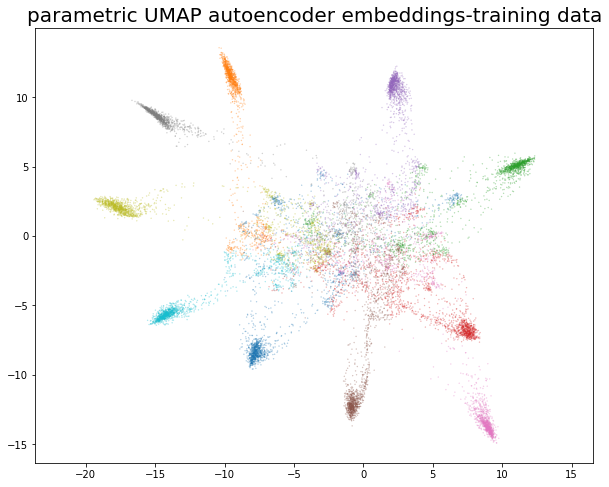

In [17]:
import matplotlib.pyplot as plt
vis_data=np.concatenate((test_data,border_center),axis=0)
vis_labels = np.concatenate((test_pred_labels, border_center_labels),axis=0)
# Project (train_data+augmentation_data)
z = embedder.transform(vis_data)
# z = embedder.transform(border_center)
# z = load_encoder(border_center)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
    c=vis_labels,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

Text(0.5, 1.0, 'parametric UMAP autoencoder embeddings-training data')

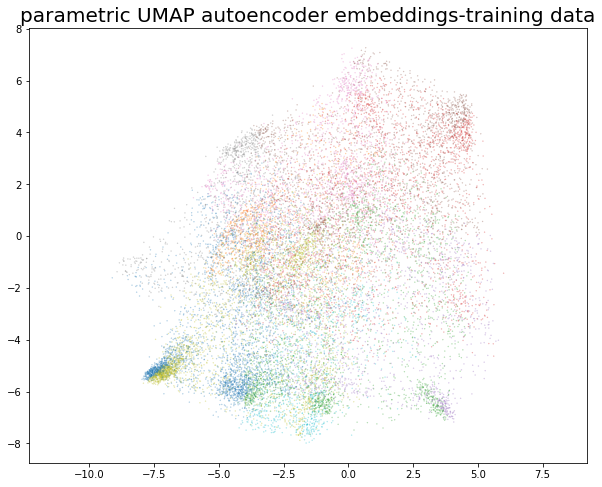

In [15]:
# Project (train_data+augmentation_data)
# z = embedder.transform(border_gap_data)
z = load_encoder(border_gap_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
    c=border_pred_labels,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

In [16]:
# train_data
# Project when adding adv data for data augmentation
z = embedder.transform(np.concatenate((train_data,augmentation_data),axis=0))
# z = load_encoder(train_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
#     c=train_labels,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

NameError: name 'augmentation_data' is not defined

## load adv samples

In [15]:
test_num = 50000
adv_succ_num = 4882
adv_fail_num = 5118
true_num = 10000

softmax = torch.nn.Softmax(dim=-1)

def pred_wrapper(x):
    with torch.no_grad():
        # tensor = torch.from_numpy(x).to(device, dtype=torch.float)
        logits = model.fc(x)
        probabilities = softmax(logits).cpu().numpy()
    return probabilities

# ---------------------load data------------------------------
test_samples = training_data[:test_num]
true_samples = torch.from_numpy(testing_data[:true_num]).to(device, dtype=torch.float)

Adv_succ = np.load("adv_testset\\succ.npy")
Adv_fail = np.load("adv_testset\\fail.npy")

adv_succ = torch.from_numpy(Adv_succ[-adv_succ_num:]).to(device, dtype=torch.float)
adv_fail = torch.from_numpy(Adv_fail[-adv_fail_num:]).to(device, dtype=torch.float)

In [12]:
raw_input_X = torch.from_numpy(test_samples).to(device, dtype=torch.float)
raw_input_X = torch.cat((raw_input_X, adv_succ), axis=0)
raw_input_X = torch.cat((raw_input_X, adv_fail), axis=0)
raw_input_X = torch.cat((raw_input_X, true_samples), axis=0)

input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = pred_wrapper(torch.from_numpy(pred).to(device, dtype=torch.float)).argmax(axis=1)
        output_Y[r1:r2] = pred
input_X.shape, output_Y.shape

((70000, 2048), (70000,))

In [5]:
np.save("input_X.npy",input_X)
np.save("output_Y.npy",output_Y)

NameError: name 'input_X' is not defined

In [17]:
input_X= np.load("input_X.npy")
output_Y = np.load("output_Y.npy")

In [18]:
embedded = load_encoder(input_X).cpu().numpy()
y_PRR = load_decoder(embedded).cpu().numpy()

Instructions for updating:
Use tf.identity instead.


In [13]:
embedded = embedder.transform(input_X)
y_PRR = embedder.inverse_transform(embedded)

2188/2188 [==============================] - 2s 1ms/step


In [14]:
np.save("embedded_augmentation.npy",embedded)
np.save("y_PRR_augmentation.npy",y_PRR)

In [7]:
embedded= np.load("embedded.npy")
y_PRR = np.load("y_PRR.npy")

In [7]:
embedded= np.load("embedded_augmentation.npy")
y_PRR = np.load("y_PRR_augmentation.npy")

In [20]:
# pick samples for training and testing
train_samples = input_X[:test_num]
train_labels = output_Y[:test_num]
test_adv_succ = input_X[test_num:test_num + adv_succ_num]
test_adv_succ_labels = output_Y[test_num:test_num + adv_succ_num]
test_adv_fail = input_X[test_num + adv_succ_num:test_num + adv_succ_num + adv_fail_num]
test_adv_fail_labels = output_Y[test_num + adv_succ_num:test_num + adv_succ_num + adv_fail_num]
test_true = input_X[-true_num:]
test_true_labels = output_Y[-true_num:]
# apply inverse mapping to embedded samples and
# predict the reconstructions
train_recon = y_PRR[:test_num]
train_recon_preds = pred_wrapper(torch.from_numpy(train_recon).to(device, dtype=torch.float)).argmax(axis=1)
train_confidence = pred_wrapper(torch.from_numpy(train_samples).to(device, dtype=torch.float)).max(axis=1)
train_new_confidence = pred_wrapper(torch.from_numpy(train_recon).to(device, dtype=torch.float)).max(axis=1)

adv_succ_recon = y_PRR[test_num:test_num + adv_succ_num]
adv_succ_recon_preds = pred_wrapper(torch.from_numpy(adv_succ_recon).to(device, dtype=torch.float)).argmax(
    axis=1)
adv_succ_confidence = pred_wrapper(torch.from_numpy(test_adv_succ).to(device, dtype=torch.float)).max(
    axis=1)
adv_succ_new_confidence = pred_wrapper(torch.from_numpy(adv_succ_recon).to(device, dtype=torch.float)).max(
    axis=1)

adv_fail_recon = y_PRR[test_num + adv_succ_num:test_num + adv_succ_num + adv_fail_num]
adv_fail_recon_preds = pred_wrapper(torch.from_numpy(adv_fail_recon).to(device, dtype=torch.float)).argmax(
    axis=1)
adv_fail_confidence = pred_wrapper(torch.from_numpy(test_adv_fail).to(device, dtype=torch.float)).max(
    axis=1)
adv_fail_new_confidence = pred_wrapper(torch.from_numpy(adv_fail_recon).to(device, dtype=torch.float)).max(
    axis=1)

true_recon = y_PRR[-true_num:]
true_recon_preds = pred_wrapper(torch.from_numpy(true_recon).to(device, dtype=torch.float)).argmax(axis=1)
true_confidence = pred_wrapper(torch.from_numpy(test_true).to(device, dtype=torch.float)).max(axis=1)
true_new_confidence = pred_wrapper(torch.from_numpy(true_recon).to(device, dtype=torch.float)).max(axis=1)

# calculate pred accuracy
n_correct = np.sum(train_labels == train_recon_preds)
train_acc = 100 * n_correct / test_num

n_correct = np.sum(test_adv_succ_labels == adv_succ_recon_preds)
test_adv_succ_acc = 100 * n_correct / float(adv_succ_num)

n_correct = np.sum(test_adv_fail_labels == adv_fail_recon_preds)
test_adv_fail_acc = 100 * n_correct / float(adv_fail_num)

n_correct = np.sum(test_true_labels == true_recon_preds)
test_true_acc = 100 * n_correct / float(true_num)

# calculate distance
train_distance = np.mean(np.sqrt(np.sum(np.square(train_samples - train_recon), axis=1)))
adv_succ_distance = np.mean(np.sqrt(np.sum(np.square(test_adv_succ - adv_succ_recon), axis=1)))
adv_fail_distance = np.mean(np.sqrt(np.sum(np.square(test_adv_fail - adv_fail_recon), axis=1)))
true_distance = np.mean(np.sqrt(np.sum(np.square(test_true - true_recon), axis=1)))

# calculate confidence difference
train_conf_diff = np.mean(np.abs(train_confidence - train_new_confidence))
adv_succ_conf_diff = np.mean(np.abs(adv_succ_confidence - adv_succ_new_confidence))
adv_fail_conf_diff = np.mean(np.abs(adv_fail_confidence - adv_fail_new_confidence))
true_conf_diff = np.mean(np.abs(true_confidence - true_new_confidence))

print("train acc:{:.2f}%, test_succ acc:{:.2f}%, test_fail acc:{:.2f}%, test_true acc:{:.2f}%".format(
    train_acc,
    test_adv_succ_acc,
    test_adv_fail_acc,
    test_true_acc))

print("train distance:{:.2f}, test_succ dis:{:.2f}, test_fail dis:{:.2f}, test_true dis:{:.2f}".format(
    train_distance,
    adv_succ_distance,
    adv_fail_distance,
    true_distance))
print(
    "train con diff:{:.2f}, test_succ con dif:{:.2f}, test_fail con diff:{:.2f}, test_true con diff:{:.2f}".format(
        train_conf_diff,
        adv_succ_conf_diff,
        adv_fail_conf_diff,
        true_conf_diff))

train acc:99.50%, test_succ acc:74.29%, test_fail acc:90.74%, test_true acc:97.03%
train distance:0.46, test_succ dis:1.84, test_fail dis:1.13, test_true dis:0.66
train con diff:0.01, test_succ con dif:0.16, test_fail con diff:0.06, test_true con diff:0.02


## deepview to visualize

In [8]:
# using deepview
from deepview import DeepView
# import os
# # remember to reset embedder
# save_location = "parametric_umap_models\parametric_umap_autoencoder"
    
# # load encoder
# encoder_path = os.path.join(save_location, "encoder".format(n_epoch))
# encoder = tf.keras.models.load_model(encoder_path)
# print("Keras encoder model loaded from {}".format(encoder_path))
# # load decoder
# decoder_path = os.path.join(save_location, "decoder".format(n_epoch))
# decoder = tf.keras.models.load_model(decoder_path)
# print("Keras decoder model loaded from {}".format(decoder_path))

In [13]:
border_gap_data = np.load("ifgsm_augmentation_data.npy")
border_pred_labels = np.load("adv_pred_labels.npy")
border_gap_data.shape, border_pred_labels.shape

((18072, 2048), (18072,))

In [12]:
MAX_SAMPLES = 100000

# ---------------------choose device------------------------------
# device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device = torch.device("cpu")
print(device)

# ---------------------load models------------------------------
model = resnet50(pretrained=True)
model.eval()
model.to(device)
print("Load Model successfully...")

# ---------------------load dataset------------------------------
softmax = torch.nn.Softmax(dim=-1)

def pred_wrapper(x):
    with torch.no_grad():
        tensor = torch.from_numpy(x).to(device, dtype=torch.float)
        logits = model.fc(tensor).cpu().numpy()
#         probabilities = softmax(logits).cpu().numpy()
    return logits

def visualization(image, point2d, pred, label=None, title=None):
    f, a = plt.subplots()
    a.set_title(title)
    a.imshow(image.transpose([1, 2, 0]))

classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

# ---------------------deepview------------------------------
batch_size = 200
max_samples = MAX_SAMPLES + 2
data_shape = (2048,)
n = 5
lam = 0
resolution = 100
cmap = 'tab10'
title = 'ResNet-56 - CIFAR10 GAP layer (200 images)-parametric umap inverse'

test_num = 10000

# x = np.concatenate((border_center,train_data),axis=0)
# y = np.concatenate((border_center_labels,train_pred_labels),axis=0)
# y=np.zeros(len(ifgsm_augmentation_data))
# x=train_data
# y=train_pred_labels
# x= border_center
# y=border_center_labels
x = BP_bs
y = BP_bs_labels

deepview = DeepView(pred_wrapper, classes, max_samples, batch_size,
                    data_shape, n, lam, resolution, cmap, title=title, data_viz=visualization,
                    metric="parametricUmap", encoder=load_encoder, decoder=load_decoder)

cpu
Load Model successfully...


Embedding samples ...
Computing decision regions ...


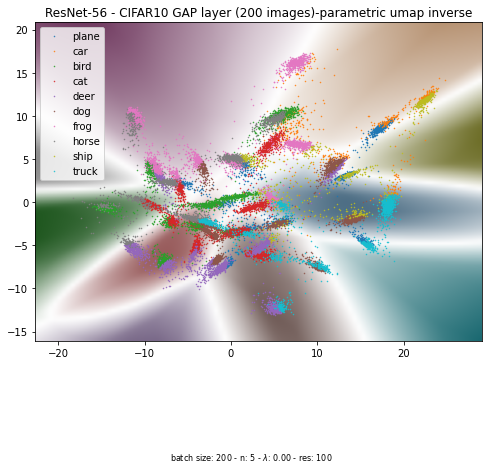

In [13]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


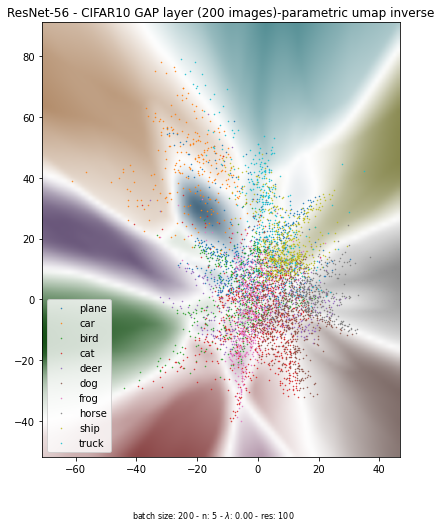

In [17]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


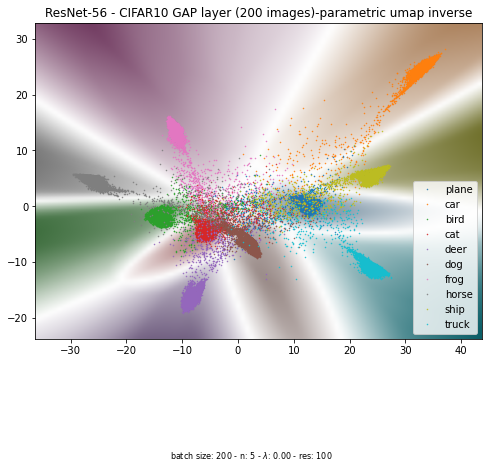

In [39]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


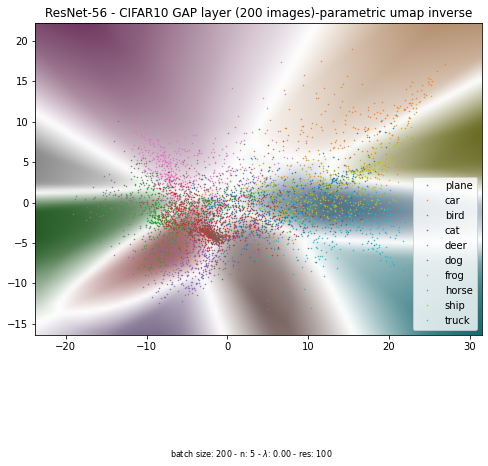

In [37]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


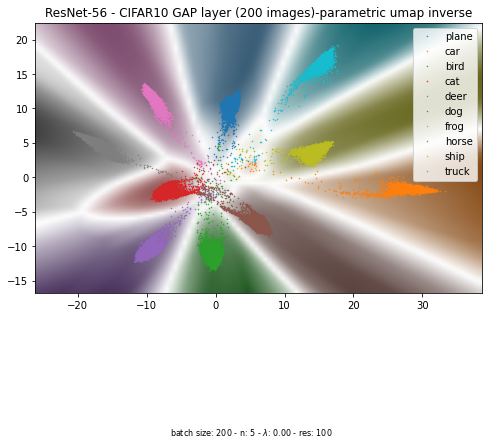

In [34]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


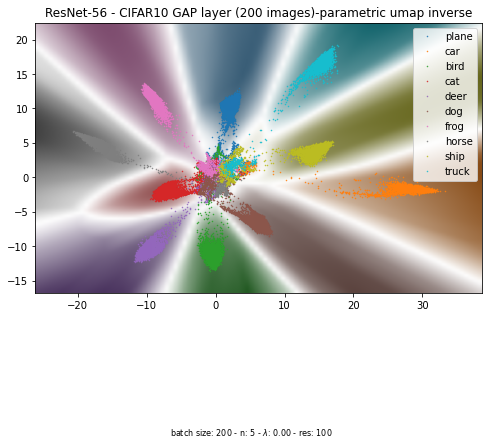

In [32]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Instructions for updating:
Use tf.identity instead.
Computing decision regions ...


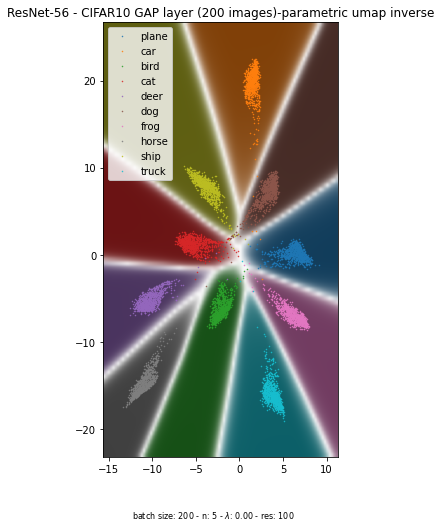

In [12]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


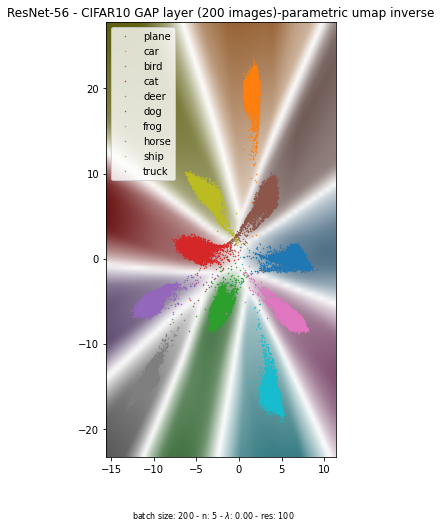

In [16]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


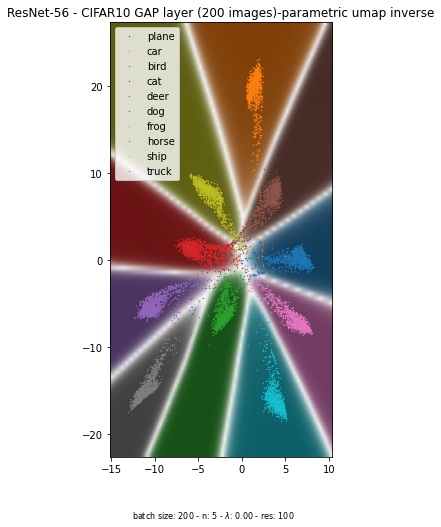

In [15]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


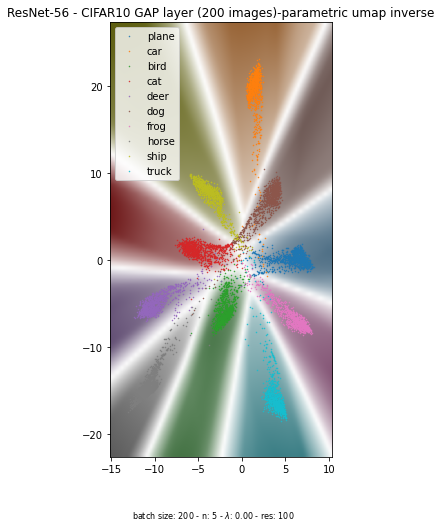

In [18]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


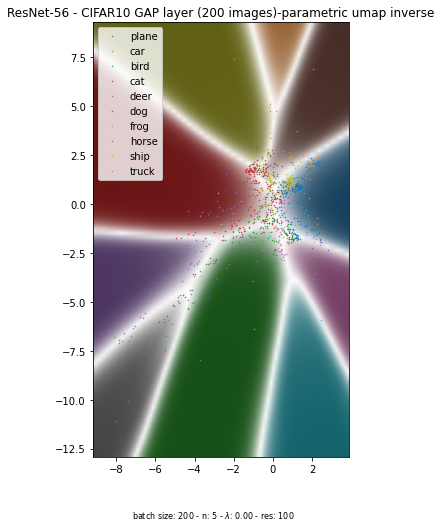

In [18]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


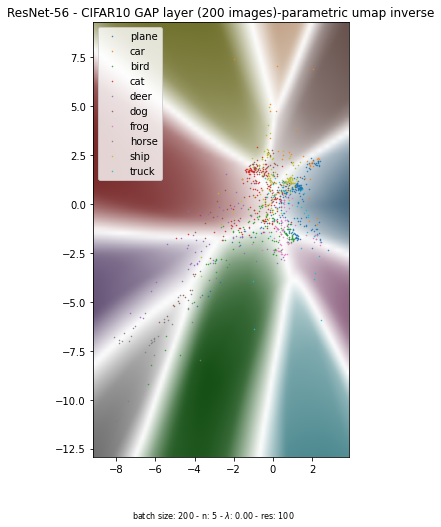

In [14]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Instructions for updating:
Use tf.identity instead.
Computing decision regions ...


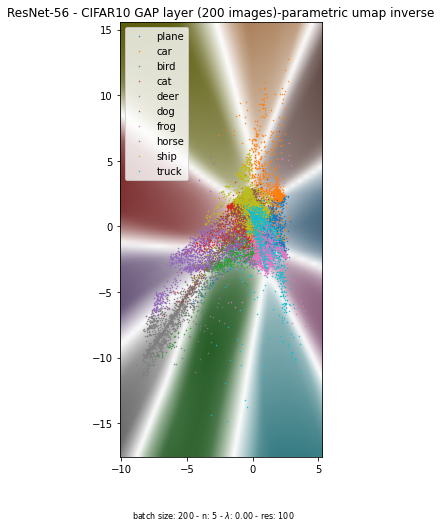

In [18]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


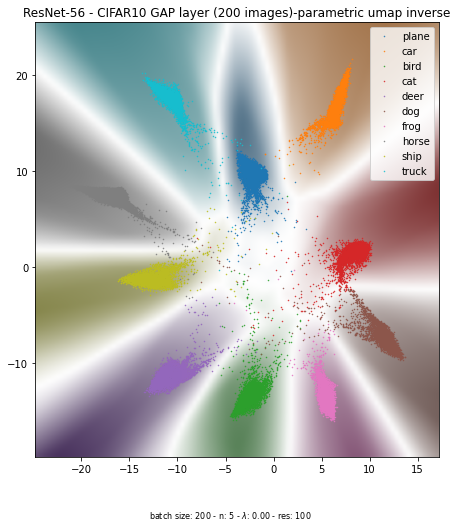

In [26]:
deepview.add_samples(x, y)
deepview.show()

# augmentation data cluster 

Embedding samples ...
Computing decision regions ...


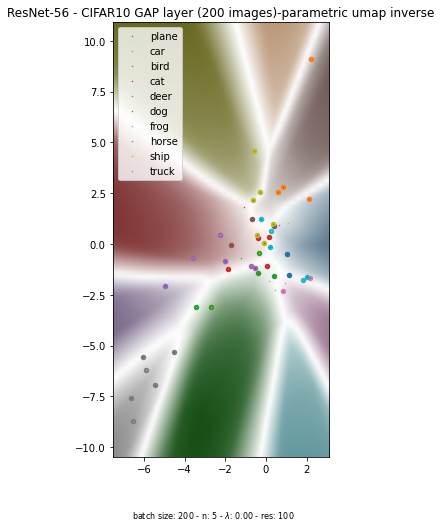

In [28]:
deepview.add_samples(x, y[:50])
deepview.show()

Embedding samples ...
Computing decision regions ...


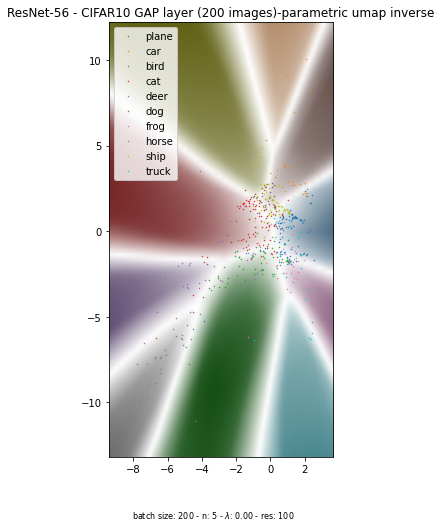

In [30]:
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Instructions for updating:
Use tf.identity instead.
Computing decision regions ...


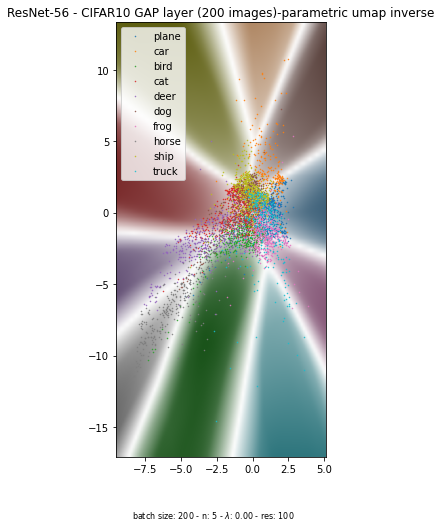

In [9]:
# cluster
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


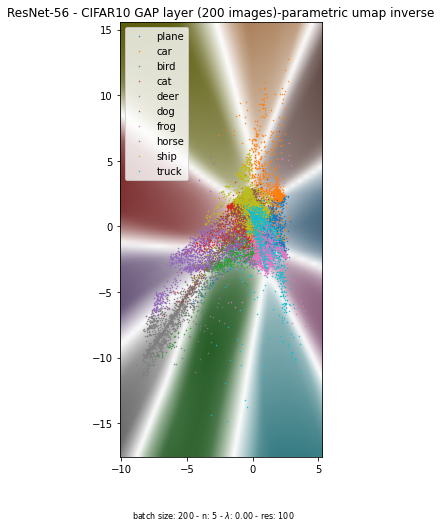

In [13]:
# cluster all
deepview.add_samples(x, y)
deepview.show()

Embedding samples ...
Computing decision regions ...


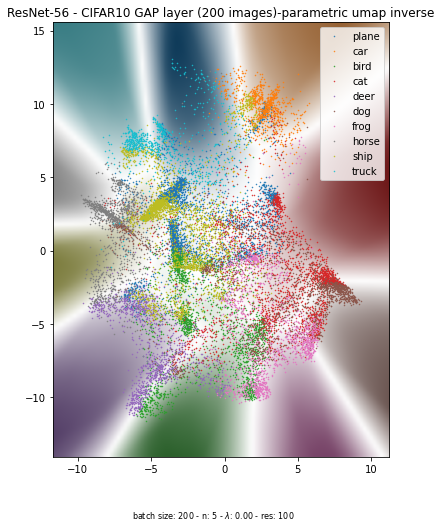

In [24]:
deepview.add_samples(x, y)
deepview.show()

## visualize adv samples

153/153 [==============================] - 0s 1ms/step


Text(0.5, 1.0, 'parametric UMAP autoencoder embeddings-training data')

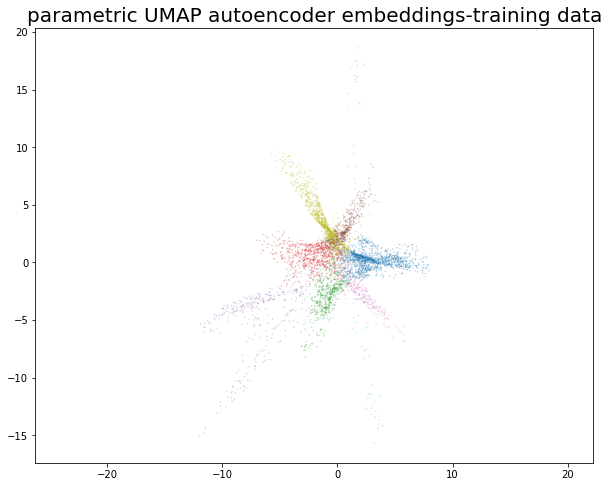

In [28]:
import matplotlib.pyplot as plt
# Project data
z = embedder.transform(test_adv_succ)
# z = load_encoder(train_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
    c=test_adv_succ_labels,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

153/153 [==============================] - 0s 1ms/step


Text(0.5, 1.0, 'parametric UMAP autoencoder embeddings-training data')

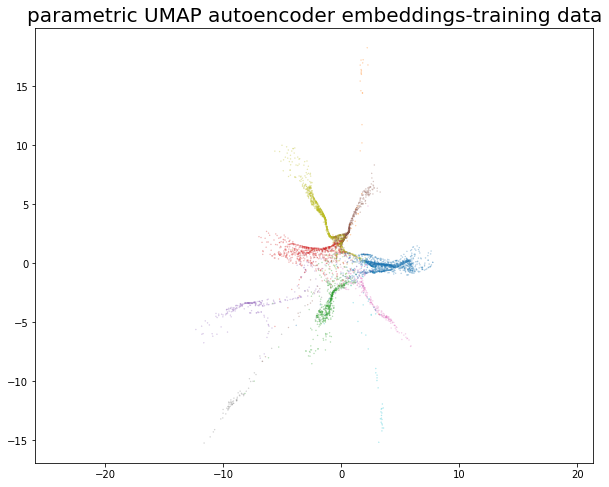

In [29]:
# Project data
z = embedder.transform(adv_succ_recon)
# z = load_encoder(train_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
    c=test_adv_succ_labels,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

1563/1563 [==============================] - 2s 971us/step


Text(0.5, 1.0, 'parametric UMAP autoencoder embeddings-training data')

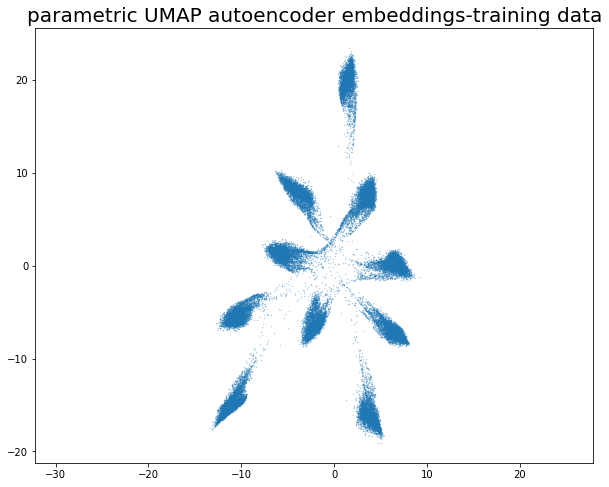

In [30]:
# Project data
z = embedder.transform(train_data)
# z = load_encoder(train_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
#     c=,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

10/10 [==============================] - 0s 5ms/step


Text(0.5, 1.0, 'parametric UMAP autoencoder embeddings-training data')

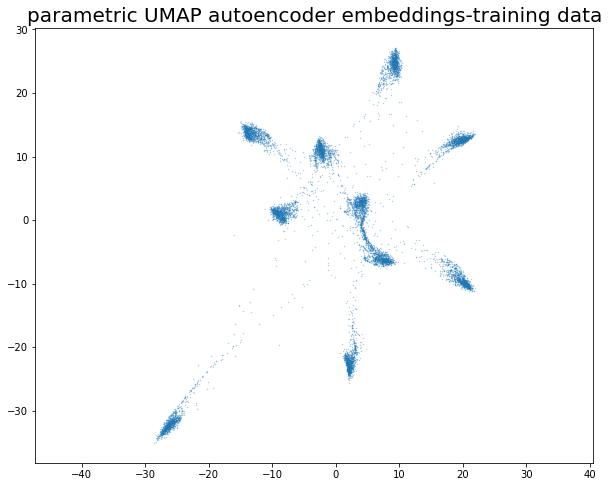

In [37]:
# Project data
z = embedder.transform(test_data)
# z = load_encoder(train_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
#     c=,
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)

## data augmentation

In [13]:
from pytorch_lightning import Trainer, seed_everything
from pytorch_lightning.callbacks import LearningRateMonitor
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.core.lightning import LightningModule

In [5]:
# Data augmentation and normalization for training
# Just normalization for validation
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomCrop(size=[32,32], padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(*CIFAR_NORM)
    ]),
    'test': transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(*CIFAR_NORM)
    ]),
}

trainset = torchvision.datasets.CIFAR10(root='data', train=True,
                                        download=True, transform=data_transforms['train'])
trainloader = torch.utils.data.DataLoader(trainset, batch_size=2000,
                                          shuffle=True, num_workers=2)
testset = torchvision.datasets.CIFAR10(root='data', train=False,
                                       download=True, transform=data_transforms['test'])
testloader = torch.utils.data.DataLoader(testset, batch_size=2000,
                                         shuffle=False, num_workers=2)

class_names = ("airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Files already downloaded and verified
Files already downloaded and verified


In [5]:
import torch.optim as optim
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

In [6]:
model.train()
# freeze front layers
ct = 0
for child in model.children():
    ct += 1
    if ct < 5:
        for param in child.parameters():
            param.requires_grad = False

for epoch in range(2):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.cuda(device)
        labels = labels.cuda(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

RuntimeError: CUDA out of memory. Tried to allocate 500.00 MiB (GPU 0; 6.00 GiB total capacity; 3.41 GiB already allocated; 343.85 MiB free; 3.95 GiB reserved in total by PyTorch)

In [ ]:
#save model
save_dir = os.path.join("parametric_umap_models","resnet50_data_augmentation")
torch.save(model.state_dict(), os.path.join(save_dir,"resnet50.pt"))

In [8]:
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda(device)
        labels = labels.cuda(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: {:.2f}%'.format(
    100 * correct / total))

Accuracy of the network on the 10000 test images: 93.86%
